In [1]:
import torch
import numpy as np
from sklearn import mixture
import tensorflow as tf

from torchvision.datasets import MNIST
import torchvision.transforms as transforms
from torch.utils.data import DataLoader

import torchvision

import matplotlib.pyplot as plt
%matplotlib inline

/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


In [2]:
class ConvergenceException(Exception):
    def __init__(self, value):
        self.value = value
    
    def __str__(self):
        return repr(self.value)
    
class InfException(Exception):
    def __init__(self, value):
        self.value = value
    
    def __str__(self):
        return repr(self.value)

In [16]:
class GMM():
    def __init__(self, n_components, batch_size, training_steps = 1000, tolerance = 1e-6, t0 = 500, alpha_eta = 0.6, verbose = 1):
        self.n_components = n_components
        self.batch_size = batch_size
        self.training_steps = training_steps
        self.tolerance = tolerance
        self.t0 = t0
        self.alpha_eta = alpha_eta
        self.verbose = verbose
        self.mean_log_likelihood = None
        
    def bic(self, ll, X):
        """Bayesian information criterion for the current model on the input X.
        Parameters
        ----------
        ll : maximum value of log likelihood
        X : array of shape (n_samples, n_dimensions)
        n_components : number of components in GMM
        Returns
        -------
        bic : float
            The lower the better.
        """
        return (-2 * ll * X.shape[0] +
                self.n_components * np.log(X.shape[0]))

    def aic(self, ll, X):
        """Akaike information criterion for the current model on the input X.
        Parameters
        ----------
        ll : maximum value of log likelihood
        X : array of shape (n_samples, n_dimensions)
        n_components : number of components in GMM
        Returns
        -------
        aic : float
            The lower the better.
        """
        return -2 * ll * X.shape[0] + 2 * self.n_components
    
    def initialisation(self, data, alpha = 1.0, beta = 1.0):
        #data: images array (n, d) 
        self.dimensions = data.shape[1]
        self.n_samples = data.shape[0]
        self.data = data
        self.alpha = alpha
        self.beta = beta
        
        # constants: D*ln(2*pi), variance prior parameters
        self.ln2piD = torch.tensor(np.log(2 * np.pi) * self.dimensions, dtype=torch.float32)
        
        
        
         ## Init with GMM from sklearn with one full covariance matrix for all components (tied)
        gmm = mixture.GaussianMixture(n_components=self.n_components, covariance_type='diag', max_iter=100)

        if len(data) > 50000:  # Only work on a subset to accelerate computing
            gmm.fit(data[np.random.choice(len(data), 50000, replace=False)])
        else:
            gmm.fit(data)

        if self.verbose > 1:
            print('Input statistics computed')
        
        self.means = torch.tensor(gmm.means_, dtype=torch.float32)
        self.covariances = self.__n_diag(torch.tensor(gmm.covariances_, dtype=torch.float32))
        self.weights = torch.tensor(gmm.weights_, dtype = torch.float32)
        self.eta = torch.tensor((1 + self.t0) ** -self.alpha_eta, dtype=torch.float32)

    def computeLL(self, inputs, exp_log_shifted_sum, log_shift):
        # log-likelihood: objective function being maximized up to a TOLERANCE delta
        log_likelihood = torch.sum(torch.log(exp_log_shifted_sum)) + torch.sum(log_shift)

        return log_likelihood / torch.tensor(inputs.shape[0] * inputs.shape[1], dtype=torch.float32)

    def computeSampleLL(self, exp_log_shifted_sum, log_shift):
        # log-likelihood: objective function being maximized up to a TOLERANCE delta
        return torch.log(exp_log_shifted_sum) + log_shift
        
    def __n_eyes(self, dim, n = 1):
        eyes = torch.eye(dim)
        if n > 1:
            eyes = eyes.unsqueeze(0)
            for i in range(1, n):
                eyes = torch.cat((eyes, torch.eye(dim).unsqueeze(0)), 0)
        return eyes
    
    def __n_mat_log_det_k(self, mats, k=1e6):
        dets = []
        for i in range(mats.shape[0]):
            t = torch.logdet(k * mats[i]).item() - mats[i].shape[0] * torch.log(torch.tensor(k)).item()
            if t == -np.inf or t == np.nan:
                print('exception', t)
            dets.append(t)
        return torch.tensor(dets)
    
    def __n_mat_inverse(self, mats):
        inverse_mat = torch.inverse(mats[0]).unsqueeze(0)
        for i in range(1, mats.shape[0]):
            torch.cat((inverse_mat, torch.inverse(mats[i]).unsqueeze(0)), dim=0)
        return inverse_mat
    
    def __n_diag(self, diags):
        diag = torch.diag(diags[0]).unsqueeze(0)
        for i in range(1, diags.shape[0]):
            diag= torch.cat((diag, torch.diag(diags[i]).unsqueeze(0)), dim = 0)
        return diag
    
    
    def E_step(self, inputs):
#         print(self.covariances.shape)
        for i in range(self.covariances.shape[0]):
            print(self.covariances[i].max(), self.ln2piD)
        # E-step: recomputing responsibilities with respect to the current parameter values
#         print(self.covariances.shape)
#         print(self.dimensions)
        differences = inputs.unsqueeze(0) - self.means.unsqueeze(1)
#         print((self.covariances + self.__n_eyes(dim= self.dimensions, n = self.n_components)).shape)
        try:
            diff_times_inv_cov = torch.matmul(differences, self.__n_mat_inverse(
                self.covariances + 1e-6 * self.__n_eyes(dim= self.dimensions, n = self.n_components)))
        except:  # If covariances matrices are not invertible, add some noise to recover
            diff_times_inv_cov = torch.matmul(differences, self.__n_mat_inverse(
                self.covariances + self.__n_eyes(dim= self.dimensions, n = self.n_components)))
        
#         print(diff_times_inv_cov.max(), differences.max())
        
        sum_sq_dist_times_inv_cov = torch.sum(diff_times_inv_cov * differences, 2)
        
#         print((1e6 * self.covariances[0]).min(1)[0])
#         print(sum_sq_dist_times_inv_cov)
#         print(torch.det(self.covariances[0] + torch.eye(self.dimensions)), self.ln2piD)
        try:
            log_coefficients = torch.unsqueeze(self.ln2piD + self.__n_mat_log_det_k(self.covariances), 1)
        except:
            # If batch_size is two small regarding DIMENSIONS size,
            # covariances could be not low rank and so not invertible and so matrix_determinant is infinite
            log_coefficients = torch.unsqueeze(self.ln2piD + 
                                               self.__n_mat_log_det_k(
                                                   self.covariances + 
                                                   1e-6 * self.__n_eyes(dim= self.dimensions, n = self.n_components)), 
                                               1)
        print(log_coefficients)
        log_components = -0.5 * (log_coefficients + sum_sq_dist_times_inv_cov)
#         print(log_components)
#         print(self.weights)
        log_weighted = log_components + torch.unsqueeze(torch.log(self.weights), 1)
#         print(log_weighted)
#         print(torch.stack(torch.max(log_weighted, 0)))
#         return 
        log_shift = torch.unsqueeze(torch.max(log_weighted, 0)[0], 0)
#         print(log_shift)
        exp_log_shifted = torch.exp(log_weighted - log_shift)
#         print(log_weighted - log_shift)
        exp_log_shifted_sum = torch.sum(exp_log_shifted, 0) + np.spacing(1)
        gamma = exp_log_shifted / exp_log_shifted_sum
#         print(gamma)
        gamma_sum = torch.sum(gamma, 1) + np.spacing(1)
#         print(gamma_sum)
        gamma_weighted = gamma / torch.unsqueeze(gamma_sum, 1)
        
#         print(log_shift, exp_log_shifted_sum, gamma_weighted, gamma_sum)
        return log_shift, exp_log_shifted_sum, gamma_weighted, gamma_sum

    def M_step(self, inputs, log_shift, exp_log_shifted_sum, gamma_weighted, gamma_sum):

        # M-step: maximizing parameter values with respect to the computed responsibilities
        means_ = torch.sum(torch.unsqueeze(inputs, 0) * torch.unsqueeze(gamma_weighted, 2), 1)
#         print(gamma_weighted)
#         print('means_max', means_)
        differences_ = torch.sub(torch.unsqueeze(inputs, 0), torch.unsqueeze(means_, 1))
        sq_dist_matrix = torch.matmul(torch.unsqueeze(differences_, 3), torch.unsqueeze(differences_, 2))
        covariances_ = torch.sum(sq_dist_matrix * torch.unsqueeze(torch.unsqueeze(gamma_weighted, 2), 3), 1)
        weights_ = gamma_sum / torch.tensor(inputs.shape[0], dtype=torch.float32)

        # applying prior to the computed covariances
        covariances_ *= torch.unsqueeze(torch.unsqueeze(gamma_sum, 1), 2)
#         print(covariances_.shape)
        covariances_ += torch.unsqueeze(torch.eye(self.dimensions, dtype=torch.float) * 2.0 * self.beta, 0)
#         print(covariances_.shape)
        covariances_ /= torch.unsqueeze(torch.unsqueeze(gamma_sum + (2.0 * (self.alpha + 1.0)), 1), 2)
#         print(covariances_.shape)

        # log-likelihood: objective function being maximized up to a TOLERANCE delta
        self.mean_log_likelihood = self.computeLL(inputs, exp_log_shifted_sum, log_shift)

        # updating the parameters by new values
        
        self.means = self.means * (1 - self.eta) + self.eta * means_
        self.covariances = self.covariances * (1 - self.eta) + self.eta * covariances_
        self.weights = self.weights * (1 - self.eta) + self.eta * weights_
    
    def training_step(self, inputs):

        log_shift, exp_log_shifted_sum, gamma_weighted, gamma_sum = self.E_step(inputs)

        return self.M_step(inputs, log_shift, exp_log_shifted_sum, gamma_weighted, gamma_sum)

    def fit(self, data):

        # Init step
        self.initialisation(data=data)

        previous_likelihood = -np.inf

        # training loop
        for step in range(self.training_steps): #TRAINING_STEPS is only the maximal number of iterations
            if step < 10:
                self.eta = self.eta / 2
            else:
                self.eta = (step + self.t0) ** - self.alpha_eta

            # executing a training step and
            # fetching evaluation information

            # Online (incremental EM)
            batch_idx = np.random.choice(range(len(data)), size=self.batch_size, replace=False)
            batch = data[batch_idx]
#             batch = (batch - torch.mean(batch, 1).unsqueeze(1)) / torch.var(batch, 1).unsqueeze(1)

            self.training_step(batch)
            
            current_likelihood = self.mean_log_likelihood
            
            if step > 0:
                # computing difference between consecutive likelihoods
                difference = np.abs(current_likelihood - previous_likelihood)
                if self.verbose > 0:
                    print("{0}:\tmean-likelihood {1:.8f}\tdifference {2}".format(
                        step, current_likelihood, difference))

                # stopping if TOLERANCE reached
#                 if step == 2:
#                     break
                if difference <= self.tolerance:
                    break
            else:
                if self.verbose > 0:
                    print("{0}:\tmean-likelihood {1:.8f}".format(
                        step, current_likelihood))

            previous_likelihood = current_likelihood

            if step == self.training_steps:
                try:
                    raise ConvergenceException(current_likelihood)
                except ConvergenceException as e:
                    print('EM has not converged. Mean likelihood value is :', str(e.value))
    
    def predict_proba(self, data):
        
        log_shift, exp_log_shifted_sum, gamma_weighted, gamma_sum = self.E_step(data)

        ll = self.computeLL(data, exp_log_shifted_sum, log_shift)

        return ll, gamma_weighted

    def loglikelihood_samples(self, data):
        log_shift, exp_log_shifted_sum, gamma_weighted, gamma_sum = self.E_step(data)

        ll = self.computeSampleLL(exp_log_shifted_sum, log_shift)

        return ll
        
    
# gmm = GMM(n_components=10, batch_size=10, verbose=2)
# gmm.fit(trainset.train_data[:1000].view(-1, 28 * 28).float()) 

In [17]:
root_path = './data'
transform = transforms.ToTensor()
trainset = MNIST(root=root_path, train=True, download=True, transform=transform)
testet = MNIST(root=root_path, train=False, download=True, transform=transform)
trainloader = DataLoader(dataset=trainset, shuffle=True, 
                         batch_size=10, num_workers=6)
testloader = DataLoader(dataset=testet, shuffle=False, 
                        batch_size=10, num_workers=6)

In [18]:
t = trainset.train_data[0].view(-1, 28 * 28).float()
t = t - torch.mean(t)
t = t / torch.var(t)
# print(t)
m = torch.tensor([[1,2], [3,5]], dtype=torch.float32)
print((m - torch.mean(m, 1).unsqueeze(1)) / torch.var(m, 1).unsqueeze(1))
print(torch.var(m , 1))


tensor([[-1.0000,  1.0000],
        [-0.5000,  0.5000]])
tensor([ 0.5000,  2.0000])


In [19]:
gmm = GMM(n_components=10, batch_size=10, verbose=2, tolerance= 1)
gmm.fit(trainset.train_data[:1000].view(-1, 28 * 28).float() )

Input statistics computed
tensor(13284.5938) tensor(1440.8956)
tensor(13431.1953) tensor(1440.8956)
tensor(13620.7559) tensor(1440.8956)
tensor(13584.0127) tensor(1440.8956)
tensor(13216.7539) tensor(1440.8956)
tensor(14323.5283) tensor(1440.8956)
tensor(13656.7910) tensor(1440.8956)
tensor(13401.2764) tensor(1440.8956)
tensor(14141.2148) tensor(1440.8956)
tensor(13910.4658) tensor(1440.8956)
tensor([[ -551.1758],
        [-1083.5907],
        [ -204.1289],
        [  395.8477],
        [ -595.1113],
        [   20.5898],
        [ -631.1210],
        [ -705.4706],
        [  580.8848],
        [ 1663.1709]])
0:	mean-likelihood -34801328.00000000
tensor(13191.9834) tensor(1440.8956)
tensor(13270.0693) tensor(1440.8956)
tensor(13457.3555) tensor(1440.8956)
tensor(13421.0527) tensor(1440.8956)
tensor(13058.1992) tensor(1440.8956)
tensor(14151.6953) tensor(1440.8956)
tensor(13492.9570) tensor(1440.8956)
tensor(13240.5078) tensor(1440.8956)
tensor(13971.5693) tensor(1440.8956)
tensor(13743

tensor([[ 3283.6719],
        [ 3073.3613],
        [ 3518.8281],
        [ 3982.3838],
        [ 3395.5225],
        [ 3861.2393],
        [ 3423.6924],
        [ 3261.8730],
        [ 4131.2969],
        [ 4594.4150]])
13:	mean-likelihood -4804.53710938	difference 1515.120361328125
tensor(12402.5420) tensor(1440.8956)
tensor(11922.6621) tensor(1440.8956)
tensor(12241.6816) tensor(1440.8956)
tensor(12116.8877) tensor(1440.8956)
tensor(11918.5850) tensor(1440.8956)
tensor(12703.9326) tensor(1440.8956)
tensor(12112.5859) tensor(1440.8956)
tensor(12019.5693) tensor(1440.8956)
tensor(12570.6846) tensor(1440.8956)
tensor(12337.5742) tensor(1440.8956)
tensor([[ 3358.2471],
        [ 3131.0254],
        [ 3607.2227],
        [ 4056.3340],
        [ 3486.3252],
        [ 3913.8281],
        [ 3501.9502],
        [ 3335.3203],
        [ 4194.6729],
        [ 4632.2891]])
14:	mean-likelihood -3771.38549805	difference 1033.151611328125
tensor(12168.5996) tensor(1440.8956)
tensor(11640.9658) tens

tensor([[ 3762.2891],
        [ 3412.7715],
        [ 3886.6514],
        [ 4289.1582],
        [ 3791.2256],
        [ 4187.7832],
        [ 3789.6318],
        [ 3657.7441],
        [ 4427.1533],
        [ 4803.3271]])
26:	mean-likelihood -1140.57507324	difference 453.3916015625
tensor(9996.9316) tensor(1440.8956)
tensor(9167.7158) tensor(1440.8956)
tensor(9232.7334) tensor(1440.8956)
tensor(9134.2539) tensor(1440.8956)
tensor(9059.4619) tensor(1440.8956)
tensor(9330.1611) tensor(1440.8956)
tensor(9000.4854) tensor(1440.8956)
tensor(8959.6045) tensor(1440.8956)
tensor(9232.3066) tensor(1440.8956)
tensor(9061.1016) tensor(1440.8956)
tensor([[ 3771.0039],
        [ 3421.9727],
        [ 3898.7832],
        [ 4290.8828],
        [ 3798.9961],
        [ 4196.2598],
        [ 3800.5361],
        [ 3662.2061],
        [ 4432.9824],
        [ 4805.5879]])
27:	mean-likelihood -734.41278076	difference 406.16229248046875
tensor(9764.2490) tensor(1440.8956)
tensor(8954.3369) tensor(1440.8956)
t

tensor([[ 3879.9043],
        [ 3484.9834],
        [ 3932.0693],
        [ 4312.6680],
        [ 3855.2432],
        [ 4214.8086],
        [ 3833.2334],
        [ 3702.1094],
        [ 4422.8457],
        [ 4769.9961]])
39:	mean-likelihood -669.50231934	difference 401.1216735839844
tensor(8763.2852) tensor(1440.8956)
tensor(6764.0884) tensor(1440.8956)
tensor(6926.4165) tensor(1440.8956)
tensor(6819.9067) tensor(1440.8956)
tensor(6753.9424) tensor(1440.8956)
tensor(6883.9375) tensor(1440.8956)
tensor(6650.5522) tensor(1440.8956)
tensor(6700.5200) tensor(1440.8956)
tensor(6904.0439) tensor(1440.8956)
tensor(6685.4297) tensor(1440.8956)
tensor([[ 3890.6221],
        [ 3487.1270],
        [ 3929.3584],
        [ 4309.0469],
        [ 3853.7354],
        [ 4210.6924],
        [ 3834.2275],
        [ 3701.2383],
        [ 4417.8721],
        [ 4765.3086]])
40:	mean-likelihood -483.45092773	difference 186.0513916015625
tensor(8645.5498) tensor(1440.8956)
tensor(6608.9399) tensor(1440.8956)


tensor([[ 3910.5664],
        [ 3470.4365],
        [ 3893.7812],
        [ 4258.0977],
        [ 3836.7324],
        [ 4170.1201],
        [ 3806.0459],
        [ 3691.2256],
        [ 4362.5850],
        [ 4682.1582]])
52:	mean-likelihood -251.20083618	difference 119.52059936523438
tensor(7544.0259) tensor(1440.8956)
tensor(5123.4077) tensor(1440.8956)
tensor(5312.5259) tensor(1440.8956)
tensor(5171.1577) tensor(1440.8956)
tensor(5005.2505) tensor(1440.8956)
tensor(5101.5767) tensor(1440.8956)
tensor(4928.6309) tensor(1440.8956)
tensor(5467.8433) tensor(1440.8956)
tensor(5116.4834) tensor(1440.8956)
tensor(4974.7417) tensor(1440.8956)
tensor([[ 3915.7822],
        [ 3465.4824],
        [ 3888.1816],
        [ 4254.6875],
        [ 3831.6123],
        [ 4166.4717],
        [ 3803.1387],
        [ 3687.2480],
        [ 4357.7812],
        [ 4674.9814]])
53:	mean-likelihood -464.96279907	difference 213.761962890625
tensor(7449.4238) tensor(1440.8956)
tensor(5007.5615) tensor(1440.8956)


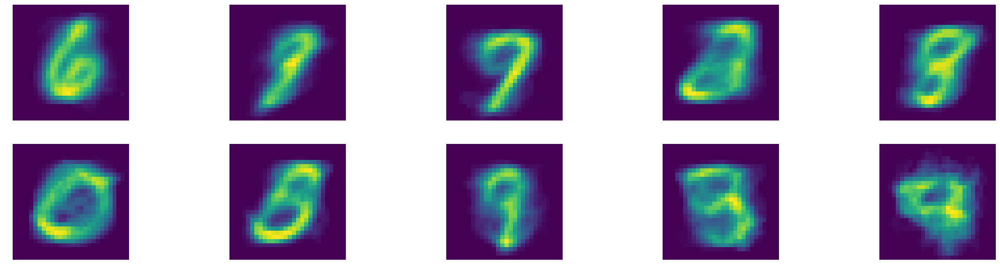

In [20]:
plt.figure(figsize=(40,10))
for i in range(gmm.means.shape[0]):
    plt_idx = i + 1
    plt.subplot(2,5,plt_idx)
    plt.imshow(gmm.means[i].view(28, 28))
    plt.axis("off")
plt.show()

In [21]:
p = torch.transpose(gmm.predict_proba(data=testet.test_data.view(-1, 28 * 28).float())[1], 1, 0)
pl = torch.max(p, 1)[1]
print(torch.mean((testet.test_labels == pl).float()))

tensor(7372.0195) tensor(1440.8956)
tensor(4894.4575) tensor(1440.8956)
tensor(5076.4907) tensor(1440.8956)
tensor(4940.0718) tensor(1440.8956)
tensor(4781.5791) tensor(1440.8956)
tensor(4993.1387) tensor(1440.8956)
tensor(4708.3857) tensor(1440.8956)
tensor(5223.7964) tensor(1440.8956)
tensor(4887.8413) tensor(1440.8956)
tensor(4752.4321) tensor(1440.8956)
tensor([[ 3914.6943],
        [ 3461.3896],
        [ 3881.9238],
        [ 4244.3877],
        [ 3824.0186],
        [ 4160.4189],
        [ 3796.6572],
        [ 3680.4922],
        [ 4345.1426],
        [ 4656.0957]])
tensor(0.1365)


In [ ]:
data = tf.ones(shape=[2,2])
means = tf.Variable([0.1,1.1])
differences = tf.subtract(tf.expand_dims(data, 0), tf.expand_dims(means, 1))
sess = tf.InteractiveSession()
means.initializer.run()

print(sess.run(differences))
t = tf.eye(5, batch_shape=[5], dtype=tf.float32)
print(sess.run(tf.diag(tf.fill([6], 2.0 * 1))))

In [ ]:
m = torch.ones((2,2))
n = torch.tensor([0.1, 1.1])
differences = torch.sub(m.unsqueeze(0), n.unsqueeze(1))
print(m.unsqueeze(1))
t = torch.eye(5)
print(torch.cat((t.unsqueeze(0),t.unsqueeze(0)), 0))

def m_eyes(dim, n = 1):
    eyes = torch.eye(dim)
    if n > 1:
        eyes = eyes.unsqueeze(0)
        for i in range(1, n):
            eyes = torch.cat((eyes, torch.eye(dim).unsqueeze(0)), 0)
    return eyes
print(gmm._GMM__n_eyes(5,2))
torch.exp(m)

In [25]:
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt


DIMENSIONS = 784
COMPONENTS = 5
DATA_POINTS = 50000

BATCH_SIZE = 100
TRAINING_STEPS = 1000
TOLERANCE = 1e-6

T0 = 500
alpha_eta = 0.6

# Generating data
data, y = make_blobs(n_samples=DATA_POINTS, n_features=DIMENSIONS, centers=COMPONENTS,
                                   random_state=10)
#data, true_means, true_variances, true_weights = generate_gmm_data( DATA_POINTS, COMPONENTS, DIMENSIONS, 10)


gmm = GMM(n_components=COMPONENTS, batch_size = BATCH_SIZE, verbose=2)

gmm.fit(torch.tensor(data).float())


test_idx = np.random.choice(range(len(data)), size=5000, replace=False)
test = data[test_idx]

ll, features = gmm.predict_proba(torch.tensor(test).float())
print(ll)
print(gmm.mean_log_likelihood)
print(features.shape)

Input statistics computed
tensor(1.0436) tensor(1440.8956)
tensor(1.0395) tensor(1440.8956)
tensor(1.0554) tensor(1440.8956)
tensor(1.0525) tensor(1440.8956)
tensor(1.0473) tensor(1440.8956)
tensor([[ 1439.9678],
        [ 1440.3584],
        [ 1440.7041],
        [ 1440.6172],
        [ 1440.7139]])
tensor([[-1109.6577, -1077.8636, -1120.2888, -1095.8324, -1120.1659,
         -1072.1481, -1148.8790, -1101.7130, -1134.2102, -1114.0719,
         -1101.7622, -1109.5570, -1099.1271, -1073.2386, -1116.0516,
         -1122.9369, -1147.8121, -1079.0950, -1102.9716, -1132.2052,
         -1110.5085, -1097.6359, -1113.9075, -1112.3621, -1111.1115,
         -1102.7251, -1125.0187, -1080.9493, -1073.2283, -1132.3351,
         -1106.2672, -1111.4325, -1146.1199, -1089.9519, -1101.7496,
         -1092.4924, -1096.0575, -1133.0619, -1115.5529, -1127.4902,
         -1114.0450, -1108.7708, -1093.7229, -1113.1725, -1123.7634,
         -1113.0306, -1109.6532, -1113.1981, -1120.9954, -1090.7112,
        

0:	mean-likelihood -1.41756523
tensor(1.0402) tensor(1440.8956)
tensor(1.0373) tensor(1440.8956)
tensor(1.0503) tensor(1440.8956)
tensor(1.0501) tensor(1440.8956)
tensor(1.0512) tensor(1440.8956)
tensor([[ 1436.9346],
        [ 1437.8037],
        [ 1437.9990],
        [ 1438.6094],
        [ 1438.6904]])
tensor([[-1094.4894, -1096.6951, -1121.1060, -1092.9218, -1121.0051,
         -1148.6716, -1116.3652, -1126.4525, -1111.3964, -1132.2682,
         -1119.5177, -1107.8754, -1101.3843, -1111.4581, -1130.5874,
         -1132.8169, -1100.9982, -1109.2744, -1072.5336, -1148.2418,
         -1110.8451, -1097.0470, -1104.5430, -1137.0647, -1128.7019,
         -1107.9270, -1131.7939, -1152.1329, -1120.2440, -1104.2921,
         -1124.3234, -1100.5808, -1119.3776, -1135.0513, -1115.3633,
         -1100.1746, -1138.5552, -1135.2640, -1103.0850, -1110.9407,
         -1120.5781, -1103.8315, -1124.9099, -1167.4105, -1103.1785,
         -1109.0325, -1145.5684, -1135.6675, -1112.3038, -1143.8909,
   

1:	mean-likelihood -1.42467678	difference 0.007111549377441406
tensor(1.0382) tensor(1440.8956)
tensor(1.0352) tensor(1440.8956)
tensor(1.0472) tensor(1440.8956)
tensor(1.0483) tensor(1440.8956)
tensor(1.0516) tensor(1440.8956)
tensor([[ 1435.8135],
        [ 1437.0547],
        [ 1437.0352],
        [ 1437.5176],
        [ 1438.0293]])
tensor([[-1129.4420, -1105.1604, -1113.1915, -1090.8330, -1113.9962,
         -1103.5992, -1099.4093, -1091.8008, -1080.2537, -1130.9673,
         -1116.2260, -1101.1021, -1121.2183, -1110.4788, -1090.3079,
         -1141.2324, -1098.4038, -1120.6943, -1115.3286, -1105.3767,
         -1135.4581, -1101.7373, -1085.6769, -1109.5588, -1149.3451,
         -1102.9775, -1105.0360, -1133.8823, -1121.9690, -1115.9193,
         -1086.5890, -1106.4435, -1108.3091, -1146.9027, -1118.5083,
         -1104.7688, -1106.6807, -1107.8981, -1126.8789, -1117.7828,
         -1135.9409, -1091.4176, -1118.3187, -1138.6697, -1104.6721,
         -1107.1050, -1091.9421, -1111.3

2:	mean-likelihood -1.41623306	difference 0.008443713188171387
tensor(1.0388) tensor(1440.8956)
tensor(1.0345) tensor(1440.8956)
tensor(1.0460) tensor(1440.8956)
tensor(1.0485) tensor(1440.8956)
tensor(1.0520) tensor(1440.8956)
tensor([[ 1435.4990],
        [ 1436.6660],
        [ 1436.6582],
        [ 1437.0947],
        [ 1437.5674]])
tensor([[-1089.9053, -1134.7532, -1131.5815, -1108.7480, -1078.3931,
         -1139.0503, -1147.9351, -1137.6641, -1109.9425, -1074.7190,
         -1131.1835, -1114.7380, -1101.0552, -1111.2290, -1145.0408,
         -1095.8320, -1130.8301, -1124.7744, -1110.6125, -1120.0691,
         -1115.5532, -1059.3602, -1140.5006, -1116.8560, -1124.7539,
         -1130.3608, -1088.1694, -1125.5710, -1123.5994, -1145.0558,
         -1115.2391, -1092.7645, -1085.9844, -1131.1592, -1112.6393,
         -1120.0833, -1092.7146, -1141.7728, -1106.6611, -1138.4077,
         -1093.2124, -1114.4902, -1148.2413, -1116.5961, -1149.7473,
         -1146.1893, -1143.6572, -1086.5

3:	mean-likelihood -1.42241406	difference 0.006181001663208008
tensor(1.0386) tensor(1440.8956)
tensor(1.0351) tensor(1440.8956)
tensor(1.0458) tensor(1440.8956)
tensor(1.0482) tensor(1440.8956)
tensor(1.0513) tensor(1440.8956)
tensor([[ 1435.3389],
        [ 1436.5264],
        [ 1436.4688],
        [ 1436.9453],
        [ 1437.3906]])
tensor([[-1129.8890, -1148.9160, -1136.4685, -1083.8949, -1104.7798,
         -1142.7638, -1138.0017, -1111.8623, -1123.3114, -1095.1475,
         -1132.4447, -1165.6301, -1091.7274, -1114.8578, -1063.7089,
         -1163.1646, -1097.3358, -1089.0354, -1120.9119, -1111.7451,
         -1114.1205, -1103.2776, -1110.9243, -1120.9366, -1132.4227,
         -1130.7708, -1132.9607, -1085.5188, -1052.8209, -1122.8389,
         -1096.2594, -1094.2214, -1145.0884, -1130.1743, -1114.7552,
         -1160.5345, -1127.7760, -1109.7968, -1125.1809, -1126.0087,
         -1099.3406, -1087.1013, -1091.4288, -1121.7649, -1132.4191,
         -1103.4570, -1067.5590, -1106.9

4:	mean-likelihood -1.42034423	difference 0.002069830894470215
tensor(1.0383) tensor(1440.8956)
tensor(1.0348) tensor(1440.8956)
tensor(1.0455) tensor(1440.8956)
tensor(1.0478) tensor(1440.8956)
tensor(1.0509) tensor(1440.8956)
tensor([[ 1435.2256],
        [ 1436.4473],
        [ 1436.3887],
        [ 1436.8828],
        [ 1437.3193]])
tensor([[-1134.7947, -1110.2329, -1130.3893, -1142.7101, -1099.9443,
         -1102.7646, -1133.7124, -1093.5608, -1097.2540, -1110.5931,
         -1106.0033, -1085.8722, -1121.0217, -1103.1794, -1121.7150,
         -1134.7509, -1101.4362, -1092.3661, -1115.0487, -1106.0667,
         -1137.6790, -1124.0815, -1101.1637, -1124.2842, -1107.9020,
         -1149.4940, -1115.0001, -1097.6199, -1129.4342, -1089.0070,
         -1105.9463, -1103.4480, -1101.3696, -1145.2378, -1135.3700,
         -1096.3414, -1111.4807, -1125.2225, -1154.8602, -1159.7230,
         -1141.2402, -1142.4384, -1101.0784, -1106.0496, -1101.6086,
         -1126.1785, -1099.4122, -1024.6

5:	mean-likelihood -1.42117023	difference 0.0008260011672973633
tensor(1.0383) tensor(1440.8956)
tensor(1.0347) tensor(1440.8956)
tensor(1.0454) tensor(1440.8956)
tensor(1.0477) tensor(1440.8956)
tensor(1.0510) tensor(1440.8956)
tensor([[ 1435.1914],
        [ 1436.4023],
        [ 1436.3545],
        [ 1436.8389],
        [ 1437.2871]])
tensor([[-1090.2577, -1106.4739, -1090.4277, -1082.4436, -1135.5920,
         -1089.2856, -1096.3942, -1121.9927, -1129.2261, -1107.7191,
         -1093.4646, -1108.6477, -1097.0111, -1107.3580, -1172.2915,
         -1138.2439, -1098.9001, -1151.5248, -1075.2723, -1085.1652,
         -1124.9540, -1104.6583, -1148.0444, -1134.8624, -1156.3722,
         -1129.4552, -1088.9641, -1116.8746, -1097.4927, -1126.8584,
         -1129.2554, -1115.0530, -1148.9094, -1116.3481, -1121.7446,
         -1117.0807, -1070.4629, -1117.9260, -1108.9220, -1095.8816,
         -1105.6642, -1100.2156, -1102.1499, -1074.0071, -1122.4073,
         -1133.7224, -1130.6826, -1084.

6:	mean-likelihood -1.42180145	difference 0.0006312131881713867
tensor(1.0383) tensor(1440.8956)
tensor(1.0348) tensor(1440.8956)
tensor(1.0453) tensor(1440.8956)
tensor(1.0476) tensor(1440.8956)
tensor(1.0509) tensor(1440.8956)
tensor([[ 1435.1680],
        [ 1436.3867],
        [ 1436.3330],
        [ 1436.8193],
        [ 1437.2734]])
tensor([[-1105.3180, -1112.1351, -1081.3567, -1124.7083, -1089.8369,
         -1099.1040, -1120.8687, -1079.4229, -1143.1157, -1105.4512,
         -1115.9600, -1139.4258, -1103.9066, -1139.8962, -1116.0876,
         -1122.4938, -1115.9819, -1100.0889, -1127.1586, -1094.3705,
         -1145.6127, -1070.3629, -1129.5259, -1097.9492, -1123.9567,
         -1117.3499, -1158.3481, -1117.0034, -1138.8694, -1110.1398,
         -1140.6538, -1092.7719, -1117.5660, -1088.8983, -1116.0835,
         -1116.3040, -1106.3096, -1100.9603, -1132.3605, -1116.2043,
         -1097.9421, -1124.5637, -1113.5803, -1143.9528, -1141.4294,
         -1102.9922, -1139.2020, -1130.

7:	mean-likelihood -1.42413938	difference 0.002337932586669922
tensor(1.0383) tensor(1440.8956)
tensor(1.0347) tensor(1440.8956)
tensor(1.0453) tensor(1440.8956)
tensor(1.0476) tensor(1440.8956)
tensor(1.0509) tensor(1440.8956)
tensor([[ 1435.1602],
        [ 1436.3779],
        [ 1436.3232],
        [ 1436.8125],
        [ 1437.2617]])
tensor([[-1105.6919, -1119.2743, -1124.7053, -1101.4611, -1099.8635,
         -1109.5392, -1118.4181, -1131.1501, -1139.0480, -1131.9604,
         -1114.2966, -1133.2690, -1120.3435, -1115.6641, -1146.9857,
         -1139.8280, -1108.8335, -1121.6272, -1086.2289, -1101.9269,
         -1093.4294, -1094.3199, -1113.2273, -1146.7518, -1128.8566,
         -1102.1255, -1146.1257, -1102.1270, -1140.2953, -1129.4395,
         -1139.3989, -1115.4331, -1126.5123, -1111.8458, -1117.3694,
         -1095.6316, -1068.5345, -1083.0712, -1097.8855, -1091.2042,
         -1107.0282, -1135.6128, -1133.8820, -1100.4453, -1109.7098,
         -1118.7012, -1117.9641, -1117.4

8:	mean-likelihood -1.42400742	difference 0.00013196468353271484
tensor(1.0383) tensor(1440.8956)
tensor(1.0347) tensor(1440.8956)
tensor(1.0453) tensor(1440.8956)
tensor(1.0476) tensor(1440.8956)
tensor(1.0509) tensor(1440.8956)
tensor([[ 1435.1562],
        [ 1436.3730],
        [ 1436.3193],
        [ 1436.8086],
        [ 1437.2568]])
tensor([[-1060.6442, -1126.6864, -1107.4408, -1113.0077, -1125.7961,
         -1124.8438, -1106.7483, -1104.5840, -1104.1176, -1143.6910,
         -1092.5167, -1137.4719, -1145.1359, -1142.9885, -1113.3701,
         -1118.9834, -1082.9734, -1134.0143, -1089.6462, -1071.9353,
         -1111.8477, -1116.6927, -1108.2795, -1115.9178, -1148.5038,
         -1146.1726, -1109.3076, -1113.2576, -1108.8329, -1100.0581,
         -1124.7344, -1122.4961, -1105.8906, -1102.1298, -1108.1255,
         -1090.8304, -1124.9495, -1146.0189, -1108.6041, -1112.0493,
         -1096.0093, -1138.8159, -1133.6268, -1104.8152, -1128.8134,
         -1075.8370, -1119.8796, -1149

9:	mean-likelihood -1.42057085	difference 0.003436565399169922
tensor(1.0383) tensor(1440.8956)
tensor(1.0347) tensor(1440.8956)
tensor(1.0453) tensor(1440.8956)
tensor(1.0476) tensor(1440.8956)
tensor(1.0509) tensor(1440.8956)
tensor([[ 1435.1533],
        [ 1436.3701],
        [ 1436.3174],
        [ 1436.8066],
        [ 1437.2549]])
tensor([[-1122.2407, -1110.6617, -1138.3015, -1158.0092, -1085.3477,
         -1101.1637, -1090.3386, -1118.8118, -1119.9200, -1116.1072,
         -1127.2312, -1123.6367, -1147.8193, -1119.6575, -1093.8999,
         -1124.1853, -1132.5862, -1115.5902, -1129.5012, -1129.9276,
         -1090.0525, -1134.6986, -1135.2926, -1121.9374, -1081.3251,
         -1114.6941, -1106.0187, -1142.4967, -1099.3878, -1148.7606,
         -1130.5245, -1069.6824, -1116.9412, -1122.3049, -1145.1570,
         -1101.7495, -1099.2230, -1103.9332, -1109.2991, -1089.9781,
         -1098.3993, -1133.3955, -1077.1060, -1116.8993, -1114.0721,
         -1112.1616, -1093.0061, -1106.4

10:	mean-likelihood -1.42425776	difference 0.0036869049072265625
tensor(1.0398) tensor(1440.8956)
tensor(1.0355) tensor(1440.8956)
tensor(1.0406) tensor(1440.8956)
tensor(1.0527) tensor(1440.8956)
tensor(1.0547) tensor(1440.8956)
tensor([[ 1429.1592],
        [ 1430.1680],
        [ 1429.5518],
        [ 1430.5635],
        [ 1431.6680]])
tensor([[-1120.1028, -1106.2651, -1078.8501, -1148.0597, -1165.9243,
         -1134.9355, -1103.7445, -1119.7448, -1109.4810, -1124.5449,
         -1099.1931, -1134.5472, -1119.5724, -1104.5940, -1090.7437,
         -1108.8827, -1107.0986, -1107.3448, -1111.0037, -1122.0493,
         -1112.9086, -1127.1075, -1104.2517, -1111.7135, -1104.1427,
         -1091.7812, -1117.5272, -1105.3977, -1127.5664, -1105.7019,
         -1085.8644, -1119.7621, -1112.1464, -1104.1875, -1096.7362,
         -1105.6489, -1145.6407, -1178.4683, -1103.4277, -1083.7806,
         -1113.7010, -1132.3914, -1096.3562, -1099.4276, -1121.0996,
         -1096.7745, -1104.2827, -1114

11:	mean-likelihood -1.42179537	difference 0.0024623870849609375
tensor(1.0368) tensor(1440.8956)
tensor(1.0412) tensor(1440.8956)
tensor(1.0389) tensor(1440.8956)
tensor(1.0477) tensor(1440.8956)
tensor(1.0498) tensor(1440.8956)
tensor([[ 1420.4541],
        [ 1425.1045],
        [ 1422.7363],
        [ 1425.1699],
        [ 1426.1709]])
tensor([[-1162.3435, -1109.9421, -1137.8453, -1086.1576, -1100.3442,
         -1117.0173, -1140.3342, -1118.9570, -1173.3507, -1113.9489,
         -1094.7421, -1126.7013, -1142.5159, -1145.8770, -1152.1027,
         -1108.4021, -1091.0834, -1127.3890, -1094.1049, -1131.3037,
         -1095.3833, -1113.4618, -1137.0448, -1123.7349, -1093.7242,
         -1115.7507, -1131.8472, -1160.1029, -1114.2639, -1119.5303,
         -1164.6157, -1092.8235, -1094.7981, -1137.8933, -1088.7355,
         -1088.6730, -1110.4275, -1164.8257, -1131.3519, -1077.5602,
         -1125.3857, -1126.5388, -1106.0076, -1104.2626, -1126.3402,
         -1156.9517, -1131.6080, -1166

12:	mean-likelihood -1.42960691	difference 0.007811546325683594
tensor(1.0430) tensor(1440.8956)
tensor(1.0427) tensor(1440.8956)
tensor(1.0510) tensor(1440.8956)
tensor(1.0482) tensor(1440.8956)
tensor(1.0526) tensor(1440.8956)
tensor([[ 1415.6396],
        [ 1418.1406],
        [ 1415.9395],
        [ 1418.6592],
        [ 1421.2275]])
tensor([[-1091.1152, -1116.0709, -1105.4785, -1143.2765, -1100.9269,
         -1144.0791, -1120.0834, -1086.2161, -1132.7271, -1077.0620,
         -1116.4896, -1163.0774, -1119.8590, -1101.6010, -1121.6014,
         -1089.8894, -1136.6110, -1103.7484, -1104.4670, -1127.4175,
         -1119.4434, -1143.9543, -1122.4867, -1130.1846, -1112.9480,
         -1139.0951, -1120.3883, -1106.5741, -1145.3296, -1144.7809,
         -1112.5638, -1108.7837, -1135.4767, -1090.3945, -1117.7330,
         -1123.8467, -1075.1411, -1095.8440, -1138.7798, -1149.9390,
         -1089.5310, -1113.5502, -1173.4077, -1134.2970, -1101.4314,
         -1095.1715, -1109.3021, -1137.

13:	mean-likelihood -1.42997503	difference 0.0003681182861328125
tensor(1.0433) tensor(1440.8956)
tensor(1.0440) tensor(1440.8956)
tensor(1.0569) tensor(1440.8956)
tensor(1.0559) tensor(1440.8956)
tensor(1.0505) tensor(1440.8956)
tensor([[ 1408.9717],
        [ 1411.5400],
        [ 1410.1914],
        [ 1413.4180],
        [ 1416.2871]])
tensor([[-1143.5990, -1123.8575, -1119.3807, -1117.4249, -1122.4271,
         -1123.6940, -1163.1018, -1101.4979, -1109.3385, -1090.6989,
         -1144.5275, -1123.4587, -1142.3826, -1131.5992, -1088.4169,
         -1124.3837, -1153.4893, -1111.1239, -1126.9279, -1151.7793,
         -1110.8634, -1127.1267, -1103.2190, -1107.5118, -1109.7562,
         -1136.2318, -1156.8696, -1115.9561, -1106.7216, -1119.7780,
         -1096.0302, -1134.2826, -1114.2693, -1141.1875, -1145.4109,
         -1094.5602, -1131.6304, -1115.6923, -1127.5056, -1097.3735,
         -1127.1310, -1127.3815, -1126.3022, -1082.8359, -1132.4714,
         -1166.3312, -1080.9950, -1116

14:	mean-likelihood -1.42945111	difference 0.0005239248275756836
tensor(1.0424) tensor(1440.8956)
tensor(1.0409) tensor(1440.8956)
tensor(1.0616) tensor(1440.8956)
tensor(1.0634) tensor(1440.8956)
tensor(1.0518) tensor(1440.8956)
tensor([[ 1404.2109],
        [ 1405.6504],
        [ 1405.4473],
        [ 1406.7246],
        [ 1408.4629]])
tensor([[-1100.5048, -1126.0408, -1111.0787, -1134.9452, -1118.1396,
         -1139.1282, -1090.9297, -1100.5894, -1147.9490, -1120.1870,
         -1174.1388, -1127.3687, -1178.0104, -1121.7316, -1089.8517,
         -1112.8491, -1108.6506, -1108.9470, -1157.3187, -1113.9041,
         -1107.3368, -1143.9810, -1122.3530, -1061.6248, -1089.4591,
         -1127.4167, -1119.8784, -1119.2185, -1106.3628, -1124.6805,
         -1142.8738, -1158.0281, -1136.3246, -1120.5632, -1134.9751,
         -1135.2482, -1088.9639, -1151.2614, -1122.1013, -1113.8345,
         -1134.7931, -1128.6012, -1139.6289, -1121.8473, -1134.1968,
         -1097.5155, -1108.0834, -1140

15:	mean-likelihood -1.43331969	difference 0.003868579864501953
tensor(1.0497) tensor(1440.8956)
tensor(1.0423) tensor(1440.8956)
tensor(1.0574) tensor(1440.8956)
tensor(1.0585) tensor(1440.8956)
tensor(1.0478) tensor(1440.8956)
tensor([[ 1397.9199],
        [ 1400.9141],
        [ 1399.0010],
        [ 1401.1104],
        [ 1403.6602]])
tensor([[-1114.0476, -1128.6760, -1180.7194, -1102.0089, -1168.5299,
         -1099.2419, -1129.5616, -1105.1162, -1130.2263, -1109.3331,
         -1127.7135, -1122.6475, -1150.4265, -1134.0596, -1139.6770,
         -1115.4329, -1113.9891, -1118.5988, -1121.4241, -1131.3938,
         -1126.7494, -1133.8386, -1098.4559, -1135.2954, -1113.5071,
         -1132.3696, -1097.2046, -1114.5002, -1111.4642, -1119.6711,
         -1096.6829, -1122.1997, -1122.6691, -1110.2888, -1156.0807,
         -1150.2922, -1116.5397, -1170.5469, -1149.2893, -1096.1458,
         -1115.3344, -1140.1624, -1122.9689, -1079.5634, -1128.1560,
         -1143.4620, -1146.7037, -1125.

16:	mean-likelihood -1.43712151	difference 0.0038018226623535156
tensor(1.0441) tensor(1440.8956)
tensor(1.0442) tensor(1440.8956)
tensor(1.0659) tensor(1440.8956)
tensor(1.0498) tensor(1440.8956)
tensor(1.0465) tensor(1440.8956)
tensor([[ 1393.7012],
        [ 1395.3574],
        [ 1393.4961],
        [ 1394.6748],
        [ 1397.7109]])
tensor([[-1158.9884, -1132.4792, -1153.0485, -1114.9053, -1155.8336,
         -1152.9189, -1145.7201, -1126.7361, -1095.0598, -1102.3574,
         -1194.4165, -1096.3536, -1126.2972, -1098.7490, -1129.9005,
         -1114.0182, -1111.2218, -1129.6523, -1161.9323, -1124.3435,
         -1180.2869, -1127.0243, -1149.4429, -1111.5701, -1106.0016,
         -1152.1012, -1122.5146, -1128.6790, -1146.8816, -1096.8883,
         -1124.8522, -1094.0491, -1130.9038, -1130.8245, -1122.3322,
         -1118.5493, -1133.6521, -1133.1478, -1124.6533, -1117.7167,
         -1142.8282, -1127.0724, -1087.7665, -1135.5344, -1087.5751,
         -1122.9246, -1137.4918, -1143

17:	mean-likelihood -1.43973482	difference 0.0026133060455322266
tensor(1.0426) tensor(1440.8956)
tensor(1.0318) tensor(1440.8956)
tensor(1.0568) tensor(1440.8956)
tensor(1.0465) tensor(1440.8956)
tensor(1.0364) tensor(1440.8956)
tensor([[ 1389.1416],
        [ 1390.2891],
        [ 1387.9629],
        [ 1389.1553],
        [ 1391.8242]])
tensor([[-1178.6271, -1134.6541, -1131.6851, -1110.3246, -1077.8892,
         -1101.9871, -1126.6926, -1124.2909, -1123.3590, -1094.3029,
         -1137.2847, -1126.9126, -1128.8291, -1141.8148, -1121.7858,
         -1128.1962, -1117.6140, -1098.6937, -1095.1442, -1113.9637,
         -1122.4087, -1153.0955, -1095.7139, -1128.9915, -1116.5349,
         -1109.6157, -1124.9612, -1146.8738, -1128.9984, -1126.9792,
         -1167.9645, -1146.4174, -1122.5562, -1137.0907, -1080.7754,
         -1126.9349, -1147.3169, -1116.4662, -1135.5577, -1124.8762,
         -1155.9320, -1088.3362, -1125.9794, -1081.5370, -1139.7581,
         -1134.4905, -1105.2906, -1114

18:	mean-likelihood -1.43417835	difference 0.005556464195251465
tensor(1.0460) tensor(1440.8956)
tensor(1.0322) tensor(1440.8956)
tensor(1.0463) tensor(1440.8956)
tensor(1.0384) tensor(1440.8956)
tensor(1.0472) tensor(1440.8956)
tensor([[ 1383.1904],
        [ 1386.6826],
        [ 1382.3828],
        [ 1383.9189],
        [ 1385.3662]])
tensor([[-1106.7435, -1149.1564, -1124.8199, -1121.3818, -1126.2358,
         -1141.2958, -1138.3257, -1147.4270, -1116.5222, -1142.5973,
         -1097.5159, -1123.1621, -1112.2227, -1116.8975, -1140.1305,
         -1084.6610, -1132.2611, -1150.0009, -1158.9119, -1138.5728,
         -1082.4249, -1083.8038, -1135.7817, -1160.3431, -1161.8672,
         -1108.4657, -1122.6727, -1123.1204, -1125.8212, -1134.5621,
         -1116.9742, -1102.5728, -1151.2994, -1143.8578, -1105.1410,
          -913.0359, -1176.3268, -1105.3641, -1060.8357, -1121.7065,
         -1144.1392, -1166.9583, -1118.2313, -1087.4556, -1135.0155,
         -1142.8879, -1113.6746, -1137.

19:	mean-likelihood -1.43704295	difference 0.0028645992279052734
tensor(1.0577) tensor(1440.8956)
tensor(1.0299) tensor(1440.8956)
tensor(1.0390) tensor(1440.8956)
tensor(1.0301) tensor(1440.8956)
tensor(1.0507) tensor(1440.8956)
tensor([[ 1378.2598],
        [ 1380.8867],
        [ 1376.9961],
        [ 1378.8457],
        [ 1380.8154]])
tensor([[-1189.2822, -1152.8545, -1083.3000, -1141.3621, -1145.0845,
         -1163.6217, -1153.3176, -1126.5264, -1111.6265, -1147.8092,
         -1121.3907, -1116.7775, -1131.2013, -1146.3301, -1147.6229,
         -1134.6969, -1118.8911, -1127.6665, -1083.8923, -1134.7114,
         -1110.5621, -1089.1458, -1088.9368, -1089.8145, -1137.8920,
         -1130.0610, -1137.0276, -1159.6309, -1093.2650, -1148.7302,
         -1151.7200, -1103.4819, -1133.2717, -1140.7991, -1143.1301,
         -1128.0010, -1147.1332, -1106.4089, -1154.8048, -1102.2557,
         -1128.4996, -1168.5013, -1105.3090, -1125.6874, -1148.0284,
         -1143.2997, -1109.3353, -1166

20:	mean-likelihood -1.44013608	difference 0.003093123435974121
tensor(1.0571) tensor(1440.8956)
tensor(1.0376) tensor(1440.8956)
tensor(1.0450) tensor(1440.8956)
tensor(1.0331) tensor(1440.8956)
tensor(1.0504) tensor(1440.8956)
tensor([[ 1372.9053],
        [ 1375.8936],
        [ 1372.1064],
        [ 1373.8340],
        [ 1376.0557]])
tensor([[-1141.3212, -1147.1986, -1122.5261, -1149.2440, -1140.0106,
         -1141.0895, -1125.3702, -1155.5476, -1147.4993, -1161.0310,
         -1095.2802, -1139.5571, -1141.0239, -1113.4753, -1127.4629,
         -1099.5527, -1127.4678, -1170.2188, -1108.8823, -1126.1156,
         -1149.0743, -1135.5126, -1113.6934, -1147.1704, -1123.2295,
         -1157.7157, -1113.2511, -1130.3717, -1099.1125, -1118.1044,
         -1154.0513, -1089.0834, -1085.2954, -1132.5330, -1109.4923,
         -1145.6520, -1179.5100, -1145.0933, -1111.5723, -1146.9149,
         -1119.0123, -1140.1355, -1161.1119, -1094.8485, -1154.0479,
         -1141.5122, -1177.8000, -1130.

21:	mean-likelihood -1.44925535	difference 0.009119272232055664
tensor(1.0579) tensor(1440.8956)
tensor(1.0395) tensor(1440.8956)
tensor(1.0393) tensor(1440.8956)
tensor(1.0395) tensor(1440.8956)
tensor(1.0521) tensor(1440.8956)
tensor([[ 1368.2393],
        [ 1370.4346],
        [ 1368.4814],
        [ 1368.9180],
        [ 1369.6455]])
tensor([[-1177.6682, -1129.0781, -1104.2385, -1122.3302, -1118.8881,
         -1107.8807, -1092.1709, -1112.9426, -1100.0077, -1133.9397,
         -1117.9935, -1123.0178, -1137.7722, -1127.1648, -1122.2887,
         -1068.9093, -1122.3226, -1134.7056, -1123.3223, -1138.0819,
         -1166.0981, -1167.5431, -1143.4667, -1145.9475, -1126.5811,
         -1136.7374, -1114.6880, -1145.6229, -1153.3990, -1172.6884,
         -1096.2635, -1155.3629, -1184.0676, -1115.5933, -1128.8097,
         -1163.4104, -1092.1151, -1149.2573, -1113.2957, -1138.2899,
         -1166.7935, -1106.7526, -1146.5022, -1115.3030, -1129.4242,
         -1108.3085, -1132.1907, -1187.

22:	mean-likelihood -1.44926512	difference 9.775161743164062e-06
tensor(1.0509) tensor(1440.8956)
tensor(1.0474) tensor(1440.8956)
tensor(1.0421) tensor(1440.8956)
tensor(1.0358) tensor(1440.8956)
tensor(1.0392) tensor(1440.8956)
tensor([[ 1362.0566],
        [ 1366.0498],
        [ 1364.7061],
        [ 1363.5898],
        [ 1364.7881]])
tensor([[-1161.7551, -1171.8907, -1158.4939, -1081.5975, -1176.7437,
         -1158.7654, -1147.0251, -1179.4550, -1122.6478, -1143.6674,
         -1171.4542, -1092.2925, -1133.1180, -1179.0610, -1107.5314,
         -1123.7178, -1141.5121, -1134.9431, -1116.9980, -1130.0460,
         -1152.3907, -1130.3345, -1109.9020, -1100.2076, -1140.3649,
         -1138.4414, -1116.3159, -1116.3456, -1093.4907, -1139.5907,
         -1125.4843, -1096.6443, -1131.8108, -1108.2207, -1161.7260,
         -1125.1641, -1146.6011, -1168.4315, -1143.4734, -1137.3440,
         -1146.0352, -1124.6416, -1122.1350, -1187.2345, -1143.2887,
         -1146.5920, -1177.5591, -1125

23:	mean-likelihood -1.44835079	difference 0.0009143352508544922
tensor(1.0484) tensor(1440.8956)
tensor(1.0618) tensor(1440.8956)
tensor(1.0353) tensor(1440.8956)
tensor(1.0386) tensor(1440.8956)
tensor(1.0468) tensor(1440.8956)
tensor([[ 1358.0010],
        [ 1360.8906],
        [ 1360.2393],
        [ 1359.0527],
        [ 1359.5459]])
tensor([[-1149.0551, -1143.5627, -1158.6732, -1168.2758, -1154.1785,
         -1168.2097, -1130.5145, -1134.7732, -1155.9066, -1155.6617,
         -1109.1444, -1173.3395, -1136.7410, -1148.8129, -1148.3987,
         -1140.2638, -1103.0300, -1128.9281,  -953.1452, -1120.1986,
         -1127.4932, -1166.8069, -1142.7726, -1121.1614, -1158.6426,
         -1153.2570, -1111.9122, -1121.4779, -1143.2211, -1114.3889,
         -1101.7479, -1190.4059, -1133.7601, -1131.4352, -1143.8109,
         -1119.0271, -1149.8413, -1136.0981, -1161.9413, -1151.1732,
         -1149.4010, -1128.5858, -1126.9788, -1113.2767, -1154.3342,
         -1149.8921, -1163.0314, -1147

24:	mean-likelihood -1.45313013	difference 0.004779338836669922
tensor(1.0609) tensor(1440.8956)
tensor(1.0453) tensor(1440.8956)
tensor(1.0402) tensor(1440.8956)
tensor(1.0296) tensor(1440.8956)
tensor(1.0404) tensor(1440.8956)
tensor([[ 1354.1357],
        [ 1356.1748],
        [ 1356.1543],
        [ 1353.8330],
        [ 1354.0723]])
tensor([[-1112.9994, -1117.2740, -1138.3782, -1113.8685, -1160.4216,
         -1116.4222, -1151.7316, -1110.1646, -1138.0260, -1139.7808,
         -1122.3926, -1145.9282, -1094.7885, -1162.1370, -1174.4950,
         -1119.6204, -1141.6897, -1150.1323, -1102.7812, -1128.6594,
         -1160.6005, -1131.1479, -1193.3965, -1144.3147, -1171.4991,
         -1105.5419, -1130.0240, -1142.3018, -1117.2189, -1101.7662,
         -1144.4999, -1162.5474, -1122.2665, -1185.7971, -1129.8557,
         -1136.9141, -1122.3348, -1165.8583, -1125.1837, -1121.3959,
         -1178.2480, -1114.8636, -1136.2815, -1108.4221, -1133.1165,
         -1110.3369, -1218.5011, -1117.

25:	mean-likelihood -1.45140660	difference 0.0017235279083251953
tensor(1.0525) tensor(1440.8956)
tensor(1.0470) tensor(1440.8956)
tensor(1.0431) tensor(1440.8956)
tensor(1.0250) tensor(1440.8956)
tensor(1.0292) tensor(1440.8956)
tensor([[ 1350.1660],
        [ 1349.8672],
        [ 1353.0049],
        [ 1347.6416],
        [ 1350.2021]])
tensor([[-1153.3467, -1217.3768, -1142.6250, -1127.9004, -1123.2166,
         -1123.8446, -1150.3146, -1133.9052, -1124.2649, -1124.4971,
         -1171.9020, -1161.2167, -1128.4752, -1144.9587, -1118.8677,
         -1156.7847, -1136.4983, -1120.7295, -1133.1257, -1118.9050,
         -1174.2505, -1123.2589, -1109.5024, -1130.2111, -1109.2279,
         -1157.3334, -1144.6345, -1142.9529, -1119.4659, -1117.8702,
         -1177.1932, -1100.3285, -1146.8738, -1149.9779, -1149.1831,
         -1105.4640, -1115.4858, -1189.5371, -1115.6691, -1147.8898,
         -1120.2020, -1152.3601, -1127.0961, -1137.8640, -1128.9224,
         -1131.2620, -1133.1433, -1135

26:	mean-likelihood -1.45211840	difference 0.0007117986679077148
tensor(1.0388) tensor(1440.8956)
tensor(1.0353) tensor(1440.8956)
tensor(1.0402) tensor(1440.8956)
tensor(1.0334) tensor(1440.8956)
tensor(1.0307) tensor(1440.8956)
tensor([[ 1346.2764],
        [ 1344.2490],
        [ 1348.1904],
        [ 1344.0781],
        [ 1345.5596]])
tensor([[-1129.1196,  -988.2109, -1185.8206, -1138.6370, -1156.7621,
         -1162.1989, -1157.8062, -1170.2766, -1133.3464, -1134.0609,
         -1107.2234, -1159.1638, -1209.0449, -1153.6051, -1179.8564,
         -1154.4436, -1151.4414, -1122.5724, -1196.3782, -1151.9458,
         -1157.4437, -1168.2748, -1150.9675, -1121.7834, -1118.3115,
         -1124.2102, -1138.4580, -1118.9324, -1158.7950, -1151.3444,
         -1182.7244, -1158.1329, -1133.2317, -1105.6777, -1161.2412,
         -1176.8405, -1103.1904, -1134.4025, -1128.7748, -1127.9062,
         -1186.4651, -1151.6567, -1125.5967, -1137.8506, -1112.2999,
         -1124.7747, -1156.9321, -1198

27:	mean-likelihood -1.45437658	difference 0.0022581815719604492
tensor(1.0328) tensor(1440.8956)
tensor(1.0415) tensor(1440.8956)
tensor(1.0377) tensor(1440.8956)
tensor(1.0390) tensor(1440.8956)
tensor(1.0375) tensor(1440.8956)
tensor([[ 1339.7578],
        [ 1339.3789],
        [ 1345.1992],
        [ 1339.4512],
        [ 1341.5684]])
tensor([[-1135.1890, -1173.1028, -1108.6539, -1128.4387, -1076.3060,
         -1134.9834, -1184.0713,  -938.1360, -1149.2997, -1141.8065,
         -1135.9651, -1172.6997, -1085.2305, -1176.3719, -1153.0850,
         -1135.2925, -1135.5955, -1108.9768, -1151.4222, -1096.9021,
         -1171.4915, -1101.2288, -1151.1694, -1115.0951, -1133.8440,
         -1149.0275, -1194.1304, -1133.6824, -1108.0447, -1093.5554,
         -1147.8319, -1144.6327, -1178.4878, -1160.0759, -1123.7474,
         -1153.4504, -1171.5867, -1153.2432, -1108.3071, -1093.7932,
         -1180.8269, -1098.1300, -1120.6324, -1180.3832, -1206.4658,
         -1121.9672, -1156.5818, -1129

28:	mean-likelihood -1.45431948	difference 5.710124969482422e-05
tensor(1.0224) tensor(1440.8956)
tensor(1.0450) tensor(1440.8956)
tensor(1.0390) tensor(1440.8956)
tensor(1.0411) tensor(1440.8956)
tensor(1.0437) tensor(1440.8956)
tensor([[ 1335.5391],
        [ 1335.4150],
        [ 1339.5195],
        [ 1334.3477],
        [ 1338.7119]])
tensor([[-1161.0997, -1150.3511, -1140.0601, -1141.0874, -1150.1912,
         -1115.4536, -1138.2068, -1133.8766, -1141.1696, -1149.0652,
         -1176.0092, -1136.2710, -1116.7198, -1086.8286, -1190.6582,
         -1124.9119, -1129.2483, -1145.2869, -1121.5121, -1146.5781,
         -1212.2794, -1173.5933,  -984.1573, -1146.5112, -1125.9679,
         -1155.6550, -1138.0062, -1184.2191, -1172.9398, -1161.8726,
         -1141.4807, -1095.3834, -1118.9042, -1120.0491, -1145.4169,
         -1174.7450, -1138.3477, -1199.2028, -1160.0474, -1189.3379,
         -1192.1138, -1131.8481, -1186.2788, -1166.7507, -1174.7368,
         -1116.8660, -1185.2079, -1144

29:	mean-likelihood -1.46072578	difference 0.006406307220458984
tensor(1.0258) tensor(1440.8956)
tensor(1.0352) tensor(1440.8956)
tensor(1.0372) tensor(1440.8956)
tensor(1.0426) tensor(1440.8956)
tensor(1.0419) tensor(1440.8956)
tensor([[ 1329.7354],
        [ 1332.2002],
        [ 1335.6152],
        [ 1328.7021],
        [ 1335.5977]])
tensor([[-1158.0760, -1153.4351, -1169.7299, -1141.2201, -1172.8546,
         -1154.0133, -1166.0626, -1112.2192, -1153.2107, -1156.1549,
         -1127.6073, -1150.8381, -1150.9637, -1158.7960, -1109.8939,
         -1147.2406, -1140.9187, -1132.4504, -1143.5161, -1109.8535,
         -1133.4813, -1133.3644, -1151.3560, -1169.3291, -1161.6039,
         -1152.6061, -1158.3721, -1134.6282, -1156.4386, -1142.5121,
         -1115.6047, -1161.6139, -1138.5309, -1142.3274, -1153.0901,
         -1179.0922, -1145.9200, -1192.2251, -1145.7645, -1156.5660,
         -1102.5978, -1111.3672, -1182.6337, -1154.8115, -1071.1166,
         -1110.6061, -1087.0889, -1184.

30:	mean-likelihood -1.46245122	difference 0.0017254352569580078
tensor(1.0364) tensor(1440.8956)
tensor(1.0342) tensor(1440.8956)
tensor(1.0373) tensor(1440.8956)
tensor(1.0304) tensor(1440.8956)
tensor(1.0505) tensor(1440.8956)
tensor([[ 1326.6807],
        [ 1328.5664],
        [ 1331.8291],
        [ 1322.3066],
        [ 1331.6133]])
tensor([[-1224.6555, -1146.8623, -1176.2194, -1175.3937, -1191.2809,
         -1143.2050, -1140.7867, -1156.1924, -1103.7986, -1138.4713,
         -1144.3018, -1135.5503, -1180.4359, -1160.0482, -1140.1848,
         -1164.1499, -1211.8567, -1142.1298, -1160.2278, -1146.3727,
         -1156.0306, -1134.1099, -1181.5048, -1133.2004, -1125.1063,
         -1164.4604, -1122.1650, -1102.2402, -1182.5255, -1171.2777,
         -1129.8575, -1178.5121, -1154.8770, -1125.7260, -1138.3156,
         -1150.4812, -1129.3562, -1138.9255, -1140.0499, -1176.9747,
         -1161.5762, -1092.2758, -1148.0931, -1154.3783, -1176.0582,
         -1155.2062, -1159.4728, -1159

31:	mean-likelihood -1.47046781	difference 0.008016586303710938
tensor(1.0300) tensor(1440.8956)
tensor(1.0437) tensor(1440.8956)
tensor(1.0310) tensor(1440.8956)
tensor(1.0296) tensor(1440.8956)
tensor(1.0422) tensor(1440.8956)
tensor([[ 1322.6904],
        [ 1324.0684],
        [ 1327.0137],
        [ 1317.8232],
        [ 1329.2520]])
tensor([[-1139.6560, -1171.1185, -1112.1172, -1158.9512, -1131.7085,
         -1159.3870, -1139.1257, -1168.5979, -1108.5270, -1122.8898,
         -1114.2715, -1167.7318, -1180.6572, -1159.9337, -1112.6708,
         -1135.4103, -1182.8754, -1172.0691, -1155.5513, -1197.1573,
         -1195.8345, -1125.0149, -1116.6940, -1154.6160, -1148.1052,
         -1147.7609, -1116.4677, -1128.6926, -1168.1885, -1123.1890,
         -1170.6862, -1177.7482, -1130.0767, -1165.4132, -1166.8345,
         -1153.8717, -1144.1384, -1115.9531, -1157.2310, -1105.8783,
         -1177.2585, -1118.6372, -1176.0227, -1168.6234, -1118.5443,
         -1165.8479, -1131.2817, -1168.

32:	mean-likelihood -1.46253014	difference 0.00793766975402832
tensor(1.0312) tensor(1440.8956)
tensor(1.0344) tensor(1440.8956)
tensor(1.0240) tensor(1440.8956)
tensor(1.0266) tensor(1440.8956)
tensor(1.0356) tensor(1440.8956)
tensor([[ 1319.6201],
        [ 1319.4443],
        [ 1324.0352],
        [ 1313.7021],
        [ 1323.4512]])
tensor([[-1141.6401, -1128.1510, -1155.9519, -1178.0797, -1120.3466,
         -1158.0417, -1142.1700, -1175.1138, -1149.5437, -1124.8513,
         -1104.1868, -1149.3375, -1199.9924, -1114.5498, -1115.0603,
         -1175.2827, -1133.5583, -1156.3058, -1165.7175, -1184.2173,
         -1143.4631, -1130.4529, -1131.5831, -1170.7386, -1188.9342,
         -1144.2722, -1163.7219, -1148.0405, -1212.8944, -1155.3916,
         -1150.9410, -1204.1952, -1121.8401, -1135.3770, -1136.9222,
         -1145.9353, -1115.9578, -1171.1646, -1132.5081, -1137.2834,
         -1165.0601, -1107.5670, -1126.7286, -1154.7980, -1141.5234,
         -1150.1770, -1152.2856, -1163.5

33:	mean-likelihood -1.46415818	difference 0.0016280412673950195
tensor(1.0231) tensor(1440.8956)
tensor(1.0381) tensor(1440.8956)
tensor(1.0284) tensor(1440.8956)
tensor(1.0247) tensor(1440.8956)
tensor(1.0302) tensor(1440.8956)
tensor([[ 1315.8369],
        [ 1316.5977],
        [ 1318.0537],
        [ 1309.2676],
        [ 1319.9717]])
tensor([[-1177.0264, -1158.7106, -1140.6132, -1152.4100, -1167.9382,
         -1146.1350, -1164.2850, -1138.6575, -1215.9374, -1140.5067,
         -1126.1062, -1168.4482, -1122.0953, -1171.1019, -1141.2471,
         -1143.9847, -1157.9408, -1140.0707, -1128.8721, -1148.9481,
         -1117.7202, -1196.5867, -1148.5447, -1106.2043, -1129.2218,
         -1148.8561, -1196.3907, -1125.9563, -1132.3496, -1159.7672,
         -1182.5006, -1198.1375, -1149.3475, -1150.2397, -1153.9406,
         -1102.4723, -1163.2300, -1138.2885, -1161.7333, -1184.8772,
         -1140.0725, -1156.1829, -1179.0382, -1178.2461, -1152.3738,
         -1126.9261, -1122.0972, -1201

34:	mean-likelihood -1.47357404	difference 0.009415864944458008
tensor(1.0223) tensor(1440.8956)
tensor(1.0373) tensor(1440.8956)
tensor(1.0310) tensor(1440.8956)
tensor(1.0298) tensor(1440.8956)
tensor(1.0367) tensor(1440.8956)
tensor([[ 1313.0166],
        [ 1312.1387],
        [ 1315.3564],
        [ 1304.2412],
        [ 1315.9561]])
tensor([[-1158.2805, -1150.6434, -1125.6338, -1191.6562, -1178.4105,
         -1120.1521, -1163.1167, -1146.5205, -1129.3513, -1164.9448,
         -1183.1793, -1169.8176, -1129.7563, -1159.0256, -1197.0889,
         -1144.2607, -1153.7158, -1158.0609, -1200.3630, -1190.4625,
         -1123.1071, -1175.3951, -1134.8947, -1165.3507, -1162.8154,
         -1188.9014, -1134.3795, -1126.7993, -1124.7833, -1192.4551,
         -1173.2208, -1109.5942, -1162.3838, -1217.8119, -1148.6274,
         -1146.8422, -1138.6820, -1140.1190, -1154.5720, -1161.4128,
         -1149.4589, -1166.0968, -1153.0291, -1145.2426, -1145.6401,
         -1121.9792, -1168.6335, -1142.

35:	mean-likelihood -1.47067332	difference 0.00290071964263916
tensor(1.0175) tensor(1440.8956)
tensor(1.0344) tensor(1440.8956)
tensor(1.0366) tensor(1440.8956)
tensor(1.0239) tensor(1440.8956)
tensor(1.0309) tensor(1440.8956)
tensor([[ 1309.2393],
        [ 1309.7266],
        [ 1312.6650],
        [ 1299.2803],
        [ 1310.9551]])
tensor([[-1181.4596, -1159.7273, -1200.1836, -1160.5515, -1245.3469,
         -1163.8928, -1156.2833, -1121.4664, -1175.0404, -1149.2904,
         -1156.0995, -1092.6074, -1197.2297, -1157.1343, -1152.9141,
         -1191.4650, -1149.2543, -1166.9069, -1177.8368, -1125.8195,
         -1217.6682, -1169.9524, -1180.2712, -1109.4688, -1119.5631,
         -1181.9579, -1156.4067, -1149.7523, -1166.7783, -1131.7375,
         -1140.1802, -1134.4281, -1132.6040, -1118.5800, -1157.6113,
         -1164.5813, -1154.6667, -1153.0676, -1180.6705, -1154.7236,
         -1200.6431, -1152.6953, -1166.3743, -1203.9451, -1168.8683,
         -1143.0978, -1171.3209, -1156.7

36:	mean-likelihood -1.47788310	difference 0.00720977783203125
tensor(1.0152) tensor(1440.8956)
tensor(1.0279) tensor(1440.8956)
tensor(1.0310) tensor(1440.8956)
tensor(1.0295) tensor(1440.8956)
tensor(1.0278) tensor(1440.8956)
tensor([[ 1305.8213],
        [ 1304.8936],
        [ 1309.2256],
        [ 1294.6318],
        [ 1308.7002]])
tensor([[-1179.5363, -1216.8231, -1176.5848, -1192.5833, -1151.8656,
         -1115.9629, -1164.5822, -1152.4369, -1127.6294, -1172.5931,
         -1142.0828, -1156.5573, -1144.2935, -1152.0507, -1154.0739,
         -1171.9866, -1142.5248, -1142.0691, -1111.0325, -1150.0596,
         -1200.5466, -1114.1416, -1172.9313, -1207.1025, -1179.7937,
         -1172.2019, -1175.2996, -1188.1636, -1134.0817, -1220.3528,
         -1154.0471, -1122.0239, -1160.6284, -1134.7332, -1161.7709,
         -1168.1564, -1110.9034, -1205.1104, -1220.7423, -1178.9973,
         -1141.1647, -1171.1187, -1233.5088, -1184.2971, -1166.2589,
         -1176.6649, -1198.4187, -1185.1

37:	mean-likelihood -1.48460031	difference 0.006717205047607422
tensor(1.0137) tensor(1440.8956)
tensor(1.0294) tensor(1440.8956)
tensor(1.0300) tensor(1440.8956)
tensor(1.0280) tensor(1440.8956)
tensor(1.0216) tensor(1440.8956)
tensor([[ 1302.8887],
        [ 1302.6064],
        [ 1305.9561],
        [ 1290.5488],
        [ 1304.5654]])
tensor([[-1132.4835, -1173.6512, -1166.1694, -1154.8279, -1129.2480,
         -1142.0505, -1140.2000, -1159.3090, -1173.3942, -1167.9847,
         -1182.0408, -1210.9679, -1188.7341, -1218.4222, -1151.5331,
         -1157.4966, -1175.5402, -1190.1556,  -965.6328, -1116.4443,
         -1189.1187, -1191.7657, -1183.3826, -1126.6122, -1103.4788,
         -1127.0945, -1177.8911, -1165.2964, -1146.8149, -1179.2899,
         -1005.6147, -1131.0172, -1175.2820, -1136.5884, -1120.8220,
         -1112.4280, -1157.5684, -1118.3333, -1130.4713, -1102.2511,
         -1146.6589, -1118.6022, -1122.9130, -1154.4446, -1184.6046,
         -1183.7766, -1184.2426, -1102.

38:	mean-likelihood -1.47468352	difference 0.00991678237915039
tensor(1.0119) tensor(1440.8956)
tensor(1.0216) tensor(1440.8956)
tensor(1.0289) tensor(1440.8956)
tensor(1.0189) tensor(1440.8956)
tensor(1.0231) tensor(1440.8956)
tensor([[ 1298.3467],
        [ 1300.4180],
        [ 1301.1074],
        [ 1288.4590],
        [ 1300.6797]])
tensor([[-1150.5189, -1113.1083, -1113.4983, -1073.8740, -1172.3309,
         -1140.3568, -1155.9098, -1194.3861, -1162.8889, -1166.4290,
         -1148.8638, -1170.5452, -1179.7327, -1180.9053, -1204.4812,
         -1135.2426, -1153.2092, -1195.7422, -1144.6677, -1166.3063,
         -1142.7242, -1166.0249, -1171.0807, -1160.5842, -1176.0958,
         -1210.5490, -1187.5413, -1136.6129, -1133.0310, -1172.1526,
         -1181.4792, -1133.9165, -1136.5636, -1197.4707, -1149.4054,
         -1171.6462, -1147.3628, -1147.5354, -1171.6006, -1145.1738,
         -1151.3933, -1141.7864, -1157.4132, -1146.7141, -1156.4067,
         -1149.2626, -1160.2772, -1159.5

39:	mean-likelihood -1.47977889	difference 0.005095362663269043
tensor(1.0108) tensor(1440.8956)
tensor(1.0268) tensor(1440.8956)
tensor(1.0208) tensor(1440.8956)
tensor(1.0131) tensor(1440.8956)
tensor(1.0171) tensor(1440.8956)
tensor([[ 1295.7266],
        [ 1297.0596],
        [ 1297.8555],
        [ 1285.7334],
        [ 1296.4697]])
tensor([[-1128.6580, -1136.9116,  -999.1473, -1099.5944, -1167.0526,
         -1245.8732, -1150.5178, -1128.4769, -1157.2675, -1166.5198,
         -1154.4855, -1122.9315, -1155.4056, -1161.6426, -1135.5332,
         -1143.4210,  -974.0475, -1138.5133, -1169.8027, -1192.7307,
         -1154.8907, -1208.8929, -1217.8452, -1165.1892, -1156.5022,
         -1205.3413, -1125.8615, -1157.9054, -1172.0195, -1213.8579,
         -1193.9521, -1212.1796, -1146.9630, -1153.4720, -1152.7899,
         -1184.1743, -1170.4409, -1210.5828, -1174.9019, -1221.1178,
         -1129.0782, -1175.6639, -1134.8403, -1172.1157, -1147.8578,
         -1157.8690, -1136.8259, -1139.

40:	mean-likelihood -1.47808838	difference 0.001690506935119629
tensor(1.0115) tensor(1440.8956)
tensor(1.0200) tensor(1440.8956)
tensor(1.0339) tensor(1440.8956)
tensor(1.0189) tensor(1440.8956)
tensor(1.0175) tensor(1440.8956)
tensor([[ 1293.1729],
        [ 1293.5107],
        [ 1294.0264],
        [ 1281.5088],
        [ 1293.3662]])
tensor([[-1178.8479, -1150.4464, -1148.2458, -1143.3859, -1156.6650,
         -1184.9512, -1195.3125, -1184.5640, -1167.1943, -1178.9851,
         -1175.1262, -1162.7714, -1171.7832, -1171.6086, -1199.1571,
         -1152.4966, -1160.5647, -1153.2739, -1138.5889, -1166.2961,
         -1213.0574, -1194.9291, -1190.3120, -1176.5222, -1169.3651,
         -1179.4131, -1172.6785, -1130.2422, -1171.5668, -1192.5100,
         -1142.9323, -1192.4304, -1102.8834, -1170.0837, -1196.3030,
         -1200.3896, -1139.9913, -1166.4907, -1188.9899, -1161.9282,
         -1139.5652, -1119.4526, -1152.2477, -1148.6461, -1176.5181,
         -1160.1387, -1215.8181, -1136.

41:	mean-likelihood -1.49099612	difference 0.012907743453979492
tensor(1.0156) tensor(1440.8956)
tensor(1.0257) tensor(1440.8956)
tensor(1.0353) tensor(1440.8956)
tensor(1.0191) tensor(1440.8956)
tensor(1.0285) tensor(1440.8956)
tensor([[ 1290.4570],
        [ 1290.7871],
        [ 1290.5723],
        [ 1279.3457],
        [ 1289.5225]])
tensor([[-1137.7566, -1195.4928, -1218.0338, -1158.8647, -1171.7190,
         -1191.2369, -1193.6738, -1173.9264, -1140.2054, -1150.9319,
         -1122.5134, -1177.0077, -1172.0482, -1193.7101, -1211.7135,
         -1191.0226, -1192.7544, -1182.9666, -1180.5558, -1202.4674,
         -1156.2554, -1214.9172, -1188.9646, -1144.0712, -1177.2949,
         -1181.9613, -1193.2740, -1229.8813, -1182.0718, -1149.1792,
         -1186.9977, -1140.5325, -1177.8564, -1180.9164, -1143.2324,
         -1171.9491, -1171.4768, -1163.7955, -1174.5406, -1139.9076,
         -1157.3032, -1174.1299, -1163.5730, -1205.4050, -1134.9717,
         -1170.1781, -1170.1980, -1184.

42:	mean-likelihood -1.49392724	difference 0.0029311180114746094
tensor(1.0150) tensor(1440.8956)
tensor(1.0292) tensor(1440.8956)
tensor(1.0297) tensor(1440.8956)
tensor(1.0205) tensor(1440.8956)
tensor(1.0254) tensor(1440.8956)
tensor([[ 1287.8906],
        [ 1286.8252],
        [ 1289.4004],
        [ 1276.1055],
        [ 1285.7256]])
tensor([[-1200.2452, -1147.9631, -1200.4250, -1136.6898, -1160.8712,
         -1230.3284, -1154.3204, -1207.5011, -1154.6078, -1228.3417,
         -1181.0994, -1152.8162, -1212.4553, -1211.1176, -1142.9854,
         -1184.9298, -1135.6766, -1177.6223, -1156.1578, -1165.4124,
         -1143.3979, -1155.7366, -1131.5798, -1153.7074, -1188.3042,
         -1108.9801, -1174.9243, -1200.5804, -1157.7926, -1179.6111,
         -1173.5811, -1204.7467, -1181.2552, -1187.3473, -1163.9717,
         -1185.6362, -1140.6736, -1202.7227, -1201.1981, -1188.3076,
         -1151.3625, -1167.3629, -1153.1202, -1186.7360, -1147.7562,
         -1140.5854, -1124.6936, -1205

43:	mean-likelihood -1.49097049	difference 0.0029567480087280273
tensor(1.0195) tensor(1440.8956)
tensor(1.0232) tensor(1440.8956)
tensor(1.0261) tensor(1440.8956)
tensor(1.0199) tensor(1440.8956)
tensor(1.0223) tensor(1440.8956)
tensor([[ 1284.4131],
        [ 1283.8779],
        [ 1285.5684],
        [ 1273.6943],
        [ 1283.1162]])
tensor([[-1180.8583, -1133.4257, -1244.8704, -1187.1088, -1182.3480,
         -1141.4421, -1185.7642, -1170.9000, -1130.8875, -1183.1786,
         -1131.7537, -1195.1960, -1151.1483, -1175.1042, -1160.8859,
         -1160.9094, -1155.3003, -1178.6436, -1177.6230, -1182.0431,
         -1187.8901, -1175.7329, -1120.7606, -1214.5597, -1147.7900,
         -1134.6403, -1128.8711, -1166.2489, -1137.6683, -1180.3419,
         -1169.7670, -1151.2755, -1162.3693, -1204.8386, -1139.2205,
         -1184.1952, -1127.9563, -1191.2847, -1166.8770, -1149.1542,
         -1149.7433, -1184.9519, -1175.0687, -1166.5891, -1134.5699,
         -1184.3207, -1157.9640, -1148

44:	mean-likelihood -1.48561943	difference 0.005351066589355469
tensor(1.0205) tensor(1440.8956)
tensor(1.0243) tensor(1440.8956)
tensor(1.0236) tensor(1440.8956)
tensor(1.0107) tensor(1440.8956)
tensor(1.0200) tensor(1440.8956)
tensor([[ 1281.0527],
        [ 1280.8096],
        [ 1282.3311],
        [ 1270.5234],
        [ 1280.5752]])
tensor([[-1157.7465, -1212.2721, -1131.6293, -1158.0574, -1153.0603,
         -1160.6592, -1174.9569, -1188.6017, -1180.1871, -1199.0729,
         -1175.7513, -1162.5248, -1142.6322, -1184.2888, -1198.3756,
         -1172.1125, -1198.0183, -1192.4731, -1208.9523, -1177.7842,
         -1172.7000, -1188.4769, -1171.7085, -1147.5137, -1219.0248,
         -1180.7980, -1206.1804, -1162.9388, -1148.4923, -1161.2681,
         -1169.9382, -1169.8368, -1180.3965, -1246.9771, -1167.6898,
         -1150.8977, -1195.8064, -1178.2559, -1196.2446, -1142.5673,
         -1173.9135, -1183.6097, -1174.8890, -1191.5282, -1175.1870,
         -1135.7186, -1161.6572, -1147.

45:	mean-likelihood -1.49777329	difference 0.012153863906860352
tensor(1.0293) tensor(1440.8956)
tensor(1.0314) tensor(1440.8956)
tensor(1.0237) tensor(1440.8956)
tensor(1.0218) tensor(1440.8956)
tensor(1.0112) tensor(1440.8956)
tensor([[ 1277.8525],
        [ 1278.1172],
        [ 1279.2354],
        [ 1268.5107],
        [ 1277.5625]])
tensor([[-1176.4293, -1207.6853, -1186.0474, -1174.2230, -1154.3298,
         -1157.7570, -1152.3480, -1165.4132, -1164.2168, -1128.9398,
         -1152.4775, -1194.1063, -1160.6316, -1176.5514, -1200.2483,
         -1161.8153, -1161.7527, -1184.4694, -1208.8556, -1210.3026,
         -1132.7776, -1186.3175, -1167.1620, -1101.1445, -1184.9534,
         -1212.1141, -1205.2117, -1229.1313, -1204.8906, -1167.6412,
         -1174.1613, -1171.3024, -1227.9890, -1133.6331, -1155.0685,
         -1132.2312, -1170.2705, -1165.0084, -1150.5212, -1151.1509,
         -1190.7135, -1225.4113, -1183.8552, -1144.7770, -1134.9481,
         -1200.9623, -1172.8489, -1199.

46:	mean-likelihood -1.50189924	difference 0.00412595272064209
tensor(1.0288) tensor(1440.8956)
tensor(1.0265) tensor(1440.8956)
tensor(1.0217) tensor(1440.8956)
tensor(1.0216) tensor(1440.8956)
tensor(1.0116) tensor(1440.8956)
tensor([[ 1276.3486],
        [ 1274.0566],
        [ 1277.4990],
        [ 1264.2471],
        [ 1275.0566]])
tensor([[-1158.4625, -1188.3395, -1141.7332, -1128.6355, -1186.1738,
         -1188.5962, -1147.4573, -1168.9006, -1202.8362, -1185.4873,
         -1182.1019, -1146.8199, -1155.6509, -1138.9396, -1158.5160,
         -1168.4337, -1158.8129, -1191.5238, -1126.8361, -1141.4790,
         -1145.6516, -1190.3445, -1204.0737,  -944.0001, -1180.1497,
         -1229.7661, -1220.3091, -1197.0187, -1235.8555, -1199.1119,
         -1173.8535, -1215.1860, -1212.5673, -1136.8359, -1176.2034,
         -1185.9742, -1128.1515, -1174.6438, -1173.2993, -1196.8761,
         -1154.0162, -1215.6284, -1205.5356, -1169.1141, -1189.9019,
         -1191.1099, -1172.3228, -1211.6

47:	mean-likelihood -1.49715376	difference 0.0047454833984375
tensor(1.0249) tensor(1440.8956)
tensor(1.0211) tensor(1440.8956)
tensor(1.0127) tensor(1440.8956)
tensor(1.0216) tensor(1440.8956)
tensor(1.0131) tensor(1440.8956)
tensor([[ 1272.8086],
        [ 1272.4014],
        [ 1274.3467],
        [ 1262.4805],
        [ 1270.0059]])
tensor([[-1217.1676, -1214.4563, -1134.3038, -1189.2434, -1216.5529,
         -1170.2629, -1157.9869, -1182.0074, -1182.6814, -1165.6925,
         -1157.1980, -1168.1943, -1259.2317, -1192.6305, -1191.8636,
         -1141.1757, -1224.7810, -1195.0243, -1195.5322, -1155.7764,
         -1203.7411, -1206.3502, -1196.7146, -1155.6805, -1015.3421,
         -1168.2557, -1149.2518, -1221.0486, -1165.0344, -1171.5876,
         -1144.1011, -1171.5050, -1199.0533, -1172.0923, -1236.5289,
         -1175.0680, -1231.9481, -1183.2612, -1173.0593, -1159.6648,
         -1218.7307, -1202.4789, -1159.2886, -1184.2474, -1178.8539,
         -1149.3905, -1215.3529, -1173.51

48:	mean-likelihood -1.50784004	difference 0.010686278343200684
tensor(1.0204) tensor(1440.8956)
tensor(1.0284) tensor(1440.8956)
tensor(1.0143) tensor(1440.8956)
tensor(1.0173) tensor(1440.8956)
tensor(1.0090) tensor(1440.8956)
tensor([[ 1269.8066],
        [ 1269.2344],
        [ 1272.9238],
        [ 1258.9951],
        [ 1267.9873]])
tensor([[-1175.9189, -1149.2197, -1164.3854, -1255.1528, -1160.5018,
         -1208.6937, -1164.1731, -1134.7759, -1172.5443, -1215.1536,
         -1163.4199, -1213.7886, -1232.8843, -1156.0021,  -942.0846,
         -1218.8448, -1198.5693, -1196.6233, -1142.0636, -1256.0292,
         -1222.6470, -1184.6488, -1200.5498, -1160.9379, -1138.6266,
         -1179.5563, -1202.3990, -1221.8511, -1207.5342, -1176.0542,
         -1198.3662, -1173.9404, -1186.4756, -1173.2620, -1189.6541,
         -1166.7620, -1276.1661, -1165.6858, -1169.2643, -1189.4912,
         -1133.8713, -1150.2727, -1139.7765, -1149.7699, -1164.8431,
         -1216.0787, -1156.4132, -1170.

49:	mean-likelihood -1.50516260	difference 0.002677440643310547
tensor(1.0120) tensor(1440.8956)
tensor(1.0295) tensor(1440.8956)
tensor(1.0121) tensor(1440.8956)
tensor(1.0123) tensor(1440.8956)
tensor(1.0104) tensor(1440.8956)
tensor([[ 1268.0186],
        [ 1265.4844],
        [ 1268.9551],
        [ 1257.5215],
        [ 1266.5732]])
tensor([[-1176.3259, -1222.5647, -1166.0555, -1235.7830, -1144.8843,
         -1189.4124, -1212.6130, -1226.9973, -1155.4890, -1145.0426,
         -1125.7260, -1224.8448, -1216.4086, -1188.4438, -1204.9224,
         -1212.2775, -1223.5830, -1177.6985, -1196.9340, -1209.5564,
          -976.0829, -1171.4578, -1147.6737, -1171.5553, -1197.0862,
         -1197.4468, -1160.7789, -1197.2654, -1192.8307, -1155.0034,
         -1195.4397, -1200.9773, -1224.5729, -1190.5323, -1164.9850,
         -1166.5227, -1240.8333, -1177.0200, -1228.2412, -1175.6943,
         -1186.0115, -1225.2347, -1155.2279, -1128.7919, -1154.7321,
         -1157.0908, -1153.1729, -1179.

50:	mean-likelihood -1.50291276	difference 0.0022498369216918945
tensor(1.0081) tensor(1440.8956)
tensor(1.0275) tensor(1440.8956)
tensor(1.0190) tensor(1440.8956)
tensor(1.0102) tensor(1440.8956)
tensor(1.0105) tensor(1440.8956)
tensor([[ 1265.6631],
        [ 1263.1172],
        [ 1264.2686],
        [ 1255.9756],
        [ 1264.7012]])
tensor([[-1177.6587, -1223.8771, -1187.7828, -1140.7323, -1216.5793,
         -1214.6772, -1181.1110, -1034.4659, -1175.7155, -1198.7692,
         -1167.7996, -1216.6335, -1178.1244, -1201.4128, -1173.6830,
         -1267.1279, -1241.5654, -1194.9005, -1169.0974, -1221.9128,
         -1206.5568, -1203.4908, -1144.0682, -1170.0553, -1193.3199,
         -1226.9956, -1201.4526, -1152.4010, -1164.5153, -1131.5326,
         -1158.0826, -1201.5245, -1159.6509, -1144.2186, -1166.4430,
         -1202.1099, -1114.7566, -1207.7914, -1161.9879, -1184.4282,
         -1168.3259, -1216.5375, -1194.3000, -1155.8312, -1120.9109,
         -1225.8019, -1214.2596, -1249

51:	mean-likelihood -1.51151419	difference 0.00860142707824707
tensor(1.0101) tensor(1440.8956)
tensor(1.0261) tensor(1440.8956)
tensor(1.0295) tensor(1440.8956)
tensor(1.0102) tensor(1440.8956)
tensor(1.0065) tensor(1440.8956)
tensor([[ 1263.0898],
        [ 1261.2373],
        [ 1262.2676],
        [ 1254.1260],
        [ 1261.7607]])
tensor([[-1174.3853, -1184.3439, -1229.9355, -1156.9570, -1195.0551,
         -1194.1348, -1179.3315, -1172.5115, -1182.1813, -1156.2075,
         -1208.3999, -1153.1401, -1170.1871, -1196.5205, -1194.4230,
         -1153.0242, -1197.8419, -1241.1422, -1187.1404, -1212.0609,
         -1156.7994, -1178.3662, -1181.2693, -1186.3905, -1247.7268,
         -1237.0122, -1204.5464, -1187.3722, -1104.7344, -1163.1821,
         -1171.0588, -1181.2938, -1171.1741, -1161.1896, -1142.1704,
         -1170.8021, -1211.7456, -1170.8887, -1001.9944, -1154.2982,
         -1183.6840, -1137.9490, -1158.2230, -1194.3672, -1213.2014,
         -1177.6499, -1154.9092, -1220.7

52:	mean-likelihood -1.50662434	difference 0.004889845848083496
tensor(1.0044) tensor(1440.8956)
tensor(1.0338) tensor(1440.8956)
tensor(1.0238) tensor(1440.8956)
tensor(0.9993) tensor(1440.8956)
tensor(1.0088) tensor(1440.8956)
tensor([[ 1260.7285],
        [ 1259.0371],
        [ 1261.2754],
        [ 1248.6846],
        [ 1259.5254]])
tensor([[-1197.1244, -1126.6693, -1136.5040, -1156.9474, -1197.7880,
         -1208.4237, -1203.6412, -1142.9728, -1195.9734, -1194.7439,
         -1215.2163, -1133.7744, -1187.4076, -1188.3011, -1207.7384,
         -1183.1173, -1166.6327, -1189.8857, -1147.3278, -1215.6357,
         -1127.2200, -1181.6108, -1189.5281, -1191.5382, -1154.9237,
         -1171.9086, -1236.3583, -1184.2297, -1150.2738, -1175.1465,
         -1043.1188, -1152.7767, -1149.2271, -1198.5098, -1144.1217,
         -1178.7858, -1153.6647, -1196.4755, -1109.5312, -1206.3170,
         -1194.5813, -1186.8931, -1208.8732, -1133.7192, -1156.4651,
         -1234.6466, -1243.0626, -1179.

53:	mean-likelihood -1.50653446	difference 8.988380432128906e-05
tensor(1.0007) tensor(1440.8956)
tensor(1.0410) tensor(1440.8956)
tensor(1.0271) tensor(1440.8956)
tensor(0.9987) tensor(1440.8956)
tensor(1.0048) tensor(1440.8956)
tensor([[ 1257.8877],
        [ 1257.3672],
        [ 1258.2842],
        [ 1246.5117],
        [ 1257.4668]])
tensor([[-1220.8181, -1197.2047, -1190.9192, -1243.8099, -1199.0356,
         -1226.1763, -1172.3643, -1160.0081, -1162.7948, -1192.5236,
         -1130.8553, -1257.9160, -1210.7599, -1175.8213, -1212.8525,
         -1127.1023, -1182.3861, -1260.8285, -1181.4304, -1123.6874,
         -1145.2404, -1127.3885, -1154.3297, -1153.2924, -1181.6394,
         -1187.1646, -1164.6700, -1224.6659, -1191.2544, -1134.9824,
         -1210.8054, -1194.6658, -1222.0730, -1209.4435, -1200.6409,
         -1187.7214, -1224.4465, -1196.1626, -1194.5120, -1167.7451,
         -1194.0896, -1181.3660, -1174.9763, -1195.0815, -1167.6752,
         -1169.1251, -1126.4944, -1199

54:	mean-likelihood -1.51459420	difference 0.00805974006652832
tensor(0.9970) tensor(1440.8956)
tensor(1.0356) tensor(1440.8956)
tensor(1.0187) tensor(1440.8956)
tensor(1.0052) tensor(1440.8956)
tensor(1.0090) tensor(1440.8956)
tensor([[ 1256.3945],
        [ 1254.9932],
        [ 1255.9248],
        [ 1245.1641],
        [ 1254.2559]])
tensor([[-1190.3149, -1171.3844, -1176.6112, -1219.4774, -1171.4630,
         -1176.0746, -1153.4641, -1210.1520, -1169.6111, -1165.4592,
         -1170.7823, -1218.2971, -1199.3160, -1132.9364, -1159.1504,
         -1261.4978, -1241.5549, -1195.8153, -1185.8258, -1188.5536,
         -1178.8937, -1243.6005, -1219.0530, -1202.8228, -1055.0408,
         -1185.9799, -1189.8322, -1243.7543, -1225.5721, -1133.8585,
         -1165.3199, -1195.5336, -1186.5408, -1206.2955, -1229.9769,
         -1170.9576, -1161.1580, -1216.0854, -1269.2677, -1144.4943,
         -1147.6268, -1159.0861, -1212.6842, -1165.9906, -1211.7013,
         -1201.5446, -1218.5739, -1216.6

55:	mean-likelihood -1.50891209	difference 0.005682110786437988
tensor(1.0036) tensor(1440.8956)
tensor(1.0370) tensor(1440.8956)
tensor(1.0149) tensor(1440.8956)
tensor(1.0096) tensor(1440.8956)
tensor(1.0084) tensor(1440.8956)
tensor([[ 1252.2939],
        [ 1251.2188],
        [ 1254.6777],
        [ 1244.2266],
        [ 1252.1221]])
tensor([[-1193.4115, -1212.0599, -1220.4994, -1221.9777, -1212.9789,
         -1203.8247, -1188.1902, -1184.4962, -1153.0399, -1200.9895,
         -1219.8577, -1203.1974, -1159.1738, -1226.4866, -1158.0928,
         -1208.1664, -1185.3273, -1211.4742, -1150.2034, -1177.7898,
         -1161.3910, -1247.9066, -1214.4857, -1218.9559, -1139.0035,
         -1192.6477, -1203.6360, -1169.0828, -1204.0348, -1270.4038,
         -1206.3730, -1205.5734, -1191.0590, -1223.0439, -1185.8192,
         -1140.8530, -1154.0880, -1271.9808, -1193.5345, -1195.2819,
         -1161.3695, -1172.2075, -1188.4791, -1197.9884, -1172.1083,
         -1164.2874, -1211.1219, -1186.

56:	mean-likelihood -1.51672447	difference 0.007812380790710449
tensor(0.9999) tensor(1440.8956)
tensor(1.0309) tensor(1440.8956)
tensor(1.0111) tensor(1440.8956)
tensor(1.0176) tensor(1440.8956)
tensor(1.0106) tensor(1440.8956)
tensor([[ 1250.4502],
        [ 1248.5752],
        [ 1252.6719],
        [ 1242.1514],
        [ 1250.0664]])
tensor([[-1154.3392, -1207.3550, -1168.0479, -1217.8636, -1182.8273,
         -1240.2227, -1203.7483, -1177.0269, -1260.9684, -1153.5486,
         -1192.0613, -1154.7939, -1130.5511, -1147.4496, -1195.4583,
         -1174.1931, -1194.8389, -1231.3403, -1214.6492, -1186.2058,
         -1207.1925, -1210.5026, -1176.1658, -1256.9987, -1273.9105,
         -1189.8475, -1214.4862, -1175.7345, -1188.9905, -1167.1760,
         -1120.2952, -1195.2612, -1206.3379, -1201.1263, -1179.0587,
         -1131.8883, -1269.7014, -1257.6699, -1223.2213, -1193.3466,
         -1190.7644, -1197.6844, -1195.7555, -1229.6332, -1205.4027,
         -1199.8286, -1213.1757, -1187.

57:	mean-likelihood -1.51980579	difference 0.0030813217163085938
tensor(0.9968) tensor(1440.8956)
tensor(1.0240) tensor(1440.8956)
tensor(1.0120) tensor(1440.8956)
tensor(1.0137) tensor(1440.8956)
tensor(1.0072) tensor(1440.8956)
tensor([[ 1248.9287],
        [ 1247.3379],
        [ 1249.9814],
        [ 1239.4844],
        [ 1248.4326]])
tensor([[-1180.2299, -1196.1013, -1217.8569,  -962.8818, -1181.9233,
         -1196.2366, -1146.8403, -1191.2957, -1187.9215, -1222.2468,
         -1209.7711, -1170.8147, -1251.3776, -1152.0603, -1228.3226,
         -1158.4913, -1293.7885, -1187.9581, -1148.2310, -1228.7882,
         -1204.2164, -1212.4375, -1197.1952, -1146.1216, -1204.3821,
         -1226.0999, -1179.5979, -1172.3470, -1160.1609, -1173.4119,
         -1223.6445, -1215.4458, -1214.0892, -1205.6866, -1147.5961,
         -1175.5948, -1205.5221, -1231.8553, -1175.8885, -1191.0370,
         -1218.8096, -1185.6768, -1206.0739, -1202.3175, -1202.2634,
         -1219.1801, -1274.5690, -1177

58:	mean-likelihood -1.51674998	difference 0.0030558109283447266
tensor(0.9996) tensor(1440.8956)
tensor(1.0245) tensor(1440.8956)
tensor(1.0104) tensor(1440.8956)
tensor(1.0042) tensor(1440.8956)
tensor(0.9991) tensor(1440.8956)
tensor([[ 1247.3203],
        [ 1243.9160],
        [ 1248.6240],
        [ 1237.3145],
        [ 1246.2549]])
tensor([[-1129.2473, -1172.8000, -1226.5953, -1226.7401, -1241.3005,
         -1175.3092, -1202.5482, -1194.3766, -1129.4409, -1139.9830,
         -1232.7430, -1210.4834, -1178.9183, -1213.9313, -1196.6365,
         -1147.6035, -1194.1018, -1142.5179, -1185.6648, -1172.1387,
         -1184.3391, -1284.3217, -1196.4940, -1190.7725, -1237.9236,
         -1220.4205, -1210.4065, -1221.5708, -1208.7734, -1173.3898,
         -1193.3000, -1173.3417, -1200.3911, -1225.2434, -1243.6060,
         -1161.3485, -1313.4044, -1203.9384, -1185.9022, -1238.0560,
         -1222.8147, -1214.0961, -1173.4260, -1178.1184, -1199.7972,
         -1181.2284, -1256.4338, -1137

59:	mean-likelihood -1.52191269	difference 0.005162715911865234
tensor(0.9940) tensor(1440.8956)
tensor(1.0178) tensor(1440.8956)
tensor(1.0030) tensor(1440.8956)
tensor(0.9986) tensor(1440.8956)
tensor(1.0085) tensor(1440.8956)
tensor([[ 1244.5938],
        [ 1242.3125],
        [ 1246.1934],
        [ 1235.5820],
        [ 1244.4434]])
tensor([[-1189.9470, -1242.6930, -1256.5999, -1254.4397, -1172.0284,
         -1174.0834, -1149.5120, -1183.3202, -1203.0105, -1179.2301,
         -1263.1969, -1276.8317, -1205.9913, -1193.0981, -1213.4679,
         -1254.0454, -1169.7128, -1189.4084, -1265.0612, -1186.3093,
         -1230.3177, -1191.3589, -1193.5598, -1173.8840, -1165.3009,
         -1282.8971, -1197.6390, -1188.8690, -1196.5372, -1202.9254,
         -1195.2542, -1178.5193, -1205.1191, -1193.1461, -1265.1184,
         -1190.7528, -1197.1106, -1169.6888, -1270.1992, -1243.5813,
         -1188.7803, -1206.9750, -1210.6925, -1186.5114, -1151.9194,
         -1160.6387, -1192.3320, -1170.

60:	mean-likelihood -1.53292704	difference 0.011014342308044434
tensor(0.9933) tensor(1440.8956)
tensor(1.0110) tensor(1440.8956)
tensor(1.0060) tensor(1440.8956)
tensor(1.0035) tensor(1440.8956)
tensor(1.0045) tensor(1440.8956)
tensor([[ 1241.1660],
        [ 1241.7998],
        [ 1244.6279],
        [ 1232.9648],
        [ 1242.8438]])
tensor([[-1268.8391, -1180.9291, -1217.3092, -1170.1665, -1244.7970,
         -1158.9429, -1221.2589, -1152.3719, -1207.9147, -1224.3552,
         -1153.6643, -1223.4208, -1219.5897, -1141.4557, -1200.8087,
         -1098.4114, -1164.0470, -1127.0820, -1184.3704, -1174.7775,
         -1230.8671, -1194.5382, -1217.9614, -1187.1814, -1150.8563,
         -1240.6323, -1004.1088, -1186.7767, -1206.1976, -1164.5621,
         -1152.1857, -1160.8121, -1033.4301, -1216.3625, -1184.3755,
         -1232.7457, -1220.5502, -1152.4437, -1188.6483, -1225.9972,
         -1155.5580, -1162.4757, -1197.1310, -1199.2250, -1208.5619,
         -1201.9463, -1221.8439, -1215.

61:	mean-likelihood -1.52132130	difference 0.01160573959350586
tensor(0.9906) tensor(1440.8956)
tensor(1.0173) tensor(1440.8956)
tensor(1.0161) tensor(1440.8956)
tensor(0.9972) tensor(1440.8956)
tensor(1.0029) tensor(1440.8956)
tensor([[ 1238.6260],
        [ 1240.7158],
        [ 1242.6777],
        [ 1230.5410],
        [ 1240.9248]])
tensor([[-1247.9304, -1180.8950, -1169.0681, -1214.6111, -1169.5894,
         -1223.7201, -1222.2528, -1185.1323, -1158.3147, -1159.7072,
         -1252.0216, -1166.2783, -1161.9050, -1228.8993, -1170.8175,
         -1198.5917, -1202.0013, -1157.0436, -1236.6708, -1014.4764,
         -1181.8916, -1225.3992, -1220.1024, -1224.7115, -1208.6704,
         -1195.1304, -1200.1204, -1220.1997, -1182.4440, -1169.0764,
         -1224.7417, -1092.3623, -1039.8770, -1233.1401, -1177.7477,
         -1205.0786, -1245.0881, -1190.7544, -1237.8269, -1291.6096,
         -1198.7401, -1214.4268, -1216.3243, -1234.3905, -1260.4906,
         -1171.7136,  -935.1071, -1254.8

62:	mean-likelihood -1.52186537	difference 0.0005440711975097656
tensor(0.9902) tensor(1440.8956)
tensor(1.0068) tensor(1440.8956)
tensor(1.0196) tensor(1440.8956)
tensor(0.9976) tensor(1440.8956)
tensor(0.9977) tensor(1440.8956)
tensor([[ 1237.2744],
        [ 1237.1904],
        [ 1239.9766],
        [ 1229.5898],
        [ 1238.1113]])
tensor([[-1138.9757, -1215.6521, -1207.8508, -1245.9065, -1164.2703,
         -1227.5964, -1221.2152, -1225.7501, -1163.9800, -1223.4550,
         -1191.6995, -1209.5991, -1182.4530, -1206.8018, -1176.8534,
         -1170.6134, -1229.6566, -1074.6816, -1186.6843, -1197.4104,
         -1192.6555, -1214.3749, -1188.1750, -1249.1300, -1259.8435,
         -1218.7666, -1185.6676, -1249.3782, -1169.2279, -1208.0861,
         -1157.8623, -1193.5468, -1222.4695, -1252.4535, -1263.5356,
         -1137.0287, -1182.0536, -1214.0687,  -985.6518, -1132.1145,
         -1216.6868,  -902.0632, -1192.9899,  -984.2591, -1224.0513,
         -1194.1313, -1202.2549, -1214

63:	mean-likelihood -1.51768029	difference 0.004185080528259277
tensor(0.9897) tensor(1440.8956)
tensor(1.0119) tensor(1440.8956)
tensor(1.0206) tensor(1440.8956)
tensor(0.9951) tensor(1440.8956)
tensor(1.0066) tensor(1440.8956)
tensor([[ 1233.9346],
        [ 1236.5020],
        [ 1238.2510],
        [ 1227.4863],
        [ 1236.1924]])
tensor([[-1211.7354, -1243.9664, -1230.2065, -1181.2626, -1169.0986,
         -1152.4065, -1193.5210, -1220.7987, -1197.5585, -1055.0472,
         -1253.5321, -1188.1671, -1158.6860, -1311.5731, -1224.2518,
         -1155.3485, -1200.7578, -1215.0183, -1213.2991, -1261.4663,
         -1174.0182, -1232.7875, -1276.2643, -1210.4150, -1268.5812,
         -1183.4708, -1222.8822, -1186.4003, -1208.3092, -1190.6267,
         -1157.0386, -1243.9095, -1162.4535, -1249.6676, -1240.8503,
         -1177.3422, -1197.8683, -1187.6002, -1235.6865, -1227.1534,
         -1181.1768, -1200.3486, -1195.5573, -1188.6078, -1172.7662,
         -1271.3501, -1188.7435, -1153.

64:	mean-likelihood -1.54236126	difference 0.0246809720993042
tensor(0.9881) tensor(1440.8956)
tensor(1.0206) tensor(1440.8956)
tensor(1.0347) tensor(1440.8956)
tensor(0.9958) tensor(1440.8956)
tensor(1.0007) tensor(1440.8956)
tensor([[ 1229.9854],
        [ 1234.7432],
        [ 1236.8740],
        [ 1227.2539],
        [ 1234.8467]])
tensor([[-1211.1665, -1237.0834, -1168.4469, -1233.6462, -1197.3297,
         -1202.6744, -1203.7445, -1165.2733, -1230.3606, -1189.3926,
         -1217.6498,  -985.5333, -1209.0935, -1262.3269, -1189.2018,
         -1177.3578, -1206.7151, -1217.6271, -1231.8491, -1196.8480,
         -1185.7191, -1253.6758, -1235.5065, -1188.2009, -1206.8214,
         -1214.4258, -1225.6438, -1226.4838, -1079.3271, -1193.7761,
         -1254.6504, -1205.2537, -1274.4159, -1199.3489, -1254.2979,
         -1272.2192, -1238.6559, -1269.3973, -1230.7407, -1260.1852,
         -1250.6075, -1202.3713, -1208.9343, -1252.1500, -1251.0664,
         -1201.2876, -1211.1730, -1220.59

65:	mean-likelihood -1.54620850	difference 0.0038472414016723633
tensor(0.9951) tensor(1440.8956)
tensor(1.0218) tensor(1440.8956)
tensor(1.0367) tensor(1440.8956)
tensor(0.9913) tensor(1440.8956)
tensor(1.0104) tensor(1440.8956)
tensor([[ 1229.0322],
        [ 1232.4941],
        [ 1235.2959],
        [ 1226.3115],
        [ 1232.2676]])
tensor([[-1245.1221, -1211.5897, -1233.9347, -1203.8052, -1262.5815,
         -1182.4476, -1233.3883, -1190.3115, -1243.2061, -1208.1495,
         -1183.2946, -1218.5375, -1205.5325, -1230.7090, -1246.3086,
         -1133.7971, -1189.4094, -1190.0803, -1188.1235, -1007.8655,
          -954.9539, -1234.4717, -1250.0166, -1277.4089, -1237.9524,
         -1193.1912, -1246.4556, -1213.6549, -1228.1407, -1226.5397,
         -1174.3107, -1193.7378, -1198.7883, -1270.6176, -1167.6691,
         -1200.9844, -1198.4303, -1209.6189, -1222.6766, -1231.8174,
         -1255.3650, -1240.7896, -1165.6614, -1181.3804, -1264.3727,
         -1191.0240, -1191.5107, -1195

66:	mean-likelihood -1.54443085	difference 0.00177764892578125
tensor(0.9968) tensor(1440.8956)
tensor(1.0110) tensor(1440.8956)
tensor(1.0295) tensor(1440.8956)
tensor(0.9923) tensor(1440.8956)
tensor(1.0164) tensor(1440.8956)
tensor([[ 1225.4932],
        [ 1230.5410],
        [ 1232.8984],
        [ 1225.8301],
        [ 1231.2139]])
tensor([[-1205.7854, -1212.6218, -1190.9344, -1257.4148, -1258.1180,
         -1218.8779, -1214.5985, -1218.4089, -1185.8656, -1209.0629,
         -1207.7194, -1212.1277, -1191.8702, -1222.1613, -1242.3601,
         -1277.2375, -1248.5439, -1158.5370, -1254.6105, -1199.3617,
         -1173.4189, -1204.8956, -1226.8512, -1240.1777, -1236.6810,
         -1185.0844, -1192.8773, -1188.0607, -1179.1533, -1225.0912,
         -1181.3553, -1195.7421, -1224.6747, -1247.4486, -1219.7717,
         -1241.8796, -1206.4553, -1164.2257, -1193.8507, -1272.3701,
         -1202.2689, -1236.5386, -1222.9293, -1204.9832, -1179.8169,
         -1317.1902, -1214.6138, -1242.4

67:	mean-likelihood -1.55217671	difference 0.007745862007141113
tensor(0.9986) tensor(1440.8956)
tensor(1.0078) tensor(1440.8956)
tensor(1.0237) tensor(1440.8956)
tensor(0.9900) tensor(1440.8956)
tensor(1.0029) tensor(1440.8956)
tensor([[ 1222.3857],
        [ 1228.9512],
        [ 1232.0488],
        [ 1225.6123],
        [ 1228.6934]])
tensor([[-1230.8115, -1197.9415, -1243.4642, -1222.5139, -1172.1495,
         -1249.6082, -1168.9412, -1242.3285, -1246.2423, -1200.4678,
         -1285.0404, -1244.6047, -1218.8702, -1202.7783, -1266.4546,
         -1215.4924, -1235.7155, -1166.0280, -1196.0433, -1223.4888,
         -1266.7114, -1243.8475, -1224.6443, -1225.0039, -1221.3308,
         -1216.3473, -1186.1096, -1019.8218, -1239.2452, -1195.9824,
         -1229.8044, -1123.0651, -1172.9865, -1231.1940, -1262.9579,
         -1237.1503, -1210.0865, -1191.0787, -1204.5410, -1224.6777,
         -1236.2808, -1218.2334, -1171.6912, -1206.7336, -1185.8527,
         -1264.1859, -1224.7092, -1180.

68:	mean-likelihood -1.55149925	difference 0.0006774663925170898
tensor(0.9907) tensor(1440.8956)
tensor(1.0032) tensor(1440.8956)
tensor(1.0254) tensor(1440.8956)
tensor(0.9890) tensor(1440.8956)
tensor(1.0076) tensor(1440.8956)
tensor([[ 1220.7139],
        [ 1227.2881],
        [ 1231.4229],
        [ 1225.1934],
        [ 1226.8135]])
tensor([[-1188.7371, -1020.9798, -1193.2579, -1140.6317, -1187.2588,
         -1198.0377, -1236.7241, -1192.0575, -1247.4247, -1231.6229,
         -1253.2064, -1200.4869, -1203.6085, -1239.2806, -1167.0316,
         -1198.2649, -1185.5999, -1188.8228, -1188.7837,  -958.6705,
         -1225.7712, -1291.7211, -1259.7235, -1214.0239, -1258.7968,
         -1161.8312, -1172.7469, -1223.5294, -1208.3119, -1248.1080,
         -1259.6791, -1206.9244, -1207.0924, -1216.1873, -1170.7242,
         -1232.8469, -1237.8951, -1212.6942, -1210.1613, -1190.4879,
         -1302.9635, -1051.8970, -1193.4186, -1249.7522, -1211.1012,
         -1221.3992, -1221.6006, -1153

69:	mean-likelihood -1.53120387	difference 0.020295381546020508
tensor(0.9900) tensor(1440.8956)
tensor(0.9998) tensor(1440.8956)
tensor(1.0146) tensor(1440.8956)
tensor(0.9883) tensor(1440.8956)
tensor(1.0154) tensor(1440.8956)
tensor([[ 1219.5254],
        [ 1226.4502],
        [ 1228.4980],
        [ 1222.8125],
        [ 1225.7061]])
tensor([[-1161.7832, -1178.9060, -1270.6870, -1230.9073, -1255.5178,
         -1262.4736, -1221.4797, -1194.3326, -1248.0786, -1167.7672,
         -1213.7363, -1176.9016, -1219.5109, -1229.2006, -1218.4445,
         -1224.1733, -1241.9905, -1253.7310, -1248.8079, -1214.7358,
         -1178.2651, -1186.8774, -1239.4972, -1258.7793, -1196.0726,
         -1195.7914, -1198.4653, -1253.8867, -1208.3389, -1225.0391,
         -1230.5510, -1256.2157, -1241.9968, -1193.6101, -1255.5037,
         -1255.2535, -1147.1245, -1196.7507, -1298.1052, -1211.0031,
         -1260.7223, -1176.0603, -1225.5195, -1254.8002, -1232.5352,
         -1219.4221, -1237.1890, -1211.

70:	mean-likelihood -1.55023134	difference 0.0190274715423584
tensor(0.9917) tensor(1440.8956)
tensor(1.0033) tensor(1440.8956)
tensor(1.0117) tensor(1440.8956)
tensor(0.9943) tensor(1440.8956)
tensor(1.0073) tensor(1440.8956)
tensor([[ 1217.6816],
        [ 1224.3311],
        [ 1227.2744],
        [ 1221.2920],
        [ 1224.2012]])
tensor([[-1229.8439, -1205.0110, -1222.0383, -1217.9138, -1256.4564,
         -1138.4481, -1272.0632, -1041.7925, -1208.8787, -1159.9814,
         -1188.3876, -1251.9197, -1219.0717, -1228.7644, -1185.9336,
         -1229.3448, -1231.4454, -1255.3475, -1226.9355, -1196.8251,
         -1174.4268, -1205.6686, -1175.1919, -1229.6982, -1194.6171,
         -1178.5034, -1259.6665, -1224.0837, -1234.3872, -1192.4677,
         -1218.7205, -1235.8589, -1249.5763, -1235.4991, -1207.6649,
         -1192.7079, -1211.0387, -1198.9379, -1256.0007, -1194.3209,
         -1203.4797, -1247.9600, -1243.3789, -1230.2456, -1313.9932,
         -1239.3286, -1228.2748, -1209.20

71:	mean-likelihood -1.55143023	difference 0.001198887825012207
tensor(0.9854) tensor(1440.8956)
tensor(1.0005) tensor(1440.8956)
tensor(1.0008) tensor(1440.8956)
tensor(0.9944) tensor(1440.8956)
tensor(1.0080) tensor(1440.8956)
tensor([[ 1217.1377],
        [ 1222.0381],
        [ 1225.6338],
        [ 1220.3955],
        [ 1221.8301]])
tensor([[-1187.3102, -1297.0653, -1242.7789, -1231.6852, -1239.3812,
         -1255.4208, -1213.5768, -1227.9092, -1220.8966, -1207.3475,
         -1169.0162, -1157.5938, -1245.5198, -1266.3716, -1180.5814,
         -1301.8436, -1218.5350, -1211.7721, -1174.2894, -1263.2025,
         -1265.7114, -1211.4573, -1229.8826, -1191.5391, -1211.7903,
         -1225.6342, -1267.1085, -1248.5200, -1204.2559, -1214.9359,
         -1208.3068, -1246.8076, -1260.2764, -1225.0000, -1228.2832,
         -1209.2109, -1199.5327, -1262.9243, -1220.8417, -1252.5483,
         -1259.7673, -1199.7673, -1196.1097, -1224.5088,  -978.9263,
         -1257.0050, -1215.4813, -1247.

72:	mean-likelihood -1.55977809	difference 0.008347868919372559
tensor(0.9905) tensor(1440.8956)
tensor(1.0057) tensor(1440.8956)
tensor(1.0040) tensor(1440.8956)
tensor(0.9942) tensor(1440.8956)
tensor(1.0090) tensor(1440.8956)
tensor([[ 1215.8916],
        [ 1222.1924],
        [ 1222.4121],
        [ 1219.0791],
        [ 1220.7959]])
tensor([[-1224.8853, -1173.8646, -1269.4196, -1267.0496, -1233.0688,
         -1216.6722, -1169.9642, -1167.2531, -1258.9313, -1215.4799,
         -1282.7882, -1237.6133, -1195.7917, -1196.1605, -1210.3832,
         -1246.0031, -1220.8079, -1252.1366,  -887.2665, -1230.8754,
         -1315.3217, -1281.5620, -1213.1471, -1152.7601, -1204.6080,
         -1200.1016, -1267.4176, -1185.1044, -1244.6097, -1214.8014,
         -1226.5264, -1203.3984, -1215.7355, -1258.0504, -1177.2970,
         -1161.9415, -1259.7073, -1158.9681, -1278.4193, -1249.6648,
         -1185.6527, -1270.2723, -1266.7374, -1243.2343, -1188.9012,
         -1277.7118, -1238.0369, -1226.

73:	mean-likelihood -1.55943167	difference 0.0003464221954345703
tensor(0.9848) tensor(1440.8956)
tensor(1.0047) tensor(1440.8956)
tensor(1.0021) tensor(1440.8956)
tensor(0.9931) tensor(1440.8956)
tensor(1.0139) tensor(1440.8956)
tensor([[ 1213.3076],
        [ 1220.2168],
        [ 1220.3164],
        [ 1219.4951],
        [ 1220.3896]])
tensor([[-1167.6945, -1232.8882, -1241.7888, -1249.6731, -1242.2250,
         -1225.1116, -1264.6357, -1230.8230, -1257.6643, -1218.4664,
         -1222.6686, -1219.6010, -1222.6077, -1238.6373, -1253.2555,
         -1269.6294, -1224.1844, -1236.2993, -1250.9722, -1267.9048,
         -1236.9800,  -926.8427, -1267.6099, -1235.3903, -1266.5988,
         -1225.0461, -1228.3457, -1238.9465, -1278.7069, -1187.3483,
         -1236.2953, -1189.2917, -1239.2770, -1215.9379, -1208.2522,
         -1244.3875, -1283.5493, -1199.9354, -1243.8295, -1236.3330,
         -1212.5450, -1244.8115, -1267.0862, -1211.3954, -1317.0364,
         -1198.0436, -1186.3445, -1190

74:	mean-likelihood -1.56704056	difference 0.007608890533447266
tensor(0.9803) tensor(1440.8956)
tensor(1.0002) tensor(1440.8956)
tensor(0.9916) tensor(1440.8956)
tensor(0.9867) tensor(1440.8956)
tensor(1.0276) tensor(1440.8956)
tensor([[ 1214.7930],
        [ 1219.0928],
        [ 1218.2021],
        [ 1215.4668],
        [ 1219.9199]])
tensor([[-1245.8690, -1247.3409, -1283.1355, -1199.5186, -1279.2091,
         -1219.0498, -1245.3962, -1179.9803, -1178.1129, -1236.8199,
         -1245.6012, -1213.4580, -1241.1404, -1165.4744, -1218.9891,
         -1149.4530, -1253.6056, -1161.0051, -1203.6049, -1224.9681,
         -1289.7705, -1199.8838, -1220.0991, -1188.5521, -1219.2115,
         -1249.9476, -1273.7212, -1230.4503, -1183.5135, -1234.5602,
         -1289.1119, -1230.0565, -1202.8269, -1212.4240, -1232.8583,
         -1244.3063, -1211.7671, -1223.8175, -1258.6283, -1229.5847,
         -1303.2294, -1266.2407, -1261.8096, -1276.6158, -1185.2344,
         -1234.7307, -1244.6097, -1198.

75:	mean-likelihood -1.56557703	difference 0.0014635324478149414
tensor(0.9860) tensor(1440.8956)
tensor(1.0023) tensor(1440.8956)
tensor(0.9935) tensor(1440.8956)
tensor(0.9843) tensor(1440.8956)
tensor(1.0233) tensor(1440.8956)
tensor([[ 1213.7070],
        [ 1218.7939],
        [ 1217.1240],
        [ 1212.2979],
        [ 1219.2090]])
tensor([[-1193.9386, -1280.7378, -1248.9379, -1258.1228, -1298.4290,
         -1231.4728, -1211.7583, -1217.2832, -1290.0291, -1251.5088,
         -1139.0785, -1181.5656, -1241.0542, -1159.2792, -1209.5229,
         -1261.1777, -1040.9872, -1206.5793, -1250.7339, -1235.5149,
         -1212.2991, -1166.9596, -1200.1544, -1217.3175, -1229.3176,
         -1192.5217, -1233.5636, -1266.1516, -1250.0276, -1183.4783,
         -1187.0339, -1235.4258, -1200.4578, -1256.1831, -1184.0005,
         -1209.4202, -1149.5459, -1241.9690, -1255.4623, -1202.0391,
         -1313.6128, -1197.2644, -1154.7488, -1236.0588, -1245.6951,
         -1254.7806, -1212.4977, -1159

76:	mean-likelihood -1.55932009	difference 0.0062569379806518555
tensor(0.9824) tensor(1440.8956)
tensor(1.0026) tensor(1440.8956)
tensor(1.0002) tensor(1440.8956)
tensor(0.9915) tensor(1440.8956)
tensor(1.0216) tensor(1440.8956)
tensor([[ 1210.4707],
        [ 1216.7051],
        [ 1216.4395],
        [ 1211.9668],
        [ 1218.7510]])
tensor([[-1247.3752,  -963.3790, -1264.5033, -1007.2278,  -903.3395,
         -1164.9779, -1146.5265, -1270.4485, -1248.4404, -1264.2832,
         -1213.3778, -1232.9561, -1302.8677, -1209.6699, -1229.4524,
         -1195.3838, -1146.7837, -1214.2817, -1235.9380, -1276.9762,
         -1228.0742, -1201.9208, -1249.3054, -1244.1954, -1306.0974,
         -1224.7914, -1237.5188, -1218.2019, -1234.1873, -1257.4404,
         -1235.5452, -1261.4731, -1228.5131, -1197.9224,  -976.0444,
         -1247.8418, -1206.5289, -1180.2373, -1210.6267, -1259.1414,
         -1299.9625, -1221.0896, -1220.7253, -1206.5133, -1269.2979,
         -1240.2853, -1249.2786, -1241

77:	mean-likelihood -1.56168437	difference 0.0023642778396606445
tensor(0.9822) tensor(1440.8956)
tensor(1.0043) tensor(1440.8956)
tensor(0.9976) tensor(1440.8956)
tensor(0.9950) tensor(1440.8956)
tensor(1.0178) tensor(1440.8956)
tensor([[ 1210.2178],
        [ 1215.1543],
        [ 1214.8926],
        [ 1211.2158],
        [ 1216.7295]])
tensor([[-1236.9955, -1244.6949, -1269.4495, -1204.9340, -1208.6331,
         -1192.5417, -1196.3088, -1259.3822, -1209.3293, -1214.7858,
         -1292.4449, -1234.7965, -1256.2871, -1241.9692, -1234.0410,
         -1236.8674, -1226.9014, -1250.0793, -1252.9288, -1229.3292,
         -1196.4734, -1196.4366, -1254.9080, -1254.8029, -1220.9956,
         -1194.9989, -1201.4503, -1234.2396, -1192.5992, -1219.8779,
         -1169.6216, -1201.2697, -1190.1503, -1231.8588, -1238.4196,
         -1240.9026, -1200.7841, -1184.5714, -1241.1229, -1241.8173,
         -1320.2925, -1163.5245, -1268.0979, -1197.1674, -1226.5432,
         -1203.1927, -1256.6730, -1153

78:	mean-likelihood -1.56427777	difference 0.002593398094177246
tensor(0.9727) tensor(1440.8956)
tensor(1.0022) tensor(1440.8956)
tensor(1.0000) tensor(1440.8956)
tensor(0.9839) tensor(1440.8956)
tensor(1.0154) tensor(1440.8956)
tensor([[ 1208.7549],
        [ 1212.5371],
        [ 1214.8574],
        [ 1210.1729],
        [ 1216.4932]])
tensor([[-1209.3418, -1252.6459, -1269.6012, -1236.9430, -1167.3699,
         -1206.5852, -1240.2250, -1257.1533, -1277.6405,  -977.3949,
         -1230.3149, -1256.7257, -1282.2351, -1233.1517, -1242.3665,
         -1289.9838, -1230.6119, -1241.4781, -1210.3369, -1256.5441,
         -1230.5913, -1210.1476, -1183.7468, -1205.2722, -1187.8424,
         -1234.1688, -1235.5472, -1274.7982, -1191.2988, -1201.8716,
         -1255.9891, -1227.7462, -1247.2574, -1226.6825, -1237.0431,
          -917.5499, -1165.1935, -1230.0518, -1300.7654, -1297.8728,
         -1252.0355, -1263.3773, -1256.7119, -1274.2365, -1202.5975,
         -1274.0735, -1217.2611, -1248.

79:	mean-likelihood -1.56114411	difference 0.0031336545944213867
tensor(0.9725) tensor(1440.8956)
tensor(0.9972) tensor(1440.8956)
tensor(0.9979) tensor(1440.8956)
tensor(0.9797) tensor(1440.8956)
tensor(1.0186) tensor(1440.8956)
tensor([[ 1207.9316],
        [ 1211.2021],
        [ 1213.7100],
        [ 1208.0508],
        [ 1215.9775]])
tensor([[-1185.3724, -1237.1139, -1246.6239, -1157.4103, -1150.0465,
         -1196.7390, -1147.3978, -1191.2635, -1154.7384, -1273.0033,
         -1240.1779, -1243.1897, -1275.9950, -1254.4865, -1216.4432,
         -1182.0654, -1263.6661, -1272.5419, -1290.7557, -1289.0770,
         -1211.4974, -1250.8048, -1259.8048, -1251.5133, -1238.1277,
         -1217.4010, -1207.0795, -1225.7653, -1262.3984, -1267.3988,
         -1105.7360, -1259.6661, -1184.9904, -1251.7372, -1268.9362,
         -1201.5222, -1258.6530, -1271.6890, -1218.1497, -1277.1202,
         -1240.8698, -1280.4513, -1195.4410, -1281.0902, -1158.6329,
         -1228.5121, -1178.1346, -1223

80:	mean-likelihood -1.56285381	difference 0.0017096996307373047
tensor(0.9717) tensor(1440.8956)
tensor(0.9959) tensor(1440.8956)
tensor(0.9855) tensor(1440.8956)
tensor(0.9806) tensor(1440.8956)
tensor(1.0212) tensor(1440.8956)
tensor([[ 1207.0605],
        [ 1209.1914],
        [ 1212.2715],
        [ 1207.6191],
        [ 1215.2344]])
tensor([[-1327.1370, -1187.3420, -1256.3497, -1287.3684, -1246.1896,
         -1273.4598, -1254.2579, -1189.1055, -1184.9768, -1289.6976,
         -1195.9441, -1230.1875, -1294.0786, -1217.0033, -1266.1610,
         -1236.2041, -1193.1014, -1264.7762, -1250.2911, -1243.6029,
         -1251.6469, -1190.9368, -1234.3031, -1318.9382, -1197.2942,
         -1284.7822, -1205.3116, -1216.5184, -1211.6666, -1225.0496,
         -1170.0118, -1261.5793, -1257.7904, -1249.8295, -1285.2361,
         -1249.3357, -1259.0177, -1249.1171, -1258.1700, -1230.8484,
         -1198.4208, -1262.5671, -1205.0195, -1206.3124, -1241.6882,
         -1221.2515, -1224.1893, -1151

81:	mean-likelihood -1.55913043	difference 0.0037233829498291016
tensor(0.9787) tensor(1440.8956)
tensor(0.9952) tensor(1440.8956)
tensor(0.9821) tensor(1440.8956)
tensor(0.9931) tensor(1440.8956)
tensor(1.0186) tensor(1440.8956)
tensor([[ 1206.0098],
        [ 1207.5439],
        [ 1212.0400],
        [ 1206.2051],
        [ 1213.8525]])
tensor([[-1233.2494, -1264.9937, -1212.3711, -1225.3695, -1274.7247,
         -1183.2678, -1215.7542, -1262.9210, -1248.6760, -1176.9976,
         -1281.2065, -1216.2341, -1174.1007, -1231.6588, -1242.5272,
         -1234.1569, -1224.1774, -1268.8203, -1200.0553, -1279.1423,
         -1020.9894, -1203.5255, -1196.4424, -1237.1399, -1146.6425,
         -1144.0977, -1260.3052, -1188.8621, -1019.4943, -1043.4944,
         -1201.9733, -1269.3152, -1178.1018, -1205.4338, -1201.6077,
         -1194.2490, -1237.4907, -1208.0709, -1270.7361, -1213.3579,
         -1238.5035, -1219.0192, -1207.4520, -1191.0742, -1152.2161,
         -1275.8645, -1252.5615, -1284

82:	mean-likelihood -1.55294442	difference 0.006186008453369141
tensor(0.9778) tensor(1440.8956)
tensor(0.9886) tensor(1440.8956)
tensor(0.9791) tensor(1440.8956)
tensor(0.9908) tensor(1440.8956)
tensor(1.0065) tensor(1440.8956)
tensor([[ 1203.9395],
        [ 1205.3242],
        [ 1209.7578],
        [ 1205.0986],
        [ 1213.5000]])
tensor([[-1211.3214, -1264.3047, -1198.9606, -1216.9171, -1251.3425,
         -1266.1213, -1191.8756, -1218.0552, -1240.5508, -1137.7094,
         -1214.4912, -1208.1157, -1237.0375, -1216.6532, -1277.6782,
         -1229.2247, -1254.2957, -1246.1517, -1215.9794, -1203.7377,
         -1229.3757, -1193.4221, -1235.5651, -1210.0521, -1232.3141,
         -1208.2939, -1045.9713, -1239.8070, -1187.3895, -1208.0909,
         -1208.7540, -1228.5250, -1212.5691, -1307.6964, -1251.3170,
         -1245.2618, -1250.8673, -1221.2035, -1271.6167, -1259.1650,
         -1220.8400, -1191.2993, -1276.9904, -1275.2386, -1193.4784,
         -1244.1163, -1202.8892, -1249.

83:	mean-likelihood -1.56929529	difference 0.016350865364074707
tensor(0.9824) tensor(1440.8956)
tensor(0.9883) tensor(1440.8956)
tensor(0.9852) tensor(1440.8956)
tensor(0.9935) tensor(1440.8956)
tensor(1.0011) tensor(1440.8956)
tensor([[ 1202.0137],
        [ 1203.6035],
        [ 1210.3311],
        [ 1203.1777],
        [ 1212.4277]])
tensor([[-1276.6482, -1297.4385, -1227.1995, -1265.0314, -1217.0938,
         -1209.8867, -1214.9337, -1228.7494, -1232.4329, -1259.0021,
         -1213.6732, -1268.7527, -1251.0093, -1279.9390, -1252.5907,
         -1218.3132, -1289.2354, -1221.7367, -1283.8964, -1257.8904,
         -1262.2963, -1226.2303, -1217.5548, -1197.0804, -1238.1061,
         -1258.1898, -1279.2151, -1220.4727, -1220.8855, -1203.2058,
         -1258.9600, -1197.0530, -1210.9518, -1187.5098, -1224.3763,
         -1227.5358, -1299.8507, -1215.5105, -1241.2123, -1247.5245,
         -1269.5046, -1267.3712, -1235.4762, -1245.9714, -1265.7483,
         -1168.8611, -1255.9650, -1179.

84:	mean-likelihood -1.57985353	difference 0.010558247566223145
tensor(0.9787) tensor(1440.8956)
tensor(0.9879) tensor(1440.8956)
tensor(0.9991) tensor(1440.8956)
tensor(0.9955) tensor(1440.8956)
tensor(0.9944) tensor(1440.8956)
tensor([[ 1200.9541],
        [ 1202.7529],
        [ 1209.7441],
        [ 1201.0723],
        [ 1212.7490]])
tensor([[ -969.4235, -1186.7192, -1243.7500, -1222.3593, -1223.3542,
         -1195.8633, -1226.6455, -1238.2346, -1187.3718, -1237.3558,
         -1263.9484, -1179.1177, -1294.2214, -1223.9716, -1316.6204,
         -1229.9490, -1192.7939, -1219.1469, -1317.0719, -1264.7219,
         -1207.9216, -1310.7841, -1259.9028, -1245.2180, -1257.4604,
         -1258.1453, -1246.4238, -1271.9871, -1257.1490, -1243.5736,
         -1224.4728,  -999.9832, -1280.5972, -1266.1576, -1269.8408,
         -1261.7283, -1230.7290, -1288.3636, -1245.4319, -1249.9628,
         -1214.5028, -1200.0129, -1268.0172, -1213.9451, -1268.7074,
         -1200.3062, -1256.8346, -1240.

85:	mean-likelihood -1.56787252	difference 0.011981010437011719
tensor(0.9773) tensor(1440.8956)
tensor(0.9741) tensor(1440.8956)
tensor(1.0008) tensor(1440.8956)
tensor(0.9880) tensor(1440.8956)
tensor(1.0015) tensor(1440.8956)
tensor([[ 1199.5645],
        [ 1201.7822],
        [ 1210.6064],
        [ 1199.4629],
        [ 1211.6885]])
tensor([[-1221.4188, -1262.3335, -1167.2280, -1199.9587, -1233.1571,
         -1212.5299, -1241.2242,  -948.4352, -1264.0343, -1230.3754,
         -1258.9886, -1232.6613, -1218.6039, -1239.0800, -1246.1810,
         -1186.2533, -1221.8624, -1277.9877, -1201.8165, -1217.2887,
         -1267.6298, -1285.3549, -1036.7689, -1183.0339, -1274.5331,
         -1172.4548, -1243.3127, -1193.9530, -1231.4979, -1211.7675,
         -1184.3263, -1265.5580, -1226.8595, -1301.4257, -1274.5514,
         -1259.0731, -1258.3571, -1216.1444, -1247.2913, -1198.5681,
         -1275.8488, -1229.5563, -1232.7974, -1254.3629, -1225.8258,
         -1232.6091, -1255.6625, -1272.

86:	mean-likelihood -1.56964374	difference 0.0017712116241455078
tensor(0.9704) tensor(1440.8956)
tensor(0.9717) tensor(1440.8956)
tensor(0.9903) tensor(1440.8956)
tensor(0.9841) tensor(1440.8956)
tensor(1.0157) tensor(1440.8956)
tensor([[ 1196.3975],
        [ 1201.4053],
        [ 1209.0020],
        [ 1199.4043],
        [ 1211.9580]])
tensor([[-1211.5629,  -963.5662, -1255.0543, -1267.0928, -1168.1807,
         -1228.6110, -1267.2628, -1267.7426, -1313.0085, -1239.3110,
         -1295.3567, -1251.0583, -1206.4188, -1203.4133, -1248.9138,
         -1197.2013, -1215.1398, -1330.4833, -1253.5479, -1184.6460,
         -1239.1702, -1246.4091, -1197.1042, -1242.3210, -1207.8052,
         -1216.0701, -1221.3325, -1239.1346, -1272.3356, -1241.3402,
         -1271.4666, -1198.2799, -1189.9899, -1221.2185, -1239.6088,
         -1228.5203, -1207.8770, -1218.1545, -1185.6904, -1222.1206,
         -1248.4397, -1187.0037, -1269.9399, -1237.1528, -1308.6738,
         -1202.1492, -1239.8376, -1253

87:	mean-likelihood -1.57111084	difference 0.0014671087265014648
tensor(0.9678) tensor(1440.8956)
tensor(0.9735) tensor(1440.8956)
tensor(0.9881) tensor(1440.8956)
tensor(0.9831) tensor(1440.8956)
tensor(1.0055) tensor(1440.8956)
tensor([[ 1195.9883],
        [ 1201.2451],
        [ 1208.0049],
        [ 1198.8291],
        [ 1209.4570]])
tensor([[-1265.5177, -1272.1184, -1197.7307, -1261.6968, -1188.6078,
         -1251.3279, -1088.7373, -1297.1741, -1280.9507, -1199.5994,
         -1226.4821, -1250.8976, -1287.3221, -1257.3003, -1245.8734,
         -1234.5927, -1236.8326, -1240.1385, -1316.3601, -1304.5157,
         -1194.1644, -1226.8915, -1190.6217, -1169.1448, -1226.9509,
         -1287.4166, -1209.5884, -1235.6926, -1171.9133, -1213.7340,
         -1166.5319, -1213.5872, -1236.0823, -1242.3470, -1283.7543,
         -1187.7167, -1213.4548, -1180.1775, -1278.0701, -1277.6610,
         -1230.9580, -1235.3474, -1288.8336, -1263.2853, -1306.9679,
         -1239.6223, -1268.8473, -1286

88:	mean-likelihood -1.57951474	difference 0.008403897285461426
tensor(0.9688) tensor(1440.8956)
tensor(0.9703) tensor(1440.8956)
tensor(0.9870) tensor(1440.8956)
tensor(0.9833) tensor(1440.8956)
tensor(0.9991) tensor(1440.8956)
tensor([[ 1191.8291],
        [ 1199.5381],
        [ 1207.0430],
        [ 1198.4180],
        [ 1209.2998]])
tensor([[-1247.1669, -1265.4189, -1187.9166, -1247.3789, -1264.8334,
         -1184.3940, -1238.9192, -1269.7335, -1167.6742, -1263.4900,
         -1258.4253, -1186.7698, -1290.6909, -1281.1141, -1149.3999,
         -1288.5602, -1246.2484, -1262.2616, -1222.4240, -1331.1495,
         -1215.5398, -1252.3241, -1163.8605, -1222.6755, -1280.9218,
         -1239.5521, -1273.6776, -1231.8297, -1281.0825, -1254.2255,
         -1246.2218, -1298.3671, -1219.8461, -1252.4034, -1187.7511,
         -1263.1337, -1223.1359, -1283.8712, -1261.5868, -1261.6653,
         -1216.9938, -1268.4071, -1199.9059, -1175.0095, -1269.4427,
         -1310.8579, -1200.4686, -1220.

89:	mean-likelihood -1.58310640	difference 0.0035916566848754883
tensor(0.9705) tensor(1440.8956)
tensor(0.9721) tensor(1440.8956)
tensor(0.9870) tensor(1440.8956)
tensor(0.9861) tensor(1440.8956)
tensor(1.0002) tensor(1440.8956)
tensor([[ 1191.6562],
        [ 1199.6162],
        [ 1206.3682],
        [ 1196.7461],
        [ 1208.2363]])
tensor([[-1274.2028, -1235.1199, -1193.3529, -1197.9060, -1261.9630,
         -1226.8362, -1301.6580, -1216.6548, -1224.5323, -1220.7140,
         -1294.0481, -1274.7717, -1239.0026, -1258.0461, -1237.1656,
         -1222.9940, -1208.5751, -1232.1935, -1201.5784, -1334.5825,
         -1213.1755, -1151.9338, -1227.8184, -1273.8088, -1245.1127,
         -1192.4913, -1199.2994, -1231.9868,  -956.0012, -1231.9099,
         -1243.5166, -1218.7661, -1235.0343, -1232.6625, -1227.4304,
         -1307.6891, -1215.9703, -1244.8433, -1263.4689, -1217.8541,
         -1239.5543, -1225.5062, -1317.6768, -1225.1682, -1225.5786,
         -1241.6113, -1315.3671, -1228

90:	mean-likelihood -1.57749796	difference 0.0056084394454956055
tensor(0.9645) tensor(1440.8956)
tensor(0.9685) tensor(1440.8956)
tensor(0.9800) tensor(1440.8956)
tensor(0.9815) tensor(1440.8956)
tensor(1.0005) tensor(1440.8956)
tensor([[ 1190.9365],
        [ 1199.1016],
        [ 1204.2510],
        [ 1194.6982],
        [ 1209.1143]])
tensor([[-1283.7533, -1205.8770, -1229.4736, -1216.2357, -1249.8726,
         -1266.3009, -1259.7507, -1258.3993, -1328.8990, -1277.4019,
         -1224.0853, -1339.8855, -1267.9940, -1272.1603, -1329.4487,
         -1253.4823, -1252.5978, -1211.8394, -1250.4869, -1114.4423,
         -1271.8711, -1233.7257, -1271.3553, -1293.1912, -1289.1560,
         -1285.1147, -1318.8142, -1175.0112, -1177.4742, -1297.3503,
         -1277.7899, -1218.1904, -1207.7772, -1298.1384, -1179.6478,
         -1249.1752, -1277.3474, -1215.9855, -1252.3302, -1249.0562,
         -1261.5510, -1244.4147, -1265.0461, -1231.8854, -1293.1127,
         -1192.3226, -1274.7932, -1215

91:	mean-likelihood -1.59342492	difference 0.01592695713043213
tensor(0.9581) tensor(1440.8956)
tensor(0.9761) tensor(1440.8956)
tensor(0.9782) tensor(1440.8956)
tensor(0.9846) tensor(1440.8956)
tensor(0.9958) tensor(1440.8956)
tensor([[ 1189.6943],
        [ 1199.6924],
        [ 1203.4219],
        [ 1193.5947],
        [ 1208.6211]])
tensor([[-1215.0073, -1239.8022, -1243.4213, -1272.9109, -1281.7421,
         -1215.2837, -1228.1212, -1267.9976, -1226.0177, -1257.3251,
         -1270.0094, -1298.3868, -1269.0737, -1307.3657, -1241.0499,
         -1283.6814, -1268.6313, -1235.0157, -1252.7169, -1249.6954,
         -1185.4609, -1261.8446, -1210.6442, -1259.9773, -1243.1406,
         -1294.1963, -1277.4824, -1253.6716, -1237.6228, -1260.9001,
         -1247.0736, -1261.2384, -1308.0236, -1301.5000, -1235.1156,
         -1248.0988, -1189.5903, -1219.9166, -1284.6365, -1234.1683,
         -1255.4576, -1267.3608, -1238.2809, -1220.6820, -1209.6963,
         -1230.8535, -1260.7788, -1212.5

92:	mean-likelihood -1.58750832	difference 0.005916595458984375
tensor(0.9603) tensor(1440.8956)
tensor(0.9766) tensor(1440.8956)
tensor(0.9874) tensor(1440.8956)
tensor(0.9788) tensor(1440.8956)
tensor(0.9883) tensor(1440.8956)
tensor([[ 1190.1367],
        [ 1196.5723],
        [ 1203.5879],
        [ 1193.6152],
        [ 1207.3867]])
tensor([[-1232.9933, -1326.0774, -1246.1981, -1222.2347, -1242.4333,
         -1285.4552, -1243.4141, -1212.1243, -1202.1012, -1244.0801,
         -1277.8284, -1295.9205, -1221.1530, -1306.6765, -1244.7133,
         -1278.5199, -1396.1371, -1264.8872, -1265.8937, -1227.2618,
         -1236.2090, -1239.0360, -1312.8140, -1221.6736, -1219.8566,
         -1191.4266, -1264.1810, -1233.2209, -1225.7083, -1229.8361,
         -1279.1930, -1210.1532, -1322.7550, -1333.4996, -1157.8163,
         -1244.2172, -1220.5331, -1213.7661, -1272.0439, -1262.8789,
         -1253.8567, -1248.1578, -1206.2299, -1238.2817, -1204.9236,
         -1216.0245, -1292.6437, -1306.

93:	mean-likelihood -1.58948028	difference 0.0019719600677490234
tensor(0.9614) tensor(1440.8956)
tensor(0.9758) tensor(1440.8956)
tensor(0.9862) tensor(1440.8956)
tensor(0.9701) tensor(1440.8956)
tensor(0.9919) tensor(1440.8956)
tensor([[ 1189.2236],
        [ 1196.2598],
        [ 1202.5420],
        [ 1191.5332],
        [ 1208.1230]])
tensor([[-1294.5460, -1234.3197, -1277.2314, -1272.4520,  -900.2794,
         -1228.2286, -1230.4408, -1305.6801, -1284.7501, -1292.1156,
         -1145.1338, -1239.8115, -1234.1804, -1214.5660, -1210.4432,
         -1282.6792, -1237.3323, -1220.4011, -1271.1262, -1264.6622,
         -1241.3759, -1258.8762, -1242.1530, -1295.9850, -1281.7238,
         -1224.2743, -1268.9287, -1266.7540, -1228.8878, -1203.0343,
         -1221.7830, -1208.0602, -1360.5692, -1187.8774, -1218.0742,
         -1238.4724, -1242.5463, -1090.1755, -1265.8495, -1262.2903,
         -1214.6439, -1262.7234, -1276.6418, -1217.5786, -1241.8030,
         -1256.3436, -1221.3439, -1194

94:	mean-likelihood -1.59001291	difference 0.0005326271057128906
tensor(0.9612) tensor(1440.8956)
tensor(0.9759) tensor(1440.8956)
tensor(0.9897) tensor(1440.8956)
tensor(0.9781) tensor(1440.8956)
tensor(0.9938) tensor(1440.8956)
tensor([[ 1188.0361],
        [ 1195.0156],
        [ 1202.6855],
        [ 1191.5654],
        [ 1207.2656]])
tensor([[-1330.0507, -1200.3145, -1339.0276, -1201.5468, -1255.7749,
         -1278.1276, -1231.5955, -1245.2665, -1206.5331, -1255.1290,
         -1221.7122, -1263.1102, -1199.0360, -1017.6635, -1299.0846,
         -1040.5079, -1215.1030, -1174.6038, -1193.4088, -1248.8490,
         -1219.6747, -1233.2942, -1259.9596, -1297.8617, -1251.5673,
         -1252.6177, -1245.0908, -1230.7008, -1255.4602, -1195.8787,
         -1280.2708, -1258.0940, -1257.9305, -1228.3799, -1000.0887,
         -1229.1925, -1316.6713, -1283.4276, -1203.4005, -1243.3160,
         -1250.4393, -1215.1687, -1318.0891, -1214.1796, -1251.0006,
         -1321.5404, -1264.5032, -1299

95:	mean-likelihood -1.57782495	difference 0.012187957763671875
tensor(0.9593) tensor(1440.8956)
tensor(0.9868) tensor(1440.8956)
tensor(0.9856) tensor(1440.8956)
tensor(0.9794) tensor(1440.8956)
tensor(0.9851) tensor(1440.8956)
tensor([[ 1189.3682],
        [ 1194.4443],
        [ 1202.4736],
        [ 1189.4814],
        [ 1204.1445]])
tensor([[-1284.0068, -1268.5859, -1259.2626, -1212.2603, -1274.0848,
         -1264.6505,  -995.6960, -1214.0587, -1249.1077, -1322.8944,
         -1234.9399, -1256.6093, -1250.5726, -1278.0763, -1282.3632,
         -1206.1837, -1219.2175, -1234.3712, -1270.0146, -1273.4180,
         -1243.6581, -1249.1123, -1274.3873, -1080.9537, -1148.9432,
         -1221.1769, -1227.6731, -1270.8992, -1246.4790, -1243.2943,
         -1251.6658, -1204.9443, -1297.4352, -1307.0126, -1230.4619,
         -1170.8829, -1277.4258, -1266.0693, -1216.6211, -1200.7305,
         -1273.1056, -1263.2799, -1242.9550, -1231.2937, -1247.8199,
         -1303.7219, -1229.3871, -1219.

96:	mean-likelihood -1.58412206	difference 0.006297111511230469
tensor(0.9693) tensor(1440.8956)
tensor(0.9746) tensor(1440.8956)
tensor(0.9879) tensor(1440.8956)
tensor(0.9839) tensor(1440.8956)
tensor(0.9755) tensor(1440.8956)
tensor([[ 1187.9990],
        [ 1194.3691],
        [ 1202.2139],
        [ 1189.9756],
        [ 1202.8213]])
tensor([[-1167.4683, -1208.2448, -1308.8434, -1255.1403, -1244.7913,
         -1309.0876, -1263.0417, -1212.5435, -1254.9341, -1198.4019,
         -1256.4646, -1241.1545, -1301.7401, -1333.6953, -1230.8995,
         -1269.6564, -1246.0951, -1210.7719, -1281.0146, -1243.3053,
         -1209.8442, -1263.3579, -1287.5322, -1263.1544, -1371.3433,
         -1321.5396, -1274.0771, -1239.7587, -1186.0099, -1280.2090,
         -1288.2561, -1289.0730, -1228.7623, -1250.7445, -1240.4639,
         -1272.2391, -1285.2782, -1312.3910, -1308.6055, -1209.3604,
          -982.6642, -1239.0820, -1255.6875, -1253.6531, -1213.2300,
         -1267.5718, -1218.8201, -1212.

97:	mean-likelihood -1.59814835	difference 0.014026284217834473
tensor(0.9739) tensor(1440.8956)
tensor(0.9731) tensor(1440.8956)
tensor(0.9936) tensor(1440.8956)
tensor(0.9773) tensor(1440.8956)
tensor(0.9748) tensor(1440.8956)
tensor([[ 1187.2393],
        [ 1193.7900],
        [ 1200.8076],
        [ 1188.0156],
        [ 1203.6904]])
tensor([[-1241.7915, -1183.4088,  -889.3088, -1213.8864, -1237.7684,
         -1194.2640, -1255.8735, -1106.1680, -1335.5861, -1200.9880,
         -1242.8639, -1233.2836, -1336.8773, -1232.2407, -1282.6335,
         -1286.2800, -1227.8702, -1250.4065, -1203.9094, -1241.1558,
         -1185.1030, -1254.7693, -1251.5837, -1290.7880, -1286.1058,
         -1177.6606, -1271.2942, -1250.3328, -1210.0188, -1201.5295,
         -1282.5132, -1256.7955, -1199.0641, -1288.5555, -1255.0934,
         -1292.3921, -1249.1094, -1215.1667, -1345.7927, -1198.8553,
         -1261.0460, -1258.1063, -1280.8184, -1256.9307, -1258.5833,
         -1277.5040, -1219.2520, -1222.

98:	mean-likelihood -1.59085274	difference 0.0072956085205078125
tensor(0.9726) tensor(1440.8956)
tensor(0.9714) tensor(1440.8956)
tensor(0.9978) tensor(1440.8956)
tensor(0.9833) tensor(1440.8956)
tensor(0.9825) tensor(1440.8956)
tensor([[ 1187.6455],
        [ 1193.7422],
        [ 1199.9697],
        [ 1187.2686],
        [ 1203.3438]])
tensor([[-1298.4192, -1299.4395, -1325.4606, -1214.3759, -1250.3369,
         -1250.7350, -1215.8617, -1258.7151, -1280.2804, -1067.2755,
         -1249.6969, -1211.3069, -1237.6746, -1216.0280, -1228.6443,
         -1222.7075, -1228.6499, -1234.3922, -1237.8474, -1256.9896,
         -1229.3156, -1239.8361, -1295.7548, -1263.2869, -1295.6193,
         -1281.2705, -1167.1207, -1227.4570,  -982.4615, -1241.8419,
         -1228.3505, -1232.6710, -1156.4263, -1252.4672, -1261.1213,
         -1265.3058, -1297.1827, -1285.1075, -1210.2109, -1244.9424,
         -1203.7129, -1247.0215, -1265.5170, -1240.9391, -1249.9008,
         -1212.1051, -1196.4868, -1303

99:	mean-likelihood -1.59108424	difference 0.0002315044403076172
tensor(0.9674) tensor(1440.8956)
tensor(0.9754) tensor(1440.8956)
tensor(0.9890) tensor(1440.8956)
tensor(0.9835) tensor(1440.8956)
tensor(0.9842) tensor(1440.8956)
tensor([[ 1186.9668],
        [ 1192.4092],
        [ 1199.2188],
        [ 1186.1904],
        [ 1203.7754]])
tensor([[-1205.8496, -1229.1776, -1209.1323, -1263.8392, -1247.4628,
         -1287.5835, -1221.3832, -1217.9481, -1223.8733, -1284.1743,
         -1298.3743, -1226.0762, -1324.9044, -1287.9520, -1259.8693,
         -1178.1122, -1229.5659, -1229.3954, -1225.2924, -1269.0472,
         -1245.3713, -1219.6790, -1109.2808, -1207.5286, -1219.1626,
         -1250.6334, -1285.0131, -1219.1742, -1179.0870, -1281.6304,
         -1286.9103, -1256.6030, -1278.0048, -1305.6979, -1170.6368,
         -1241.2758, -1233.5470, -1164.4028, -1375.6763, -1139.1661,
         -1300.2819, -1299.8844, -1259.4943, -1254.6196, -1248.3344,
         -1288.5748, -1189.4672, -1244

100:	mean-likelihood -1.58337808	difference 0.007706165313720703
tensor(0.9711) tensor(1440.8956)
tensor(0.9774) tensor(1440.8956)
tensor(0.9901) tensor(1440.8956)
tensor(0.9891) tensor(1440.8956)
tensor(0.9812) tensor(1440.8956)
tensor([[ 1184.8828],
        [ 1192.7988],
        [ 1197.9785],
        [ 1185.8701],
        [ 1202.5205]])
tensor([[-1249.6484, -1271.8324, -1324.9019, -1264.2852, -1278.0634,
         -1232.7933, -1309.0907, -1237.7013, -1274.2523, -1348.4742,
         -1311.0057,  -933.2924, -1206.1620, -1255.6539, -1297.7772,
         -1218.0591, -1309.2959, -1274.9414, -1232.8044, -1288.2609,
         -1259.4401, -1269.2325, -1252.6278, -1331.5807, -1231.9635,
         -1253.6434, -1305.1367, -1267.7919, -1267.1183, -1294.2682,
         -1266.8881, -1286.0399, -1261.8975, -1223.6658, -1255.2999,
         -1286.0928, -1191.3881, -1216.2212, -1192.0607, -1278.4032,
         -1234.6544, -1214.3374, -1251.6725, -1180.4763, -1300.6938,
         -1303.0081, -1295.0173, -1250

101:	mean-likelihood -1.60105884	difference 0.017680764198303223
tensor(0.9631) tensor(1440.8956)
tensor(0.9769) tensor(1440.8956)
tensor(0.9919) tensor(1440.8956)
tensor(0.9835) tensor(1440.8956)
tensor(0.9999) tensor(1440.8956)
tensor([[ 1183.4287],
        [ 1192.2207],
        [ 1196.4697],
        [ 1185.9980],
        [ 1202.6494]])
tensor([[-1237.8754, -1287.9385, -1361.6448, -1247.6318, -1282.3007,
         -1312.7175, -1254.5341, -1265.8282, -1295.8258, -1210.7061,
         -1274.0092, -1274.1743, -1233.3146, -1237.1993, -1239.1981,
         -1283.2705, -1232.9341, -1293.0494, -1225.9711, -1229.6022,
         -1244.8027, -1199.7408, -1177.4496, -1208.1433, -1273.4299,
         -1250.8942, -1230.0258, -1242.6666, -1278.3188, -1243.4081,
         -1247.9733, -1185.2012, -1139.3898, -1258.9883, -1257.8302,
         -1204.8462, -1285.3192, -1228.1318, -1335.2100, -1200.7975,
         -1268.2765, -1186.8535, -1221.6837, -1279.7037, -1233.9766,
         -1200.3844, -1296.4507, -1274

102:	mean-likelihood -1.59840715	difference 0.002651691436767578
tensor(0.9581) tensor(1440.8956)
tensor(0.9833) tensor(1440.8956)
tensor(0.9967) tensor(1440.8956)
tensor(0.9820) tensor(1440.8956)
tensor(0.9991) tensor(1440.8956)
tensor([[ 1182.2920],
        [ 1192.8516],
        [ 1196.0010],
        [ 1184.2100],
        [ 1202.1182]])
tensor([[ -952.4119, -1270.2916, -1236.7633, -1293.3535, -1246.6940,
         -1313.3346, -1268.1913, -1299.8235, -1334.8451, -1298.3104,
         -1277.2491, -1283.6925, -1309.4497, -1267.9990, -1213.9606,
         -1221.1606, -1273.1910, -1286.5122, -1296.2465, -1285.2740,
         -1217.1372, -1254.5961, -1260.7714, -1201.4028, -1234.2223,
         -1244.1049, -1189.4471, -1188.7330, -1306.5353, -1176.7643,
         -1234.7728, -1198.5935, -1057.8658, -1135.7081, -1228.6962,
         -1221.2505, -1262.8810, -1272.6825, -1256.6403, -1231.3033,
         -1265.9525, -1265.1298, -1226.6801, -1257.5625, -1262.0991,
         -1270.9432, -1254.8702, -1255

103:	mean-likelihood -1.59197569	difference 0.006431460380554199
tensor(0.9561) tensor(1440.8956)
tensor(0.9872) tensor(1440.8956)
tensor(0.9826) tensor(1440.8956)
tensor(0.9875) tensor(1440.8956)
tensor(1.0053) tensor(1440.8956)
tensor([[ 1181.4531],
        [ 1193.3438],
        [ 1194.3525],
        [ 1184.3438],
        [ 1201.0693]])
tensor([[-1192.3303, -1275.2344, -1238.1415, -1219.8535, -1235.5698,
         -1245.1102, -1290.8032, -1297.4136, -1231.1829, -1211.4282,
         -1290.9554, -1128.8691, -1275.0948, -1282.2557, -1221.0106,
         -1238.4021, -1217.7742, -1217.4993, -1346.8802, -1161.2732,
         -1200.7461, -1281.2723, -1307.1025, -1248.0719, -1093.4395,
         -1282.5327, -1207.5159, -1241.4532, -1264.7704, -1216.0227,
         -1254.5540, -1338.0564, -1216.5021, -1259.8247, -1303.8307,
         -1229.1572, -1245.0724, -1228.5337, -1312.4497, -1302.5386,
         -1250.0520, -1241.5890, -1069.4392, -1242.3789, -1190.7787,
         -1181.6360, -1280.7305, -1222

104:	mean-likelihood -1.59015691	difference 0.0018187761306762695
tensor(0.9579) tensor(1440.8956)
tensor(0.9856) tensor(1440.8956)
tensor(1.0006) tensor(1440.8956)
tensor(0.9957) tensor(1440.8956)
tensor(1.0079) tensor(1440.8956)
tensor([[ 1183.1152],
        [ 1191.7012],
        [ 1191.3975],
        [ 1183.3193],
        [ 1201.1074]])
tensor([[-1232.7258, -1247.6050, -1277.7086, -1311.8120, -1286.2363,
         -1234.9160, -1258.0199, -1261.0371, -1206.4489, -1252.4529,
         -1248.6982, -1238.5469, -1241.0123, -1268.8379, -1248.9363,
         -1231.1989, -1271.1658, -1214.2501, -1225.1931, -1227.6433,
         -1262.1299, -1271.6703, -1261.2599, -1220.4137, -1240.7356,
         -1193.7191, -1248.9403, -1298.5485, -1219.2141, -1235.2620,
         -1312.6482, -1297.8197, -1175.0034, -1053.6372, -1204.8629,
         -1268.4126,  -950.5747, -1349.2708, -1234.6072, -1287.4504,
         -1266.6865, -1273.1089, -1243.1724, -1217.1763, -1261.2372,
         -1238.0293, -1292.7893, -129

105:	mean-likelihood -1.58052146	difference 0.009635448455810547
tensor(0.9515) tensor(1440.8956)
tensor(0.9856) tensor(1440.8956)
tensor(0.9972) tensor(1440.8956)
tensor(0.9924) tensor(1440.8956)
tensor(1.0121) tensor(1440.8956)
tensor([[ 1181.1445],
        [ 1190.8135],
        [ 1193.1748],
        [ 1182.7676],
        [ 1199.4707]])
tensor([[-1246.9854, -1272.0833, -1222.5032, -1211.0198, -1196.6211,
         -1302.2271, -1313.6534, -1251.0693, -1213.4196, -1260.9343,
         -1263.1766, -1200.3470, -1292.1127, -1245.4628, -1281.5624,
         -1284.2523, -1268.6710, -1031.3865, -1246.5972, -1260.3269,
         -1265.3304, -1239.5253, -1231.3700, -1314.3315, -1254.9235,
         -1276.5450, -1144.1979, -1259.2286, -1248.9385, -1265.6897,
         -1230.9739, -1213.0316, -1286.2579, -1223.1603, -1186.4937,
         -1230.8201, -1286.4763, -1202.0792, -1225.0021, -1235.6909,
         -1315.8051, -1219.4133, -1203.2375, -1276.8932, -1236.8470,
         -1136.9792, -1208.0420, -1293

106:	mean-likelihood -1.58146024	difference 0.0009387731552124023
tensor(0.9605) tensor(1440.8956)
tensor(0.9863) tensor(1440.8956)
tensor(1.0022) tensor(1440.8956)
tensor(0.9935) tensor(1440.8956)
tensor(1.0077) tensor(1440.8956)
tensor([[ 1180.9014],
        [ 1190.9141],
        [ 1192.7314],
        [ 1181.8906],
        [ 1198.7061]])
tensor([[-1272.1317, -1248.0547, -1237.5669, -1237.9764, -1295.3121,
         -1268.1917, -1215.2072, -1045.3867, -1207.4702, -1265.0979,
         -1329.8691, -1327.8673, -1303.1200, -1257.3148, -1228.4518,
         -1269.6077, -1276.3477, -1276.5125, -1229.8361, -1314.7069,
         -1248.4351, -1280.6472, -1286.2249, -1276.4142, -1298.8986,
         -1206.1880, -1293.8984, -1197.4204, -1245.1019, -1280.0524,
          -938.9941, -1160.1698, -1178.3075, -1305.1255, -1304.5399,
         -1259.2323, -1220.9192, -1203.3558, -1299.2401, -1167.0463,
         -1238.2006, -1232.7106, -1254.1263, -1263.7301, -1210.4758,
         -1250.5201, -1219.2552, -118

107:	mean-likelihood -1.58928919	difference 0.007828950881958008
tensor(0.9659) tensor(1440.8956)
tensor(0.9821) tensor(1440.8956)
tensor(1.0140) tensor(1440.8956)
tensor(0.9913) tensor(1440.8956)
tensor(1.0196) tensor(1440.8956)
tensor([[ 1180.8965],
        [ 1190.6582],
        [ 1191.8643],
        [ 1181.0127],
        [ 1197.7451]])
tensor([[-1244.2198, -1276.0961, -1272.8507, -1300.6873, -1308.1880,
         -1234.4211, -1270.4249, -1243.5946, -1266.8068, -1241.5808,
         -1291.0554, -1280.3397, -1182.0714, -1253.6060, -1247.4406,
         -1220.8850, -1199.0498, -1264.0854, -1253.6180, -1078.2072,
         -1269.3605, -1124.7290, -1248.3594, -1225.4037, -1262.0544,
         -1235.3103, -1253.0194, -1240.5468, -1331.0768, -1251.9155,
         -1273.7568, -1309.6162, -1210.9850, -1232.2952, -1222.4116,
         -1204.4813, -1219.4879, -1244.5088, -1297.3945, -1260.8567,
         -1188.4133, -1299.0083, -1287.0986, -1275.1833, -1276.0763,
         -1292.8494, -1245.6880, -1281

108:	mean-likelihood -1.58894277	difference 0.0003464221954345703
tensor(0.9679) tensor(1440.8956)
tensor(0.9769) tensor(1440.8956)
tensor(1.0158) tensor(1440.8956)
tensor(0.9890) tensor(1440.8956)
tensor(1.0101) tensor(1440.8956)
tensor([[ 1182.7207],
        [ 1188.0264],
        [ 1190.6211],
        [ 1180.1807],
        [ 1196.3994]])
tensor([[-1170.1035, -1310.6948, -1254.0168, -1233.4727, -1231.8822,
         -1243.6748, -1037.1700, -1268.9741, -1309.4607, -1281.9163,
         -1252.7867, -1228.7559, -1353.0548, -1231.5106, -1224.0477,
         -1152.5159, -1189.3293, -1246.8633, -1276.0586, -1264.5317,
         -1193.3702, -1242.4480, -1191.7545, -1200.1187, -1237.5923,
         -1305.6412, -1244.3143, -1232.6063, -1264.0942, -1257.5547,
         -1230.6925, -1293.8472, -1217.9064, -1271.0984, -1286.4329,
         -1191.3844, -1186.1812, -1252.8458, -1252.8535, -1271.6876,
         -1310.0303, -1314.9739, -1215.9667, -1274.1174, -1231.4128,
         -1310.3503, -1264.2545, -126

109:	mean-likelihood -1.58801544	difference 0.0009273290634155273
tensor(0.9690) tensor(1440.8956)
tensor(0.9799) tensor(1440.8956)
tensor(1.0083) tensor(1440.8956)
tensor(0.9875) tensor(1440.8956)
tensor(1.0014) tensor(1440.8956)
tensor([[ 1182.1055],
        [ 1186.9170],
        [ 1190.0586],
        [ 1179.4316],
        [ 1196.7051]])
tensor([[-1292.1093, -1310.8391, -1236.9689, -1314.0327, -1263.8468,
         -1266.6394, -1330.4412, -1250.8965, -1211.8455, -1254.9133,
         -1210.9814, -1335.7921, -1210.0229, -1017.9726, -1274.5146,
         -1196.9546, -1263.7742, -1269.8026, -1288.3350, -1237.5757,
         -1266.3473, -1263.2900, -1206.9956, -1206.1467, -1187.3530,
         -1254.4979, -1225.3708, -1264.0966, -1267.2050, -1219.4685,
         -1240.2515, -1253.2169, -1301.7006, -1269.1239, -1222.8607,
         -1244.8237, -1314.2115, -1337.2743, -1228.9952, -1200.4404,
         -1265.4993, -1248.7590, -1230.6353, -1232.8726, -1209.9193,
         -1259.6035, -1220.6630, -125

110:	mean-likelihood -1.59867275	difference 0.010657310485839844
tensor(0.9673) tensor(1440.8956)
tensor(0.9709) tensor(1440.8956)
tensor(1.0007) tensor(1440.8956)
tensor(0.9786) tensor(1440.8956)
tensor(0.9916) tensor(1440.8956)
tensor([[ 1181.6777],
        [ 1187.2734],
        [ 1189.0605],
        [ 1177.6133],
        [ 1197.4736]])
tensor([[-1237.9509, -1266.3933, -1198.0610, -1279.5726, -1239.8142,
         -1248.6400, -1306.5559, -1290.8691, -1241.3394, -1241.5476,
         -1234.2314, -1303.5063, -1214.2610, -1231.2107, -1262.2483,
         -1294.1682, -1296.8132, -1219.2018, -1273.6948, -1340.2605,
         -1242.3362, -1239.0979, -1275.9299, -1287.1548, -1324.5916,
         -1202.6399, -1272.2194, -1317.0695,  -982.3948, -1203.5935,
         -1348.7604, -1232.2003, -1286.6215, -1308.6857, -1248.7402,
         -1328.4280, -1275.1539, -1316.5140, -1286.6853, -1263.1013,
         -1261.8773, -1252.2188, -1218.6508, -1208.0443, -1219.4102,
         -1172.8774, -1304.0015, -1398

111:	mean-likelihood -1.59947598	difference 0.0008032321929931641
tensor(0.9660) tensor(1440.8956)
tensor(0.9717) tensor(1440.8956)
tensor(0.9958) tensor(1440.8956)
tensor(0.9765) tensor(1440.8956)
tensor(0.9879) tensor(1440.8956)
tensor([[ 1180.3066],
        [ 1187.9951],
        [ 1189.3242],
        [ 1178.2803],
        [ 1196.3105]])
tensor([[-1273.2938, -1285.8567, -1258.9655, -1249.9434, -1287.7428,
         -1267.9465, -1313.5015, -1250.6425, -1247.8135, -1295.9747,
         -1277.4662, -1291.9280, -1225.2749, -1269.7494, -1309.3447,
         -1127.1426, -1251.2478, -1289.8422, -1269.0579, -1221.7642,
         -1248.2509, -1306.4578, -1196.7069, -1288.2787, -1210.5961,
         -1293.7327, -1252.1729, -1235.1472, -1251.2625, -1225.7201,
         -1216.0659, -1222.6903, -1273.8732, -1201.4628, -1163.5765,
         -1292.8088, -1236.5273, -1347.0267, -1215.1321, -1290.9136,
         -1229.2410, -1157.1650, -1328.2391, -1287.6968, -1310.8387,
         -1257.2628, -1307.9922, -130

112:	mean-likelihood -1.60312510	difference 0.003649115562438965
tensor(0.9722) tensor(1440.8956)
tensor(0.9705) tensor(1440.8956)
tensor(0.9932) tensor(1440.8956)
tensor(0.9744) tensor(1440.8956)
tensor(0.9828) tensor(1440.8956)
tensor([[ 1180.3291],
        [ 1185.8672],
        [ 1188.8555],
        [ 1176.1953],
        [ 1198.4678]])
tensor([[-1274.2748, -1300.1534, -1276.9607, -1292.1056, -1234.1819,
         -1294.7528, -1260.1593, -1305.9675, -1263.5098, -1227.5254,
         -1276.5966, -1324.0503, -1204.5286, -1241.7578, -1286.4075,
         -1272.3396, -1272.0394, -1263.0643, -1312.5544, -1227.6919,
         -1273.9618, -1244.5719, -1204.2209, -1217.1288,  -845.1250,
         -1339.4088, -1210.1107, -1219.2456, -1265.0681, -1274.0649,
         -1303.9094, -1232.2601, -1336.3611, -1257.8030, -1255.4296,
         -1272.9120, -1259.0952, -1195.5593, -1268.2638, -1282.6182,
         -1354.7015, -1331.8333, -1320.8171, -1303.2970, -1330.6594,
         -1218.3823, -1269.6244, -1255

113:	mean-likelihood -1.60854554	difference 0.0054204463958740234
tensor(0.9643) tensor(1440.8956)
tensor(0.9822) tensor(1440.8956)
tensor(0.9999) tensor(1440.8956)
tensor(0.9785) tensor(1440.8956)
tensor(0.9783) tensor(1440.8956)
tensor([[ 1178.5732],
        [ 1186.5127],
        [ 1188.0361],
        [ 1176.2363],
        [ 1199.1963]])
tensor([[-1195.7330, -1223.7452, -1354.8622, -1287.4978, -1198.8060,
         -1305.3962, -1286.4922, -1265.5365, -1253.9857, -1222.7527,
         -1263.6888, -1347.6077, -1292.9875, -1224.0588, -1296.9558,
         -1340.2495, -1247.6793, -1203.6228, -1309.7286, -1200.0945,
         -1266.9254, -1212.5616, -1265.1173, -1206.5646, -1234.9125,
         -1253.8573, -1250.4423, -1284.3469, -1235.9904, -1260.1559,
         -1284.1166, -1214.5013, -1229.2528, -1293.4088, -1191.4980,
         -1376.1853, -1216.1707, -1252.9249, -1290.6467, -1269.0690,
         -1288.4796, -1270.4763, -1308.2777, -1290.0914, -1216.2667,
         -1124.7424, -1227.6486, -128

114:	mean-likelihood -1.59991944	difference 0.008626103401184082
tensor(0.9638) tensor(1440.8956)
tensor(0.9766) tensor(1440.8956)
tensor(0.9908) tensor(1440.8956)
tensor(0.9716) tensor(1440.8956)
tensor(0.9750) tensor(1440.8956)
tensor([[ 1178.1895],
        [ 1186.2939],
        [ 1188.2812],
        [ 1176.1094],
        [ 1197.8535]])
tensor([[-1242.6832, -1155.6680, -1275.0640, -1299.0015, -1242.8240,
         -1323.0005, -1160.1653, -1272.3778, -1293.1277, -1341.9635,
         -1271.2473, -1271.1848, -1282.1632, -1254.6412, -1308.2264,
         -1253.3210, -1299.3336, -1233.6849, -1294.0648, -1328.3636,
         -1272.6667, -1315.9332, -1196.4664, -1277.9652, -1305.8822,
         -1139.2808, -1201.8718, -1302.0491, -1207.5068, -1214.3757,
         -1265.6322, -1357.1786, -1257.6752, -1283.1500, -1264.9192,
         -1314.7595, -1238.3440,  -887.3615, -1120.5387, -1293.7792,
         -1261.4598, -1272.7764, -1349.4249, -1221.5544, -1241.8381,
         -1251.3656, -1342.1935, -1229

115:	mean-likelihood -1.60220015	difference 0.002280712127685547
tensor(0.9637) tensor(1440.8956)
tensor(0.9790) tensor(1440.8956)
tensor(0.9858) tensor(1440.8956)
tensor(0.9638) tensor(1440.8956)
tensor(0.9791) tensor(1440.8956)
tensor([[ 1177.6455],
        [ 1185.0166],
        [ 1186.9531],
        [ 1175.7383],
        [ 1198.8408]])
tensor([[-1242.2523, -1274.8949, -1254.6816, -1266.9574, -1183.9431,
         -1260.1893, -1228.0325, -1355.5493, -1321.2411, -1202.2552,
         -1326.3458, -1268.5637, -1254.2800, -1238.2513, -1249.7361,
         -1229.1356, -1294.9015, -1211.3329, -1281.5859, -1348.0817,
         -1286.6530, -1269.1991, -1190.2057, -1262.5265, -1317.4412,
         -1303.8385, -1173.8041, -1220.6567, -1267.9635, -1270.6954,
         -1034.4393, -1278.5978, -1199.7924, -1206.1046, -1255.4825,
         -1225.7881, -1269.6586, -1312.5209, -1253.8557, -1271.2937,
         -1205.2826, -1233.5123,  -930.3375, -1252.6555, -1187.7521,
         -1313.7706, -1284.0981, -1306

116:	mean-likelihood -1.60150421	difference 0.0006959438323974609
tensor(0.9669) tensor(1440.8956)
tensor(0.9796) tensor(1440.8956)
tensor(0.9858) tensor(1440.8956)
tensor(0.9623) tensor(1440.8956)
tensor(0.9690) tensor(1440.8956)
tensor([[ 1178.4688],
        [ 1184.4854],
        [ 1186.9346],
        [ 1175.1465],
        [ 1197.6992]])
tensor([[-1272.2007, -1049.4518, -1256.6102, -1189.0326, -1243.6194,
         -1295.7118, -1187.2355, -1247.3502, -1271.4615, -1210.4692,
         -1299.4139, -1307.7045, -1308.7324, -1311.0023, -1283.9510,
         -1317.9507, -1265.9537, -1281.2587, -1272.5050, -1256.9194,
         -1244.1473, -1290.0255, -1328.5221, -1256.4772, -1171.5524,
         -1259.6532, -1279.0106, -1245.3539, -1215.8717, -1319.5352,
         -1269.3524, -1112.7203, -1250.0045, -1261.1194, -1298.9281,
         -1267.1641, -1240.0096, -1283.4303, -1214.0061, -1271.0677,
         -1254.6704, -1262.3365, -1279.9647, -1297.6876, -1225.8976,
         -1286.0729, -1241.3080, -122

117:	mean-likelihood -1.60309792	difference 0.0015937089920043945
tensor(0.9641) tensor(1440.8956)
tensor(0.9895) tensor(1440.8956)
tensor(0.9852) tensor(1440.8956)
tensor(0.9608) tensor(1440.8956)
tensor(0.9666) tensor(1440.8956)
tensor([[ 1177.3086],
        [ 1184.7900],
        [ 1186.9180],
        [ 1176.7275],
        [ 1195.8770]])
tensor([[-1238.5927, -1300.6478,  -961.1812, -1293.7174, -1251.2961,
         -1192.9224, -1246.0133, -1270.8853, -1307.1565, -1286.2605,
         -1293.2218, -1302.4589, -1244.6981, -1262.7471, -1282.1953,
         -1205.5723, -1302.5811, -1242.4521, -1195.5151, -1234.8829,
         -1332.3746, -1256.0997, -1300.9565, -1283.3446, -1279.0332,
         -1254.5081, -1248.7515, -1218.2623, -1245.8328, -1340.2637,
         -1302.1011, -1331.8857, -1282.4775, -1267.4098, -1314.1545,
         -1297.7853, -1256.7170, -1273.0410, -1246.2023, -1262.8420,
         -1224.4420, -1257.9268, -1275.5292, -1266.5491, -1254.3297,
         -1225.9360, -1318.1074, -127

118:	mean-likelihood -1.61259496	difference 0.00949704647064209
tensor(0.9711) tensor(1440.8956)
tensor(0.9810) tensor(1440.8956)
tensor(0.9845) tensor(1440.8956)
tensor(0.9607) tensor(1440.8956)
tensor(0.9713) tensor(1440.8956)
tensor([[ 1176.7979],
        [ 1184.1875],
        [ 1186.8643],
        [ 1176.8496],
        [ 1196.2471]])
tensor([[-1317.1272, -1330.8668, -1290.6710, -1217.6183, -1042.6327,
         -1280.6757, -1306.4906, -1241.3826, -1298.8020, -1300.6080,
         -1049.3105, -1246.3185, -1279.2485, -1284.8428, -1252.4974,
         -1279.4680, -1263.1394, -1263.0936, -1305.8663, -1363.9535,
         -1221.1860, -1234.2389, -1264.7258, -1293.3129, -1207.8324,
         -1238.8417, -1312.6373, -1178.2959, -1263.6759, -1318.8029,
         -1294.5974, -1320.1556, -1284.4565, -1328.2682, -1106.5183,
         -1319.7599, -1236.8412, -1201.7355, -1167.4392, -1276.6837,
         -1192.9541, -1291.2441, -1339.4669, -1219.6785, -1258.6112,
         -1260.0502, -1247.7748, -1326.

119:	mean-likelihood -1.60343087	difference 0.009164094924926758
tensor(0.9777) tensor(1440.8956)
tensor(0.9830) tensor(1440.8956)
tensor(0.9933) tensor(1440.8956)
tensor(0.9702) tensor(1440.8956)
tensor(0.9689) tensor(1440.8956)
tensor([[ 1177.0000],
        [ 1183.6074],
        [ 1185.8623],
        [ 1177.7734],
        [ 1196.1865]])
tensor([[-1340.8174, -1261.2841, -1294.6058, -1270.1479, -1311.2645,
         -1257.0060, -1281.3136, -1230.1101, -1288.1906, -1235.6329,
         -1240.0173, -1229.5909, -1228.2274, -1247.7605, -1168.3492,
         -1300.4612, -1267.8701, -1226.0305, -1231.0295, -1206.5697,
         -1250.5991, -1300.2120, -1290.3025, -1269.0543, -1289.1689,
         -1278.6066, -1214.2273, -1366.3949, -1282.9442, -1274.4580,
         -1266.0573, -1257.6564, -1233.6337, -1257.4552, -1243.5046,
         -1233.0043, -1161.3824, -1309.5350, -1261.5042, -1301.1715,
         -1250.3080, -1265.9790, -1269.6189, -1293.9819, -1306.1163,
         -1338.6304, -1233.1498, -1252

120:	mean-likelihood -1.60508955	difference 0.0016586780548095703
tensor(0.9725) tensor(1440.8956)
tensor(0.9890) tensor(1440.8956)
tensor(0.9927) tensor(1440.8956)
tensor(0.9673) tensor(1440.8956)
tensor(0.9657) tensor(1440.8956)
tensor([[ 1176.6533],
        [ 1183.0615],
        [ 1186.1475],
        [ 1176.7441],
        [ 1196.3271]])
tensor([[-1245.3954, -1250.1427, -1264.6895, -1227.6295, -1242.2426,
         -1310.9243, -1233.8514, -1332.1940, -1215.9454, -1237.2568,
         -1247.7039, -1217.8280, -1245.1323, -1222.1189, -1265.8473,
         -1210.3912, -1231.0170, -1188.2916, -1281.3936, -1311.1188,
         -1302.1533, -1277.9156, -1238.5778, -1303.4137, -1252.4352,
         -1178.5710, -1155.6193, -1232.4064, -1234.3644, -1203.4403,
         -1218.3569, -1188.2166, -1262.4828, -1289.4009, -1338.3353,
         -1326.0106, -1220.7081, -1245.4811, -1231.9343, -1279.6326,
         -1235.5156, -1115.0013, -1284.7155, -1231.0575, -1209.0806,
         -1214.4551, -1336.9425, -130

121:	mean-likelihood -1.59499681	difference 0.010092735290527344
tensor(0.9677) tensor(1440.8956)
tensor(0.9856) tensor(1440.8956)
tensor(0.9972) tensor(1440.8956)
tensor(0.9652) tensor(1440.8956)
tensor(0.9718) tensor(1440.8956)
tensor([[ 1176.7363],
        [ 1181.2451],
        [ 1186.2129],
        [ 1176.6816],
        [ 1195.8330]])
tensor([[-1249.3115, -1301.1191, -1227.7725, -1283.3326, -1261.9432,
         -1239.2385, -1295.7587, -1281.0917, -1258.0896, -1332.2699,
         -1274.3297, -1266.1079, -1248.6893, -1226.2809, -1224.0663,
         -1240.3088, -1330.0298, -1267.3241, -1292.1000, -1235.4890,
         -1263.8282, -1257.9274, -1289.9764, -1285.4213, -1363.4113,
         -1239.4342, -1210.2960, -1199.6171, -1228.4846, -1296.2502,
         -1263.2020, -1189.6387, -1257.7784, -1234.0446, -1302.2695,
         -1289.0219, -1272.6222, -1232.9172, -1291.5977, -1263.0452,
         -1262.6113, -1216.8643, -1223.9500, -1211.4846, -1272.4211,
         -1301.9594, -1360.8551, -1245

122:	mean-likelihood -1.59765804	difference 0.0026612281799316406
tensor(0.9767) tensor(1440.8956)
tensor(0.9782) tensor(1440.8956)
tensor(0.9857) tensor(1440.8956)
tensor(0.9588) tensor(1440.8956)
tensor(0.9751) tensor(1440.8956)
tensor([[ 1176.6641],
        [ 1180.7207],
        [ 1186.1660],
        [ 1176.5244],
        [ 1195.5078]])
tensor([[-1258.9236, -1234.9584, -1227.3728, -1264.8958, -1226.0559,
         -1236.6047, -1274.3010, -1281.3220, -1286.1753, -1334.6052,
         -1304.4153, -1237.7773, -1225.3354, -1222.6553, -1319.1343,
         -1239.2500, -1239.1096, -1274.8992, -1185.5703, -1256.9172,
         -1354.6367, -1310.0801, -1314.7186, -1307.4866, -1275.0511,
         -1327.2435, -1257.5894, -1247.4141, -1287.4133, -1281.4269,
         -1288.0513, -1271.5819, -1300.5371, -1339.9945, -1254.7104,
         -1276.2346, -1221.5162, -1311.2166, -1287.4158, -1255.5037,
         -1239.3044, -1314.7334, -1269.3428, -1301.2190, -1255.3759,
         -1274.9714, -1279.6108, -126

123:	mean-likelihood -1.60874009	difference 0.011082053184509277
tensor(0.9807) tensor(1440.8956)
tensor(0.9690) tensor(1440.8956)
tensor(0.9969) tensor(1440.8956)
tensor(0.9667) tensor(1440.8956)
tensor(0.9728) tensor(1440.8956)
tensor([[ 1176.2529],
        [ 1180.7256],
        [ 1186.2461],
        [ 1174.0098],
        [ 1196.8838]])
tensor([[-1259.6958, -1241.9331, -1279.4683, -1252.8657, -1304.2864,
         -1292.1661, -1268.9596, -1291.0945, -1264.6813, -1242.1442,
         -1237.0608, -1240.0322, -1328.9469, -1308.8818, -1249.1549,
         -1281.8230, -1216.6427, -1418.6653, -1251.1025, -1246.3634,
         -1306.8368, -1218.0461, -1262.3473, -1270.4894, -1243.4954,
         -1236.9203, -1319.4060, -1261.1322, -1247.3661, -1232.3950,
         -1354.1611, -1295.8330, -1264.1957, -1330.1139, -1240.7637,
         -1279.9360, -1291.1196, -1240.7897, -1273.9127, -1263.7781,
         -1169.0551, -1237.2812, -1261.1859, -1230.7545, -1264.7001,
         -1179.0840, -1282.6064, -1346

124:	mean-likelihood -1.60816920	difference 0.0005708932876586914
tensor(0.9753) tensor(1440.8956)
tensor(0.9700) tensor(1440.8956)
tensor(0.9919) tensor(1440.8956)
tensor(0.9695) tensor(1440.8956)
tensor(0.9696) tensor(1440.8956)
tensor([[ 1176.3145],
        [ 1179.3496],
        [ 1185.8623],
        [ 1175.0654],
        [ 1197.2451]])
tensor([[-1287.0366, -1259.7111, -1192.0298, -1278.8990, -1324.4497,
         -1231.1736, -1352.6818, -1286.0359, -1260.7777, -1271.5049,
         -1304.5948, -1275.0774, -1156.2336, -1335.4973, -1309.0531,
         -1280.2142, -1335.5292, -1243.2178, -1330.4122, -1369.3125,
         -1211.1744, -1251.4019, -1270.1377, -1220.3694, -1284.9501,
         -1293.4595, -1242.5537, -1298.5612, -1214.6038, -1235.9343,
         -1322.5365, -1285.4137, -1232.6437, -1260.1831, -1274.1812,
         -1248.4561, -1296.2136, -1221.9149, -1097.3130, -1292.8281,
         -1216.9961, -1291.5494, -1258.1235, -1309.2291, -1232.1565,
         -1249.9705, -1310.7181, -128

125:	mean-likelihood -1.62050366	difference 0.012334465980529785
tensor(0.9700) tensor(1440.8956)
tensor(0.9693) tensor(1440.8956)
tensor(0.9891) tensor(1440.8956)
tensor(0.9722) tensor(1440.8956)
tensor(0.9729) tensor(1440.8956)
tensor([[ 1175.8926],
        [ 1180.1924],
        [ 1185.3174],
        [ 1175.2520],
        [ 1196.5176]])
tensor([[-1299.9022,  -950.4697, -1220.9164, -1294.1754, -1286.0260,
         -1275.8832, -1242.5988, -1201.1831, -1231.3016, -1279.3727,
         -1231.0594, -1239.9736, -1231.7628, -1249.0829, -1251.1080,
         -1221.3965, -1264.9484, -1203.4543, -1264.4054, -1304.3109,
         -1274.3276, -1250.7744, -1286.0531, -1296.2772, -1267.5504,
         -1248.0239, -1212.7618, -1192.5496, -1252.0132, -1235.0638,
         -1268.6902, -1224.6459, -1278.5439, -1277.6107, -1230.5953,
         -1341.5706,  -981.1234, -1252.5413, -1196.7893, -1248.5923,
         -1212.0677, -1278.3066, -1339.3341, -1194.0546, -1216.2823,
         -1286.0698, -1258.2555, -1315

126:	mean-likelihood -1.58539569	difference 0.035107970237731934
tensor(0.9631) tensor(1440.8956)
tensor(0.9763) tensor(1440.8956)
tensor(0.9849) tensor(1440.8956)
tensor(0.9721) tensor(1440.8956)
tensor(0.9702) tensor(1440.8956)
tensor([[ 1175.7676],
        [ 1180.5977],
        [ 1183.9395],
        [ 1176.0215],
        [ 1195.7041]])
tensor([[-1250.0338, -1274.5597, -1240.3308,  -945.6014, -1245.3087,
         -1203.1450, -1304.0062, -1236.1421, -1245.4169, -1226.8734,
         -1319.5272, -1263.9188, -1224.3508, -1193.1738, -1286.4670,
         -1233.6005, -1333.2858, -1241.1409, -1251.6219, -1355.7756,
         -1237.9980, -1212.1837, -1310.2953, -1292.5883, -1370.1996,
         -1265.5642, -1247.0706, -1251.9424, -1271.2743, -1250.3883,
         -1260.8563, -1266.0161, -1266.4341, -1253.9221, -1315.3224,
         -1287.9171, -1187.4214, -1283.6793, -1269.2729, -1300.9264,
         -1321.8582, -1237.7262, -1314.2954, -1220.9198, -1231.6880,
          -884.9548, -1221.7369, -1258

127:	mean-likelihood -1.59493601	difference 0.009540319442749023
tensor(0.9718) tensor(1440.8956)
tensor(0.9773) tensor(1440.8956)
tensor(0.9802) tensor(1440.8956)
tensor(0.9638) tensor(1440.8956)
tensor(0.9705) tensor(1440.8956)
tensor([[ 1175.7090],
        [ 1180.7363],
        [ 1183.4170],
        [ 1174.2617],
        [ 1195.1660]])
tensor([[-1281.0967, -1263.8662, -1276.6215, -1309.5664, -1273.1190,
         -1252.9893, -1259.4062, -1305.9565, -1265.7195, -1216.7222,
         -1255.9722, -1295.1846, -1279.6218, -1250.6805, -1214.7931,
         -1238.2078, -1316.6425, -1265.9463, -1297.4474, -1201.3586,
         -1324.7856, -1317.1062, -1268.2305, -1289.4840, -1261.7659,
         -1263.7581, -1291.8835, -1287.6907, -1201.8137, -1240.6733,
         -1312.9911, -1227.3076, -1338.2363, -1228.8518, -1278.3417,
         -1268.5663, -1322.8643, -1269.5834, -1231.6323, -1302.5522,
         -1313.5787, -1255.7854, -1369.3837, -1227.3568, -1185.3016,
         -1252.4625, -1239.5267, -1231

128:	mean-likelihood -1.60465515	difference 0.009719133377075195
tensor(0.9776) tensor(1440.8956)
tensor(0.9802) tensor(1440.8956)
tensor(0.9858) tensor(1440.8956)
tensor(0.9621) tensor(1440.8956)
tensor(0.9649) tensor(1440.8956)
tensor([[ 1176.7275],
        [ 1180.9902],
        [ 1182.7471],
        [ 1173.7656],
        [ 1194.2656]])
tensor([[-1238.6920, -1254.2188, -1271.3822, -1346.8811, -1280.2637,
         -1244.9296, -1314.6201, -1245.9783, -1236.7528, -1249.6571,
         -1255.0823, -1307.6283, -1302.1312, -1220.0065, -1238.0369,
         -1238.6547, -1277.7957, -1290.2272, -1271.0941, -1275.3727,
         -1275.9218, -1338.5658, -1223.5588, -1272.5154, -1257.5912,
         -1228.4590, -1228.2802, -1270.0197, -1174.2264, -1212.9672,
         -1249.0383, -1320.9725, -1253.3821, -1252.3029, -1292.6174,
         -1216.3575, -1303.2859, -1199.5139, -1304.8621, -1258.7183,
         -1281.8611, -1308.5338, -1237.5542, -1212.6248, -1220.8641,
         -1278.9673, -1255.7805, -1261

129:	mean-likelihood -1.60625756	difference 0.0016024112701416016
tensor(0.9679) tensor(1440.8956)
tensor(0.9741) tensor(1440.8956)
tensor(1.0033) tensor(1440.8956)
tensor(0.9554) tensor(1440.8956)
tensor(0.9722) tensor(1440.8956)
tensor([[ 1174.0703],
        [ 1183.0557],
        [ 1182.1133],
        [ 1173.0225],
        [ 1193.9131]])
tensor([[-1095.9169, -1255.3502, -1240.7690, -1252.3984, -1303.2891,
         -1310.0764, -1248.8457, -1322.9615, -1222.4050, -1267.3402,
         -1300.2260, -1203.5139, -1319.7506, -1243.2369, -1244.6007,
         -1335.3267, -1188.0579, -1234.7263, -1250.0725, -1244.7671,
         -1231.6733, -1293.0480, -1225.4099, -1254.7173, -1221.2377,
         -1231.1641, -1233.0188, -1330.5576, -1225.0723, -1303.5845,
         -1298.1294, -1264.5239, -1222.8816, -1294.0122, -1306.9407,
         -1279.2363, -1252.4084, -1346.8438, -1266.1326, -1274.8685,
         -1267.2732, -1333.5142, -1224.3633, -1230.2102, -1307.8257,
         -1262.5520, -1235.4744, -128

130:	mean-likelihood -1.61653543	difference 0.010277867317199707
tensor(0.9674) tensor(1440.8956)
tensor(0.9707) tensor(1440.8956)
tensor(1.0085) tensor(1440.8956)
tensor(0.9512) tensor(1440.8956)
tensor(0.9691) tensor(1440.8956)
tensor([[ 1173.3779],
        [ 1184.0557],
        [ 1181.9209],
        [ 1171.8936],
        [ 1194.4170]])
tensor([[-1301.8083, -1234.9104, -1237.8019, -1343.7928, -1155.7131,
         -1244.9473, -1231.5092, -1297.4242, -1255.3551, -1224.5625,
         -1164.6147, -1277.6069, -1329.1398,  -968.8367, -1304.0343,
         -1248.1365, -1226.2386, -1289.2798, -1271.2823, -1375.0399,
         -1215.5607, -1281.2094, -1349.0011, -1071.8640, -1229.6936,
         -1246.6991, -1244.1930, -1303.6971, -1239.5577, -1277.4453,
         -1344.9510, -1294.0153, -1236.7241, -1240.8953, -1240.3624,
         -1259.0277, -1355.2821, -1018.2621, -1249.4755, -1269.9309,
         -1220.7761, -1258.2178, -1249.4518, -1238.2257, -1278.8453,
         -1248.6948, -1326.5482, -1294

131:	mean-likelihood -1.60153103	difference 0.015004396438598633
tensor(0.9598) tensor(1440.8956)
tensor(0.9736) tensor(1440.8956)
tensor(1.0114) tensor(1440.8956)
tensor(0.9534) tensor(1440.8956)
tensor(0.9666) tensor(1440.8956)
tensor([[ 1173.5566],
        [ 1183.4883],
        [ 1183.1084],
        [ 1170.8457],
        [ 1193.5420]])
tensor([[ -981.2178, -1264.6492, -1356.5021, -1201.2023, -1294.2198,
         -1277.9808, -1246.6387, -1236.8376, -1280.2977, -1311.3906,
         -1272.5347, -1285.1570, -1320.0100, -1281.6232, -1326.1063,
         -1248.2339, -1253.3774, -1236.3960, -1346.7241, -1227.5764,
         -1333.4983, -1307.8011, -1331.2883, -1284.4915, -1298.5144,
         -1214.9427, -1309.8787, -1246.5378, -1302.5073, -1281.1561,
         -1279.1458, -1258.3014, -1254.2368, -1122.6410, -1234.9725,
         -1276.8586, -1235.4470, -1262.4039, -1190.1438, -1224.8638,
         -1206.2510, -1238.3425, -1283.5751, -1299.7284, -1323.1019,
         -1292.1655, -1212.7700, -1324

132:	mean-likelihood -1.60858083	difference 0.0070497989654541016
tensor(0.9603) tensor(1440.8956)
tensor(0.9687) tensor(1440.8956)
tensor(1.0055) tensor(1440.8956)
tensor(0.9578) tensor(1440.8956)
tensor(0.9703) tensor(1440.8956)
tensor([[ 1172.7148],
        [ 1183.0430],
        [ 1183.1523],
        [ 1171.4072],
        [ 1193.2725]])
tensor([[-1287.0162, -1298.1117, -1253.5145, -1234.7777, -1307.6046,
         -1337.8933, -1312.7847, -1248.5132, -1260.3857, -1199.1432,
         -1306.1047, -1219.1016, -1261.7052, -1236.5785, -1340.8916,
         -1251.9084, -1228.7230, -1287.1890, -1229.4081, -1237.6927,
         -1255.8441, -1290.0081, -1274.0658, -1279.2670, -1294.4182,
         -1248.4557, -1322.2811, -1049.5751, -1247.8330, -1243.5604,
         -1286.7076, -1258.3099, -1261.1233, -1278.6171, -1259.5131,
         -1255.6744, -1281.4495, -1311.9965, -1297.0447, -1271.9724,
         -1215.8031, -1309.1952, -1296.4391, -1222.1766, -1327.4738,
         -1309.0835, -1266.3522, -123

133:	mean-likelihood -1.59843206	difference 0.010148763656616211
tensor(0.9680) tensor(1440.8956)
tensor(0.9736) tensor(1440.8956)
tensor(0.9996) tensor(1440.8956)
tensor(0.9555) tensor(1440.8956)
tensor(0.9635) tensor(1440.8956)
tensor([[ 1172.1758],
        [ 1183.6250],
        [ 1182.0869],
        [ 1172.3389],
        [ 1191.8975]])
tensor([[-1299.5609,  -998.8039, -1273.6997, -1288.8976, -1279.5310,
         -1308.0731, -1278.1500, -1205.3422, -1277.4352, -1279.2612,
         -1229.3082, -1270.8319, -1299.5951, -1231.7728, -1296.2919,
         -1254.3567, -1249.6969, -1289.9576, -1259.1818, -1171.4587,
         -1283.1738, -1007.0999, -1260.2566, -1262.0182,  -915.4196,
         -1260.5002, -1290.8708, -1244.9984, -1289.5936, -1265.5851,
         -1208.5337, -1312.8837, -1241.9432, -1232.5507, -1317.2177,
         -1276.2195, -1318.5486, -1251.4539, -1244.2904, -1224.2385,
         -1300.9735, -1301.0518, -1271.6653, -1365.7021, -1324.7473,
         -1255.0997, -1301.0967, -1292

134:	mean-likelihood -1.59148943	difference 0.006942629814147949
tensor(0.9689) tensor(1440.8956)
tensor(0.9718) tensor(1440.8956)
tensor(0.9989) tensor(1440.8956)
tensor(0.9538) tensor(1440.8956)
tensor(0.9648) tensor(1440.8956)
tensor([[ 1171.0654],
        [ 1182.0391],
        [ 1183.8994],
        [ 1171.0898],
        [ 1190.2305]])
tensor([[-1265.6595, -1184.7350, -1257.3813, -1264.4553, -1250.0106,
         -1338.0033, -1354.1923, -1225.2609, -1300.6980, -1313.4647,
         -1303.9500, -1227.8167,  -861.5448, -1293.6486, -1290.3875,
         -1251.4772, -1294.3505, -1258.5956, -1285.4794, -1256.7540,
         -1270.5897, -1286.2109, -1205.3021, -1278.1221, -1271.5961,
         -1260.5184, -1257.2648, -1291.0212, -1269.6505, -1185.4274,
         -1244.4578, -1257.9667, -1230.5228, -1253.9452, -1249.4146,
         -1231.6915, -1218.2406, -1365.3186, -1250.5289, -1303.5885,
         -1321.1415, -1281.1219, -1290.1364, -1302.2489, -1311.8030,
         -1283.1130, -1275.3644, -1231

135:	mean-likelihood -1.61230135	difference 0.020811915397644043
tensor(0.9704) tensor(1440.8956)
tensor(0.9720) tensor(1440.8956)
tensor(0.9902) tensor(1440.8956)
tensor(0.9508) tensor(1440.8956)
tensor(0.9631) tensor(1440.8956)
tensor([[ 1172.0283],
        [ 1180.6904],
        [ 1182.3857],
        [ 1173.6777],
        [ 1188.6973]])
tensor([[ -995.9274, -1223.0406, -1229.8351, -1286.2386, -1287.9469,
         -1284.9269, -1326.4238, -1242.5681, -1213.8087, -1186.3630,
         -1245.9232, -1252.6327, -1257.5238, -1273.1434, -1250.5005,
         -1215.3075, -1271.8601, -1261.7213, -1232.2214, -1226.9032,
         -1194.1246, -1278.7765, -1254.8124, -1239.2318, -1270.6860,
         -1265.3954, -1285.1038, -1282.7012, -1325.1989, -1240.1488,
         -1283.7958, -1289.9578, -1295.0831, -1316.0343, -1256.7144,
         -1255.1494, -1333.3431, -1314.2809, -1280.9047, -1267.4287,
         -1227.1611, -1280.4468, -1243.4707, -1300.9131, -1219.5914,
          -976.5055, -1285.7379, -1166

136:	mean-likelihood -1.60364318	difference 0.008658170700073242
tensor(0.9714) tensor(1440.8956)
tensor(0.9766) tensor(1440.8956)
tensor(0.9868) tensor(1440.8956)
tensor(0.9492) tensor(1440.8956)
tensor(0.9613) tensor(1440.8956)
tensor([[ 1172.5459],
        [ 1178.9023],
        [ 1182.2598],
        [ 1174.1191],
        [ 1188.8662]])
tensor([[-1278.0474, -1220.8307, -1240.7134, -1293.6572, -1235.4348,
         -1232.0927, -1187.6852, -1265.6854, -1241.1464, -1185.3994,
         -1285.2333, -1283.2198, -1251.1718, -1266.2234, -1308.2264,
         -1030.7587, -1262.8992, -1256.0310, -1256.9526, -1296.6344,
         -1322.4281, -1251.8615, -1332.9983, -1284.3164, -1301.7280,
         -1285.8215, -1197.4725, -1289.3280, -1252.0759, -1264.7458,
         -1192.3992, -1261.8010, -1256.0397, -1119.6528, -1249.3087,
         -1271.3506, -1249.5089, -1311.8584, -1267.0023, -1261.7596,
         -1326.0212, -1282.9669, -1195.6135, -1273.0981, -1268.1296,
         -1307.4692, -1244.7382, -1267

137:	mean-likelihood -1.59918606	difference 0.00445711612701416
tensor(0.9734) tensor(1440.8956)
tensor(0.9800) tensor(1440.8956)
tensor(0.9885) tensor(1440.8956)
tensor(0.9544) tensor(1440.8956)
tensor(0.9668) tensor(1440.8956)
tensor([[ 1173.5908],
        [ 1179.7266],
        [ 1181.0518],
        [ 1171.8271],
        [ 1189.0176]])
tensor([[-1275.5052, -1257.4686, -1224.7421, -1223.0914, -1293.3622,
         -1253.8827, -1320.0588, -1267.8387, -1200.3824, -1258.3929,
         -1228.1719, -1162.1891, -1287.4841, -1257.2528, -1327.8129,
         -1321.6876, -1217.9689, -1240.1151, -1236.7736, -1221.7096,
         -1248.7910, -1349.9611, -1248.2236, -1228.3065, -1227.6449,
         -1232.0726, -1182.7383, -1257.7849, -1272.8500, -1308.9230,
         -1206.2008, -1260.6136, -1253.8226, -1244.6310,  -951.3767,
         -1295.9269, -1156.7039, -1265.5031, -1338.0736, -1239.7030,
         -1225.3864, -1213.3364, -1336.3757, -1349.6434, -1234.8878,
         -1259.9235, -1276.3989, -1067.

138:	mean-likelihood -1.59604716	difference 0.003138899803161621
tensor(0.9684) tensor(1440.8956)
tensor(0.9754) tensor(1440.8956)
tensor(0.9811) tensor(1440.8956)
tensor(0.9610) tensor(1440.8956)
tensor(0.9582) tensor(1440.8956)
tensor([[ 1173.8730],
        [ 1180.5859],
        [ 1180.9082],
        [ 1169.9238],
        [ 1188.6748]])
tensor([[-1290.6757, -1238.4557, -1313.3595, -1234.6957, -1267.6898,
         -1280.1085, -1243.4313, -1217.4580, -1283.0140, -1239.7072,
         -1234.8749, -1199.6110, -1284.9778, -1269.9524, -1230.4777,
         -1228.5684, -1222.0985,  -998.5749, -1272.7931, -1235.2047,
         -1252.7900, -1262.7671, -1332.3489, -1288.4960, -1226.0066,
         -1173.0272, -1285.1750, -1308.1508, -1316.2145, -1294.9712,
         -1323.8661, -1232.2886, -1317.3541, -1281.8231, -1238.7384,
         -1303.9225, -1299.6079, -1252.4733, -1222.0717, -1211.6010,
         -1239.3538, -1228.9170, -1253.7740, -1239.6923, -1230.1719,
         -1204.0924, -1280.5420, -1295

139:	mean-likelihood -1.60461092	difference 0.008563756942749023
tensor(0.9625) tensor(1440.8956)
tensor(0.9712) tensor(1440.8956)
tensor(0.9720) tensor(1440.8956)
tensor(0.9606) tensor(1440.8956)
tensor(0.9592) tensor(1440.8956)
tensor([[ 1173.5957],
        [ 1180.6543],
        [ 1177.7520],
        [ 1170.5430],
        [ 1189.2568]])
tensor([[-1211.2535, -1255.3392, -1284.8268, -1157.8258, -1310.5692,
         -1331.3624, -1328.4535, -1225.5890, -1302.4572, -1323.2704,
         -1246.4979, -1256.4023, -1283.4912, -1281.6487, -1285.1556,
         -1323.2308, -1325.1382, -1262.0890, -1282.5269, -1304.5396,
         -1233.6610, -1311.0984, -1226.7170, -1247.5236, -1257.6010,
         -1247.2477, -1339.2921, -1301.9832, -1309.8506, -1230.0092,
         -1304.6259, -1195.0176, -1224.7428, -1174.8322, -1030.9851,
         -1302.1654, -1243.6008, -1266.5854, -1290.1168, -1177.9454,
         -1252.2090, -1306.1228, -1314.0765, -1257.8019, -1263.0436,
         -1296.3467, -1299.4291, -1216

140:	mean-likelihood -1.60610914	difference 0.0014982223510742188
tensor(0.9718) tensor(1440.8956)
tensor(0.9673) tensor(1440.8956)
tensor(0.9752) tensor(1440.8956)
tensor(0.9612) tensor(1440.8956)
tensor(0.9784) tensor(1440.8956)
tensor([[ 1172.9834],
        [ 1178.6875],
        [ 1177.9473],
        [ 1172.4570],
        [ 1188.9072]])
tensor([[-1326.5200, -1302.8292, -1292.7538, -1249.4642, -1318.1006,
         -1221.8262, -1188.1327, -1238.3147, -1291.3223, -1330.2601,
         -1172.0267, -1271.4446, -1226.1216, -1278.3120, -1296.4764,
         -1263.3081, -1279.2086, -1274.1864, -1256.3531, -1337.4337,
         -1224.7030, -1282.9128, -1267.3367, -1262.2006, -1263.0905,
         -1241.9708, -1080.9613, -1231.1479, -1288.8669, -1317.5607,
         -1263.6360, -1259.4691, -1224.6362, -1314.4720, -1229.2158,
         -1213.9307, -1239.8499, -1251.0601, -1268.3260, -1312.4312,
         -1183.0006, -1246.2318, -1244.9279, -1231.9095, -1228.6259,
         -1315.8458, -1264.0494, -124

141:	mean-likelihood -1.60098326	difference 0.005125880241394043
tensor(0.9806) tensor(1440.8956)
tensor(0.9694) tensor(1440.8956)
tensor(0.9699) tensor(1440.8956)
tensor(0.9572) tensor(1440.8956)
tensor(0.9740) tensor(1440.8956)
tensor([[ 1172.8682],
        [ 1180.0820],
        [ 1178.1670],
        [ 1172.0566],
        [ 1187.8398]])
tensor([[-1287.2465,  -947.5414, -1232.9283, -1349.4807, -1295.7441,
         -1318.0072, -1220.2448, -1290.1954, -1272.3756, -1306.6320,
         -1226.7762, -1202.9288, -1215.2220, -1263.9701, -1206.3774,
         -1251.8894, -1307.3628, -1332.5166, -1214.0687, -1241.1067,
         -1298.2278, -1194.2588, -1280.6827, -1235.5646, -1271.2761,
         -1203.6105, -1290.8119, -1268.6379, -1334.5688, -1274.7128,
         -1325.4602, -1298.5475, -1261.3400,  -928.4161, -1219.7433,
         -1265.4313, -1303.9437, -1314.1932, -1245.8536, -1268.6339,
         -1222.1353, -1266.5577, -1297.0081, -1220.1025, -1274.1454,
         -1158.9110, -1254.6974, -1257

142:	mean-likelihood -1.59475029	difference 0.0062329769134521484
tensor(0.9810) tensor(1440.8956)
tensor(0.9727) tensor(1440.8956)
tensor(0.9799) tensor(1440.8956)
tensor(0.9606) tensor(1440.8956)
tensor(0.9736) tensor(1440.8956)
tensor([[ 1172.9424],
        [ 1178.0898],
        [ 1177.7129],
        [ 1171.6426],
        [ 1189.3564]])
tensor([[-1294.1558, -1266.1478, -1225.4872, -1251.1888, -1194.6448,
         -1213.8943, -1245.3633, -1226.0431, -1364.2849, -1266.5735,
         -1313.2794, -1349.5579, -1330.8715, -1219.7598, -1238.8494,
         -1280.7144, -1296.1583, -1230.7373, -1230.0460, -1276.3175,
         -1246.8075, -1188.2944, -1275.8274, -1178.0061, -1236.7852,
         -1229.9469, -1296.3420,  -944.6883, -1239.3293, -1221.4319,
         -1251.3553, -1221.6093, -1181.0332, -1272.9794, -1280.7996,
         -1287.0356, -1224.1093, -1262.7550, -1299.5833, -1223.8459,
         -1199.1167, -1283.8553, -1267.1190, -1278.5333, -1011.0064,
         -1283.6436, -1270.6808, -130

143:	mean-likelihood -1.59717858	difference 0.002428293228149414
tensor(0.9820) tensor(1440.8956)
tensor(0.9691) tensor(1440.8956)
tensor(0.9727) tensor(1440.8956)
tensor(0.9597) tensor(1440.8956)
tensor(0.9643) tensor(1440.8956)
tensor([[ 1173.1670],
        [ 1178.0166],
        [ 1175.7451],
        [ 1171.9980],
        [ 1189.0244]])
tensor([[-1245.9998, -1303.9515, -1187.2617, -1354.4271, -1284.0935,
         -1167.1069, -1282.5328, -1257.1881, -1294.5023, -1251.8705,
         -1269.9152, -1272.7007, -1269.3938, -1246.5365, -1254.4340,
         -1250.6552, -1290.2408, -1297.7343, -1243.3270, -1267.0592,
         -1214.1537, -1046.9601, -1250.5887, -1240.4457, -1259.5173,
         -1262.5120, -1300.1350, -1293.5680, -1272.1812, -1319.5737,
         -1286.0826, -1291.9551, -1324.7360, -1328.4879, -1366.5751,
         -1319.2023, -1244.5133, -1272.7067, -1216.7311, -1340.1624,
         -1262.0426, -1165.5048, -1279.0598, -1197.8564, -1277.7592,
         -1236.9088, -1276.6000, -1236

144:	mean-likelihood -1.60298622	difference 0.005807638168334961
tensor(0.9828) tensor(1440.8956)
tensor(0.9693) tensor(1440.8956)
tensor(0.9656) tensor(1440.8956)
tensor(0.9611) tensor(1440.8956)
tensor(0.9651) tensor(1440.8956)
tensor([[ 1171.5312],
        [ 1176.8662],
        [ 1175.0117],
        [ 1174.7715],
        [ 1189.3232]])
tensor([[-1302.1407, -1286.8829, -1128.4902, -1266.1843, -1259.7424,
         -1331.7661, -1026.5460, -1303.0337, -1248.5364, -1237.5337,
         -1227.6890, -1227.0485, -1308.2639, -1258.0067, -1296.7080,
          -991.3836, -1225.2277, -1236.4862, -1274.5679, -1292.0461,
         -1258.5708, -1245.5049, -1246.0743, -1323.4653, -1238.0970,
         -1279.1021, -1231.5469, -1206.0514, -1243.2417, -1286.7224,
         -1277.3341, -1148.4857, -1239.4551, -1291.0127, -1291.1681,
         -1287.5879, -1250.3887, -1359.1528, -1285.1460, -1270.1416,
         -1278.8844, -1256.1605, -1228.6172, -1241.7064, -1253.3970,
         -1212.8538, -1210.1421, -1289

145:	mean-likelihood -1.60667264	difference 0.0036864280700683594
tensor(0.9775) tensor(1440.8956)
tensor(0.9680) tensor(1440.8956)
tensor(0.9669) tensor(1440.8956)
tensor(0.9650) tensor(1440.8956)
tensor(0.9679) tensor(1440.8956)
tensor([[ 1170.2217],
        [ 1176.4189],
        [ 1175.7090],
        [ 1174.9375],
        [ 1190.5205]])
tensor([[-1360.5063, -1253.8813, -1315.7601, -1253.3352, -1296.3750,
         -1350.8716, -1219.5759, -1244.7927, -1357.9562, -1255.3118,
         -1297.9515, -1240.6506, -1313.9104, -1195.5645, -1364.3608,
         -1213.5341, -1282.5973, -1237.5962, -1233.8973,  -924.0526,
         -1263.4102, -1261.0857, -1313.7406, -1290.9952, -1276.1719,
         -1359.5099, -1185.3353, -1223.9598, -1348.0559, -1358.4106,
         -1324.8439, -1192.5675, -1312.9250, -1258.9204, -1323.1458,
         -1292.4330, -1237.2612, -1031.8313, -1265.7404, -1331.3108,
         -1284.0491, -1248.4077, -1293.0955, -1240.2377, -1220.9215,
         -1302.9473, -1261.0239, -122

146:	mean-likelihood -1.61036217	difference 0.0036895275115966797
tensor(0.9764) tensor(1440.8956)
tensor(0.9738) tensor(1440.8956)
tensor(0.9614) tensor(1440.8956)
tensor(0.9660) tensor(1440.8956)
tensor(0.9635) tensor(1440.8956)
tensor([[ 1170.9395],
        [ 1175.2305],
        [ 1175.7549],
        [ 1174.7842],
        [ 1190.8877]])
tensor([[-1252.1122, -1263.7118, -1241.6699, -1116.3046, -1264.0771,
         -1205.7958, -1289.0525, -1269.8173, -1193.4613,  -983.3306,
         -1227.1140, -1325.2943, -1279.3335, -1275.9510, -1224.6855,
         -1299.6848, -1121.6169, -1126.1946, -1219.6841, -1242.3461,
         -1255.4344, -1280.1500, -1282.7341, -1302.1434, -1277.7539,
         -1218.1760, -1245.8934, -1293.7101, -1279.1069, -1238.6703,
         -1259.4128, -1295.3269, -1242.9434, -1272.6499, -1273.3694,
         -1191.6016, -1244.6304, -1324.1847, -1276.3359, -1276.1139,
         -1034.6648, -1293.9231, -1267.2361, -1232.2788, -1254.0161,
         -1301.5907, -1195.9918, -122

147:	mean-likelihood -1.59750438	difference 0.012857794761657715
tensor(0.9776) tensor(1440.8956)
tensor(0.9653) tensor(1440.8956)
tensor(0.9597) tensor(1440.8956)
tensor(0.9610) tensor(1440.8956)
tensor(0.9621) tensor(1440.8956)
tensor([[ 1171.6982],
        [ 1175.2686],
        [ 1174.1924],
        [ 1175.5322],
        [ 1189.4785]])
tensor([[-1288.1238, -1249.7760, -1277.8958, -1300.8257, -1266.4774,
         -1339.1708, -1093.6420, -1259.0319, -1251.3683, -1248.1312,
         -1245.5140, -1219.4590, -1328.8523, -1265.2576, -1276.8682,
         -1114.3347, -1234.6581, -1231.9034, -1270.6733, -1264.1929,
         -1233.9744, -1256.7648, -1329.5801, -1202.4452, -1260.0349,
         -1279.3876, -1294.8679, -1281.1409, -1291.0454, -1234.0792,
         -1316.3296, -1295.0592, -1315.9960, -1217.5986, -1303.3701,
         -1165.8901, -1248.8113, -1112.2310, -1271.3612, -1305.9536,
         -1369.8083, -1255.9335, -1260.0017, -1260.8651, -1263.8242,
         -1178.3967, -1323.5428, -1035

148:	mean-likelihood -1.59901094	difference 0.0015065670013427734
tensor(0.9770) tensor(1440.8956)
tensor(0.9717) tensor(1440.8956)
tensor(0.9637) tensor(1440.8956)
tensor(0.9554) tensor(1440.8956)
tensor(0.9618) tensor(1440.8956)
tensor([[ 1171.2207],
        [ 1175.0391],
        [ 1174.5527],
        [ 1175.7246],
        [ 1189.3594]])
tensor([[-1277.6287, -1242.6941, -1349.1055, -1261.0012, -1280.8658,
         -1248.6307, -1249.1110, -1311.5863, -1163.3739, -1280.7524,
         -1315.3645, -1270.6936, -1215.5859, -1253.8951, -1253.2122,
         -1292.4170, -1198.7693, -1318.5657, -1274.4257, -1227.6365,
         -1235.9004, -1264.3442, -1263.2408, -1292.1282, -1224.3430,
         -1241.6552, -1236.2581, -1230.8197, -1204.5673, -1237.5168,
         -1299.1285, -1245.3674, -1302.2371, -1279.7075, -1240.0461,
         -1207.1342, -1046.9487, -1247.7942, -1232.8939, -1281.6500,
         -1303.9771, -1289.7458, -1328.2408, -1198.4290, -1218.5845,
         -1308.3772, -1266.7217, -124

149:	mean-likelihood -1.60012007	difference 0.0011091232299804688
tensor(0.9760) tensor(1440.8956)
tensor(0.9685) tensor(1440.8956)
tensor(0.9632) tensor(1440.8956)
tensor(0.9565) tensor(1440.8956)
tensor(0.9531) tensor(1440.8956)
tensor([[ 1170.7168],
        [ 1175.7285],
        [ 1174.0547],
        [ 1175.8369],
        [ 1188.4941]])
tensor([[-1266.1831, -1369.6554, -1306.4452, -1238.5128, -1229.3290,
         -1359.8710,  -968.7538, -1287.9979, -1285.6987, -1095.0737,
         -1259.2562,  -989.9808, -1263.4828, -1257.8888, -1281.9038,
         -1343.1267, -1245.4886, -1186.0131, -1218.0264, -1271.8177,
         -1350.3347, -1227.9175, -1109.0499, -1326.7317, -1289.0692,
         -1213.8292, -1338.9957, -1310.7201, -1245.9828, -1245.0120,
         -1268.5272, -1314.3237, -1210.4023, -1227.7480, -1274.9099,
         -1337.9615, -1238.8805, -1245.0365, -1196.4020, -1307.9692,
         -1324.1121, -1228.1219, -1274.0326, -1232.9246, -1340.8361,
         -1263.6107, -1234.4740, -124

150:	mean-likelihood -1.60737085	difference 0.007250785827636719
tensor(0.9719) tensor(1440.8956)
tensor(0.9759) tensor(1440.8956)
tensor(0.9748) tensor(1440.8956)
tensor(0.9541) tensor(1440.8956)
tensor(0.9555) tensor(1440.8956)
tensor([[ 1169.9697],
        [ 1177.1094],
        [ 1173.2285],
        [ 1177.2598],
        [ 1187.2871]])
tensor([[-1346.8218, -1273.9500, -1312.6455, -1386.5596, -1232.7159,
         -1290.9982, -1288.5088, -1294.9010, -1223.5824, -1232.3461,
         -1335.8805, -1300.6249, -1276.8386, -1284.7831, -1313.4789,
         -1260.7004, -1228.6917, -1357.8850, -1275.1946, -1264.6013,
         -1258.7196, -1328.2585, -1242.8743, -1313.2141, -1242.9020,
         -1318.3241, -1252.2532, -1302.2482, -1245.2920, -1202.3640,
         -1199.1616, -1280.3234, -1317.8296, -1289.0347, -1220.3284,
         -1233.4054, -1241.0442, -1232.6566, -1245.1782, -1305.4061,
         -1304.8889, -1288.0243, -1349.9586, -1264.7085, -1225.5155,
         -1230.6821,  -977.2881, -1238

151:	mean-likelihood -1.61262941	difference 0.0052585601806640625
tensor(0.9639) tensor(1440.8956)
tensor(0.9727) tensor(1440.8956)
tensor(0.9749) tensor(1440.8956)
tensor(0.9569) tensor(1440.8956)
tensor(0.9528) tensor(1440.8956)
tensor([[ 1169.6094],
        [ 1177.7139],
        [ 1172.1689],
        [ 1178.4785],
        [ 1186.2354]])
tensor([[-1287.2773, -1276.5140, -1311.6694, -1299.5427, -1250.1871,
         -1265.9487, -1243.7844, -1302.3263, -1148.1910, -1255.9412,
         -1224.6505, -1336.0928, -1272.1904, -1245.3949, -1263.6216,
         -1216.7362, -1311.9232, -1296.6204, -1294.3103, -1280.9928,
         -1228.3630, -1303.0220, -1298.8982, -1183.9711, -1245.8938,
         -1227.5624, -1262.3514, -1284.7524, -1280.1848, -1285.6442,
         -1251.6093, -1231.2650, -1358.6265, -1234.1826, -1261.0732,
         -1220.6882, -1280.6626, -1360.9180, -1313.8035, -1286.7419,
         -1249.5618, -1248.5652, -1326.6263, -1224.6292, -1354.1876,
         -1259.2312, -1260.8938, -124

152:	mean-likelihood -1.61246777	difference 0.00016164779663085938
tensor(0.9652) tensor(1440.8956)
tensor(0.9669) tensor(1440.8956)
tensor(0.9826) tensor(1440.8956)
tensor(0.9636) tensor(1440.8956)
tensor(0.9570) tensor(1440.8956)
tensor([[ 1168.4365],
        [ 1178.9922],
        [ 1171.7041],
        [ 1178.1855],
        [ 1185.3262]])
tensor([[-1320.4905, -1208.8610, -1250.0040, -1288.1862, -1204.2899,
         -1221.9489, -1214.7167, -1234.2939, -1238.6010, -1225.3066,
         -1229.0686, -1330.6575, -1193.3953, -1249.4806, -1253.8820,
         -1235.1378, -1319.9991, -1273.3949, -1240.7550, -1316.7915,
         -1264.5201, -1298.9895, -1273.1904, -1282.4506, -1199.9092,
         -1255.5167, -1240.2301, -1307.9393, -1264.9731, -1270.4901,
         -1275.4501, -1309.6216, -1199.8022, -1286.9062, -1265.6190,
         -1266.5856, -1227.0668, -1258.1748, -1285.6178, -1251.0834,
         -1336.5201, -1230.9741, -1200.4276, -1223.2671, -1241.6364,
         -1187.4186, -1293.6202, -12

153:	mean-likelihood -1.60780621	difference 0.00466156005859375
tensor(0.9675) tensor(1440.8956)
tensor(0.9787) tensor(1440.8956)
tensor(0.9758) tensor(1440.8956)
tensor(0.9663) tensor(1440.8956)
tensor(0.9606) tensor(1440.8956)
tensor([[ 1167.7969],
        [ 1178.0078],
        [ 1171.6797],
        [ 1179.7002],
        [ 1184.7676]])
tensor([[-1245.9706, -1300.9653, -1314.0753, -1216.4645, -1272.4808,
         -1082.4027, -1241.8008,  -966.2038, -1247.0397, -1244.3735,
         -1065.7915, -1249.2554, -1344.7216, -1339.4330, -1261.1263,
         -1256.6433, -1273.9226, -1346.7866, -1279.3483, -1258.0692,
         -1262.6487, -1279.6393, -1261.2559, -1207.3856, -1282.9153,
         -1261.3198, -1279.3734, -1270.8289, -1252.4869,  -888.5522,
         -1271.7911, -1374.7094, -1314.7128, -1291.0817, -1208.4089,
         -1231.7937, -1314.4799, -1302.9700, -1267.3314, -1222.2601,
         -1265.5585, -1284.2773, -1287.8462, -1266.9126, -1245.2050,
         -1274.5558, -1320.9596, -1345.

154:	mean-likelihood -1.60817003	difference 0.0003638267517089844
tensor(0.9762) tensor(1440.8956)
tensor(0.9711) tensor(1440.8956)
tensor(0.9757) tensor(1440.8956)
tensor(0.9658) tensor(1440.8956)
tensor(0.9742) tensor(1440.8956)
tensor([[ 1168.6973],
        [ 1178.1367],
        [ 1170.4570],
        [ 1180.4863],
        [ 1183.8018]])
tensor([[-1265.8717, -1270.5398, -1340.7115, -1238.0096, -1177.9757,
         -1245.3602, -1288.0775, -1213.1703, -1121.1346, -1264.1077,
         -1215.4226, -1206.3567, -1239.1475, -1254.9600, -1286.3246,
         -1242.3525, -1240.9658, -1245.1368, -1284.6245, -1260.0590,
         -1377.0529, -1228.2047, -1303.1761, -1249.1689, -1261.5762,
         -1222.5754, -1282.2321, -1295.4380, -1192.6865, -1240.0144,
         -1281.0590, -1199.1720, -1216.6576, -1205.7850, -1301.4854,
         -1272.6631, -1277.9340, -1283.6818, -1247.9216, -1255.0830,
         -1354.2728, -1263.3922, -1266.0085, -1293.6506, -1253.1375,
         -1263.5736, -1215.8536, -130

155:	mean-likelihood -1.60302162	difference 0.005148410797119141
tensor(0.9820) tensor(1440.8956)
tensor(0.9675) tensor(1440.8956)
tensor(0.9678) tensor(1440.8956)
tensor(0.9669) tensor(1440.8956)
tensor(0.9784) tensor(1440.8956)
tensor([[ 1168.9434],
        [ 1177.6406],
        [ 1171.1562],
        [ 1180.9521],
        [ 1183.2236]])
tensor([[-1230.6132, -1264.6779, -1007.6796, -1265.6766, -1300.3225,
         -1330.1996, -1253.2393, -1310.4923, -1257.2208, -1355.4938,
         -1290.4552, -1301.4016, -1313.5990, -1306.6570, -1261.7625,
         -1310.5063, -1329.5701, -1227.2372, -1284.3898, -1285.4982,
         -1281.2400, -1285.5968, -1267.3915, -1206.6755, -1262.1853,
         -1268.0406, -1246.5851, -1187.3961, -1349.6505, -1255.5205,
         -1053.8479, -1238.8794, -1313.5802, -1243.9182, -1211.2427,
         -1315.4263, -1150.0486, -1308.2748, -1229.4943, -1206.2932,
         -1028.2531, -1300.9556, -1379.1405, -1285.9381, -1316.4911,
         -1342.9054, -1235.3003, -1234

156:	mean-likelihood -1.60332537	difference 0.0003037452697753906
tensor(0.9868) tensor(1440.8956)
tensor(0.9643) tensor(1440.8956)
tensor(0.9695) tensor(1440.8956)
tensor(0.9701) tensor(1440.8956)
tensor(0.9798) tensor(1440.8956)
tensor([[ 1169.6650],
        [ 1176.2227],
        [ 1171.8115],
        [ 1181.0342],
        [ 1181.8994]])
tensor([[-1281.9520, -1290.5433, -1269.7971, -1297.0012, -1231.2698,
         -1259.4443,  -907.3139, -1269.4126, -1309.0264, -1225.0878,
         -1372.5823, -1346.6925, -1247.7312, -1267.4291, -1218.1554,
         -1232.9299, -1264.7750, -1253.9731, -1280.6842, -1316.5505,
         -1302.4059, -1244.4547, -1305.6367, -1264.8948, -1275.0673,
         -1297.2510, -1291.2880, -1299.8871, -1207.7670, -1266.5513,
         -1324.6078, -1277.2175, -1203.2924, -1312.8209, -1272.9108,
         -1230.3419, -1276.1160, -1239.9812, -1243.1086, -1244.1571,
         -1234.4952, -1323.8560, -1261.7739, -1249.0430, -1281.8440,
         -1273.8013, -1276.6808, -128

157:	mean-likelihood -1.60559702	difference 0.0022716522216796875
tensor(0.9778) tensor(1440.8956)
tensor(0.9618) tensor(1440.8956)
tensor(0.9670) tensor(1440.8956)
tensor(0.9726) tensor(1440.8956)
tensor(0.9719) tensor(1440.8956)
tensor([[ 1169.9805],
        [ 1177.1133],
        [ 1172.0234],
        [ 1180.4639],
        [ 1180.9473]])
tensor([[-1247.1436, -1271.9984, -1178.6316, -1207.3390, -1306.0834,
         -1286.0146, -1302.6892, -1240.7037, -1269.2731, -1250.2479,
         -1325.2838, -1229.8763, -1284.0780, -1226.1471, -1243.9191,
         -1206.3790, -1269.8499, -1253.3817, -1221.0421, -1330.1213,
         -1179.1124, -1282.1084, -1223.6161, -1171.1545, -1210.5680,
         -1262.9216, -1351.5647, -1332.3690, -1302.2351, -1296.3583,
         -1269.8296, -1298.7471, -1239.4948, -1196.7249, -1232.6138,
         -1250.5914, -1225.4824, -1214.6429, -1354.3125, -1299.0717,
         -1262.9286, -1205.8875, -1321.5671, -1198.7502, -1301.8763,
         -1338.3730, -1202.2957, -123

158:	mean-likelihood -1.60956264	difference 0.003965616226196289
tensor(0.9706) tensor(1440.8956)
tensor(0.9638) tensor(1440.8956)
tensor(0.9634) tensor(1440.8956)
tensor(0.9683) tensor(1440.8956)
tensor(0.9822) tensor(1440.8956)
tensor([[ 1170.3369],
        [ 1178.0527],
        [ 1170.7900],
        [ 1178.9902],
        [ 1181.7148]])
tensor([[-1219.2960, -1282.3296, -1210.4735, -1342.6219, -1280.1361,
         -1260.1656, -1311.5212, -1165.1033, -1333.7798, -1218.6528,
         -1246.3135, -1265.1578, -1212.0477, -1345.9000, -1263.5448,
         -1265.9882, -1227.4550, -1218.4855, -1365.2157, -1287.9354,
         -1268.1149, -1244.1794, -1287.5936, -1282.4729, -1215.7013,
         -1236.7375, -1208.0343, -1305.1095, -1281.5963, -1259.8198,
          -951.0990, -1209.5941, -1268.0801, -1220.0293, -1258.4860,
         -1270.3990, -1314.2004, -1243.3175, -1281.7510, -1332.1022,
         -1258.5760, -1178.5961, -1278.1123, -1239.5334, -1315.7506,
         -1243.9661, -1358.8911, -1222

159:	mean-likelihood -1.61038792	difference 0.0008252859115600586
tensor(0.9684) tensor(1440.8956)
tensor(0.9619) tensor(1440.8956)
tensor(0.9675) tensor(1440.8956)
tensor(0.9724) tensor(1440.8956)
tensor(0.9852) tensor(1440.8956)
tensor([[ 1170.6855],
        [ 1177.8828],
        [ 1170.1807],
        [ 1179.7051],
        [ 1181.0664]])
tensor([[-1329.5376, -1293.8439, -1282.9651, -1290.3632, -1293.3442,
         -1040.5442, -1226.7281, -1240.7684, -1231.6292, -1235.5203,
         -1225.4897, -1228.4294, -1257.3090, -1232.7733, -1303.9818,
         -1213.8453, -1234.4982, -1300.3214, -1276.0226, -1244.5103,
         -1280.1754, -1323.3380, -1356.0786, -1264.2368, -1304.3353,
         -1301.5399, -1264.3657, -1366.3170, -1256.0469, -1291.8806,
         -1301.2750, -1282.0295, -1245.6652, -1259.5142, -1274.8185,
         -1196.4086, -1215.0656, -1269.8530, -1280.0349, -1251.9868,
         -1284.8325, -1299.5657, -1194.5363, -1256.7345, -1219.7634,
         -1308.5012, -1207.9108, -128

160:	mean-likelihood -1.61654258	difference 0.006154656410217285
tensor(0.9729) tensor(1440.8956)
tensor(0.9616) tensor(1440.8956)
tensor(0.9668) tensor(1440.8956)
tensor(0.9731) tensor(1440.8956)
tensor(0.9778) tensor(1440.8956)
tensor([[ 1172.0137],
        [ 1176.4072],
        [ 1169.6035],
        [ 1180.7578],
        [ 1182.0898]])
tensor([[-1326.9434, -1244.8842, -1223.1930, -1247.1948, -1219.0463,
         -1323.1987, -1093.8268, -1258.6113, -1223.7020, -1324.5895,
         -1203.6550, -1306.4424, -1266.8287, -1377.8979, -1333.9906,
         -1242.8148, -1279.3005, -1298.5830, -1261.4670, -1251.3781,
         -1254.2035, -1302.7365, -1252.0468, -1267.3474, -1243.1887,
         -1212.6846, -1246.1318, -1249.8093, -1267.7803, -1248.5087,
         -1328.9489, -1321.5231, -1190.2728, -1284.4050, -1259.2616,
         -1229.4646, -1272.8431, -1257.5107, -1280.4794, -1292.8099,
          -963.2082, -1278.1188, -1256.9568, -1255.5361, -1343.4282,
         -1292.4095, -1240.4392, -1280

161:	mean-likelihood -1.59963298	difference 0.01690959930419922
tensor(0.9670) tensor(1440.8956)
tensor(0.9674) tensor(1440.8956)
tensor(0.9665) tensor(1440.8956)
tensor(0.9684) tensor(1440.8956)
tensor(0.9730) tensor(1440.8956)
tensor([[ 1172.1348],
        [ 1176.8887],
        [ 1167.6240],
        [ 1181.6592],
        [ 1182.6367]])
tensor([[-1370.5474, -1281.8146,  -980.0068, -1237.0339, -1275.1956,
         -1238.5963, -1231.2278, -1355.0129, -1242.4113, -1333.3422,
         -1020.7294, -1326.4980, -1267.8668, -1306.4663, -1216.9705,
         -1251.4213, -1160.2335, -1146.3519, -1299.8508, -1205.2590,
         -1264.4640, -1282.6868, -1277.8386, -1293.7562, -1258.3766,
         -1241.3577, -1337.6802, -1386.2612, -1282.8680, -1221.8844,
         -1309.0842, -1284.1952, -1238.0006, -1221.0161, -1322.0842,
         -1242.7059, -1261.8230, -1303.9966, -1261.9492, -1287.3005,
         -1247.8341, -1270.2538, -1233.5341, -1272.6729, -1198.0591,
         -1256.0830, -1300.9116, -1328.

162:	mean-likelihood -1.60663569	difference 0.007002711296081543
tensor(0.9650) tensor(1440.8956)
tensor(0.9775) tensor(1440.8956)
tensor(0.9696) tensor(1440.8956)
tensor(0.9615) tensor(1440.8956)
tensor(0.9707) tensor(1440.8956)
tensor([[ 1172.3926],
        [ 1177.4414],
        [ 1167.0459],
        [ 1181.1797],
        [ 1182.5391]])
tensor([[-1334.9824, -1204.5282, -1316.8702, -1280.7974, -1293.6438,
          -906.8195, -1252.1324, -1246.1521, -1254.5302, -1235.2072,
         -1269.2013, -1260.9240,  -924.6705, -1270.1472, -1244.0300,
         -1281.4972, -1243.2151, -1292.1063, -1256.2799, -1364.4685,
         -1244.6575, -1301.6481, -1226.5070, -1275.1587, -1291.8956,
         -1325.5887, -1298.5847, -1176.0038, -1231.9198, -1251.0250,
         -1316.5925, -1322.3998, -1268.6066, -1272.4418, -1221.1444,
         -1302.1477, -1287.1512, -1274.2454, -1268.1632, -1295.1466,
         -1195.6173,  -935.9796, -1234.3036, -1266.0438, -1290.8716,
         -1380.3091, -1277.8361, -1362

163:	mean-likelihood -1.60770893	difference 0.0010732412338256836
tensor(0.9621) tensor(1440.8956)
tensor(0.9772) tensor(1440.8956)
tensor(0.9735) tensor(1440.8956)
tensor(0.9626) tensor(1440.8956)
tensor(0.9644) tensor(1440.8956)
tensor([[ 1171.7539],
        [ 1178.0918],
        [ 1166.7725],
        [ 1182.0840],
        [ 1181.6162]])
tensor([[-1272.8173, -1238.6804, -1334.1655, -1195.9381, -1186.3917,
         -1024.9001, -1334.9291, -1382.1844, -1224.7285, -1307.3433,
         -1264.2424, -1196.7028, -1177.0266, -1262.6011, -1000.8719,
         -1207.5167, -1286.1488, -1266.1575, -1267.0106, -1231.1055,
         -1330.5875, -1253.6875, -1242.5161, -1307.3763, -1010.2783,
         -1245.5122, -1244.3132, -1370.0602, -1265.0618, -1365.9148,
         -1231.5447, -1266.8035, -1261.9430, -1211.7982, -1216.8770,
         -1364.0258, -1259.0662, -1223.9911, -1198.1423, -1269.1576,
          -930.1587, -1244.6725, -1254.9998, -1325.9360, -1261.7781,
         -1266.8757, -1290.8939, -125

164:	mean-likelihood -1.59554136	difference 0.012167572975158691
tensor(0.9664) tensor(1440.8956)
tensor(0.9746) tensor(1440.8956)
tensor(0.9707) tensor(1440.8956)
tensor(0.9550) tensor(1440.8956)
tensor(0.9729) tensor(1440.8956)
tensor([[ 1172.5703],
        [ 1177.9580],
        [ 1166.4141],
        [ 1182.2510],
        [ 1180.3994]])
tensor([[-1306.7179, -1277.7416, -1311.4552, -1283.4280,  -922.6503,
         -1273.9158, -1309.3209, -1200.2332, -1261.9783, -1190.4132,
         -1278.1427, -1191.8901, -1264.9579, -1237.2883, -1256.9247,
         -1244.5830, -1226.1538, -1249.8651, -1278.6750, -1321.9362,
         -1256.8795, -1244.7874, -1238.1215, -1296.7717, -1340.1143,
         -1266.3645, -1269.7639,  -960.8380, -1257.2303, -1289.8865,
         -1289.1637, -1303.0934, -1259.6343, -1327.5309, -1231.0109,
         -1302.6504, -1327.6866, -1232.9817, -1268.4911, -1379.0740,
         -1217.5659, -1323.5302, -1309.4288, -1149.3152, -1251.1316,
         -1286.9939, -1242.6166, -1264

165:	mean-likelihood -1.59383106	difference 0.0017102956771850586
tensor(0.9693) tensor(1440.8956)
tensor(0.9804) tensor(1440.8956)
tensor(0.9673) tensor(1440.8956)
tensor(0.9611) tensor(1440.8956)
tensor(0.9672) tensor(1440.8956)
tensor([[ 1173.1572],
        [ 1176.5713],
        [ 1165.6113],
        [ 1181.7363],
        [ 1180.1025]])
tensor([[-1279.4414, -1271.7480, -1290.8864, -1309.2500, -1262.0273,
         -1225.7087, -1188.6580, -1295.6174, -1242.1781, -1168.9404,
         -1234.6038, -1290.0941, -1250.3566, -1307.7380, -1223.1276,
         -1270.5637, -1330.9453, -1253.9346, -1263.7390, -1347.8254,
         -1318.1219, -1254.7019, -1299.2628, -1293.8033, -1287.6464,
         -1257.6241, -1320.4976, -1254.7631, -1224.1584, -1256.3436,
         -1257.7687, -1219.4949, -1276.8875, -1279.4331, -1289.7444,
         -1288.0682, -1306.0095, -1265.4603, -1282.2545, -1109.8923,
         -1245.9141, -1212.3956, -1285.0298, -1249.7505, -1311.8750,
         -1278.6680, -1287.1863, -125

166:	mean-likelihood -1.62398124	difference 0.030150175094604492
tensor(0.9636) tensor(1440.8956)
tensor(0.9776) tensor(1440.8956)
tensor(0.9665) tensor(1440.8956)
tensor(0.9597) tensor(1440.8956)
tensor(0.9699) tensor(1440.8956)
tensor([[ 1173.3281],
        [ 1177.2949],
        [ 1166.0449],
        [ 1182.1885],
        [ 1180.4805]])
tensor([[-1221.0354, -1292.7789, -1236.4324, -1004.1212, -1215.1937,
          -938.8865, -1260.7213, -1297.1770, -1247.1421, -1243.1591,
         -1225.6208, -1347.4946, -1258.0994, -1342.7780, -1227.6134,
         -1290.2671, -1204.4895, -1351.6748, -1276.6465, -1262.7064,
         -1212.9575, -1278.4458, -1284.3357, -1272.1201, -1348.0894,
         -1340.9976, -1253.7109, -1256.1733, -1254.4214, -1265.8638,
         -1209.1571, -1284.0544, -1317.1094, -1206.4279, -1229.3708,
         -1298.3695, -1257.5088, -1284.6624, -1259.3915, -1222.2683,
         -1217.7021, -1191.2185, -1290.4830, -1238.0875, -1255.1740,
         -1280.2705, -1206.0121, -1276

167:	mean-likelihood -1.60466683	difference 0.01931440830230713
tensor(0.9558) tensor(1440.8956)
tensor(0.9758) tensor(1440.8956)
tensor(0.9702) tensor(1440.8956)
tensor(0.9675) tensor(1440.8956)
tensor(0.9750) tensor(1440.8956)
tensor([[ 1173.3096],
        [ 1176.2012],
        [ 1166.3809],
        [ 1181.9805],
        [ 1181.6582]])
tensor([[-1266.6852, -1333.1633, -1255.3152, -1300.9281, -1229.7947,
         -1295.8365, -1259.3561, -1252.5486, -1311.2931, -1100.4169,
         -1263.8428, -1271.2123, -1332.4908, -1211.5236, -1305.4381,
         -1231.3737, -1260.9387, -1260.2440, -1218.1122, -1294.7767,
         -1296.5664, -1259.4674, -1222.2010, -1261.2034, -1034.9351,
         -1276.8765, -1252.7906, -1294.2128, -1224.8214, -1327.6814,
         -1223.1603, -1256.8812, -1293.7488, -1329.9296, -1258.1256,
         -1233.8927, -1201.8182, -1309.3853, -1274.8302, -1280.2976,
         -1277.5214, -1209.8002, -1270.3353, -1227.1122, -1290.9639,
         -1265.4030, -1268.1285, -1254.

168:	mean-likelihood -1.60487270	difference 0.00020587444305419922
tensor(0.9530) tensor(1440.8956)
tensor(0.9730) tensor(1440.8956)
tensor(0.9723) tensor(1440.8956)
tensor(0.9688) tensor(1440.8956)
tensor(0.9721) tensor(1440.8956)
tensor([[ 1174.7031],
        [ 1174.4678],
        [ 1167.1924],
        [ 1181.7832],
        [ 1181.5176]])
tensor([[-1248.6119, -1248.0637, -1288.0272, -1245.1943, -1212.1974,
         -1221.1239, -1217.7571, -1200.6421, -1251.3779, -1280.5884,
         -1322.2750, -1308.5784, -1264.6846, -1215.5157, -1281.3558,
         -1282.9252, -1229.1661, -1237.9625, -1328.7820, -1281.1490,
         -1220.9642, -1257.2916, -1221.9725, -1247.5907, -1285.2235,
         -1328.5383, -1209.2761, -1179.5084, -1199.0967, -1310.4802,
         -1277.6021, -1219.5676, -1295.5839, -1328.4635, -1259.1840,
         -1285.0631, -1294.7684, -1191.9475, -1305.3654, -1285.0676,
         -1276.8804, -1300.2543, -1204.5782, -1260.5533, -1286.9626,
         -1259.1367, -1307.8101, -12

169:	mean-likelihood -1.58894873	difference 0.01592397689819336
tensor(0.9553) tensor(1440.8956)
tensor(0.9673) tensor(1440.8956)
tensor(0.9649) tensor(1440.8956)
tensor(0.9712) tensor(1440.8956)
tensor(0.9742) tensor(1440.8956)
tensor([[ 1174.6465],
        [ 1175.3262],
        [ 1167.5596],
        [ 1179.1445],
        [ 1180.8457]])
tensor([[-1194.2010, -1277.8473, -1194.9463, -1243.9645, -1253.1411,
         -1247.1072, -1241.5568, -1220.4801, -1256.8405, -1273.4408,
         -1320.8710, -1302.2281, -1154.6748, -1224.6262, -1255.1267,
         -1252.1191, -1302.6155, -1246.9308, -1274.0590, -1202.9598,
         -1292.9749, -1268.4995, -1210.6461, -1323.7008, -1282.1361,
         -1236.5261, -1245.1548, -1296.8386, -1338.7063, -1259.9891,
         -1312.0656, -1252.6119, -1256.1812, -1327.6250, -1002.2298,
         -1240.1155, -1273.0265, -1286.3441, -1209.1046, -1214.8350,
         -1213.8420, -1257.3212, -1253.8569, -1282.7557, -1247.7747,
         -1264.7285, -1344.8196, -1223.

170:	mean-likelihood -1.59832740	difference 0.009378671646118164
tensor(0.9579) tensor(1440.8956)
tensor(0.9651) tensor(1440.8956)
tensor(0.9700) tensor(1440.8956)
tensor(0.9735) tensor(1440.8956)
tensor(0.9689) tensor(1440.8956)
tensor([[ 1175.0674],
        [ 1177.1035],
        [ 1166.6250],
        [ 1178.6191],
        [ 1180.4336]])
tensor([[-1294.1599, -1310.6523, -1235.8662, -1315.9209, -1242.4465,
         -1276.0167, -1264.3909, -1273.1360, -1255.3970, -1231.8281,
         -1244.9249, -1252.2783, -1253.3440, -1305.6533, -1294.7928,
         -1269.8394, -1323.8982, -1250.2402, -1266.3141, -1302.2566,
         -1260.9479, -1034.7273, -1263.4365, -1248.7067, -1219.6509,
         -1258.9653, -1231.5532, -1265.3710, -1326.3425, -1222.3864,
         -1267.5144, -1323.8225, -1296.7487, -1230.2866, -1253.1572,
         -1239.2040, -1271.6426, -1223.7834, -1229.1567, -1258.6134,
         -1283.4016, -1195.3563, -1215.6312, -1233.0457, -1258.3689,
         -1222.5673, -1309.0215, -1253

171:	mean-likelihood -1.60845101	difference 0.010123610496520996
tensor(0.9597) tensor(1440.8956)
tensor(0.9645) tensor(1440.8956)
tensor(0.9669) tensor(1440.8956)
tensor(0.9741) tensor(1440.8956)
tensor(0.9813) tensor(1440.8956)
tensor([[ 1174.9668],
        [ 1177.5547],
        [ 1167.0625],
        [ 1180.6475],
        [ 1179.4961]])
tensor([[-1273.3892, -1251.3213, -1128.2423, -1260.6479, -1247.3799,
         -1236.2113, -1293.9712, -1208.8733, -1227.0975, -1266.1689,
         -1203.4829, -1272.9969, -1300.6714, -1247.9657, -1220.0974,
         -1300.4338, -1271.2184, -1240.1021, -1297.6633, -1308.4702,
         -1273.9719, -1267.5483, -1288.9240, -1271.2073, -1292.4387,
         -1251.7407, -1254.0608, -1297.0386, -1238.5709, -1293.9030,
         -1263.8345, -1239.5302, -1217.5571, -1243.3898, -1293.4929,
         -1267.4977, -1256.5262, -1269.1843, -1269.5465, -1224.5148,
         -1266.2113, -1234.2373, -1219.3013, -1245.4525, -1279.8719,
         -1233.9993, -1305.6848, -1279

172:	mean-likelihood -1.60535777	difference 0.003093242645263672
tensor(0.9581) tensor(1440.8956)
tensor(0.9612) tensor(1440.8956)
tensor(0.9646) tensor(1440.8956)
tensor(0.9768) tensor(1440.8956)
tensor(0.9819) tensor(1440.8956)
tensor([[ 1175.7539],
        [ 1176.7900],
        [ 1168.9707],
        [ 1179.9707],
        [ 1179.1055]])
tensor([[-1224.4847, -1246.2512, -1231.1740, -1279.0786, -1231.4268,
         -1236.1765, -1233.1095, -1263.4337, -1320.2228, -1281.5551,
         -1253.8616, -1221.6241, -1255.3292, -1231.0709, -1219.2842,
         -1303.3463, -1255.1378, -1319.9965, -1299.3134, -1264.2225,
         -1301.8665, -1248.4163, -1259.0276, -1263.9615, -1255.9796,
         -1286.8965, -1208.2533, -1198.5988, -1243.1917, -1201.7046,
         -1248.7430, -1305.6667, -1258.6926,  -967.4556, -1251.7047,
         -1293.3618, -1233.2125, -1251.6196, -1295.5359, -1232.7646,
         -1320.3407, -1152.7574, -1259.9655, -1266.9675, -1247.3032,
         -1267.5981, -1313.1664, -1299

173:	mean-likelihood -1.60397375	difference 0.0013840198516845703
tensor(0.9659) tensor(1440.8956)
tensor(0.9555) tensor(1440.8956)
tensor(0.9706) tensor(1440.8956)
tensor(0.9769) tensor(1440.8956)
tensor(0.9790) tensor(1440.8956)
tensor([[ 1174.7178],
        [ 1178.0693],
        [ 1170.7090],
        [ 1178.2471],
        [ 1179.8193]])
tensor([[-1256.5059, -1229.3674, -1351.4631, -1243.9277, -1280.1992,
         -1267.4521, -1251.8427, -1260.4644, -1244.5264, -1235.6779,
         -1284.6836, -1207.8853, -1306.0732, -1344.0853, -1315.9803,
         -1278.3650, -1171.2473, -1283.0110, -1217.4072, -1260.7065,
         -1197.6443, -1285.1250, -1253.8740, -1245.3389, -1294.6306,
         -1302.4463, -1256.0853, -1254.7078, -1259.2542,  -926.7987,
         -1224.0945,  -852.0126, -1249.0671, -1307.4897, -1188.8809,
         -1231.2883, -1267.9369, -1266.1310, -1270.1288, -1313.1008,
         -1229.5288, -1248.4087, -1262.8374, -1282.0159, -1225.5590,
         -1250.8890, -1183.3488, -122

174:	mean-likelihood -1.59111929	difference 0.012854456901550293
tensor(0.9631) tensor(1440.8956)
tensor(0.9617) tensor(1440.8956)
tensor(0.9723) tensor(1440.8956)
tensor(0.9735) tensor(1440.8956)
tensor(0.9816) tensor(1440.8956)
tensor([[ 1172.9932],
        [ 1178.0039],
        [ 1170.6396],
        [ 1179.1748],
        [ 1180.1689]])
tensor([[-1239.6484, -1336.3838, -1338.2283, -1286.2584, -1246.1628,
         -1122.7811, -1292.0508, -1262.4966, -1215.8226, -1278.8748,
         -1279.5275, -1321.9622, -1248.0782, -1276.6008, -1257.5261,
         -1279.0558, -1341.3419, -1290.9194, -1337.2822, -1340.5134,
         -1348.6821, -1261.4926, -1349.6694, -1301.6011, -1098.2787,
         -1273.3199, -1338.3020, -1219.6143, -1232.2009, -1371.2278,
         -1245.2261, -1287.9131, -1239.8308, -1268.7646, -1305.8040,
         -1182.9686, -1316.0411, -1260.2102, -1298.0297, -1232.8760,
         -1235.8030, -1241.6433, -1222.9387, -1216.2461, -1268.3707,
         -1235.3445, -1259.7184, -1174

175:	mean-likelihood -1.61309314	difference 0.021973848342895508
tensor(0.9493) tensor(1440.8956)
tensor(0.9559) tensor(1440.8956)
tensor(0.9728) tensor(1440.8956)
tensor(0.9705) tensor(1440.8956)
tensor(0.9747) tensor(1440.8956)
tensor([[ 1170.3916],
        [ 1178.5762],
        [ 1172.4551],
        [ 1179.6572],
        [ 1181.1133]])
tensor([[-1164.4656, -1322.2970, -1270.4813, -1269.5776, -1261.1016,
         -1260.1803, -1266.6360, -1331.8521, -1270.5581, -1318.0197,
         -1238.3413, -1269.1588, -1269.4734, -1256.9946, -1210.8676,
         -1287.5573, -1240.2775, -1320.5939, -1265.5835, -1277.7900,
         -1207.0504, -1264.2800, -1243.0641, -1238.8667, -1273.8411,
         -1270.1184, -1266.4293, -1221.7191, -1257.0947, -1317.3357,
         -1311.2177, -1247.3141, -1261.2162, -1204.9199, -1290.2887,
         -1269.8672, -1307.5507, -1201.4366, -1236.7744, -1259.1375,
         -1247.8285, -1267.2134, -1284.3232, -1297.0847, -1294.4979,
         -1357.1350, -1237.2347, -1244

176:	mean-likelihood -1.61440802	difference 0.0013148784637451172
tensor(0.9470) tensor(1440.8956)
tensor(0.9574) tensor(1440.8956)
tensor(0.9728) tensor(1440.8956)
tensor(0.9734) tensor(1440.8956)
tensor(0.9704) tensor(1440.8956)
tensor([[ 1171.0625],
        [ 1179.6006],
        [ 1172.0029],
        [ 1179.4346],
        [ 1179.3955]])
tensor([[-1229.4183, -1216.6724, -1259.7205, -1230.9050, -1337.8911,
         -1253.9292, -1280.7061, -1239.5570, -1335.2521, -1300.7374,
         -1222.6805, -1189.3896, -1313.0604, -1254.8425, -1243.9152,
         -1195.5001, -1268.4984, -1246.6357, -1268.6301, -1261.0664,
         -1298.9066, -1357.6321, -1263.5316, -1336.6201, -1221.9957,
         -1008.9808, -1264.5828, -1164.9263, -1278.7634, -1270.3109,
         -1254.9984, -1206.8967, -1174.9020, -1292.9521, -1268.1880,
         -1218.9664, -1282.4729, -1233.8514, -1261.2905, -1264.2793,
         -1195.0017, -1258.7152, -1242.1188, -1275.7271, -1257.0040,
         -1260.2939, -1244.4054, -132

177:	mean-likelihood -1.60067487	difference 0.013733148574829102
tensor(0.9493) tensor(1440.8956)
tensor(0.9569) tensor(1440.8956)
tensor(0.9707) tensor(1440.8956)
tensor(0.9707) tensor(1440.8956)
tensor(0.9715) tensor(1440.8956)
tensor([[ 1171.0527],
        [ 1178.5400],
        [ 1172.3506],
        [ 1180.0186],
        [ 1179.8350]])
tensor([[-1258.2137, -1287.0460, -1282.6934, -1291.1385, -1309.1637,
         -1278.6539, -1279.0791, -1239.3054, -1303.9504, -1196.1923,
         -1302.2374, -1267.7972, -1240.3539, -1293.0969, -1257.7878,
         -1230.5867, -1263.0349, -1236.5265, -1241.5010, -1257.1431,
         -1205.7986, -1243.0302, -1294.0880, -1293.4089, -1383.3545,
         -1205.2594, -1219.7318, -1299.3442, -1215.0388, -1339.3478,
         -1235.2219, -1285.5509, -1264.5128, -1282.5671, -1239.5430,
         -1275.4886, -1300.1825, -1274.5637, -1163.3313, -1218.7151,
         -1354.7650, -1245.1705, -1240.8951, -1332.5114, -1340.5737,
         -1328.0836, -1251.8435, -1279

178:	mean-likelihood -1.61393845	difference 0.013263583183288574
tensor(0.9536) tensor(1440.8956)
tensor(0.9524) tensor(1440.8956)
tensor(0.9669) tensor(1440.8956)
tensor(0.9682) tensor(1440.8956)
tensor(0.9728) tensor(1440.8956)
tensor([[ 1170.4580],
        [ 1177.5947],
        [ 1174.6631],
        [ 1179.0762],
        [ 1179.6348]])
tensor([[-1227.9139, -1357.7710, -1298.6354, -1254.1888, -1292.8419,
         -1251.1333, -1266.6888, -1270.7646, -1280.8607, -1304.3198,
         -1235.3405, -1273.5511, -1308.8722, -1224.6993, -1242.1249,
         -1239.6564, -1279.4620, -1210.6906, -1330.9098, -1276.3900,
         -1217.5227, -1276.0183, -1272.7982, -1228.2957, -1157.4768,
         -1269.9135, -1228.3661, -1296.0249, -1295.4327, -1253.4240,
         -1297.9055, -1314.3940, -1308.3077, -1262.3396, -1241.5656,
         -1301.9286, -1247.4877, -1229.3849, -1206.1136, -1260.6752,
         -1237.0555, -1226.7670, -1300.8695, -1274.9039, -1210.2738,
         -1226.5792, -1300.6823, -1276

179:	mean-likelihood -1.60402036	difference 0.00991809368133545
tensor(0.9587) tensor(1440.8956)
tensor(0.9507) tensor(1440.8956)
tensor(0.9704) tensor(1440.8956)
tensor(0.9732) tensor(1440.8956)
tensor(0.9708) tensor(1440.8956)
tensor([[ 1171.3477],
        [ 1176.7646],
        [ 1174.6152],
        [ 1178.2119],
        [ 1180.6289]])
tensor([[-1306.7645,  -857.3721, -1288.5690, -1285.3016, -1273.9208,
         -1257.1467, -1281.5997, -1216.7032, -1263.7511, -1230.2587,
         -1293.8014, -1256.2885, -1270.1302, -1247.5676, -1190.3171,
         -1263.0214, -1262.8317, -1273.8088, -1271.5906, -1300.8224,
         -1219.1805, -1211.5057, -1266.1471, -1260.4048, -1235.3215,
         -1205.2633, -1201.6293,  -984.2808, -1273.9562, -1218.3000,
         -1294.2549, -1302.3123, -1221.1541, -1274.9093, -1182.6779,
         -1084.8427, -1325.1659, -1290.2441, -1335.2294, -1323.2968,
         -1251.6666, -1241.0829, -1334.1444, -1261.6027, -1277.3883,
         -1240.6210, -1197.6342, -1220.

180:	mean-likelihood -1.60038638	difference 0.0036339759826660156
tensor(0.9649) tensor(1440.8956)
tensor(0.9487) tensor(1440.8956)
tensor(0.9810) tensor(1440.8956)
tensor(0.9795) tensor(1440.8956)
tensor(0.9645) tensor(1440.8956)
tensor([[ 1169.8184],
        [ 1176.1885],
        [ 1174.5957],
        [ 1179.0781],
        [ 1181.1328]])
tensor([[-1197.5417, -1297.5503, -1180.7261, -1275.7388, -1283.3323,
         -1272.8442, -1290.2659, -1287.1494, -1258.5103, -1262.3911,
         -1221.6770, -1253.9143, -1266.8611, -1282.9402, -1239.1003,
         -1221.2454, -1247.0848, -1301.9946, -1264.7041, -1306.9285,
         -1260.2714, -1271.0581, -1251.3060, -1222.7043, -1264.0537,
         -1246.3916, -1292.2529, -1324.1355, -1305.2949,  -999.7830,
         -1265.0432, -1219.7153, -1260.2698, -1286.8035, -1267.3632,
         -1255.0410, -1294.7039, -1250.6409, -1279.4143, -1274.8809,
         -1250.0723, -1274.1200, -1126.7231, -1244.6243, -1243.4531,
         -1245.9177, -1264.2130, -128

181:	mean-likelihood -1.59449387	difference 0.005892515182495117
tensor(0.9728) tensor(1440.8956)
tensor(0.9511) tensor(1440.8956)
tensor(0.9901) tensor(1440.8956)
tensor(0.9744) tensor(1440.8956)
tensor(0.9613) tensor(1440.8956)
tensor([[ 1169.8496],
        [ 1175.3721],
        [ 1173.8545],
        [ 1180.0430],
        [ 1181.2510]])
tensor([[-1266.0775,  -972.9901, -1320.2821, -1271.3180, -1305.0021,
         -1277.6200, -1295.7559, -1287.0681, -1342.1241, -1210.9530,
         -1206.9242, -1238.3995, -1294.5911, -1330.2955, -1282.5643,
         -1271.4606, -1273.3566, -1253.7231, -1279.6946, -1279.3467,
         -1318.9136, -1274.1703, -1269.1471, -1254.0901, -1232.6876,
         -1270.9430, -1247.4960, -1215.9443, -1302.7076, -1286.7455,
         -1249.7651, -1242.3271, -1189.4470, -1260.6410, -1208.8434,
         -1309.8202, -1230.5050, -1292.3912, -1313.1390, -1335.6749,
         -1178.9347, -1294.3053, -1061.4264, -1266.2574, -1242.5281,
         -1297.0310, -1229.1494, -1307

182:	mean-likelihood -1.60673368	difference 0.012239813804626465
tensor(0.9763) tensor(1440.8956)
tensor(0.9522) tensor(1440.8956)
tensor(0.9934) tensor(1440.8956)
tensor(0.9729) tensor(1440.8956)
tensor(0.9640) tensor(1440.8956)
tensor([[ 1169.9336],
        [ 1175.3203],
        [ 1172.9736],
        [ 1181.2041],
        [ 1181.3477]])
tensor([[-1264.1482, -1301.9467, -1252.4360, -1308.1597, -1268.5350,
         -1211.1769, -1281.8453, -1201.8115, -1202.1305, -1312.2867,
         -1256.5743, -1290.9854, -1239.2325, -1265.2936, -1273.6130,
         -1268.8605, -1235.0244, -1295.8407, -1347.2739, -1251.9615,
         -1290.1064, -1218.2825, -1190.6259, -1184.9846, -1211.8468,
         -1292.0724, -1205.2423, -1276.3087, -1267.0665, -1235.6005,
         -1263.4189, -1272.5773, -1370.6139, -1262.9009, -1208.3260,
         -1236.1960, -1149.7747, -1164.5601, -1287.9564, -1239.2140,
         -1223.5172, -1260.2001, -1268.3596, -1197.3654, -1259.3131,
         -1300.8358, -1285.5194, -1296

183:	mean-likelihood -1.60794747	difference 0.0012137889862060547
tensor(0.9659) tensor(1440.8956)
tensor(0.9536) tensor(1440.8956)
tensor(0.9881) tensor(1440.8956)
tensor(0.9629) tensor(1440.8956)
tensor(0.9663) tensor(1440.8956)
tensor([[ 1169.6426],
        [ 1174.5068],
        [ 1171.6279],
        [ 1182.3721],
        [ 1183.0205]])
tensor([[-1066.8568, -1264.6335, -1259.0330, -1271.0585, -1283.3787,
         -1254.2383, -1271.2014, -1311.7102, -1312.9185, -1265.9679,
         -1256.3867, -1250.4036, -1286.8860, -1241.1008, -1200.1503,
         -1328.2216,  -976.1324, -1260.1173, -1228.5991, -1203.8545,
         -1262.8022, -1355.7358, -1236.3246, -1235.3767, -1321.0603,
         -1328.6465, -1299.6128, -1271.8019, -1252.3822, -1232.0474,
         -1232.2839, -1237.0652, -1240.6415, -1328.1653, -1244.9194,
         -1126.7598, -1231.4657, -1265.9825, -1261.8893, -1322.2363,
         -1224.6492, -1218.0244, -1235.6882, -1220.9363, -1291.8055,
         -1323.5594, -1301.6615, -128

184:	mean-likelihood -1.60830867	difference 0.0003612041473388672
tensor(0.9613) tensor(1440.8956)
tensor(0.9542) tensor(1440.8956)
tensor(0.9907) tensor(1440.8956)
tensor(0.9650) tensor(1440.8956)
tensor(0.9608) tensor(1440.8956)
tensor([[ 1169.4277],
        [ 1173.0332],
        [ 1172.5908],
        [ 1184.5703],
        [ 1181.7354]])
tensor([[-1324.2170, -1297.0953, -1288.6653, -1208.4355, -1239.3950,
         -1324.8387, -1249.9916, -1313.3140, -1326.1160, -1227.2925,
         -1254.8800, -1277.5928, -1252.6133, -1025.9683, -1297.8864,
         -1257.5771, -1231.2078, -1185.2500, -1247.4794, -1234.2174,
         -1235.1700, -1276.6443, -1256.3590, -1322.2512, -1186.3425,
         -1222.7220, -1218.6213, -1294.0542, -1339.7942, -1206.1749,
         -1300.7377, -1258.5297, -1296.5715, -1246.1675, -1319.1797,
         -1219.2856, -1169.7196, -1314.0972, -1232.0410, -1248.4117,
         -1215.2444, -1340.9734, -1279.5853, -1041.8016, -1277.7467,
         -1271.4071, -1209.3690, -120

185:	mean-likelihood -1.60555065	difference 0.002758026123046875
tensor(0.9536) tensor(1440.8956)
tensor(0.9651) tensor(1440.8956)
tensor(0.9876) tensor(1440.8956)
tensor(0.9689) tensor(1440.8956)
tensor(0.9623) tensor(1440.8956)
tensor([[ 1169.0859],
        [ 1170.9775],
        [ 1173.9395],
        [ 1185.2998],
        [ 1182.6641]])
tensor([[-1266.6294, -1299.6858, -1258.3950, -1348.3571, -1328.8269,
         -1243.4495, -1233.5590, -1288.3422, -1295.7668, -1291.3646,
         -1341.5859, -1232.0507, -1279.6799, -1225.7378, -1338.5176,
         -1255.1786, -1319.0801, -1259.0061, -1218.7705, -1264.0104,
         -1237.8989, -1314.1829, -1313.1444, -1298.7947, -1274.4929,
         -1312.8392, -1330.8291, -1329.2777, -1218.8567, -1274.8573,
         -1340.0988, -1284.5544, -1336.3534, -1199.1053, -1244.4359,
         -1230.2506, -1208.8973, -1295.5066, -1247.6321, -1318.8138,
         -1249.0327, -1260.4830, -1265.5731, -1215.9487, -1191.0253,
         -1181.6202, -1367.1891, -1299

186:	mean-likelihood -1.62205720	difference 0.016506552696228027
tensor(0.9580) tensor(1440.8956)
tensor(0.9763) tensor(1440.8956)
tensor(0.9859) tensor(1440.8956)
tensor(0.9622) tensor(1440.8956)
tensor(0.9586) tensor(1440.8956)
tensor([[ 1170.7402],
        [ 1170.5127],
        [ 1174.4717],
        [ 1185.0791],
        [ 1183.3838]])
tensor([[-1305.3666, -1240.1367, -1298.3008, -1250.8726, -1338.0496,
         -1316.3159, -1272.6638, -1280.5988, -1128.3910, -1262.7329,
         -1221.4387, -1320.9600, -1168.4901, -1350.7604, -1271.8269,
         -1233.0673, -1318.5918, -1217.0552, -1072.3761, -1224.6906,
         -1270.2510, -1216.2593, -1214.3337, -1237.2440, -1336.4626,
         -1261.6874, -1336.4346, -1273.8156, -1224.0055, -1241.9429,
         -1255.8995, -1221.6493, -1197.6248, -1264.5430, -1262.6100,
         -1242.4318, -1223.4951, -1243.3595, -1293.4202, -1252.7102,
         -1251.8986, -1279.5874, -1218.8030, -1248.3832, -1248.3367,
         -1272.0667, -1295.7162, -1292

187:	mean-likelihood -1.60486078	difference 0.0171964168548584
tensor(0.9533) tensor(1440.8956)
tensor(0.9712) tensor(1440.8956)
tensor(0.9885) tensor(1440.8956)
tensor(0.9633) tensor(1440.8956)
tensor(0.9580) tensor(1440.8956)
tensor([[ 1170.4463],
        [ 1171.2441],
        [ 1175.3135],
        [ 1185.1641],
        [ 1182.9512]])
tensor([[-1229.1265, -1282.2098, -1309.6620, -1271.5404, -1260.2485,
         -1176.9312, -1251.7395, -1319.4037, -1265.1580, -1269.3514,
         -1289.1528, -1357.6097, -1285.8915, -1232.6093, -1259.6576,
         -1316.8558, -1220.2029, -1245.1084, -1276.4403, -1212.7350,
         -1234.4236, -1250.7057, -1248.5508, -1297.5331, -1271.3535,
         -1264.3394, -1234.7416, -1265.8047, -1248.0509, -1195.0929,
         -1300.5533, -1297.1537, -1258.4277, -1216.1847, -1282.1704,
         -1350.3032, -1206.3413,  -989.5179, -1229.4327, -1198.7214,
         -1253.9127, -1310.5905, -1236.0941, -1314.4888, -1306.4742,
         -1264.6223, -1260.5099, -1218.3

188:	mean-likelihood -1.59963882	difference 0.005221962928771973
tensor(0.9546) tensor(1440.8956)
tensor(0.9772) tensor(1440.8956)
tensor(0.9832) tensor(1440.8956)
tensor(0.9641) tensor(1440.8956)
tensor(0.9652) tensor(1440.8956)
tensor([[ 1170.7148],
        [ 1171.6514],
        [ 1173.9346],
        [ 1185.7266],
        [ 1182.9473]])
tensor([[-1313.6764, -1303.4147,  -986.8139, -1291.6042, -1281.9587,
          -954.2963, -1274.3085, -1276.3827, -1241.3395, -1301.0897,
         -1231.7540, -1292.3408, -1222.0732, -1231.0370, -1227.5985,
         -1233.1974, -1268.8224, -1177.0820, -1245.7241, -1250.4962,
         -1300.7792, -1245.7299, -1259.8217, -1321.7540, -1247.6587,
         -1296.4067, -1218.6860, -1256.8445, -1318.8871, -1248.1863,
         -1249.6492, -1271.0477, -1274.4386, -1369.4232, -1224.9326,
         -1223.1553, -1318.1980, -1285.8099, -1239.7083, -1297.0845,
         -1266.9528, -1288.5670, -1035.3217, -1218.1785, -1265.7229,
         -1282.1681, -1207.7820, -1293

189:	mean-likelihood -1.60176051	difference 0.0021216869354248047
tensor(0.9638) tensor(1440.8956)
tensor(0.9808) tensor(1440.8956)
tensor(0.9785) tensor(1440.8956)
tensor(0.9690) tensor(1440.8956)
tensor(0.9573) tensor(1440.8956)
tensor([[ 1170.7305],
        [ 1171.9551],
        [ 1173.6465],
        [ 1185.2744],
        [ 1182.4111]])
tensor([[-1305.6051, -1251.3243, -1270.0139, -1233.7015, -1277.2836,
         -1296.6566, -1323.1586, -1297.9401, -1290.1198, -1246.7823,
         -1214.9227, -1215.6968, -1181.4437, -1272.6471, -1223.0620,
         -1204.3015, -1283.0035, -1290.7246, -1231.5897, -1214.0981,
         -1294.2269, -1295.6156, -1283.2570, -1313.0857, -1289.6500,
         -1268.1918, -1239.6006, -1260.0122, -1321.0942, -1308.8004,
         -1245.5757, -1238.9017, -1341.7770, -1331.5953, -1258.1808,
         -1195.4196, -1298.5862, -1308.3114, -1266.9358, -1261.4875,
         -1216.3219, -1290.7893, -1211.8621, -1181.2032, -1231.1567,
         -1231.3563, -1256.2094, -121

190:	mean-likelihood -1.59664571	difference 0.00511479377746582
tensor(0.9717) tensor(1440.8956)
tensor(0.9758) tensor(1440.8956)
tensor(0.9938) tensor(1440.8956)
tensor(0.9763) tensor(1440.8956)
tensor(0.9696) tensor(1440.8956)
tensor([[ 1170.2686],
        [ 1172.3301],
        [ 1173.4033],
        [ 1184.5430],
        [ 1183.5049]])
tensor([[-1266.5627, -1301.3103, -1226.1877, -1257.1980, -1260.2416,
         -1258.5892, -1163.1450, -1275.4502, -1243.0811, -1368.5974,
         -1348.6282, -1227.7300, -1240.9468, -1336.3950, -1300.7844,
         -1292.2885, -1242.5740, -1336.1122, -1372.0234, -1288.1545,
         -1240.5745, -1303.0962, -1251.1719, -1287.0735, -1331.9387,
         -1250.7972, -1246.1895, -1290.1530, -1341.6233, -1251.0027,
         -1009.7327, -1210.6909, -1336.6488, -1302.1575, -1289.5934,
         -1294.3391, -1324.4663, -1243.0454, -1296.6887, -1177.9231,
         -1263.8108, -1230.9114, -1204.5076, -1271.7174, -1228.3398,
         -1250.3799, -1247.0100, -1229.

191:	mean-likelihood -1.61464334	difference 0.0179976224899292
tensor(0.9811) tensor(1440.8956)
tensor(0.9691) tensor(1440.8956)
tensor(0.9890) tensor(1440.8956)
tensor(0.9730) tensor(1440.8956)
tensor(0.9691) tensor(1440.8956)
tensor([[ 1170.4873],
        [ 1172.8428],
        [ 1174.8457],
        [ 1185.4297],
        [ 1181.1172]])
tensor([[-1271.4288, -1320.2754, -1314.2502, -1304.4430, -1307.7704,
         -1245.8666, -1196.6689,  -960.4557, -1314.6780, -1401.4985,
         -1309.9133, -1299.7563, -1261.6370, -1257.4379, -1292.9191,
         -1307.2572, -1349.2880, -1244.4915, -1265.3033, -1316.1951,
         -1023.1298, -1317.5763, -1177.1046, -1293.4487, -1264.9434,
         -1215.7770, -1226.2446, -1312.0959, -1240.1918, -1290.5986,
         -1226.1304, -1190.1570, -1221.8911, -1264.2648, -1256.8809,
         -1104.8522, -1306.0496, -1272.6990, -1204.4363, -1228.7002,
         -1310.9399, -1269.6395, -1268.9644, -1192.6371, -1293.3442,
         -1294.3752, -1237.4724, -1282.7

192:	mean-likelihood -1.60851014	difference 0.0061331987380981445
tensor(0.9826) tensor(1440.8956)
tensor(0.9605) tensor(1440.8956)
tensor(0.9834) tensor(1440.8956)
tensor(0.9659) tensor(1440.8956)
tensor(0.9784) tensor(1440.8956)
tensor([[ 1171.9131],
        [ 1171.9531],
        [ 1175.8750],
        [ 1183.9639],
        [ 1182.3008]])
tensor([[ -956.7990, -1281.9575, -1258.9448, -1269.8757, -1239.5212,
         -1223.3262, -1231.9659, -1295.5425, -1258.9381, -1221.8962,
         -1281.3380, -1198.2825, -1288.0029, -1207.8232, -1232.4717,
         -1331.0908, -1269.9183, -1318.4890, -1284.8243, -1223.5691,
         -1231.9998, -1249.4901, -1245.3685, -1252.7695, -1283.0212,
         -1278.7760, -1235.3329, -1252.5596, -1246.1302, -1225.8375,
         -1288.1182, -1290.8679, -1251.0491, -1263.2119, -1272.3597,
         -1291.6819, -1311.9209, -1230.3749, -1213.9426, -1268.4688,
         -1304.0048, -1206.4987, -1324.9835, -1229.5139, -1290.0853,
         -1225.0220, -1242.1754, -124

193:	mean-likelihood -1.60413802	difference 0.004372119903564453
tensor(0.9768) tensor(1440.8956)
tensor(0.9592) tensor(1440.8956)
tensor(0.9824) tensor(1440.8956)
tensor(0.9627) tensor(1440.8956)
tensor(0.9794) tensor(1440.8956)
tensor([[ 1172.7422],
        [ 1173.6533],
        [ 1174.8633],
        [ 1182.7100],
        [ 1181.0273]])
tensor([[-1244.8445, -1313.7267, -1295.8501, -1195.8256, -1236.7036,
         -1283.9580, -1226.2319, -1254.4746, -1231.5059, -1250.5049,
         -1205.5237, -1218.0474, -1277.0322,  -994.1014, -1246.4563,
         -1259.1178, -1267.4816, -1351.9617, -1260.6562, -1317.5282,
         -1170.0051, -1234.1783, -1248.8020, -1302.5793, -1204.9701,
          -940.3168, -1275.4430, -1267.6306, -1291.6453, -1204.4053,
         -1273.7490, -1286.5099, -1297.8175, -1053.6329, -1280.0046,
         -1244.0048, -1315.0580, -1280.5707, -1336.3120, -1300.9047,
         -1271.7607, -1228.0220, -1257.7095, -1281.8853, -1270.7667,
         -1281.9884, -1268.0541, -1292

194:	mean-likelihood -1.59037817	difference 0.013759851455688477
tensor(0.9722) tensor(1440.8956)
tensor(0.9701) tensor(1440.8956)
tensor(0.9857) tensor(1440.8956)
tensor(0.9583) tensor(1440.8956)
tensor(0.9751) tensor(1440.8956)
tensor([[ 1171.3994],
        [ 1173.1768],
        [ 1175.9883],
        [ 1181.7520],
        [ 1181.3057]])
tensor([[-1213.5594, -1233.2629, -1265.2198, -1259.0933, -1274.1776,
         -1230.5946, -1282.8905, -1294.1344, -1288.3551, -1264.9977,
         -1214.0463, -1287.6155, -1274.8912, -1306.5480, -1290.8857,
         -1264.5278, -1255.8691, -1319.8422, -1145.2325, -1309.2050,
         -1248.8536, -1253.1930, -1292.6261, -1328.9513, -1290.9325,
         -1310.2224, -1289.0856, -1258.9078, -1247.7334, -1224.3331,
         -1236.0428, -1209.2957, -1288.2151, -1226.1038, -1256.6819,
         -1271.3661, -1282.3344, -1224.7054, -1322.6002, -1219.3969,
         -1248.2163, -1258.5045, -1268.7740, -1216.8055, -1037.4681,
         -1281.5220, -1252.6512, -1231

195:	mean-likelihood -1.59455657	difference 0.004178404808044434
tensor(0.9699) tensor(1440.8956)
tensor(0.9652) tensor(1440.8956)
tensor(0.9941) tensor(1440.8956)
tensor(0.9633) tensor(1440.8956)
tensor(0.9683) tensor(1440.8956)
tensor([[ 1173.3018],
        [ 1172.4453],
        [ 1173.9150],
        [ 1182.1963],
        [ 1180.3818]])
tensor([[-1249.0189, -1218.8530, -1272.6300, -1199.1752, -1213.5565,
         -1246.5812, -1116.8964, -1222.9296, -1274.7979, -1276.7238,
         -1256.3798, -1291.6377, -1271.4011, -1288.6011, -1286.9386,
         -1243.9291, -1340.3673, -1307.2887, -1276.1409, -1281.1233,
         -1244.1155, -1255.7178, -1273.4235, -1251.3513, -1236.7247,
         -1278.2164, -1168.7640, -1213.7085, -1169.3796, -1203.6390,
         -1248.2175, -1268.8236, -1258.2125, -1261.6799, -1290.9039,
         -1244.9403, -1330.0530, -1308.6776, -1303.6476, -1253.3350,
         -1302.7145, -1273.6312, -1319.3876, -1260.0693, -1312.7299,
         -1244.0746, -1185.4821, -1205

196:	mean-likelihood -1.60650158	difference 0.011945009231567383
tensor(0.9652) tensor(1440.8956)
tensor(0.9594) tensor(1440.8956)
tensor(0.9935) tensor(1440.8956)
tensor(0.9632) tensor(1440.8956)
tensor(0.9753) tensor(1440.8956)
tensor([[ 1173.7051],
        [ 1169.9424],
        [ 1175.4268],
        [ 1183.0107],
        [ 1180.3906]])
tensor([[-1306.8717, -1284.9629, -1238.8733, -1250.1069, -1331.0483,
         -1234.1431, -1318.5454, -1286.3992, -1121.0311, -1235.4127,
         -1337.2333, -1236.5156, -1216.3724, -1287.6284, -1267.1572,
         -1245.7097, -1254.3397, -1300.9993, -1180.7118, -1342.5361,
         -1244.9116, -1271.2573, -1334.9034, -1242.1079, -1296.7982,
         -1260.5270, -1300.3110, -1243.6663, -1221.7745, -1348.9136,
         -1318.2236, -1331.3574, -1244.7970, -1314.5403, -1335.6891,
         -1178.3776, -1251.7654, -1223.8812, -1260.5833, -1342.1572,
         -1354.7896, -1339.7673, -1337.4658, -1286.0416, -1219.9030,
         -1204.3446, -1285.8560, -1215

197:	mean-likelihood -1.61700392	difference 0.010502338409423828
tensor(0.9723) tensor(1440.8956)
tensor(0.9560) tensor(1440.8956)
tensor(0.9833) tensor(1440.8956)
tensor(0.9686) tensor(1440.8956)
tensor(0.9690) tensor(1440.8956)
tensor([[ 1173.6670],
        [ 1169.4775],
        [ 1175.7041],
        [ 1184.0742],
        [ 1180.7344]])
tensor([[-1252.5210, -1292.6985, -1235.1473, -1318.4619, -1259.5723,
         -1304.2296, -1288.3247, -1096.3508, -1246.2695, -1195.6875,
         -1346.4222, -1191.9706, -1269.7646, -1242.8464, -1301.2250,
         -1269.4988, -1288.7991, -1239.5448, -1214.2523, -1308.3848,
         -1232.8894, -1250.6512, -1352.2864, -1287.8384, -1259.4026,
         -1289.5906, -1278.3282, -1294.0245, -1271.9960, -1240.5568,
         -1283.9180, -1325.7830, -1205.1740, -1235.1594, -1219.6738,
         -1296.8450, -1216.4858, -1249.5221, -1270.4257, -1260.2388,
         -1247.6182, -1293.2654, -1268.1963, -1227.9500, -1179.5631,
         -1294.7445, -1305.7332, -1329

198:	mean-likelihood -1.60769618	difference 0.00930774211883545
tensor(0.9730) tensor(1440.8956)
tensor(0.9541) tensor(1440.8956)
tensor(0.9840) tensor(1440.8956)
tensor(0.9792) tensor(1440.8956)
tensor(0.9661) tensor(1440.8956)
tensor([[ 1173.2012],
        [ 1168.0273],
        [ 1177.8184],
        [ 1182.8135],
        [ 1181.0215]])
tensor([[-1341.0143, -1229.9337, -1307.8539, -1282.5894, -1193.2056,
         -1209.5597, -1272.6987, -1284.3759, -1318.4561, -1219.5671,
         -1256.9550, -1246.8259, -1329.9243, -1316.9629, -1266.5164,
         -1246.1699, -1272.6149, -1216.9957, -1275.6731, -1231.5452,
         -1299.5868, -1244.2798, -1241.1604, -1186.2805, -1280.6670,
         -1273.2773, -1234.3907, -1325.1354, -1261.9020, -1246.7759,
         -1225.0685, -1289.2073, -1306.4507, -1204.9866, -1285.3691,
         -1226.1896, -1326.5413, -1211.1914, -1323.0830, -1323.2966,
         -1209.8303, -1284.9434, -1271.0757, -1278.4618, -1270.5173,
         -1284.6276, -1293.8605, -1250.

199:	mean-likelihood -1.60282254	difference 0.00487363338470459
tensor(0.9663) tensor(1440.8956)
tensor(0.9576) tensor(1440.8956)
tensor(0.9829) tensor(1440.8956)
tensor(0.9799) tensor(1440.8956)
tensor(0.9620) tensor(1440.8956)
tensor([[ 1173.6680],
        [ 1167.0400],
        [ 1178.0078],
        [ 1181.4678],
        [ 1182.0146]])
tensor([[-1318.2625, -1274.1844, -1234.7391, -1194.8998, -1300.4188,
         -1259.6346, -1310.6515, -1240.0922, -1312.0878, -1281.3054,
         -1319.0382, -1227.9625, -1210.9048, -1118.2631, -1219.3589,
         -1249.6813, -1247.2037, -1222.0363, -1277.0189, -1301.4556,
         -1309.0940, -1278.2023, -1216.6698, -1251.2120, -1231.7448,
         -1300.5150, -1274.0065, -1237.5668, -1259.3285, -1356.0518,
         -1266.6069, -1233.6066, -1263.2472, -1251.4283, -1293.0323,
         -1323.8782, -1240.7308, -1255.6921, -1265.4347,  -919.7629,
         -1230.3942, -1319.8817, -1248.1431, -1231.0059, -1217.0074,
         -1272.4856, -1250.8585, -1244.

200:	mean-likelihood -1.60222054	difference 0.0006020069122314453
tensor(0.9721) tensor(1440.8956)
tensor(0.9531) tensor(1440.8956)
tensor(0.9817) tensor(1440.8956)
tensor(0.9721) tensor(1440.8956)
tensor(0.9584) tensor(1440.8956)
tensor([[ 1173.2275],
        [ 1168.1543],
        [ 1177.3340],
        [ 1181.3623],
        [ 1182.1504]])
tensor([[-1264.5062, -1230.5394, -1030.6771, -1280.9288, -1231.0902,
         -1159.5337, -1294.0977, -1267.0132, -1295.6193, -1313.5919,
         -1216.5856, -1072.5140, -1317.0786,  -947.9682, -1345.8672,
         -1263.3757, -1248.7311, -1222.3121, -1262.2853, -1254.1044,
         -1239.7679, -1360.6840, -1261.4036, -1208.8623, -1217.4357,
         -1222.9153, -1214.8662, -1296.8840, -1326.4475, -1252.8951,
         -1228.6647, -1291.3508, -1227.9313, -1255.3132, -1245.4408,
         -1239.4706, -1267.9871, -1233.1310, -1276.5227, -1260.6948,
         -1281.6039, -1295.5609, -1239.2029, -1252.4104, -1204.7172,
         -1245.3314, -1154.1099, -131

201:	mean-likelihood -1.58988190	difference 0.012338638305664062
tensor(0.9728) tensor(1440.8956)
tensor(0.9586) tensor(1440.8956)
tensor(0.9821) tensor(1440.8956)
tensor(0.9701) tensor(1440.8956)
tensor(0.9555) tensor(1440.8956)
tensor([[ 1173.8311],
        [ 1170.3066],
        [ 1176.9658],
        [ 1180.3760],
        [ 1180.1631]])
tensor([[-1267.8505, -1314.2059, -1272.0239, -1331.1666, -1246.9294,
         -1194.9482, -1301.9364, -1138.8350, -1239.0946, -1304.8767,
         -1333.5461, -1284.4177, -1321.6936, -1126.7969, -1313.4326,
         -1311.3962, -1264.2650, -1078.4457, -1276.5349, -1278.6223,
         -1279.2999, -1238.4220, -1306.3658, -1325.1760, -1297.6790,
         -1230.3948, -1269.3027, -1310.9890, -1271.8434, -1233.7966,
         -1211.7568, -1297.8138, -1215.7158, -1262.8855, -1334.9861,
         -1218.8704, -1271.8943, -1223.7921, -1295.7041, -1238.6213,
         -1338.1060, -1246.2913, -1247.9520, -1201.8623, -1358.8182,
         -1254.6545, -1267.6342, -1198

202:	mean-likelihood -1.60814917	difference 0.018267273902893066
tensor(0.9683) tensor(1440.8956)
tensor(0.9616) tensor(1440.8956)
tensor(0.9836) tensor(1440.8956)
tensor(0.9705) tensor(1440.8956)
tensor(0.9622) tensor(1440.8956)
tensor([[ 1176.0605],
        [ 1170.8145],
        [ 1175.5615],
        [ 1180.3750],
        [ 1179.5479]])
tensor([[-1223.6556, -1215.8777, -1176.0708, -1210.3198, -1191.2625,
         -1317.6216, -1264.6942, -1280.9585, -1217.5863, -1318.5569,
         -1226.4797, -1232.7954, -1307.3103,  -983.3755, -1261.1609,
         -1232.2666, -1318.7595, -1217.8232, -1319.3374, -1234.9631,
         -1292.1517, -1243.9526, -1267.7781, -1152.1174, -1282.3842,
         -1284.6925, -1245.4130, -1214.0007, -1219.5140, -1196.2090,
         -1235.7388, -1259.2030, -1206.1849, -1254.0588, -1284.8284,
         -1258.3358, -1312.4532, -1084.6082, -1318.2400, -1299.4373,
         -1309.8096, -1288.6416, -1250.1582, -1212.5745, -1220.6282,
         -1275.5344, -1218.9283, -1225

203:	mean-likelihood -1.59306848	difference 0.015080690383911133
tensor(0.9736) tensor(1440.8956)
tensor(0.9593) tensor(1440.8956)
tensor(0.9937) tensor(1440.8956)
tensor(0.9741) tensor(1440.8956)
tensor(0.9728) tensor(1440.8956)
tensor([[ 1176.5303],
        [ 1171.9414],
        [ 1174.7354],
        [ 1180.6523],
        [ 1178.9512]])
tensor([[-1273.4520, -1280.5150, -1235.8315, -1241.3781, -1245.9028,
         -1265.2758, -1262.7072, -1202.5217, -1218.6479, -1177.8246,
         -1305.5800, -1334.4789, -1300.4810, -1357.0078, -1215.9332,
         -1295.0848, -1292.4249, -1268.2147, -1205.6307, -1236.2958,
         -1249.4668, -1272.1871, -1337.9064, -1218.7690,  -998.5789,
         -1204.4283, -1216.8269, -1252.5095, -1241.0975, -1271.2504,
         -1233.8319, -1243.9144, -1267.3181, -1250.4218, -1239.2555,
         -1252.5304, -1244.0280, -1266.5065, -1246.2639, -1198.7399,
         -1264.5131, -1310.6727, -1245.5137, -1227.2310, -1210.0065,
         -1325.8555, -1273.1404, -1265

204:	mean-likelihood -1.59633625	difference 0.0032677650451660156
tensor(0.9662) tensor(1440.8956)
tensor(0.9608) tensor(1440.8956)
tensor(0.9941) tensor(1440.8956)
tensor(0.9729) tensor(1440.8956)
tensor(0.9699) tensor(1440.8956)
tensor([[ 1176.0361],
        [ 1172.7178],
        [ 1175.4736],
        [ 1181.2490],
        [ 1177.2881]])
tensor([[-1254.8195, -1203.8480, -1256.2919, -1295.7263, -1267.3778,
         -1260.6653, -1257.9098, -1202.8816, -1221.5674, -1236.7834,
         -1283.9203, -1279.9215, -1234.2926, -1284.4429, -1217.9056,
         -1190.1655, -1266.1647, -1192.1310, -1252.9994, -1237.9912,
         -1275.8944, -1243.1051, -1302.9044, -1317.2070, -1161.2417,
         -1260.8330, -1320.3306, -1269.3025, -1227.0190, -1221.6725,
         -1223.8459, -1336.6921, -1266.5988, -1368.1716, -1292.2821,
         -1243.5022, -1231.8506, -1191.9646, -1277.8049, -1271.4923,
         -1269.5057, -1279.2218, -1309.6166, -1228.1007, -1071.4729,
         -1302.1174, -1248.9445, -124

205:	mean-likelihood -1.59947240	difference 0.003136157989501953
tensor(0.9720) tensor(1440.8956)
tensor(0.9653) tensor(1440.8956)
tensor(0.9872) tensor(1440.8956)
tensor(0.9766) tensor(1440.8956)
tensor(0.9666) tensor(1440.8956)
tensor([[ 1178.4531],
        [ 1173.6855],
        [ 1174.7686],
        [ 1179.6211],
        [ 1176.1992]])
tensor([[-1224.5265, -1229.8640, -1255.1097, -1229.7797, -1186.6509,
         -1250.6649, -1268.2444, -1309.5283, -1361.5647, -1248.0186,
         -1278.5016, -1281.9863, -1312.2168, -1227.2744, -1296.0477,
         -1274.8042, -1243.1849, -1247.6738, -1224.2610, -1337.1064,
         -1252.9749, -1270.6780, -1229.0297, -1247.3271, -1304.7891,
         -1140.6918, -1212.8882, -1317.0168, -1320.1096, -1254.9664,
         -1284.2549, -1224.1179, -1277.2690, -1198.6643, -1283.9709,
         -1244.1882, -1250.0704, -1285.6674, -1215.4310, -1344.8939,
         -1205.4050, -1182.6177, -1225.2590, -1268.6299, -1288.0594,
         -1291.0466, -1236.6010, -1268

206:	mean-likelihood -1.59853768	difference 0.0009347200393676758
tensor(0.9685) tensor(1440.8956)
tensor(0.9674) tensor(1440.8956)
tensor(0.9824) tensor(1440.8956)
tensor(0.9762) tensor(1440.8956)
tensor(0.9627) tensor(1440.8956)
tensor([[ 1179.0693],
        [ 1173.2529],
        [ 1174.9258],
        [ 1179.8975],
        [ 1176.5312]])
tensor([[-1197.9119, -1256.9987, -1258.8853, -1235.2123, -1297.7979,
         -1300.0386, -1275.4127, -1308.7885, -1290.3411, -1226.3165,
         -1267.4907, -1271.2360, -1271.1736, -1302.9287, -1231.1641,
         -1258.1035, -1190.8003, -1206.6737, -1295.2346, -1217.9218,
         -1237.5945, -1281.3054, -1316.1489, -1210.9194, -1280.5266,
         -1242.4312, -1267.7255, -1197.9163, -1157.1144, -1258.1490,
         -1294.4960, -1242.9270, -1246.2161, -1328.1301, -1232.4767,
         -1236.3464, -1207.0781, -1217.3430, -1291.5062, -1258.1609,
         -1192.0697, -1321.6141, -1298.8569, -1289.5278, -1281.8661,
         -1216.6299, -1230.7651, -123

207:	mean-likelihood -1.60133743	difference 0.0027997493743896484
tensor(0.9647) tensor(1440.8956)
tensor(0.9659) tensor(1440.8956)
tensor(0.9752) tensor(1440.8956)
tensor(0.9775) tensor(1440.8956)
tensor(0.9582) tensor(1440.8956)
tensor([[ 1178.2666],
        [ 1174.8789],
        [ 1173.8418],
        [ 1181.4756],
        [ 1176.6367]])
tensor([[-1198.2363, -1256.2355, -1211.4399, -1201.9613, -1322.7440,
         -1257.6973, -1263.1401, -1152.3480, -1251.7799, -1236.7698,
         -1270.4248, -1297.3350, -1363.8324, -1255.0232, -1247.6736,
         -1280.9290, -1258.6383, -1252.3170, -1264.5101, -1298.1249,
         -1190.8243, -1209.1692, -1266.9962,  -964.3924, -1276.0612,
         -1211.8146, -1255.8275, -1233.6680, -1309.7538, -1310.6045,
         -1219.8326, -1248.6515, -1222.6884, -1266.5829, -1309.5826,
         -1339.8812, -1315.5686, -1249.5543, -1255.1947, -1290.5131,
         -1259.0902, -1216.1694, -1278.5254, -1198.7288, -1273.6721,
         -1255.4921, -1188.4984, -124

208:	mean-likelihood -1.60104358	difference 0.0002938508987426758
tensor(0.9665) tensor(1440.8956)
tensor(0.9734) tensor(1440.8956)
tensor(0.9719) tensor(1440.8956)
tensor(0.9744) tensor(1440.8956)
tensor(0.9550) tensor(1440.8956)
tensor([[ 1179.3945],
        [ 1174.1572],
        [ 1173.4971],
        [ 1181.1240],
        [ 1178.5459]])
tensor([[-1290.1602, -1283.6450, -1221.0966, -1261.8204, -1300.4889,
         -1295.0725, -1235.3979, -1260.0594, -1251.1626, -1312.4036,
         -1236.3051, -1240.5272, -1284.9810, -1281.2594, -1302.3335,
         -1281.2593, -1245.4252, -1193.0583, -1283.5626, -1244.4631,
          -962.7305, -1272.2629, -1202.5675, -1268.3927, -1306.2902,
         -1217.8468, -1221.2731, -1204.2168, -1231.1981, -1278.0244,
         -1215.2632, -1251.2128, -1213.3081, -1334.5726, -1298.8193,
         -1273.6610, -1254.1503, -1227.3204, -1263.6864, -1225.0339,
         -1385.6454, -1263.5759, -1274.3003, -1246.9828, -1288.9812,
         -1208.6152, -1247.0309, -130

209:	mean-likelihood -1.59896231	difference 0.00208127498626709
tensor(0.9731) tensor(1440.8956)
tensor(0.9996) tensor(1440.8956)
tensor(0.9746) tensor(1440.8956)
tensor(0.9771) tensor(1440.8956)
tensor(0.9553) tensor(1440.8956)
tensor([[ 1180.3877],
        [ 1171.9678],
        [ 1172.6289],
        [ 1181.8223],
        [ 1179.6562]])
tensor([[-1274.3666, -1218.8752, -1263.1591, -1255.7086, -1236.5035,
         -1276.4164, -1262.9154, -1312.1233, -1251.4132, -1232.2660,
         -1234.3739, -1217.7275, -1216.9967, -1216.1348, -1242.9012,
         -1261.3325, -1229.7421, -1192.4135, -1190.3077, -1209.9768,
         -1320.2981, -1266.6558, -1226.2131, -1256.4823, -1297.5878,
         -1268.3833, -1305.5490, -1301.8500, -1287.7180, -1143.1478,
         -1220.6722, -1229.6459, -1341.3195, -1268.4396, -1220.9850,
         -1267.3065, -1289.9475, -1253.5702, -1266.1451, -1236.6708,
         -1242.0571, -1265.8187, -1225.1478, -1224.4478, -1251.1558,
         -1183.1622, -1283.8761, -1305.

210:	mean-likelihood -1.60090554	difference 0.0019432306289672852
tensor(0.9613) tensor(1440.8956)
tensor(0.9950) tensor(1440.8956)
tensor(0.9673) tensor(1440.8956)
tensor(0.9743) tensor(1440.8956)
tensor(0.9588) tensor(1440.8956)
tensor([[ 1178.9072],
        [ 1173.3936],
        [ 1174.0664],
        [ 1180.9814],
        [ 1179.6865]])
tensor([[-1275.8091, -1269.2737, -1294.3221, -1286.7893, -1293.0985,
         -1213.4763, -1202.0524, -1258.9962, -1225.1073, -1265.1694,
         -1279.7998, -1008.3290, -1213.2750, -1239.1100, -1243.4867,
         -1193.9697, -1286.5304, -1316.2656, -1265.5901, -1192.2458,
         -1308.1382, -1267.1804, -1228.2444, -1220.9491, -1247.9971,
         -1202.8115, -1057.1188, -1242.9373, -1276.6636, -1313.6362,
         -1211.3177, -1233.7136, -1283.0957, -1259.9646, -1194.3796,
         -1213.6565, -1256.9818, -1222.4187, -1206.0864, -1248.5393,
         -1253.6541, -1234.6613, -1289.7843, -1045.9822, -1228.3228,
         -1283.7726, -1244.6697, -136

211:	mean-likelihood -1.59190190	difference 0.009003639221191406
tensor(0.9569) tensor(1440.8956)
tensor(0.9971) tensor(1440.8956)
tensor(0.9676) tensor(1440.8956)
tensor(0.9768) tensor(1440.8956)
tensor(0.9539) tensor(1440.8956)
tensor([[ 1178.9873],
        [ 1174.7490],
        [ 1173.3262],
        [ 1180.6963],
        [ 1180.2207]])
tensor([[-1252.7535, -1336.0282, -1223.5372, -1212.8910, -1116.7322,
         -1279.0222, -1192.7083, -1301.4049, -1255.1127, -1253.7354,
         -1284.9738, -1230.3070, -1271.4008, -1266.3014, -1232.0955,
          -997.9918, -1283.1287, -1239.8740, -1243.5835, -1210.9116,
         -1238.3002, -1105.2966, -1315.4156, -1225.8392, -1242.0697,
         -1265.7639, -1303.3568, -1223.0851,  -875.4689, -1328.2336,
         -1241.0272, -1304.7642, -1199.0903, -1313.4860, -1185.9147,
         -1240.0951, -1066.1644, -1284.5475, -1262.1771, -1266.1144,
         -1266.0081, -1267.9296, -1277.8646, -1257.9049, -1159.6648,
         -1291.6267, -1246.6486, -1311

212:	mean-likelihood -1.57751501	difference 0.014386892318725586
tensor(0.9545) tensor(1440.8956)
tensor(0.9943) tensor(1440.8956)
tensor(0.9689) tensor(1440.8956)
tensor(0.9729) tensor(1440.8956)
tensor(0.9554) tensor(1440.8956)
tensor([[ 1178.8301],
        [ 1174.9053],
        [ 1173.0674],
        [ 1179.8877],
        [ 1181.3633]])
tensor([[-1265.8624, -1292.0961, -1225.7557, -1260.6769, -1355.1771,
         -1295.6107, -1217.2594, -1195.8107, -1207.0811, -1309.8170,
          -942.4083, -1244.8262, -1263.9697, -1258.3676, -1235.5355,
         -1316.3036, -1247.4512, -1249.4928, -1206.9403, -1128.3947,
         -1274.9041, -1221.7035, -1203.5344, -1284.8810, -1250.2911,
         -1285.5256, -1156.9056, -1305.8228, -1252.6489, -1303.4720,
         -1275.3260, -1307.3661, -1202.0568, -1242.0360, -1300.1094,
         -1214.1111, -1129.9857, -1276.9473, -1283.9884, -1234.4791,
         -1039.7833, -1248.8678, -1152.0668, -1199.3766, -1203.8450,
         -1312.4717, -1310.7697, -1227

213:	mean-likelihood -1.58268750	difference 0.0051724910736083984
tensor(0.9563) tensor(1440.8956)
tensor(0.9917) tensor(1440.8956)
tensor(0.9643) tensor(1440.8956)
tensor(0.9784) tensor(1440.8956)
tensor(0.9550) tensor(1440.8956)
tensor([[ 1179.7725],
        [ 1175.1055],
        [ 1172.4531],
        [ 1180.1055],
        [ 1181.2754]])
tensor([[-1215.0673, -1248.2645, -1259.5037, -1284.6409, -1270.3180,
         -1307.6222, -1338.6582, -1246.3293, -1220.8027, -1290.3468,
         -1226.6144, -1231.1421, -1288.7800, -1258.6449, -1217.1030,
         -1288.8259, -1235.9783, -1203.6172, -1198.6199, -1240.6830,
         -1259.6895, -1265.9261, -1358.1205, -1241.1973, -1213.4297,
         -1201.5641, -1271.7318, -1256.2402, -1240.8727, -1200.6105,
         -1168.7062, -1188.0432, -1251.8521, -1234.6929, -1262.8782,
         -1264.5425, -1261.3871, -1246.3387, -1221.3816, -1269.1975,
         -1240.8816, -1277.6292, -1326.4482, -1262.6169, -1212.7145,
         -1199.1919, -1219.9982, -117

214:	mean-likelihood -1.59239399	difference 0.009706497192382812
tensor(0.9576) tensor(1440.8956)
tensor(0.9844) tensor(1440.8956)
tensor(0.9643) tensor(1440.8956)
tensor(0.9796) tensor(1440.8956)
tensor(0.9490) tensor(1440.8956)
tensor([[ 1178.4805],
        [ 1177.0625],
        [ 1172.5732],
        [ 1180.1865],
        [ 1180.5264]])
tensor([[-1244.4829, -1270.9220, -1215.6423, -1207.9823, -1266.7529,
         -1253.2040, -1184.6376, -1320.1886, -1214.3462, -1278.6443,
         -1260.3633, -1194.8376, -1222.2021, -1250.5729, -1287.1195,
         -1351.4399, -1223.0854, -1260.1866, -1229.2177, -1290.7131,
         -1281.6000, -1286.0107, -1265.4188, -1263.6648, -1337.0332,
         -1191.4091, -1266.7844, -1267.1516, -1224.8785, -1271.9591,
         -1288.8616, -1270.7775, -1274.9823, -1072.2269, -1281.5037,
         -1223.5416, -1270.5255, -1244.1158, -1207.0695, -1221.9634,
         -1185.2672, -1270.6560, -1238.7693, -1315.6824, -1236.4979,
         -1268.5614, -1359.4545, -1216

215:	mean-likelihood -1.59406185	difference 0.0016678571701049805
tensor(0.9655) tensor(1440.8956)
tensor(0.9750) tensor(1440.8956)
tensor(0.9642) tensor(1440.8956)
tensor(0.9805) tensor(1440.8956)
tensor(0.9513) tensor(1440.8956)
tensor([[ 1179.3799],
        [ 1177.3701],
        [ 1172.6377],
        [ 1180.0889],
        [ 1180.2021]])
tensor([[-1185.0398, -1273.0439, -1286.9320, -1219.6213, -1234.9546,
         -1222.9049, -1008.8909, -1243.7812, -1170.7483, -1294.5994,
         -1204.2144, -1202.1838, -1239.0380, -1195.6278, -1287.4133,
         -1276.2238, -1248.2554, -1137.8573, -1222.4406, -1283.9883,
         -1301.8949, -1290.9137, -1275.4159, -1264.2147, -1252.7100,
         -1308.7977, -1235.6089, -1247.0631, -1244.1791, -1191.5831,
         -1236.4479, -1320.4363, -1201.6222, -1215.2349, -1193.1296,
         -1282.9299, -1191.5109, -1223.3058, -1273.0388, -1202.9326,
         -1285.8411, -1268.3844, -1179.3048, -1252.8666, -1260.3951,
         -1342.7366, -1261.8236, -123

216:	mean-likelihood -1.59529626	difference 0.0012344121932983398
tensor(0.9647) tensor(1440.8956)
tensor(0.9752) tensor(1440.8956)
tensor(0.9647) tensor(1440.8956)
tensor(0.9835) tensor(1440.8956)
tensor(0.9543) tensor(1440.8956)
tensor([[ 1179.8574],
        [ 1176.6855],
        [ 1174.1777],
        [ 1179.5713],
        [ 1179.7246]])
tensor([[-1256.0962, -1204.8851, -1308.6395, -1219.4575, -1331.7607,
         -1246.6768, -1271.0641, -1230.6027, -1284.0255, -1252.1487,
         -1228.1738, -1259.5001, -1240.6155, -1232.3942, -1300.1262,
         -1244.2047, -1234.9901, -1202.4502, -1230.3300, -1296.9843,
         -1267.8987, -1255.6560, -1245.3135, -1236.2567, -1225.6062,
         -1315.0913, -1151.0087, -1232.3718, -1212.7018, -1269.8296,
         -1309.4703, -1274.3547, -1288.6289, -1190.8733, -1206.0441,
         -1318.6515, -1237.0948, -1199.3126, -1320.8903,  -926.9100,
         -1184.6930, -1254.8370, -1198.3766, -1236.5533, -1280.1890,
         -1249.6780, -1237.9648, -125

217:	mean-likelihood -1.59842718	difference 0.0031309127807617188
tensor(0.9661) tensor(1440.8956)
tensor(0.9648) tensor(1440.8956)
tensor(0.9685) tensor(1440.8956)
tensor(0.9789) tensor(1440.8956)
tensor(0.9549) tensor(1440.8956)
tensor([[ 1180.5625],
        [ 1175.2549],
        [ 1175.6797],
        [ 1179.7773],
        [ 1178.8955]])
tensor([[-1247.5541, -1195.1320, -1266.4491, -1260.9266, -1212.2876,
         -1194.8572, -1252.5543, -1227.3391, -1207.0342, -1298.7479,
         -1310.4592, -1016.6960, -1300.2079, -1260.9857, -1164.3446,
         -1244.7571, -1314.5884, -1198.3145, -1328.1195, -1287.6940,
         -1258.1096, -1239.1460, -1241.8335, -1303.3928, -1297.7344,
         -1215.8920, -1322.3418, -1275.3567, -1202.8300, -1271.5900,
         -1192.6401, -1250.6455, -1280.0115, -1295.5748, -1269.0358,
         -1291.2307, -1274.3040, -1182.4355, -1245.7047, -1248.6483,
         -1251.0852, -1300.6605, -1240.5654, -1222.3446, -1205.6534,
         -1251.2168, -1251.4879, -126

218:	mean-likelihood -1.59674180	difference 0.0016853809356689453
tensor(0.9689) tensor(1440.8956)
tensor(0.9666) tensor(1440.8956)
tensor(0.9690) tensor(1440.8956)
tensor(0.9756) tensor(1440.8956)
tensor(0.9623) tensor(1440.8956)
tensor([[ 1180.2842],
        [ 1176.0234],
        [ 1174.8662],
        [ 1180.5869],
        [ 1179.1074]])
tensor([[-1205.2399, -1273.5403, -1345.8405, -1291.3092, -1214.1827,
         -1185.8466, -1280.3761, -1253.8127, -1324.7423, -1209.5190,
         -1213.2440, -1233.7791, -1210.6034, -1276.4122, -1291.1036,
         -1255.3729, -1311.0414, -1254.8859, -1160.0164, -1232.7490,
         -1152.5651, -1150.2156, -1283.7072, -1194.9376, -1241.8085,
         -1257.0272, -1252.4498, -1303.2189, -1149.8759, -1237.6874,
         -1289.5958, -1303.1947, -1251.1682, -1284.5917, -1239.1273,
         -1183.4476, -1239.6740, -1159.7842, -1245.6420, -1265.9366,
         -1207.8260, -1287.0145, -1266.0382, -1237.7694, -1271.8566,
         -1246.5437, -1300.0387, -126

219:	mean-likelihood -1.58615029	difference 0.010591506958007812
tensor(0.9679) tensor(1440.8956)
tensor(0.9681) tensor(1440.8956)
tensor(0.9652) tensor(1440.8956)
tensor(0.9788) tensor(1440.8956)
tensor(0.9623) tensor(1440.8956)
tensor([[ 1180.2148],
        [ 1175.1533],
        [ 1173.9092],
        [ 1181.3926],
        [ 1180.6172]])
tensor([[-1295.7334, -1235.5339, -1297.7570, -1323.6410, -1264.8146,
         -1257.7885, -1206.7168, -1264.9781, -1322.6648, -1119.3932,
         -1220.2611, -1292.0636, -1331.9474, -1214.8030, -1247.3590,
         -1230.8156, -1250.9799, -1288.1027, -1243.1193, -1284.7488,
         -1235.6394, -1271.2386, -1285.1743, -1291.3599, -1293.4050,
         -1219.8608, -1276.3732, -1213.3708, -1305.4598, -1230.6545,
         -1237.4205, -1235.8342, -1235.4523, -1327.1034, -1234.3081,
         -1232.6136, -1271.5819, -1324.5814, -1241.7579, -1211.5294,
         -1200.4559, -1219.1356, -1321.8424, -1290.9309, -1308.0529,
         -1340.0441, -1246.5311, -1217

220:	mean-likelihood -1.59788179	difference 0.011731505393981934
tensor(0.9734) tensor(1440.8956)
tensor(0.9607) tensor(1440.8956)
tensor(0.9620) tensor(1440.8956)
tensor(0.9774) tensor(1440.8956)
tensor(0.9656) tensor(1440.8956)
tensor([[ 1178.9492],
        [ 1173.1025],
        [ 1175.3359],
        [ 1181.9639],
        [ 1181.7725]])
tensor([[-1232.3018, -1157.4875, -1237.5674, -1209.6433, -1302.5892,
         -1277.0601, -1319.8689, -1313.3871, -1259.0375, -1317.5818,
         -1252.5236, -1198.8590, -1237.8512, -1249.8767, -1265.0123,
         -1342.5033, -1151.8839, -1292.2831, -1276.1927, -1287.7104,
         -1255.7611, -1186.5829, -1221.8663, -1237.5160, -1247.7791,
         -1218.6572, -1222.3223, -1216.8811, -1194.4874, -1364.9408,
         -1248.4989, -1252.5393, -1214.7103, -1321.2212, -1255.8257,
         -1284.7888, -1268.9347, -1168.3624, -1215.2629, -1272.2844,
         -1217.0565, -1261.6296, -1233.6581, -1344.4358, -1279.4750,
         -1186.6390, -1193.4658, -1264

221:	mean-likelihood -1.59300959	difference 0.0048722028732299805
tensor(0.9749) tensor(1440.8956)
tensor(0.9630) tensor(1440.8956)
tensor(0.9609) tensor(1440.8956)
tensor(0.9818) tensor(1440.8956)
tensor(0.9606) tensor(1440.8956)
tensor([[ 1179.4814],
        [ 1174.5723],
        [ 1176.4385],
        [ 1181.1396],
        [ 1180.1094]])
tensor([[-1294.0504,  -977.2770, -1249.3540, -1276.3094, -1237.6353,
         -1224.7688, -1267.8552, -1272.1562, -1290.2301, -1271.4108,
         -1181.2759, -1265.8186, -1256.8612, -1185.7629, -1242.7817,
         -1260.8440, -1230.3136, -1255.0034, -1323.9463, -1219.9697,
         -1258.4796, -1278.9451, -1173.0885, -1288.4814, -1205.8236,
          -993.0848, -1262.5011, -1086.3804, -1211.0094, -1252.5769,
         -1279.0193, -1283.3501, -1278.8311, -1243.6793, -1179.6023,
         -1245.9003, -1260.0356, -1286.3082, -1181.4214, -1257.7378,
         -1242.0272, -1220.4520, -1206.5818, -1270.9309, -1241.4812,
         -1214.8452, -1221.4883, -132

222:	mean-likelihood -1.58258450	difference 0.010425090789794922
tensor(0.9811) tensor(1440.8956)
tensor(0.9637) tensor(1440.8956)
tensor(0.9626) tensor(1440.8956)
tensor(0.9795) tensor(1440.8956)
tensor(0.9629) tensor(1440.8956)
tensor([[ 1179.5684],
        [ 1173.5127],
        [ 1178.3936],
        [ 1181.0664],
        [ 1178.6807]])
tensor([[-1244.5431, -1232.7028, -1241.3142, -1261.4209, -1292.1666,
         -1290.8341, -1279.5656, -1253.6768, -1225.2479, -1204.5579,
         -1028.2704, -1202.6238, -1242.0803, -1293.9894, -1280.2421,
         -1260.4489, -1275.1584, -1290.0441, -1062.9637, -1179.3921,
         -1193.4398, -1319.2805, -1268.1985, -1245.3666, -1240.9805,
         -1258.0573, -1226.2209, -1238.1365, -1264.3461, -1239.9384,
         -1324.5040, -1257.8939, -1302.1716, -1258.8480, -1263.0409,
         -1240.8312, -1307.4985, -1169.9419, -1268.0081, -1205.1466,
         -1189.0748, -1317.2936, -1258.2595, -1180.1110, -1230.6642,
         -1242.3665, -1251.7516, -1216

223:	mean-likelihood -1.58858204	difference 0.0059975385665893555
tensor(0.9775) tensor(1440.8956)
tensor(0.9596) tensor(1440.8956)
tensor(0.9728) tensor(1440.8956)
tensor(0.9742) tensor(1440.8956)
tensor(0.9579) tensor(1440.8956)
tensor([[ 1180.3516],
        [ 1171.2979],
        [ 1179.8525],
        [ 1180.8877],
        [ 1179.1582]])
tensor([[-1265.1206, -1258.7080, -1333.0411, -1297.7302, -1194.4014,
         -1261.8738, -1277.7004, -1157.3076, -1206.4962, -1277.3364,
         -1248.3754, -1237.3036, -1171.5759, -1188.2290, -1131.0150,
         -1275.1052, -1221.2721, -1170.1848, -1217.7743, -1212.8956,
         -1251.5715, -1241.7432, -1227.7457, -1261.8729, -1307.0951,
         -1198.7640, -1232.5232, -1222.5443, -1223.2731, -1269.7554,
         -1182.2650, -1131.5103, -1256.1279, -1277.9846, -1179.0188,
         -1249.0822, -1185.4810, -1285.5681, -1312.7874, -1268.1742,
         -1218.6049, -1212.2485, -1206.7559, -1256.5145, -1311.8428,
         -1071.6000, -1281.7577, -120

224:	mean-likelihood -1.57804453	difference 0.010537505149841309
tensor(0.9735) tensor(1440.8956)
tensor(0.9648) tensor(1440.8956)
tensor(0.9629) tensor(1440.8956)
tensor(0.9691) tensor(1440.8956)
tensor(0.9558) tensor(1440.8956)
tensor([[ 1181.3018],
        [ 1170.9658],
        [ 1178.9688],
        [ 1180.7100],
        [ 1179.9443]])
tensor([[-1255.4032, -1161.5811, -1270.7965, -1238.4371, -1238.9309,
         -1173.2792, -1295.6642, -1247.4873, -1205.5211, -1222.2583,
         -1251.2029, -1205.7255, -1222.2144, -1245.9170, -1241.3073,
         -1301.5446, -1197.0344, -1238.4607, -1302.3408, -1271.5906,
         -1234.3313, -1274.5698, -1239.9266, -1292.8065, -1239.3752,
         -1275.9750, -1233.7181, -1233.3896, -1249.8307, -1215.3179,
         -1318.3390, -1263.9229, -1218.7123, -1262.2761, -1200.8151,
         -1226.0271, -1300.6580, -1308.7184, -1326.8378, -1201.9893,
         -1214.3057, -1293.5322, -1225.8146, -1239.9691, -1187.3076,
         -1244.4419, -1262.2385, -1310

225:	mean-likelihood -1.58612335	difference 0.008078813552856445
tensor(0.9711) tensor(1440.8956)
tensor(0.9658) tensor(1440.8956)
tensor(0.9653) tensor(1440.8956)
tensor(0.9712) tensor(1440.8956)
tensor(0.9593) tensor(1440.8956)
tensor([[ 1179.6240],
        [ 1171.6816],
        [ 1176.5215],
        [ 1182.1504],
        [ 1180.7041]])
tensor([[-1316.6733, -1232.9470, -1275.4089, -1285.6184, -1261.8359,
         -1286.0083, -1296.1703, -1249.8201, -1291.8809, -1289.1229,
         -1256.0538, -1250.7827, -1193.5352, -1217.2422, -1347.0867,
         -1255.2856, -1239.2729, -1279.5479, -1259.7396, -1266.1460,
         -1292.5920, -1299.2540, -1081.3861, -1326.4275, -1195.3521,
         -1289.5673, -1216.5598, -1228.1344, -1190.9252, -1267.0410,
         -1236.9771,  -919.0637, -1199.5793, -1181.2351, -1242.2432,
         -1233.4250, -1272.8289, -1292.9044, -1207.0765, -1292.4719,
         -1324.8329, -1171.2545, -1267.4136, -1290.5698, -1277.3787,
         -1245.5408, -1199.4413, -1237

226:	mean-likelihood -1.59085023	difference 0.004726886749267578
tensor(0.9803) tensor(1440.8956)
tensor(0.9645) tensor(1440.8956)
tensor(0.9624) tensor(1440.8956)
tensor(0.9670) tensor(1440.8956)
tensor(0.9601) tensor(1440.8956)
tensor([[ 1178.8135],
        [ 1172.8574],
        [ 1177.3135],
        [ 1182.2119],
        [ 1180.4502]])
tensor([[ -986.9949, -1267.4506, -1262.7296, -1217.1471, -1260.5265,
         -1289.1688, -1261.2952, -1269.1040, -1156.8817, -1229.8555,
         -1316.4067, -1261.6085, -1217.3643, -1101.2968, -1239.4913,
         -1231.0472, -1209.4071, -1318.1736, -1294.7957, -1296.9608,
         -1236.7456, -1280.1118, -1267.5656, -1255.4604, -1296.6478,
         -1220.1021, -1240.3911, -1313.7119, -1267.0740, -1284.1853,
         -1222.9183, -1218.0635, -1291.8149, -1260.7590, -1183.2108,
         -1251.0974, -1185.5381, -1223.9111, -1295.8003, -1272.0874,
         -1219.1989, -1278.8884, -1245.2528, -1174.3302, -1239.0835,
         -1229.3107, -1237.2362, -1232

227:	mean-likelihood -1.58958435	difference 0.001265883445739746
tensor(0.9800) tensor(1440.8956)
tensor(0.9667) tensor(1440.8956)
tensor(0.9645) tensor(1440.8956)
tensor(0.9596) tensor(1440.8956)
tensor(0.9691) tensor(1440.8956)
tensor([[ 1178.6436],
        [ 1173.3867],
        [ 1177.7773],
        [ 1182.5879],
        [ 1180.2607]])
tensor([[-1322.3868, -1307.2760, -1246.3954, -1252.5897, -1254.4482,
         -1119.3118, -1280.1558, -1270.7981, -1246.8777, -1223.5140,
         -1254.4463, -1252.2701, -1354.8901, -1251.1714, -1234.4369,
         -1269.7545, -1320.6232, -1294.1227, -1366.7238, -1211.5609,
         -1353.3273, -1302.7701, -1260.8065, -1228.4207, -1258.1115,
         -1331.5417, -1250.5625, -1304.1615, -1314.9977, -1240.7489,
         -1246.0297, -1250.9979, -1234.6915, -1241.9998, -1257.3392,
         -1284.0948, -1259.3329, -1213.8463, -1209.8043, -1285.7411,
         -1222.4370, -1323.8024, -1182.2142, -1232.2216, -1297.8844,
         -1279.5696,  -973.4351, -1287

228:	mean-likelihood -1.59366167	difference 0.004077315330505371
tensor(0.9779) tensor(1440.8956)
tensor(0.9636) tensor(1440.8956)
tensor(0.9669) tensor(1440.8956)
tensor(0.9641) tensor(1440.8956)
tensor(0.9670) tensor(1440.8956)
tensor([[ 1179.1084],
        [ 1171.8262],
        [ 1177.4336],
        [ 1184.0361],
        [ 1179.6963]])
tensor([[ -961.9847, -1260.8142, -1291.3046, -1246.7288, -1172.4203,
         -1211.6095, -1278.8843, -1275.8210, -1259.8385, -1307.2865,
         -1277.0691, -1259.4703, -1284.1921, -1222.8217, -1214.7083,
         -1274.1760, -1216.1896, -1323.2943, -1208.3326, -1278.4091,
         -1325.4928, -1278.0264, -1225.3477, -1240.7667, -1191.5634,
         -1275.4298, -1021.5814, -1260.6611, -1307.6743, -1326.7231,
         -1239.2931, -1215.3553, -1168.2770, -1238.8020, -1225.9840,
         -1253.6107, -1296.1975, -1196.3138, -1289.4973, -1272.1315,
         -1251.5348, -1194.5870, -1225.9330, -1234.2078, -1239.8588,
         -1352.1085, -1291.7013, -1270

229:	mean-likelihood -1.58838904	difference 0.005272626876831055
tensor(0.9717) tensor(1440.8956)
tensor(0.9731) tensor(1440.8956)
tensor(0.9609) tensor(1440.8956)
tensor(0.9623) tensor(1440.8956)
tensor(0.9681) tensor(1440.8956)
tensor([[ 1179.2588],
        [ 1171.5566],
        [ 1178.2305],
        [ 1184.0059],
        [ 1179.6289]])
tensor([[-1216.2605, -1244.2035, -1237.0764, -1265.8260, -1213.4127,
         -1186.8501, -1267.6066, -1297.6541, -1244.9086, -1336.9795,
         -1214.2838,  -918.3145, -1259.4180, -1304.7388, -1242.0615,
         -1298.4315, -1297.7323, -1215.0203,  -985.0640, -1238.3914,
         -1245.6766, -1222.4878, -1239.7941, -1334.6954, -1273.2167,
         -1284.4917, -1274.7572, -1216.1433, -1256.2438, -1224.6331,
         -1312.2028, -1217.0675, -1267.1481, -1214.9071, -1263.4709,
         -1250.1652, -1189.1304, -1305.9340, -1279.0942, -1201.0807,
         -1243.1770, -1268.2859, -1253.2504, -1294.9061, -1046.8049,
         -1236.9631, -1244.6973, -1189

230:	mean-likelihood -1.58334184	difference 0.005047202110290527
tensor(0.9710) tensor(1440.8956)
tensor(0.9678) tensor(1440.8956)
tensor(0.9606) tensor(1440.8956)
tensor(0.9702) tensor(1440.8956)
tensor(0.9646) tensor(1440.8956)
tensor([[ 1180.2695],
        [ 1170.8965],
        [ 1177.6191],
        [ 1185.5371],
        [ 1177.2852]])
tensor([[-1242.3926, -1282.6202, -1296.6851, -1304.7192, -1227.4825,
         -1265.9728, -1258.6189, -1222.4211, -1291.7531, -1142.4813,
         -1233.9979, -1223.0188, -1211.7961, -1223.4110, -1265.9763,
         -1243.0172, -1192.2533, -1266.4751, -1254.7515, -1192.8113,
         -1264.7102, -1248.4985, -1296.8000, -1243.6543, -1253.7563,
         -1244.9738, -1247.5732, -1176.4965, -1242.7687, -1199.3517,
         -1166.5525, -1248.6169, -1271.8970, -1294.7100, -1282.8729,
         -1277.5720, -1265.3969, -1271.5851, -1214.2977, -1335.4338,
         -1244.7792, -1254.8544, -1295.8740, -1271.0286, -1210.7983,
         -1185.1572, -1197.2185, -1247

231:	mean-likelihood -1.59172058	difference 0.008378744125366211
tensor(0.9700) tensor(1440.8956)
tensor(0.9638) tensor(1440.8956)
tensor(0.9640) tensor(1440.8956)
tensor(0.9702) tensor(1440.8956)
tensor(0.9680) tensor(1440.8956)
tensor([[ 1180.0742],
        [ 1170.7637],
        [ 1178.1270],
        [ 1186.0391],
        [ 1177.8330]])
tensor([[-1171.5596, -1253.3524, -1292.0594, -1203.2451, -1224.6765,
         -1294.2430, -1249.6747, -1315.2672, -1267.6541, -1242.5250,
         -1312.2661, -1165.5878, -1265.5531, -1287.1162, -1271.5588,
         -1288.1448, -1325.8477, -1226.2324, -1245.7427, -1298.5892,
         -1227.1754, -1252.3783, -1345.4816, -1238.7980, -1211.9231,
         -1286.4875, -1237.2787, -1202.7863, -1276.1869, -1312.9619,
         -1168.5348, -1226.7216, -1042.9691, -1290.5276, -1279.8544,
         -1255.4977, -1254.0480, -1253.4158, -1300.1649, -1294.0382,
         -1248.3407, -1212.3319, -1306.6641, -1274.9761, -1222.3136,
         -1264.6276, -1310.4554, -1314

232:	mean-likelihood -1.59217250	difference 0.0004519224166870117
tensor(0.9676) tensor(1440.8956)
tensor(0.9603) tensor(1440.8956)
tensor(0.9644) tensor(1440.8956)
tensor(0.9681) tensor(1440.8956)
tensor(0.9665) tensor(1440.8956)
tensor([[ 1179.7881],
        [ 1172.2178],
        [ 1177.9443],
        [ 1186.1357],
        [ 1177.6602]])
tensor([[-1221.0477, -1291.1482, -1258.0006, -1339.3804, -1245.4214,
         -1213.3431, -1234.3115, -1283.5511, -1284.8010, -1248.5725,
         -1325.9753, -1307.3324, -1161.6995, -1255.3553, -1276.4276,
         -1262.8877, -1271.6610, -1259.8058, -1312.7220, -1279.9702,
         -1199.7896, -1240.8068, -1294.4974, -1283.0891, -1214.0142,
         -1255.8657, -1276.5229, -1237.8959, -1244.2756, -1277.1144,
         -1235.4385, -1210.3265, -1229.6454, -1210.8315, -1228.5356,
         -1253.4891, -1224.6483, -1300.4250, -1212.9537, -1248.5743,
         -1205.3269, -1252.6289, -1195.5045, -1148.8176, -1315.5310,
         -1288.0212, -1183.6946, -122

233:	mean-likelihood -1.58529437	difference 0.0068781375885009766
tensor(0.9660) tensor(1440.8956)
tensor(0.9546) tensor(1440.8956)
tensor(0.9610) tensor(1440.8956)
tensor(0.9636) tensor(1440.8956)
tensor(0.9635) tensor(1440.8956)
tensor([[ 1180.5850],
        [ 1172.6289],
        [ 1177.4805],
        [ 1185.7109],
        [ 1177.8184]])
tensor([[-1248.9862, -1265.4407, -1244.6560, -1271.2842, -1225.1885,
         -1268.1118, -1230.3746, -1162.8617, -1230.6587, -1270.4966,
         -1266.0498, -1201.9453, -1256.5001, -1252.9648, -1299.7388,
         -1262.1069, -1268.7406, -1222.8000, -1239.5883, -1297.3563,
         -1336.0111, -1286.8142, -1312.4066, -1113.6447, -1201.2485,
         -1281.8280, -1239.3335, -1301.8505, -1228.0885, -1208.5884,
         -1257.2080, -1306.1558, -1239.1672, -1328.3116, -1236.6273,
         -1332.0188, -1256.5073, -1238.5994, -1291.7847, -1218.5920,
         -1250.5417, -1211.0232, -1207.9904, -1287.2694, -1258.2478,
         -1241.6953, -1241.3848, -119

234:	mean-likelihood -1.58671522	difference 0.0014208555221557617
tensor(0.9631) tensor(1440.8956)
tensor(0.9644) tensor(1440.8956)
tensor(0.9609) tensor(1440.8956)
tensor(0.9642) tensor(1440.8956)
tensor(0.9611) tensor(1440.8956)
tensor([[ 1179.0000],
        [ 1172.5469],
        [ 1178.1221],
        [ 1186.0596],
        [ 1177.1221]])
tensor([[-1237.7899, -1187.1521, -1251.9999, -1256.2753, -1198.5989,
         -1184.7687, -1313.1013, -1075.9418, -1251.2997, -1316.2620,
         -1186.1714, -1240.7073, -1348.1222, -1206.4417, -1243.4564,
          -911.3687, -1258.6882, -1251.9757, -1267.1511, -1204.7057,
         -1239.2238, -1228.0649, -1261.7521, -1197.0573, -1314.4988,
         -1271.7064, -1285.1476, -1252.3953, -1220.9125, -1253.6613,
         -1223.1429, -1233.0485, -1296.7511, -1215.7478, -1299.3262,
         -1292.5282, -1280.2649, -1234.2911, -1265.3983, -1266.6750,
         -1308.2979, -1306.1173, -1297.1788, -1041.7399, -1223.7201,
         -1236.3459, -1198.3938, -130

235:	mean-likelihood -1.57889664	difference 0.00781857967376709
tensor(0.9677) tensor(1440.8956)
tensor(0.9604) tensor(1440.8956)
tensor(0.9573) tensor(1440.8956)
tensor(0.9672) tensor(1440.8956)
tensor(0.9647) tensor(1440.8956)
tensor([[ 1179.0400],
        [ 1172.0605],
        [ 1178.0762],
        [ 1186.2695],
        [ 1176.4355]])
tensor([[ -980.1253, -1043.5139, -1214.7576, -1239.6687, -1221.4181,
         -1338.2388, -1244.0929, -1262.3208, -1276.3188, -1258.9973,
         -1245.2010, -1372.1682, -1225.2421, -1235.8770, -1270.4170,
         -1284.9087, -1254.9706, -1280.1473, -1198.9615, -1268.6827,
         -1272.6184, -1214.0012, -1265.9487, -1268.9648, -1231.6036,
         -1318.8486, -1214.2343, -1267.9412, -1237.9542, -1256.7291,
         -1192.5105, -1237.7906, -1232.3539, -1238.5200, -1276.9320,
         -1211.3362, -1263.4165, -1242.7802, -1224.8934, -1220.6688,
         -1244.8759, -1304.2861, -1226.8883, -1251.4285, -1202.6577,
         -1278.9010, -1250.1288, -1281.

236:	mean-likelihood -1.58825588	difference 0.009359240531921387
tensor(0.9659) tensor(1440.8956)
tensor(0.9562) tensor(1440.8956)
tensor(0.9608) tensor(1440.8956)
tensor(0.9725) tensor(1440.8956)
tensor(0.9661) tensor(1440.8956)
tensor([[ 1178.5664],
        [ 1173.3232],
        [ 1178.8213],
        [ 1186.3613],
        [ 1174.4834]])
tensor([[-1231.6647, -1266.2740, -1268.9561, -1220.1940, -1207.3816,
         -1258.8673, -1267.7716, -1238.1348, -1234.8030, -1293.2043,
          -951.7911, -1269.5197, -1226.4344, -1238.0836, -1290.9749,
         -1316.3541, -1296.2252, -1236.1378, -1222.8129, -1312.6802,
         -1234.3226, -1218.6952, -1283.8694, -1236.1110, -1222.1813,
         -1238.8506, -1215.4255, -1276.5157, -1285.4178, -1259.2882,
         -1061.2705, -1221.4421, -1219.0402, -1308.1852, -1246.3778,
         -1239.3964, -1339.7850, -1257.5983, -1288.3566, -1279.1862,
         -1307.6810, -1223.0424, -1214.7957, -1270.0270, -1340.6224,
         -1252.0626, -1259.0753, -1278

237:	mean-likelihood -1.59123743	difference 0.00298154354095459
tensor(0.9620) tensor(1440.8956)
tensor(0.9640) tensor(1440.8956)
tensor(0.9591) tensor(1440.8956)
tensor(0.9754) tensor(1440.8956)
tensor(0.9628) tensor(1440.8956)
tensor([[ 1180.3965],
        [ 1171.9629],
        [ 1179.7129],
        [ 1185.4150],
        [ 1173.8545]])
tensor([[-1270.4526, -1256.7760, -1222.6006, -1241.5103, -1237.6748,
         -1291.8561, -1274.3579, -1286.8828, -1298.1589, -1270.7130,
         -1279.3225, -1234.3699, -1204.6737, -1258.0980, -1229.3405,
         -1271.0200, -1213.9150, -1055.5015, -1253.6852, -1249.7253,
         -1318.0487, -1260.6190, -1233.9553, -1204.8488, -1241.7185,
         -1275.2158, -1300.8392, -1265.7081, -1327.7692, -1201.0944,
         -1309.6060, -1247.7539, -1310.2390, -1245.2261, -1240.2585,
         -1256.1143, -1230.0430, -1385.2544, -1280.0164, -1251.8755,
         -1275.4335, -1288.1655, -1225.1323, -1316.7828, -1231.8834,
         -1254.7285, -1284.5724, -1220.

238:	mean-likelihood -1.60190964	difference 0.010672211647033691
tensor(0.9710) tensor(1440.8956)
tensor(0.9643) tensor(1440.8956)
tensor(0.9535) tensor(1440.8956)
tensor(0.9727) tensor(1440.8956)
tensor(0.9613) tensor(1440.8956)
tensor([[ 1180.8564],
        [ 1173.2139],
        [ 1180.0850],
        [ 1185.4111],
        [ 1173.0791]])
tensor([[-1318.8185, -1327.7926, -1229.1030, -1207.2871, -1254.4895,
         -1277.4760, -1299.4755, -1280.8011, -1234.9103, -1265.3873,
         -1304.3237, -1290.8330, -1227.5361, -1244.3234, -1246.7051,
         -1238.0732, -1298.3707, -1266.9293, -1018.1823, -1195.3857,
         -1271.5413, -1241.6995, -1055.3960, -1036.9272, -1209.9767,
         -1201.6484, -1215.5673, -1199.9600, -1272.8070, -1223.5586,
         -1208.7350, -1252.9963, -1258.8041, -1239.9415, -1340.1541,
         -1336.3444, -1213.1913, -1234.2257, -1288.2974, -1208.0919,
         -1235.1101, -1262.8301, -1284.9176, -1347.3804, -1194.4841,
         -1274.7780, -1271.9165, -1205

239:	mean-likelihood -1.58810401	difference 0.013805627822875977
tensor(0.9657) tensor(1440.8956)
tensor(0.9722) tensor(1440.8956)
tensor(0.9570) tensor(1440.8956)
tensor(0.9752) tensor(1440.8956)
tensor(0.9590) tensor(1440.8956)
tensor([[ 1181.9287],
        [ 1171.9551],
        [ 1179.1162],
        [ 1185.0762],
        [ 1173.9541]])
tensor([[-1207.0646, -1274.0153, -1251.8130, -1247.5212, -1257.9849,
         -1203.6924, -1345.2501, -1197.5839, -1262.1362, -1210.6433,
         -1229.9021, -1271.9650, -1201.2933, -1175.4235, -1299.3107,
         -1253.1498, -1328.5024, -1220.1101, -1294.3445, -1281.1931,
         -1146.6321, -1163.3462, -1223.1837, -1273.5527, -1324.9591,
         -1243.0020, -1233.9355, -1237.4386, -1198.7561, -1263.1544,
         -1250.0789, -1292.6671, -1228.0271, -1200.2557, -1253.3820,
         -1230.6094, -1165.0205, -1254.9141, -1196.9272, -1257.6002,
         -1225.7201, -1281.5625, -1412.8312, -1214.7402, -1219.1000,
         -1240.4402, -1221.5045, -1255

240:	mean-likelihood -1.58735657	difference 0.0007474422454833984
tensor(0.9573) tensor(1440.8956)
tensor(0.9668) tensor(1440.8956)
tensor(0.9588) tensor(1440.8956)
tensor(0.9698) tensor(1440.8956)
tensor(0.9663) tensor(1440.8956)
tensor([[ 1181.5781],
        [ 1173.0586],
        [ 1178.3750],
        [ 1184.6709],
        [ 1174.5098]])
tensor([[-1246.4657, -1245.5504, -1275.6232, -1254.6475, -1171.7922,
         -1245.7065, -1223.0914, -1280.4235, -1198.9662, -1262.5072,
         -1263.1624, -1345.7047, -1281.9082, -1225.6239, -1278.7140,
         -1242.9053, -1294.6594, -1254.2251, -1227.8373, -1211.6713,
         -1173.3694, -1248.9429, -1275.4768, -1339.8127, -1258.1078,
         -1177.8253, -1219.5381, -1235.3680, -1218.3430, -1244.9136,
         -1312.1589, -1212.6766, -1205.0410, -1343.3051, -1264.7969,
         -1192.4215, -1251.9952,  -991.2096, -1240.3516, -1252.3376,
         -1260.4760, -1195.0349, -1238.4376, -1244.4667, -1345.9558,
         -1243.0256, -1226.4606, -129

241:	mean-likelihood -1.59110284	difference 0.0037462711334228516
tensor(0.9590) tensor(1440.8956)
tensor(0.9708) tensor(1440.8956)
tensor(0.9573) tensor(1440.8956)
tensor(0.9640) tensor(1440.8956)
tensor(0.9627) tensor(1440.8956)
tensor([[ 1181.8379],
        [ 1173.6543],
        [ 1178.1270],
        [ 1185.1143],
        [ 1174.5566]])
tensor([[-1268.5383, -1206.8290, -1259.6921, -1270.2283, -1271.7722,
         -1306.0868, -1336.3038, -1211.2311, -1261.7578, -1300.7666,
         -1291.4364, -1261.4418, -1178.3073, -1220.2506, -1282.0718,
         -1256.7517, -1250.5603, -1212.0892, -1225.9340, -1247.6469,
         -1287.6182, -1172.3018, -1254.3042, -1227.8040, -1276.2285,
         -1062.5071, -1244.8275, -1216.5554, -1204.7642, -1290.7246,
         -1278.9977, -1098.9158, -1218.6418, -1229.1096, -1214.0356,
         -1234.4888, -1306.0416, -1305.6758, -1223.6729, -1207.0574,
         -1219.1755, -1174.0702, -1333.3701, -1069.4905, -1193.0586,
         -1213.5740, -1251.3359, -124

242:	mean-likelihood -1.57939923	difference 0.01170361042022705
tensor(0.9619) tensor(1440.8956)
tensor(0.9725) tensor(1440.8956)
tensor(0.9635) tensor(1440.8956)
tensor(0.9636) tensor(1440.8956)
tensor(0.9626) tensor(1440.8956)
tensor([[ 1180.7178],
        [ 1173.5615],
        [ 1177.6230],
        [ 1186.6621],
        [ 1174.8428]])
tensor([[-1234.8284, -1242.2710, -1267.9139, -1247.2662, -1193.5648,
         -1265.4948, -1221.8237, -1002.4000, -1251.8613, -1220.4072,
         -1253.4082, -1284.1776, -1249.2736, -1225.2029, -1303.6559,
         -1330.6714, -1240.7217, -1241.3241, -1346.6887,  -935.1797,
         -1266.0148, -1272.9067, -1216.7474, -1178.6422, -1305.0076,
         -1218.9443, -1237.5399, -1194.8188, -1200.6935, -1270.2078,
         -1221.9282, -1282.8187, -1124.4736, -1223.3248, -1233.7269,
         -1303.9666, -1269.3690, -1207.4786, -1262.2258, -1195.1841,
         -1271.2729, -1225.8313, -1216.4617, -1254.2701, -1231.2588,
         -1286.2271, -1260.7878, -1186.

243:	mean-likelihood -1.57574987	difference 0.0036493539810180664
tensor(0.9739) tensor(1440.8956)
tensor(0.9657) tensor(1440.8956)
tensor(0.9673) tensor(1440.8956)
tensor(0.9662) tensor(1440.8956)
tensor(0.9615) tensor(1440.8956)
tensor([[ 1180.8945],
        [ 1172.4287],
        [ 1177.7695],
        [ 1186.6328],
        [ 1175.4473]])
tensor([[-1222.3284, -1263.7107, -1276.0951, -1244.7722, -1129.9907,
         -1288.3335, -1273.1138, -1248.0244, -1237.7250, -1208.1239,
         -1268.8080, -1194.9409, -1242.6840, -1265.8125, -1059.1254,
         -1241.5332, -1159.7966, -1293.2699, -1267.2109, -1196.9648,
         -1238.7657, -1221.0845,  -976.9976, -1239.5690, -1267.3154,
         -1229.1714, -1247.8877, -1234.2271, -1296.7633, -1258.4635,
         -1304.7385, -1268.1654, -1288.8694, -1217.8932, -1223.2163,
         -1276.9387, -1280.5227, -1248.4387, -1301.1409, -1282.8687,
         -1214.6331, -1174.5608, -1240.7578, -1324.0089, -1203.8149,
         -1273.9484, -1207.0236, -123

244:	mean-likelihood -1.58899498	difference 0.013245105743408203
tensor(0.9774) tensor(1440.8956)
tensor(0.9592) tensor(1440.8956)
tensor(0.9709) tensor(1440.8956)
tensor(0.9713) tensor(1440.8956)
tensor(0.9569) tensor(1440.8956)
tensor([[ 1179.7793],
        [ 1173.4629],
        [ 1178.2441],
        [ 1188.0312],
        [ 1174.7930]])
tensor([[-1227.9789, -1235.7302, -1293.0323, -1199.1779, -1291.1469,
         -1206.9014, -1192.3313, -1194.5597, -1334.4370, -1210.0037,
         -1228.1625, -1262.3845, -1237.6401, -1258.7999, -1187.7021,
          -973.0795, -1282.8928, -1245.3151, -1219.5841, -1232.9399,
         -1277.5801, -1281.3497, -1128.4319, -1317.4501, -1249.6211,
         -1206.4847, -1230.9990, -1282.0697, -1244.6919, -1090.6584,
         -1312.1938, -1216.0903, -1236.2240, -1241.8223, -1270.9253,
         -1241.0061, -1294.4277, -1194.7583, -1212.7878, -1273.5432,
         -1212.4449, -1328.5669, -1190.1624, -1238.5708, -1257.4565,
         -1266.5382, -1229.0295, -1281

245:	mean-likelihood -1.58716035	difference 0.0018346309661865234
tensor(0.9734) tensor(1440.8956)
tensor(0.9579) tensor(1440.8956)
tensor(0.9724) tensor(1440.8956)
tensor(0.9756) tensor(1440.8956)
tensor(0.9618) tensor(1440.8956)
tensor([[ 1180.4238],
        [ 1172.8271],
        [ 1177.1943],
        [ 1187.1328],
        [ 1175.8604]])
tensor([[-1286.2902, -1272.6237, -1263.0085, -1228.2325, -1235.9249,
         -1314.6442, -1258.5276, -1307.5417, -1310.4977, -1292.7009,
         -1232.0817, -1181.6915, -1218.9635, -1229.9374, -1252.9152,
         -1261.1539, -1197.7899, -1220.5802, -1196.5281, -1239.7148,
         -1233.4989, -1171.6205, -1176.6732, -1213.1355, -1265.4672,
         -1270.8282, -1264.4576, -1298.0149, -1243.4095, -1188.4052,
         -1244.2261, -1288.3658, -1258.5377, -1271.3765, -1261.7354,
         -1273.8145, -1213.1724, -1246.4573, -1194.0707, -1271.1671,
         -1249.6740, -1230.2374, -1266.0939, -1182.0460, -1251.3959,
         -1309.4800, -1283.3237, -127

246:	mean-likelihood -1.58797872	difference 0.0008183717727661133
tensor(0.9696) tensor(1440.8956)
tensor(0.9610) tensor(1440.8956)
tensor(0.9741) tensor(1440.8956)
tensor(0.9723) tensor(1440.8956)
tensor(0.9632) tensor(1440.8956)
tensor([[ 1178.7559],
        [ 1173.5576],
        [ 1178.6758],
        [ 1187.6104],
        [ 1174.4141]])
tensor([[-1285.7947, -1259.3851, -1209.3583, -1244.9707, -1269.3260,
         -1270.3726, -1213.9873, -1240.3320, -1220.1021, -1208.5657,
         -1238.0482, -1198.8470, -1268.5354, -1319.7147, -1215.1279,
         -1220.0781, -1292.3206, -1288.2635, -1245.3621, -1293.0350,
         -1260.9695, -1302.0325, -1262.6689, -1266.6743, -1272.4354,
         -1253.2394, -1327.7627, -1282.6248, -1116.2562, -1212.8192,
         -1275.9550, -1298.4368, -1270.0187, -1186.5117, -1272.5515,
         -1253.4983, -1202.3585, -1208.2958, -1266.7787, -1268.9830,
         -1296.3274, -1185.1028, -1205.9967, -1215.8622, -1289.1956,
         -1311.4243, -1326.8564, -123

247:	mean-likelihood -1.59508765	difference 0.007108926773071289
tensor(0.9705) tensor(1440.8956)
tensor(0.9613) tensor(1440.8956)
tensor(0.9760) tensor(1440.8956)
tensor(0.9721) tensor(1440.8956)
tensor(0.9710) tensor(1440.8956)
tensor([[ 1177.9834],
        [ 1174.4102],
        [ 1179.9736],
        [ 1186.5352],
        [ 1175.4346]])
tensor([[-1308.8031, -1251.5956, -1246.1647, -1229.3087, -1274.4395,
         -1251.7107, -1323.1608, -1205.3645, -1228.9128, -1187.2373,
         -1216.5199, -1276.6320, -1244.2252, -1278.6846, -1283.2627,
         -1204.8228, -1335.5142, -1314.0011, -1210.4645, -1268.6770,
         -1214.5063, -1258.9542, -1185.1349, -1107.0836, -1236.7355,
         -1275.3367, -1270.1006, -1291.0038, -1285.0319, -1231.8113,
         -1217.2806, -1318.4399, -1247.6104, -1283.2563, -1217.6300,
         -1285.0371, -1305.6119, -1242.9672, -1307.0719, -1262.6519,
         -1263.4701, -1310.2621, -1198.5350, -1240.5168, -1283.7731,
          -933.5472,  -990.2916, -1246

248:	mean-likelihood -1.59009516	difference 0.004992485046386719
tensor(0.9689) tensor(1440.8956)
tensor(0.9642) tensor(1440.8956)
tensor(0.9659) tensor(1440.8956)
tensor(0.9699) tensor(1440.8956)
tensor(0.9643) tensor(1440.8956)
tensor([[ 1178.9336],
        [ 1175.2744],
        [ 1177.9180],
        [ 1187.8174],
        [ 1175.0234]])
tensor([[-1220.7909, -1299.6997, -1286.8201, -1216.1884, -1220.7993,
         -1242.9471, -1240.5732, -1299.7982, -1339.3690, -1288.3380,
         -1237.4238, -1275.8138, -1241.8252, -1219.5144, -1355.9897,
         -1343.7400, -1302.4016, -1216.2115, -1249.6898, -1291.9178,
         -1225.6401, -1217.3157, -1223.8156, -1226.8546, -1230.8314,
         -1092.7927, -1275.8170, -1245.5660, -1259.3981, -1262.8477,
         -1228.3401, -1266.8531, -1269.3082, -1261.6459, -1239.5719,
          -945.2460, -1270.5565, -1248.9276, -1259.0305, -1333.3810,
         -1227.6522, -1309.9977, -1286.3654, -1290.4868, -1272.2444,
         -1209.8871, -1284.6315, -1277

249:	mean-likelihood -1.58466077	difference 0.005434393882751465
tensor(0.9680) tensor(1440.8956)
tensor(0.9617) tensor(1440.8956)
tensor(0.9616) tensor(1440.8956)
tensor(0.9706) tensor(1440.8956)
tensor(0.9666) tensor(1440.8956)
tensor([[ 1177.7695],
        [ 1175.8369],
        [ 1179.0000],
        [ 1185.7998],
        [ 1176.3760]])
tensor([[-1267.7305, -1287.0533, -1239.7788, -1257.4476, -1254.5708,
         -1236.1449, -1261.5104, -1222.9647, -1230.7871, -1244.0037,
         -1267.7808, -1250.6136, -1237.9227, -1229.6949, -1252.5548,
         -1184.1677, -1275.9399, -1254.5632, -1291.8710, -1281.8367,
         -1293.6948, -1323.9197, -1236.0990, -1204.6506, -1216.0830,
         -1213.8459, -1269.4840, -1248.3579, -1250.1152, -1197.5607,
         -1214.9906, -1296.7334, -1238.0907, -1199.0470, -1261.5637,
         -1200.0900, -1249.2437, -1232.7717, -1331.6392, -1329.8502,
         -1284.0570, -1225.5945, -1240.7026, -1287.9241, -1323.4982,
         -1192.2173, -1331.4281, -1265

250:	mean-likelihood -1.58735681	difference 0.0026960372924804688
tensor(0.9629) tensor(1440.8956)
tensor(0.9615) tensor(1440.8956)
tensor(0.9673) tensor(1440.8956)
tensor(0.9651) tensor(1440.8956)
tensor(0.9600) tensor(1440.8956)
tensor([[ 1178.4219],
        [ 1175.7129],
        [ 1179.5264],
        [ 1186.5742],
        [ 1175.2764]])
tensor([[-1201.7821, -1242.3442, -1220.8389, -1264.9965, -1303.2657,
         -1229.2784, -1238.1261, -1179.0155, -1268.5229, -1052.4762,
         -1235.1731, -1302.8875, -1268.0378, -1272.3877, -1318.4486,
         -1252.5621, -1264.6898, -1261.4829, -1223.5399, -1253.6156,
         -1278.9181, -1276.3385,  -922.8593, -1290.7498, -1241.5066,
         -1215.8258, -1242.2487, -1246.1378, -1028.9883, -1201.9061,
         -1258.8903, -1327.8038, -1307.8785, -1269.0446, -1229.6200,
         -1146.5587, -1230.6152, -1205.6024, -1274.4574, -1333.6710,
         -1247.0385, -1252.0216, -1255.7838,  -927.8463, -1313.4606,
         -1301.8951, -1254.0480, -123

251:	mean-likelihood -1.58164036	difference 0.005716443061828613
tensor(0.9604) tensor(1440.8956)
tensor(0.9598) tensor(1440.8956)
tensor(0.9647) tensor(1440.8956)
tensor(0.9796) tensor(1440.8956)
tensor(0.9658) tensor(1440.8956)
tensor([[ 1178.8486],
        [ 1177.1104],
        [ 1179.0303],
        [ 1186.6387],
        [ 1174.6104]])
tensor([[-1192.3650, -1206.8035, -1259.5349, -1201.6302, -1240.7134,
         -1287.9266, -1309.7485, -1287.5714, -1092.9512, -1234.3236,
         -1270.4310, -1285.9255, -1237.9816, -1238.5649, -1259.8611,
         -1287.9935, -1229.8135, -1260.3665, -1274.9381, -1259.9971,
         -1235.6523, -1362.5199, -1229.9713, -1222.7958, -1243.6931,
         -1252.5398, -1249.4104, -1283.4923, -1282.2314, -1362.9675,
         -1170.0931, -1222.8994, -1226.8376, -1222.8645, -1231.7117,
         -1338.2361, -1236.7428, -1263.0166, -1233.0720, -1264.6891,
         -1178.5813, -1165.0916, -1221.9465, -1241.2344, -1079.4294,
         -1229.2422, -1273.1382, -1291

252:	mean-likelihood -1.58095264	difference 0.000687718391418457
tensor(0.9724) tensor(1440.8956)
tensor(0.9681) tensor(1440.8956)
tensor(0.9720) tensor(1440.8956)
tensor(0.9763) tensor(1440.8956)
tensor(0.9617) tensor(1440.8956)
tensor([[ 1178.8613],
        [ 1177.2529],
        [ 1178.0020],
        [ 1185.6270],
        [ 1175.5859]])
tensor([[-1191.8330, -1315.3676, -1348.2469, -1057.8934, -1255.5811,
         -1256.7797, -1281.8988, -1262.3376, -1204.8873, -1194.0277,
         -1226.4247, -1238.5714, -1248.0890, -1230.3387, -1314.3446,
         -1245.8688, -1208.7250, -1282.3334, -1257.2441, -1252.8671,
         -1268.0399, -1218.3667, -1262.5669, -1215.5480, -1302.8739,
         -1263.2603, -1326.3182, -1216.4789, -1278.4344, -1170.9818,
         -1184.5739, -1277.8749, -1290.5616, -1260.3052, -1262.2992,
         -1254.5511, -1222.2526, -1341.7635, -1201.1372, -1218.3574,
         -1194.3990, -1286.3351, -1259.6425, -1258.1609, -1296.7294,
         -1279.5369, -1199.4526, -1246

253:	mean-likelihood -1.59679174	difference 0.015839099884033203
tensor(0.9671) tensor(1440.8956)
tensor(0.9622) tensor(1440.8956)
tensor(0.9753) tensor(1440.8956)
tensor(0.9745) tensor(1440.8956)
tensor(0.9589) tensor(1440.8956)
tensor([[ 1179.4043],
        [ 1176.9688],
        [ 1179.0635],
        [ 1185.6631],
        [ 1175.1533]])
tensor([[-1309.5844, -1254.1130, -1289.9067, -1276.0316, -1206.2092,
         -1310.0916, -1257.0831, -1291.9801, -1024.3384, -1222.1996,
         -1132.1488, -1220.0939, -1193.2236, -1271.5739, -1223.7004,
         -1207.4008, -1333.1041, -1266.9211, -1213.5029, -1287.6154,
         -1242.0575, -1227.7490, -1222.8685, -1265.9034, -1160.0510,
         -1244.6606, -1241.5590, -1265.1134, -1281.5194, -1228.3696,
         -1270.6289, -1295.9149, -1311.6584, -1345.7877, -1291.3896,
         -1201.7445, -1242.3600, -1235.7720, -1278.7214, -1234.9816,
         -1258.2528, -1106.3452, -1243.6299, -1244.3022, -1261.7778,
         -1276.3749, -1224.3602, -1270

254:	mean-likelihood -1.59366477	difference 0.003126978874206543
tensor(0.9758) tensor(1440.8956)
tensor(0.9574) tensor(1440.8956)
tensor(0.9695) tensor(1440.8956)
tensor(0.9784) tensor(1440.8956)
tensor(0.9591) tensor(1440.8956)
tensor([[ 1179.7236],
        [ 1176.4355],
        [ 1179.1289],
        [ 1186.4551],
        [ 1175.7900]])
tensor([[-1291.8618, -1192.8208, -1257.8286, -1244.0225, -1312.4093,
         -1225.3083, -1239.0353, -1265.9357, -1266.1271, -1299.4415,
         -1221.3920, -1210.5458, -1277.3400, -1272.2344, -1198.7653,
         -1267.6996,  -888.3954, -1302.5757, -1317.1167, -1302.8849,
         -1236.6047, -1214.4366, -1289.9642, -1222.9773, -1243.5115,
         -1260.7645, -1215.4530, -1241.9557, -1205.2511, -1260.6479,
         -1137.3969, -1179.5834, -1229.7373, -1297.7704, -1267.4216,
         -1324.4371, -1226.7711, -1231.6049, -1255.0806, -1286.0701,
         -1236.6285, -1239.5922, -1202.4922, -1261.5388, -1286.3064,
         -1251.1815, -1194.2113, -1211

255:	mean-likelihood -1.58893251	difference 0.004732251167297363
tensor(0.9725) tensor(1440.8956)
tensor(0.9635) tensor(1440.8956)
tensor(0.9613) tensor(1440.8956)
tensor(0.9765) tensor(1440.8956)
tensor(0.9629) tensor(1440.8956)
tensor([[ 1180.5850],
        [ 1176.3213],
        [ 1178.2783],
        [ 1187.7285],
        [ 1175.6084]])
tensor([[-1226.6960, -1270.8866, -1271.6182, -1262.0715, -1259.5160,
         -1270.4121, -1310.8607, -1213.9896, -1197.3846, -1239.5054,
         -1210.6426, -1192.5243, -1132.8944, -1357.7463, -1202.5050,
         -1232.7383, -1293.7690, -1301.8705, -1273.9135, -1270.4459,
         -1227.9232, -1243.6138, -1221.4382, -1270.3436, -1268.1797,
         -1273.7584, -1238.8358, -1322.6819, -1210.8717, -1223.8088,
         -1162.4663, -1278.4507, -1271.2603, -1274.8972, -1221.5852,
         -1237.6309, -1230.0897, -1262.3964, -1256.4240, -1266.4835,
         -1246.7350, -1290.3833, -1219.7830, -1234.2417, -1180.2622,
         -1249.7087, -1295.1322, -1293

256:	mean-likelihood -1.58876491	difference 0.00016760826110839844
tensor(0.9667) tensor(1440.8956)
tensor(0.9595) tensor(1440.8956)
tensor(0.9686) tensor(1440.8956)
tensor(0.9775) tensor(1440.8956)
tensor(0.9645) tensor(1440.8956)
tensor([[ 1180.7939],
        [ 1176.1094],
        [ 1179.4443],
        [ 1186.6914],
        [ 1175.8477]])
tensor([[-1164.1660, -1252.0385, -1243.4846, -1201.3149, -1236.6588,
         -1257.5012, -1257.7273, -1277.3566, -1362.2719, -1246.8933,
         -1205.9542, -1192.6318, -1198.8102, -1199.2000, -1217.4100,
         -1245.5819, -1235.3301, -1320.0936, -1252.2305, -1205.6884,
         -1261.5000, -1271.6630, -1236.0095, -1309.6487, -1343.0397,
         -1189.7625, -1272.6122,  -975.3203, -1217.3654, -1225.4202,
         -1269.3490, -1252.1278, -1239.0099, -1229.6898, -1298.4559,
         -1273.8285, -1214.4440, -1273.1294, -1204.0868, -1209.2507,
         -1235.2266, -1258.1488, -1234.1567, -1240.5518, -1283.6276,
         -1372.5643, -1285.8011, -11

257:	mean-likelihood -1.58896875	difference 0.00020384788513183594
tensor(0.9693) tensor(1440.8956)
tensor(0.9491) tensor(1440.8956)
tensor(0.9682) tensor(1440.8956)
tensor(0.9728) tensor(1440.8956)
tensor(0.9609) tensor(1440.8956)
tensor([[ 1181.1045],
        [ 1176.0088],
        [ 1178.6367],
        [ 1185.2021],
        [ 1177.7305]])
tensor([[-1287.6323, -1215.8640, -1253.0906, -1213.3516, -1283.5227,
         -1146.4969, -1272.5619, -1287.7539, -1145.6482, -1276.8519,
         -1304.0406, -1209.4384, -1231.0665, -1220.3929, -1243.9873,
         -1237.4626, -1228.0360, -1320.6279, -1281.8324, -1081.8497,
         -1273.5812, -1218.8301, -1279.2202, -1225.6324, -1264.5833,
         -1296.8533, -1051.5929, -1236.2183, -1276.2037, -1268.3009,
         -1273.2297, -1235.3055, -1221.6583, -1185.1646, -1226.1666,
         -1255.0363, -1265.0521, -1230.7069, -1208.4568, -1267.2660,
         -1238.4938, -1221.3971, -1256.3313, -1294.0046, -1227.2064,
         -1290.2584, -1251.7659, -11

258:	mean-likelihood -1.57947385	difference 0.009494900703430176
tensor(0.9637) tensor(1440.8956)
tensor(0.9517) tensor(1440.8956)
tensor(0.9629) tensor(1440.8956)
tensor(0.9784) tensor(1440.8956)
tensor(0.9611) tensor(1440.8956)
tensor([[ 1180.9160],
        [ 1175.9678],
        [ 1179.5332],
        [ 1183.5625],
        [ 1178.7969]])
tensor([[-1171.1584, -1153.9973, -1228.7311, -1236.4698, -1277.2281,
         -1203.3752, -1265.4751, -1292.8615, -1279.1925, -1356.8311,
         -1279.4772, -1234.6836, -1247.0645, -1187.9904, -1297.3682,
         -1315.8539, -1244.1935, -1300.9618, -1308.0452, -1183.2524,
         -1212.6444, -1233.3275, -1257.4163, -1235.2023, -1241.5211,
         -1260.7301, -1310.4581, -1323.7612, -1171.7861, -1274.0050,
          -921.0709, -1247.5840, -1350.4203, -1256.9982, -1193.9814,
         -1219.3119, -1289.3361, -1247.1156, -1044.9156,  -940.0012,
         -1289.9175, -1267.9236, -1176.2766, -1240.5946, -1248.1353,
         -1240.5370, -1253.1897, -1174

259:	mean-likelihood -1.58573604	difference 0.00626218318939209
tensor(0.9659) tensor(1440.8956)
tensor(0.9571) tensor(1440.8956)
tensor(0.9805) tensor(1440.8956)
tensor(0.9781) tensor(1440.8956)
tensor(0.9613) tensor(1440.8956)
tensor([[ 1180.1318],
        [ 1175.9004],
        [ 1178.5811],
        [ 1183.6709],
        [ 1179.9277]])
tensor([[-1287.3245, -1244.9496, -1267.4628, -1205.8739, -1145.6340,
         -1280.4209, -1180.4504, -1271.2263, -1257.0006, -1239.3881,
         -1189.9434, -1278.6866, -1176.8673, -1292.3053, -1276.1427,
         -1307.7722, -1246.1882, -1313.0605, -1266.9537, -1254.2068,
         -1319.5422,  -951.0525, -1257.2822, -1191.1583, -1219.3302,
         -1071.4493, -1245.6710, -1189.7013, -1242.0663, -1305.1934,
         -1316.6693, -1234.4263, -1269.1696, -1201.6267, -1337.2893,
         -1265.9789, -1236.3319,  -939.0371, -1236.4935, -1224.9473,
         -1260.2310, -1249.4572, -1239.6326, -1244.5845, -1256.7313,
         -1212.0305, -1298.0878, -1243.

260:	mean-likelihood -1.57739007	difference 0.008345961570739746
tensor(0.9676) tensor(1440.8956)
tensor(0.9579) tensor(1440.8956)
tensor(0.9864) tensor(1440.8956)
tensor(0.9789) tensor(1440.8956)
tensor(0.9587) tensor(1440.8956)
tensor([[ 1180.5898],
        [ 1175.6660],
        [ 1178.4541],
        [ 1183.5137],
        [ 1179.7646]])
tensor([[-1244.4380, -1081.9473, -1249.0792, -1169.3894, -1281.2461,
         -1207.4757, -1291.5476, -1218.8691, -1212.5847, -1230.7288,
         -1254.3826, -1215.3167, -1264.0469, -1285.1677, -1252.9590,
         -1293.2112, -1321.5393, -1227.1974, -1254.5647, -1246.2173,
         -1267.4172, -1230.2266, -1247.1670, -1289.9988, -1238.7909,
         -1258.5634, -1285.5896, -1236.4604, -1265.2354, -1296.2875,
         -1254.2043, -1260.1958, -1268.3750, -1045.7264, -1249.8656,
         -1229.9955, -1246.5911, -1196.5912, -1260.8313, -1242.6619,
         -1249.3708, -1218.3108, -1253.7690, -1286.9219, -1304.4343,
         -1198.2953, -1269.5876, -1212

261:	mean-likelihood -1.57996583	difference 0.0025757551193237305
tensor(0.9687) tensor(1440.8956)
tensor(0.9500) tensor(1440.8956)
tensor(0.9895) tensor(1440.8956)
tensor(0.9761) tensor(1440.8956)
tensor(0.9580) tensor(1440.8956)
tensor([[ 1179.7217],
        [ 1174.7969],
        [ 1179.7051],
        [ 1183.7324],
        [ 1180.1748]])
tensor([[-1258.3423, -1235.0814, -1236.4573, -1286.3713, -1225.1030,
         -1286.7524, -1182.4907, -1233.1829, -1264.5273, -1254.1548,
         -1260.5591, -1045.6760, -1274.7570, -1233.4803, -1255.3224,
         -1266.2065, -1250.1102, -1272.5824, -1222.3518, -1211.6409,
         -1258.9183, -1231.1139, -1210.6772, -1158.3795, -1287.5112,
         -1243.4642, -1343.8677, -1289.1931, -1234.7273, -1218.0526,
         -1258.6282, -1259.5830, -1288.3835, -1230.6840, -1243.4218,
         -1277.6187, -1277.2369, -1201.5116, -1275.7316, -1206.6707,
         -1283.1768, -1313.9855, -1236.9470, -1277.5861, -1248.3407,
         -1286.6530, -1215.1741, -129

262:	mean-likelihood -1.59405243	difference 0.014086604118347168
tensor(0.9709) tensor(1440.8956)
tensor(0.9483) tensor(1440.8956)
tensor(0.9932) tensor(1440.8956)
tensor(0.9715) tensor(1440.8956)
tensor(0.9564) tensor(1440.8956)
tensor([[ 1179.3574],
        [ 1175.4062],
        [ 1180.4658],
        [ 1184.5654],
        [ 1179.2988]])
tensor([[-1337.8289, -1242.6813, -1265.8815, -1255.6982, -1233.8165,
         -1259.6199, -1253.9808, -1260.4761, -1207.7939, -1237.8540,
         -1122.1185, -1280.6765, -1338.0073, -1261.7310, -1288.7841,
         -1259.2202, -1346.5154, -1075.8438, -1252.6499, -1242.4883,
         -1317.1180, -1240.8811, -1282.9468, -1319.5242, -1277.4014,
         -1230.2876, -1208.2739, -1302.6920, -1344.9822, -1283.6111,
         -1316.2263, -1221.7699, -1285.9148, -1217.0525, -1232.4221,
         -1212.8108, -1267.4402, -1231.1118, -1173.3442, -1261.6572,
         -1292.6080, -1271.3459, -1295.6270, -1225.5013, -1279.5328,
         -1271.2638, -1256.9526, -1233

263:	mean-likelihood -1.59081900	difference 0.0032334327697753906
tensor(0.9682) tensor(1440.8956)
tensor(0.9510) tensor(1440.8956)
tensor(0.9870) tensor(1440.8956)
tensor(0.9640) tensor(1440.8956)
tensor(0.9500) tensor(1440.8956)
tensor([[ 1180.2070],
        [ 1175.5137],
        [ 1181.4678],
        [ 1183.9736],
        [ 1179.1729]])
tensor([[-1296.0549, -1202.3760, -1270.5525, -1206.9678, -1310.7396,
         -1259.8785, -1236.9692, -1255.7614, -1081.7537, -1210.2197,
         -1217.0496, -1302.6726, -1199.6738, -1226.1094, -1271.5269,
         -1279.7471, -1278.2656, -1247.7859, -1291.5940, -1285.1580,
         -1275.4028, -1294.3931, -1285.5336, -1255.6372, -1224.3351,
         -1251.6653, -1233.4268, -1087.3319, -1332.6598, -1246.4358,
         -1223.9865, -1196.6593, -1284.2689, -1330.8767, -1218.7458,
         -1274.0430, -1267.5254, -1278.0825, -1225.3221, -1231.0149,
         -1203.3014, -1188.4884, -1210.0024, -1270.4639, -1241.3850,
         -1257.8304, -1251.9777, -126

264:	mean-likelihood -1.58664048	difference 0.004178524017333984
tensor(0.9632) tensor(1440.8956)
tensor(0.9528) tensor(1440.8956)
tensor(0.9915) tensor(1440.8956)
tensor(0.9560) tensor(1440.8956)
tensor(0.9518) tensor(1440.8956)
tensor([[ 1179.9570],
        [ 1175.2666],
        [ 1182.4990],
        [ 1182.6992],
        [ 1180.3252]])
tensor([[-1246.8306, -1266.2085, -1210.5704, -1318.0975, -1230.5165,
         -1187.0663, -1219.3134, -1216.5251, -1208.0740, -1272.5511,
         -1252.4851, -1023.2401, -1278.9590, -1307.6775,  -937.5804,
         -1264.5383, -1202.4302, -1310.3490, -1304.8240, -1230.7445,
         -1252.8837, -1266.4445, -1139.7240, -1252.4188, -1205.5220,
         -1286.6357, -1209.8467, -1316.8568, -1261.0643, -1261.0876,
         -1162.7676, -1310.4110, -1265.7064, -1276.2501, -1261.1042,
         -1253.1338, -1209.4023, -1232.3306, -1367.5370, -1338.6018,
         -1207.0175, -1248.7172, -1260.5135, -1277.6702, -1227.9238,
         -1210.0387, -1232.0962, -1232

265:	mean-likelihood -1.58409607	difference 0.002544403076171875
tensor(0.9625) tensor(1440.8956)
tensor(0.9523) tensor(1440.8956)
tensor(0.9886) tensor(1440.8956)
tensor(0.9540) tensor(1440.8956)
tensor(0.9566) tensor(1440.8956)
tensor([[ 1180.9980],
        [ 1174.8457],
        [ 1183.0986],
        [ 1183.2637],
        [ 1178.6777]])
tensor([[-1218.4401, -1289.1099, -1211.9374, -1241.3834, -1214.8916,
         -1252.9801, -1318.0399, -1214.7246, -1337.3585, -1187.7058,
         -1274.3064, -1254.1715, -1240.3158, -1245.6071, -1285.3047,
         -1339.6984, -1303.5978, -1325.6388, -1177.0361, -1236.7357,
         -1231.7821, -1215.6135, -1264.8773, -1268.2261, -1198.2747,
         -1244.6587, -1284.9333, -1289.2339, -1265.9355, -1210.1267,
         -1238.2408, -1272.3171, -1273.9998, -1295.8711, -1254.4323,
         -1207.9165, -1211.4436, -1222.6790, -1234.2859, -1308.8665,
         -1225.1978, -1238.7111, -1245.0171, -1240.8699, -1264.6421,
         -1223.1771, -1227.6909, -1242

266:	mean-likelihood -1.59146881	difference 0.007372736930847168
tensor(0.9625) tensor(1440.8956)
tensor(0.9469) tensor(1440.8956)
tensor(0.9859) tensor(1440.8956)
tensor(0.9606) tensor(1440.8956)
tensor(0.9566) tensor(1440.8956)
tensor([[ 1181.6152],
        [ 1174.2031],
        [ 1184.0068],
        [ 1183.2607],
        [ 1178.3301]])
tensor([[-1249.5771, -1242.2183, -1197.5715, -1242.9702, -1255.5448,
         -1231.0356, -1262.7037, -1102.6667, -1252.8357, -1116.5294,
         -1276.5453, -1238.0576, -1287.9906, -1306.7902, -1200.8602,
         -1340.1302, -1275.8723, -1327.4592, -1241.0752, -1279.5902,
         -1280.4135, -1343.8330, -1150.8231, -1255.9702, -1249.5603,
         -1223.8822, -1258.8538, -1260.5625, -1240.5292, -1293.2859,
         -1260.0726, -1181.8264, -1105.6815, -1108.3752, -1256.2041,
         -1182.1127, -1295.7947, -1317.1816, -1265.1990, -1268.5798,
         -1318.4990, -1280.7825, -1237.4374, -1220.9323, -1207.6155,
         -1299.9196, -1279.6423, -1309

267:	mean-likelihood -1.58853447	difference 0.0029343366622924805
tensor(0.9625) tensor(1440.8956)
tensor(0.9447) tensor(1440.8956)
tensor(0.9879) tensor(1440.8956)
tensor(0.9609) tensor(1440.8956)
tensor(0.9531) tensor(1440.8956)
tensor([[ 1181.3936],
        [ 1174.9375],
        [ 1183.6260],
        [ 1183.7188],
        [ 1178.8877]])
tensor([[-1253.5656, -1179.1688, -1233.2620, -1174.7344, -1254.9240,
         -1279.1259, -1243.5580, -1299.4767, -1237.0345, -1249.5419,
         -1225.9629, -1295.1610, -1265.5287, -1261.6161, -1325.0243,
         -1199.6874, -1263.9231, -1289.2458, -1287.5515, -1191.8082,
         -1294.4327, -1230.8422, -1288.2985, -1314.5065, -1211.7229,
         -1267.3607, -1255.8923,  -938.7686, -1216.0461, -1246.9648,
         -1273.5801, -1227.7938, -1250.8199, -1180.0580, -1217.8312,
         -1257.1934, -1229.2715, -1289.7745, -1205.2916, -1202.5370,
         -1249.6388, -1281.2452, -1312.4689, -1281.0322, -1332.1814,
         -1256.1981, -1206.9512, -128

268:	mean-likelihood -1.58915436	difference 0.0006198883056640625
tensor(0.9660) tensor(1440.8956)
tensor(0.9438) tensor(1440.8956)
tensor(0.9820) tensor(1440.8956)
tensor(0.9573) tensor(1440.8956)
tensor(0.9520) tensor(1440.8956)
tensor([[ 1183.0342],
        [ 1176.0498],
        [ 1183.2227],
        [ 1183.3545],
        [ 1177.7871]])
tensor([[-1182.5759, -1243.9327, -1266.8677, -1249.8754, -1217.6266,
         -1234.0658, -1216.0033, -1292.8619, -1246.3273, -1306.8643,
         -1195.5028, -1208.4507, -1244.6957, -1263.6675, -1270.5149,
         -1258.3273, -1162.1517, -1227.5814, -1291.8947, -1225.1930,
         -1270.0521, -1231.2579, -1244.6025, -1227.6110, -1266.4178,
         -1304.2858, -1258.4628, -1196.1874, -1181.9492, -1262.7616,
         -1297.3104, -1194.0416, -1161.1338, -1323.0905, -1233.0667,
         -1281.9427, -1251.5179, -1233.5687, -1231.3649, -1264.0853,
         -1281.2762, -1276.2484, -1237.2465, -1247.9698, -1317.1992,
         -1211.1893, -1244.6525, -124

269:	mean-likelihood -1.58862579	difference 0.0005285739898681641
tensor(0.9678) tensor(1440.8956)
tensor(0.9497) tensor(1440.8956)
tensor(0.9912) tensor(1440.8956)
tensor(0.9641) tensor(1440.8956)
tensor(0.9562) tensor(1440.8956)
tensor([[ 1183.8896],
        [ 1177.1152],
        [ 1183.9619],
        [ 1183.6465],
        [ 1177.1836]])
tensor([[-1256.1581, -1271.2491, -1241.0431, -1276.7961, -1281.3173,
         -1234.7727, -1249.6483, -1110.0804, -1235.7076, -1180.8268,
         -1253.5651, -1178.6161, -1251.6646, -1238.5571, -1210.4122,
         -1205.4978, -1193.8217, -1294.5581, -1216.9674, -1315.5941,
         -1232.5463, -1295.1781, -1249.4136, -1273.6062, -1273.5779,
         -1329.3588, -1245.9742, -1168.5475, -1281.4319, -1250.4121,
         -1249.6271, -1205.9857, -1227.5120, -1304.2924, -1235.4724,
         -1201.2396, -1240.7852, -1121.3197, -1216.5110, -1231.4833,
         -1264.2156, -1283.1021, -1246.1033, -1291.2112, -1300.9717,
         -1245.8053, -1250.2080, -125

270:	mean-likelihood -1.58884108	difference 0.00021529197692871094
tensor(0.9629) tensor(1440.8956)
tensor(0.9530) tensor(1440.8956)
tensor(0.9918) tensor(1440.8956)
tensor(0.9595) tensor(1440.8956)
tensor(0.9509) tensor(1440.8956)
tensor([[ 1184.8057],
        [ 1176.5459],
        [ 1183.3721],
        [ 1184.7812],
        [ 1177.0752]])
tensor([[-1266.4971, -1303.1458, -1242.0898, -1275.8568, -1344.9154,
         -1247.1516, -1287.8469, -1222.0833, -1246.2935, -1205.6104,
         -1219.5034, -1329.3705, -1239.2395, -1183.0596, -1212.1943,
         -1212.4609, -1238.8245, -1223.4148, -1218.0653, -1206.3087,
         -1269.1797, -1293.3029, -1176.4824, -1199.3945, -1268.0601,
         -1263.2223, -1231.5865, -1260.9164, -1267.8071, -1277.9985,
         -1176.7271, -1222.8999, -1193.4481, -1267.2476, -1240.4673,
         -1305.1713, -1228.1721, -1282.0920, -1242.5605, -1240.3992,
         -1236.6951, -1238.8866,  -968.8514, -1194.3729, -1217.3755,
         -1218.9841, -1265.4413, -12

271:	mean-likelihood -1.57747304	difference 0.011368036270141602
tensor(0.9667) tensor(1440.8956)
tensor(0.9706) tensor(1440.8956)
tensor(0.9900) tensor(1440.8956)
tensor(0.9629) tensor(1440.8956)
tensor(0.9603) tensor(1440.8956)
tensor([[ 1184.5537],
        [ 1174.9199],
        [ 1184.1406],
        [ 1185.3311],
        [ 1177.1914]])
tensor([[-1215.9631, -1284.7026, -1109.9602, -1273.5579, -1242.7355,
         -1238.2605, -1234.8618, -1288.2723, -1249.9812, -1252.4783,
         -1234.1056, -1285.9821, -1192.4030, -1193.5732, -1208.1375,
         -1206.8560, -1264.7633, -1263.6143, -1236.8484, -1231.8853,
         -1227.6996, -1283.1886, -1199.4513, -1226.0223, -1179.6434,
         -1210.1838, -1297.5497, -1280.9023, -1275.1108, -1210.7655,
         -1196.2209, -1228.2600, -1269.5929, -1187.2515, -1304.7297,
         -1273.7051, -1223.8594, -1261.4414, -1222.4332, -1202.5538,
         -1182.8779, -1120.8953, -1237.7827, -1239.0548, -1221.6172,
         -1312.5881, -1286.8132, -1260

272:	mean-likelihood -1.57930565	difference 0.0018326044082641602
tensor(0.9669) tensor(1440.8956)
tensor(0.9662) tensor(1440.8956)
tensor(0.9956) tensor(1440.8956)
tensor(0.9611) tensor(1440.8956)
tensor(0.9569) tensor(1440.8956)
tensor([[ 1184.3359],
        [ 1174.9863],
        [ 1184.1289],
        [ 1185.5742],
        [ 1177.5273]])
tensor([[-1239.3998, -1273.9333, -1235.5950, -1282.8728, -1255.4030,
         -1226.3242, -1069.4106, -1161.8811, -1194.1306, -1069.6139,
         -1264.0476, -1239.4852, -1190.6771, -1335.8903, -1165.5085,
         -1282.3373, -1220.0660, -1268.6722, -1220.1570, -1221.5238,
         -1255.5872, -1222.0828, -1248.4711, -1256.9457, -1227.1575,
         -1248.9705, -1190.8688, -1187.2900, -1254.9590, -1257.9418,
         -1240.6738, -1250.9512, -1235.2761, -1188.0378, -1210.8367,
         -1259.1907, -1071.0793, -1235.5690, -1193.6208, -1216.0708,
         -1268.6920, -1198.2738, -1267.5939, -1256.0713, -1169.2595,
         -1250.3043, -1335.6219, -120

273:	mean-likelihood -1.55668998	difference 0.022615671157836914
tensor(0.9598) tensor(1440.8956)
tensor(0.9570) tensor(1440.8956)
tensor(0.9906) tensor(1440.8956)
tensor(0.9783) tensor(1440.8956)
tensor(0.9637) tensor(1440.8956)
tensor([[ 1183.8604],
        [ 1175.3242],
        [ 1184.8975],
        [ 1185.4541],
        [ 1177.1621]])
tensor([[-1258.2826, -1292.5996,  -972.8226, -1223.3020, -1126.7325,
         -1271.5896, -1252.2202, -1219.6454, -1246.2694, -1212.1018,
         -1212.4564, -1220.2808, -1229.9170, -1273.5612, -1227.5798,
         -1250.7123, -1082.8685, -1220.8088, -1218.9159, -1241.4321,
         -1318.9447, -1277.9265, -1238.1014, -1283.5035, -1225.8085,
         -1278.4392, -1260.2156, -1187.8923, -1330.3467, -1290.6211,
         -1248.3115, -1195.5519, -1242.2722, -1222.2017, -1225.0205,
         -1216.9827, -1322.6007, -1235.3749, -1286.0457,  -940.0646,
         -1285.7130, -1256.8920, -1210.2990, -1272.2255,  -981.9535,
         -1202.4390, -1289.9895, -1190

274:	mean-likelihood -1.57103527	difference 0.014345288276672363
tensor(0.9600) tensor(1440.8956)
tensor(0.9653) tensor(1440.8956)
tensor(0.9930) tensor(1440.8956)
tensor(0.9752) tensor(1440.8956)
tensor(0.9643) tensor(1440.8956)
tensor([[ 1184.1025],
        [ 1175.4092],
        [ 1184.6123],
        [ 1186.6748],
        [ 1175.1104]])
tensor([[-1245.2142, -1280.0822, -1230.2440, -1216.1936, -1271.4869,
         -1209.5596, -1250.3925, -1230.9922, -1216.1335, -1284.2969,
         -1220.6327, -1196.2523, -1291.9288, -1217.2593, -1190.5969,
         -1236.3429, -1270.1573, -1263.3965, -1240.0031, -1237.0143,
         -1273.0764, -1252.5046, -1317.0912, -1251.5684, -1279.6395,
         -1230.0251, -1214.6565, -1176.0469, -1248.3582, -1185.0198,
         -1200.8047, -1182.9314, -1261.9111, -1300.8981, -1247.7180,
         -1313.9176, -1198.6042, -1257.6005, -1204.2628, -1209.5692,
         -1246.2915, -1271.8149, -1195.8274, -1233.0782, -1257.9407,
         -1249.7095, -1233.2979, -1313

275:	mean-likelihood -1.57826078	difference 0.007225513458251953
tensor(0.9647) tensor(1440.8956)
tensor(0.9562) tensor(1440.8956)
tensor(0.9850) tensor(1440.8956)
tensor(0.9723) tensor(1440.8956)
tensor(0.9610) tensor(1440.8956)
tensor([[ 1183.4873],
        [ 1175.1406],
        [ 1183.5928],
        [ 1187.3564],
        [ 1175.8096]])
tensor([[-1237.8812, -1245.7623, -1248.7783, -1264.1935, -1260.1572,
         -1297.1880, -1243.5421, -1253.7328, -1116.8378, -1287.5131,
         -1235.3071, -1154.9246, -1261.7422, -1220.0159, -1253.2087,
         -1224.4258, -1236.7646, -1275.6364, -1240.8562, -1226.0459,
         -1227.9048, -1202.8530, -1266.7845, -1286.2191, -1270.2925,
         -1177.7612, -1278.2872, -1196.5743, -1297.7601, -1269.2849,
         -1293.7577, -1303.3606, -1214.5880, -1210.2057, -1195.6167,
         -1303.0956, -1332.2946, -1178.6617, -1240.6427, -1228.8033,
         -1269.1781, -1221.3311, -1235.4008, -1215.1521, -1296.0947,
         -1235.5847, -1232.1498, -1202

276:	mean-likelihood -1.58397019	difference 0.005709409713745117
tensor(0.9660) tensor(1440.8956)
tensor(0.9503) tensor(1440.8956)
tensor(0.9821) tensor(1440.8956)
tensor(0.9679) tensor(1440.8956)
tensor(0.9526) tensor(1440.8956)
tensor([[ 1184.7051],
        [ 1175.3008],
        [ 1183.2773],
        [ 1187.4434],
        [ 1175.9893]])
tensor([[-1211.9614, -1168.5710, -1269.7607, -1214.9590, -1212.5613,
         -1238.8671, -1188.8857, -1268.5532, -1197.6859, -1210.7147,
         -1230.0786, -1210.4771, -1270.9520, -1263.1624, -1288.0388,
         -1248.7660, -1243.7186, -1298.4894, -1252.4225, -1262.0621,
         -1020.9929, -1192.7960, -1243.7535, -1268.4229, -1180.6180,
         -1285.7094, -1163.1110, -1271.2708, -1282.9435, -1225.0970,
         -1223.4843, -1204.7361, -1239.5215, -1318.8884, -1246.9878,
         -1184.6783, -1335.2776, -1219.6437, -1227.4988, -1253.9277,
         -1218.9041, -1248.7484, -1183.4161, -1225.9912, -1313.9462,
         -1222.2214, -1283.8726, -1264

277:	mean-likelihood -1.58594179	difference 0.001971602439880371
tensor(0.9635) tensor(1440.8956)
tensor(0.9472) tensor(1440.8956)
tensor(0.9815) tensor(1440.8956)
tensor(0.9630) tensor(1440.8956)
tensor(0.9567) tensor(1440.8956)
tensor([[ 1184.1504],
        [ 1172.7471],
        [ 1183.7061],
        [ 1188.4268],
        [ 1177.3066]])
tensor([[-1227.1610, -1230.4229, -1289.1527, -1231.1521, -1271.7875,
         -1254.0596, -1333.4060, -1224.6565, -1203.4749, -1339.9106,
         -1229.6440, -1241.9806, -1189.8286, -1275.8091, -1209.0386,
         -1224.8826, -1252.7175, -1275.5583, -1281.4843, -1235.4700,
         -1264.0559, -1272.5900, -1093.8479, -1247.4437, -1308.3292,
         -1228.6294, -1285.9714, -1334.0005, -1312.1628, -1153.3401,
         -1212.5347, -1246.1599, -1224.6740, -1223.5691, -1198.3289,
         -1313.8047, -1295.3110, -1233.8430, -1237.8643, -1333.3049,
         -1293.4144, -1330.6962, -1220.7664, -1232.2753, -1318.7977,
         -1234.8313, -1312.2290, -1235

278:	mean-likelihood -1.60211635	difference 0.0161745548248291
tensor(0.9603) tensor(1440.8956)
tensor(0.9498) tensor(1440.8956)
tensor(0.9794) tensor(1440.8956)
tensor(0.9602) tensor(1440.8956)
tensor(0.9551) tensor(1440.8956)
tensor([[ 1184.0381],
        [ 1173.8604],
        [ 1184.3164],
        [ 1189.1250],
        [ 1177.5713]])
tensor([[-1244.4700, -1213.5747,  -996.0191, -1336.8291, -1368.5076,
         -1261.1141, -1245.7950, -1292.9276, -1037.3674, -1249.0653,
         -1243.6688, -1249.1829, -1305.7474, -1229.5013, -1234.4143,
         -1196.0627, -1161.5316, -1312.7209, -1173.7325, -1245.8341,
         -1244.5409, -1278.6315, -1254.5338, -1218.8986, -1301.0582,
         -1245.1722, -1266.2786, -1262.8146, -1203.2819, -1267.1692,
         -1264.3116, -1352.4941, -1247.8062, -1193.6686, -1244.5450,
         -1254.8074, -1310.9484, -1190.9684, -1248.2219, -1264.8381,
         -1236.3191, -1262.0421, -1233.2190, -1213.0428, -1203.4417,
         -1196.6329, -1251.0570, -1223.9

279:	mean-likelihood -1.58298445	difference 0.019131898880004883
tensor(0.9575) tensor(1440.8956)
tensor(0.9463) tensor(1440.8956)
tensor(0.9795) tensor(1440.8956)
tensor(0.9687) tensor(1440.8956)
tensor(0.9504) tensor(1440.8956)
tensor([[ 1184.4131],
        [ 1173.2100],
        [ 1185.3135],
        [ 1189.4756],
        [ 1177.6494]])
tensor([[-1268.5052, -1184.1803, -1260.7745, -1214.8998, -1222.4053,
         -1257.3872, -1285.3741, -1307.6909, -1195.0455, -1202.0271,
         -1246.0676, -1233.8649, -1186.3228, -1224.7108, -1262.3716,
         -1248.2510, -1327.4607, -1266.0029, -1243.1614, -1247.5642,
         -1268.8008, -1202.7721, -1239.3107, -1268.2468, -1250.7637,
         -1282.4698,  -958.8505, -1260.2021, -1328.3739, -1229.1594,
         -1169.8884, -1252.9861, -1188.8678, -1270.2939, -1263.9429,
         -1269.6719, -1243.0627, -1240.3557, -1237.2837, -1231.4939,
         -1242.3154, -1189.8080, -1199.6654, -1268.1868, -1258.9851,
         -1276.2953, -1237.9663, -1242

280:	mean-likelihood -1.59212470	difference 0.009140253067016602
tensor(0.9575) tensor(1440.8956)
tensor(0.9459) tensor(1440.8956)
tensor(0.9826) tensor(1440.8956)
tensor(0.9640) tensor(1440.8956)
tensor(0.9562) tensor(1440.8956)
tensor([[ 1183.8340],
        [ 1174.3174],
        [ 1184.1846],
        [ 1190.0137],
        [ 1177.9756]])
tensor([[-1252.6779, -1244.9648, -1244.3494, -1186.1517, -1270.9684,
         -1237.2761, -1276.6692, -1192.5875, -1248.2014, -1254.4216,
         -1269.8314, -1185.5702, -1278.7419, -1226.5321, -1326.2528,
         -1305.4724, -1312.2164, -1307.6190, -1245.0127, -1233.6075,
         -1264.5021, -1267.8964, -1237.3396, -1256.6136, -1251.3773,
         -1266.3956, -1243.1864, -1257.0150, -1287.6649, -1238.7502,
         -1263.9984, -1251.8723, -1255.7627, -1303.9082, -1265.8544,
         -1291.8857, -1339.0266, -1268.0532, -1226.0509, -1319.8684,
         -1245.5150, -1214.0364, -1024.2926, -1199.7144, -1224.2284,
         -1215.1384, -1232.7072, -1241

281:	mean-likelihood -1.58543730	difference 0.0066874027252197266
tensor(0.9567) tensor(1440.8956)
tensor(0.9452) tensor(1440.8956)
tensor(0.9784) tensor(1440.8956)
tensor(0.9642) tensor(1440.8956)
tensor(0.9541) tensor(1440.8956)
tensor([[ 1183.7061],
        [ 1175.7988],
        [ 1184.1943],
        [ 1189.5742],
        [ 1177.6846]])
tensor([[-1198.6003, -1212.8016, -1193.7102, -1350.9618, -1268.5576,
         -1272.6495, -1238.4835, -1219.2925, -1223.3945, -1181.9045,
         -1231.0612, -1300.2922, -1277.2189, -1307.2153, -1247.1740,
         -1275.0436, -1189.7958, -1319.6219, -1265.2278, -1216.7159,
         -1185.7117, -1219.9951, -1322.2963, -1250.4514, -1056.0289,
         -1220.6741, -1245.1433, -1213.4447, -1299.4302, -1273.5939,
         -1231.5586, -1248.7156, -1202.4415, -1233.1422, -1207.2074,
         -1307.3348, -1217.1063, -1248.8953, -1286.1451, -1279.0193,
         -1209.2422, -1219.6382, -1224.1783, -1277.8534, -1182.5352,
         -1231.3944, -1123.1427, -124

282:	mean-likelihood -1.58495879	difference 0.00047850608825683594
tensor(0.9541) tensor(1440.8956)
tensor(0.9454) tensor(1440.8956)
tensor(0.9802) tensor(1440.8956)
tensor(0.9666) tensor(1440.8956)
tensor(0.9565) tensor(1440.8956)
tensor([[ 1184.5020],
        [ 1175.9512],
        [ 1185.7900],
        [ 1188.3818],
        [ 1176.4258]])
tensor([[-1265.3220, -1276.3730, -1212.0538, -1276.8948, -1260.6555,
         -1240.2723, -1208.5000, -1248.3020, -1248.0630, -1215.0702,
         -1199.3915, -1261.5636, -1220.3801, -1262.0037, -1219.0815,
         -1233.9735, -1273.9725, -1247.1073, -1262.5492, -1209.8761,
         -1258.0861, -1234.3361, -1233.1285, -1238.8547, -1192.1444,
         -1372.0461, -1213.9020,  -965.7126, -1230.2466, -1218.4271,
         -1213.0090, -1318.0546, -1010.1176, -1221.0844, -1252.8564,
         -1287.3114, -1332.6243, -1266.9773, -1212.3259, -1285.9768,
         -1196.8416, -1235.4429, -1240.0166, -1221.4529, -1235.5696,
         -1279.5742, -1160.0437, -13

283:	mean-likelihood -1.57980251	difference 0.005156278610229492
tensor(0.9577) tensor(1440.8956)
tensor(0.9487) tensor(1440.8956)
tensor(0.9721) tensor(1440.8956)
tensor(0.9708) tensor(1440.8956)
tensor(0.9576) tensor(1440.8956)
tensor([[ 1182.8848],
        [ 1176.7207],
        [ 1184.3174],
        [ 1188.8672],
        [ 1177.3262]])
tensor([[-1159.6191, -1299.1350, -1205.2355, -1229.2460, -1278.7115,
         -1270.8483, -1280.1809, -1228.2771, -1240.2754, -1259.9120,
         -1229.2534, -1217.1810, -1248.5757, -1257.2460, -1211.0398,
         -1199.3698, -1262.0955, -1204.7241, -1194.6049, -1217.8828,
         -1336.3647, -1230.8228, -1238.3204, -1229.1071, -1209.6093,
         -1192.1569, -1260.9758, -1216.2388, -1187.4885, -1198.0010,
         -1219.9529, -1220.1279, -1239.5419, -1316.5011,  -895.5280,
         -1303.7588, -1222.5957, -1206.3365, -1232.3196, -1269.4230,
         -1231.3928, -1310.5872, -1229.9662, -1280.6023, -1193.0804,
         -1265.2441, -1269.1737, -1265

284:	mean-likelihood -1.58017743	difference 0.00037491321563720703
tensor(0.9630) tensor(1440.8956)
tensor(0.9525) tensor(1440.8956)
tensor(0.9741) tensor(1440.8956)
tensor(0.9702) tensor(1440.8956)
tensor(0.9587) tensor(1440.8956)
tensor([[ 1182.7686],
        [ 1177.2988],
        [ 1184.5312],
        [ 1187.9424],
        [ 1178.0742]])
tensor([[-1252.3070, -1204.3157, -1279.8883, -1236.4010, -1231.0315,
         -1294.0175, -1287.2173, -1281.2235, -1210.5072, -1207.8119,
         -1281.6320, -1287.0179, -1242.8286, -1237.6864, -1186.2125,
         -1204.2173, -1218.7219, -1220.6372, -1223.3370, -1241.6099,
         -1240.6115, -1292.4203, -1245.3259, -1213.0980, -1220.9185,
         -1254.4938, -1225.2148, -1196.6555, -1188.2910, -1186.2974,
         -1198.7096, -1244.8550, -1251.5669, -1264.8676, -1203.4723,
         -1259.1112, -1260.4833, -1195.0753, -1138.2181, -1299.2888,
         -1237.5044, -1290.2339,  -959.2250, -1174.3163, -1192.7737,
         -1260.5443, -1211.3004, -12

285:	mean-likelihood -1.58657980	difference 0.006402373313903809
tensor(0.9664) tensor(1440.8956)
tensor(0.9528) tensor(1440.8956)
tensor(0.9706) tensor(1440.8956)
tensor(0.9723) tensor(1440.8956)
tensor(0.9662) tensor(1440.8956)
tensor([[ 1182.9834],
        [ 1177.9795],
        [ 1185.1602],
        [ 1187.4072],
        [ 1177.6416]])
tensor([[-1305.1989, -1192.5636, -1198.0394, -1201.6475, -1214.7375,
         -1233.5995, -1212.7179,  -999.1653, -1301.1887, -1238.6074,
         -1243.8513, -1153.5771, -1216.4971, -1296.5724, -1197.2822,
         -1236.5302, -1238.7290, -1244.4834, -1269.3878, -1257.7100,
         -1278.3235, -1138.4697, -1232.9618, -1282.7980, -1248.6432,
         -1272.8639, -1298.3724, -1350.2991, -1289.4817, -1292.3815,
         -1208.5760, -1301.4254, -1227.1637, -1266.8894, -1302.2006,
         -1216.3925, -1218.5731, -1273.3129, -1254.9928, -1247.0560,
         -1190.2391, -1271.3917, -1240.0750, -1224.6042, -1215.2524,
         -1163.2870, -1239.3484, -1068

286:	mean-likelihood -1.58316410	difference 0.003415703773498535
tensor(0.9667) tensor(1440.8956)
tensor(0.9505) tensor(1440.8956)
tensor(0.9799) tensor(1440.8956)
tensor(0.9736) tensor(1440.8956)
tensor(0.9768) tensor(1440.8956)
tensor([[ 1183.4277],
        [ 1178.2139],
        [ 1186.2637],
        [ 1187.9619],
        [ 1177.0029]])
tensor([[-1234.3617, -1301.0154, -1338.4497, -1187.6703, -1259.2937,
         -1217.5116, -1243.1038, -1181.7488, -1271.5454, -1248.7046,
         -1233.2805, -1204.8171, -1343.7892, -1231.7146, -1258.5192,
         -1300.1439, -1200.1313, -1095.3644, -1203.2880, -1270.6726,
         -1231.1437, -1295.5315, -1239.5081, -1211.6757, -1251.0999,
         -1226.4989, -1268.1335, -1239.5812, -1233.0323, -1223.0336,
         -1216.0751, -1254.5551, -1190.0304, -1268.3840, -1208.6522,
         -1278.6187, -1285.3022, -1276.0142, -1276.9131, -1241.2872,
         -1270.6620, -1223.6499, -1243.8348, -1238.9783, -1280.8507,
         -1305.1500, -1270.9069, -1266

287:	mean-likelihood -1.58416748	difference 0.0010033845901489258
tensor(0.9769) tensor(1440.8956)
tensor(0.9461) tensor(1440.8956)
tensor(0.9821) tensor(1440.8956)
tensor(0.9792) tensor(1440.8956)
tensor(0.9799) tensor(1440.8956)
tensor([[ 1184.2920],
        [ 1179.6475],
        [ 1185.1807],
        [ 1188.1816],
        [ 1177.3252]])
tensor([[-1210.7611, -1310.2520, -1193.0696, -1231.6122, -1321.7715,
         -1261.7239, -1260.0686, -1226.8409, -1248.4119, -1258.8755,
         -1214.6362, -1239.5033, -1226.5406, -1262.8645, -1296.5171,
         -1022.0160, -1299.6106, -1354.4465, -1260.0388, -1206.6730,
         -1190.8729, -1283.5610, -1282.4955, -1275.2209, -1258.3655,
         -1277.6029, -1225.8182, -1200.0101, -1209.9989, -1282.2114,
          -942.7511, -1211.1222, -1281.8646, -1263.4692, -1213.1235,
         -1217.8369, -1255.2242, -1266.3201, -1282.8486, -1232.6216,
         -1222.3065, -1311.7710, -1249.1699, -1272.2930, -1282.5940,
         -1258.5720, -1233.5327, -124

288:	mean-likelihood -1.58121979	difference 0.002947688102722168
tensor(0.9684) tensor(1440.8956)
tensor(0.9426) tensor(1440.8956)
tensor(0.9720) tensor(1440.8956)
tensor(0.9818) tensor(1440.8956)
tensor(0.9793) tensor(1440.8956)
tensor([[ 1184.6582],
        [ 1179.0742],
        [ 1185.3213],
        [ 1188.2930],
        [ 1178.8018]])
tensor([[-1301.3002, -1216.3860, -1262.4015, -1241.4720, -1235.4932,
         -1234.8030, -1359.6438, -1242.1251, -1270.4384, -1235.0360,
         -1196.4467, -1229.1544, -1268.6321, -1240.4196, -1242.2122,
         -1172.8145, -1272.0662, -1258.5935, -1237.9105, -1228.5867,
         -1254.7959, -1235.3898, -1221.6388, -1252.9792, -1144.5607,
         -1186.1272, -1270.3153, -1232.2290, -1195.9269, -1258.4330,
         -1278.3717, -1184.4768, -1299.6534, -1303.8777, -1211.9642,
         -1226.3810, -1246.8635, -1225.0028, -1205.7380, -1235.3976,
         -1285.6816, -1282.7866, -1269.0762, -1232.1146, -1260.4480,
         -1148.8413, -1219.9819, -1225

289:	mean-likelihood -1.59169996	difference 0.010480165481567383
tensor(0.9728) tensor(1440.8956)
tensor(0.9401) tensor(1440.8956)
tensor(0.9704) tensor(1440.8956)
tensor(0.9871) tensor(1440.8956)
tensor(0.9757) tensor(1440.8956)
tensor([[ 1183.8076],
        [ 1179.9502],
        [ 1186.1992],
        [ 1186.5742],
        [ 1180.1230]])
tensor([[-1281.4561, -1249.1761, -1299.9342, -1315.0165, -1267.6456,
         -1254.2677, -1094.2344, -1257.3774, -1257.6290, -1243.3148,
         -1308.0938, -1262.7045, -1224.4185, -1286.8225, -1297.7397,
         -1256.1536, -1242.0790, -1287.1079, -1261.7056, -1255.8739,
         -1257.6160, -1246.3669, -1236.8096, -1240.4429, -1342.2321,
         -1232.4869, -1237.9164, -1225.0607, -1289.7738, -1208.1327,
         -1306.9049, -1250.1042, -1277.1461, -1050.2391, -1244.9752,
         -1241.5704, -1242.9877, -1300.8196, -1341.8903, -1209.7772,
         -1190.4852, -1123.5610, -1276.8746, -1247.9592, -1283.4565,
         -1298.0076, -1223.5354, -1243

290:	mean-likelihood -1.58913696	difference 0.002562999725341797
tensor(0.9671) tensor(1440.8956)
tensor(0.9364) tensor(1440.8956)
tensor(0.9747) tensor(1440.8956)
tensor(0.9891) tensor(1440.8956)
tensor(0.9854) tensor(1440.8956)
tensor([[ 1183.1904],
        [ 1180.9131],
        [ 1186.1768],
        [ 1187.3086],
        [ 1180.3359]])
tensor([[-1216.6820, -1227.0818, -1227.7134, -1236.2339, -1263.5906,
         -1185.6805, -1329.2185, -1265.7362, -1246.9037, -1213.5592,
         -1227.8386, -1277.7393, -1261.8645, -1249.1128, -1263.7760,
         -1265.4648, -1213.7836, -1234.6592, -1246.8398, -1116.9873,
         -1243.1824, -1251.2526, -1227.2239, -1275.7390, -1250.5851,
         -1134.9978, -1264.7557, -1199.5564, -1174.8645, -1298.3091,
         -1219.9446, -1244.3945, -1255.3256, -1226.8667, -1321.1671,
         -1181.0072, -1229.7218, -1268.6207, -1360.4022, -1218.0175,
         -1295.5186, -1292.2908, -1185.3513, -1204.3647, -1252.5750,
         -1317.0669, -1233.8481, -1192

291:	mean-likelihood -1.58513618	difference 0.0040007829666137695
tensor(0.9713) tensor(1440.8956)
tensor(0.9447) tensor(1440.8956)
tensor(0.9751) tensor(1440.8956)
tensor(0.9927) tensor(1440.8956)
tensor(0.9817) tensor(1440.8956)
tensor([[ 1184.1641],
        [ 1182.0723],
        [ 1185.6943],
        [ 1185.1641],
        [ 1181.5400]])
tensor([[-1302.1290, -1244.5868, -1278.7920, -1262.6906, -1211.9625,
         -1237.6720, -1280.0840, -1237.4974, -1232.3251, -1222.4114,
         -1282.3839, -1260.0416, -1277.0736, -1232.6469, -1188.7502,
         -1291.3933, -1062.8684, -1267.3721, -1254.0566, -1204.4268,
         -1307.1682, -1280.0151, -1174.8297, -1242.0573,  -974.1555,
         -1271.8219, -1271.4663, -1282.5190, -1271.3978, -1091.3378,
         -1326.3710, -1272.8921, -1294.9760, -1290.4042, -1254.7686,
         -1220.4200, -1269.8793, -1311.8433, -1325.2980, -1233.6592,
         -1270.1160, -1304.4590, -1212.6281, -1240.3191, -1077.5726,
         -1218.7451, -1255.9259, -120

292:	mean-likelihood -1.58399081	difference 0.0011453628540039062
tensor(0.9656) tensor(1440.8956)
tensor(0.9452) tensor(1440.8956)
tensor(0.9744) tensor(1440.8956)
tensor(0.9900) tensor(1440.8956)
tensor(0.9924) tensor(1440.8956)
tensor([[ 1184.2480],
        [ 1182.1504],
        [ 1186.5381],
        [ 1184.9492],
        [ 1182.0508]])
tensor([[-1225.5239, -1269.2866, -1218.4401, -1216.7565, -1188.6661,
         -1347.1624, -1279.1820,  -969.2582, -1323.0408, -1198.1892,
         -1281.2367, -1334.3944, -1271.2753, -1266.0476, -1173.6650,
         -1271.5928, -1038.0591, -1216.9907, -1209.8632, -1286.7491,
         -1299.1034, -1167.5200, -1202.8851, -1249.8577, -1292.9639,
         -1212.2384, -1219.4366,  -960.4252, -1265.2834, -1256.3228,
         -1220.5886, -1226.7186, -1218.4847, -1221.9795, -1185.4633,
         -1195.3822, -1307.9906, -1251.5437, -1274.6185, -1316.7152,
         -1262.6925, -1269.1980, -1263.9171, -1255.6273, -1285.7258,
         -1244.2975, -1239.1912, -123

293:	mean-likelihood -1.57765841	difference 0.0063323974609375
tensor(0.9671) tensor(1440.8956)
tensor(0.9504) tensor(1440.8956)
tensor(0.9785) tensor(1440.8956)
tensor(0.9882) tensor(1440.8956)
tensor(0.9852) tensor(1440.8956)
tensor([[ 1183.7344],
        [ 1181.3760],
        [ 1187.0029],
        [ 1185.2754],
        [ 1181.8877]])
tensor([[-1295.1934, -1269.3641, -1305.7606, -1252.1957, -1203.6857,
         -1215.7517, -1213.1809, -1240.3101, -1294.1190, -1302.5885,
         -1211.3549, -1261.8231, -1245.3175, -1241.0133, -1250.6982,
         -1239.0587, -1352.4034, -1288.3477, -1257.3903, -1280.1925,
         -1284.7621, -1177.7213, -1290.3533, -1179.3694, -1310.7943,
         -1289.2648, -1194.0114, -1264.4036, -1245.3267, -1270.4869,
         -1242.2657, -1257.7910, -1275.9043, -1074.7268, -1246.0115,
         -1183.3267, -1228.0435, -1194.0828, -1332.6149, -1320.6210,
         -1170.5660, -1268.4706, -1335.5244, -1270.2291, -1291.8005,
         -1228.2017, -1313.3198,  -932.2

294:	mean-likelihood -1.58874619	difference 0.011087775230407715
tensor(0.9660) tensor(1440.8956)
tensor(0.9524) tensor(1440.8956)
tensor(0.9785) tensor(1440.8956)
tensor(0.9776) tensor(1440.8956)
tensor(0.9848) tensor(1440.8956)
tensor([[ 1184.4287],
        [ 1180.1406],
        [ 1187.7725],
        [ 1184.6514],
        [ 1183.0967]])
tensor([[-1227.9124, -1259.9728, -1262.6255, -1245.7334, -1236.6250,
         -1270.7821, -1267.6666, -1257.4171, -1263.9615, -1199.4973,
         -1280.7566, -1317.6506, -1206.2537, -1249.9609, -1230.2911,
         -1242.6973, -1213.5996, -1249.4200, -1248.7373, -1287.7996,
         -1299.9023, -1224.3521, -1301.8699, -1257.0266, -1253.6382,
         -1270.1757, -1253.0945, -1231.2400, -1162.3203, -1210.6812,
         -1281.4796, -1254.6807, -1254.0762, -1215.9707,  -849.7327,
         -1240.4547, -1159.6794, -1205.2029, -1201.8013, -1259.6036,
         -1277.7926, -1236.7418, -1244.5195, -1319.2510, -1254.6378,
         -1313.0670, -1229.2539, -1225

295:	mean-likelihood -1.58325243	difference 0.005493760108947754
tensor(0.9596) tensor(1440.8956)
tensor(0.9491) tensor(1440.8956)
tensor(0.9760) tensor(1440.8956)
tensor(0.9784) tensor(1440.8956)
tensor(0.9807) tensor(1440.8956)
tensor([[ 1184.5049],
        [ 1181.0195],
        [ 1187.1328],
        [ 1185.0547],
        [ 1183.5752]])
tensor([[-1173.3210, -1203.2747, -1253.5076, -1159.8037, -1234.9052,
         -1243.1377, -1291.0573, -1228.3679, -1286.3857, -1332.5792,
         -1260.6300, -1269.6235, -1269.4587, -1279.5803, -1190.1775,
         -1248.8959, -1301.2136, -1212.4187, -1207.3164, -1270.7316,
         -1363.7207, -1249.0525, -1252.2836, -1308.8173, -1246.0505,
         -1216.8920, -1312.0933, -1097.3040, -1296.6244, -1195.5751,
         -1206.7842, -1208.4205, -1277.1182, -1266.3280, -1290.4655,
         -1228.0276, -1279.8137, -1269.0188, -1275.4294, -1268.3739,
         -1259.3984, -1265.5493, -1201.2737, -1177.9663, -1245.7969,
         -1274.8447, -1089.4684, -1260

296:	mean-likelihood -1.57457507	difference 0.008677363395690918
tensor(0.9584) tensor(1440.8956)
tensor(0.9487) tensor(1440.8956)
tensor(0.9852) tensor(1440.8956)
tensor(0.9733) tensor(1440.8956)
tensor(0.9752) tensor(1440.8956)
tensor([[ 1185.3535],
        [ 1181.8467],
        [ 1186.5469],
        [ 1183.4688],
        [ 1184.1943]])
tensor([[-1245.4917, -1219.1223, -1201.8226, -1281.1163, -1231.6168,
         -1266.6027, -1155.6090, -1235.5890, -1249.8712, -1285.4540,
         -1233.6145, -1017.3696, -1221.0991, -1228.5646, -1250.4668,
         -1250.5254, -1257.8346, -1278.9149, -1246.2972, -1178.6189,
         -1273.5532, -1310.1848, -1267.1851, -1297.4539, -1278.6245,
         -1200.7125, -1294.6179, -1196.2853, -1257.3440, -1239.2722,
         -1231.5466, -1271.8416, -1241.5184, -1204.2235, -1215.7008,
         -1223.8516, -1202.6938, -1281.8405, -1209.2111, -1186.7943,
         -1240.0671, -1381.7325, -1327.8589, -1267.1827, -1221.8125,
         -1266.3702, -1323.0367, -1326

297:	mean-likelihood -1.58703864	difference 0.012463569641113281
tensor(0.9612) tensor(1440.8956)
tensor(0.9529) tensor(1440.8956)
tensor(0.9810) tensor(1440.8956)
tensor(0.9758) tensor(1440.8956)
tensor(0.9733) tensor(1440.8956)
tensor([[ 1185.3730],
        [ 1181.7090],
        [ 1187.7197],
        [ 1183.7080],
        [ 1183.0068]])
tensor([[-1297.1908, -1222.3961, -1268.0344, -1267.2285, -1204.0381,
         -1276.2552, -1021.5170, -1293.4681, -1284.6060,  -948.4069,
         -1184.6377, -1179.3616,  -999.0569, -1265.2006, -1234.2366,
         -1246.8447, -1198.8221, -1234.5444, -1151.1056, -1305.5497,
         -1220.3541, -1184.4446, -1250.4314, -1197.3895, -1278.9167,
         -1294.8562, -1224.5001, -1193.5858, -1230.9374, -1186.3313,
         -1303.8158, -1254.9121, -1227.0305, -1258.7871, -1240.0128,
         -1261.0990, -1312.0686, -1308.8937, -1247.8893, -1270.9164,
         -1299.8726, -1311.2479, -1195.8383, -1241.0797, -1236.0297,
         -1284.3163, -1269.2350, -1263

298:	mean-likelihood -1.58088911	difference 0.0061495304107666016
tensor(0.9633) tensor(1440.8956)
tensor(0.9487) tensor(1440.8956)
tensor(0.9726) tensor(1440.8956)
tensor(0.9819) tensor(1440.8956)
tensor(0.9785) tensor(1440.8956)
tensor([[ 1184.3164],
        [ 1183.4814],
        [ 1187.4648],
        [ 1183.5508],
        [ 1182.1660]])
tensor([[-1292.6228, -1281.8475, -1295.5526, -1221.4620, -1213.9904,
         -1273.3840, -1229.8523, -1258.0662, -1246.9773, -1246.5632,
         -1182.6863, -1268.1311, -1285.6191, -1239.2317, -1264.6353,
         -1293.4406, -1250.2350, -1221.3615, -1250.1090, -1174.7148,
         -1276.2135, -1221.7549, -1223.6733, -1293.4906, -1227.7736,
         -1248.3588, -1254.1998, -1189.3152, -1190.2468, -1260.0305,
         -1264.3678, -1228.5820, -1364.1437, -1238.5024, -1144.5281,
         -1226.0374, -1327.6661, -1178.5293, -1208.2593, -1266.5098,
         -1232.7273, -1232.4094, -1293.0925, -1209.7966, -1247.4703,
         -1289.4397, -1207.3964, -123

299:	mean-likelihood -1.58043194	difference 0.0004571676254272461
tensor(0.9629) tensor(1440.8956)
tensor(0.9475) tensor(1440.8956)
tensor(0.9779) tensor(1440.8956)
tensor(0.9853) tensor(1440.8956)
tensor(0.9752) tensor(1440.8956)
tensor([[ 1182.2764],
        [ 1184.2676],
        [ 1188.1572],
        [ 1183.6553],
        [ 1181.8408]])
tensor([[-1223.6720, -1248.9200, -1215.4962, -1228.2958, -1252.3221,
         -1277.9828, -1253.3604, -1277.7930, -1213.0986, -1273.1802,
         -1323.7921, -1238.1908, -1286.9972, -1219.5947, -1248.8434,
         -1224.1752, -1276.5950, -1238.7720, -1296.4548, -1201.9727,
         -1254.3038, -1222.6674, -1187.0317, -1248.4910, -1267.9996,
         -1230.5009, -1305.9155, -1252.9780, -1271.2872, -1304.8499,
         -1195.6947, -1276.2981, -1298.8789, -1230.7456, -1234.1924,
         -1230.1245, -1315.9551, -1248.6826, -1251.8065, -1278.8149,
         -1258.5850, -1248.2603, -1197.8850, -1258.5602, -1312.7224,
         -1238.1862, -1258.4552, -128

300:	mean-likelihood -1.59411120	difference 0.013679265975952148
tensor(0.9638) tensor(1440.8956)
tensor(0.9464) tensor(1440.8956)
tensor(0.9768) tensor(1440.8956)
tensor(0.9925) tensor(1440.8956)
tensor(0.9726) tensor(1440.8956)
tensor([[ 1182.6943],
        [ 1185.4297],
        [ 1187.2578],
        [ 1184.7588],
        [ 1181.6416]])
tensor([[-1192.5790, -1277.3997, -1269.9227, -1234.0375, -1248.4103,
         -1255.4916, -1243.4308, -1337.2275, -1228.0720, -1171.9979,
         -1212.9595, -1269.7732, -1206.6404, -1215.1108, -1263.3027,
         -1272.3087, -1281.0088, -1331.1915, -1233.2524, -1204.7926,
         -1244.0308, -1204.9363, -1209.0374, -1232.5242, -1257.3143,
         -1301.4795, -1294.6671, -1263.7914, -1305.3356, -1297.9323,
         -1252.4639, -1237.0897, -1302.7869, -1208.0155, -1244.7345,
         -1321.6292, -1234.7646, -1273.3074, -1219.4607, -1212.3988,
         -1206.4867, -1207.2103, -1218.0802, -1206.6328, -1225.6832,
         -1245.6069, -1220.1514, -1207

301:	mean-likelihood -1.58654678	difference 0.007564425468444824
tensor(0.9681) tensor(1440.8956)
tensor(0.9504) tensor(1440.8956)
tensor(0.9717) tensor(1440.8956)
tensor(0.9839) tensor(1440.8956)
tensor(0.9711) tensor(1440.8956)
tensor([[ 1182.1895],
        [ 1186.7266],
        [ 1187.5947],
        [ 1183.0547],
        [ 1183.0947]])
tensor([[-1237.4968, -1295.8162, -1208.4185, -1287.4769, -1233.2063,
          -992.2513, -1324.6099, -1230.6821, -1275.8323, -1294.0885,
         -1212.5894, -1202.1603, -1263.4857, -1268.6339, -1237.2001,
         -1247.1804, -1281.4164, -1242.3802, -1272.1311, -1327.4833,
         -1246.3978, -1293.4933, -1292.7495, -1257.5667, -1229.3120,
         -1132.1418, -1271.3300, -1205.3910, -1287.5377, -1262.3904,
         -1210.1697,  -977.1975, -1237.2649, -1284.7906, -1268.9580,
         -1216.9475, -1269.0154, -1242.0608, -1300.1021, -1233.0597,
         -1245.7335, -1248.7313, -1166.8519, -1246.4023, -1095.4558,
         -1226.3326, -1233.5986, -1221

302:	mean-likelihood -1.58087444	difference 0.005672335624694824
tensor(0.9639) tensor(1440.8956)
tensor(0.9514) tensor(1440.8956)
tensor(0.9735) tensor(1440.8956)
tensor(0.9833) tensor(1440.8956)
tensor(0.9722) tensor(1440.8956)
tensor([[ 1181.9512],
        [ 1187.0195],
        [ 1187.8965],
        [ 1183.5420],
        [ 1182.7734]])
tensor([[-1291.2625, -1034.8019, -1246.9360, -1265.4755, -1263.8807,
         -1207.8611, -1247.8862, -1209.5845, -1177.0468, -1306.1776,
         -1253.5173, -1241.1818, -1250.4929, -1232.4647, -1313.0474,
         -1328.4684, -1176.5323, -1229.7681, -1295.7780, -1304.4231,
         -1301.4865, -1244.6520, -1221.5345, -1195.6176, -1213.0731,
         -1203.3541, -1305.4628, -1275.6218, -1054.8942, -1320.1411,
          -886.9355, -1255.1210, -1174.8090, -1241.0054, -1267.8197,
         -1297.0201, -1228.6890, -1255.2479,  -987.9055, -1254.1321,
         -1277.9170, -1124.4266, -1243.6855, -1239.9689, -1306.5082,
         -1231.6821, -1242.3131, -1216

303:	mean-likelihood -1.57931507	difference 0.0015593767166137695
tensor(0.9606) tensor(1440.8956)
tensor(0.9467) tensor(1440.8956)
tensor(0.9751) tensor(1440.8956)
tensor(0.9847) tensor(1440.8956)
tensor(0.9693) tensor(1440.8956)
tensor([[ 1183.2803],
        [ 1184.9951],
        [ 1186.0605],
        [ 1183.8330],
        [ 1183.9932]])
tensor([[-1280.6246, -1239.2485, -1174.6926, -1227.1002, -1271.8972,
         -1244.0796, -1276.6427, -1281.3422, -1228.3448,  -811.2575,
         -1291.2480, -1258.8600, -1227.8496, -1167.4053, -1186.1810,
         -1215.9940, -1285.1013, -1263.2825, -1164.4062, -1199.2838,
         -1221.6943, -1268.6460, -1252.3314, -1236.8140, -1204.6125,
         -1250.0868, -1267.1705, -1220.1064, -1254.7585, -1247.1934,
         -1242.0355, -1228.9109, -1207.5959, -1170.1993, -1217.8643,
         -1332.1141, -1245.1250, -1271.6481, -1272.2009, -1288.5520,
         -1283.2124, -1296.4910, -1255.1106, -1262.6268, -1281.5339,
         -1201.1794, -1292.3904, -126

304:	mean-likelihood -1.57449269	difference 0.004822373390197754
tensor(0.9645) tensor(1440.8956)
tensor(0.9447) tensor(1440.8956)
tensor(0.9732) tensor(1440.8956)
tensor(0.9813) tensor(1440.8956)
tensor(0.9694) tensor(1440.8956)
tensor([[ 1183.2207],
        [ 1185.2451],
        [ 1186.0117],
        [ 1183.0000],
        [ 1184.3984]])
tensor([[-1298.6816, -1198.9219, -1227.0242, -1263.7780, -1177.8759,
         -1273.1021, -1245.7070, -1304.6792, -1290.3892, -1274.3972,
         -1255.9305, -1237.0084, -1235.8120, -1258.9341, -1229.8588,
         -1348.5269, -1187.8405, -1248.1587, -1255.5720, -1270.4685,
         -1282.1121, -1239.3529, -1083.6940, -1242.9053, -1204.8794,
         -1232.7004, -1232.5442, -1272.2333, -1238.5551, -1273.6337,
         -1205.2554, -1163.6768, -1284.5275, -1194.3693, -1245.6061,
         -1206.6559, -1232.0131, -1286.4520, -1222.1753, -1191.9261,
         -1181.9413, -1271.3153, -1226.4951, -1319.3464, -1078.5437,
         -1178.8710, -1335.4050, -1223

305:	mean-likelihood -1.59488595	difference 0.0203932523727417
tensor(0.9639) tensor(1440.8956)
tensor(0.9406) tensor(1440.8956)
tensor(0.9746) tensor(1440.8956)
tensor(0.9855) tensor(1440.8956)
tensor(0.9768) tensor(1440.8956)
tensor([[ 1183.8574],
        [ 1185.2451],
        [ 1186.4746],
        [ 1183.5654],
        [ 1184.8848]])
tensor([[-1225.7048, -1246.3046, -1335.5428, -1224.1720, -1293.3799,
         -1244.2954, -1120.7068, -1221.6688, -1244.0140, -1171.7069,
         -1172.0118, -1320.3173, -1338.7360, -1224.5161, -1176.1925,
         -1254.3854, -1244.9193, -1287.8544, -1247.4186, -1209.4342,
         -1246.1820, -1217.3467, -1285.3597, -1288.5350, -1282.3104,
         -1284.1735, -1279.2039, -1267.8534, -1274.8512, -1248.1660,
         -1207.5532, -1235.2648, -1260.3453, -1210.9843, -1256.9305,
         -1262.0133, -1193.7490, -1305.1265, -1227.3704, -1256.3510,
         -1162.3525, -1252.6154, -1241.1337, -1230.6112, -1246.9811,
         -1244.6232, -1283.3446, -1175.8

306:	mean-likelihood -1.58183539	difference 0.013050556182861328
tensor(0.9682) tensor(1440.8956)
tensor(0.9389) tensor(1440.8956)
tensor(0.9733) tensor(1440.8956)
tensor(0.9847) tensor(1440.8956)
tensor(0.9842) tensor(1440.8956)
tensor([[ 1183.9238],
        [ 1185.3271],
        [ 1186.9385],
        [ 1184.3232],
        [ 1184.9834]])
tensor([[-1249.6157, -1216.7391, -1242.1063, -1351.8624, -1280.1271,
         -1208.8999, -1255.0104, -1181.4259, -1183.0865, -1174.4744,
         -1197.2695, -1282.6113, -1269.5380, -1209.2057, -1324.2070,
         -1124.7830, -1307.0359, -1320.8513, -1296.9086, -1225.5696,
         -1171.6991, -1263.7334, -1177.6146, -1068.3138, -1204.0598,
         -1313.6760, -1313.2917, -1188.4677, -1229.2417,  -944.0854,
         -1321.2899, -1278.2622, -1248.9045, -1185.1162, -1229.3119,
         -1261.2335, -1255.8835, -1224.9015, -1065.3472, -1257.5521,
         -1020.5750, -1205.0742, -1221.5461, -1276.2590, -1283.9263,
         -1287.6287, -1262.9891, -1205

307:	mean-likelihood -1.57627761	difference 0.0055577754974365234
tensor(0.9699) tensor(1440.8956)
tensor(0.9525) tensor(1440.8956)
tensor(0.9676) tensor(1440.8956)
tensor(0.9858) tensor(1440.8956)
tensor(0.9759) tensor(1440.8956)
tensor([[ 1184.9727],
        [ 1186.1719],
        [ 1186.6104],
        [ 1183.5010],
        [ 1184.0469]])
tensor([[-1165.6298, -1211.3079, -1264.5516, -1233.1962, -1219.8458,
         -1296.7814, -1265.5657, -1216.4301, -1289.8864, -1283.4043,
         -1337.1569, -1021.5276, -1159.7784, -1226.9857, -1258.3807,
         -1213.0420, -1201.6545, -1215.6925, -1260.9561, -1267.7955,
         -1282.0028, -1223.9835, -1216.7164, -1348.1359, -1255.4503,
         -1233.3759, -1251.7767, -1313.4283, -1287.5022, -1303.9281,
         -1252.5620, -1273.0099, -1330.6276, -1194.9611, -1300.1113,
         -1210.4012, -1178.0415, -1268.5371, -1298.8735, -1285.9252,
         -1243.2521, -1205.5739, -1244.0228, -1254.1239, -1211.2679,
         -1220.0118, -1242.3405, -125

308:	mean-likelihood -1.59586191	difference 0.019584298133850098
tensor(0.9690) tensor(1440.8956)
tensor(0.9546) tensor(1440.8956)
tensor(0.9569) tensor(1440.8956)
tensor(0.9832) tensor(1440.8956)
tensor(0.9900) tensor(1440.8956)
tensor([[ 1186.4033],
        [ 1187.1201],
        [ 1186.6699],
        [ 1182.3789],
        [ 1183.3496]])
tensor([[-1201.5137, -1193.0792, -1209.0956, -1225.0692, -1249.1637,
         -1219.1367, -1293.3767,  -984.6934, -1241.4119, -1245.9058,
         -1234.2914, -1294.0966, -1185.7616, -1272.4050,  -951.9846,
         -1304.0651, -1212.4926, -1273.7476, -1262.1791, -1266.4651,
         -1160.5762, -1292.5269, -1175.1603, -1272.0559, -1254.4729,
         -1228.2057, -1216.1031, -1214.7594, -1270.3583, -1230.6561,
         -1222.5037, -1228.8807, -1178.9983,  -957.1411, -1250.8170,
         -1169.1855, -1263.6046, -1363.7833, -1246.8939, -1293.4495,
         -1180.4191, -1216.9874, -1348.0294, -1219.3818, -1197.0627,
         -1286.7960, -1189.7242, -1151

309:	mean-likelihood -1.56776130	difference 0.02810060977935791
tensor(0.9694) tensor(1440.8956)
tensor(0.9549) tensor(1440.8956)
tensor(0.9593) tensor(1440.8956)
tensor(0.9757) tensor(1440.8956)
tensor(0.9814) tensor(1440.8956)
tensor([[ 1187.3252],
        [ 1186.8652],
        [ 1187.0840],
        [ 1182.0967],
        [ 1182.5693]])
tensor([[-1365.8320, -1193.2361, -1292.3069, -1276.0610, -1212.5406,
         -1149.9041, -1337.7273, -1289.6239, -1243.2273, -1250.9724,
         -1291.2161, -1224.7644, -1272.1545, -1245.6499, -1235.5571,
         -1304.7922, -1235.5046, -1263.2943, -1255.0886, -1215.4905,
         -1246.0463, -1155.4287, -1235.0625, -1234.3993, -1322.3145,
         -1268.5173, -1243.6863, -1200.0717, -1265.3696, -1241.0195,
         -1239.7155, -1226.9141, -1304.1576, -1242.0875, -1236.7487,
         -1255.1748, -1239.3030, -1274.0645, -1270.1542, -1132.8485,
         -1288.7542, -1207.4869, -1245.9773, -1269.2954, -1394.4290,
         -1253.0522, -1229.7693, -1206.

310:	mean-likelihood -1.59055102	difference 0.022789716720581055
tensor(0.9680) tensor(1440.8956)
tensor(0.9497) tensor(1440.8956)
tensor(0.9588) tensor(1440.8956)
tensor(0.9738) tensor(1440.8956)
tensor(0.9728) tensor(1440.8956)
tensor([[ 1186.2422],
        [ 1187.7715],
        [ 1187.0537],
        [ 1183.8066],
        [ 1181.1748]])
tensor([[-1184.3177, -1227.8823, -1254.0806, -1217.1277, -1202.7203,
         -1289.1752, -1236.7545, -1306.0482, -1263.7007, -1207.8645,
         -1250.8966, -1217.3016,  -969.3726, -1277.0116, -1248.6091,
         -1216.0238, -1280.9332, -1253.7802, -1259.5283, -1282.8353,
         -1203.2911, -1015.3301, -1274.7158, -1261.8043, -1238.3236,
         -1303.8373, -1230.7867, -1227.4543, -1254.0852, -1270.3374,
         -1243.2523, -1235.8505, -1242.8746, -1156.7762, -1234.9364,
         -1235.9437, -1129.1505, -1318.1044, -1203.2329, -1311.8629,
         -1273.3044, -1271.7423, -1269.2179, -1251.4915, -1268.3506,
         -1272.9875, -1258.7198, -1220

311:	mean-likelihood -1.58113515	difference 0.009415864944458008
tensor(0.9650) tensor(1440.8956)
tensor(0.9468) tensor(1440.8956)
tensor(0.9697) tensor(1440.8956)
tensor(0.9716) tensor(1440.8956)
tensor(0.9712) tensor(1440.8956)
tensor([[ 1186.3506],
        [ 1188.4346],
        [ 1186.0303],
        [ 1184.2393],
        [ 1181.6436]])
tensor([[-1198.4917, -1232.2581, -1313.8672, -1242.5406, -1225.7531,
         -1231.4188, -1235.7031, -1230.1144, -1205.6593, -1246.0789,
         -1246.3544, -1276.5627, -1270.8977, -1215.0238, -1256.1561,
         -1225.5740, -1157.7834, -1266.2949, -1299.6542, -1267.4924,
         -1234.1687, -1251.4703, -1184.1438, -1155.5959, -1192.5243,
         -1302.4086, -1291.2485, -1249.9670, -1219.2992, -1255.0399,
         -1187.6223, -1234.0999, -1223.0946, -1244.6034, -1238.9136,
         -1261.6033, -1226.0616, -1246.3232, -1201.7900, -1200.2350,
         -1258.3417, -1303.5120, -1225.6674, -1200.9666, -1287.3654,
         -1280.2567, -1270.6133, -1280

312:	mean-likelihood -1.58004034	difference 0.001094818115234375
tensor(0.9626) tensor(1440.8956)
tensor(0.9482) tensor(1440.8956)
tensor(0.9717) tensor(1440.8956)
tensor(0.9697) tensor(1440.8956)
tensor(0.9716) tensor(1440.8956)
tensor([[ 1186.2891],
        [ 1189.3916],
        [ 1185.2041],
        [ 1184.9404],
        [ 1181.1699]])
tensor([[-1158.0702, -1216.7412, -1238.7158, -1184.1882, -1258.1721,
         -1190.9513, -1205.9716, -1283.6359, -1215.4908, -1194.3170,
         -1289.6218, -1269.3284, -1299.7211, -1282.9823, -1163.5239,
         -1228.7404,  -941.0174, -1300.6772, -1267.1040, -1253.9030,
         -1242.5137, -1291.6674, -1305.2570, -1205.0615, -1241.0879,
         -1336.2827, -1254.7334, -1306.0626, -1191.8843, -1241.4379,
         -1184.8311, -1305.0128, -1220.0620, -1227.6545, -1232.3547,
         -1346.5815, -1181.7427, -1258.1638, -1258.7244, -1202.0673,
         -1259.9683, -1227.4775, -1247.8824, -1298.2292, -1203.8667,
         -1243.2694, -1167.2789,  -957

313:	mean-likelihood -1.57995629	difference 8.404254913330078e-05
tensor(0.9660) tensor(1440.8956)
tensor(0.9462) tensor(1440.8956)
tensor(0.9654) tensor(1440.8956)
tensor(0.9783) tensor(1440.8956)
tensor(0.9659) tensor(1440.8956)
tensor([[ 1186.8203],
        [ 1187.0459],
        [ 1185.2070],
        [ 1185.8477],
        [ 1181.7295]])
tensor([[-1211.9491, -1235.1034, -1096.8285, -1223.5535, -1181.0470,
         -1250.2253, -1271.9913, -1229.2218, -1285.0083, -1304.3219,
         -1285.3700, -1238.7703, -1242.2429, -1268.7068, -1246.4503,
         -1193.6873, -1309.0140, -1238.8010, -1240.4619, -1212.1426,
         -1252.4430, -1239.4644, -1269.0640, -1253.0581, -1279.2251,
         -1242.8528, -1225.8035, -1267.1139, -1288.6904, -1261.3232,
         -1229.5671, -1244.1272, -1208.8694, -1268.9982, -1317.7251,
         -1271.2054, -1247.6508, -1272.2316, -1225.1316, -1125.9783,
         -1298.1556, -1328.3602, -1306.0403, -1248.4125, -1285.8253,
         -1225.4746, -1218.6322, -120

314:	mean-likelihood -1.59545624	difference 0.01549994945526123
tensor(0.9672) tensor(1440.8956)
tensor(0.9490) tensor(1440.8956)
tensor(0.9701) tensor(1440.8956)
tensor(0.9755) tensor(1440.8956)
tensor(0.9648) tensor(1440.8956)
tensor([[ 1185.3379],
        [ 1186.5430],
        [ 1184.7744],
        [ 1186.6768],
        [ 1183.3057]])
tensor([[-1289.4587, -1262.5105, -1279.3866, -1209.9991, -1248.3085,
         -1239.4342, -1299.8239, -1241.2024, -1211.5508, -1228.8682,
         -1223.0542, -1210.0259, -1285.0970, -1302.8942, -1228.3728,
         -1195.1425, -1258.9980, -1212.3092, -1273.7136, -1246.9255,
         -1261.2478, -1215.6530, -1260.0564, -1158.9989, -1171.3193,
         -1289.6799, -1212.8832, -1264.3535, -1223.2754, -1249.1486,
         -1274.2360, -1305.6438, -1240.5063, -1270.3779, -1293.4202,
         -1202.2211, -1255.9956, -1232.5841, -1223.7820, -1250.0232,
         -1256.1726, -1279.2163, -1257.2000, -1323.2787, -1236.8457,
         -1206.2606, -1259.2854, -1253.

315:	mean-likelihood -1.58374512	difference 0.01171112060546875
tensor(0.9694) tensor(1440.8956)
tensor(0.9522) tensor(1440.8956)
tensor(0.9650) tensor(1440.8956)
tensor(0.9727) tensor(1440.8956)
tensor(0.9724) tensor(1440.8956)
tensor([[ 1185.5977],
        [ 1186.7090],
        [ 1184.9404],
        [ 1186.8447],
        [ 1183.5996]])
tensor([[-1209.8035, -1223.8462, -1264.8395, -1268.3802, -1154.7942,
         -1345.0970, -1216.8708,  -952.9900, -1242.0317, -1280.8541,
         -1295.3225, -1231.5574, -1196.0115, -1260.9031, -1241.8235,
         -1167.8983, -1317.6825, -1249.9045, -1067.0386, -1198.9738,
         -1258.6985, -1268.0594, -1275.8224, -1260.6204, -1244.2683,
         -1257.3163, -1185.2676, -1204.0933, -1231.7798, -1019.1109,
         -1278.4598, -1298.7898, -1283.1780, -1298.4855, -1234.2892,
         -1211.2350, -1291.9194, -1229.5261, -1231.8757, -1218.5748,
         -1256.3444, -1318.4363, -1245.8053, -1202.2057, -1179.5546,
         -1215.1140, -1219.4987, -1237.

316:	mean-likelihood -1.56860757	difference 0.015137553215026855
tensor(0.9682) tensor(1440.8956)
tensor(0.9477) tensor(1440.8956)
tensor(0.9596) tensor(1440.8956)
tensor(0.9712) tensor(1440.8956)
tensor(0.9708) tensor(1440.8956)
tensor([[ 1184.8945],
        [ 1186.9326],
        [ 1184.9229],
        [ 1186.7803],
        [ 1183.6289]])
tensor([[-1239.8102, -1199.0029, -1179.5729, -1206.8905, -1140.8868,
         -1231.2250, -1238.3749, -1257.4364, -1271.2380, -1238.1088,
          -874.1130, -1266.2317, -1239.0216, -1273.5599, -1247.5194,
         -1281.9390, -1227.4696, -1219.1858, -1214.8087, -1312.4061,
         -1244.0391, -1223.7601, -1236.6753, -1224.4034, -1211.1125,
         -1259.7526, -1250.8102, -1185.6925, -1237.1969, -1243.8615,
         -1313.1040, -1228.3137, -1277.8802, -1254.3101, -1222.5431,
         -1226.2765, -1268.8529, -1314.1936, -1120.6658, -1204.0300,
         -1301.7227, -1255.2705, -1283.3589, -1241.2247, -1143.4990,
         -1235.3051, -1233.0782, -1282

317:	mean-likelihood -1.56972182	difference 0.0011142492294311523
tensor(0.9691) tensor(1440.8956)
tensor(0.9529) tensor(1440.8956)
tensor(0.9537) tensor(1440.8956)
tensor(0.9795) tensor(1440.8956)
tensor(0.9748) tensor(1440.8956)
tensor([[ 1186.6113],
        [ 1186.8203],
        [ 1185.5488],
        [ 1186.0664],
        [ 1180.9199]])
tensor([[-1228.9603, -1292.8347, -1340.9286, -1152.6469, -1199.1869,
         -1216.0271, -1250.6932, -1240.3246, -1221.1779, -1278.7316,
         -1312.1158, -1292.7638, -1226.5872, -1334.9291, -1266.0408,
         -1244.7820, -1268.0199, -1217.8300, -1288.1063, -1277.7126,
         -1291.9545, -1209.3683, -1212.8264, -1184.7047, -1271.1768,
         -1259.9404, -1251.6849, -1280.5358, -1163.8958, -1273.7561,
         -1311.2739, -1309.9912, -1231.2939, -1264.9635, -1230.2471,
         -1245.9415, -1245.5133, -1299.1024,  -961.3681, -1240.3273,
         -1280.7029, -1188.9596, -1308.1241, -1184.9396, -1267.3306,
         -1239.4468, -1201.1132, -125

318:	mean-likelihood -1.58557463	difference 0.015852808952331543
tensor(0.9728) tensor(1440.8956)
tensor(0.9457) tensor(1440.8956)
tensor(0.9637) tensor(1440.8956)
tensor(0.9820) tensor(1440.8956)
tensor(0.9734) tensor(1440.8956)
tensor([[ 1185.5684],
        [ 1187.5049],
        [ 1185.5449],
        [ 1185.4863],
        [ 1182.1914]])
tensor([[-1200.6720, -1226.6964, -1264.2725, -1222.3158, -1237.8679,
         -1183.0773, -1289.0787, -1260.2953, -1273.4755, -1270.9065,
         -1260.9730, -1287.6361, -1193.5186, -1264.0192, -1313.2810,
         -1222.0707, -1165.8954, -1329.6959, -1187.4635, -1262.1558,
         -1207.7638, -1291.1576, -1257.3634, -1282.4891, -1165.6498,
         -1198.2311, -1289.6959, -1265.7333, -1142.7327, -1257.1083,
         -1286.6173, -1257.4291, -1237.1661, -1213.1674, -1252.8978,
         -1222.1025, -1300.6854, -1243.3964, -1151.2714, -1243.7516,
         -1228.6467, -1225.5757, -1184.8367, -1205.7434, -1233.5768,
         -1238.9330, -1255.7251, -1228

319:	mean-likelihood -1.58337414	difference 0.002200484275817871
tensor(0.9706) tensor(1440.8956)
tensor(0.9480) tensor(1440.8956)
tensor(0.9629) tensor(1440.8956)
tensor(0.9829) tensor(1440.8956)
tensor(0.9805) tensor(1440.8956)
tensor([[ 1185.8301],
        [ 1187.7539],
        [ 1186.7695],
        [ 1185.5361],
        [ 1180.6172]])
tensor([[-1222.6080, -1268.7170, -1214.9617, -1229.0330, -1267.1122,
         -1212.1575, -1211.4065, -1250.2664, -1244.9246, -1254.9009,
         -1198.0208, -1211.1105, -1275.6072, -1272.6760, -1207.9597,
         -1242.0510, -1279.7610, -1249.9343, -1263.3972, -1279.9324,
         -1250.1725, -1208.5924, -1308.9871, -1298.8586, -1242.0576,
         -1216.0762, -1330.2137, -1232.5721, -1290.2039, -1232.1227,
         -1337.7949, -1259.7971, -1210.0522, -1249.4619, -1298.7583,
         -1195.7924, -1251.8373, -1194.1570, -1234.8177, -1213.7322,
         -1292.4679, -1195.0303, -1264.0144, -1244.8695, -1135.6134,
         -1180.1079, -1231.6266, -1266

320:	mean-likelihood -1.58814967	difference 0.004775524139404297
tensor(0.9699) tensor(1440.8956)
tensor(0.9446) tensor(1440.8956)
tensor(0.9635) tensor(1440.8956)
tensor(0.9906) tensor(1440.8956)
tensor(0.9804) tensor(1440.8956)
tensor([[ 1186.1914],
        [ 1189.0947],
        [ 1185.0449],
        [ 1186.0967],
        [ 1180.3438]])
tensor([[-1285.1366, -1188.9698, -1254.6888, -1240.5388, -1231.0240,
         -1213.5294, -1285.4945, -1228.7992, -1219.2841, -1233.2235,
         -1291.4122, -1302.3481, -1242.2433, -1246.3817, -1254.9392,
         -1168.0277, -1250.5502, -1295.2469, -1240.5985, -1276.3458,
         -1211.0009, -1255.9852, -1254.8174, -1231.6705, -1170.1969,
         -1321.9312, -1248.8160, -1203.8649, -1215.5909, -1245.2301,
         -1199.8103, -1263.0852, -1241.1903, -1265.5138, -1244.8943,
         -1248.0703, -1207.9541, -1150.4406, -1263.8715, -1189.7358,
         -1288.9054, -1238.3130, -1209.8932, -1281.6873, -1277.6447,
         -1228.6233, -1326.9849, -1272

321:	mean-likelihood -1.57548201	difference 0.012667655944824219
tensor(0.9694) tensor(1440.8956)
tensor(0.9439) tensor(1440.8956)
tensor(0.9591) tensor(1440.8956)
tensor(0.9878) tensor(1440.8956)
tensor(0.9763) tensor(1440.8956)
tensor([[ 1187.5293],
        [ 1187.8584],
        [ 1183.6035],
        [ 1186.0713],
        [ 1180.8457]])
tensor([[-1256.4541, -1205.4384, -1182.5726, -1221.9825, -1230.1731,
         -1240.9833, -1284.3005, -1239.2218, -1260.0574, -1198.8704,
         -1237.0043, -1299.7841, -1208.2273, -1181.4708, -1237.4896,
         -1257.5699, -1243.4470, -1324.1715, -1255.5035, -1225.3596,
         -1222.4685, -1209.8680, -1245.4393, -1244.7484, -1237.3560,
         -1279.3402, -1239.6619, -1307.7125, -1234.7480, -1273.0369,
         -1262.1017, -1258.8741, -1208.3944, -1323.9386, -1220.4630,
         -1281.8960, -1209.9163, -1307.8678, -1211.8118, -1245.0516,
         -1277.7056, -1252.4252, -1227.1469, -1211.2043, -1176.6984,
         -1223.7927, -1218.9269, -1270

322:	mean-likelihood -1.58510149	difference 0.009619474411010742
tensor(0.9645) tensor(1440.8956)
tensor(0.9436) tensor(1440.8956)
tensor(0.9573) tensor(1440.8956)
tensor(0.9916) tensor(1440.8956)
tensor(0.9709) tensor(1440.8956)
tensor([[ 1187.4307],
        [ 1188.4248],
        [ 1184.2773],
        [ 1186.8076],
        [ 1180.7334]])
tensor([[-1250.0327, -1250.7233, -1290.6744, -1252.7856, -1191.2596,
         -1266.7532, -1209.4305, -1278.5974, -1235.8044, -1249.1698,
         -1254.0896, -1224.0880, -1225.2358, -1256.5463, -1252.7959,
         -1271.0345, -1181.0399, -1235.0773, -1182.8077, -1336.4916,
          -905.7424, -1215.8934, -1178.8104, -1107.3793, -1277.1384,
         -1314.8927, -1217.8340, -1239.7325, -1210.1868, -1195.6862,
         -1227.3315, -1287.9927, -1256.6539, -1223.6071, -1173.9271,
         -1161.4016, -1199.2140, -1270.6812, -1265.2389, -1183.2289,
         -1251.0109, -1208.9408, -1198.2023, -1277.9941, -1203.6818,
         -1240.3374, -1253.8864, -1215

323:	mean-likelihood -1.56912220	difference 0.015979290008544922
tensor(0.9607) tensor(1440.8956)
tensor(0.9474) tensor(1440.8956)
tensor(0.9595) tensor(1440.8956)
tensor(0.9898) tensor(1440.8956)
tensor(0.9750) tensor(1440.8956)
tensor([[ 1188.6689],
        [ 1187.6777],
        [ 1184.0166],
        [ 1187.5166],
        [ 1180.4004]])
tensor([[-1287.6028, -1244.4811, -1264.1721, -1241.6750, -1169.2657,
         -1207.7040, -1219.3018, -1339.3458, -1145.6063, -1180.9730,
         -1253.7913, -1329.9507, -1268.4325, -1262.5521, -1214.2886,
         -1199.0831, -1326.5742, -1287.3118, -1258.3373, -1207.4436,
         -1263.2368, -1269.3971, -1206.2139, -1232.9779, -1300.1466,
         -1237.6121, -1254.1704, -1263.1595, -1230.8096, -1253.4659,
         -1223.2205, -1217.2745, -1211.2086, -1294.1705, -1261.6091,
         -1225.9296, -1240.5200, -1250.6868, -1226.1335, -1221.1793,
         -1288.8577, -1218.2397, -1266.2031, -1306.2347, -1248.3065,
         -1211.9795, -1260.5872, -1195

324:	mean-likelihood -1.58011174	difference 0.010989546775817871
tensor(0.9575) tensor(1440.8956)
tensor(0.9439) tensor(1440.8956)
tensor(0.9605) tensor(1440.8956)
tensor(0.9922) tensor(1440.8956)
tensor(0.9791) tensor(1440.8956)
tensor([[ 1189.5811],
        [ 1187.8105],
        [ 1184.4209],
        [ 1187.8730],
        [ 1179.8926]])
tensor([[-1221.6079, -1264.5289, -1223.9487, -1231.1257, -1237.3226,
         -1299.9023, -1210.4109, -1318.7949, -1221.6700, -1235.7338,
         -1196.9177,  -958.7424, -1288.5876, -1237.2106, -1219.0087,
         -1249.6073, -1241.9996, -1264.8164, -1174.6421, -1192.2147,
         -1247.5808, -1214.6401, -1259.9401, -1215.2919, -1287.4022,
         -1244.5601, -1251.5035, -1252.2040, -1272.6143, -1264.9828,
         -1263.2706, -1258.9971, -1212.0211, -1246.9871, -1271.8676,
         -1220.4036, -1258.5825, -1249.4642, -1212.6461, -1278.9751,
         -1187.1722, -1230.0819, -1254.5480, -1191.2136, -1270.9261,
         -1235.6941, -1274.1217, -1241

325:	mean-likelihood -1.57830453	difference 0.0018072128295898438
tensor(0.9727) tensor(1440.8956)
tensor(0.9383) tensor(1440.8956)
tensor(0.9627) tensor(1440.8956)
tensor(0.9866) tensor(1440.8956)
tensor(0.9780) tensor(1440.8956)
tensor([[ 1188.6484],
        [ 1186.6582],
        [ 1185.1201],
        [ 1188.6689],
        [ 1180.9160]])
tensor([[-1185.7053, -1252.5898, -1199.2317, -1191.2288, -1236.2531,
         -1246.7693, -1204.2942, -1233.3447, -1220.7012, -1210.5366,
         -1208.4117, -1249.1038, -1284.2632, -1224.5930, -1255.5194,
         -1302.1382, -1251.6383, -1265.6917, -1204.5410, -1222.4600,
         -1261.0137, -1267.6514, -1203.2924, -1271.9802, -1266.1477,
         -1260.0266, -1256.8127, -1298.2246, -1254.2518, -1286.5629,
         -1283.8413, -1174.9462, -1254.6440, -1255.9344, -1179.0898,
         -1252.8823, -1050.8098, -1232.9985, -1244.1903, -1269.9807,
         -1188.3876, -1334.8635, -1219.7150, -1294.2943, -1295.5393,
         -1258.2622, -1236.5338, -129

326:	mean-likelihood -1.57685816	difference 0.001446366310119629
tensor(0.9673) tensor(1440.8956)
tensor(0.9436) tensor(1440.8956)
tensor(0.9625) tensor(1440.8956)
tensor(0.9776) tensor(1440.8956)
tensor(0.9839) tensor(1440.8956)
tensor([[ 1188.5078],
        [ 1186.4111],
        [ 1184.7939],
        [ 1189.5117],
        [ 1181.0957]])
tensor([[-1230.6978, -1292.4426, -1202.3820, -1241.8536, -1189.6825,
         -1195.6322, -1130.7778, -1243.7754, -1251.2703, -1286.5831,
         -1226.7177, -1218.5559, -1199.4037, -1267.4604, -1185.7957,
         -1267.0588, -1155.4856, -1186.9663, -1284.4109, -1305.6750,
         -1256.5358, -1250.8904, -1216.3563, -1226.1975, -1250.1376,
         -1241.4255, -1251.3578, -1285.8173, -1267.7330, -1221.5602,
         -1196.0791, -1303.5289, -1309.2595, -1307.2552, -1189.0115,
         -1238.4406, -1101.1519, -1310.0743, -1296.1179, -1208.0441,
         -1218.5215, -1245.9534, -1289.4540, -1191.9235, -1217.5690,
         -1259.7672, -1195.9753, -1258

327:	mean-likelihood -1.58384824	difference 0.00699007511138916
tensor(0.9665) tensor(1440.8956)
tensor(0.9416) tensor(1440.8956)
tensor(0.9591) tensor(1440.8956)
tensor(0.9755) tensor(1440.8956)
tensor(0.9817) tensor(1440.8956)
tensor([[ 1188.5576],
        [ 1186.1816],
        [ 1185.0645],
        [ 1190.6680],
        [ 1181.6436]])
tensor([[-1340.2687, -1241.8372, -1170.2555, -1217.4006, -1290.4180,
         -1272.9144, -1145.4691, -1255.8451, -1184.8778, -1263.3152,
         -1256.6722, -1242.1119, -1378.5653, -1245.4540, -1224.2961,
         -1280.0289, -1270.1226, -1250.4517, -1263.3298, -1257.4794,
         -1245.5308, -1219.9198, -1212.8016, -1235.9342, -1234.1012,
         -1246.4824, -1311.6637, -1249.2177, -1179.0304, -1219.2908,
         -1258.5087, -1249.2665, -1260.0398, -1195.3412, -1268.3383,
         -1209.5111, -1241.3658, -1272.3448, -1194.8857, -1211.9122,
         -1227.4728, -1272.5364, -1283.6321, -1241.1809, -1277.7054,
         -1287.2389, -1198.9835, -1253.

328:	mean-likelihood -1.58231580	difference 0.001532435417175293
tensor(0.9649) tensor(1440.8956)
tensor(0.9444) tensor(1440.8956)
tensor(0.9641) tensor(1440.8956)
tensor(0.9738) tensor(1440.8956)
tensor(0.9809) tensor(1440.8956)
tensor([[ 1187.8467],
        [ 1187.2900],
        [ 1185.0078],
        [ 1189.4014],
        [ 1182.8838]])
tensor([[-1238.1935, -1295.6810, -1248.7434, -1202.5175, -1224.8226,
         -1248.2808, -1231.4683, -1182.2156, -1011.4410, -1124.5485,
         -1258.6516, -1208.5676, -1029.6732, -1207.2621, -1282.0249,
         -1003.9793, -1260.5769, -1245.5822, -1206.5273, -1233.1777,
         -1249.2053, -1227.2778, -1215.4323, -1287.2222, -1213.7692,
         -1279.3281, -1252.9020, -1232.8512, -1220.2234, -1245.4712,
         -1264.5323, -1243.7826, -1252.8701, -1232.7603, -1227.4362,
         -1151.8192, -1237.0726, -1172.9854, -1205.9731, -1227.2815,
         -1303.4667, -1290.4551, -1274.1583, -1296.4532, -1271.3888,
         -1214.6877, -1248.6866, -1168

329:	mean-likelihood -1.55907381	difference 0.02324199676513672
tensor(0.9685) tensor(1440.8956)
tensor(0.9407) tensor(1440.8956)
tensor(0.9643) tensor(1440.8956)
tensor(0.9715) tensor(1440.8956)
tensor(0.9730) tensor(1440.8956)
tensor([[ 1187.2080],
        [ 1188.4824],
        [ 1185.7656],
        [ 1187.5391],
        [ 1182.3545]])
tensor([[-1247.2434, -1231.5107, -1328.5364, -1256.3856, -1213.7344,
         -1299.4440, -1236.1422, -1280.2650, -1260.7710, -1207.4021,
         -1237.4707, -1186.1277, -1212.8661, -1233.1907, -1222.6489,
         -1127.7528, -1326.3398, -1196.2936, -1169.1824, -1141.6315,
         -1283.2349, -1287.6162, -1248.6450, -1229.1731, -1208.7858,
         -1243.8800, -1288.2151, -1219.2209, -1201.2214, -1205.8953,
          -943.4380, -1313.8723, -1227.3018, -1243.4906, -1239.8313,
         -1294.0245, -1205.8254, -1210.6536, -1229.6003, -1213.3047,
         -1249.2244, -1063.8784, -1234.3718, -1177.1970, -1241.6464,
         -1280.3195, -1257.5029, -1230.

330:	mean-likelihood -1.57076097	difference 0.011687159538269043
tensor(0.9735) tensor(1440.8956)
tensor(0.9500) tensor(1440.8956)
tensor(0.9597) tensor(1440.8956)
tensor(0.9676) tensor(1440.8956)
tensor(0.9731) tensor(1440.8956)
tensor([[ 1184.6738],
        [ 1189.5811],
        [ 1186.9258],
        [ 1188.0830],
        [ 1182.0605]])
tensor([[-1069.6437, -1242.1526, -1246.1906, -1272.3165, -1181.2809,
         -1214.2189, -1311.3862, -1234.3213, -1290.3354, -1265.6165,
         -1212.1086, -1237.4465, -1295.0468, -1278.6914, -1283.9828,
         -1242.2866, -1312.1188, -1245.3591, -1265.6519, -1283.5258,
         -1245.7897, -1213.7653, -1312.4393, -1279.6532, -1265.7643,
         -1198.3055, -1250.9489, -1231.7346, -1186.1299, -1257.3143,
         -1274.1672, -1243.4594,  -962.7279, -1240.3005, -1274.2310,
         -1238.5991, -1224.8849, -1282.9341,  -963.4739, -1145.9110,
         -1017.9557, -1248.5194, -1193.2762, -1293.4501, -1325.3606,
         -1273.8743, -1264.5062, -1037

331:	mean-likelihood -1.58123612	difference 0.01047515869140625
tensor(0.9691) tensor(1440.8956)
tensor(0.9452) tensor(1440.8956)
tensor(0.9590) tensor(1440.8956)
tensor(0.9650) tensor(1440.8956)
tensor(0.9706) tensor(1440.8956)
tensor([[ 1184.2275],
        [ 1189.4941],
        [ 1188.3340],
        [ 1188.0918],
        [ 1180.7803]])
tensor([[-1198.9622, -1229.1714, -1202.5992, -1244.9219, -1120.2281,
         -1246.9811, -1237.5817, -1198.5693, -1231.5299, -1271.8286,
         -1165.6027,  -992.5546, -1280.2260, -1250.4219, -1286.7068,
         -1273.3649, -1311.0857, -1210.0884, -1271.2935, -1248.7090,
         -1226.0310, -1282.6178, -1269.3879, -1221.8495, -1257.1357,
         -1274.9673, -1270.4633, -1214.1672, -1212.5941, -1181.4656,
         -1269.1082, -1208.6202, -1254.6473, -1284.7090, -1340.2439,
         -1249.9144, -1196.9059, -1264.5406, -1209.4384, -1294.4652,
         -1294.7605, -1154.0620, -1274.4901, -1223.5381, -1237.5171,
         -1246.4918, -1256.2916, -1233.

332:	mean-likelihood -1.57573164	difference 0.005504488945007324
tensor(0.9757) tensor(1440.8956)
tensor(0.9468) tensor(1440.8956)
tensor(0.9560) tensor(1440.8956)
tensor(0.9615) tensor(1440.8956)
tensor(0.9736) tensor(1440.8956)
tensor([[ 1182.9395],
        [ 1189.2764],
        [ 1187.7930],
        [ 1190.1396],
        [ 1180.4375]])
tensor([[-1217.5464, -1226.0227, -1225.4901, -1337.5027, -1285.5442,
         -1257.4651, -1260.4944, -1174.9019, -1268.9744, -1222.4310,
         -1317.0083, -1241.3058, -1220.0319, -1192.4257, -1232.1989,
         -1200.8070, -1277.9338, -1214.1169, -1260.6084, -1240.6470,
         -1225.1531, -1271.5126, -1237.8296, -1224.8804, -1277.6555,
          -917.6949, -1162.8442, -1241.7889, -1249.7810, -1196.2841,
         -1202.3031, -1033.7188, -1143.6183, -1183.6455, -1279.5225,
         -1269.8701, -1239.5349, -1225.7864, -1274.9277, -1288.4456,
         -1207.7512, -1245.6754, -1244.6611, -1281.5516, -1298.1790,
         -1329.4375, -1249.2914, -1225

333:	mean-likelihood -1.57846153	difference 0.0027298927307128906
tensor(0.9778) tensor(1440.8956)
tensor(0.9429) tensor(1440.8956)
tensor(0.9553) tensor(1440.8956)
tensor(0.9614) tensor(1440.8956)
tensor(0.9666) tensor(1440.8956)
tensor([[ 1183.2783],
        [ 1189.9551],
        [ 1188.0781],
        [ 1189.6426],
        [ 1180.7568]])
tensor([[-1257.1868, -1099.3756, -1249.8793, -1259.1865, -1274.6445,
         -1213.4791, -1249.9756, -1307.6880, -1190.3789, -1311.2355,
         -1220.4465, -1223.1721, -1291.9376, -1210.8779, -1257.6360,
         -1235.7860, -1189.0555, -1302.6458, -1240.1515, -1242.8967,
         -1240.8949, -1278.2012, -1173.5959, -1238.7239, -1239.1891,
         -1250.5212, -1227.2828, -1189.0000, -1199.9441, -1128.9880,
         -1246.0079, -1261.0292, -1322.6438, -1269.4417, -1215.3158,
         -1239.2988, -1303.6958, -1260.5343, -1250.2465, -1192.8291,
         -1239.9668, -1215.7738, -1265.2612, -1216.7434, -1254.6191,
         -1173.0812, -1238.8978, -123

334:	mean-likelihood -1.57378197	difference 0.004679560661315918
tensor(0.9783) tensor(1440.8956)
tensor(0.9497) tensor(1440.8956)
tensor(0.9586) tensor(1440.8956)
tensor(0.9709) tensor(1440.8956)
tensor(0.9771) tensor(1440.8956)
tensor([[ 1184.5107],
        [ 1190.1348],
        [ 1187.2266],
        [ 1189.2666],
        [ 1180.5029]])
tensor([[-1240.2449, -1272.8770, -1210.5497, -1278.9836, -1292.4679,
         -1266.3953, -1238.3707, -1307.8241, -1220.5425, -1257.5101,
         -1215.9449, -1245.2034, -1231.6801, -1216.5374, -1219.0825,
         -1259.4323, -1203.7327, -1208.8929, -1220.1404, -1271.6340,
         -1199.2274, -1264.0376, -1204.7589, -1274.6722, -1190.3424,
         -1206.0938, -1275.2308, -1249.5050, -1236.5648, -1260.3708,
         -1199.1305, -1345.0555, -1261.1947, -1174.3354, -1166.0114,
         -1298.7415, -1258.4399, -1265.1830, -1221.8406, -1268.3036,
         -1169.6449, -1262.9252, -1330.7102, -1228.6586, -1194.8324,
         -1211.6078, -1261.2601, -1244

335:	mean-likelihood -1.57937157	difference 0.005589604377746582
tensor(0.9810) tensor(1440.8956)
tensor(0.9437) tensor(1440.8956)
tensor(0.9547) tensor(1440.8956)
tensor(0.9672) tensor(1440.8956)
tensor(0.9764) tensor(1440.8956)
tensor([[ 1184.2861],
        [ 1190.4160],
        [ 1186.0771],
        [ 1190.0957],
        [ 1180.9668]])
tensor([[-1227.5668, -1223.6340, -1188.6918, -1241.5000, -1247.1797,
         -1254.9364, -1270.6719, -1285.9316, -1264.0455, -1226.5792,
         -1256.5862, -1329.8011, -1245.2325, -1100.2213, -1259.1454,
         -1187.4319, -1231.8167, -1258.5553, -1192.1982, -1292.9281,
         -1208.2124, -1194.9879, -1255.7670, -1230.1655, -1202.3240,
         -1189.5820, -1247.4471, -1260.2815, -1186.3199, -1243.1722,
         -1242.7102, -1262.9546, -1282.6456, -1257.3175, -1248.7498,
         -1283.4603, -1281.8331, -1174.1891, -1265.8141, -1188.6627,
         -1212.8771, -1298.4199, -1301.3414, -1309.9376, -1238.7428,
         -1265.8539, -1262.1683, -1070

336:	mean-likelihood -1.57628465	difference 0.0030869245529174805
tensor(0.9768) tensor(1440.8956)
tensor(0.9439) tensor(1440.8956)
tensor(0.9508) tensor(1440.8956)
tensor(0.9703) tensor(1440.8956)
tensor(0.9725) tensor(1440.8956)
tensor([[ 1185.5557],
        [ 1190.1719],
        [ 1186.3477],
        [ 1190.6895],
        [ 1180.5088]])
tensor([[-1240.1191, -1313.5386, -1242.3477, -1272.4576, -1244.9822,
         -1299.5530, -1106.0446, -1281.4430, -1038.0629, -1270.7832,
         -1269.8588, -1207.4775, -1216.6686, -1281.6493, -1241.1718,
         -1279.6427, -1236.2787,  -943.5673, -1188.4886, -1217.8099,
         -1229.2306, -1307.3812, -1207.1069, -1235.9620, -1242.2585,
         -1249.2876, -1332.8147, -1038.1831, -1190.4205, -1211.7047,
         -1303.5126, -1228.8960, -1194.3345, -1211.5950, -1274.5277,
         -1108.6892, -1244.8236, -1212.6971, -1194.9321, -1172.2086,
         -1253.0714, -1202.6696, -1266.2760, -1227.8732, -1298.9635,
         -1274.1426, -1249.8591, -122

337:	mean-likelihood -1.57686889	difference 0.0005842447280883789
tensor(0.9745) tensor(1440.8956)
tensor(0.9460) tensor(1440.8956)
tensor(0.9501) tensor(1440.8956)
tensor(0.9668) tensor(1440.8956)
tensor(0.9733) tensor(1440.8956)
tensor([[ 1185.5352],
        [ 1189.7051],
        [ 1185.7539],
        [ 1190.1660],
        [ 1180.9150]])
tensor([[-1244.7568, -1290.8735, -1243.5979, -1243.8335, -1272.5675,
         -1203.7639, -1223.3138, -1226.2347, -1243.3203, -1212.3693,
          -932.7588, -1287.8273, -1224.4495, -1219.6697, -1185.9172,
         -1225.6938, -1247.8850,  -959.6490, -1216.0449, -1074.4208,
         -1243.1824, -1200.6500, -1216.2854, -1203.6670, -1269.4631,
         -1014.4446, -1254.1366, -1135.0334, -1225.3821, -1091.9468,
         -1150.9115, -1206.0167, -1235.3363, -1233.0134, -1254.5323,
         -1197.5132, -1220.9436, -1263.0817, -1247.5500, -1270.1967,
         -1171.0399, -1286.0432, -1265.7013, -1253.4431, -1194.9602,
         -1235.6069, -1217.9043, -128

338:	mean-likelihood -1.55729926	difference 0.01956963539123535
tensor(0.9716) tensor(1440.8956)
tensor(0.9432) tensor(1440.8956)
tensor(0.9531) tensor(1440.8956)
tensor(0.9608) tensor(1440.8956)
tensor(0.9772) tensor(1440.8956)
tensor([[ 1185.2881],
        [ 1188.7461],
        [ 1185.0176],
        [ 1190.0938],
        [ 1181.9922]])
tensor([[-1236.1118, -1246.5537, -1271.0631, -1246.5331, -1251.4479,
         -1295.8947, -1242.9711, -1227.3386, -1285.1792, -1198.1428,
         -1190.6597, -1066.0416, -1235.0309, -1256.9714,  -996.1395,
         -1312.8662, -1200.1710, -1212.8951, -1243.4817, -1240.1066,
         -1200.7114, -1194.7240, -1227.6326, -1210.3953, -1251.0253,
         -1279.1815, -1255.6401, -1251.1827, -1238.3531, -1263.2426,
         -1244.8967, -1200.6110, -1224.2408, -1222.2758, -1251.2179,
         -1232.4828, -1248.8964, -1223.8973, -1041.4253, -1309.5664,
         -1220.0680, -1230.1754, -1203.0166, -1298.8748, -1220.4714,
         -1272.1482, -1217.0759, -1257.

339:	mean-likelihood -1.56061983	difference 0.0033205747604370117
tensor(0.9734) tensor(1440.8956)
tensor(0.9480) tensor(1440.8956)
tensor(0.9526) tensor(1440.8956)
tensor(0.9680) tensor(1440.8956)
tensor(0.9763) tensor(1440.8956)
tensor([[ 1185.2549],
        [ 1188.8174],
        [ 1185.2539],
        [ 1188.6777],
        [ 1182.2637]])
tensor([[-1234.1162, -1278.2930, -1230.9437, -1246.6930, -1217.1914,
         -1186.8824, -1234.3372, -1217.5380, -1298.4879, -1241.2568,
         -1297.5453, -1303.7494, -1350.4703, -1261.3423, -1268.4753,
         -1302.3098, -1280.4027, -1247.7690, -1305.5046, -1248.7511,
         -1305.9486, -1251.7139, -1202.9629, -1197.8839, -1254.5043,
         -1280.5258, -1247.1138, -1223.3799, -1250.5096, -1284.9247,
         -1190.6614, -1251.2921, -1308.9718, -1238.1788, -1215.2891,
         -1246.4575, -1265.7380, -1338.5944, -1240.0533, -1267.5347,
         -1257.7172, -1258.9282, -1220.5549, -1251.3998, -1322.1633,
         -1254.2666, -1218.6825, -131

340:	mean-likelihood -1.59020555	difference 0.029585719108581543
tensor(0.9702) tensor(1440.8956)
tensor(0.9539) tensor(1440.8956)
tensor(0.9554) tensor(1440.8956)
tensor(0.9739) tensor(1440.8956)
tensor(0.9774) tensor(1440.8956)
tensor([[ 1186.7266],
        [ 1187.4531],
        [ 1185.3877],
        [ 1187.5322],
        [ 1184.3027]])
tensor([[-1195.6217, -1269.7445, -1221.0293, -1242.4283, -1222.4147,
         -1289.2727, -1244.3834, -1231.8883, -1258.5137, -1277.3524,
         -1249.2350, -1230.2538, -1236.0925, -1270.9750, -1327.6150,
         -1252.5417, -1177.2557, -1205.6851, -1251.2797, -1294.7275,
         -1270.1897, -1208.8435, -1242.7767, -1203.3033, -1230.1062,
         -1247.6619, -1246.3185, -1205.0968, -1232.3203, -1213.5475,
         -1256.9587, -1266.7577, -1276.5649, -1326.8926, -1309.7615,
         -1265.5181, -1034.7543, -1262.3167, -1259.0663, -1299.3557,
         -1234.0298, -1225.8145, -1298.7039, -1206.7434, -1174.0187,
         -1279.3053, -1282.7637, -1287

341:	mean-likelihood -1.58513629	difference 0.005069255828857422
tensor(0.9775) tensor(1440.8956)
tensor(0.9575) tensor(1440.8956)
tensor(0.9505) tensor(1440.8956)
tensor(0.9662) tensor(1440.8956)
tensor(0.9744) tensor(1440.8956)
tensor([[ 1185.6445],
        [ 1187.9062],
        [ 1186.7607],
        [ 1188.4062],
        [ 1184.0137]])
tensor([[-1268.6466, -1203.8893, -1199.3485, -1347.6866, -1263.1827,
         -1263.5865, -1260.4174, -1202.4572, -1247.7456, -1272.7638,
         -1237.3719, -1289.9523, -1303.9800, -1239.2324, -1204.0472,
         -1247.0103, -1291.6942, -1239.2977, -1275.3452, -1211.1827,
         -1185.6350, -1307.7855, -1220.5789, -1348.7234, -1303.5297,
         -1249.1984, -1244.5394, -1195.6300, -1254.3000, -1156.1553,
         -1239.8588, -1214.2563, -1205.2773, -1282.4918, -1267.4685,
         -1256.0339, -1201.8079, -1184.7693, -1137.6687, -1231.0424,
         -1237.0706, -1309.5739, -1214.7484, -1303.6876, -1260.0450,
         -1279.7700, -1229.0282, -1254

342:	mean-likelihood -1.58113635	difference 0.003999948501586914
tensor(0.9765) tensor(1440.8956)
tensor(0.9553) tensor(1440.8956)
tensor(0.9586) tensor(1440.8956)
tensor(0.9605) tensor(1440.8956)
tensor(0.9780) tensor(1440.8956)
tensor([[ 1185.7754],
        [ 1188.1504],
        [ 1187.1240],
        [ 1188.6602],
        [ 1183.5557]])
tensor([[-1207.7704, -1263.2058, -1167.5979, -1310.8612, -1235.9746,
         -1261.0906, -1275.6539, -1219.0063, -1273.4177, -1256.7214,
         -1256.4336, -1275.2057, -1281.2841, -1290.4041, -1278.3174,
         -1261.0651, -1258.7133, -1246.1390, -1247.5564, -1304.9740,
         -1226.3550, -1186.7020, -1221.9263, -1211.6827, -1241.4576,
         -1250.5109, -1217.5391, -1310.4792, -1217.6469, -1213.2990,
         -1051.8557, -1295.9855, -1236.2067, -1274.1196, -1329.4570,
         -1216.5702, -1336.0914, -1209.4082, -1108.3201, -1224.5272,
         -1263.6359, -1241.1646, -1257.5190, -1204.9805, -1252.0962,
         -1193.9111, -1314.7932, -1241

343:	mean-likelihood -1.58930087	difference 0.008164525032043457
tensor(0.9752) tensor(1440.8956)
tensor(0.9551) tensor(1440.8956)
tensor(0.9599) tensor(1440.8956)
tensor(0.9607) tensor(1440.8956)
tensor(0.9766) tensor(1440.8956)
tensor([[ 1185.3203],
        [ 1187.7559],
        [ 1186.0977],
        [ 1188.8145],
        [ 1185.3115]])
tensor([[-1236.1279, -1274.7181, -1229.3655, -1274.2163, -1221.1221,
         -1215.1102, -1279.3018, -1257.7332, -1281.6833, -1301.2412,
         -1226.6167, -1285.1884, -1216.9309,  -920.1905, -1301.1067,
         -1243.8130, -1207.1611, -1222.7524, -1272.6711, -1235.4357,
         -1314.1050, -1327.1842, -1282.2173, -1275.0347, -1243.2632,
         -1235.1416, -1209.6979, -1280.5502, -1275.7192, -1249.7401,
         -1297.6021, -1271.1234, -1298.2107, -1231.7544, -1230.1531,
         -1202.6957, -1252.5723, -1238.2993, -1295.5222, -1178.1487,
         -1235.2170, -1281.0187, -1319.4318, -1260.0093, -1295.9624,
         -1219.0173, -1283.7235, -1267

344:	mean-likelihood -1.58542216	difference 0.0038787126541137695
tensor(0.9739) tensor(1440.8956)
tensor(0.9499) tensor(1440.8956)
tensor(0.9514) tensor(1440.8956)
tensor(0.9533) tensor(1440.8956)
tensor(0.9754) tensor(1440.8956)
tensor([[ 1184.5186],
        [ 1186.4482],
        [ 1186.8496],
        [ 1189.8096],
        [ 1186.5127]])
tensor([[-1178.1595, -1191.0250, -1251.0891, -1257.0176, -1266.6677,
         -1277.1088, -1276.7661, -1203.4763, -1244.9554, -1305.2926,
         -1195.1339, -1275.8359, -1203.1516, -1214.2640, -1267.7927,
         -1207.1350, -1300.3246, -1198.8640, -1086.4957,  -998.3501,
         -1244.3855, -1340.0271, -1290.1062, -1272.3210, -1224.7007,
         -1222.8452, -1204.3486, -1260.1704, -1177.8928, -1277.4246,
         -1293.8147, -1300.5715, -1292.6759, -1202.1947, -1240.5464,
         -1215.0819, -1257.5596, -1216.5347, -1256.6104, -1106.1803,
         -1262.9008, -1249.5725, -1248.6864, -1226.5336, -1243.2598,
         -1298.3820, -1271.9353, -131

345:	mean-likelihood -1.58269227	difference 0.0027298927307128906
tensor(0.9714) tensor(1440.8956)
tensor(0.9543) tensor(1440.8956)
tensor(0.9458) tensor(1440.8956)
tensor(0.9609) tensor(1440.8956)
tensor(0.9733) tensor(1440.8956)
tensor([[ 1185.6191],
        [ 1186.2217],
        [ 1186.9072],
        [ 1190.2588],
        [ 1186.6768]])
tensor([[-1201.6888, -1258.4633, -1011.8505, -1185.2249, -1250.7599,
         -1281.1810, -1258.0374, -1261.8989, -1306.9187, -1247.1976,
         -1280.6014, -1227.7462, -1297.1990, -1282.7836, -1263.5712,
         -1277.9908, -1142.0193, -1291.8137, -1275.0389, -1237.4413,
         -1214.8732, -1199.7234, -1316.8467, -1271.4408, -1241.2166,
         -1236.2756, -1212.0243, -1278.3445, -1251.8691, -1257.1187,
         -1292.2258, -1238.7444, -1231.0939, -1240.4139, -1232.5070,
         -1276.0759, -1286.1711, -1273.2096, -1246.7184, -1263.1554,
         -1237.7150, -1268.0487, -1232.9269, -1227.7095, -1279.6003,
         -1222.1888, -1266.7399, -127

346:	mean-likelihood -1.58441436	difference 0.001722097396850586
tensor(0.9668) tensor(1440.8956)
tensor(0.9528) tensor(1440.8956)
tensor(0.9537) tensor(1440.8956)
tensor(0.9563) tensor(1440.8956)
tensor(0.9660) tensor(1440.8956)
tensor([[ 1185.8027],
        [ 1186.6172],
        [ 1187.4229],
        [ 1189.8594],
        [ 1185.9658]])
tensor([[-1207.8744, -1267.8094, -1226.2931, -1199.3838, -1229.0741,
         -1266.7531, -1282.7007, -1292.9890, -1291.6438, -1259.9814,
         -1232.4819, -1218.6851, -1356.8988, -1281.2921, -1341.7422,
         -1069.9166, -1268.0299, -1273.9276, -1280.4148, -1258.9728,
         -1196.6793, -1261.1047, -1248.8325, -1260.6035, -1251.6736,
         -1210.9645, -1230.9264, -1220.5045, -1298.3893, -1174.0905,
         -1193.7812, -1251.6082, -1161.8986, -1216.7397, -1277.5808,
         -1197.7504, -1238.6097, -1252.6859, -1263.1014, -1240.7229,
         -1264.6929, -1262.2396, -1246.7858, -1182.7692, -1168.2854,
         -1016.0931, -1258.8754, -1233

347:	mean-likelihood -1.57751977	difference 0.006894588470458984
tensor(0.9691) tensor(1440.8956)
tensor(0.9581) tensor(1440.8956)
tensor(0.9484) tensor(1440.8956)
tensor(0.9537) tensor(1440.8956)
tensor(0.9674) tensor(1440.8956)
tensor([[ 1185.3779],
        [ 1187.2920],
        [ 1187.4346],
        [ 1189.4600],
        [ 1186.6572]])
tensor([[-1271.2805, -1247.4653, -1161.4154, -1224.6860, -1265.4943,
         -1298.8328, -1208.5569, -1169.9825, -1273.3262, -1282.8497,
         -1252.9838, -1241.6357, -1247.7036, -1274.0255, -1279.2356,
         -1196.4984, -1142.0878, -1226.7354, -1234.8826, -1271.3065,
         -1251.3364, -1313.6378, -1222.7067, -1237.6216, -1284.3521,
         -1274.9290, -1232.6654, -1244.5873, -1309.5652, -1252.8813,
         -1236.4968, -1343.4061, -1222.9120, -1263.2991, -1278.1539,
         -1180.5188, -1210.2048, -1263.3551, -1254.7114, -1089.4479,
         -1236.2915, -1200.5607, -1239.8099, -1292.3181, -1256.0074,
         -1258.0118, -1230.7722, -1211

348:	mean-likelihood -1.57568645	difference 0.0018333196640014648
tensor(0.9693) tensor(1440.8956)
tensor(0.9547) tensor(1440.8956)
tensor(0.9495) tensor(1440.8956)
tensor(0.9560) tensor(1440.8956)
tensor(0.9695) tensor(1440.8956)
tensor([[ 1183.5693],
        [ 1187.6074],
        [ 1188.6992],
        [ 1188.4053],
        [ 1187.8740]])
tensor([[-1267.4895, -1195.7670, -1251.3726, -1223.7863, -1193.0088,
         -1250.7531, -1253.0817, -1303.8385, -1224.9681, -1235.0089,
         -1305.1752, -1226.5076, -1244.6890, -1263.7162, -1276.7061,
         -1207.5205, -1253.4808, -1254.7633, -1271.6116, -1236.7955,
         -1301.7303, -1191.9504, -1233.8751, -1225.4017, -1270.2107,
         -1320.9321, -1298.0654, -1187.0719, -1269.3362, -1195.1661,
         -1195.6144, -1245.8848, -1279.2649, -1209.4572, -1228.6110,
         -1247.6761, -1195.6760, -1271.9352, -1205.2302, -1302.6780,
         -1211.4940, -1223.1218, -1226.0179, -1210.6919, -1240.2164,
         -1255.5375, -1299.0811, -122

349:	mean-likelihood -1.57480776	difference 0.0008786916732788086
tensor(0.9667) tensor(1440.8956)
tensor(0.9504) tensor(1440.8956)
tensor(0.9497) tensor(1440.8956)
tensor(0.9555) tensor(1440.8956)
tensor(0.9668) tensor(1440.8956)
tensor([[ 1184.2480],
        [ 1187.8379],
        [ 1188.8428],
        [ 1188.4209],
        [ 1187.8262]])
tensor([[-1242.9041, -1276.8586, -1245.1316, -1304.0114, -1212.6588,
         -1260.7623, -1223.8333, -1207.2220, -1255.7866, -1295.6416,
         -1266.6342, -1227.4353, -1236.7380, -1275.9572, -1226.9358,
         -1238.7856, -1228.4407, -1224.5831, -1265.5624, -1221.3647,
         -1272.3311, -1278.6180, -1282.4827, -1295.0715, -1239.1682,
         -1231.5562, -1264.7111, -1256.2649, -1248.0676, -1291.1033,
         -1221.4269, -1261.7275, -1238.7035, -1261.3290, -1237.8319,
         -1189.0222, -1182.3743, -1249.0446, -1199.3086, -1228.7805,
         -1249.0073, -1247.0566, -1270.8258, -1239.7854, -1209.6804,
         -1269.9253, -1240.9413, -123

350:	mean-likelihood -1.58453512	difference 0.0097273588180542
tensor(0.9664) tensor(1440.8956)
tensor(0.9490) tensor(1440.8956)
tensor(0.9523) tensor(1440.8956)
tensor(0.9536) tensor(1440.8956)
tensor(0.9670) tensor(1440.8956)
tensor([[ 1184.9893],
        [ 1186.6680],
        [ 1187.8662],
        [ 1189.9395],
        [ 1188.3145]])
tensor([[-1249.6772, -1322.2657, -1259.6899, -1201.4525, -1233.4429,
         -1209.9879, -1255.1785, -1236.0319, -1277.4784, -1201.1487,
         -1258.7561, -1251.8224, -1244.7806, -1282.9403, -1266.1331,
         -1251.2301, -1228.6268, -1228.9446, -1227.4453, -1245.5657,
         -1163.3655, -1306.0293, -1210.9351, -1243.4720, -1153.7152,
         -1243.2882, -1294.4874, -1277.1864, -1222.6226, -1182.0763,
         -1200.4343, -1019.5035, -1211.1428, -1234.3948, -1222.2344,
         -1236.0486, -1222.4253, -1246.3795, -1298.1085, -1227.6654,
         -1206.1979, -1282.7635, -1221.3583, -1291.9059, -1283.7965,
         -1208.1639, -1225.4895, -1236.3

351:	mean-likelihood -1.57376885	difference 0.010766267776489258
tensor(0.9685) tensor(1440.8956)
tensor(0.9496) tensor(1440.8956)
tensor(0.9662) tensor(1440.8956)
tensor(0.9554) tensor(1440.8956)
tensor(0.9643) tensor(1440.8956)
tensor([[ 1184.9805],
        [ 1185.3379],
        [ 1188.1162],
        [ 1189.8584],
        [ 1188.2588]])
tensor([[-1258.2141, -1268.0193, -1149.2418, -1297.4510, -1342.1896,
         -1213.8883, -1250.2133, -1227.2269, -1226.6067, -1204.2833,
         -1243.9281, -1192.6636, -1229.1615,  -968.1881, -1340.2086,
         -1266.5608, -1298.5297, -1259.5627, -1220.8070, -1201.5167,
         -1265.4615, -1249.1735, -1251.3608, -1240.3037, -1278.4863,
         -1295.3835, -1250.9072, -1244.0544, -1224.9664, -1228.8441,
         -1328.3479, -1218.8441, -1298.7128, -1256.9923, -1267.0409,
         -1212.8464, -1217.4756, -1253.6776, -1244.1570, -1266.9258,
         -1233.5050, -1325.7717, -1262.6429, -1276.0277, -1264.9791,
         -1283.1307, -1285.4541, -1204

352:	mean-likelihood -1.59012914	difference 0.01636028289794922
tensor(0.9767) tensor(1440.8956)
tensor(0.9464) tensor(1440.8956)
tensor(0.9717) tensor(1440.8956)
tensor(0.9526) tensor(1440.8956)
tensor(0.9634) tensor(1440.8956)
tensor([[ 1185.5547],
        [ 1185.7559],
        [ 1188.0381],
        [ 1190.1035],
        [ 1187.4766]])
tensor([[-1210.9054, -1211.0753, -1246.1960, -1264.8365, -1330.7303,
         -1200.2245, -1287.4100, -1197.1017, -1186.3492, -1275.2584,
         -1312.3142, -1239.8972, -1237.9662, -1229.1635, -1291.5521,
         -1201.0796, -1246.2896, -1230.7084, -1276.0765, -1313.3501,
         -1250.0253, -1209.0135, -1286.5096, -1248.3439,  -989.7615,
         -1246.8962, -1255.1102, -1219.6206, -1223.7474, -1232.0770,
         -1230.2141, -1236.9888, -1272.9235, -1304.7106, -1228.7797,
         -1227.5853, -1195.6261, -1264.5216, -1226.1906, -1274.3204,
         -1178.1804, -1302.6768, -1255.8226, -1264.1141, -1257.9122,
         -1151.4431, -1250.3241, -1247.

353:	mean-likelihood -1.58410859	difference 0.006020545959472656
tensor(0.9773) tensor(1440.8956)
tensor(0.9493) tensor(1440.8956)
tensor(0.9729) tensor(1440.8956)
tensor(0.9519) tensor(1440.8956)
tensor(0.9624) tensor(1440.8956)
tensor([[ 1185.7998],
        [ 1184.9189],
        [ 1187.8740],
        [ 1190.5430],
        [ 1188.6943]])
tensor([[-1216.4620, -1297.8081, -1266.5282, -1228.6848, -1262.3746,
         -1305.4401, -1291.4369, -1218.3870, -1171.6422, -1255.9231,
         -1220.9137, -1223.2579, -1222.2448, -1169.6606, -1242.2311,
         -1203.9680, -1252.7845, -1246.9318, -1235.1576, -1191.2125,
         -1265.5514, -1339.1761, -1265.1477, -1219.6146, -1233.0773,
         -1251.1063, -1255.4523, -1198.8965, -1201.3439, -1313.5385,
         -1251.2550, -1256.1136, -1243.3223, -1230.1393, -1219.1747,
         -1274.9139, -1204.1913, -1256.9011, -1184.9841, -1218.6813,
         -1308.7083, -1320.6846, -1216.0575, -1161.4093, -1305.1550,
         -1275.0344, -1213.2992, -1250

354:	mean-likelihood -1.57713318	difference 0.006975412368774414
tensor(0.9799) tensor(1440.8956)
tensor(0.9548) tensor(1440.8956)
tensor(0.9677) tensor(1440.8956)
tensor(0.9462) tensor(1440.8956)
tensor(0.9628) tensor(1440.8956)
tensor([[ 1186.5986],
        [ 1185.8535],
        [ 1185.7812],
        [ 1190.3174],
        [ 1188.9648]])
tensor([[ -975.9731, -1282.8135, -1224.0890, -1272.7891, -1149.3705,
         -1266.0762, -1235.8361, -1193.2838, -1216.4885, -1176.7203,
         -1106.9916, -1237.1880, -1253.1245, -1264.1902, -1240.1687,
         -1194.6359, -1163.4309, -1253.2941, -1225.7800, -1281.8188,
         -1289.8966, -1265.2629, -1224.9618, -1250.3842, -1234.5271,
         -1247.9214, -1238.8722, -1214.9738, -1148.5201, -1237.3749,
         -1312.7174, -1206.5936, -1244.4114, -1273.7521, -1277.4961,
         -1163.6483, -1244.2891, -1269.4530, -1274.6018, -1200.9331,
         -1194.7479, -1206.7805, -1209.0309, -1257.6036, -1218.5460,
         -1231.8562, -1277.4135, -1203

355:	mean-likelihood -1.57479787	difference 0.0023353099822998047
tensor(0.9734) tensor(1440.8956)
tensor(0.9552) tensor(1440.8956)
tensor(0.9707) tensor(1440.8956)
tensor(0.9511) tensor(1440.8956)
tensor(0.9596) tensor(1440.8956)
tensor([[ 1187.2432],
        [ 1185.4590],
        [ 1185.0156],
        [ 1191.6934],
        [ 1188.8545]])
tensor([[-1205.5939, -1284.0569, -1235.9570, -1281.4236, -1214.0792,
         -1253.4524, -1225.8412, -1242.7750, -1265.7493, -1226.2089,
         -1257.4229, -1222.9011, -1193.4390, -1236.0398, -1267.3510,
         -1300.0366, -1177.3451, -1216.0186, -1237.0481, -1279.0686,
         -1290.8805, -1229.6708, -1286.4875, -1276.2113, -1297.0511,
         -1207.0179, -1190.2350, -1336.2399, -1290.0811, -1192.0226,
         -1229.5162, -1221.8013, -1201.2877, -1266.3981, -1293.7848,
         -1243.8121, -1293.2664, -1198.5895, -1220.0448, -1186.7999,
         -1279.2273, -1241.5089, -1299.0227, -1280.0961, -1164.9850,
         -1251.6741, -1162.5411, -124

356:	mean-likelihood -1.58044827	difference 0.0056504011154174805
tensor(0.9664) tensor(1440.8956)
tensor(0.9533) tensor(1440.8956)
tensor(0.9715) tensor(1440.8956)
tensor(0.9519) tensor(1440.8956)
tensor(0.9552) tensor(1440.8956)
tensor([[ 1187.3574],
        [ 1186.4336],
        [ 1184.7715],
        [ 1192.3574],
        [ 1188.1357]])
tensor([[-1170.9478, -1233.3115, -1262.2207, -1076.9124, -1223.6469,
         -1242.7179, -1229.1018, -1225.3613, -1241.0145, -1258.9425,
         -1185.9935, -1265.8907, -1190.8239, -1285.6414, -1229.7854,
         -1245.8064, -1198.6991, -1206.3398, -1274.4131, -1207.2556,
         -1221.3528, -1293.8116, -1279.7904, -1285.7964, -1259.5588,
         -1221.1871, -1239.7130, -1371.7532, -1280.4150, -1216.5914,
         -1224.7297, -1268.1970, -1247.9238, -1308.7211, -1228.6066,
         -1204.7423, -1293.1422, -1327.2963, -1271.1293, -1219.0575,
         -1241.2302, -1278.8424, -1255.8501, -1239.2306, -1286.5299,
         -1192.3446, -1236.8782, -131

357:	mean-likelihood -1.58133984	difference 0.000891566276550293
tensor(0.9694) tensor(1440.8956)
tensor(0.9516) tensor(1440.8956)
tensor(0.9720) tensor(1440.8956)
tensor(0.9433) tensor(1440.8956)
tensor(0.9523) tensor(1440.8956)
tensor([[ 1186.9238],
        [ 1188.0820],
        [ 1185.0391],
        [ 1191.7451],
        [ 1188.7842]])
tensor([[-1220.8851,  -931.9876, -1024.1908, -1239.9158, -1227.8676,
         -1243.0950, -1247.1698, -1238.5787, -1229.9336, -1166.1196,
         -1273.2966, -1244.6831, -1279.3217, -1193.6639, -1236.3860,
         -1257.8499, -1207.7831, -1191.2661, -1157.9283, -1266.7043,
         -1250.0565, -1183.6689, -1266.0809, -1217.9774, -1231.9120,
         -1271.0710, -1313.7164, -1227.4312, -1267.4314, -1268.1996,
         -1297.8525, -1223.6073, -1236.3395, -1174.5061, -1282.0529,
         -1260.5876, -1209.6270, -1208.5521, -1259.6475, -1204.2472,
         -1174.0931, -1192.4387, -1236.2203, -1302.2698, -1246.1796,
         -1255.3933, -1247.9214, -1258

358:	mean-likelihood -1.57070935	difference 0.010630488395690918
tensor(0.9605) tensor(1440.8956)
tensor(0.9450) tensor(1440.8956)
tensor(0.9694) tensor(1440.8956)
tensor(0.9421) tensor(1440.8956)
tensor(0.9516) tensor(1440.8956)
tensor([[ 1186.9746],
        [ 1186.6035],
        [ 1184.5576],
        [ 1190.9902],
        [ 1190.9717]])
tensor([[-1289.3224, -1218.6211, -1248.4385, -1264.9530, -1191.0968,
         -1282.6740, -1257.3479, -1246.0209, -1258.4651, -1219.5178,
         -1279.8516, -1289.6865, -1234.3429, -1248.1154, -1169.3597,
         -1288.7083, -1268.7345, -1238.1691, -1289.9641, -1241.3921,
         -1211.3634, -1236.0322, -1221.3953, -1246.0458, -1177.9388,
         -1216.8573, -1211.9076,  -931.1846, -1308.2405, -1240.7643,
         -1202.3854, -1259.7061, -1206.4934, -1285.1212, -1251.5784,
         -1240.1033, -1202.7008, -1286.0531, -1230.3285, -1253.8627,
         -1270.7118, -1226.9016, -1217.1202, -1291.0270, -1188.0259,
         -1292.5381, -1259.7603, -1309

359:	mean-likelihood -1.57848811	difference 0.007778763771057129
tensor(0.9548) tensor(1440.8956)
tensor(0.9457) tensor(1440.8956)
tensor(0.9702) tensor(1440.8956)
tensor(0.9401) tensor(1440.8956)
tensor(0.9571) tensor(1440.8956)
tensor([[ 1187.2783],
        [ 1185.8291],
        [ 1185.5547],
        [ 1190.2568],
        [ 1191.0195]])
tensor([[-1230.5079, -1283.0797, -1124.3625, -1260.1757, -1252.5322,
         -1123.3569, -1254.6649, -1260.8962, -1292.0269, -1217.8251,
         -1245.9366, -1253.1589, -1284.2295, -1213.9012, -1203.5420,
         -1217.3340, -1271.6726, -1298.1158, -1253.9591, -1213.6364,
         -1272.9316, -1245.4718, -1250.2402, -1266.6787, -1272.9796,
         -1213.9155, -1204.3630, -1220.2479, -1225.8929, -1213.4418,
         -1209.9061, -1236.0227, -1286.9336, -1236.9031, -1209.1409,
         -1241.2251, -1280.3496, -1107.4946, -1306.6829, -1290.0428,
         -1178.3065, -1216.2273, -1274.6627, -1214.7498, -1269.2797,
         -1221.8680, -1199.7366, -1237

360:	mean-likelihood -1.57589269	difference 0.0025954246520996094
tensor(0.9530) tensor(1440.8956)
tensor(0.9391) tensor(1440.8956)
tensor(0.9677) tensor(1440.8956)
tensor(0.9409) tensor(1440.8956)
tensor(0.9542) tensor(1440.8956)
tensor([[ 1186.4434],
        [ 1186.7266],
        [ 1186.0518],
        [ 1190.1934],
        [ 1191.0791]])
tensor([[-1193.8380, -1271.1084, -1217.6201, -1161.2114, -1196.7893,
         -1236.6930, -1285.9989, -1233.9645, -1294.8550, -1211.9005,
         -1133.4243, -1257.7357, -1202.7256, -1243.7451, -1266.1514,
         -1219.7489, -1195.5436, -1258.0372,  -921.4011, -1185.0601,
         -1255.1672, -1218.1244, -1315.3387, -1126.2256, -1285.8226,
         -1251.7968, -1314.0939, -1233.0088, -1256.3038, -1214.4142,
         -1227.1975, -1197.9905, -1241.0897, -1261.6885, -1145.3081,
         -1264.0247, -1271.9025, -1214.7386, -1241.4581, -1173.6185,
         -1228.5988, -1263.6018, -1250.9993, -1177.4000, -1201.8755,
         -1264.5477, -1248.1635, -128

361:	mean-likelihood -1.57938874	difference 0.0034960508346557617
tensor(0.9491) tensor(1440.8956)
tensor(0.9456) tensor(1440.8956)
tensor(0.9673) tensor(1440.8956)
tensor(0.9400) tensor(1440.8956)
tensor(0.9527) tensor(1440.8956)
tensor([[ 1187.1357],
        [ 1186.8730],
        [ 1184.4229],
        [ 1190.5615],
        [ 1191.4395]])
tensor([[-1264.0812, -1271.1534, -1201.2266, -1206.6283, -1209.0757,
         -1242.9594, -1220.1461, -1323.9069, -1227.0295, -1257.1957,
         -1251.0287, -1261.2771, -1192.8250, -1320.0872, -1232.2549,
         -1219.2988, -1224.6025, -1239.4934, -1232.5300, -1193.5059,
         -1229.6312, -1219.4061, -1289.0835, -1243.0964, -1243.9689,
          -978.6267, -1195.2219, -1284.0177, -1265.8263, -1267.9026,
         -1255.6627, -1298.2998, -1248.5155, -1237.9714, -1297.0972,
         -1264.6405, -1275.5437, -1278.1019, -1289.3632, -1308.0573,
         -1213.6287, -1179.9569, -1220.2190, -1255.9532, -1205.5544,
         -1230.0909, -1285.2664, -123

362:	mean-likelihood -1.59055018	difference 0.011161446571350098
tensor(0.9538) tensor(1440.8956)
tensor(0.9488) tensor(1440.8956)
tensor(0.9630) tensor(1440.8956)
tensor(0.9459) tensor(1440.8956)
tensor(0.9488) tensor(1440.8956)
tensor([[ 1187.3418],
        [ 1186.8145],
        [ 1184.6836],
        [ 1190.1855],
        [ 1191.9863]])
tensor([[-1233.0405, -1242.0588, -1239.4437, -1333.2700, -1114.7102,
         -1269.0002, -1215.7594, -1212.2021, -1222.3314, -1288.6482,
         -1288.7739, -1258.7184, -1222.2252, -1215.2070, -1252.8383,
         -1184.9187, -1263.5823, -1246.3445, -1244.2605, -1055.3701,
         -1264.7758, -1257.6703, -1121.4080, -1245.2546, -1214.5232,
         -1220.8057, -1213.5004, -1270.7847, -1240.8145, -1259.7195,
         -1298.5554, -1276.5304, -1314.9388, -1241.0514, -1202.6183,
         -1256.1381, -1201.5588, -1218.0220, -1215.8484, -1216.4153,
         -1203.3064, -1280.5835, -1239.9359, -1304.4004, -1238.9202,
         -1262.4739, -1239.9476, -1236

363:	mean-likelihood -1.58552480	difference 0.005025386810302734
tensor(0.9525) tensor(1440.8956)
tensor(0.9544) tensor(1440.8956)
tensor(0.9628) tensor(1440.8956)
tensor(0.9472) tensor(1440.8956)
tensor(0.9484) tensor(1440.8956)
tensor([[ 1187.9814],
        [ 1188.1484],
        [ 1183.5635],
        [ 1191.0293],
        [ 1191.9814]])
tensor([[-1301.3208,  -965.2157, -1207.3832, -1244.8672, -1311.0504,
         -1296.7310, -1214.7944, -1092.8038, -1204.3811, -1268.1959,
         -1227.3073, -1242.3523, -1200.7965, -1213.6765, -1221.0378,
         -1281.9812, -1239.9813, -1242.6639, -1218.8199, -1278.6105,
         -1286.0625, -1236.5952, -1208.5973, -1188.0029, -1238.7490,
         -1190.4774, -1269.8838, -1327.6532, -1269.4458, -1096.0745,
         -1241.0171, -1284.9923, -1287.9028, -1235.3353, -1265.2162,
         -1292.2450, -1242.7850, -1286.0945, -1242.4441, -1231.7544,
         -1316.3527, -1266.5817, -1204.1031, -1274.7119, -1197.0785,
         -1224.4406, -1200.7926, -1248

364:	mean-likelihood -1.57314408	difference 0.012380719184875488
tensor(0.9467) tensor(1440.8956)
tensor(0.9566) tensor(1440.8956)
tensor(0.9664) tensor(1440.8956)
tensor(0.9511) tensor(1440.8956)
tensor(0.9469) tensor(1440.8956)
tensor([[ 1187.3496],
        [ 1188.6201],
        [ 1184.2510],
        [ 1191.7744],
        [ 1191.7500]])
tensor([[-1303.4865, -1250.1376, -1254.8867, -1244.5074, -1194.5259,
         -1278.0270,  -914.5724, -1263.4951, -1289.5244, -1217.7396,
         -1280.9415, -1264.9742, -1246.5095, -1253.0405, -1227.9534,
         -1245.7921, -1230.0856, -1144.5243, -1188.6343, -1238.6097,
         -1285.8643, -1270.5446, -1255.7836, -1215.4543, -1227.2937,
         -1243.8003, -1300.9084, -1238.7548, -1205.2159, -1252.5723,
         -1228.6095, -1153.1947, -1276.1251, -1239.8628, -1288.8339,
         -1227.7762, -1192.1388, -1215.0839, -1308.9338, -1262.5428,
         -1216.9894, -1261.6415, -1307.4447, -1101.2100, -1144.4745,
         -1218.7549, -1246.1361, -1232

365:	mean-likelihood -1.58213079	difference 0.008986711502075195
tensor(0.9491) tensor(1440.8956)
tensor(0.9575) tensor(1440.8956)
tensor(0.9652) tensor(1440.8956)
tensor(0.9528) tensor(1440.8956)
tensor(0.9502) tensor(1440.8956)
tensor([[ 1187.2617],
        [ 1189.2520],
        [ 1185.2412],
        [ 1191.6416],
        [ 1190.9609]])
tensor([[-1232.6299, -1234.1422, -1242.8473, -1264.8721, -1173.5830,
         -1256.5532, -1241.0508, -1244.9708, -1313.7402, -1275.1174,
         -1271.7007, -1279.7771, -1252.6311, -1303.3845, -1264.3503,
         -1238.4612, -1251.3704, -1246.2981, -1263.3805, -1258.5566,
         -1252.3386, -1185.2983, -1262.7441, -1319.9722, -1185.7625,
         -1299.5618, -1242.8865, -1199.9099, -1218.2505, -1240.3887,
         -1231.2852, -1256.5741, -1221.5038, -1220.3193,  -980.6689,
         -1268.5616, -1260.2781, -1322.8755, -1303.3506, -1227.2004,
         -1201.2637, -1234.0162, -1221.3324, -1221.5732, -1235.9592,
         -1287.1547, -1198.0935, -1227

366:	mean-likelihood -1.58868921	difference 0.006558418273925781
tensor(0.9521) tensor(1440.8956)
tensor(0.9593) tensor(1440.8956)
tensor(0.9580) tensor(1440.8956)
tensor(0.9486) tensor(1440.8956)
tensor(0.9504) tensor(1440.8956)
tensor([[ 1187.5615],
        [ 1190.3203],
        [ 1184.3896],
        [ 1191.7236],
        [ 1192.0996]])
tensor([[-1160.9293, -1227.8596, -1287.7222, -1252.5693, -1190.9921,
         -1208.4962, -1339.0226, -1280.3180, -1183.7455, -1279.4805,
         -1209.4291, -1232.6390, -1251.0160, -1194.9741, -1247.0981,
         -1197.7705, -1304.1641, -1233.5564, -1243.3666, -1240.6959,
         -1230.4603, -1243.3486, -1217.2928, -1203.5057, -1274.9709,
         -1254.9590, -1199.6500, -1285.8970, -1228.0945, -1238.7930,
         -1249.1057, -1185.9220, -1264.4220, -1255.8362, -1302.8740,
         -1239.3616, -1268.0139, -1290.4617, -1265.9327, -1243.4795,
         -1253.7379, -1235.4545, -1301.3344, -1249.0173, -1310.8219,
          -884.2371, -1191.9890, -1205

367:	mean-likelihood -1.58072102	difference 0.00796818733215332
tensor(0.9505) tensor(1440.8956)
tensor(0.9568) tensor(1440.8956)
tensor(0.9557) tensor(1440.8956)
tensor(0.9446) tensor(1440.8956)
tensor(0.9549) tensor(1440.8956)
tensor([[ 1187.3408],
        [ 1189.1260],
        [ 1185.1387],
        [ 1191.6543],
        [ 1193.1221]])
tensor([[-1242.6074, -1199.0762, -1208.3578, -1240.3586, -1297.2664,
         -1250.9905, -1272.5752, -1281.1299, -1313.6174, -1158.3657,
         -1248.5768, -1162.2010, -1248.8915, -1235.9434, -1208.7168,
         -1232.7281, -1259.6042, -1224.3800, -1240.8491, -1296.8025,
         -1213.0671, -1250.9191, -1184.9022, -1251.5032, -1274.6044,
         -1273.2485, -1245.4125, -1307.9338, -1305.4736, -1250.1217,
         -1228.2236, -1245.2264, -1324.2695, -1314.9685,  -966.2396,
         -1193.9613, -1251.9607, -1272.4478, -1236.7010, -1261.5891,
         -1279.3547, -1300.1025, -1251.4668, -1258.1447, -1262.9171,
         -1257.7402, -1255.3293, -1270.

368:	mean-likelihood -1.58667147	difference 0.005950450897216797
tensor(0.9567) tensor(1440.8956)
tensor(0.9507) tensor(1440.8956)
tensor(0.9649) tensor(1440.8956)
tensor(0.9472) tensor(1440.8956)
tensor(0.9534) tensor(1440.8956)
tensor([[ 1188.5176],
        [ 1188.9736],
        [ 1185.7246],
        [ 1191.0459],
        [ 1193.4209]])
tensor([[-1225.1753, -1288.2332, -1305.3179, -1218.5627, -1249.6769,
         -1246.7047, -1258.9121, -1259.8737, -1237.9172, -1216.6475,
         -1233.1868, -1270.5444, -1254.9648, -1191.0063, -1239.3557,
         -1169.8389, -1250.3020, -1256.4918, -1255.6837, -1227.1603,
         -1233.8411, -1270.0393, -1253.9539, -1204.7146, -1248.5393,
         -1228.3422, -1169.3147, -1243.4182, -1217.6807, -1285.4592,
         -1255.9258, -1226.7400, -1301.9407, -1345.5302, -1316.0284,
         -1247.1927, -1253.7898, -1260.4390, -1183.6067, -1255.2228,
         -1208.5712, -1188.2104, -1185.4543, -1328.7067, -1262.8246,
         -1238.3689, -1242.6573, -1274

369:	mean-likelihood -1.57663500	difference 0.010036468505859375
tensor(0.9585) tensor(1440.8956)
tensor(0.9586) tensor(1440.8956)
tensor(0.9625) tensor(1440.8956)
tensor(0.9496) tensor(1440.8956)
tensor(0.9514) tensor(1440.8956)
tensor([[ 1188.3545],
        [ 1189.2373],
        [ 1185.9150],
        [ 1191.6006],
        [ 1192.7480]])
tensor([[-1207.5472, -1230.5112, -1284.9142, -1247.2545, -1187.4337,
         -1235.6880, -1202.0886, -1219.6257, -1234.1008, -1266.3584,
         -1281.5168, -1245.9377, -1191.9255, -1223.5289, -1173.3759,
         -1258.9644, -1284.6024, -1225.4351, -1242.4797, -1265.5955,
         -1218.5908, -1290.2463, -1245.7853, -1244.1344, -1253.9639,
         -1220.4719, -1223.3757, -1225.9709, -1303.4369, -1249.0314,
         -1229.3213, -1223.4431, -1225.7603, -1286.8561, -1246.0182,
         -1178.3027,  -967.7173, -1222.5022, -1230.4808, -1219.9231,
         -1264.6855, -1245.5001, -1302.3253, -1274.8851, -1247.0005,
         -1193.7876, -1264.9198, -1238

370:	mean-likelihood -1.56677330	difference 0.00986170768737793
tensor(0.9566) tensor(1440.8956)
tensor(0.9565) tensor(1440.8956)
tensor(0.9577) tensor(1440.8956)
tensor(0.9431) tensor(1440.8956)
tensor(0.9553) tensor(1440.8956)
tensor([[ 1186.9951],
        [ 1189.1309],
        [ 1185.7734],
        [ 1192.8428],
        [ 1192.3955]])
tensor([[-1197.3259, -1230.9391, -1238.7571, -1227.0973, -1275.1758,
         -1205.7117, -1237.0813, -1193.8083, -1206.4917, -1237.9945,
         -1291.1759, -1278.6704, -1277.3539, -1233.6414, -1259.9119,
         -1227.1987, -1263.5579, -1248.3308, -1198.0072, -1207.2014,
         -1261.0542, -1253.7195, -1262.0977, -1252.4380, -1197.8281,
         -1258.3651, -1200.2032, -1261.8268, -1254.3403, -1242.8875,
         -1318.3806, -1235.0822, -1241.3073, -1190.3359, -1240.2054,
         -1196.8025, -1219.5320, -1296.0771, -1047.9004, -1334.7168,
         -1330.1981, -1150.0944, -1207.4126, -1209.3422, -1236.0944,
         -1264.1399, -1233.9771, -1343.

371:	mean-likelihood -1.58833408	difference 0.02156078815460205
tensor(0.9569) tensor(1440.8956)
tensor(0.9567) tensor(1440.8956)
tensor(0.9632) tensor(1440.8956)
tensor(0.9413) tensor(1440.8956)
tensor(0.9669) tensor(1440.8956)
tensor([[ 1187.3252],
        [ 1189.0156],
        [ 1185.3438],
        [ 1193.4922],
        [ 1193.1396]])
tensor([[-1247.2988, -1285.9513, -1226.9088, -1283.9485, -1283.8912,
         -1196.7274, -1262.5488, -1094.1034, -1182.4587, -1333.6707,
         -1245.8715, -1340.8446, -1272.8234, -1219.5066, -1245.4020,
         -1262.5245, -1275.0656, -1256.0736, -1334.7736, -1222.5277,
          -835.0874, -1247.9786, -1218.1423, -1273.7352, -1194.2418,
         -1282.8505, -1249.6322, -1256.4132, -1249.7722, -1222.3549,
         -1238.5469, -1234.0956, -1261.5790, -1245.6913, -1251.2224,
         -1266.7517, -1250.1398, -1278.9519, -1043.4806, -1229.0533,
         -1154.7848, -1139.5027, -1187.7490, -1179.0347, -1252.9532,
         -1201.6652, -1227.6713, -1319.

372:	mean-likelihood -1.57659125	difference 0.011742830276489258
tensor(0.9580) tensor(1440.8956)
tensor(0.9549) tensor(1440.8956)
tensor(0.9646) tensor(1440.8956)
tensor(0.9418) tensor(1440.8956)
tensor(0.9787) tensor(1440.8956)
tensor([[ 1188.4600],
        [ 1187.7285],
        [ 1186.0254],
        [ 1194.4619],
        [ 1191.7451]])
tensor([[-1303.7375, -1155.1058, -1343.9852, -1336.5625, -1200.6377,
         -1209.0790, -1219.9633, -1204.2302, -1325.5554, -1214.9159,
         -1186.8156, -1253.4731, -1227.5643, -1261.9045, -1165.0603,
         -1149.2247, -1236.0830, -1248.2686, -1304.1339, -1317.7363,
         -1252.9930, -1228.4867, -1284.7277, -1302.4155, -1247.2739,
         -1303.1660, -1248.8367, -1266.4360, -1260.7576, -1210.0315,
         -1279.8860, -1206.1979, -1170.5276, -1263.6892, -1191.2438,
         -1255.5984, -1251.7109, -1352.3156, -1291.5336, -1290.3663,
         -1240.2451, -1185.2721, -1205.7458, -1201.9631, -1214.5233,
         -1243.9364, -1236.0801, -1240

373:	mean-likelihood -1.58815265	difference 0.011561393737792969
tensor(0.9574) tensor(1440.8956)
tensor(0.9594) tensor(1440.8956)
tensor(0.9595) tensor(1440.8956)
tensor(0.9392) tensor(1440.8956)
tensor(0.9786) tensor(1440.8956)
tensor([[ 1188.3662],
        [ 1188.2500],
        [ 1185.0547],
        [ 1194.2275],
        [ 1193.1484]])
tensor([[-1233.2356, -1220.5298, -1258.7375, -1198.1443, -1225.4707,
         -1251.2682, -1194.3439, -1248.8964, -1162.7026, -1260.3225,
         -1224.5511, -1217.7064, -1260.1548, -1319.3586, -1187.1104,
         -1262.2000, -1251.5609, -1235.5188, -1204.2511, -1207.3860,
         -1157.1154, -1246.8660, -1191.4104, -1276.1483, -1176.8430,
         -1207.9856, -1233.4276, -1178.9410, -1255.7694, -1218.0756,
         -1279.9089, -1257.5253, -1190.4619, -1266.0973, -1195.0459,
         -1233.9933, -1213.6204, -1283.5554, -1198.8033, -1274.0325,
         -1286.3033, -1191.3403, -1240.8221, -1273.2279, -1234.7911,
         -1221.8943, -1237.2496, -1227

374:	mean-likelihood -1.57372999	difference 0.01442265510559082
tensor(0.9563) tensor(1440.8956)
tensor(0.9603) tensor(1440.8956)
tensor(0.9616) tensor(1440.8956)
tensor(0.9403) tensor(1440.8956)
tensor(0.9760) tensor(1440.8956)
tensor([[ 1189.4678],
        [ 1187.7520],
        [ 1185.9219],
        [ 1193.1934],
        [ 1192.2080]])
tensor([[-1252.2216, -1108.9125, -1202.9154, -1210.5557, -1130.4283,
         -1297.8258, -1230.9736, -1218.9017,  -980.5927, -1282.3953,
         -1205.8931, -1189.8065, -1232.5380, -1219.9069, -1258.4418,
         -1246.7308, -1269.3895, -1196.6735, -1220.8274, -1211.3047,
         -1212.0699, -1250.6720, -1231.7896, -1232.3680, -1270.1239,
         -1293.2538, -1291.6962, -1202.0021, -1240.4718, -1281.4412,
         -1277.5259, -1214.9456, -1215.8558, -1293.4674, -1207.6676,
         -1258.8002, -1261.1000, -1252.5742, -1187.2311, -1265.0670,
         -1243.6442, -1246.5922, -1200.9891, -1260.8146, -1252.7875,
         -1223.1304, -1231.0455, -1283.

375:	mean-likelihood -1.56687510	difference 0.006854891777038574
tensor(0.9644) tensor(1440.8956)
tensor(0.9623) tensor(1440.8956)
tensor(0.9689) tensor(1440.8956)
tensor(0.9412) tensor(1440.8956)
tensor(0.9787) tensor(1440.8956)
tensor([[ 1189.2197],
        [ 1188.0029],
        [ 1186.2227],
        [ 1192.9658],
        [ 1192.4824]])
tensor([[-1246.5024, -1204.4286, -1223.7983, -1119.5936, -1265.1299,
         -1246.5153, -1251.4814, -1248.5393, -1241.0275, -1231.6123,
         -1299.6870, -1263.8595, -1258.2850, -1175.5820, -1280.0557,
         -1175.0890, -1170.5712, -1232.9340, -1278.5884, -1306.3688,
         -1302.6274, -1282.0203, -1246.8708, -1272.8866, -1270.2043,
         -1226.0721, -1227.0558, -1216.3525,  -983.2087, -1339.2693,
         -1189.7766, -1234.9742, -1183.8425, -1263.8423, -1178.7203,
         -1248.5018, -1264.9230, -1304.9447, -1291.6134, -1195.8989,
         -1262.3517, -1269.7323, -1281.5525, -1289.2111, -1262.2319,
         -1206.7751, -1256.3275, -1267

376:	mean-likelihood -1.56869113	difference 0.0018160343170166016
tensor(0.9635) tensor(1440.8956)
tensor(0.9584) tensor(1440.8956)
tensor(0.9647) tensor(1440.8956)
tensor(0.9409) tensor(1440.8956)
tensor(0.9754) tensor(1440.8956)
tensor([[ 1187.7832],
        [ 1189.1357],
        [ 1185.5176],
        [ 1192.8750],
        [ 1193.1777]])
tensor([[-1256.8842, -1309.3152, -1110.5529, -1249.1836, -1262.0841,
         -1221.3912, -1257.9294, -1271.4736, -1271.4723, -1167.6804,
         -1293.5471, -1268.8062, -1261.3475, -1223.3146, -1270.8099,
         -1280.9265, -1275.4141, -1225.0339, -1243.4762, -1333.5365,
         -1269.2931, -1225.6903, -1245.7917, -1233.1434, -1310.3857,
         -1259.2968, -1232.8894, -1232.9858, -1285.1986, -1240.3217,
         -1183.8772, -1180.7002, -1270.5570, -1242.8154, -1316.3293,
         -1237.8121, -1264.5616, -1147.7299, -1250.5604,  -993.3464,
         -1229.5713, -1252.7664, -1199.0759, -1208.3424, -1259.5251,
         -1242.5651, -1281.2488, -125

377:	mean-likelihood -1.57132399	difference 0.0026328563690185547
tensor(0.9649) tensor(1440.8956)
tensor(0.9568) tensor(1440.8956)
tensor(0.9696) tensor(1440.8956)
tensor(0.9470) tensor(1440.8956)
tensor(0.9718) tensor(1440.8956)
tensor([[ 1188.2656],
        [ 1188.8604],
        [ 1185.9424],
        [ 1193.1221],
        [ 1192.5332]])
tensor([[-1108.9609, -1253.2246, -1233.4385, -1257.4448, -1230.9697,
         -1216.6392, -1204.8029, -1169.7996, -1225.5356, -1277.7207,
         -1311.6785, -1232.1829, -1151.2004, -1330.0792, -1233.6838,
         -1214.9292, -1262.9467, -1189.2317, -1235.7035, -1210.3918,
         -1292.3755, -1242.1451, -1344.8042, -1248.6926, -1238.1990,
         -1219.0547, -1214.6954, -1227.3920, -1248.8740, -1210.6370,
         -1212.3965, -1270.7336, -1227.9427, -1235.3101, -1281.0468,
         -1244.8114, -1289.4773, -1317.5029, -1230.5222, -1208.1462,
         -1257.7899, -1264.4606, -1241.4041, -1280.1602, -1202.3416,
         -1237.0752, -1314.5170, -129

378:	mean-likelihood -1.58296788	difference 0.01164388656616211
tensor(0.9667) tensor(1440.8956)
tensor(0.9547) tensor(1440.8956)
tensor(0.9713) tensor(1440.8956)
tensor(0.9524) tensor(1440.8956)
tensor(0.9714) tensor(1440.8956)
tensor([[ 1187.4131],
        [ 1189.6201],
        [ 1186.1348],
        [ 1194.6426],
        [ 1191.8867]])
tensor([[-1217.1553, -1262.2153, -1247.5010, -1306.4164, -1213.2230,
         -1186.9552, -1257.5896, -1266.0886, -1259.8699, -1179.8281,
         -1227.3762, -1228.9856, -1297.9835, -1222.5410, -1216.2645,
         -1251.8534, -1201.2300, -1232.5763, -1303.1335, -1259.9832,
         -1268.6588, -1328.2341, -1252.9521, -1248.6316, -1282.8794,
         -1209.1405, -1202.1011, -1225.6185, -1172.7621, -1243.9797,
         -1230.1062, -1275.1412, -1222.7107, -1336.9739, -1283.9814,
         -1265.5134, -1279.6284, -1199.9611, -1226.8699, -1281.7424,
         -1201.3911, -1276.9844, -1251.9716, -1234.2959, -1288.3196,
         -1188.2400, -1293.0432, -1249.

379:	mean-likelihood -1.57806969	difference 0.004898190498352051
tensor(0.9683) tensor(1440.8956)
tensor(0.9498) tensor(1440.8956)
tensor(0.9721) tensor(1440.8956)
tensor(0.9499) tensor(1440.8956)
tensor(0.9643) tensor(1440.8956)
tensor([[ 1187.1807],
        [ 1190.1602],
        [ 1186.2227],
        [ 1195.1299],
        [ 1191.8467]])
tensor([[-1212.1803, -1086.5696, -1232.1564, -1249.5209, -1195.1230,
         -1306.1362, -1329.5669, -1254.8083, -1358.0945, -1288.0352,
         -1314.6418, -1251.3252, -1292.7422, -1226.9170, -1263.6321,
         -1239.1696, -1213.9937, -1229.0945, -1208.6252, -1267.1406,
         -1254.1526, -1226.4648, -1220.6731, -1284.0232, -1222.0175,
         -1220.3612, -1263.6571, -1200.4009, -1220.0581, -1215.3633,
         -1275.8811, -1217.8057, -1206.8870, -1290.6892, -1320.6561,
         -1266.5319, -1210.1349, -1223.9648, -1227.3695, -1294.5298,
         -1244.9482, -1179.3574, -1180.4510, -1228.6420, -1239.1305,
         -1174.2819, -1200.5179, -1240

380:	mean-likelihood -1.57729304	difference 0.0007766485214233398
tensor(0.9697) tensor(1440.8956)
tensor(0.9443) tensor(1440.8956)
tensor(0.9632) tensor(1440.8956)
tensor(0.9433) tensor(1440.8956)
tensor(0.9657) tensor(1440.8956)
tensor([[ 1187.3662],
        [ 1189.7979],
        [ 1186.5986],
        [ 1194.4365],
        [ 1193.1943]])
tensor([[-1257.6254, -1037.7219, -1208.4282, -1274.0283, -1232.5249,
         -1288.3939, -1303.1853, -1251.3622, -1256.1117, -1211.0199,
         -1080.9536, -1260.7574, -1256.3949, -1238.4600, -1321.6899,
         -1260.5999, -1189.1082, -1213.5862, -1251.6658, -1242.6188,
         -1264.4648, -1200.1804, -1216.3121, -1279.3164, -1218.7596,
         -1276.8608, -1226.9333, -1242.8436, -1279.1909, -1222.3208,
         -1316.1232, -1255.9360, -1196.8679, -1237.8743, -1271.9030,
         -1233.3536, -1220.5770, -1208.9510, -1234.6438, -1187.1470,
         -1236.3812, -1199.3250, -1204.1338, -1255.2177, -1273.0939,
         -1339.8108, -1228.1100, -119

381:	mean-likelihood -1.58065891	difference 0.0033658742904663086
tensor(0.9755) tensor(1440.8956)
tensor(0.9505) tensor(1440.8956)
tensor(0.9656) tensor(1440.8956)
tensor(0.9504) tensor(1440.8956)
tensor(0.9655) tensor(1440.8956)
tensor([[ 1186.8828],
        [ 1188.1426],
        [ 1187.8486],
        [ 1194.7578],
        [ 1194.4131]])
tensor([[-1330.7087, -1272.6523, -1115.7928, -1262.9359, -1266.5366,
         -1180.3937, -1258.0985, -1225.5204, -1230.2273, -1279.8102,
         -1253.8615, -1192.6609, -1240.8053, -1278.3079, -1230.8899,
         -1282.3569, -1191.3815, -1241.0322, -1249.1045, -1260.3789,
         -1261.5089, -1225.5817, -1195.7999, -1218.0133, -1269.0054,
         -1132.4441, -1309.0909, -1267.7147, -1027.6880, -1253.4214,
         -1271.7496, -1266.0408, -1322.2665, -1262.5673, -1234.1235,
         -1315.8331, -1166.0977, -1231.9583, -1273.9147, -1123.0774,
         -1288.9321, -1161.4674, -1286.9406, -1268.7283, -1184.3667,
         -1314.0721, -1237.9833, -120

382:	mean-likelihood -1.57258236	difference 0.00807654857635498
tensor(0.9707) tensor(1440.8956)
tensor(0.9511) tensor(1440.8956)
tensor(0.9704) tensor(1440.8956)
tensor(0.9453) tensor(1440.8956)
tensor(0.9639) tensor(1440.8956)
tensor([[ 1187.0420],
        [ 1188.1270],
        [ 1186.3711],
        [ 1194.0713],
        [ 1194.7490]])
tensor([[-1239.8684, -1217.0602, -1000.1219, -1287.2980, -1286.2313,
         -1261.8480, -1275.7723, -1251.1183, -1227.4945, -1218.5768,
         -1283.9384, -1299.4713, -1256.7139, -1287.9530, -1225.4713,
         -1208.0404, -1232.1383, -1266.0548, -1193.2649, -1279.2571,
         -1225.1046, -1260.4205, -1202.2162, -1213.8047, -1285.5872,
         -1196.5195, -1059.2075, -1024.9963, -1213.8365, -1208.1307,
         -1231.8934,  -902.7437, -1288.9308, -1320.5574, -1207.0149,
         -1215.5092, -1251.3116, -1259.7975, -1288.5070, -1257.7936,
         -1242.9568, -1266.7816, -1251.2435, -1305.0291, -1186.6160,
         -1342.7355, -1289.6846, -1167.

383:	mean-likelihood -1.57916498	difference 0.00658261775970459
tensor(0.9773) tensor(1440.8956)
tensor(0.9577) tensor(1440.8956)
tensor(0.9717) tensor(1440.8956)
tensor(0.9471) tensor(1440.8956)
tensor(0.9695) tensor(1440.8956)
tensor([[ 1186.9951],
        [ 1188.4082],
        [ 1187.4521],
        [ 1192.4785],
        [ 1194.6768]])
tensor([[-1247.2985, -1273.1749, -1252.8290, -1220.8835, -1281.1189,
         -1289.5498, -1291.3730, -1146.4385, -1289.0792, -1178.5419,
         -1305.7708, -1022.6011, -1228.4540, -1331.1387, -1279.6835,
         -1200.6896, -1219.5673, -1204.0737, -1267.0662, -1247.2551,
         -1284.5333, -1216.8698, -1252.9788, -1276.0251, -1246.9194,
         -1217.9175, -1243.1053, -1250.9696, -1303.0920, -1238.2603,
         -1237.3396, -1210.7843, -1264.2537, -1235.6643, -1234.9559,
         -1201.4983, -1297.2699, -1260.7073, -1272.1188, -1215.7925,
         -1235.3707, -1209.4866, -1228.5017, -1268.5188, -1196.5221,
         -1225.2776, -1234.9686, -1241.

384:	mean-likelihood -1.59241354	difference 0.013248562812805176
tensor(0.9715) tensor(1440.8956)
tensor(0.9628) tensor(1440.8956)
tensor(0.9728) tensor(1440.8956)
tensor(0.9456) tensor(1440.8956)
tensor(0.9700) tensor(1440.8956)
tensor([[ 1187.4590],
        [ 1188.5586],
        [ 1187.6221],
        [ 1192.3154],
        [ 1195.8145]])
tensor([[-1243.2114, -1256.4015, -1312.0154, -1251.3708, -1227.3923,
         -1211.5260, -1215.8561, -1214.8246, -1240.4314, -1198.8254,
         -1262.5718, -1226.2119, -1248.5729, -1258.7816, -1227.7809,
         -1195.7760, -1268.1783, -1289.0930, -1233.2374, -1268.2242,
         -1177.6427, -1213.7825, -1294.6030, -1241.0352, -1291.2993,
         -1247.8815, -1294.9481, -1281.8557, -1244.6936, -1236.5895,
         -1257.3047, -1196.9576, -1289.2495, -1194.7303, -1261.9039,
         -1266.6721, -1228.6506, -1296.9888, -1224.5665, -1269.9011,
         -1281.5494, -1212.8910, -1226.5822, -1328.3209, -1251.6251,
         -1238.3142, -1211.6750, -1215

385:	mean-likelihood -1.58284354	difference 0.009570002555847168
tensor(0.9708) tensor(1440.8956)
tensor(0.9619) tensor(1440.8956)
tensor(0.9717) tensor(1440.8956)
tensor(0.9448) tensor(1440.8956)
tensor(0.9644) tensor(1440.8956)
tensor([[ 1189.0791],
        [ 1188.5273],
        [ 1186.8525],
        [ 1191.3496],
        [ 1196.4062]])
tensor([[-1040.0880, -1217.2949, -1236.1417, -1223.6052, -1229.1052,
         -1225.9757, -1276.2261, -1226.1077, -1273.9897, -1268.6711,
         -1231.4008, -1207.6444, -1291.3475, -1283.1770, -1306.3599,
         -1228.8604, -1229.1855, -1202.5195, -1216.1799, -1210.2029,
         -1185.5057, -1219.1237, -1165.6759, -1209.8141, -1223.1105,
         -1205.6893, -1253.1113, -1224.7676, -1206.6455, -1276.2556,
         -1283.5304, -1271.3477, -1238.0305, -1265.3790, -1249.7006,
         -1282.8352, -1311.4014, -1216.9474, -1272.6594, -1276.9957,
         -1266.1230, -1281.0811, -1290.6074, -1254.7832, -1283.2996,
         -1257.7706, -1241.2598, -1253

386:	mean-likelihood -1.57850528	difference 0.004338264465332031
tensor(0.9772) tensor(1440.8956)
tensor(0.9700) tensor(1440.8956)
tensor(0.9652) tensor(1440.8956)
tensor(0.9437) tensor(1440.8956)
tensor(0.9559) tensor(1440.8956)
tensor([[ 1189.5801],
        [ 1189.0166],
        [ 1186.9268],
        [ 1191.1865],
        [ 1196.2852]])
tensor([[-1229.5024, -1329.8406, -1195.2797, -1245.0109, -1317.1937,
         -1211.1144, -1173.9806, -1202.8228, -1209.7794, -1225.0001,
         -1189.2805, -1292.8022, -1272.3660, -1225.9205, -1257.2528,
         -1235.3387, -1283.9557, -1249.0182, -1271.9586, -1261.7745,
         -1261.3209, -1267.2001, -1195.7635, -1164.7299, -1204.0052,
         -1215.7715, -1248.9719, -1238.2675, -1265.5532, -1206.0605,
         -1160.9365, -1324.8495, -1223.4807, -1240.6154, -1286.7816,
         -1272.0392, -1249.1857, -1216.1840, -1255.3282, -1230.2495,
         -1244.5190, -1285.3351, -1199.7651, -1251.5902, -1231.6801,
         -1230.6273, -1248.3528, -1237

387:	mean-likelihood -1.57612538	difference 0.002379894256591797
tensor(0.9751) tensor(1440.8956)
tensor(0.9668) tensor(1440.8956)
tensor(0.9621) tensor(1440.8956)
tensor(0.9437) tensor(1440.8956)
tensor(0.9649) tensor(1440.8956)
tensor([[ 1188.2285],
        [ 1189.5332],
        [ 1187.4062],
        [ 1191.9492],
        [ 1196.1758]])
tensor([[-1238.2240, -1180.8239, -1224.5817, -1240.3479, -1336.1870,
         -1231.3154, -1212.0432, -1261.3976, -1182.0138, -1289.0167,
         -1199.5525, -1248.0111, -1177.7595, -1252.5728, -1270.7401,
         -1319.1608, -1274.4850, -1272.9550, -1202.2473, -1225.2554,
         -1206.7443, -1276.0111,  -903.3754, -1200.9979, -1259.5145,
         -1151.8394, -1249.1760, -1286.7449, -1204.2762, -1277.1122,
         -1294.3275, -1229.7120, -1276.0038, -1221.7977, -1202.0039,
         -1270.2574, -1267.5120, -1228.0802, -1195.2595, -1268.4910,
         -1225.8320, -1265.3658, -1232.2330, -1330.0327, -1217.2834,
         -1256.8214, -1218.3669, -1255

388:	mean-likelihood -1.57882011	difference 0.00269472599029541
tensor(0.9892) tensor(1440.8956)
tensor(0.9674) tensor(1440.8956)
tensor(0.9631) tensor(1440.8956)
tensor(0.9443) tensor(1440.8956)
tensor(0.9691) tensor(1440.8956)
tensor([[ 1188.3955],
        [ 1190.8584],
        [ 1185.7705],
        [ 1191.6807],
        [ 1196.5605]])
tensor([[-1237.3344, -1277.6888, -1115.4800, -1283.5027, -1282.8300,
         -1256.8435, -1283.2625, -1253.6716, -1297.9757, -1238.7740,
         -1220.1978, -1220.8916, -1217.9695, -1265.9347, -1278.5338,
         -1217.1248, -1181.8855, -1258.4282, -1294.4626, -1252.6620,
         -1245.3394, -1268.3306, -1225.9266, -1223.1093, -1313.1542,
         -1311.9171, -1290.3055, -1285.3871, -1245.6219, -1053.8998,
         -1256.4329, -1203.3713, -1222.1796, -1240.5457, -1217.2083,
         -1260.6029, -1215.3633, -1265.2169, -1187.4478, -1193.8521,
         -1106.9132, -1194.0393, -1195.5276, -1202.1594, -1301.6123,
         -1251.9741, -1229.5264, -1204.

389:	mean-likelihood -1.57760847	difference 0.0012116432189941406
tensor(0.9863) tensor(1440.8956)
tensor(0.9658) tensor(1440.8956)
tensor(0.9627) tensor(1440.8956)
tensor(0.9400) tensor(1440.8956)
tensor(0.9755) tensor(1440.8956)
tensor([[ 1188.9902],
        [ 1190.0576],
        [ 1186.7822],
        [ 1191.6094],
        [ 1195.8857]])
tensor([[-1199.7916, -1270.4578, -1259.6403, -1239.4840, -1243.5023,
         -1248.0450, -1221.5358, -1245.0699, -1226.7882, -1189.1639,
         -1347.3214, -1243.4580, -1305.5687, -1285.1005, -1209.4589,
         -1219.6340, -1301.0026, -1283.0677, -1287.0703, -1185.9893,
         -1094.6101, -1236.7970, -1214.4700, -1189.6315, -1272.1805,
         -1253.0739, -1224.4233, -1246.6338, -1208.0358, -1240.8995,
         -1326.5084, -1243.2897, -1247.7394, -1305.3483, -1239.6660,
         -1086.3969, -1179.4451, -1250.5206, -1249.3743, -1229.7196,
         -1296.8846, -1158.4706, -1254.6639, -1262.9667, -1186.0133,
         -1273.5735, -1282.8651, -123

390:	mean-likelihood -1.57334399	difference 0.004264473915100098
tensor(0.9767) tensor(1440.8956)
tensor(0.9612) tensor(1440.8956)
tensor(0.9619) tensor(1440.8956)
tensor(0.9451) tensor(1440.8956)
tensor(0.9752) tensor(1440.8956)
tensor([[ 1189.0410],
        [ 1189.6279],
        [ 1186.4795],
        [ 1192.2539],
        [ 1196.4160]])
tensor([[-1285.7737, -1271.8035, -1198.6635, -1263.1090, -1208.2966,
         -1226.9189, -1189.0770, -1229.0405, -1229.0779, -1220.1133,
         -1254.7397, -1211.7571, -1214.3240, -1269.6458, -1306.3485,
         -1263.0800, -1247.8125, -1170.4347, -1205.3431, -1096.8368,
         -1225.4163, -1273.3044, -1256.6172, -1156.9282, -1232.1472,
         -1201.2991, -1286.1056, -1254.2822, -1285.4818, -1233.9243,
         -1332.4716, -1196.3005, -1221.6796, -1240.1616, -1214.2690,
         -1252.2104, -1218.3662, -1194.9479, -1211.4059,  -995.7166,
         -1269.3179, -1287.7128, -1258.2191, -1227.1714, -1241.5129,
         -1182.0814, -1286.7068, -1226

391:	mean-likelihood -1.57068074	difference 0.002663254737854004
tensor(0.9756) tensor(1440.8956)
tensor(0.9631) tensor(1440.8956)
tensor(0.9580) tensor(1440.8956)
tensor(0.9454) tensor(1440.8956)
tensor(0.9681) tensor(1440.8956)
tensor([[ 1189.6660],
        [ 1190.2510],
        [ 1186.2988],
        [ 1191.7686],
        [ 1196.1885]])
tensor([[-1280.3457, -1284.7200, -1229.5326, -1310.3684, -1263.9277,
         -1248.9143, -1223.2092, -1216.2494, -1244.4221, -1218.7070,
         -1274.2192, -1275.4207, -1262.3281, -1232.1292, -1225.1633,
         -1203.5521, -1190.9199, -1265.8866, -1216.5538, -1299.1400,
         -1230.8383, -1216.8240, -1243.7045, -1252.8488, -1252.8794,
         -1222.8262, -1225.9230, -1040.7498, -1260.0320, -1254.7568,
         -1289.1262, -1225.5201, -1282.4991, -1195.6731, -1171.8203,
         -1282.6841, -1257.4246, -1228.0833, -1255.5764, -1199.7804,
         -1279.8386, -1307.2310, -1194.4674, -1258.4089, -1188.7295,
         -1001.8451, -1234.0367, -1205

392:	mean-likelihood -1.57498312	difference 0.004302382469177246
tensor(0.9720) tensor(1440.8956)
tensor(0.9600) tensor(1440.8956)
tensor(0.9584) tensor(1440.8956)
tensor(0.9491) tensor(1440.8956)
tensor(0.9651) tensor(1440.8956)
tensor([[ 1189.0869],
        [ 1190.2432],
        [ 1186.8857],
        [ 1192.3018],
        [ 1196.9834]])
tensor([[-1293.1907, -1253.8931, -1180.7872, -1214.8693, -1233.9647,
         -1187.4365,  -926.6134, -1276.0143, -1224.0743, -1053.0717,
         -1199.5354, -1196.4711, -1229.0887, -1276.6510, -1149.2134,
         -1276.9132, -1212.0225, -1259.2054, -1263.1438, -1284.0901,
         -1218.8247, -1215.4575, -1161.1700, -1142.5813, -1265.0627,
         -1284.1063,  -978.4766, -1209.0059, -1297.8527, -1289.7891,
         -1238.5165, -1208.8192, -1291.9360, -1256.2268, -1228.1791,
         -1201.6157, -1262.8138, -1235.6260, -1208.5028, -1236.1884,
         -1252.7081, -1242.0524, -1320.2930, -1236.0854, -1162.2997,
         -1209.5955, -1288.9979, -1276

393:	mean-likelihood -1.57194614	difference 0.003036975860595703
tensor(0.9670) tensor(1440.8956)
tensor(0.9699) tensor(1440.8956)
tensor(0.9581) tensor(1440.8956)
tensor(0.9596) tensor(1440.8956)
tensor(0.9632) tensor(1440.8956)
tensor([[ 1189.4199],
        [ 1190.3857],
        [ 1187.6982],
        [ 1191.6465],
        [ 1197.0898]])
tensor([[-1264.0590, -1312.3060, -1227.9678, -1216.5719, -1276.7318,
         -1280.3398, -1200.0162, -1237.7721, -1217.5156, -1270.8845,
         -1288.1898, -1227.5598, -1229.5104, -1293.3373, -1257.4268,
         -1225.4208, -1283.4982, -1307.2477, -1302.4235, -1181.9752,
         -1289.0348, -1137.6145, -1363.5400, -1211.2190, -1200.7559,
         -1251.1423, -1212.5291, -1204.6815, -1200.5376, -1239.3556,
         -1288.1123, -1243.0140, -1226.8651, -1281.7256, -1263.9113,
         -1253.7505, -1247.0463, -1298.4573, -1267.5348, -1250.4318,
         -1210.2009, -1191.7756, -1217.6105, -1218.7737, -1239.3354,
         -1275.5587, -1311.2935, -1304

394:	mean-likelihood -1.58816409	difference 0.016217947006225586
tensor(0.9712) tensor(1440.8956)
tensor(0.9711) tensor(1440.8956)
tensor(0.9605) tensor(1440.8956)
tensor(0.9623) tensor(1440.8956)
tensor(0.9659) tensor(1440.8956)
tensor([[ 1189.2695],
        [ 1192.0557],
        [ 1186.6797],
        [ 1192.0527],
        [ 1197.3652]])
tensor([[-1274.1025, -1214.3269, -1253.2910, -1208.9891, -1227.2222,
         -1269.2858, -1236.5061, -1281.7233, -1282.2327, -1290.5861,
         -1256.1000, -1277.4100, -1250.2267, -1253.3456, -1274.2290,
         -1198.4932, -1241.1848, -1304.2366, -1242.0375, -1175.9413,
         -1276.1886, -1210.5345, -1229.6991, -1292.7627, -1190.7793,
         -1257.4200, -1230.4283, -1249.4808, -1264.6434, -1282.7853,
         -1282.9556, -1238.0823, -1210.1907, -1236.0046, -1208.9003,
         -1167.6769, -1220.2078, -1247.5529, -1269.2933, -1171.0325,
         -1205.6572, -1244.7139, -1194.2594, -1209.9752, -1274.0309,
         -1265.9840, -1313.0822, -1227

395:	mean-likelihood -1.58416617	difference 0.003997921943664551
tensor(0.9673) tensor(1440.8956)
tensor(0.9740) tensor(1440.8956)
tensor(0.9602) tensor(1440.8956)
tensor(0.9583) tensor(1440.8956)
tensor(0.9593) tensor(1440.8956)
tensor([[ 1188.2119],
        [ 1193.0117],
        [ 1185.6738],
        [ 1193.0068],
        [ 1197.7881]])
tensor([[-1194.2494, -1237.3936, -1244.6465, -1279.8069, -1240.5226,
         -1229.8447, -1282.3574, -1230.8013, -1270.2012, -1298.0720,
         -1201.9144, -1272.9075, -1206.4185, -1248.7458, -1223.7062,
         -1192.2162, -1233.9733, -1209.4017, -1176.3231, -1273.9587,
         -1336.8469, -1226.5050, -1188.3728, -1293.7950, -1267.2406,
         -1245.1681, -1199.1912, -1236.8048, -1334.1277, -1317.8644,
         -1159.9117, -1218.7430, -1327.9076, -1211.5249, -1274.6200,
         -1267.0416, -1256.3966, -1201.1445, -1272.8544, -1278.7700,
         -1292.3680, -1214.1534, -1228.0880, -1212.9828, -1226.4352,
          -957.0842, -1207.7119, -1195

396:	mean-likelihood -1.57137370	difference 0.012792468070983887
tensor(0.9751) tensor(1440.8956)
tensor(0.9710) tensor(1440.8956)
tensor(0.9611) tensor(1440.8956)
tensor(0.9562) tensor(1440.8956)
tensor(0.9567) tensor(1440.8956)
tensor([[ 1189.0674],
        [ 1193.1514],
        [ 1185.8750],
        [ 1193.2871],
        [ 1197.6592]])
tensor([[-1203.6608, -1263.7490, -1295.1591, -1240.1147, -1215.2859,
         -1227.2455, -1242.1115, -1274.9028, -1219.5994, -1264.0779,
         -1213.7838, -1211.0994, -1004.5112, -1219.8303, -1237.7111,
         -1246.9799, -1206.0525, -1278.6686, -1223.7294, -1303.1942,
         -1288.5704, -1189.9365, -1242.4088, -1207.0422, -1188.9579,
         -1272.4635, -1313.8022, -1267.1462, -1266.9529, -1220.1537,
         -1262.1947, -1266.5950, -1223.0138, -1204.1489, -1222.9473,
         -1291.1624, -1252.5579, -1218.9071, -1282.0269, -1364.4052,
         -1247.0873, -1172.7019, -1246.9137, -1265.2236, -1186.7085,
         -1209.1765, -1289.4971, -1260

397:	mean-likelihood -1.58196545	difference 0.010591745376586914
tensor(0.9682) tensor(1440.8956)
tensor(0.9691) tensor(1440.8956)
tensor(0.9562) tensor(1440.8956)
tensor(0.9598) tensor(1440.8956)
tensor(0.9632) tensor(1440.8956)
tensor([[ 1187.6494],
        [ 1194.1465],
        [ 1186.6025],
        [ 1194.9941],
        [ 1196.6396]])
tensor([[-1322.5248, -1324.0267, -1247.7670, -1261.1056, -1299.0874,
         -1288.9685, -1282.7130, -1278.8573, -1174.5796, -1230.3015,
         -1199.5629, -1254.5455, -1269.7909, -1270.8309, -1277.0592,
         -1190.6659, -1165.0387, -1205.7625, -1200.1367, -1270.0643,
         -1153.2941, -1264.1189, -1264.7797, -1249.5665, -1245.2794,
         -1263.4406, -1238.3409, -1252.0199, -1166.0342, -1197.4454,
         -1219.5830, -1217.7111, -1218.0238, -1149.7244, -1256.7953,
         -1234.1533, -1206.7689, -1220.4238, -1208.3835, -1266.9946,
         -1262.1598, -1251.7667, -1205.0571, -1232.4512, -1236.8917,
         -1261.6835, -1211.4684, -1282

398:	mean-likelihood -1.58582449	difference 0.0038590431213378906
tensor(0.9678) tensor(1440.8956)
tensor(0.9715) tensor(1440.8956)
tensor(0.9560) tensor(1440.8956)
tensor(0.9585) tensor(1440.8956)
tensor(0.9588) tensor(1440.8956)
tensor([[ 1188.4736],
        [ 1193.0518],
        [ 1187.2725],
        [ 1194.3408],
        [ 1196.7305]])
tensor([[-1229.8308, -1220.1813, -1295.6686, -1258.0695, -1233.6567,
         -1304.4684, -1310.3956, -1181.8748, -1264.8857, -1224.0701,
         -1277.9835, -1261.1477, -1015.8744, -1231.9833, -1319.3953,
         -1199.4479, -1326.9746, -1233.5493, -1166.5840, -1264.4403,
         -1244.0349, -1203.3625, -1325.5964, -1202.1921, -1298.6278,
         -1233.0658, -1219.5353, -1242.8340, -1222.7618, -1265.5555,
         -1231.9955, -1202.1631, -1198.2965, -1290.4752, -1182.1167,
         -1219.1080, -1279.7842, -1191.3975, -1283.4529, -1316.5212,
         -1207.9204, -1239.6780, -1273.8022, -1302.9703, -1200.9174,
         -1277.3541, -1279.0002, -123

399:	mean-likelihood -1.58075488	difference 0.005069613456726074
tensor(0.9611) tensor(1440.8956)
tensor(0.9688) tensor(1440.8956)
tensor(0.9593) tensor(1440.8956)
tensor(0.9609) tensor(1440.8956)
tensor(0.9537) tensor(1440.8956)
tensor([[ 1187.4385],
        [ 1193.9893],
        [ 1187.9014],
        [ 1194.4404],
        [ 1196.7822]])
tensor([[-1219.7875, -1174.8967, -1192.6342, -1246.3942, -1286.5699,
         -1309.7115, -1238.6008, -1258.8098, -1094.4178, -1226.5853,
         -1217.4542, -1218.6803, -1219.5438, -1239.9592, -1230.4659,
         -1303.0785, -1186.6366, -1228.4799, -1263.7798, -1177.8564,
         -1258.4169, -1164.0043, -1244.0146, -1240.7172, -1260.6285,
         -1299.7261, -1296.2367, -1229.1364, -1184.1873, -1263.8176,
         -1279.1251,  -845.3515, -1263.2882, -1162.4753, -1216.6746,
         -1267.4503, -1233.7991, -1338.3605, -1237.4629, -1273.0526,
         -1213.0057, -1283.6890, -1286.2336, -1180.7604, -1175.2255,
         -1260.1252, -1206.0624, -1211

400:	mean-likelihood -1.57325733	difference 0.007497549057006836
tensor(0.9633) tensor(1440.8956)
tensor(0.9661) tensor(1440.8956)
tensor(0.9616) tensor(1440.8956)
tensor(0.9641) tensor(1440.8956)
tensor(0.9558) tensor(1440.8956)
tensor([[ 1186.5098],
        [ 1194.4971],
        [ 1187.8115],
        [ 1194.2920],
        [ 1197.1055]])
tensor([[-1234.1890, -1217.9695, -1298.6837, -1275.4313, -1299.7305,
         -1281.7902, -1239.4952, -1230.3334, -1285.3024, -1166.1089,
         -1211.0042, -1184.8014, -1272.2504, -1296.6572, -1241.3834,
         -1220.6669, -1241.8055, -1253.2804, -1208.6143, -1304.0817,
         -1289.9080, -1249.8352, -1263.4260, -1192.2877, -1233.1876,
         -1195.6354, -1207.9604, -1166.7987, -1215.2867, -1240.3090,
         -1248.8929, -1201.0555, -1291.5073, -1221.2239, -1164.6725,
          -883.6109, -1234.5632, -1200.9656, -1255.0748, -1174.6259,
         -1265.7012, -1178.3762, -1295.5176, -1151.7660, -1326.0619,
         -1200.6844, -1291.7147, -1228

401:	mean-likelihood -1.57557881	difference 0.002321481704711914
tensor(0.9595) tensor(1440.8956)
tensor(0.9633) tensor(1440.8956)
tensor(0.9701) tensor(1440.8956)
tensor(0.9635) tensor(1440.8956)
tensor(0.9557) tensor(1440.8956)
tensor([[ 1185.1357],
        [ 1194.7100],
        [ 1186.8662],
        [ 1194.3496],
        [ 1198.7959]])
tensor([[-1237.0181, -1217.5127, -1267.7892, -1253.0573, -1232.2133,
         -1172.3854, -1207.8679, -1210.3617, -1182.4106, -1184.6566,
         -1235.8044, -1299.2118, -1208.2769, -1269.2800, -1252.9838,
         -1309.5347, -1232.8961, -1250.2925, -1212.4442, -1206.8966,
         -1214.6927, -1295.2203, -1263.8828, -1237.9548, -1249.8865,
         -1182.0713, -1279.8215, -1194.7554, -1288.2482,  -993.1699,
         -1337.4694, -1275.6482, -1179.0729, -1231.9165, -1246.7173,
         -1224.2699, -1110.6566, -1229.5635, -1252.4628, -1283.8171,
         -1241.2574, -1231.0010, -1239.5818,  -896.2175, -1263.0499,
         -1057.7958, -1201.3077, -1238

402:	mean-likelihood -1.55219579	difference 0.023383021354675293
tensor(0.9587) tensor(1440.8956)
tensor(0.9579) tensor(1440.8956)
tensor(0.9790) tensor(1440.8956)
tensor(0.9644) tensor(1440.8956)
tensor(0.9534) tensor(1440.8956)
tensor([[ 1184.3652],
        [ 1193.9932],
        [ 1186.6406],
        [ 1195.5752],
        [ 1197.6641]])
tensor([[-1300.5533, -1311.8254, -1282.5442, -1253.7715, -1218.5729,
         -1231.6110, -1261.3085, -1242.6497, -1193.9615, -1308.9995,
         -1168.2836, -1241.6931, -1221.7460, -1189.8193, -1278.6964,
         -1225.3385, -1246.5577, -1325.7028, -1230.5994, -1215.3401,
         -1263.9519, -1230.4646, -1098.3296, -1241.3998, -1277.3168,
         -1284.7782, -1197.9181, -1253.1429, -1284.7684, -1244.9421,
         -1047.8621, -1224.3568, -1268.2662, -1174.5964, -1228.5416,
         -1200.4237, -1221.3818, -1267.3091, -1218.5302, -1292.5157,
         -1325.9738, -1271.0979, -1280.6691, -1259.6238, -1284.6042,
         -1315.5962, -1246.3265, -1208

403:	mean-likelihood -1.58167028	difference 0.029474496841430664
tensor(0.9584) tensor(1440.8956)
tensor(0.9519) tensor(1440.8956)
tensor(0.9778) tensor(1440.8956)
tensor(0.9583) tensor(1440.8956)
tensor(0.9530) tensor(1440.8956)
tensor([[ 1185.7070],
        [ 1193.2344],
        [ 1187.6064],
        [ 1194.5703],
        [ 1197.0283]])
tensor([[-1177.6638, -1259.3447, -1139.5709, -1241.1727, -1137.3075,
         -1266.3385, -1239.9714, -1239.8246, -1176.4949, -1255.6981,
         -1281.0504, -1220.1332, -1211.7174, -1250.5585, -1260.6628,
         -1256.5183, -1239.5414, -1243.9688, -1235.4938, -1180.0062,
         -1220.0890, -1201.5748, -1238.5924, -1298.3685, -1297.3851,
         -1278.2933, -1233.4562, -1249.1982, -1248.3900, -1203.1050,
         -1196.7799, -1220.0844, -1262.2609, -1219.2448, -1212.4808,
         -1252.8052, -1231.9784, -1201.5394, -1250.5839, -1173.8656,
         -1224.5775, -1212.2067, -1199.5929, -1280.4442, -1296.8702,
         -1174.1456, -1273.4382, -1286

404:	mean-likelihood -1.57843077	difference 0.0032395124435424805
tensor(0.9536) tensor(1440.8956)
tensor(0.9487) tensor(1440.8956)
tensor(0.9721) tensor(1440.8956)
tensor(0.9561) tensor(1440.8956)
tensor(0.9521) tensor(1440.8956)
tensor([[ 1184.2822],
        [ 1193.0078],
        [ 1187.9785],
        [ 1194.7637],
        [ 1198.2168]])
tensor([[-1350.1262, -1159.6765, -1225.6370, -1163.4908, -1271.2874,
         -1203.7296, -1250.2021, -1221.2102, -1239.5281, -1231.1176,
         -1327.3580, -1269.0276, -1286.0090, -1246.7299, -1246.1595,
         -1229.2817, -1232.7126, -1156.8795, -1199.2294, -1213.7435,
         -1257.1359, -1286.9576, -1192.5568, -1282.5953, -1283.4907,
         -1313.1790, -1321.8770, -1290.8204, -1249.1646, -1226.4739,
         -1190.2922, -1291.5255, -1252.8834, -1227.3746, -1288.7904,
         -1160.6484, -1035.7539, -1223.7711, -1251.2964, -1186.9911,
         -1265.9625, -1314.4291, -1283.1562, -1216.0315, -1154.1973,
         -1228.6179, -1215.4982, -125

405:	mean-likelihood -1.58402538	difference 0.005594611167907715
tensor(0.9600) tensor(1440.8956)
tensor(0.9498) tensor(1440.8956)
tensor(0.9714) tensor(1440.8956)
tensor(0.9609) tensor(1440.8956)
tensor(0.9486) tensor(1440.8956)
tensor([[ 1184.2783],
        [ 1193.5039],
        [ 1187.7451],
        [ 1195.1318],
        [ 1198.5625]])
tensor([[-1224.8950, -1282.8815, -1275.2974, -1164.4520, -1216.2308,
         -1247.8503, -1252.6644, -1198.6101, -1258.5112, -1270.1414,
         -1274.0199, -1190.4714, -1259.1990, -1263.6438, -1264.7684,
         -1203.6627, -1247.4736, -1272.8506, -1251.3610, -1290.3706,
         -1196.2001, -1239.7473, -1284.5955, -1213.0294, -1198.8027,
         -1181.2156, -1153.5564, -1216.7622, -1203.1810, -1272.9362,
         -1226.1938, -1284.2012, -1240.2710, -1191.2200, -1209.9613,
         -1262.2994, -1254.6992, -1206.6610, -1286.6089, -1030.0549,
         -1236.7649, -1267.2992, -1281.0262, -1298.9199, -1262.4628,
         -1192.9409, -1231.8866, -1233

406:	mean-likelihood -1.58141088	difference 0.0026144981384277344
tensor(0.9646) tensor(1440.8956)
tensor(0.9469) tensor(1440.8956)
tensor(0.9689) tensor(1440.8956)
tensor(0.9562) tensor(1440.8956)
tensor(0.9473) tensor(1440.8956)
tensor([[ 1184.2100],
        [ 1194.1699],
        [ 1188.5039],
        [ 1193.0762],
        [ 1198.9912]])
tensor([[-1239.3523, -1333.5414, -1287.7856, -1199.6415, -1107.9045,
         -1226.2622, -1208.4254, -1263.9115, -1253.7609, -1128.8411,
         -1230.1240, -1261.5454, -1263.3406, -1272.3336, -1248.4104,
         -1064.8896, -1241.2083, -1230.0510, -1244.7426, -1207.0790,
         -1212.7333, -1218.7568, -1102.8323, -1256.2263, -1246.7966,
         -1217.0256, -1258.0909, -1235.1167, -1318.6952, -1266.1998,
         -1229.7096, -1280.0868, -1234.1809, -1155.3169, -1271.0417,
         -1294.4696, -1225.0415, -1209.6830, -1175.6483, -1228.0963,
         -1268.3896, -1262.5254, -1280.1344, -1236.1270, -1215.7703,
         -1210.5775, -1213.4583, -124

407:	mean-likelihood -1.57346308	difference 0.007947802543640137
tensor(0.9605) tensor(1440.8956)
tensor(0.9440) tensor(1440.8956)
tensor(0.9634) tensor(1440.8956)
tensor(0.9570) tensor(1440.8956)
tensor(0.9444) tensor(1440.8956)
tensor([[ 1185.1650],
        [ 1192.9893],
        [ 1188.3623],
        [ 1191.6631],
        [ 1199.8594]])
tensor([[-1205.3232, -1212.9399, -1256.5552, -1247.5425, -1291.0428,
         -1204.2119, -1218.5266, -1179.7666, -1224.4309, -1241.0171,
         -1255.4504, -1252.6859, -1225.9348, -1288.1299, -1251.6708,
         -1162.7292, -1226.5662, -1214.0526, -1246.4978, -1211.8422,
         -1297.3335, -1278.8867, -1304.1177, -1302.5654, -1315.0594,
         -1230.0399, -1041.8715, -1221.5797, -1283.7887, -1299.3900,
         -1199.2449, -1297.8752, -1321.1012, -1277.7454, -1227.2483,
         -1212.6809, -1277.2119, -1161.2400, -1273.7129, -1276.3060,
         -1208.1798, -1234.3916, -1258.3572, -1164.1102, -1274.5022,
         -1157.6481, -1235.7490, -1286

408:	mean-likelihood -1.58053458	difference 0.007071495056152344
tensor(0.9611) tensor(1440.8956)
tensor(0.9434) tensor(1440.8956)
tensor(0.9657) tensor(1440.8956)
tensor(0.9512) tensor(1440.8956)
tensor(0.9442) tensor(1440.8956)
tensor([[ 1185.4248],
        [ 1193.9746],
        [ 1187.8594],
        [ 1192.2607],
        [ 1199.6230]])
tensor([[-1214.8593, -1293.7251, -1258.7557, -1064.6305, -1255.0011,
         -1166.3108, -1199.9568, -1254.4900, -1308.0267, -1258.5391,
         -1194.0455, -1214.5017, -1315.7190, -1264.7346, -1181.4639,
         -1252.8722, -1226.0454, -1210.5229, -1227.2667, -1263.5839,
         -1252.5786, -1283.8181, -1266.9082, -1250.4565, -1265.6472,
         -1240.0206, -1186.4840, -1242.7473, -1251.1726, -1290.0503,
         -1221.2344, -1254.3395, -1238.8588, -1214.9965, -1266.4565,
         -1265.3081, -1204.0471, -1199.9387, -1244.7671, -1214.6450,
         -1293.3260, -1150.6084, -1190.4670, -1195.1726, -1227.4132,
         -1213.8538, -1259.8674, -1247

409:	mean-likelihood -1.58642399	difference 0.005889415740966797
tensor(0.9618) tensor(1440.8956)
tensor(0.9512) tensor(1440.8956)
tensor(0.9698) tensor(1440.8956)
tensor(0.9467) tensor(1440.8956)
tensor(0.9445) tensor(1440.8956)
tensor([[ 1183.9258],
        [ 1193.3369],
        [ 1189.5566],
        [ 1191.8936],
        [ 1200.1816]])
tensor([[-1297.0587, -1257.6633, -1221.6650, -1270.1049, -1272.2327,
         -1289.9497, -1278.7388, -1253.0541, -1239.8906, -1262.9348,
         -1212.7065, -1285.8739, -1172.2620, -1146.7365, -1217.8407,
         -1065.9716, -1285.3799, -1197.0889, -1201.8986, -1317.0920,
         -1214.8108, -1285.1729, -1197.3188, -1279.6140, -1232.5160,
         -1263.5117, -1289.1704, -1278.1710, -1220.4775, -1047.0033,
         -1248.2897, -1245.5781, -1165.0934, -1285.4515, -1174.8832,
         -1288.2783, -1277.0592, -1217.0104, -1248.8278, -1275.6105,
         -1237.8765, -1170.8448, -1260.0814, -1224.9417, -1329.6013,
         -1085.8431, -1288.1774, -1187

410:	mean-likelihood -1.57623684	difference 0.010187149047851562
tensor(0.9645) tensor(1440.8956)
tensor(0.9479) tensor(1440.8956)
tensor(0.9737) tensor(1440.8956)
tensor(0.9399) tensor(1440.8956)
tensor(0.9453) tensor(1440.8956)
tensor([[ 1185.0449],
        [ 1193.0635],
        [ 1189.6143],
        [ 1191.5312],
        [ 1200.2100]])
tensor([[-1231.6669, -1282.6615, -1225.8989, -1250.5114, -1249.0251,
         -1253.3364, -1264.3843, -1188.7748, -1223.9608, -1234.0941,
         -1247.4865, -1219.8918, -1271.7122, -1216.3767, -1277.4827,
         -1265.7007, -1246.9622, -1253.6796, -1293.4309, -1224.7802,
         -1264.6484, -1243.2059, -1232.6514, -1238.2362, -1274.5090,
         -1239.9728, -1208.5620, -1263.2778, -1319.2611, -1285.9785,
         -1210.0616, -1285.5881, -1317.5375, -1189.8689, -1246.3134,
         -1200.3409, -1187.7520, -1244.0986, -1220.6768, -1248.9435,
         -1319.5247, -1320.5757, -1218.3038, -1191.1664, -1343.2655,
         -1275.6835, -1326.4154, -1190

411:	mean-likelihood -1.58389413	difference 0.007657289505004883
tensor(0.9658) tensor(1440.8956)
tensor(0.9483) tensor(1440.8956)
tensor(0.9703) tensor(1440.8956)
tensor(0.9448) tensor(1440.8956)
tensor(0.9480) tensor(1440.8956)
tensor([[ 1184.5107],
        [ 1194.0010],
        [ 1189.5381],
        [ 1191.0049],
        [ 1201.1338]])
tensor([[-1294.6201, -1222.5304, -1336.1741, -1235.9633, -1228.6168,
         -1222.8705, -1153.6488, -1213.4594, -1286.3481, -1246.2811,
         -1244.7786, -1187.4877, -1192.4185, -1258.2648, -1242.2366,
         -1208.0334, -1265.3168, -1232.0928, -1287.1698, -1249.0872,
         -1280.5229, -1278.4182, -1235.8885, -1344.2942, -1218.2786,
         -1248.6750, -1240.4355, -1260.3546, -1203.9304, -1311.8213,
         -1238.4725, -1221.7181, -1193.4674, -1211.0125, -1220.4656,
         -1239.8076, -1268.8783, -1240.4619, -1265.8088, -1232.2092,
         -1229.7795, -1260.7869, -1233.3656, -1219.5576, -1288.6560,
         -1166.2726, -1243.1774, -1194

412:	mean-likelihood -1.57939792	difference 0.004496216773986816
tensor(0.9633) tensor(1440.8956)
tensor(0.9514) tensor(1440.8956)
tensor(0.9653) tensor(1440.8956)
tensor(0.9451) tensor(1440.8956)
tensor(0.9541) tensor(1440.8956)
tensor([[ 1185.3232],
        [ 1194.2432],
        [ 1189.1445],
        [ 1190.5830],
        [ 1200.8389]])
tensor([[-1243.7365, -1216.6626, -1223.2321, -1197.4880, -1211.5560,
         -1357.9034, -1221.1340, -1276.6256, -1259.6270, -1307.3424,
         -1224.3115, -1295.0795, -1174.7494, -1229.5016, -1165.4567,
         -1197.3518, -1311.3170, -1236.8650, -1230.6884, -1180.3550,
         -1251.8588, -1223.3842, -1212.6976, -1252.3668, -1287.0436,
         -1218.2815, -1172.1328, -1306.0787, -1197.0092, -1231.5820,
         -1311.4441, -1047.1420, -1218.6710, -1251.5503, -1201.9683,
         -1220.5306, -1234.1772, -1244.4825, -1262.4535, -1199.8436,
         -1217.3671, -1282.4149, -1218.5597, -1217.3085, -1209.4984,
         -1283.1118, -1236.4313, -1254

413:	mean-likelihood -1.58458042	difference 0.005182504653930664
tensor(0.9651) tensor(1440.8956)
tensor(0.9584) tensor(1440.8956)
tensor(0.9682) tensor(1440.8956)
tensor(0.9447) tensor(1440.8956)
tensor(0.9476) tensor(1440.8956)
tensor([[ 1185.4297],
        [ 1194.5059],
        [ 1188.9150],
        [ 1191.0566],
        [ 1201.0049]])
tensor([[-1240.2300, -1210.1562, -1243.8259, -1232.4325, -1225.7151,
         -1180.3237, -1244.7073, -1152.5266, -1294.1554, -1157.4979,
         -1304.1207, -1035.9204, -1242.3007, -1294.3954, -1157.2196,
         -1286.9861, -1261.1055, -1205.1523, -1244.9606, -1170.3811,
         -1253.8153, -1255.8511, -1196.6362, -1197.3351, -1235.9589,
         -1253.3457, -1244.6451, -1209.2153, -1219.6775, -1247.9874,
         -1238.4484, -1346.7343, -1202.3092, -1272.7305, -1256.6394,
         -1247.9738, -1230.8500, -1184.6948, -1123.2357, -1118.2395,
         -1238.4594, -1280.9323, -1230.3033, -1204.6022, -1205.9709,
         -1238.0511, -1232.9325, -1263

414:	mean-likelihood -1.57825530	difference 0.006325125694274902
tensor(0.9572) tensor(1440.8956)
tensor(0.9596) tensor(1440.8956)
tensor(0.9587) tensor(1440.8956)
tensor(0.9458) tensor(1440.8956)
tensor(0.9512) tensor(1440.8956)
tensor([[ 1186.0576],
        [ 1195.1533],
        [ 1188.8369],
        [ 1191.4463],
        [ 1200.6299]])
tensor([[-1283.7080, -1237.0653, -1224.4574, -1238.3655, -1180.7576,
         -1266.9919, -1231.7269, -1228.7334, -1215.8776, -1197.1879,
         -1253.8258, -1200.8175,  -917.8635, -1291.1326, -1291.1434,
         -1227.2170, -1200.7329, -1220.5941, -1313.9596, -1177.8029,
         -1276.5704, -1192.7758, -1213.7043, -1286.4620, -1273.3774,
         -1257.8383, -1283.5889, -1241.1738, -1237.7222, -1262.1002,
         -1226.6809, -1296.3768, -1273.6243, -1263.7227, -1226.0784,
         -1236.7159, -1178.8280, -1237.2654, -1304.7750, -1226.6014,
         -1259.4579, -1290.5775, -1167.1964, -1190.1285, -1237.5393,
         -1272.4259, -1293.9824, -1261

415:	mean-likelihood -1.57640362	difference 0.0018516778945922852
tensor(0.9529) tensor(1440.8956)
tensor(0.9636) tensor(1440.8956)
tensor(0.9546) tensor(1440.8956)
tensor(0.9418) tensor(1440.8956)
tensor(0.9478) tensor(1440.8956)
tensor([[ 1185.7910],
        [ 1195.8018],
        [ 1187.4150],
        [ 1192.3486],
        [ 1200.5303]])
tensor([[-1265.1987, -1234.1993, -1239.6960, -1166.9105, -1252.5826,
         -1238.8510, -1220.0315, -1182.0516, -1221.0769, -1289.8878,
         -1211.8573, -1253.1923, -1286.9972, -1240.8481, -1229.3772,
         -1300.6797, -1275.4495, -1182.4811, -1247.9434, -1194.6342,
         -1329.5515, -1289.4960, -1238.6116, -1229.3035, -1222.5863,
         -1331.5332, -1230.0420, -1308.0219, -1226.4172, -1249.6432,
         -1183.2769, -1221.3683, -1285.3832, -1198.9043, -1189.1565,
         -1231.3724,  -978.2159, -1296.7928, -1263.9816, -1251.8739,
         -1260.5555, -1282.4802, -1275.4717, -1231.7803, -1213.4047,
         -1230.7266, -1248.9351, -125

416:	mean-likelihood -1.57986069	difference 0.0034570693969726562
tensor(0.9500) tensor(1440.8956)
tensor(0.9656) tensor(1440.8956)
tensor(0.9536) tensor(1440.8956)
tensor(0.9444) tensor(1440.8956)
tensor(0.9471) tensor(1440.8956)
tensor([[ 1187.0068],
        [ 1195.6494],
        [ 1187.6406],
        [ 1193.0898],
        [ 1200.0645]])
tensor([[-1261.8154, -1300.1654, -1292.7567, -1284.5496, -1230.4543,
         -1299.9586, -1242.0870, -1248.4861, -1281.9437, -1217.7645,
         -1269.5402, -1207.8834, -1224.3182, -1232.7361, -1278.0299,
         -1255.4052, -1301.4265, -1309.1019, -1206.2808, -1237.1458,
         -1297.2859, -1273.4618, -1256.2489, -1246.3577, -1242.1841,
         -1232.5997, -1253.5123, -1300.4617, -1172.3651, -1293.9695,
         -1227.5522, -1254.5114, -1194.2242, -1258.3481, -1227.5717,
         -1259.6058, -1214.3717, -1282.5751, -1257.2894, -1184.7842,
         -1174.3759, -1315.8861, -1261.2148, -1209.1434, -1197.5526,
         -1239.5787, -1187.8856, -124

417:	mean-likelihood -1.58461106	difference 0.004750370979309082
tensor(0.9447) tensor(1440.8956)
tensor(0.9611) tensor(1440.8956)
tensor(0.9487) tensor(1440.8956)
tensor(0.9468) tensor(1440.8956)
tensor(0.9511) tensor(1440.8956)
tensor([[ 1186.7861],
        [ 1195.4600],
        [ 1188.9717],
        [ 1193.2969],
        [ 1199.9180]])
tensor([[-1234.6351, -1202.5170, -1269.4510, -1271.3541, -1254.6426,
         -1082.9749, -1220.3568, -1226.8627, -1215.3583, -1244.5831,
         -1257.3770, -1242.2357, -1243.2758, -1280.1490, -1298.1508,
         -1276.7330, -1322.4768,  -849.2103, -1255.7341, -1218.7385,
         -1257.0680, -1255.9596, -1282.9633, -1227.4171, -1182.7909,
         -1132.9495, -1279.7318, -1190.2402, -1216.6327, -1015.8821,
         -1277.0742, -1180.1309, -1257.8682, -1195.1901, -1277.9757,
         -1232.5831, -1237.1108, -1226.2645, -1280.7748, -1242.4843,
         -1250.1903, -1220.7992, -1272.3778, -1215.6664, -1272.1851,
         -1242.1123, -1233.1991, -1237

418:	mean-likelihood -1.57160318	difference 0.013007879257202148
tensor(0.9517) tensor(1440.8956)
tensor(0.9632) tensor(1440.8956)
tensor(0.9504) tensor(1440.8956)
tensor(0.9520) tensor(1440.8956)
tensor(0.9494) tensor(1440.8956)
tensor([[ 1185.9424],
        [ 1195.5068],
        [ 1189.8662],
        [ 1192.2949],
        [ 1200.6895]])
tensor([[-1272.9221, -1147.4607, -1256.7059, -1276.6100, -1207.0870,
         -1302.0634, -1239.2184, -1239.8878, -1238.3485, -1258.1815,
         -1274.6501, -1310.9056, -1269.3113, -1184.6581, -1231.8231,
         -1254.2389, -1273.6729, -1212.5693, -1216.4923, -1241.5004,
         -1259.3553, -1265.2642, -1308.2305, -1317.3695, -1253.5449,
         -1235.1730, -1180.9556, -1272.7101, -1194.0353, -1320.3921,
         -1262.0623, -1236.9285, -1286.2406, -1266.2888, -1243.7101,
         -1328.1115, -1206.1278, -1261.3291, -1204.3387, -1071.1511,
         -1249.2106, -1240.4388, -1193.8932,  -955.9046, -1147.8380,
         -1276.3958, -1254.8275,  -953

419:	mean-likelihood -1.57949913	difference 0.007895946502685547
tensor(0.9475) tensor(1440.8956)
tensor(0.9663) tensor(1440.8956)
tensor(0.9483) tensor(1440.8956)
tensor(0.9504) tensor(1440.8956)
tensor(0.9465) tensor(1440.8956)
tensor([[ 1184.9268],
        [ 1196.4277],
        [ 1190.1006],
        [ 1192.6201],
        [ 1198.2539]])
tensor([[-1212.3993, -1247.3488, -1297.4900, -1221.2966, -1192.2792,
         -1293.5511, -1204.4333, -1285.9629, -1300.1619, -1272.0066,
         -1298.9767, -1278.0717, -1240.1937, -1242.7965, -1291.0988,
         -1057.3114, -1231.1104, -1268.8892, -1201.9531, -1254.0405,
         -1273.1472, -1214.9426, -1262.3340, -1239.3357, -1049.4019,
         -1257.3688, -1237.8420, -1254.0398, -1218.5544, -1214.2611,
         -1188.0015, -1272.5929, -1235.9637, -1286.4174, -1217.8093,
         -1283.1993, -1219.5205, -1244.6925, -1266.1641, -1247.7224,
         -1260.1686, -1314.5442, -1302.0735, -1245.2692, -1235.6145,
         -1234.9807, -1188.1471, -1233

420:	mean-likelihood -1.57998860	difference 0.0004894733428955078
tensor(0.9503) tensor(1440.8956)
tensor(0.9682) tensor(1440.8956)
tensor(0.9459) tensor(1440.8956)
tensor(0.9462) tensor(1440.8956)
tensor(0.9454) tensor(1440.8956)
tensor([[ 1185.2324],
        [ 1196.4844],
        [ 1191.1914],
        [ 1193.1924],
        [ 1196.9414]])
tensor([[-1315.6761, -1317.5941, -1274.4961, -1234.2441, -1243.6246,
         -1252.5785, -1258.6100, -1229.9622, -1204.8014, -1276.8236,
         -1269.6840, -1247.0797, -1263.2389, -1195.0825, -1209.7434,
         -1294.1841, -1176.5066, -1310.2213, -1175.2418, -1252.6306,
         -1190.8889, -1273.9392, -1306.7764, -1217.0046, -1274.2144,
         -1099.3356, -1154.8481, -1289.9926, -1317.7074, -1302.6222,
         -1249.7502, -1191.7312, -1299.7612, -1227.8340, -1267.6782,
         -1246.4788, -1269.5471, -1220.6216, -1203.4603, -1243.5449,
         -1303.9882, -1310.6267, -1285.3300, -1251.5265, -1306.7773,
         -1184.8752, -1218.0183, -127

421:	mean-likelihood -1.58224738	difference 0.002258777618408203
tensor(0.9491) tensor(1440.8956)
tensor(0.9624) tensor(1440.8956)
tensor(0.9466) tensor(1440.8956)
tensor(0.9446) tensor(1440.8956)
tensor(0.9481) tensor(1440.8956)
tensor([[ 1186.6055],
        [ 1195.5273],
        [ 1191.9922],
        [ 1193.3799],
        [ 1195.7051]])
tensor([[-1195.8541, -1320.1906, -1201.4282, -1228.7737, -1200.5906,
         -1269.4230, -1303.9406, -1266.7843, -1164.3303, -1276.6350,
         -1187.5979, -1202.6150, -1308.9774, -1219.3280, -1269.7621,
         -1231.8214, -1304.1478, -1203.6954, -1231.6310, -1259.3416,
         -1276.1805, -1260.4481, -1176.9847, -1282.9443, -1331.8868,
         -1092.7184, -1196.1300, -1230.1307, -1172.7771, -1201.3960,
         -1273.3531, -1219.4802, -1246.2469, -1239.1019, -1258.4093,
         -1233.5463, -1158.1499, -1274.9642, -1207.4185, -1292.2296,
         -1244.8638, -1147.4065, -1238.5044, -1224.2438, -1176.0305,
         -1243.1210, -1217.3145, -1207

422:	mean-likelihood -1.57031167	difference 0.011935710906982422
tensor(0.9538) tensor(1440.8956)
tensor(0.9654) tensor(1440.8956)
tensor(0.9481) tensor(1440.8956)
tensor(0.9424) tensor(1440.8956)
tensor(0.9570) tensor(1440.8956)
tensor([[ 1186.3027],
        [ 1197.0654],
        [ 1191.5879],
        [ 1193.4893],
        [ 1193.4824]])
tensor([[-1271.1935, -1193.3363, -1203.2015, -1237.7581, -1265.5918,
         -1205.5422, -1212.8583, -1257.1569, -1280.2062, -1243.7445,
         -1258.9431, -1301.1107, -1240.5117, -1259.1975, -1226.6111,
         -1282.1107, -1237.9807, -1267.4697, -1236.5396, -1244.0334,
         -1205.5358, -1249.2570, -1214.1694, -1217.7731, -1234.9644,
         -1333.0419, -1291.0881, -1257.9528, -1230.7299, -1216.4496,
         -1298.4933, -1275.1399, -1372.4987, -1308.0376, -1244.0439,
         -1260.4891, -1220.0530,  -977.8076,  -970.4565, -1225.4241,
         -1251.1459, -1251.4442, -1267.1788, -1183.2620, -1221.1664,
         -1210.2000, -1229.2601, -1250

423:	mean-likelihood -1.58417988	difference 0.013868212699890137
tensor(0.9565) tensor(1440.8956)
tensor(0.9693) tensor(1440.8956)
tensor(0.9522) tensor(1440.8956)
tensor(0.9509) tensor(1440.8956)
tensor(0.9489) tensor(1440.8956)
tensor([[ 1184.5566],
        [ 1197.1553],
        [ 1191.5303],
        [ 1194.8926],
        [ 1192.8057]])
tensor([[-1278.3746, -1209.5044, -1264.7043, -1241.3630, -1278.0765,
         -1256.8903, -1347.9691, -1252.1584, -1215.2955, -1254.3962,
         -1258.8853, -1317.8904, -1245.4081, -1251.6740, -1248.7417,
         -1169.1486, -1207.1875, -1244.0286, -1271.9659, -1234.1902,
         -1246.0559, -1285.5287, -1248.5532, -1242.1158, -1234.2920,
         -1208.7828, -1261.4701, -1247.9092, -1298.6123, -1237.5056,
         -1275.5238, -1280.9626, -1222.5667, -1291.1484, -1188.9554,
         -1295.5040, -1211.7102, -1227.1195, -1201.5010, -1257.0631,
         -1228.8256, -1158.2711, -1251.7512, -1317.5581, -1298.8876,
         -1232.8618, -1267.0002, -1162

424:	mean-likelihood -1.59383559	difference 0.00965571403503418
tensor(0.9538) tensor(1440.8956)
tensor(0.9701) tensor(1440.8956)
tensor(0.9448) tensor(1440.8956)
tensor(0.9461) tensor(1440.8956)
tensor(0.9572) tensor(1440.8956)
tensor([[ 1184.7812],
        [ 1198.6357],
        [ 1190.4902],
        [ 1196.0840],
        [ 1192.1484]])
tensor([[-1243.7715, -1097.6421, -1275.5927, -1288.3678, -1261.7769,
         -1250.8828, -1275.7771, -1240.6354, -1002.0522, -1173.1393,
         -1247.3573, -1238.0378, -1222.8243, -1203.8601, -1255.1558,
         -1245.5438, -1230.0288, -1293.8646, -1188.9771, -1262.3605,
         -1268.6201, -1280.8934, -1205.9093, -1302.1368, -1257.6016,
         -1251.3722, -1251.5089, -1248.9968, -1250.5752, -1186.7556,
         -1227.2467, -1245.6852, -1225.3678, -1295.2010, -1241.9707,
         -1185.6036, -1314.8573, -1271.5221, -1162.2756, -1256.1547,
         -1210.2913, -1178.2349, -1261.3077, -1174.7390, -1326.1997,
         -1143.4510, -1271.1578, -1244.

425:	mean-likelihood -1.58405638	difference 0.009779214859008789
tensor(0.9550) tensor(1440.8956)
tensor(0.9695) tensor(1440.8956)
tensor(0.9458) tensor(1440.8956)
tensor(0.9521) tensor(1440.8956)
tensor(0.9566) tensor(1440.8956)
tensor([[ 1184.8818],
        [ 1199.8330],
        [ 1191.4229],
        [ 1195.9658],
        [ 1191.0391]])
tensor([[-1230.8254, -1269.5042, -1239.3700, -1230.9091, -1302.5585,
         -1257.6517, -1268.0856, -1144.2208, -1174.6024, -1194.6005,
         -1238.1132, -1212.2206, -1290.5491, -1228.3248, -1240.0304,
         -1221.1138, -1276.3798, -1254.4960, -1252.6561, -1176.5353,
         -1249.8887, -1195.8722, -1240.5839, -1254.6322, -1305.8879,
         -1273.5446, -1190.2460, -1279.5470, -1287.6818, -1219.4835,
         -1214.5653, -1234.8895, -1303.6730, -1208.8629, -1281.3392,
         -1254.7657, -1032.9618, -1210.1333, -1244.1516, -1168.3361,
         -1189.3588, -1231.4916, -1254.5007, -1259.4821, -1296.8202,
         -1287.3671, -1241.5408, -1253

426:	mean-likelihood -1.56507266	difference 0.01898372173309326
tensor(0.9510) tensor(1440.8956)
tensor(0.9650) tensor(1440.8956)
tensor(0.9462) tensor(1440.8956)
tensor(0.9470) tensor(1440.8956)
tensor(0.9592) tensor(1440.8956)
tensor([[ 1185.1709],
        [ 1199.4873],
        [ 1191.3018],
        [ 1196.6494],
        [ 1190.9053]])
tensor([[-1286.3356,  -987.1934, -1196.3073, -1300.5509, -1196.1044,
         -1274.2097, -1302.6364, -1286.9860, -1215.8179, -1205.4647,
         -1295.5066, -1234.3248, -1277.0416, -1230.3169, -1266.9282,
         -1299.3666, -1194.3794, -1193.2993, -1217.1210, -1218.5804,
         -1240.3694, -1234.9669, -1219.6453,  -917.0250, -1231.9988,
         -1210.8152, -1200.7778, -1262.9502, -1236.2882, -1205.9265,
         -1172.7107, -1234.1782, -1281.9269, -1197.7327, -1231.6362,
         -1248.8964, -1210.3268, -1217.3313, -1191.9292, -1258.5834,
         -1332.3474, -1178.8295, -1237.3589, -1270.1823, -1255.6370,
          -918.9260, -1199.3542, -1275.

427:	mean-likelihood -1.56901968	difference 0.003947019577026367
tensor(0.9485) tensor(1440.8956)
tensor(0.9645) tensor(1440.8956)
tensor(0.9442) tensor(1440.8956)
tensor(0.9419) tensor(1440.8956)
tensor(0.9665) tensor(1440.8956)
tensor([[ 1185.7256],
        [ 1200.3682],
        [ 1191.9092],
        [ 1195.7539],
        [ 1189.6748]])
tensor([[-1252.8513, -1221.3728, -1190.5508, -1270.6145, -1286.5076,
         -1198.9861, -1223.5150, -1206.2587, -1214.1357, -1200.8749,
         -1272.5192, -1245.5341, -1323.7662, -1229.4928, -1219.1890,
         -1234.5481, -1202.9800, -1248.2313, -1167.2230, -1255.4792,
         -1235.4879, -1244.7759, -1280.4431, -1240.9642, -1194.6573,
         -1194.3973, -1243.3268, -1305.8428, -1231.9521, -1244.5701,
         -1283.5842, -1235.3016, -1287.5892, -1228.3334, -1300.9886,
         -1263.0486, -1203.8840, -1304.6849, -1333.5933, -1231.6455,
         -1189.7000, -1297.2435, -1241.7416, -1240.8467, -1147.8495,
         -1267.1946, -1235.9200, -1210

428:	mean-likelihood -1.58938134	difference 0.020361661911010742
tensor(0.9462) tensor(1440.8956)
tensor(0.9656) tensor(1440.8956)
tensor(0.9490) tensor(1440.8956)
tensor(0.9408) tensor(1440.8956)
tensor(0.9646) tensor(1440.8956)
tensor([[ 1186.1338],
        [ 1199.8262],
        [ 1192.9395],
        [ 1195.4922],
        [ 1189.7178]])
tensor([[-1222.0780, -1270.3965, -1186.7805, -1256.5177, -1244.1903,
          -985.9674, -1262.4830, -1234.4407, -1206.6611, -1230.1074,
         -1284.0112, -1272.3357, -1211.7788, -1043.6694, -1259.4485,
         -1201.2423, -1234.7997, -1191.6747, -1256.3501, -1283.7727,
         -1266.7207, -1284.6095, -1343.4919, -1301.3569, -1279.0365,
         -1276.6154, -1277.0695, -1242.2534, -1250.2928, -1212.8486,
         -1282.8069, -1300.5424, -1293.6838, -1240.2083, -1222.9535,
         -1217.8777, -1247.6571, -1310.6855, -1244.2247, -1241.9280,
         -1266.9412, -1220.0874, -1232.1014, -1257.5990, -1249.5216,
         -1282.1895, -1297.7369, -1199

429:	mean-likelihood -1.57364357	difference 0.01573777198791504
tensor(0.9475) tensor(1440.8956)
tensor(0.9713) tensor(1440.8956)
tensor(0.9505) tensor(1440.8956)
tensor(0.9461) tensor(1440.8956)
tensor(0.9635) tensor(1440.8956)
tensor([[ 1186.6016],
        [ 1199.1162],
        [ 1191.4160],
        [ 1196.8516],
        [ 1190.2578]])
tensor([[-1266.9382, -1216.2712, -1221.0825, -1233.5217, -1224.9612,
         -1283.0919, -1296.3518, -1292.5664, -1232.6656, -1213.5365,
         -1199.2266, -1257.6270, -1264.2922, -1264.0105, -1188.7100,
         -1222.7461, -1231.2714, -1280.6602, -1280.7615, -1219.3849,
         -1229.7413, -1265.3052, -1187.3252, -1196.5560, -1246.8960,
         -1260.5442, -1266.0834, -1273.2057, -1251.9866, -1238.8363,
         -1250.7452, -1252.7314, -1205.8838, -1336.7634, -1316.4226,
         -1217.6494, -1236.1250, -1220.4484, -1271.1874, -1226.8218,
         -1051.8944, -1222.2714, -1236.2863, -1251.7854, -1208.7441,
         -1287.7611, -1256.0422, -1246.

430:	mean-likelihood -1.56999624	difference 0.003647327423095703
tensor(0.9517) tensor(1440.8956)
tensor(0.9722) tensor(1440.8956)
tensor(0.9503) tensor(1440.8956)
tensor(0.9456) tensor(1440.8956)
tensor(0.9648) tensor(1440.8956)
tensor([[ 1187.2061],
        [ 1198.5049],
        [ 1192.3779],
        [ 1196.9180],
        [ 1189.4639]])
tensor([[-1327.7306, -1169.2076, -1221.3801, -1200.0818, -1147.0321,
         -1260.1033, -1144.3778, -1258.7751, -1185.2941, -1195.6522,
         -1280.2747, -1251.3740, -1224.2324, -1267.2180, -1243.0784,
         -1251.4513, -1288.6854, -1191.4720, -1251.9980, -1000.3195,
         -1235.7072, -1187.8263, -1262.6711, -1262.0685, -1223.1403,
         -1251.2877, -1274.5157,  -998.0068, -1335.3478, -1259.5634,
         -1277.0740, -1189.6405, -1207.9323, -1270.9847, -1234.9985,
         -1220.7511, -1164.4518, -1243.6954, -1222.4595, -1249.2266,
         -1214.3948, -1265.6295, -1220.1189, -1247.0331, -1225.5134,
         -1163.1293, -1264.0725, -1250

431:	mean-likelihood -1.57464111	difference 0.004644870758056641
tensor(0.9521) tensor(1440.8956)
tensor(0.9676) tensor(1440.8956)
tensor(0.9510) tensor(1440.8956)
tensor(0.9444) tensor(1440.8956)
tensor(0.9624) tensor(1440.8956)
tensor([[ 1186.9990],
        [ 1198.0508],
        [ 1192.3955],
        [ 1197.8350],
        [ 1189.5303]])
tensor([[-1257.3965, -1247.4879, -1221.9424, -1259.6595, -1256.8877,
         -1306.3779, -1220.8898, -1303.1051, -1218.2427, -1190.8436,
         -1231.1732, -1274.5416, -1117.9038, -1228.5907, -1215.9833,
         -1251.4333, -1183.4041, -1209.3423, -1191.0133, -1251.2614,
         -1255.7786, -1298.1594, -1238.3912, -1273.2465, -1234.8806,
         -1230.2175, -1191.9022, -1273.5613, -1183.1494, -1190.9049,
         -1201.4060, -1192.6500, -1219.3629, -1250.4542, -1234.8667,
         -1245.4509, -1242.6681, -1206.3071, -1275.4315, -1259.5403,
         -1285.5579, -1246.8154, -1267.3905, -1225.3578, -1234.6577,
         -1210.6537, -1302.0304, -1252

432:	mean-likelihood -1.57413399	difference 0.0005071163177490234
tensor(0.9515) tensor(1440.8956)
tensor(0.9633) tensor(1440.8956)
tensor(0.9494) tensor(1440.8956)
tensor(0.9484) tensor(1440.8956)
tensor(0.9605) tensor(1440.8956)
tensor([[ 1187.1387],
        [ 1199.2285],
        [ 1192.3213],
        [ 1196.0244],
        [ 1190.4043]])
tensor([[-1270.1877, -1366.1379, -1274.1531, -1288.3579, -1247.6069,
         -1230.6545, -1263.9128, -1160.0464, -1196.1257, -1263.3463,
         -1255.3561, -1197.8772, -1183.5370, -1268.4309, -1289.1919,
         -1258.1449, -1183.6920, -1215.5823, -1337.4760, -1251.0431,
         -1225.2861, -1254.7991, -1223.5496, -1218.9181, -1238.3982,
         -1237.5837, -1069.3489, -1259.8779, -1216.7120, -1241.4606,
         -1269.9827, -1273.2469, -1237.9963, -1255.2958, -1126.9335,
         -1237.6532, -1291.2598, -1330.8848, -1215.5798, -1210.0974,
         -1295.0291, -1287.6064, -1375.8362, -1252.5780, -1224.2916,
         -1173.4843, -1218.2772, -120

433:	mean-likelihood -1.57501101	difference 0.0008770227432250977
tensor(0.9489) tensor(1440.8956)
tensor(0.9777) tensor(1440.8956)
tensor(0.9513) tensor(1440.8956)
tensor(0.9459) tensor(1440.8956)
tensor(0.9663) tensor(1440.8956)
tensor([[ 1187.7002],
        [ 1198.8066],
        [ 1193.1445],
        [ 1195.8535],
        [ 1191.0264]])
tensor([[-1280.0977, -1034.0857, -1238.1604, -1146.0264, -1224.8311,
         -1227.4819, -1240.8049, -1269.3545, -1256.8184, -1216.9369,
         -1154.7007, -1242.6240, -1235.7201, -1229.2899, -1249.1707,
         -1199.5341, -1200.8696, -1187.3578, -1273.1538, -1285.3613,
         -1266.3394, -1244.8535, -1274.4343, -1230.2107, -1091.8809,
         -1222.7848, -1192.9409, -1309.7570, -1237.7367, -1320.7711,
         -1246.6810, -1275.3765, -1219.9750, -1265.1597, -1260.8143,
         -1341.3770, -1243.1461, -1282.0782, -1209.8878, -1222.3362,
         -1182.1919, -1232.6995, -1303.3232, -1234.9292, -1254.6299,
         -1198.7961, -1251.8954, -116

434:	mean-likelihood -1.56561577	difference 0.009395241737365723
tensor(0.9503) tensor(1440.8956)
tensor(0.9729) tensor(1440.8956)
tensor(0.9556) tensor(1440.8956)
tensor(0.9456) tensor(1440.8956)
tensor(0.9641) tensor(1440.8956)
tensor([[ 1187.1885],
        [ 1199.2725],
        [ 1193.6201],
        [ 1195.7910],
        [ 1190.9014]])
tensor([[-1215.7714, -1181.8376, -1203.9032, -1284.8723, -1260.2690,
         -1248.6677, -1319.8958, -1290.9717, -1290.5081, -1269.8003,
         -1231.9319, -1274.0820, -1256.1635, -1257.6908, -1196.3528,
         -1224.7219, -1242.3092, -1237.0077, -1292.0757, -1271.0398,
         -1267.4498, -1254.8436, -1263.7885, -1181.2883, -1214.9319,
         -1216.0997, -1233.9718, -1249.7971, -1217.6532, -1230.8026,
         -1192.7435, -1230.5093, -1236.6709, -1184.6471, -1286.5001,
         -1226.0283, -1228.4703, -1362.4025, -1209.8237, -1263.9259,
         -1247.4008, -1231.9519, -1206.8851, -1287.4657, -1244.5446,
         -1065.3561, -1118.6830, -1273

435:	mean-likelihood -1.58127141	difference 0.01565563678741455
tensor(0.9485) tensor(1440.8956)
tensor(0.9698) tensor(1440.8956)
tensor(0.9624) tensor(1440.8956)
tensor(0.9445) tensor(1440.8956)
tensor(0.9594) tensor(1440.8956)
tensor([[ 1187.4316],
        [ 1199.3486],
        [ 1194.3340],
        [ 1196.5352],
        [ 1190.5938]])
tensor([[-1196.1008, -1123.3561, -1210.5211, -1264.9260, -1289.4055,
         -1226.1532, -1200.2361, -1191.7024, -1307.4113, -1245.6195,
         -1280.7885, -1260.1703, -1323.1364, -1222.7063, -1215.0996,
          -991.4316, -1247.4435, -1261.7469, -1203.6307, -1317.4154,
         -1311.2101, -1277.0902, -1279.0109, -1262.4042, -1306.6045,
         -1283.5853, -1234.0890, -1186.4464, -1228.8262, -1265.3025,
         -1054.3119, -1210.8016, -1227.9182, -1228.0247, -1229.0581,
         -1263.6592, -1195.8096, -1219.4922, -1250.1772, -1210.7157,
         -1246.9176, -1271.5715, -1244.9846, -1269.9679, -1239.5352,
         -1191.9346, -1230.3319, -1262.

436:	mean-likelihood -1.58323038	difference 0.0019589662551879883
tensor(0.9468) tensor(1440.8956)
tensor(0.9642) tensor(1440.8956)
tensor(0.9567) tensor(1440.8956)
tensor(0.9403) tensor(1440.8956)
tensor(0.9564) tensor(1440.8956)
tensor([[ 1187.1797],
        [ 1200.4697],
        [ 1193.6504],
        [ 1195.0352],
        [ 1192.5332]])
tensor([[-1181.3517, -1185.4791, -1248.9818, -1321.7534, -1251.6140,
         -1311.1660, -1238.9531, -1221.3124, -1157.7316, -1244.1556,
         -1334.7593, -1214.1754, -1238.2266, -1235.2935, -1201.8730,
         -1220.6931, -1271.7400, -1245.1218, -1199.5825, -1010.5654,
         -1235.1735, -1226.2949, -1261.9451, -1153.7927, -1201.6969,
         -1269.3231, -1195.9839, -1243.9849, -1176.7297, -1231.8604,
         -1014.9503, -1271.6899, -1204.7429, -1243.7183, -1289.6313,
         -1235.6088, -1117.9432, -1254.4575, -1300.9829, -1285.6372,
         -1161.9877, -1322.8457, -1226.5443, -1213.3002, -1271.6283,
         -1158.7709, -1273.4014, -123

437:	mean-likelihood -1.57495022	difference 0.008280158042907715
tensor(0.9507) tensor(1440.8956)
tensor(0.9670) tensor(1440.8956)
tensor(0.9565) tensor(1440.8956)
tensor(0.9496) tensor(1440.8956)
tensor(0.9499) tensor(1440.8956)
tensor([[ 1187.3838],
        [ 1200.5430],
        [ 1193.3379],
        [ 1195.8838],
        [ 1191.9531]])
tensor([[-1257.0729, -1231.5565, -1253.4813, -1237.6898, -1271.9490,
         -1229.9021, -1242.5339, -1288.0914, -1234.7511, -1260.8678,
         -1207.4879, -1296.6482, -1247.4564, -1298.1943, -1211.9028,
         -1251.3656, -1229.7939, -1164.2455, -1222.4441, -1207.3630,
         -1279.0616, -1212.9907, -1283.9985, -1306.6355, -1253.3922,
         -1298.8038, -1304.1770, -1219.9182, -1202.9503, -1143.9855,
         -1215.6776, -1260.0748, -1240.2944, -1228.4135, -1333.7916,
         -1233.8295, -1282.1812, -1191.9152, -1236.1813, -1155.3326,
         -1277.8835, -1223.0189, -1223.4087, -1262.4158, -1218.7643,
         -1194.4502, -1276.8047, -1221

438:	mean-likelihood -1.58077502	difference 0.0058248043060302734
tensor(0.9532) tensor(1440.8956)
tensor(0.9647) tensor(1440.8956)
tensor(0.9558) tensor(1440.8956)
tensor(0.9484) tensor(1440.8956)
tensor(0.9478) tensor(1440.8956)
tensor([[ 1187.3311],
        [ 1201.0615],
        [ 1193.8379],
        [ 1196.3613],
        [ 1191.3486]])
tensor([[-1280.2852, -1232.4921, -1218.2643, -1315.0082, -1244.5897,
         -1225.7802, -1252.5162, -1277.8423, -1202.6631, -1258.3108,
         -1244.7729, -1233.8109, -1308.8848, -1185.1400, -1303.9479,
         -1243.2009, -1269.5601, -1330.4133, -1237.1824, -1280.4369,
         -1176.1367, -1254.4507, -1238.5419, -1222.3192, -1208.0236,
         -1232.5914, -1303.1951, -1250.4279, -1249.3718, -1267.5446,
         -1234.1005, -1217.4086, -1255.3950,  -950.2957, -1294.6885,
         -1224.9985, -1261.5358, -1246.4906, -1277.3944, -1263.9875,
         -1198.2668, -1224.1212, -1280.0251, -1306.7395, -1279.5238,
         -1238.1340,  -971.1653, -120

439:	mean-likelihood -1.58679831	difference 0.006023287773132324
tensor(0.9518) tensor(1440.8956)
tensor(0.9574) tensor(1440.8956)
tensor(0.9546) tensor(1440.8956)
tensor(0.9529) tensor(1440.8956)
tensor(0.9440) tensor(1440.8956)
tensor([[ 1187.5049],
        [ 1199.2852],
        [ 1195.5674],
        [ 1196.5332],
        [ 1190.5283]])
tensor([[-1267.6740, -1294.4791, -1235.9778, -1289.4476, -1267.0244,
         -1231.5465, -1272.9620, -1119.6693, -1247.3643, -1258.6846,
         -1221.8087, -1243.8945, -1192.5876, -1275.7697, -1242.1385,
         -1217.2003, -1202.1057, -1245.2603, -1232.2338, -1202.5747,
         -1240.8121, -1236.3619, -1210.9037, -1316.0011, -1266.2366,
         -1301.0334, -1207.1295, -1311.0000, -1250.1332, -1216.1154,
         -1294.8866, -1307.4401, -1301.3477, -1192.7590, -1205.9227,
         -1229.9298, -1206.7670, -1244.1189, -1267.3842, -1272.1285,
         -1223.9617, -1231.9000, -1231.7473, -1274.3247, -1218.5073,
         -1191.2932, -1248.7941, -1231

440:	mean-likelihood -1.57936037	difference 0.007437944412231445
tensor(0.9478) tensor(1440.8956)
tensor(0.9585) tensor(1440.8956)
tensor(0.9542) tensor(1440.8956)
tensor(0.9540) tensor(1440.8956)
tensor(0.9440) tensor(1440.8956)
tensor([[ 1186.5332],
        [ 1198.4824],
        [ 1196.1875],
        [ 1196.7383],
        [ 1191.4619]])
tensor([[-1254.2666, -1218.8400, -1231.1453, -1232.9745, -1255.5371,
         -1337.3342, -1219.9106, -1246.0640, -1238.0988, -1279.8834,
         -1291.6223, -1247.8037,  -995.7077, -1247.4253, -1196.1792,
         -1255.4297, -1274.4449, -1200.4077, -1269.7043, -1234.5839,
         -1240.1349, -1157.8606, -1120.2659, -1278.6221, -1275.7856,
         -1216.3617, -1241.7072, -1263.3789, -1261.7123, -1274.4640,
          -926.3194, -1300.1776, -1186.6204, -1349.9873, -1246.7820,
         -1241.7599, -1239.1050, -1302.4237, -1241.2362, -1268.5818,
         -1201.3378, -1205.5640, -1225.4402, -1170.0803, -1228.8018,
         -1184.6573,  -931.8676, -1245

441:	mean-likelihood -1.56509995	difference 0.014260411262512207
tensor(0.9567) tensor(1440.8956)
tensor(0.9550) tensor(1440.8956)
tensor(0.9545) tensor(1440.8956)
tensor(0.9555) tensor(1440.8956)
tensor(0.9457) tensor(1440.8956)
tensor([[ 1187.8047],
        [ 1195.9443],
        [ 1196.3369],
        [ 1196.8350],
        [ 1191.6367]])
tensor([[-1296.5638, -1166.4370, -1253.0376, -1201.2019, -1246.3925,
         -1229.7274, -1178.2469, -1244.1915, -1150.6627, -1321.8418,
         -1208.7340, -1246.9489, -1252.1737, -1259.5726, -1232.0435,
         -1235.5660, -1229.7509, -1223.8805, -1242.0148, -1218.2531,
         -1171.0103, -1114.3948, -1229.8210, -1177.4973, -1247.5012,
         -1212.5430, -1340.8502, -1234.8854, -1189.7841, -1233.8169,
         -1149.3656, -1285.2435, -1284.0892, -1197.8928, -1260.3622,
         -1314.4181, -1183.8999, -1217.0514, -1262.5872, -1244.7606,
         -1212.4323, -1208.9393, -1245.3273, -1226.2828, -1186.4427,
         -1242.1108, -1257.9052, -1203

442:	mean-likelihood -1.57291365	difference 0.007813692092895508
tensor(0.9630) tensor(1440.8956)
tensor(0.9562) tensor(1440.8956)
tensor(0.9588) tensor(1440.8956)
tensor(0.9517) tensor(1440.8956)
tensor(0.9414) tensor(1440.8956)
tensor([[ 1188.6016],
        [ 1195.9229],
        [ 1196.0195],
        [ 1196.1387],
        [ 1191.6982]])
tensor([[-1268.8928, -1029.0198, -1269.6355, -1220.5786, -1213.3972,
         -1255.4191, -1205.4285, -1231.9910, -1175.8430, -1274.0846,
         -1208.3669, -1265.7285, -1227.9070, -1294.7677, -1315.3680,
         -1281.7821, -1188.8976, -1285.7375, -1198.4270, -1278.8392,
         -1263.4926, -1160.3445, -1248.7292, -1240.2969, -1273.5222,
         -1286.1755, -1236.9215, -1233.8235, -1106.8481, -1277.5649,
         -1291.5640, -1215.4355, -1014.1296, -1218.1052, -1333.0067,
         -1229.5928, -1238.5747, -1273.1355, -1283.2760, -1272.5166,
         -1240.3625, -1299.1279, -1209.3562, -1286.8633, -1273.9578,
         -1172.1858, -1268.8638, -1284

443:	mean-likelihood -1.57776272	difference 0.004849076271057129
tensor(0.9635) tensor(1440.8956)
tensor(0.9606) tensor(1440.8956)
tensor(0.9637) tensor(1440.8956)
tensor(0.9585) tensor(1440.8956)
tensor(0.9415) tensor(1440.8956)
tensor([[ 1188.3398],
        [ 1196.1816],
        [ 1196.5107],
        [ 1194.7656],
        [ 1192.4453]])
tensor([[-1234.7767, -1203.3932, -1282.3593, -1217.4012, -1234.0206,
         -1249.7112, -1215.3959, -1267.7622, -1302.1544, -1240.7332,
         -1241.1515, -1239.8563, -1073.7113, -1253.5756, -1294.2128,
         -1247.2916, -1224.4594, -1193.6068, -1247.9269, -1251.0034,
         -1228.2966, -1226.0999, -1265.7683, -1344.8730, -1229.2627,
         -1288.6530, -1208.1962, -1209.9707, -1273.0504, -1274.9642,
         -1249.0586, -1262.0923, -1207.6520, -1237.1714, -1325.5883,
         -1236.3048, -1220.5281, -1211.9098, -1208.7712, -1218.8986,
         -1274.9539, -1225.8434, -1209.3427, -1187.2550, -1274.6974,
         -1146.0265, -1260.3240, -1246

444:	mean-likelihood -1.58144152	difference 0.0036787986755371094
tensor(0.9613) tensor(1440.8956)
tensor(0.9591) tensor(1440.8956)
tensor(0.9712) tensor(1440.8956)
tensor(0.9551) tensor(1440.8956)
tensor(0.9418) tensor(1440.8956)
tensor([[ 1188.8604],
        [ 1196.3037],
        [ 1197.7910],
        [ 1193.1904],
        [ 1192.5225]])
tensor([[-1296.1150, -1241.2316, -1341.5996, -1298.4507, -1206.5559,
         -1255.5533, -1188.0607, -1196.8740, -1276.9061, -1273.7146,
         -1271.3566, -1290.3540, -1145.0510, -1251.6196, -1192.1039,
         -1172.3875, -1203.8877, -1204.1051, -1195.1849, -1304.3943,
         -1242.7542, -1215.6190, -1181.1577, -1234.5748, -1297.0751,
         -1238.3563, -1265.4102, -1118.0876, -1265.9871, -1232.7018,
         -1227.7806, -1291.9464, -1246.7067, -1228.8523, -1287.7640,
         -1241.6539, -1283.2938, -1270.1746, -1229.6127, -1200.8574,
         -1234.8159, -1200.7224, -1228.9078, -1240.0538, -1244.1321,
         -1225.7906, -1306.6957, -121

445:	mean-likelihood -1.57223034	difference 0.009211182594299316
tensor(0.9591) tensor(1440.8956)
tensor(0.9616) tensor(1440.8956)
tensor(0.9785) tensor(1440.8956)
tensor(0.9544) tensor(1440.8956)
tensor(0.9504) tensor(1440.8956)
tensor([[ 1189.4502],
        [ 1197.7490],
        [ 1197.1543],
        [ 1193.1836],
        [ 1191.9268]])
tensor([[-1248.3049, -1298.8884, -1237.4464, -1302.5693, -1295.3649,
         -1226.3026, -1299.6689, -1263.2357, -1263.0333, -1251.2684,
         -1224.7083, -1258.3306, -1178.3713, -1272.7125, -1299.7706,
         -1255.2924, -1213.6292, -1270.6194, -1226.4042, -1254.8757,
         -1253.0457, -1168.2943, -1210.3781, -1247.9044, -1177.9746,
         -1256.3130, -1258.9895, -1252.9487, -1259.0696, -1218.0642,
         -1269.7866, -1218.4634, -1247.2195, -1230.1022, -1224.3636,
         -1272.5952, -1238.7361, -1272.8964, -1260.5206, -1193.9631,
         -1226.3038, -1249.5984, -1216.8639, -1280.3302, -1242.0776,
         -1193.2811, -1249.8170, -1342

446:	mean-likelihood -1.58420348	difference 0.011973142623901367
tensor(0.9623) tensor(1440.8956)
tensor(0.9637) tensor(1440.8956)
tensor(0.9736) tensor(1440.8956)
tensor(0.9604) tensor(1440.8956)
tensor(0.9478) tensor(1440.8956)
tensor([[ 1191.2822],
        [ 1196.8184],
        [ 1197.4805],
        [ 1193.3682],
        [ 1192.0820]])
tensor([[-1236.8568, -1233.6743, -1291.7656, -1229.4476, -1278.0516,
         -1237.9270, -1298.7156, -1218.9613, -1070.6012, -1148.6937,
         -1282.4812, -1260.9028, -1222.5713, -1252.8259, -1247.4594,
         -1198.6569, -1224.6332, -1240.4161, -1272.6978, -1156.2065,
         -1238.3408, -1269.4226, -1142.0430, -1220.3156, -1313.6481,
         -1237.6493, -1259.1847, -1260.5625, -1277.3247, -1154.9620,
         -1307.6475, -1241.7316, -1218.7970, -1203.7258, -1227.5879,
         -1224.9401, -1222.5311, -1241.7609, -1189.6825, -1284.9147,
         -1244.2109, -1242.7849, -1231.9485, -1324.3601, -1218.5764,
         -1242.9438, -1216.3512, -1191

447:	mean-likelihood -1.56500340	difference 0.01920008659362793
tensor(0.9626) tensor(1440.8956)
tensor(0.9650) tensor(1440.8956)
tensor(0.9684) tensor(1440.8956)
tensor(0.9619) tensor(1440.8956)
tensor(0.9487) tensor(1440.8956)
tensor([[ 1191.6387],
        [ 1196.1797],
        [ 1196.5469],
        [ 1193.9258],
        [ 1192.6230]])
tensor([[-1205.0701, -1232.6877, -1231.9889, -1230.0828, -1272.7305,
         -1261.4316, -1019.1198, -1203.4934, -1184.9390, -1240.5663,
          -944.7436, -1296.7716, -1295.1113, -1216.3911, -1277.4971,
         -1326.1810, -1264.5714, -1182.3445, -1197.1792, -1252.0537,
         -1226.3516, -1209.8538, -1293.6880, -1234.6619, -1217.4587,
         -1227.8533, -1212.5955, -1242.0247, -1220.4155, -1275.4453,
         -1215.0029, -1309.6318, -1221.0840, -1140.4462, -1236.9711,
         -1209.1199, -1272.6589, -1248.0015, -1274.8682, -1183.9380,
         -1236.9215, -1266.3837, -1220.5464, -1320.1184, -1245.8889,
         -1261.5715, -1247.5363, -1260.

448:	mean-likelihood -1.57670331	difference 0.011699914932250977
tensor(0.9646) tensor(1440.8956)
tensor(0.9620) tensor(1440.8956)
tensor(0.9747) tensor(1440.8956)
tensor(0.9608) tensor(1440.8956)
tensor(0.9468) tensor(1440.8956)
tensor([[ 1191.1191],
        [ 1196.2520],
        [ 1196.9238],
        [ 1192.7129],
        [ 1194.3623]])
tensor([[-1283.2892, -1324.7142, -1234.7861, -1287.0435, -1207.3961,
         -1276.2924, -1236.5388, -1277.2097, -1248.0903, -1245.3483,
          -907.2313, -1241.7921, -1266.9220, -1189.3474, -1192.0309,
         -1261.0415, -1292.7076, -1199.6743, -1292.0735, -1178.9829,
         -1235.1858, -1177.1915, -1091.2273, -1314.9091, -1205.0823,
         -1209.7366, -1216.4247, -1179.6387, -1184.8146, -1245.5082,
          -971.9746, -1244.3704, -1297.7231, -1261.1721, -1187.7135,
         -1224.3033, -1269.9391, -1233.6587, -1194.4153, -1162.8359,
         -1249.7963, -1234.3174, -1227.9015, -1234.2708, -1213.9282,
         -1266.9501, -1273.9052, -1203

449:	mean-likelihood -1.55208290	difference 0.024620413780212402
tensor(0.9628) tensor(1440.8956)
tensor(0.9595) tensor(1440.8956)
tensor(0.9725) tensor(1440.8956)
tensor(0.9599) tensor(1440.8956)
tensor(0.9513) tensor(1440.8956)
tensor([[ 1190.8916],
        [ 1196.8193],
        [ 1197.6777],
        [ 1192.2559],
        [ 1193.6045]])
tensor([[-1248.0443, -1212.7343, -1286.8942, -1219.3275, -1260.1003,
         -1176.2806, -1152.2285, -1341.0468, -1280.1809, -1262.2803,
         -1312.7977, -1160.0647, -1293.1483, -1217.8352, -1076.5740,
         -1171.6079, -1236.1509, -1224.6847, -1225.9628, -1239.9634,
         -1231.4788, -1214.1105, -1266.9705, -1178.6305, -1231.6327,
         -1253.6443, -1237.5015, -1237.6506, -1286.1287, -1241.9668,
         -1265.9662, -1219.5822, -1204.8307, -1268.9702, -1260.1222,
         -1223.0464, -1200.5002, -1158.4609, -1219.2124, -1229.3063,
         -1219.3730, -1221.5310, -1213.9348, -1251.4696, -1272.0243,
         -1251.1501, -1272.3441, -1255

450:	mean-likelihood -1.57693172	difference 0.0248488187789917
tensor(0.9676) tensor(1440.8956)
tensor(0.9617) tensor(1440.8956)
tensor(0.9759) tensor(1440.8956)
tensor(0.9578) tensor(1440.8956)
tensor(0.9531) tensor(1440.8956)
tensor([[ 1191.0215],
        [ 1197.4199],
        [ 1196.5215],
        [ 1193.8203],
        [ 1193.7314]])
tensor([[-1225.3309, -1185.9521, -1274.1428, -1243.8038, -1184.6780,
         -1229.5216, -1266.8370, -1219.9792, -1241.2249, -1268.2926,
         -1217.2393, -1203.3417, -1002.0715, -1253.9038, -1274.8439,
         -1238.5665, -1307.1813, -1291.1731, -1243.8608, -1232.9252,
         -1246.8750, -1305.8049, -1189.9272, -1240.5222, -1191.2212,
         -1237.0981, -1303.4066, -1239.6039, -1279.2802, -1192.8815,
         -1263.4379, -1276.5499, -1245.3364, -1196.0858, -1198.5470,
         -1205.4097, -1186.0004, -1216.9395, -1217.9387, -1275.4095,
         -1178.0386, -1316.1888, -1238.5017, -1208.2344, -1252.4365,
         -1219.6782, -1194.4871, -1221.5

451:	mean-likelihood -1.57787871	difference 0.0009469985961914062
tensor(0.9596) tensor(1440.8956)
tensor(0.9624) tensor(1440.8956)
tensor(0.9773) tensor(1440.8956)
tensor(0.9623) tensor(1440.8956)
tensor(0.9527) tensor(1440.8956)
tensor([[ 1189.8770],
        [ 1197.9268],
        [ 1197.5645],
        [ 1193.6963],
        [ 1194.8105]])
tensor([[-1335.9658, -1247.8535, -1224.4121, -1286.6833, -1230.4080,
         -1209.1707, -1256.0332, -1277.5824, -1214.5925, -1217.1472,
         -1247.7495, -1270.8367, -1267.5204, -1268.4980, -1274.7223,
         -1314.2488, -1247.8588, -1209.7538, -1225.7148, -1242.6182,
         -1204.9363, -1218.3220, -1207.2524, -1266.5253, -1229.5375,
         -1245.2288, -1266.8097, -1294.0013, -1286.9517, -1246.6531,
         -1241.0271,  -995.9992, -1265.5815, -1300.4241, -1252.8547,
         -1189.0464, -1284.7634, -1222.8923, -1211.3865, -1251.9884,
         -1268.6531, -1216.7545, -1220.1335, -1208.7684, -1221.1147,
         -1267.9325, -1188.6611, -120

452:	mean-likelihood -1.57341051	difference 0.004468202590942383
tensor(0.9577) tensor(1440.8956)
tensor(0.9550) tensor(1440.8956)
tensor(0.9842) tensor(1440.8956)
tensor(0.9592) tensor(1440.8956)
tensor(0.9619) tensor(1440.8956)
tensor([[ 1191.1709],
        [ 1196.1953],
        [ 1198.1846],
        [ 1193.4629],
        [ 1194.2100]])
tensor([[-1248.9731, -1231.8374, -1214.7769,  -957.0651, -1212.8929,
         -1219.6237, -1194.6719, -1332.1024, -1284.8430, -1230.4236,
         -1283.3361, -1250.2001, -1221.3218, -1245.1006, -1199.0417,
         -1272.8342, -1311.1731, -1246.8298, -1214.5442, -1204.0917,
         -1237.0829, -1230.1035, -1193.3911, -1233.1637, -1235.8152,
         -1267.3866, -1220.5552, -1181.0427, -1200.5988, -1208.6302,
         -1249.4346, -1228.4388, -1256.0526, -1252.1359, -1276.8904,
         -1246.9136, -1263.4492, -1238.4969, -1242.2725, -1216.6049,
         -1299.4712, -1332.3755, -1297.4141, -1186.2246, -1195.6643,
         -1249.3785, -1219.9976, -1241

453:	mean-likelihood -1.56799817	difference 0.00541234016418457
tensor(0.9622) tensor(1440.8956)
tensor(0.9543) tensor(1440.8956)
tensor(0.9810) tensor(1440.8956)
tensor(0.9540) tensor(1440.8956)
tensor(0.9655) tensor(1440.8956)
tensor([[ 1190.0078],
        [ 1196.5254],
        [ 1199.4092],
        [ 1193.3350],
        [ 1193.2344]])
tensor([[-1245.9801, -1037.7079, -1257.3955, -1221.8672, -1202.1934,
         -1302.7452, -1302.8397, -1208.8074, -1255.4281, -1270.0403,
         -1261.6007, -1286.8007, -1257.3895, -1261.8348, -1203.2550,
         -1280.8572, -1274.4999, -1209.6771, -1172.0585, -1273.8940,
         -1180.6217, -1232.7344, -1231.7809, -1097.3954, -1192.6384,
         -1198.6302, -1261.8750, -1266.2389, -1234.4935, -1262.6621,
         -1223.0267, -1260.3063, -1230.4375, -1231.9667, -1234.3737,
         -1244.4147, -1195.4469, -1268.7350, -1276.9116, -1257.7635,
         -1235.8756, -1193.9857, -1206.8192, -1166.7372, -1221.1990,
         -1259.4901, -1168.8831, -1088.

454:	mean-likelihood -1.56450403	difference 0.0034941434860229492
tensor(0.9683) tensor(1440.8956)
tensor(0.9597) tensor(1440.8956)
tensor(0.9711) tensor(1440.8956)
tensor(0.9539) tensor(1440.8956)
tensor(0.9678) tensor(1440.8956)
tensor([[ 1189.3467],
        [ 1196.8486],
        [ 1198.8926],
        [ 1194.2822],
        [ 1192.8418]])
tensor([[-1216.3339, -1271.1017, -1224.5371, -1209.4121, -1256.7169,
         -1244.4147, -1235.9678, -1274.8203, -1254.4688, -1238.6466,
         -1003.6541, -1277.1621, -1274.9094, -1293.4276, -1189.5902,
         -1193.1245, -1274.9862, -1184.7100, -1182.4458, -1259.9314,
         -1247.6523, -1222.3734, -1281.4734, -1200.7512, -1221.5380,
         -1214.4070, -1210.6998, -1228.2028, -1229.6458, -1272.3900,
         -1227.0881, -1310.9291, -1166.9170, -1213.9688, -1227.9983,
         -1238.8911, -1240.9764, -1289.7186, -1203.5308, -1279.4346,
         -1151.0770, -1237.1434, -1247.5309, -1288.6919, -1207.7047,
         -1282.4521, -1234.1553, -119

455:	mean-likelihood -1.56431031	difference 0.00019371509552001953
tensor(0.9688) tensor(1440.8956)
tensor(0.9542) tensor(1440.8956)
tensor(0.9740) tensor(1440.8956)
tensor(0.9567) tensor(1440.8956)
tensor(0.9689) tensor(1440.8956)
tensor([[ 1188.7393],
        [ 1195.6436],
        [ 1199.2422],
        [ 1195.2842],
        [ 1192.9932]])
tensor([[-1211.3092, -1224.2172, -1167.4971, -1234.5702, -1256.4664,
         -1243.5266, -1087.4205, -1239.6353, -1199.8850, -1220.5280,
         -1298.9863, -1230.0023, -1245.9131, -1261.0038, -1254.2913,
         -1272.2476,  -962.4388, -1177.5944, -1254.1926, -1277.6923,
         -1262.3702, -1301.7885, -1252.4080, -1295.9135, -1298.4785,
         -1217.5338, -1178.7567, -1200.7372, -1243.5433, -1213.2432,
         -1227.6156, -1236.7400, -1249.2354, -1220.6512, -1183.8577,
         -1304.4806, -1267.7263, -1226.9017, -1275.3771, -1209.0529,
         -1217.8250, -1217.3601, -1212.2878, -1278.5123, -1240.1060,
         -1300.2139, -1212.5540, -12

456:	mean-likelihood -1.56745195	difference 0.003141641616821289
tensor(0.9662) tensor(1440.8956)
tensor(0.9496) tensor(1440.8956)
tensor(0.9802) tensor(1440.8956)
tensor(0.9541) tensor(1440.8956)
tensor(0.9727) tensor(1440.8956)
tensor([[ 1189.8301],
        [ 1194.5869],
        [ 1199.9229],
        [ 1195.1230],
        [ 1192.7949]])
tensor([[-1049.0148, -1286.6722, -1057.8882, -1197.7958, -1247.7202,
         -1261.4291, -1037.5325, -1240.8379, -1247.8605, -1226.7601,
         -1245.2118, -1180.3583, -1243.4742, -1205.4172, -1283.0905,
         -1121.3508, -1218.8127, -1296.6720, -1260.1871, -1269.4012,
         -1248.4698, -1212.6672, -1284.9019, -1202.4955, -1214.6311,
         -1250.6837, -1263.9093, -1224.8470, -1106.0029, -1291.4495,
         -1253.1184, -1289.2231, -1247.7065, -1238.3378, -1319.5746,
         -1244.2344, -1253.2773, -1279.8153, -1203.1696, -1192.5287,
         -1227.6848, -1239.5404, -1238.4187, -1268.1643, -1195.6031,
         -1238.3186, -1261.4681, -1249

457:	mean-likelihood -1.57102478	difference 0.003572821617126465
tensor(0.9587) tensor(1440.8956)
tensor(0.9501) tensor(1440.8956)
tensor(0.9754) tensor(1440.8956)
tensor(0.9541) tensor(1440.8956)
tensor(0.9690) tensor(1440.8956)
tensor([[ 1190.2656],
        [ 1194.8730],
        [ 1200.6592],
        [ 1194.2617],
        [ 1193.1230]])
tensor([[-1253.2334, -1221.7609, -1215.9454, -1229.3835, -1219.0867,
         -1268.3104, -1208.5740,  -977.3865, -1247.4929, -1241.3793,
         -1295.3029, -1290.9364, -1216.6510, -1197.4429, -1290.4935,
         -1248.5514, -1273.9033, -1245.4541, -1345.9259, -1244.4707,
         -1223.3397, -1228.4473, -1218.6823, -1310.6458, -1144.1301,
         -1194.3940, -1231.9164, -1244.4143, -1157.4204, -1218.4371,
         -1235.3031, -1212.0422, -1299.4838, -1245.6584, -1224.8639,
         -1132.2234, -1215.7473, -1246.6770, -1261.0879, -1213.1282,
         -1182.5262, -1214.7269, -1225.1489, -1052.5117, -1231.5782,
         -1187.2640, -1233.8010, -1213

458:	mean-likelihood -1.56466091	difference 0.006363868713378906
tensor(0.9699) tensor(1440.8956)
tensor(0.9561) tensor(1440.8956)
tensor(0.9739) tensor(1440.8956)
tensor(0.9591) tensor(1440.8956)
tensor(0.9713) tensor(1440.8956)
tensor([[ 1189.7100],
        [ 1193.8525],
        [ 1200.4580],
        [ 1195.2939],
        [ 1193.2764]])
tensor([[-1247.4406, -1217.9349, -1259.7153, -1244.5079, -1014.3121,
         -1260.1287, -1215.5898, -1226.3870, -1289.0646, -1290.5518,
         -1228.5476, -1236.7971, -1256.5774, -1234.0107, -1186.6675,
         -1251.7290, -1238.8030, -1256.5244, -1042.4126, -1215.9872,
         -1294.6226, -1186.1566, -1232.0911, -1256.8888, -1367.9545,
         -1201.3363, -1233.4258, -1219.7213, -1241.5453, -1258.6237,
         -1223.6855, -1246.8628, -1246.7804, -1271.2642, -1235.9666,
         -1270.1970, -1226.4812, -1233.4116, -1223.8883, -1214.5586,
         -1252.0590, -1283.8014, -1189.3177, -1224.7621, -1207.2405,
         -1188.7100, -1199.8151, -1237

459:	mean-likelihood -1.57757914	difference 0.012918233871459961
tensor(0.9669) tensor(1440.8956)
tensor(0.9545) tensor(1440.8956)
tensor(0.9735) tensor(1440.8956)
tensor(0.9594) tensor(1440.8956)
tensor(0.9689) tensor(1440.8956)
tensor([[ 1189.3398],
        [ 1193.3789],
        [ 1200.4658],
        [ 1196.1377],
        [ 1194.2734]])
tensor([[-1192.7277, -1205.4764, -1213.3392, -1213.1830, -1274.5717,
         -1270.5522, -1242.4899, -1202.6631, -1234.6248, -1200.6151,
         -1187.6893, -1225.3508, -1237.3547, -1084.4532, -1212.9747,
         -1164.7863, -1242.2850, -1372.3450, -1243.5865, -1192.1754,
         -1292.6395, -1248.5326, -1307.0951, -1193.8669, -1060.1144,
         -1297.0045, -1283.0149, -1214.0610, -1251.2198, -1296.6522,
         -1253.8306, -1224.0391, -1180.2078, -1269.9463, -1242.0447,
         -1253.7692, -1218.2843, -1263.4708, -1200.1685, -1397.8164,
         -1232.0760, -1233.0743, -1234.0461, -1221.3704, -1309.9010,
         -1233.2695, -1280.3102,  -995

460:	mean-likelihood -1.57373297	difference 0.0038461685180664062
tensor(0.9621) tensor(1440.8956)
tensor(0.9485) tensor(1440.8956)
tensor(0.9721) tensor(1440.8956)
tensor(0.9571) tensor(1440.8956)
tensor(0.9695) tensor(1440.8956)
tensor([[ 1189.9258],
        [ 1192.6172],
        [ 1200.6797],
        [ 1197.0156],
        [ 1194.9121]])
tensor([[-1187.8289, -1160.3290, -1225.5948, -1313.2316, -1156.2106,
         -1245.2692, -1232.5850, -1199.3916, -1174.9863, -1201.4932,
         -1124.5956, -1269.3461, -1245.7699, -1162.0730, -1217.0792,
         -1155.2135, -1239.6168, -1239.6996, -1258.5576, -1241.8617,
         -1217.9066, -1234.6161, -1213.4058, -1075.6641, -1200.4858,
         -1224.6024,  -930.8702, -1148.1160, -1347.3905, -1212.6405,
         -1265.7539, -1230.1376, -1229.7238, -1283.7773, -1262.5568,
         -1214.9218, -1230.1820, -1201.6250, -1258.8829, -1200.9979,
         -1236.9161, -1244.9814, -1177.7332, -1216.2509, -1232.1373,
         -1224.4316, -1236.4026, -105

461:	mean-likelihood -1.56096184	difference 0.012771129608154297
tensor(0.9654) tensor(1440.8956)
tensor(0.9471) tensor(1440.8956)
tensor(0.9668) tensor(1440.8956)
tensor(0.9731) tensor(1440.8956)
tensor(0.9785) tensor(1440.8956)
tensor([[ 1189.7051],
        [ 1192.5000],
        [ 1200.2070],
        [ 1196.3008],
        [ 1195.8398]])
tensor([[-1207.7281, -1307.5735, -1242.6700, -1276.1884, -1199.4857,
         -1261.3209, -1286.2747, -1275.0803, -1243.6484, -1238.2551,
         -1182.8170, -1256.4327, -1262.6960, -1309.7926, -1255.3938,
         -1229.2449, -1275.3641, -1224.8993, -1187.2882, -1182.4659,
         -1178.7446, -1183.7639, -1286.7937, -1275.1898, -1203.6979,
         -1201.9380, -1230.4049, -1202.4286, -1238.4569, -1207.6963,
         -1267.8654, -1260.0295, -1256.1173, -1221.4592, -1178.4673,
         -1252.0354, -1230.7611, -1245.5001, -1269.0455, -1220.0526,
         -1207.2968, -1277.7777, -1263.5236, -1298.8937, -1238.5083,
         -1173.4508, -1186.8726, -1233

462:	mean-likelihood -1.58061469	difference 0.019652843475341797
tensor(0.9662) tensor(1440.8956)
tensor(0.9492) tensor(1440.8956)
tensor(0.9683) tensor(1440.8956)
tensor(0.9755) tensor(1440.8956)
tensor(0.9747) tensor(1440.8956)
tensor([[ 1189.6748],
        [ 1193.3496],
        [ 1200.3799],
        [ 1197.2051],
        [ 1195.1279]])
tensor([[-1236.5601, -1198.7457, -1248.4662, -1158.4137, -1279.4062,
         -1193.6648, -1176.7241, -1284.6230, -1298.3872, -1198.7197,
         -1202.6581, -1238.6415, -1266.4053, -1206.7318, -1232.7697,
         -1272.6859, -1217.0299, -1262.7765, -1202.4928, -1239.5729,
         -1168.1124, -1302.4260, -1252.6997, -1296.9281, -1286.4767,
         -1216.6849, -1217.0099, -1193.4177, -1119.2948, -1219.4745,
         -1213.6278, -1231.2959, -1235.7212, -1258.4839,  -974.1983,
         -1128.0341, -1305.0388, -1279.3322, -1292.5677, -1232.7413,
         -1245.9857, -1230.3049, -1303.7683, -1269.5825, -1203.5132,
         -1224.2031, -1266.6753,  -956

463:	mean-likelihood -1.56087589	difference 0.01973879337310791
tensor(0.9673) tensor(1440.8956)
tensor(0.9461) tensor(1440.8956)
tensor(0.9646) tensor(1440.8956)
tensor(0.9697) tensor(1440.8956)
tensor(0.9796) tensor(1440.8956)
tensor([[ 1190.3066],
        [ 1193.4727],
        [ 1200.6270],
        [ 1196.9648],
        [ 1194.4346]])
tensor([[-1230.6731, -1252.0162, -1265.8312, -1288.6760, -1251.2047,
         -1220.2772, -1297.4199, -1236.5547, -1266.2069, -1255.1730,
         -1184.9124, -1185.3826, -1237.0573, -1280.4944, -1206.3474,
         -1244.4542, -1206.4532, -1230.9889, -1191.3663, -1172.3717,
         -1242.4158, -1228.9392, -1223.6016, -1292.3947, -1231.3259,
         -1252.0714, -1278.7404, -1252.4130, -1243.2880,  -944.7189,
         -1278.5677, -1200.2545, -1247.6553, -1210.1117, -1308.7369,
         -1205.7637, -1226.6787, -1214.8892, -1191.1953, -1274.7772,
         -1299.6248, -1317.7828, -1264.0292, -1222.0369, -1225.9207,
         -1281.8269, -1157.4086, -1262.

464:	mean-likelihood -1.56536627	difference 0.004490375518798828
tensor(0.9655) tensor(1440.8956)
tensor(0.9508) tensor(1440.8956)
tensor(0.9630) tensor(1440.8956)
tensor(0.9644) tensor(1440.8956)
tensor(0.9862) tensor(1440.8956)
tensor([[ 1190.5566],
        [ 1193.8584],
        [ 1201.2969],
        [ 1197.1328],
        [ 1193.5469]])
tensor([[-1213.0524, -1202.5363, -1231.4160, -1291.2966, -1289.1379,
         -1184.1062, -1314.3761, -1242.3818, -1242.7599, -1277.6011,
         -1245.5742, -1284.7081, -1169.7709, -1281.7112, -1225.5426,
         -1161.0076, -1216.4689, -1243.5317, -1268.1523, -1256.8885,
         -1229.8413, -1230.5408, -1217.1584, -1229.4060, -1257.7415,
         -1293.1714, -1223.8936, -1235.7335, -1251.2335, -1272.4034,
         -1207.8965, -1233.0546, -1166.7084, -1292.2820, -1196.6250,
         -1255.1748, -1259.3370, -1235.2783, -1248.0284, -1189.3843,
         -1310.1647, -1265.6332, -1285.6677, -1281.2228, -1255.1627,
         -1277.9222, -1273.3297, -1226

465:	mean-likelihood -1.58417130	difference 0.01880502700805664
tensor(0.9664) tensor(1440.8956)
tensor(0.9468) tensor(1440.8956)
tensor(0.9640) tensor(1440.8956)
tensor(0.9584) tensor(1440.8956)
tensor(0.9898) tensor(1440.8956)
tensor([[ 1190.2002],
        [ 1194.1348],
        [ 1201.8320],
        [ 1197.4590],
        [ 1193.2461]])
tensor([[-1203.4945, -1209.1571, -1253.9469, -1254.2690, -1241.9954,
         -1260.2211, -1204.1912, -1244.1886, -1320.0631, -1213.7758,
         -1285.0793, -1258.2175, -1187.9707, -1244.0992, -1260.3284,
         -1258.3168, -1319.3597, -1257.0824, -1258.4995, -1259.6134,
         -1094.8875, -1190.7069, -1208.5621, -1102.8165, -1279.7781,
         -1214.7120, -1238.0637, -1251.3113, -1277.5178, -1194.9607,
         -1266.9835, -1238.4581, -1281.0996, -1247.8960, -1322.3126,
         -1234.9290, -1285.3431, -1241.2438, -1248.5496, -1202.9771,
         -1288.7345, -1269.0699, -1232.1007, -1245.5966, -1242.7185,
         -1241.1123, -1299.7362, -1302.

466:	mean-likelihood -1.58070266	difference 0.003468632698059082
tensor(0.9676) tensor(1440.8956)
tensor(0.9423) tensor(1440.8956)
tensor(0.9657) tensor(1440.8956)
tensor(0.9557) tensor(1440.8956)
tensor(0.9801) tensor(1440.8956)
tensor([[ 1190.7236],
        [ 1195.2637],
        [ 1201.6699],
        [ 1196.9648],
        [ 1192.8896]])
tensor([[-1251.5486, -1288.8280, -1257.9758, -1201.1780, -1219.1367,
         -1322.7786, -1326.4946, -1234.1425, -1230.1815, -1276.0880,
         -1267.2827, -1217.5825, -1228.7859, -1214.2070, -1288.9092,
         -1251.1704, -1315.1298, -1209.8311, -1304.8835, -1253.8796,
         -1244.9515, -1195.8691, -1220.4988, -1226.9817, -1225.0037,
         -1240.7853, -1253.6467, -1288.3242, -1201.7833, -1302.0770,
         -1280.4657, -1252.8688, -1282.1006, -1291.3302, -1208.4504,
         -1183.9021, -1223.5515, -1274.8015, -1249.2314, -1276.7609,
         -1153.6479,  -922.8188, -1274.1090, -1226.4852, -1255.8494,
         -1276.6763, -1205.9315, -1287

467:	mean-likelihood -1.58090925	difference 0.0002065896987915039
tensor(0.9726) tensor(1440.8956)
tensor(0.9457) tensor(1440.8956)
tensor(0.9656) tensor(1440.8956)
tensor(0.9534) tensor(1440.8956)
tensor(0.9836) tensor(1440.8956)
tensor([[ 1189.2432],
        [ 1195.5234],
        [ 1202.0967],
        [ 1197.5947],
        [ 1193.6523]])
tensor([[-1259.2932, -1225.4092, -1146.4637, -1180.9670, -1198.3002,
         -1190.6544, -1250.7915, -1180.4612, -1198.4592, -1242.2310,
         -1207.4655, -1185.4974, -1225.5587, -1237.6780, -1222.5804,
         -1235.0889, -1270.0021, -1245.5529, -1242.7156, -1193.6562,
         -1228.5923, -1234.5918, -1208.3624, -1229.8634, -1253.7054,
         -1285.9492, -1282.3239, -1192.4082, -1220.3630, -1227.0103,
         -1253.1406, -1208.8004, -1227.7875, -1235.2598, -1255.9175,
         -1246.8944, -1249.8497, -1209.1781, -1188.8337, -1206.0284,
         -1331.6206, -1210.8522, -1244.3757, -1184.0012, -1189.9701,
         -1202.7007, -1348.4658, -126

468:	mean-likelihood -1.57471108	difference 0.00619816780090332
tensor(0.9697) tensor(1440.8956)
tensor(0.9460) tensor(1440.8956)
tensor(0.9617) tensor(1440.8956)
tensor(0.9517) tensor(1440.8956)
tensor(0.9861) tensor(1440.8956)
tensor([[ 1190.0117],
        [ 1195.2471],
        [ 1202.4697],
        [ 1198.0762],
        [ 1193.2227]])
tensor([[-1181.5721, -1175.7102, -1182.4229, -1274.7122, -1236.3884,
         -1183.3656, -1184.6820, -1195.5427, -1267.6902, -1219.6626,
         -1006.6043, -1237.7151, -1254.8998, -1209.9745, -1265.6570,
         -1280.6488, -1223.3162, -1235.1165, -1236.8309, -1208.7988,
         -1180.2592, -1198.0912, -1309.9358, -1201.4612, -1203.8579,
         -1299.7632, -1214.5348, -1249.9310, -1226.7787, -1160.1930,
         -1267.7893, -1250.4202, -1226.5669, -1219.4463, -1194.2185,
         -1256.9010, -1233.2651, -1221.1661, -1229.0615, -1268.2239,
         -1218.5779, -1308.6250, -1198.0651, -1244.6121, -1233.4058,
         -1158.7291, -1248.9386, -1299.

469:	mean-likelihood -1.56289053	difference 0.011820554733276367
tensor(0.9640) tensor(1440.8956)
tensor(0.9448) tensor(1440.8956)
tensor(0.9546) tensor(1440.8956)
tensor(0.9604) tensor(1440.8956)
tensor(0.9778) tensor(1440.8956)
tensor([[ 1189.0986],
        [ 1194.8008],
        [ 1203.2314],
        [ 1198.0576],
        [ 1193.7363]])
tensor([[-1228.6931, -1198.6810, -1239.1350, -1282.0413, -1224.3588,
         -1254.0687, -1276.7577, -1184.6962, -1221.5226, -1254.2734,
         -1242.7266, -1279.3153, -1270.4716, -1252.1356, -1278.4169,
         -1222.1251, -1226.1583, -1236.6840, -1301.5573, -1233.6121,
         -1241.8434, -1294.8790, -1201.1234, -1253.5596, -1215.5068,
         -1210.8411, -1222.5918, -1180.4240, -1245.8451, -1192.1007,
         -1264.0936, -1197.8195, -1285.7107, -1227.7623, -1251.4050,
         -1182.2957, -1170.4005, -1227.0665, -1264.7463, -1199.4131,
         -1220.6493, -1283.5138, -1312.3434, -1196.2433, -1283.3125,
         -1216.8719, -1178.2041, -1289

470:	mean-likelihood -1.57136285	difference 0.008472323417663574
tensor(0.9688) tensor(1440.8956)
tensor(0.9418) tensor(1440.8956)
tensor(0.9509) tensor(1440.8956)
tensor(0.9599) tensor(1440.8956)
tensor(0.9773) tensor(1440.8956)
tensor([[ 1189.2891],
        [ 1195.1602],
        [ 1202.1953],
        [ 1199.0732],
        [ 1193.4082]])
tensor([[-1276.4257, -1241.0797, -1250.7367, -1244.4600, -1261.9528,
         -1251.3119, -1281.1090, -1299.4785, -1222.4446, -1283.1179,
         -1259.6968, -1289.2281, -1255.6320, -1232.1115, -1285.0203,
         -1287.4451, -1241.0887, -1216.6996, -1176.6289, -1260.0342,
         -1199.9067, -1302.0458, -1252.6730, -1232.9800, -1181.1069,
         -1267.1478, -1212.5968, -1213.4084, -1239.4006, -1284.5278,
         -1201.9482, -1263.7622, -1277.7196, -1230.6122, -1229.7578,
         -1231.0835, -1244.1125, -1228.4504, -1194.5880, -1181.3062,
         -1291.1622, -1282.3069, -1272.7039, -1209.7970, -1192.7788,
         -1240.6299, -1274.4669, -1239

471:	mean-likelihood -1.57690966	difference 0.0055468082427978516
tensor(0.9650) tensor(1440.8956)
tensor(0.9482) tensor(1440.8956)
tensor(0.9501) tensor(1440.8956)
tensor(0.9572) tensor(1440.8956)
tensor(0.9729) tensor(1440.8956)
tensor([[ 1190.2822],
        [ 1194.5391],
        [ 1202.5039],
        [ 1199.3662],
        [ 1193.0693]])
tensor([[-1174.7181, -1269.6501, -1244.6150, -1176.8894, -1219.4843,
         -1286.6647, -1193.8491, -1296.6107, -1217.0640, -1323.2089,
         -1262.0419, -1226.2498, -1258.2048, -1189.5571, -1192.3041,
         -1189.8115,  -971.0982, -1278.6106, -1202.8464, -1284.3696,
         -1207.4165, -1235.0608, -1270.3385, -1264.3953, -1258.2714,
         -1214.6377, -1224.5746, -1271.6573, -1254.2386, -1234.9634,
         -1296.9651, -1232.8663, -1264.8247, -1206.7102, -1210.4763,
         -1229.3081, -1280.0396, -1218.8212, -1257.7290, -1288.5011,
         -1244.6230, -1275.0508, -1301.0167, -1323.3394, -1237.8442,
         -1232.5896,  -990.0333, -128

472:	mean-likelihood -1.57292211	difference 0.003987550735473633
tensor(0.9693) tensor(1440.8956)
tensor(0.9575) tensor(1440.8956)
tensor(0.9541) tensor(1440.8956)
tensor(0.9539) tensor(1440.8956)
tensor(0.9679) tensor(1440.8956)
tensor([[ 1190.9463],
        [ 1194.3867],
        [ 1202.9941],
        [ 1198.9111],
        [ 1192.7285]])
tensor([[-1219.8883, -1250.6368, -1265.5677, -1226.5707, -1164.2511,
         -1218.7421, -1241.9899, -1243.0001, -1239.4556, -1251.4355,
         -1281.8754, -1247.1088, -1226.9899, -1201.8400, -1229.9294,
         -1191.8978, -1309.4055, -1181.2812, -1271.1388, -1275.6962,
         -1258.0118, -1217.7567, -1237.6813, -1251.4341, -1268.6823,
         -1201.3982, -1262.8763, -1218.9276, -1302.7018, -1217.5526,
         -1206.5615, -1278.4218, -1273.2080, -1236.3119, -1312.1536,
         -1232.2731, -1220.9811, -1235.7250, -1188.7332, -1265.9371,
         -1266.8564, -1182.8055, -1218.2909, -1199.3807, -1280.7750,
         -1238.0690, -1207.9926, -1263

473:	mean-likelihood -1.58356190	difference 0.010639786720275879
tensor(0.9740) tensor(1440.8956)
tensor(0.9529) tensor(1440.8956)
tensor(0.9501) tensor(1440.8956)
tensor(0.9557) tensor(1440.8956)
tensor(0.9713) tensor(1440.8956)
tensor([[ 1189.7930],
        [ 1194.3418],
        [ 1204.0352],
        [ 1199.7227],
        [ 1191.8730]])
tensor([[-1269.4847, -1229.5496, -1254.4816, -1260.3855, -1236.7822,
         -1245.8577, -1304.4226, -1197.1843, -1207.7598, -1237.0385,
         -1238.2772, -1248.2950, -1228.5315, -1198.7429,  -959.2258,
         -1202.5297, -1223.5884, -1183.6602, -1236.7756,  -961.0211,
         -1226.3358, -1257.6453, -1209.1738, -1327.0461, -1223.1115,
         -1233.6835, -1175.5640, -1232.3352, -1184.4738, -1207.9363,
         -1304.5831, -1282.8126, -1220.2882, -1330.4679, -1258.0537,
         -1318.9645, -1176.8739, -1236.2068, -1250.2194, -1260.7570,
         -1194.6010, -1283.2762, -1262.5802, -1243.1650, -1278.2311,
         -1284.3096, -1209.0677, -1147

474:	mean-likelihood -1.56918228	difference 0.014379620552062988
tensor(0.9702) tensor(1440.8956)
tensor(0.9506) tensor(1440.8956)
tensor(0.9475) tensor(1440.8956)
tensor(0.9556) tensor(1440.8956)
tensor(0.9752) tensor(1440.8956)
tensor([[ 1189.4307],
        [ 1194.9980],
        [ 1204.4189],
        [ 1200.3711],
        [ 1191.0635]])
tensor([[-1285.5823, -1221.3776,  -893.4507, -1194.3552, -1220.2871,
         -1281.5259, -1277.4351, -1211.6462, -1264.5242, -1246.5936,
         -1244.7792, -1161.6659, -1248.1237, -1254.8060, -1272.4084,
         -1252.1333, -1251.5293, -1114.2689, -1226.4208, -1248.1918,
         -1195.8121, -1281.5844, -1220.7687, -1226.3301, -1291.3373,
         -1150.4741, -1253.9495, -1229.1230, -1301.3374, -1289.2406,
         -1193.7748, -1247.0403, -1172.2356, -1258.6221, -1265.3699,
         -1214.5021, -1250.2599, -1213.8909, -1288.7169, -1243.3690,
         -1284.7112, -1232.5562, -1314.2140, -1249.7374, -1183.7540,
         -1197.7502, -1134.3523, -1272

475:	mean-likelihood -1.57225990	difference 0.0030776262283325195
tensor(0.9704) tensor(1440.8956)
tensor(0.9456) tensor(1440.8956)
tensor(0.9517) tensor(1440.8956)
tensor(0.9540) tensor(1440.8956)
tensor(0.9739) tensor(1440.8956)
tensor([[ 1189.3008],
        [ 1195.8340],
        [ 1204.8760],
        [ 1199.7773],
        [ 1191.7490]])
tensor([[-1240.9415, -1246.4390, -1190.2578, -1185.6071, -1281.1729,
         -1299.9552, -1285.3035, -1265.8259, -1347.3328, -1222.3412,
         -1220.7189, -1210.1757, -1269.4537, -1186.1869, -1252.5491,
         -1182.7789, -1280.0167, -1256.1992, -1172.5009, -1187.7454,
         -1342.7476, -1192.1703, -1191.9825, -1250.8344, -1235.2428,
         -1294.4728, -1152.0790, -1291.4767, -1271.4076, -1318.0563,
         -1222.2278, -1263.5934, -1249.4772, -1290.5725, -1200.8844,
         -1239.6227, -1181.6584, -1202.7173, -1225.3617, -1222.2992,
         -1256.7440, -1194.5515, -1244.1232, -1309.8771, -1231.8954,
         -1278.2920, -1220.2350, -128

476:	mean-likelihood -1.57631004	difference 0.004050135612487793
tensor(0.9675) tensor(1440.8956)
tensor(0.9421) tensor(1440.8956)
tensor(0.9481) tensor(1440.8956)
tensor(0.9542) tensor(1440.8956)
tensor(0.9698) tensor(1440.8956)
tensor([[ 1189.8076],
        [ 1195.5479],
        [ 1205.5986],
        [ 1199.2793],
        [ 1192.3926]])
tensor([[-1240.8623, -1185.3081, -1237.8965, -1250.0168, -1223.0552,
         -1212.6095, -1048.1836, -1223.6498, -1175.8689, -1217.9271,
         -1250.8870, -1249.9272, -1263.4631, -1327.1726,  -879.0130,
         -1250.4200, -1203.8705, -1235.6067, -1256.5730, -1205.5126,
         -1274.5747, -1149.4490, -1199.2749, -1257.7969, -1178.2020,
         -1273.0948, -1219.8682, -1128.8872, -1328.7888, -1216.6423,
         -1142.8468, -1083.4064, -1206.1971, -1255.5264, -1226.0139,
         -1313.9066, -1303.6606, -1197.4531, -1243.1062, -1292.8796,
         -1271.3044, -1220.2274, -1195.7087, -1190.6151, -1248.4713,
         -1286.7382, -1280.4220, -1226

477:	mean-likelihood -1.57110023	difference 0.005209803581237793
tensor(0.9729) tensor(1440.8956)
tensor(0.9430) tensor(1440.8956)
tensor(0.9458) tensor(1440.8956)
tensor(0.9484) tensor(1440.8956)
tensor(0.9749) tensor(1440.8956)
tensor([[ 1188.6904],
        [ 1195.8066],
        [ 1207.1025],
        [ 1198.6299],
        [ 1191.7939]])
tensor([[-1252.5620, -1251.8972, -1245.0822, -1286.1967,  -969.6031,
         -1130.7168, -1217.0792, -1246.3187, -1242.4497, -1236.8069,
         -1207.9026, -1299.2302, -1245.7050, -1163.3513, -1218.9354,
         -1263.5664, -1226.6128,  -974.3860, -1220.9213, -1232.1499,
         -1298.3743, -1269.5151, -1235.7500, -1193.6857, -1207.7101,
         -1197.9574, -1248.1260, -1269.0267, -1216.9154, -1176.2135,
         -1209.9984, -1191.3999, -1169.1295, -1325.7783, -1230.2661,
         -1294.4928, -1251.0105, -1181.8878, -1209.5354, -1201.1482,
         -1270.0757, -1224.2334, -1269.3152, -1276.4559, -1246.4065,
         -1242.8484, -1227.7284, -1214

478:	mean-likelihood -1.56420863	difference 0.006891608238220215
tensor(0.9714) tensor(1440.8956)
tensor(0.9458) tensor(1440.8956)
tensor(0.9574) tensor(1440.8956)
tensor(0.9439) tensor(1440.8956)
tensor(0.9762) tensor(1440.8956)
tensor([[ 1188.5039],
        [ 1195.3994],
        [ 1206.9092],
        [ 1199.2217],
        [ 1192.4775]])
tensor([[-1279.5406, -1238.2156, -1292.0336, -1310.6393, -1252.2916,
         -1170.4237, -1203.5817, -1252.1907, -1278.8660, -1319.4812,
         -1266.9568, -1209.4960, -1274.8379, -1197.2393, -1256.2968,
         -1259.9038, -1226.7070, -1259.8132, -1226.6530, -1233.4989,
         -1274.3536,  -937.2963, -1245.6538, -1219.1436, -1230.4747,
         -1254.2563, -1227.5582, -1240.5629, -1214.5524, -1171.7371,
         -1368.6229, -1247.4695, -1121.8491, -1215.8365, -1220.6064,
         -1267.9258, -1240.9679, -1282.7672, -1225.9609, -1297.6593,
         -1264.7924, -1209.5730, -1217.9998, -1264.3593, -1265.1659,
         -1240.6353, -1186.0137, -1245

479:	mean-likelihood -1.56994116	difference 0.005732536315917969
tensor(0.9718) tensor(1440.8956)
tensor(0.9400) tensor(1440.8956)
tensor(0.9517) tensor(1440.8956)
tensor(0.9444) tensor(1440.8956)
tensor(0.9757) tensor(1440.8956)
tensor([[ 1189.4434],
        [ 1196.5791],
        [ 1206.4316],
        [ 1198.9736],
        [ 1191.7861]])
tensor([[-1260.9370, -1258.9595, -1214.7361, -1234.0924, -1194.9598,
         -1215.3954,  -963.5809, -1233.9939, -1230.5973, -1241.8633,
         -1126.9120, -1211.6797, -1292.1346, -1228.7155, -1250.5564,
         -1205.9424, -1210.0608,  -972.0090, -1288.0270, -1190.5443,
         -1309.6774, -1245.3490, -1230.2404, -1295.8524, -1259.7341,
         -1262.4709, -1190.8572, -1246.5515, -1281.0573, -1237.0179,
         -1157.1471, -1135.4413,  -854.7940,  -963.7905, -1234.5378,
         -1216.3724, -1187.2528, -1250.7466, -1235.6521, -1237.7736,
         -1320.9968, -1243.0300, -1230.7234, -1267.6453, -1183.8022,
         -1252.0673, -1245.4187, -1275

480:	mean-likelihood -1.56296587	difference 0.006975293159484863
tensor(0.9700) tensor(1440.8956)
tensor(0.9429) tensor(1440.8956)
tensor(0.9502) tensor(1440.8956)
tensor(0.9526) tensor(1440.8956)
tensor(0.9792) tensor(1440.8956)
tensor([[ 1189.0879],
        [ 1196.2998],
        [ 1206.0049],
        [ 1200.0898],
        [ 1191.3994]])
tensor([[-1276.1404, -1303.2856, -1227.6313, -1065.9423, -1265.2192,
         -1137.4642, -1300.6154, -1196.7681, -1176.8409,  -942.4335,
         -1237.4637, -1227.6331, -1196.3236, -1226.2852, -1287.8694,
         -1291.9153, -1218.8469, -1269.9945, -1221.9175, -1250.4082,
         -1246.7886, -1137.0177, -1263.8478, -1244.1548, -1205.7375,
         -1197.3514, -1236.7528, -1200.8553, -1202.4733, -1254.9473,
         -1292.4366, -1271.4945, -1079.6830, -1246.5590, -1276.0815,
         -1239.4514, -1224.1542, -1270.3589, -1186.1945, -1211.4836,
         -1208.4430, -1239.0405, -1190.3185, -1274.0497, -1188.1617,
         -1343.1514, -1167.1996, -1241

481:	mean-likelihood -1.56513691	difference 0.002171039581298828
tensor(0.9703) tensor(1440.8956)
tensor(0.9416) tensor(1440.8956)
tensor(0.9500) tensor(1440.8956)
tensor(0.9457) tensor(1440.8956)
tensor(0.9846) tensor(1440.8956)
tensor([[ 1189.1357],
        [ 1196.1904],
        [ 1206.6514],
        [ 1199.0293],
        [ 1190.9414]])
tensor([[-1252.7612, -1321.0304, -1223.2279, -1198.6207, -1256.8553,
         -1182.9875, -1170.6343, -1246.5740, -1236.5685, -1273.1384,
         -1242.5811, -1183.6548, -1264.0990, -1240.8240, -1260.7029,
         -1255.3534, -1249.5170, -1264.2869, -1297.6982, -1217.8348,
         -1210.8104, -1251.1750, -1253.0161, -1284.8013, -1210.1183,
         -1289.2736, -1244.0635, -1173.4333, -1138.8757, -1204.7700,
         -1005.3005, -1222.8800, -1310.1941, -1231.5675, -1241.8671,
         -1208.5590, -1251.5063, -1295.6908, -1210.6345, -1264.5981,
         -1205.1915, -1185.4850, -1215.1295, -1206.5046, -1320.1130,
         -1219.1627, -1268.2059, -1192

482:	mean-likelihood -1.57397664	difference 0.008839726448059082
tensor(0.9738) tensor(1440.8956)
tensor(0.9470) tensor(1440.8956)
tensor(0.9547) tensor(1440.8956)
tensor(0.9418) tensor(1440.8956)
tensor(0.9878) tensor(1440.8956)
tensor([[ 1189.5918],
        [ 1196.1924],
        [ 1206.7197],
        [ 1199.0078],
        [ 1191.3428]])
tensor([[-1254.4880, -1184.6254, -1251.1443, -1254.5903, -1265.9385,
         -1252.2096, -1197.4561, -1218.1405, -1176.9918, -1262.0164,
         -1002.3592, -1239.1584, -1205.5911, -1211.2058, -1268.3691,
         -1246.9424, -1254.4186, -1303.3550, -1323.2371, -1253.1040,
         -1263.0830, -1256.6667, -1231.6498, -1192.7351, -1289.2256,
         -1175.1245, -1227.9836, -1245.3779, -1195.4858, -1128.9968,
         -1259.9656, -1234.0770, -1267.6995, -1222.8269, -1227.6836,
         -1193.1394, -1298.7803, -1223.8481, -1241.9622, -1199.5170,
         -1317.5192, -1244.5701, -1217.4690, -1194.9185, -1226.1294,
         -1300.9412, -1216.1013, -1267

483:	mean-likelihood -1.56942832	difference 0.004548311233520508
tensor(0.9690) tensor(1440.8956)
tensor(0.9594) tensor(1440.8956)
tensor(0.9561) tensor(1440.8956)
tensor(0.9403) tensor(1440.8956)
tensor(0.9817) tensor(1440.8956)
tensor([[ 1190.8223],
        [ 1194.9580],
        [ 1206.1582],
        [ 1199.7666],
        [ 1191.8018]])
tensor([[-1234.3239, -1222.5011, -1174.4304, -1320.9657, -1270.6152,
         -1300.2926, -1248.3967, -1281.1908, -1220.5881, -1060.6246,
         -1282.0685, -1191.9583, -1286.6931, -1199.4270, -1221.9117,
         -1210.2771, -1122.4611, -1257.5217, -1245.6274, -1261.5767,
         -1180.4215, -1206.6165, -1237.7386, -1268.7148, -1174.3953,
         -1194.1050, -1206.2365, -1272.8596, -1229.7297, -1237.0270,
         -1257.1437, -1240.7424, -1259.9393, -1251.3540, -1193.6229,
         -1289.3822, -1279.3730, -1228.6924, -1215.6370, -1240.6227,
         -1249.9121, -1267.1776, -1198.7168, -1112.0625, -1159.4135,
         -1262.7795, -1232.6711, -1182

484:	mean-likelihood -1.56633246	difference 0.003095865249633789
tensor(0.9752) tensor(1440.8956)
tensor(0.9590) tensor(1440.8956)
tensor(0.9635) tensor(1440.8956)
tensor(0.9467) tensor(1440.8956)
tensor(0.9786) tensor(1440.8956)
tensor([[ 1191.0527],
        [ 1194.6201],
        [ 1205.9502],
        [ 1200.2217],
        [ 1190.8164]])
tensor([[-1307.6748, -1288.0359, -1248.2537, -1229.2292, -1183.8165,
          -973.3259, -1239.9587, -1295.8021, -1279.2363, -1255.3123,
         -1217.3733, -1230.7493, -1176.6162, -1225.7288, -1244.0525,
         -1225.0469, -1218.8009, -1250.1206, -1233.5596, -1291.8540,
         -1242.6313, -1316.8055, -1277.6165, -1238.7554, -1196.0332,
         -1253.5594, -1242.2913, -1194.3298, -1054.1484, -1252.6075,
         -1265.0322, -1262.5392, -1222.8075, -1258.9032, -1237.5618,
         -1209.1815, -1225.5269, -1187.8555, -1221.5037, -1194.3684,
         -1327.0559, -1180.8391, -1209.5024, -1202.1108, -1226.1517,
         -1300.2236, -1100.6135, -1262

485:	mean-likelihood -1.56753671	difference 0.0012042522430419922
tensor(0.9782) tensor(1440.8956)
tensor(0.9529) tensor(1440.8956)
tensor(0.9659) tensor(1440.8956)
tensor(0.9455) tensor(1440.8956)
tensor(0.9734) tensor(1440.8956)
tensor([[ 1191.6133],
        [ 1194.1846],
        [ 1205.0684],
        [ 1198.6279],
        [ 1191.4648]])
tensor([[-1198.5715, -1174.5167, -1224.6851, -1237.4181, -1183.2649,
         -1184.2826, -1094.4862, -1263.5745, -1249.3031, -1232.8668,
         -1226.5160, -1235.7446, -1208.7424, -1194.0879, -1229.7688,
         -1288.1775, -1210.8833, -1259.0742, -1236.0131, -1215.1111,
         -1213.6770, -1204.3282, -1252.4723, -1247.9587, -1220.4707,
         -1227.2789, -1271.3086, -1214.4319, -1126.4006, -1240.2167,
         -1215.8201, -1223.3926, -1248.5614, -1246.6917, -1199.0171,
         -1184.1118, -1213.3132, -1207.5072, -1236.6958, -1275.2930,
         -1218.4888, -1223.5016, -1236.2590, -1198.9309, -1261.0225,
         -1321.8286, -1275.8074, -117

486:	mean-likelihood -1.57323909	difference 0.005702376365661621
tensor(0.9767) tensor(1440.8956)
tensor(0.9498) tensor(1440.8956)
tensor(0.9677) tensor(1440.8956)
tensor(0.9544) tensor(1440.8956)
tensor(0.9716) tensor(1440.8956)
tensor([[ 1192.0605],
        [ 1194.5664],
        [ 1205.1191],
        [ 1197.1328],
        [ 1192.7861]])
tensor([[-1212.0906, -1275.9124, -1258.5043, -1233.1515, -1233.8008,
         -1218.3318, -1262.9419, -1217.5012, -1247.9792, -1031.5514,
         -1264.4869, -1259.9763, -1221.5713, -1259.3506, -1252.4744,
         -1198.5385, -1282.2135, -1231.9237, -1254.3851, -1224.9894,
         -1227.5239, -1276.7559, -1163.4884, -1246.2335, -1218.6393,
         -1214.8695, -1250.0710, -1082.6500, -1072.7184, -1284.6790,
         -1147.6794, -1232.7294, -1268.8466, -1226.4735, -1206.5101,
         -1266.4553, -1224.1947, -1247.9249, -1287.1089, -1231.7023,
         -1269.8158, -1280.5049, -1217.7513, -1272.9185, -1189.6521,
         -1191.5187, -1291.6490, -1236

487:	mean-likelihood -1.57111466	difference 0.0021244287490844727
tensor(0.9778) tensor(1440.8956)
tensor(0.9532) tensor(1440.8956)
tensor(0.9675) tensor(1440.8956)
tensor(0.9543) tensor(1440.8956)
tensor(0.9661) tensor(1440.8956)
tensor([[ 1191.8154],
        [ 1194.6494],
        [ 1205.4531],
        [ 1197.5547],
        [ 1192.2188]])
tensor([[-1313.3615, -1201.7467, -1209.4138, -1240.0968, -1227.7377,
         -1272.1621, -1242.7905, -1234.1207, -1287.6335, -1230.0330,
         -1226.2163, -1218.8845, -1277.7083, -1259.4965, -1221.9565,
         -1238.7134, -1258.8623, -1126.8787, -1217.8789, -1249.8013,
         -1261.3361, -1236.0400, -1218.6914, -1319.8079, -1193.6945,
         -1230.5852, -1265.3278, -1254.9618, -1221.5415, -1239.1089,
         -1201.4204, -1249.6860, -1263.9174, -1260.6006, -1264.0526,
         -1250.5464, -1147.5865, -1234.5380, -1212.3969, -1302.3025,
         -1287.2255, -1249.4375, -1265.0970, -1272.5811, -1210.0464,
         -1257.5992, -1220.4827, -117

488:	mean-likelihood -1.56915593	difference 0.0019587278366088867
tensor(0.9806) tensor(1440.8956)
tensor(0.9527) tensor(1440.8956)
tensor(0.9757) tensor(1440.8956)
tensor(0.9542) tensor(1440.8956)
tensor(0.9644) tensor(1440.8956)
tensor([[ 1192.5459],
        [ 1194.1328],
        [ 1205.3223],
        [ 1198.0596],
        [ 1192.9248]])
tensor([[-1075.0430, -1303.2162, -1194.6582, -1152.8916, -1288.8882,
         -1238.8396, -1319.5957, -1258.6252, -1217.2163, -1234.2599,
         -1234.0597, -1213.7953, -1259.5485, -1266.0996, -1231.5710,
         -1224.6680, -1226.2957, -1208.1943, -1209.9067, -1111.5317,
         -1293.2015, -1277.2572, -1175.1475, -1177.5995, -1278.3306,
         -1266.7689, -1183.0619, -1139.1583, -1211.1947, -1279.7826,
         -1278.1405, -1286.5265, -1237.5757, -1262.1420, -1236.0645,
         -1297.5914, -1225.3539, -1260.7839, -1249.5681, -1247.2390,
         -1209.0784, -1209.1696, -1266.4001, -1240.1173, -1216.6589,
         -1203.6683, -1238.0011, -133

489:	mean-likelihood -1.56628740	difference 0.0028685331344604492
tensor(0.9810) tensor(1440.8956)
tensor(0.9555) tensor(1440.8956)
tensor(0.9717) tensor(1440.8956)
tensor(0.9526) tensor(1440.8956)
tensor(0.9663) tensor(1440.8956)
tensor([[ 1193.0059],
        [ 1194.7500],
        [ 1204.0352],
        [ 1198.1787],
        [ 1193.1309]])
tensor([[-1288.3413, -1278.4760, -1202.5903, -1182.6531, -1264.0785,
         -1183.6731, -1225.4714, -1189.3027, -1226.7903, -1267.2473,
         -1204.4945, -1262.6581, -1188.7402, -1276.5530, -1206.8452,
         -1227.5330, -1251.7932, -1268.2377, -1238.9277, -1223.6691,
         -1216.7056, -1241.7305, -1248.6029, -1225.1650, -1189.1173,
         -1237.8861, -1223.2015, -1270.9747, -1267.1233, -1279.7439,
         -1093.4192, -1219.7719, -1295.7710, -1255.9659, -1282.0964,
         -1245.4598, -1225.1099, -1311.3704, -1214.1312, -1173.8534,
         -1238.5941, -1301.4639, -1259.6958, -1160.2295, -1244.4150,
         -1237.7991, -1258.0696, -122

490:	mean-likelihood -1.57025540	difference 0.003968000411987305
tensor(0.9776) tensor(1440.8956)
tensor(0.9515) tensor(1440.8956)
tensor(0.9665) tensor(1440.8956)
tensor(0.9532) tensor(1440.8956)
tensor(0.9773) tensor(1440.8956)
tensor([[ 1193.2432],
        [ 1193.0283],
        [ 1203.1758],
        [ 1198.8506],
        [ 1194.3350]])
tensor([[-1223.1350, -1230.0425, -1257.7664, -1287.9905, -1169.1549,
         -1192.6674, -1221.9847, -1321.7837, -1216.1311,  -971.1660,
         -1218.7020, -1286.8928, -1243.1538, -1216.1493, -1231.2620,
         -1166.8052, -1234.1007, -1208.9402, -1256.0391, -1242.6523,
         -1210.9209, -1179.1152, -1188.7847, -1300.1378, -1180.7633,
         -1192.1158, -1247.4697, -1195.3442, -1253.8218, -1262.4392,
         -1195.0154, -1152.5139,  -947.4911, -1215.9434, -1221.0940,
         -1290.6851, -1187.0316, -1236.1458, -1201.0581, -1246.5458,
         -1315.2620, -1252.4634, -1319.4027, -1154.9697, -1160.3289,
         -1275.0259, -1228.1970, -1174

491:	mean-likelihood -1.56080294	difference 0.009452462196350098
tensor(0.9771) tensor(1440.8956)
tensor(0.9551) tensor(1440.8956)
tensor(0.9669) tensor(1440.8956)
tensor(0.9500) tensor(1440.8956)
tensor(0.9736) tensor(1440.8956)
tensor([[ 1194.5771],
        [ 1192.5137],
        [ 1203.5518],
        [ 1197.3164],
        [ 1194.6543]])
tensor([[-1308.6998, -1215.0256, -1243.0594, -1256.0541, -1194.3680,
         -1219.4601, -1267.2764, -1152.6395, -1190.4558, -1216.7686,
         -1190.0494, -1218.5187, -1171.8608, -1274.9037, -1241.2679,
         -1235.1836, -1228.1488, -1297.0793, -1264.4703, -1344.0823,
         -1051.8079, -1225.9019, -1205.6313, -1282.7712, -1178.1375,
         -1252.2963, -1189.7736, -1200.3771, -1225.6500, -1251.2314,
         -1205.0063, -1179.8458, -1241.5286, -1306.6898, -1259.9535,
         -1235.6539, -1250.4014, -1273.2715, -1264.7615, -1000.7965,
         -1265.5675, -1253.4325, -1192.5590, -1214.4596, -1167.5488,
         -1219.2216, -1237.1312, -1277

492:	mean-likelihood -1.56571794	difference 0.004914999008178711
tensor(0.9730) tensor(1440.8956)
tensor(0.9503) tensor(1440.8956)
tensor(0.9695) tensor(1440.8956)
tensor(0.9479) tensor(1440.8956)
tensor(0.9688) tensor(1440.8956)
tensor([[ 1194.9111],
        [ 1192.0752],
        [ 1204.3203],
        [ 1196.5615],
        [ 1194.7637]])
tensor([[-1209.0391, -1210.1487, -1228.9525, -1245.4327, -1239.5023,
         -1284.1448, -1219.7493, -1223.8411, -1072.6752, -1212.6841,
         -1260.4866, -1169.1665, -1199.1210, -1204.1407, -1157.6443,
         -1256.5334, -1070.5165, -1277.3167, -1188.9031, -1171.1503,
         -1189.9252, -1312.5264, -1280.2849, -1209.5125, -1250.6350,
         -1261.0234, -1268.7693, -1225.7659, -1233.6482, -1226.4744,
         -1187.9949, -1320.3081, -1223.1616, -1212.8073, -1249.3213,
         -1219.5692, -1262.1023, -1209.9077, -1252.2212, -1241.0881,
         -1333.6575, -1266.1245, -1221.3345, -1189.9242, -1278.0215,
         -1206.4979, -1222.0607, -1279

493:	mean-likelihood -1.56873715	difference 0.0030192136764526367
tensor(0.9784) tensor(1440.8956)
tensor(0.9492) tensor(1440.8956)
tensor(0.9634) tensor(1440.8956)
tensor(0.9542) tensor(1440.8956)
tensor(0.9623) tensor(1440.8956)
tensor([[ 1195.8301],
        [ 1192.6338],
        [ 1204.4629],
        [ 1197.1172],
        [ 1194.4121]])
tensor([[-1277.8661, -1269.4562, -1240.3972, -1183.1073, -1242.6124,
         -1168.2494, -1235.2679, -1121.2498, -1211.0623, -1233.5529,
         -1254.8248, -1172.9728, -1247.4053, -1206.5538, -1201.9302,
         -1253.5458, -1252.5029, -1162.2888, -1263.2694, -1229.5582,
         -1217.0504, -1183.2504, -1187.9530, -1251.1011, -1229.6954,
         -1237.7284, -1161.8900, -1196.4679, -1222.2339, -1311.8706,
         -1337.7543, -1222.2740, -1224.7947, -1176.5864, -1296.5288,
         -1210.8843, -1214.7294, -1116.6001, -1180.8026, -1243.4347,
         -1200.6880, -1260.6433, -1230.8232, -1241.1112, -1249.6887,
         -1179.9141, -1244.3275, -113

494:	mean-likelihood -1.56938457	difference 0.000647425651550293
tensor(0.9701) tensor(1440.8956)
tensor(0.9503) tensor(1440.8956)
tensor(0.9631) tensor(1440.8956)
tensor(0.9492) tensor(1440.8956)
tensor(0.9638) tensor(1440.8956)
tensor([[ 1195.3770],
        [ 1191.9072],
        [ 1205.8389],
        [ 1198.4111],
        [ 1193.5859]])
tensor([[-1221.4451, -1249.3147, -1216.3390, -1274.6462, -1234.7401,
         -1190.5475, -1193.5955, -1260.6302, -1332.1356, -1187.5768,
         -1236.5874, -1142.2410, -1124.6663, -1254.2942, -1230.1670,
         -1237.8994, -1209.8811, -1234.0258, -1236.7653, -1271.4226,
         -1195.1428, -1178.0209, -1161.0896, -1227.1901, -1205.3706,
         -1246.3740, -1212.3829, -1264.7815, -1217.7737, -1308.9192,
         -1282.0902, -1219.3439, -1175.5927, -1237.9174, -1253.7240,
         -1223.8795, -1219.8163,  -959.2487, -1266.0868, -1230.0310,
         -1246.1681,  -995.9031, -1220.8385, -1254.8608, -1227.5886,
         -1199.4888, -1166.3525, -1293

495:	mean-likelihood -1.55887151	difference 0.010513067245483398
tensor(0.9662) tensor(1440.8956)
tensor(0.9484) tensor(1440.8956)
tensor(0.9572) tensor(1440.8956)
tensor(0.9472) tensor(1440.8956)
tensor(0.9590) tensor(1440.8956)
tensor([[ 1195.4795],
        [ 1192.1406],
        [ 1206.2988],
        [ 1196.4248],
        [ 1194.7246]])
tensor([[-1307.0262, -1263.5076, -1241.4109, -1265.6677, -1265.4072,
         -1240.4501, -1259.3185, -1298.2551, -1231.1481, -1231.3831,
         -1074.1498, -1196.3859, -1247.2087, -1182.7778, -1200.8848,
         -1198.3519, -1218.7731, -1298.5146, -1271.1908, -1222.4933,
         -1309.1173, -1214.1963, -1247.7656, -1272.8551, -1234.6711,
         -1254.3729, -1266.3994, -1200.2382, -1286.8630, -1173.2014,
         -1203.9167, -1165.4829, -1234.6887, -1264.3398, -1230.9401,
         -1198.0369, -1263.6799, -1288.1030, -1300.8103, -1253.5101,
         -1284.8986, -1270.1962, -1296.1177, -1303.9637, -1240.1467,
         -1207.1978, -1307.6013, -1211

496:	mean-likelihood -1.57396030	difference 0.015088796615600586
tensor(0.9644) tensor(1440.8956)
tensor(0.9493) tensor(1440.8956)
tensor(0.9593) tensor(1440.8956)
tensor(0.9506) tensor(1440.8956)
tensor(0.9600) tensor(1440.8956)
tensor([[ 1196.3750],
        [ 1193.3779],
        [ 1205.3955],
        [ 1196.4648],
        [ 1194.9248]])
tensor([[-1247.3911, -1270.9865, -1223.0636, -1208.1110, -1236.1063,
         -1209.1011, -1252.8610, -1201.4274, -1189.7443, -1252.1555,
         -1230.6206, -1238.5284, -1303.6534, -1211.9855, -1206.4136,
         -1220.4020, -1178.9744, -1240.1378, -1259.5917, -1262.1786,
         -1231.5698, -1251.5275, -1216.8658, -1184.5667, -1233.7448,
         -1198.7335, -1188.7084, -1215.1976,  -976.8385, -1128.4818,
         -1283.9996, -1292.7552, -1183.1190, -1202.7000, -1221.6168,
         -1194.9838, -1226.4098, -1201.7107, -1222.6089, -1315.9275,
         -1253.7510, -1258.8278, -1270.5887, -1135.8016, -1224.9257,
         -1244.7598, -1227.2114, -1265

497:	mean-likelihood -1.57161260	difference 0.002347707748413086
tensor(0.9584) tensor(1440.8956)
tensor(0.9454) tensor(1440.8956)
tensor(0.9612) tensor(1440.8956)
tensor(0.9530) tensor(1440.8956)
tensor(0.9554) tensor(1440.8956)
tensor([[ 1195.4023],
        [ 1193.6504],
        [ 1206.4209],
        [ 1197.1318],
        [ 1194.4473]])
tensor([[-1288.1992, -1308.3794, -1267.8024, -1215.5692, -1249.2195,
         -1257.8955, -1255.8821, -1239.2351, -1090.0178, -1208.8167,
         -1236.1831, -1268.1145, -1235.6333, -1309.5176, -1246.2437,
         -1234.6294, -1232.5195, -1234.8488, -1229.8340, -1222.6605,
         -1244.7635, -1270.0148, -1219.1748, -1222.2208, -1222.9829,
         -1171.8804, -1181.2467, -1200.9805, -1215.4489, -1162.4252,
          -976.7070, -1196.9789, -1204.8851, -1238.9189, -1233.1915,
         -1156.2327, -1266.5903, -1238.9097, -1134.0117, -1264.5302,
         -1230.6592, -1245.7767, -1242.6311, -1256.9092, -1295.6964,
         -1212.2339, -1258.8120, -1221

498:	mean-likelihood -1.56800449	difference 0.003608107566833496
tensor(0.9628) tensor(1440.8956)
tensor(0.9406) tensor(1440.8956)
tensor(0.9572) tensor(1440.8956)
tensor(0.9550) tensor(1440.8956)
tensor(0.9565) tensor(1440.8956)
tensor([[ 1195.8604],
        [ 1193.8281],
        [ 1206.9580],
        [ 1196.3975],
        [ 1195.1309]])
tensor([[-1222.9280, -1198.9460, -1246.0343, -1160.7296, -1251.5643,
         -1266.1091, -1237.9626, -1211.5516, -1233.7014, -1305.8677,
         -1244.7581, -1260.5084, -1182.6324, -1254.2537, -1279.8668,
         -1319.4099, -1207.6172, -1275.1318, -1265.9822, -1189.2108,
         -1195.4688, -1216.8893, -1132.8496, -1236.8199, -1003.6335,
         -1294.5121, -1214.4194, -1225.9343, -1237.0701, -1206.3848,
         -1234.0223, -1190.2197, -1228.8453, -1180.4091, -1268.7758,
         -1307.5374, -1289.1333, -1260.8972, -1198.3663, -1218.0789,
         -1258.5466, -1201.8584, -1176.6268, -1327.2701, -1258.5859,
         -1208.6962, -1255.2839, -1236

499:	mean-likelihood -1.56972730	difference 0.0017228126525878906
tensor(0.9675) tensor(1440.8956)
tensor(0.9411) tensor(1440.8956)
tensor(0.9610) tensor(1440.8956)
tensor(0.9526) tensor(1440.8956)
tensor(0.9577) tensor(1440.8956)
tensor([[ 1195.0918],
        [ 1193.9541],
        [ 1206.9609],
        [ 1196.8770],
        [ 1196.1885]])
tensor([[-1243.5255, -1192.7510, -1260.8954, -1220.5503, -1246.8640,
         -1213.1531, -1258.9343, -1235.0320, -1233.9602, -1194.1675,
         -1247.0554, -1266.9270, -1235.7804, -1223.8633, -1261.4490,
         -1239.3722, -1271.3352, -1226.4009, -1233.1687, -1138.9911,
         -1275.4934, -1220.0247, -1237.2683, -1225.3127, -1207.1299,
         -1248.9349,  -977.0287, -1294.9091, -1307.6215, -1223.0249,
         -1240.7239, -1233.3329, -1193.1713, -1229.8127, -1246.0996,
         -1187.6809, -1256.0679, -1184.5115, -1257.4011, -1241.3149,
         -1205.2656, -1193.6240, -1235.1572, -1219.8342, -1173.9825,
         -1187.0486, -1283.3116, -124

500:	mean-likelihood -1.57411397	difference 0.0043866634368896484
tensor(0.9644) tensor(1440.8956)
tensor(0.9424) tensor(1440.8956)
tensor(0.9561) tensor(1440.8956)
tensor(0.9485) tensor(1440.8956)
tensor(0.9541) tensor(1440.8956)
tensor([[ 1194.3223],
        [ 1194.6348],
        [ 1207.0918],
        [ 1197.1270],
        [ 1196.3760]])
tensor([[-1233.8290, -1195.6831, -1258.7231, -1227.0347, -1269.2085,
         -1222.9529, -1076.4735, -1236.0854, -1194.5944,  -994.4371,
         -1267.3108, -1177.1820, -1255.2697, -1250.0282, -1263.4963,
         -1228.6547, -1151.0048, -1285.4982, -1200.4535, -1205.2993,
         -1271.9982, -1246.6329, -1235.3604, -1204.5576, -1182.2648,
         -1258.8801, -1253.9447, -1242.4788, -1199.8857, -1231.5796,
         -1289.2198, -1283.6744, -1310.7295, -1271.4961, -1216.5453,
         -1272.8621, -1208.6161, -1215.1805, -1245.8138, -1279.7537,
         -1324.2201, -1267.2573, -1264.5508, -1222.1575, -1235.9886,
         -1283.7422, -1266.8872, -123

501:	mean-likelihood -1.56803083	difference 0.006083130836486816
tensor(0.9613) tensor(1440.8956)
tensor(0.9375) tensor(1440.8956)
tensor(0.9585) tensor(1440.8956)
tensor(0.9477) tensor(1440.8956)
tensor(0.9601) tensor(1440.8956)
tensor([[ 1194.8008],
        [ 1193.8145],
        [ 1208.1895],
        [ 1194.7812],
        [ 1197.5303]])
tensor([[-1182.0198, -1214.3378, -1182.6915, -1259.9468, -1223.5239,
         -1257.1552, -1220.1498, -1229.5983, -1224.8441, -1262.8412,
         -1248.3542, -1263.8837, -1274.5729, -1226.8757, -1228.2096,
         -1221.0586, -1266.9708, -1248.8403, -1234.7499, -1246.5775,
         -1204.8772, -1279.7797, -1192.5730, -1242.7311, -1227.4421,
         -1257.6260, -1140.9434, -1289.0864, -1215.2799, -1215.9515,
         -1233.4349, -1255.4114, -1183.0294, -1253.8285, -1249.8549,
         -1210.8330, -1251.4347, -1260.3798, -1239.5494, -1208.1290,
         -1213.6041, -1243.2748, -1248.9424, -1183.0541, -1219.6075,
         -1223.7908, -1191.2294, -1248

502:	mean-likelihood -1.57649684	difference 0.008466005325317383
tensor(0.9594) tensor(1440.8956)
tensor(0.9372) tensor(1440.8956)
tensor(0.9644) tensor(1440.8956)
tensor(0.9522) tensor(1440.8956)
tensor(0.9577) tensor(1440.8956)
tensor([[ 1195.9785],
        [ 1193.7383],
        [ 1208.7236],
        [ 1194.7139],
        [ 1197.0381]])
tensor([[-1241.0635, -1287.7238, -1229.2780, -1189.0699, -1204.6252,
         -1245.3031, -1232.1285, -1277.8495, -1279.7699, -1241.0081,
         -1239.4706, -1234.0746, -1237.5847, -1219.9359, -1181.7629,
         -1162.1816, -1239.9247, -1234.6434, -1203.2620,  -986.4026,
         -1230.6038, -1317.5571, -1189.6715, -1297.0873, -1228.5612,
         -1247.8521, -1236.9199, -1231.0931, -1234.7461, -1181.8330,
         -1220.6503, -1175.8949, -1211.0197, -1185.1493, -1187.8324,
         -1274.7565, -1189.7712, -1206.9889, -1161.9985, -1193.5643,
         -1221.0210, -1215.7311,  -997.5892,  -985.5771, -1225.3893,
         -1268.3004, -1222.4644, -1266

503:	mean-likelihood -1.56157875	difference 0.014918088912963867
tensor(0.9652) tensor(1440.8956)
tensor(0.9357) tensor(1440.8956)
tensor(0.9615) tensor(1440.8956)
tensor(0.9506) tensor(1440.8956)
tensor(0.9569) tensor(1440.8956)
tensor([[ 1195.9277],
        [ 1193.4502],
        [ 1208.6357],
        [ 1195.4805],
        [ 1197.0957]])
tensor([[-1266.3447, -1235.3640, -1238.4741, -1265.1978, -1187.8625,
         -1171.1134, -1208.9877, -1211.1189, -1260.8890, -1298.0781,
         -1232.8732, -1299.3552, -1214.1042, -1217.4966, -1181.5453,
         -1209.0258, -1279.9697, -1276.9525, -1270.2949, -1264.0538,
         -1197.2225, -1193.8865, -1208.2836, -1163.7574, -1238.6281,
         -1239.5431, -1236.0302, -1280.9338, -1162.1710, -1209.5941,
         -1238.2172, -1296.0190, -1294.5857, -1242.6498, -1261.0375,
         -1230.9026, -1205.4525, -1277.4596, -1262.9279, -1203.9148,
         -1217.9648, -1235.0876, -1232.8495, -1204.2058, -1198.9371,
         -1239.8452, -1173.9475, -1257

504:	mean-likelihood -1.55952299	difference 0.0020557641983032227
tensor(0.9593) tensor(1440.8956)
tensor(0.9401) tensor(1440.8956)
tensor(0.9577) tensor(1440.8956)
tensor(0.9595) tensor(1440.8956)
tensor(0.9593) tensor(1440.8956)
tensor([[ 1195.6240],
        [ 1194.3760],
        [ 1208.0215],
        [ 1195.4746],
        [ 1197.1826]])
tensor([[-1314.3812, -1206.2291, -1232.8654, -1249.0099, -1191.2043,
         -1263.0536, -1276.6941, -1242.8052, -1206.3160, -1250.1338,
         -1209.1667, -1253.4751, -1247.2122, -1231.4734, -1210.4032,
         -1181.2390, -1243.2343, -1266.8962, -1262.7853, -1264.6991,
         -1216.4775, -1232.4324, -1193.3091, -1227.1149, -1267.5674,
         -1213.9182, -1287.5509, -1231.5739, -1341.4840, -1265.7837,
         -1151.7639, -1212.1410, -1231.5728, -1218.1870, -1193.8376,
         -1249.7798, -1262.6707, -1227.2432, -1153.6119, -1191.2990,
         -1257.9127, -1291.0143, -1208.1002, -1244.4563, -1177.2554,
         -1229.6431,  -984.0871, -123

505:	mean-likelihood -1.55996597	difference 0.0004429817199707031
tensor(0.9519) tensor(1440.8956)
tensor(0.9386) tensor(1440.8956)
tensor(0.9545) tensor(1440.8956)
tensor(0.9605) tensor(1440.8956)
tensor(0.9636) tensor(1440.8956)
tensor([[ 1194.9414],
        [ 1194.3232],
        [ 1207.6787],
        [ 1196.9482],
        [ 1197.6250]])
tensor([[-1166.7087, -1269.3213, -1266.6150,  -951.9893, -1249.6617,
         -1257.2061, -1206.6664, -1264.1477, -1261.2275, -1274.0245,
         -1264.8817, -1244.1008, -1296.1224, -1239.9476, -1063.1866,
         -1208.9880, -1217.6647, -1253.7756, -1213.7780, -1234.3043,
         -1239.7159, -1270.9475, -1201.6625, -1237.0483, -1227.8864,
         -1246.0972, -1237.4589, -1209.7881, -1269.2544, -1209.1613,
         -1232.8419, -1289.7083, -1290.9746, -1363.2238, -1196.0836,
         -1222.3242, -1210.0507, -1286.7092, -1169.1989, -1303.4741,
         -1242.6188, -1269.5330, -1232.1202, -1168.2666, -1215.0375,
         -1249.5702, -1257.4744, -120

506:	mean-likelihood -1.56469810	difference 0.0047321319580078125
tensor(0.9488) tensor(1440.8956)
tensor(0.9420) tensor(1440.8956)
tensor(0.9490) tensor(1440.8956)
tensor(0.9596) tensor(1440.8956)
tensor(0.9637) tensor(1440.8956)
tensor([[ 1195.0137],
        [ 1194.3867],
        [ 1206.9854],
        [ 1197.3086],
        [ 1198.0537]])
tensor([[-1254.2340, -1211.7065, -1165.3041, -1253.4288, -1206.5315,
         -1285.4016, -1221.6953, -1282.4746, -1239.5607, -1296.9454,
         -1254.3529, -1195.7554, -1214.9469, -1323.3464, -1229.5151,
         -1217.9203, -1259.7960, -1203.3501, -1271.4006, -1268.7401,
         -1224.6802, -1347.0952, -1235.2069, -1224.5664, -1275.1708,
         -1241.8770, -1251.8489, -1242.2262, -1246.8757, -1300.2555,
         -1161.2509, -1204.2660, -1288.2146, -1176.9386, -1295.3540,
         -1244.7006, -1119.8021, -1194.5092, -1306.5813, -1243.7480,
         -1222.2980, -1181.5172, -1267.3190, -1234.7721, -1208.1909,
         -1058.1935, -1196.8903, -126

507:	mean-likelihood -1.56708503	difference 0.002386927604675293
tensor(0.9480) tensor(1440.8956)
tensor(0.9425) tensor(1440.8956)
tensor(0.9494) tensor(1440.8956)
tensor(0.9522) tensor(1440.8956)
tensor(0.9638) tensor(1440.8956)
tensor([[ 1193.1436],
        [ 1194.7969],
        [ 1207.3984],
        [ 1196.9531],
        [ 1198.7861]])
tensor([[-1203.4174, -1222.7736, -1195.3396, -1164.2196, -1215.9705,
         -1239.5040, -1011.9669, -1195.7611, -1252.5204, -1250.2041,
         -1269.5491, -1297.7657, -1205.6602, -1235.2915, -1261.3867,
         -1276.5950, -1210.3309, -1126.6801, -1265.3005, -1233.4708,
         -1268.5974, -1293.6093, -1264.8944, -1233.6902, -1267.4663,
         -1186.9020, -1222.5239, -1193.2449, -1186.0964, -1238.3004,
         -1218.1981, -1173.7518, -1201.2772, -1193.5801, -1260.9689,
         -1221.2002, -1213.9574, -1238.0083, -1239.8224, -1311.6633,
         -1252.0067, -1259.4579, -1244.7886, -1215.6111, -1197.6461,
         -1211.6089, -1236.8112, -1270

508:	mean-likelihood -1.56365418	difference 0.0034308433532714844
tensor(0.9534) tensor(1440.8956)
tensor(0.9438) tensor(1440.8956)
tensor(0.9491) tensor(1440.8956)
tensor(0.9488) tensor(1440.8956)
tensor(0.9573) tensor(1440.8956)
tensor([[ 1193.6885],
        [ 1194.6025],
        [ 1207.8770],
        [ 1195.7471],
        [ 1197.9727]])
tensor([[-1161.8434, -1277.3284, -1277.7263, -1288.4147, -1156.7941,
         -1156.1495, -1329.0352, -1246.9991, -1186.0000, -1224.0203,
         -1264.9541, -1187.2913, -1238.3361, -1245.0864, -1192.9293,
         -1283.1379, -1198.1228, -1248.5934, -1206.5872, -1245.0959,
         -1228.4257, -1232.1379, -1259.5405, -1261.2474, -1322.5023,
         -1210.9908, -1252.8652, -1203.6947, -1222.2906, -1258.7311,
         -1277.4088, -1301.3660, -1205.7545, -1254.0284, -1225.3242,
         -1252.1951, -1190.3048, -1212.8799, -1248.3402, -1260.6943,
         -1240.0701, -1270.9790, -1198.3210, -1260.6721, -1297.5575,
         -1288.6837, -1218.0348, -123

509:	mean-likelihood -1.57481968	difference 0.011165499687194824
tensor(0.9566) tensor(1440.8956)
tensor(0.9425) tensor(1440.8956)
tensor(0.9501) tensor(1440.8956)
tensor(0.9472) tensor(1440.8956)
tensor(0.9558) tensor(1440.8956)
tensor([[ 1194.2500],
        [ 1195.3877],
        [ 1206.8398],
        [ 1196.5771],
        [ 1197.7363]])
tensor([[-1295.8928, -1187.6238, -1201.2734, -1172.0953, -1207.9194,
         -1204.9573, -1258.6591, -1253.9625, -1234.7133, -1221.0529,
         -1201.9507, -1262.8416, -1195.0619, -1272.7340, -1261.5464,
         -1263.4888, -1242.5665, -1233.2104, -1220.9775, -1191.6561,
         -1290.7097, -1229.9916, -1261.4583, -1278.8452, -1218.2181,
         -1189.0533, -1182.3311, -1234.4011, -1238.0546, -1210.4045,
         -1212.2634, -1239.8546, -1314.8591, -1190.9341, -1206.4857,
         -1163.8149, -1254.3843, -1203.9436, -1302.3558, -1318.6671,
         -1175.8777, -1279.0647, -1295.1448, -1229.3495, -1272.0164,
         -1185.0283, -1170.6404, -1220

510:	mean-likelihood -1.56738794	difference 0.007431745529174805
tensor(0.9564) tensor(1440.8956)
tensor(0.9456) tensor(1440.8956)
tensor(0.9530) tensor(1440.8956)
tensor(0.9466) tensor(1440.8956)
tensor(0.9558) tensor(1440.8956)
tensor([[ 1193.9375],
        [ 1195.9424],
        [ 1207.3721],
        [ 1196.7900],
        [ 1197.5967]])
tensor([[-1272.6115, -1280.2722, -1267.6791, -1234.7864, -1279.3130,
         -1261.5878, -1228.8306, -1135.1559, -1253.8864, -1248.6306,
         -1310.0657, -1240.8174, -1274.7235, -1238.3656, -1233.4286,
         -1169.1379, -1223.1210, -1280.1523, -1225.2072, -1204.4606,
         -1190.9220, -1238.9189, -1254.4794, -1181.8457, -1292.7324,
         -1261.8276, -1253.1313, -1283.5983, -1253.8168, -1266.8617,
         -1067.3079, -1239.5557, -1202.2059, -1167.0676, -1248.5415,
         -1254.7206, -1293.1830, -1218.8744, -1270.8469, -1275.2374,
         -1282.4974, -1010.2556, -1302.5938, -1178.4288, -1196.9391,
         -1221.5613, -1150.6101, -1263

511:	mean-likelihood -1.56556964	difference 0.0018182992935180664
tensor(0.9652) tensor(1440.8956)
tensor(0.9418) tensor(1440.8956)
tensor(0.9515) tensor(1440.8956)
tensor(0.9508) tensor(1440.8956)
tensor(0.9561) tensor(1440.8956)
tensor([[ 1194.8916],
        [ 1195.6602],
        [ 1208.0791],
        [ 1195.7871],
        [ 1197.9531]])
tensor([[-1211.2842, -1202.8252, -1240.5941, -1274.2429, -1244.0302,
         -1066.9663, -1318.9749, -1165.9374, -1137.0819, -1226.7596,
         -1247.6958, -1245.9320, -1239.0508, -1214.2516, -1256.1056,
         -1264.5647, -1229.5167, -1227.9109, -1241.2855, -1229.4976,
         -1261.6549, -1232.4559, -1276.9879, -1279.0717, -1177.4237,
         -1231.3435, -1231.2876, -1241.5288, -1268.5388, -1242.2162,
         -1169.0739, -1186.5621, -1193.7792, -1233.4177, -1213.7963,
         -1257.8821, -1311.0035, -1260.4883, -1247.4774, -1258.1160,
         -1247.6097, -1236.7433, -1259.5764, -1238.3783,  -877.7820,
         -1275.3373, -1272.1359, -125

512:	mean-likelihood -1.56624389	difference 0.0006742477416992188
tensor(0.9738) tensor(1440.8956)
tensor(0.9463) tensor(1440.8956)
tensor(0.9515) tensor(1440.8956)
tensor(0.9504) tensor(1440.8956)
tensor(0.9564) tensor(1440.8956)
tensor([[ 1194.4082],
        [ 1195.2959],
        [ 1208.7256],
        [ 1197.2568],
        [ 1197.6621]])
tensor([[-1251.6339, -1231.1195, -1166.3097, -1283.7559, -1215.7529,
         -1139.5411, -1242.7491, -1222.4049, -1227.4137, -1244.0768,
         -1265.0146, -1051.2863, -1275.1536, -1223.6028, -1153.6360,
         -1230.6251, -1263.2622, -1180.3362, -1266.5731, -1274.0604,
         -1232.1897, -1264.9260, -1307.4270, -1155.5472, -1262.2767,
         -1243.1593, -1217.3464, -1265.6567, -1261.2316, -1299.0103,
         -1225.4485, -1229.5244,  -999.1088, -1177.7770, -1245.3490,
         -1056.6554, -1230.2795, -1200.6637, -1214.0361, -1229.6522,
         -1208.2976, -1184.2927, -1023.8979, -1279.8374, -1219.7134,
         -1253.8246, -1249.6582, -125

513:	mean-likelihood -1.55367517	difference 0.01256871223449707
tensor(0.9696) tensor(1440.8956)
tensor(0.9501) tensor(1440.8956)
tensor(0.9495) tensor(1440.8956)
tensor(0.9447) tensor(1440.8956)
tensor(0.9620) tensor(1440.8956)
tensor([[ 1195.3467],
        [ 1196.0879],
        [ 1208.7031],
        [ 1195.5977],
        [ 1197.2783]])
tensor([[-1111.6290, -1217.0226, -1258.7272, -1240.8301, -1216.0562,
         -1226.5876, -1235.6165, -1261.4199, -1253.0575, -1292.8956,
         -1235.7090, -1242.1854, -1205.1340, -1173.4220, -1224.8390,
         -1174.2883, -1246.3541, -1140.5264, -1228.1320, -1182.7401,
         -1276.6176, -1244.0195, -1213.3158, -1262.4222, -1227.1683,
         -1238.6458, -1205.3975, -1226.1606, -1280.6538, -1214.5387,
         -1236.6476, -1155.5413, -1231.5024, -1272.9934, -1184.8904,
         -1278.0790, -1254.4473, -1171.0291, -1212.0852, -1176.4680,
         -1237.9951, -1256.7938, -1267.5198, -1223.5679, -1255.2463,
         -1236.7023, -1289.3993, -1214.

514:	mean-likelihood -1.56499863	difference 0.01132345199584961
tensor(0.9701) tensor(1440.8956)
tensor(0.9427) tensor(1440.8956)
tensor(0.9504) tensor(1440.8956)
tensor(0.9476) tensor(1440.8956)
tensor(0.9652) tensor(1440.8956)
tensor([[ 1195.8574],
        [ 1196.2256],
        [ 1207.8301],
        [ 1196.2676],
        [ 1197.1338]])
tensor([[-1290.1809, -1257.6855, -1064.4709, -1262.3667, -1290.7743,
         -1263.4705, -1170.5747, -1192.5166, -1201.2754, -1210.5194,
         -1124.2697, -1177.8110, -1214.4229, -1300.5612, -1190.6976,
         -1331.2498, -1210.8081, -1294.0155, -1262.4133, -1238.7424,
         -1191.0343, -1221.2965, -1245.3916, -1253.7656, -1205.6008,
         -1219.3085, -1201.1722, -1206.3604, -1293.5671, -1278.6482,
         -1246.9769, -1243.3025, -1234.7443, -1241.0376, -1252.1898,
         -1322.7377, -1153.2242, -1220.8646, -1238.7166, -1241.6946,
         -1166.5029, -1267.7731, -1281.7406, -1198.6516, -1150.6411,
         -1280.0339, -1143.6221, -1157.

515:	mean-likelihood -1.57385850	difference 0.008859872817993164
tensor(0.9738) tensor(1440.8956)
tensor(0.9393) tensor(1440.8956)
tensor(0.9488) tensor(1440.8956)
tensor(0.9468) tensor(1440.8956)
tensor(0.9632) tensor(1440.8956)
tensor([[ 1197.2920],
        [ 1195.6719],
        [ 1208.3271],
        [ 1195.8105],
        [ 1195.8232]])
tensor([[-1205.9731, -1203.8542, -1235.3424, -1251.4481, -1205.2832,
         -1208.6322, -1216.9199, -1224.4825, -1231.1749, -1209.7393,
         -1211.2131, -1184.0878, -1278.2719, -1188.8188, -1280.7383,
         -1309.9578, -1118.0868, -1234.3663, -1255.1251, -1204.2070,
         -1260.5114, -1274.7902, -1251.3738, -1246.4370, -1200.9104,
         -1251.2496, -1206.3409, -1272.5049, -1246.9695, -1207.1896,
         -1231.1559,  -954.0742, -1269.2666, -1273.7664, -1148.4047,
         -1250.5420, -1244.4302, -1310.7922, -1203.3237, -1213.4092,
         -1096.3511, -1210.3629, -1255.0199, -1288.4359, -1239.3842,
         -1026.6383, -1318.0146, -1068

516:	mean-likelihood -1.56580400	difference 0.008054494857788086
tensor(0.9727) tensor(1440.8956)
tensor(0.9394) tensor(1440.8956)
tensor(0.9468) tensor(1440.8956)
tensor(0.9423) tensor(1440.8956)
tensor(0.9622) tensor(1440.8956)
tensor([[ 1196.9004],
        [ 1194.8984],
        [ 1207.5664],
        [ 1196.5557],
        [ 1197.0732]])
tensor([[-1168.6193, -1270.9843, -1260.7742, -1248.5935, -1233.2058,
         -1236.6273, -1203.3398, -1137.2028, -1215.0802, -1207.0638,
         -1235.9908, -1210.5836, -1194.2936, -1259.7723, -1202.4148,
         -1168.9082, -1280.8639, -1201.4832, -1291.5852, -1223.8853,
         -1234.1104, -1212.1376, -1223.8192, -1231.2687, -1297.0579,
         -1213.1454, -1202.7539, -1237.2505, -1225.4564, -1162.2603,
         -1306.0096, -1170.7034, -1249.7181, -1257.8619, -1189.6210,
         -1181.9501, -1219.5105, -1200.2225, -1181.8009, -1059.8928,
         -1247.7489, -1075.0663, -1189.7850, -1309.8058, -1230.1487,
         -1209.2605, -1222.6471, -1297

517:	mean-likelihood -1.55889750	difference 0.0069065093994140625
tensor(0.9702) tensor(1440.8956)
tensor(0.9366) tensor(1440.8956)
tensor(0.9458) tensor(1440.8956)
tensor(0.9445) tensor(1440.8956)
tensor(0.9630) tensor(1440.8956)
tensor([[ 1196.7900],
        [ 1194.2998],
        [ 1207.5215],
        [ 1196.9502],
        [ 1197.4648]])
tensor([[-1243.9287, -1203.5693, -1276.9969, -1196.9462, -1205.8519,
         -1254.7511, -1241.7957, -1271.9213, -1229.8247,  -951.6599,
         -1232.8191, -1263.4432, -1264.2563, -1224.9369, -1243.4229,
         -1202.3822, -1054.1625, -1211.5258, -1188.7300, -1223.4697,
         -1240.4866, -1217.9811, -1244.5073, -1241.7341, -1214.5024,
         -1202.4911, -1252.6526, -1240.9966, -1224.1981, -1212.7958,
         -1278.7402, -1199.0178, -1252.1910, -1175.3967, -1288.6477,
         -1218.7845, -1190.7639, -1234.0447, -1272.9785, -1308.0215,
         -1122.1013, -1198.7079, -1202.4469, -1224.8165, -1278.3325,
         -1192.0294, -1214.1423, -127

518:	mean-likelihood -1.56500542	difference 0.006107926368713379
tensor(0.9670) tensor(1440.8956)
tensor(0.9434) tensor(1440.8956)
tensor(0.9424) tensor(1440.8956)
tensor(0.9495) tensor(1440.8956)
tensor(0.9556) tensor(1440.8956)
tensor([[ 1196.1611],
        [ 1193.4160],
        [ 1208.4590],
        [ 1198.4229],
        [ 1196.5850]])
tensor([[-1251.5973, -1235.9551, -1251.1622, -1285.5394, -1172.8744,
         -1273.7338, -1265.7572, -1231.1049, -1175.8903, -1265.9839,
         -1296.9510, -1199.4830, -1260.1356, -1276.8456, -1229.6956,
         -1154.3151, -1214.5189, -1206.3890, -1205.1512, -1278.9496,
         -1274.6548, -1238.9414, -1250.9553, -1221.0758, -1265.2932,
         -1216.8812, -1224.9401, -1179.0922, -1238.8947, -1196.8401,
         -1231.2277,  -816.1068, -1260.0105, -1204.5157, -1230.8386,
         -1209.5176, -1241.0447, -1215.2169, -1177.4395, -1162.6882,
         -1271.1168, -1230.1392, -1243.8922, -1246.4950, -1233.9672,
         -1217.6976, -1284.7404, -1266

519:	mean-likelihood -1.55945921	difference 0.005546212196350098
tensor(0.9677) tensor(1440.8956)
tensor(0.9416) tensor(1440.8956)
tensor(0.9473) tensor(1440.8956)
tensor(0.9420) tensor(1440.8956)
tensor(0.9545) tensor(1440.8956)
tensor([[ 1195.2344],
        [ 1194.3750],
        [ 1208.6182],
        [ 1198.1592],
        [ 1196.1836]])
tensor([[-1209.7010, -1266.5487, -1270.8784, -1297.4186, -1205.5815,
         -1188.2677, -1244.8143, -1188.4592, -1222.5688,  -948.5385,
         -1227.1071, -1262.4921, -1197.7416, -1242.9705, -1254.7672,
         -1244.2350, -1273.9437, -1238.4020, -1193.3729, -1241.7561,
         -1245.9915, -1222.3748, -1191.2140, -1205.3263, -1218.3729,
         -1234.4529, -1170.7953, -1257.0415, -1252.9135, -1188.7609,
         -1190.1403, -1150.3961, -1069.7850, -1286.2736, -1139.2205,
         -1201.9879, -1207.3483, -1225.0316, -1229.9828, -1205.4419,
         -1263.0815, -1224.3682, -1177.7433, -1284.2250, -1279.0757,
         -1232.8939, -1204.7457, -1193

520:	mean-likelihood -1.55806470	difference 0.001394510269165039
tensor(0.9640) tensor(1440.8956)
tensor(0.9409) tensor(1440.8956)
tensor(0.9544) tensor(1440.8956)
tensor(0.9431) tensor(1440.8956)
tensor(0.9575) tensor(1440.8956)
tensor([[ 1194.1973],
        [ 1194.4248],
        [ 1209.5547],
        [ 1198.6006],
        [ 1195.7041]])
tensor([[-1172.2894, -1190.9424, -1220.2921, -1187.8119, -1258.5602,
         -1219.0581, -1223.5920, -1177.1345, -1269.1193, -1200.4559,
         -1202.1089, -1306.0209, -1229.1086, -1253.6660, -1273.5284,
         -1209.5208, -1211.6384, -1260.2253, -1246.8149, -1267.2827,
         -1242.2806, -1255.2892, -1276.0747, -1211.6646, -1240.2498,
         -1234.8297, -1284.2462, -1188.0985, -1191.2174, -1267.2397,
         -1151.9525, -1201.0668, -1133.6322, -1029.8000, -1252.8446,
         -1222.8071, -1232.5585, -1240.6262, -1218.3809, -1201.8097,
         -1225.6927, -1217.2948, -1209.1631, -1195.4021, -1243.5559,
         -1228.9315, -1165.8572, -1251

521:	mean-likelihood -1.55540085	difference 0.002663850784301758
tensor(0.9624) tensor(1440.8956)
tensor(0.9455) tensor(1440.8956)
tensor(0.9539) tensor(1440.8956)
tensor(0.9413) tensor(1440.8956)
tensor(0.9609) tensor(1440.8956)
tensor([[ 1195.0859],
        [ 1192.7217],
        [ 1208.6562],
        [ 1199.6680],
        [ 1196.1895]])
tensor([[-1240.6573, -1281.0806, -1177.5637, -1282.8253, -1209.9758,
         -1188.5759, -1266.0890, -1290.8799, -1203.9756, -1183.3633,
         -1247.6881, -1143.2014, -1237.0541, -1236.9729, -1260.1218,
         -1291.1034, -1252.1184, -1218.6703, -1235.2581, -1162.6847,
         -1264.0138, -1215.7703, -1248.1201, -1211.4778, -1276.6143,
         -1209.5985, -1242.5850, -1210.9915, -1227.5599, -1171.4401,
         -1236.9901, -1165.0746, -1286.9131, -1230.6683, -1267.9905,
         -1225.9215, -1231.6414, -1231.2587, -1257.3650, -1280.1796,
         -1245.8854, -1209.5114, -1238.6793, -1221.7003, -1257.4364,
         -1261.3165, -1338.7498, -1217

522:	mean-likelihood -1.57788920	difference 0.02248835563659668
tensor(0.9603) tensor(1440.8956)
tensor(0.9403) tensor(1440.8956)
tensor(0.9545) tensor(1440.8956)
tensor(0.9442) tensor(1440.8956)
tensor(0.9578) tensor(1440.8956)
tensor([[ 1194.0449],
        [ 1192.4189],
        [ 1209.1445],
        [ 1199.8154],
        [ 1196.9561]])
tensor([[-1306.3965, -1146.5427, -1256.3544,  -981.3712, -1235.7585,
         -1247.0590, -1246.0168, -1322.5040, -1315.6976, -1296.2863,
         -1202.8251, -1302.7845, -1216.9766, -1231.3411, -1195.4371,
         -1241.0260, -1231.8083, -1186.7739, -1175.5712, -1284.8746,
         -1197.2356, -1198.1173, -1106.3716,  -961.4462, -1281.0115,
         -1249.2816, -1260.6786, -1186.0927, -1274.8610, -1239.0481,
         -1236.1639, -1228.2861, -1184.3755, -1235.0563, -1214.3619,
         -1272.9576, -1309.6945, -1278.4103, -1272.6224, -1323.3832,
         -1226.6710, -1258.5082, -1283.1918, -1215.9192, -1256.6029,
         -1313.3195, -1181.5238, -1194.

523:	mean-likelihood -1.57087874	difference 0.007010459899902344
tensor(0.9570) tensor(1440.8956)
tensor(0.9442) tensor(1440.8956)
tensor(0.9468) tensor(1440.8956)
tensor(0.9444) tensor(1440.8956)
tensor(0.9530) tensor(1440.8956)
tensor([[ 1194.4824],
        [ 1193.4688],
        [ 1208.3477],
        [ 1199.5088],
        [ 1197.4385]])
tensor([[-1236.0658, -1260.7914, -1215.1313, -1276.2405, -1239.9630,
         -1204.3062, -1219.4077, -1271.1427, -1279.1840, -1274.6924,
          -991.5723, -1224.0420, -1224.5771, -1251.2795, -1165.2981,
         -1255.4772, -1228.5931, -1212.4244, -1227.9373, -1348.7349,
         -1183.9150, -1269.2332, -1272.4260, -1185.3721, -1291.1268,
         -1247.9674, -1224.0415, -1314.5898, -1287.3046, -1318.6660,
         -1274.1759, -1265.1871, -1285.5668, -1216.0134, -1269.7004,
         -1173.9315, -1226.8184, -1311.6991, -1240.6417, -1242.2454,
         -1253.0824, -1174.6522, -1214.9933, -1204.9365, -1259.3876,
         -1254.7511, -1205.4536, -1265

524:	mean-likelihood -1.57426405	difference 0.003385305404663086
tensor(0.9589) tensor(1440.8956)
tensor(0.9430) tensor(1440.8956)
tensor(0.9531) tensor(1440.8956)
tensor(0.9491) tensor(1440.8956)
tensor(0.9538) tensor(1440.8956)
tensor([[ 1193.8857],
        [ 1194.0205],
        [ 1207.7480],
        [ 1200.3369],
        [ 1197.7754]])
tensor([[-1215.0864, -1314.3560, -1280.2114, -1252.0669, -1246.3092,
         -1299.7668, -1213.5283, -1156.3990, -1241.3136, -1210.2577,
         -1275.7572, -1256.3762, -1210.6163, -1195.3793, -1140.0364,
         -1165.4318, -1239.2732, -1211.7906, -1170.8802, -1220.9911,
         -1304.7069, -1250.4977, -1217.8026, -1133.1387, -1219.7059,
         -1192.5702, -1177.1635, -1314.6888, -1265.4807, -1238.4225,
         -1240.3680, -1217.8629, -1231.8965, -1307.4031, -1232.4376,
         -1196.7944, -1212.7029, -1138.5349, -1208.8274, -1247.9744,
         -1024.4852, -1273.6686, -1091.6984, -1216.4833, -1267.1019,
         -1173.4072, -1277.0439, -1215

525:	mean-likelihood -1.57304513	difference 0.0012189149856567383
tensor(0.9662) tensor(1440.8956)
tensor(0.9408) tensor(1440.8956)
tensor(0.9486) tensor(1440.8956)
tensor(0.9492) tensor(1440.8956)
tensor(0.9590) tensor(1440.8956)
tensor([[ 1193.9678],
        [ 1193.2432],
        [ 1208.9961],
        [ 1201.0811],
        [ 1196.9170]])
tensor([[-1265.5164, -1066.5514, -1215.6215, -1256.4180, -1220.6400,
         -1170.2384, -1274.4833, -1067.8108, -1273.0929, -1280.4738,
         -1185.5918, -1239.8167, -1233.1707,  -943.9083, -1244.3473,
         -1229.6826, -1241.2882, -1201.0023, -1210.8251, -1225.4989,
         -1211.5325, -1237.2677, -1257.4376, -1242.4598, -1239.1841,
         -1212.4562, -1215.6371, -1253.1454, -1278.7911, -1196.9895,
         -1232.4828, -1070.6278, -1199.8866, -1299.0046, -1198.4508,
         -1268.4600, -1214.7611, -1247.5674, -1264.8239, -1224.3092,
         -1226.6554, -1177.9396, -1191.5485, -1234.3145, -1236.1124,
         -1195.4442, -1234.0568, -122

526:	mean-likelihood -1.55904460	difference 0.014000535011291504
tensor(0.9710) tensor(1440.8956)
tensor(0.9476) tensor(1440.8956)
tensor(0.9523) tensor(1440.8956)
tensor(0.9521) tensor(1440.8956)
tensor(0.9523) tensor(1440.8956)
tensor([[ 1194.4648],
        [ 1194.5400],
        [ 1208.8945],
        [ 1201.0508],
        [ 1195.7480]])
tensor([[-1228.4939, -1246.5778, -1227.8026, -1140.6219, -1275.3285,
         -1232.8979, -1269.3956, -1224.3007, -1231.4237, -1268.5212,
         -1218.8790, -1190.4337, -1212.3982, -1252.3254, -1275.6147,
         -1299.1763, -1198.6761, -1288.6239, -1239.6890, -1156.3043,
         -1278.5800, -1279.2234, -1210.7789, -1224.4618, -1233.3131,
         -1234.9279, -1235.1893, -1207.0316, -1265.2089, -1242.0247,
         -1296.7994, -1221.9510, -1227.5588, -1273.0306, -1229.2317,
         -1205.3668, -1188.0148, -1205.4443, -1218.9227, -1274.4491,
         -1207.9630, -1185.4720, -1213.7748, -1210.2452, -1179.3518,
         -1257.8853, -1200.0338, -1253

527:	mean-likelihood -1.56549740	difference 0.006452798843383789
tensor(0.9659) tensor(1440.8956)
tensor(0.9483) tensor(1440.8956)
tensor(0.9462) tensor(1440.8956)
tensor(0.9520) tensor(1440.8956)
tensor(0.9497) tensor(1440.8956)
tensor([[ 1194.2461],
        [ 1194.0752],
        [ 1208.4277],
        [ 1202.2285],
        [ 1196.1553]])
tensor([[-1220.6050, -1277.7620, -1280.1638, -1237.0757, -1207.6569,
         -1225.8727, -1250.1710, -1272.0333, -1246.5393, -1302.0319,
         -1201.6781, -1231.2810, -1177.3678, -1270.8879, -1261.0363,
         -1188.3408, -1181.2909, -1284.6770, -1209.8192, -1241.4712,
         -1163.8031, -1242.1056, -1233.8989, -1238.6450, -1296.5450,
         -1269.3453, -1212.8407, -1213.1724, -1241.8477, -1276.6292,
         -1314.2030, -1245.4354, -1235.7703, -1067.8433, -1216.8810,
         -1163.7214, -1221.0441, -1211.1788, -1243.0707, -1313.2450,
         -1254.0964, -1289.7529, -1203.4462, -1211.2357, -1249.0911,
         -1071.3696, -1201.7969, -1228

528:	mean-likelihood -1.56478226	difference 0.0007151365280151367
tensor(0.9743) tensor(1440.8956)
tensor(0.9503) tensor(1440.8956)
tensor(0.9496) tensor(1440.8956)
tensor(0.9515) tensor(1440.8956)
tensor(0.9519) tensor(1440.8956)
tensor([[ 1194.9873],
        [ 1194.1914],
        [ 1207.9912],
        [ 1201.9219],
        [ 1195.9658]])
tensor([[-1210.3375, -1203.2186, -1303.5562, -1222.4844, -1210.0288,
         -1201.4102, -1316.1354, -1240.7363, -1222.6322, -1265.3247,
         -1217.7878, -1260.0022, -1222.2340, -1331.6790, -1319.3726,
         -1242.4835, -1251.6987, -1231.1462, -1243.4258, -1212.3167,
         -1309.4038, -1182.5790, -1103.6554, -1293.2604, -1328.2766,
         -1150.5135, -1285.4280,  -949.9026, -1213.9993, -1195.5920,
         -1180.9828, -1246.8132, -1225.6884, -1259.2751, -1199.5698,
         -1269.8013, -1280.1919, -1219.9672, -1241.9250, -1198.1984,
         -1234.7518, -1177.1027, -1241.0930, -1210.1125, -1158.1732,
         -1253.5079, -1245.4562, -123

529:	mean-likelihood -1.56801867	difference 0.00323641300201416
tensor(0.9741) tensor(1440.8956)
tensor(0.9516) tensor(1440.8956)
tensor(0.9496) tensor(1440.8956)
tensor(0.9507) tensor(1440.8956)
tensor(0.9563) tensor(1440.8956)
tensor([[ 1195.7803],
        [ 1193.8652],
        [ 1208.2236],
        [ 1202.2783],
        [ 1196.8994]])
tensor([[-1267.1918, -1198.6215, -1297.7975, -1194.4530, -1240.7572,
         -1206.9854, -1196.0508, -1305.4142, -1259.8024, -1007.9730,
         -1189.5026, -1228.1151, -1216.4547, -1229.4965, -1274.5726,
         -1237.4830, -1181.0421, -1212.3026, -1213.3490, -1170.3132,
         -1269.3707, -1096.7511, -1212.0756, -1195.7399, -1201.1146,
         -1147.6792, -1207.3402, -1177.9183, -1283.0211, -1282.7277,
         -1017.9542, -1246.2134, -1189.5016, -1157.7396, -1231.6100,
         -1223.0897, -1194.9342, -1178.5609, -1179.4713, -1238.4180,
         -1223.7689, -1094.3813, -1256.0514, -1256.6495, -1262.2177,
         -1192.0391, -1176.7272, -1222.

530:	mean-likelihood -1.56138289	difference 0.006635785102844238
tensor(0.9720) tensor(1440.8956)
tensor(0.9630) tensor(1440.8956)
tensor(0.9514) tensor(1440.8956)
tensor(0.9529) tensor(1440.8956)
tensor(0.9626) tensor(1440.8956)
tensor([[ 1196.2812],
        [ 1194.4287],
        [ 1208.2109],
        [ 1201.8115],
        [ 1196.3135]])
tensor([[-1257.8274, -1301.3076, -1237.2566, -1289.4148, -1210.2782,
         -1203.1466, -1227.7642, -1185.7117, -1051.3077, -1221.8199,
         -1309.1882, -1279.8660, -1240.6460, -1236.7234, -1236.1787,
         -1242.4622, -1227.3966, -1142.4579, -1241.3622, -1202.2590,
         -1278.5358, -1194.1320, -1228.5363, -1208.3643,  -919.9314,
         -1276.2716, -1272.0598, -1234.7527, -1305.8052, -1234.8451,
         -1197.3075, -1160.6090, -1231.5415, -1262.1644, -1307.8702,
         -1280.5411, -1221.7129, -1210.8065, -1204.5341, -1213.3483,
         -1243.3379, -1227.8384, -1186.3657, -1186.1794, -1252.9327,
         -1172.6595, -1245.4349, -1235

531:	mean-likelihood -1.55713737	difference 0.0042455196380615234
tensor(0.9830) tensor(1440.8956)
tensor(0.9602) tensor(1440.8956)
tensor(0.9518) tensor(1440.8956)
tensor(0.9467) tensor(1440.8956)
tensor(0.9596) tensor(1440.8956)
tensor([[ 1196.7441],
        [ 1195.2324],
        [ 1207.0840],
        [ 1201.8340],
        [ 1196.5107]])
tensor([[-1208.8724, -1246.5081, -1270.8245, -1277.1090, -1253.9817,
         -1277.8501, -1149.4917, -1245.1741, -1208.7244, -1228.3665,
         -1066.3060, -1229.4363, -1227.5527, -1233.9202, -1273.3226,
         -1255.1072, -1222.9268, -1280.1711, -1243.0929, -1240.9292,
         -1245.8518, -1260.0229, -1247.0066, -1249.1909, -1217.8440,
         -1262.9531, -1212.0056, -1207.3062, -1218.3085, -1221.2651,
         -1162.4561, -1218.7026, -1246.1117, -1238.0156, -1190.4362,
         -1213.8444, -1253.6832, -1245.1248, -1079.5347, -1249.0757,
         -1089.7258, -1065.7290, -1271.9662, -1161.9584, -1140.9913,
         -1194.6348, -1249.5242, -124

532:	mean-likelihood -1.55787861	difference 0.0007412433624267578
tensor(0.9760) tensor(1440.8956)
tensor(0.9546) tensor(1440.8956)
tensor(0.9552) tensor(1440.8956)
tensor(0.9403) tensor(1440.8956)
tensor(0.9552) tensor(1440.8956)
tensor([[ 1196.9268],
        [ 1195.6309],
        [ 1207.5049],
        [ 1201.6953],
        [ 1196.7432]])
tensor([[-1196.0236, -1245.4016, -1255.0840, -1252.1899, -1272.7260,
         -1262.1986, -1232.8199,  -983.3625, -1205.5033, -1188.2437,
         -1243.9095, -1205.9092, -1244.0864, -1037.0753, -1198.1731,
         -1232.5537, -1200.4093, -1220.0485, -1224.3942, -1278.7644,
         -1004.4034, -1256.8944, -1206.3883, -1278.5352, -1236.4678,
         -1213.7477, -1189.7444, -1180.4519, -1165.9034, -1221.6107,
         -1281.2498, -1269.9912, -1269.2125, -1249.8865, -1179.4576,
         -1213.1150, -1278.3555, -1222.3345, -1219.4746, -1270.5004,
         -1232.9227, -1220.1542, -1220.8020, -1226.7549, -1230.7761,
         -1270.6821, -1239.9906, -118

533:	mean-likelihood -1.56810510	difference 0.01022648811340332
tensor(0.9755) tensor(1440.8956)
tensor(0.9555) tensor(1440.8956)
tensor(0.9558) tensor(1440.8956)
tensor(0.9387) tensor(1440.8956)
tensor(0.9562) tensor(1440.8956)
tensor([[ 1197.5439],
        [ 1195.3828],
        [ 1207.7490],
        [ 1201.6328],
        [ 1196.5918]])
tensor([[-1242.2710, -1212.8025, -1273.6024, -1289.2405, -1245.9167,
         -1258.9106, -1208.5248, -1264.0237, -1196.6440, -1270.6687,
         -1250.4045, -1181.2373, -1202.4092, -1299.4198, -1230.6562,
         -1229.8984, -1207.4265, -1212.1958, -1257.0773, -1224.2166,
         -1249.2202, -1217.7181, -1204.6914, -1252.4929, -1229.0209,
         -1268.6831, -1227.6575, -1204.3873, -1215.5447, -1164.3630,
         -1264.3105, -1149.8367, -1259.7169, -1179.5117, -1256.3470,
         -1250.3842, -1287.8103, -1189.5403, -1188.7751, -1235.5253,
         -1281.4279, -1256.9834, -1200.8239, -1258.9923, -1283.0347,
         -1232.1935, -1181.4971, -1289.

534:	mean-likelihood -1.57007301	difference 0.001967906951904297
tensor(0.9763) tensor(1440.8956)
tensor(0.9475) tensor(1440.8956)
tensor(0.9606) tensor(1440.8956)
tensor(0.9395) tensor(1440.8956)
tensor(0.9505) tensor(1440.8956)
tensor([[ 1197.9766],
        [ 1196.0303],
        [ 1206.9082],
        [ 1202.7842],
        [ 1196.0840]])
tensor([[-1104.0922, -1211.2273, -1244.8805, -1214.0868, -1246.8276,
         -1164.9088, -1209.5409, -1228.5675, -1221.3391, -1211.5791,
         -1212.5143, -1248.7695, -1259.8918, -1227.0704, -1173.9718,
         -1276.1251, -1249.4056, -1211.4210, -1233.0011, -1215.3856,
         -1185.4888, -1273.1288, -1247.0679, -1161.9062, -1198.9951,
          -972.5981, -1239.9592, -1226.3746, -1167.4349, -1251.8295,
         -1203.4545, -1216.2607, -1254.7001, -1215.7223, -1256.1920,
         -1239.4196, -1216.3751, -1247.6453, -1158.5394, -1265.4647,
         -1157.7798, -1200.2357, -1012.0072, -1231.8358, -1208.9835,
         -1266.4550, -1265.0111, -1235

535:	mean-likelihood -1.54739583	difference 0.022677183151245117
tensor(0.9788) tensor(1440.8956)
tensor(0.9485) tensor(1440.8956)
tensor(0.9611) tensor(1440.8956)
tensor(0.9444) tensor(1440.8956)
tensor(0.9456) tensor(1440.8956)
tensor([[ 1197.8906],
        [ 1195.9912],
        [ 1208.1611],
        [ 1202.2539],
        [ 1195.8418]])
tensor([[-1129.9965, -1191.8423, -1292.5184, -1195.8389, -1184.5131,
         -1196.4441, -1219.7513, -1233.4023, -1249.5551, -1210.5244,
         -1245.7770, -1155.4188, -1235.0135, -1217.3031, -1320.6111,
         -1221.5702, -1242.6425, -1237.0094, -1250.0137, -1251.4434,
         -1197.6337, -1261.8241, -1211.4130, -1267.4502, -1266.5970,
         -1245.8794, -1206.4928, -1236.2068, -1245.3986, -1002.8960,
         -1171.1531, -1212.9949, -1244.5789, -1273.5681, -1337.3889,
         -1221.1156, -1286.9640, -1181.9254, -1250.5116, -1230.8224,
         -1207.5402, -1224.5726, -1237.1426, -1023.4946, -1310.3690,
         -1200.1064, -1212.5853, -1193

536:	mean-likelihood -1.55907249	difference 0.011676669120788574
tensor(0.9786) tensor(1440.8956)
tensor(0.9484) tensor(1440.8956)
tensor(0.9589) tensor(1440.8956)
tensor(0.9402) tensor(1440.8956)
tensor(0.9475) tensor(1440.8956)
tensor([[ 1197.7988],
        [ 1197.1875],
        [ 1208.0732],
        [ 1202.0576],
        [ 1195.8066]])
tensor([[-1196.8352, -1228.4779, -1231.0580, -1218.1742, -1182.0697,
         -1319.7131, -1213.4552, -1193.8594, -1242.4078, -1225.3765,
         -1255.4988, -1112.2083, -1178.1191, -1241.0304, -1213.8153,
         -1209.8965, -1224.3187, -1224.8444, -1203.4363, -1245.0365,
         -1265.6266, -1240.6227, -1235.5463, -1201.4500, -1224.1942,
         -1188.5422, -1238.8837, -1202.2356, -1262.6891, -1254.5895,
         -1176.6514, -1246.3285, -1284.1090, -1225.8976, -1246.1704,
         -1257.7002, -1015.1498, -1230.5883, -1230.2404, -1257.8649,
          -973.7357, -1306.3507, -1209.0897, -1208.1364, -1203.7292,
         -1218.4194, -1232.5858, -1172

537:	mean-likelihood -1.55609047	difference 0.002982020378112793
tensor(0.9719) tensor(1440.8956)
tensor(0.9462) tensor(1440.8956)
tensor(0.9596) tensor(1440.8956)
tensor(0.9448) tensor(1440.8956)
tensor(0.9487) tensor(1440.8956)
tensor([[ 1198.1230],
        [ 1195.7119],
        [ 1207.0049],
        [ 1202.1387],
        [ 1196.2734]])
tensor([[-1169.2252, -1256.1934, -1269.6357, -1207.1620, -1198.0422,
         -1177.5422, -1256.0906, -1247.7195, -1178.6860, -1228.3032,
         -1186.4735, -1255.4078, -1201.2015, -1223.6639, -1173.8407,
         -1266.9031, -1299.7704, -1191.4686, -1247.2655, -1138.9149,
         -1248.2872, -1247.7729, -1291.7743, -1265.6436, -1232.3533,
         -1251.1162, -1194.0724,  -956.7045, -1234.8851, -1200.5522,
         -1256.8760, -1181.9635, -1210.3528, -1205.8977, -1293.4301,
         -1266.7362, -1272.8173, -1250.9323, -1226.3568, -1224.8292,
         -1338.0304, -1249.9021, -1262.6759, -1217.0314, -1226.0933,
         -1271.7327, -1164.9730, -1222

538:	mean-likelihood -1.55868411	difference 0.0025936365127563477
tensor(0.9698) tensor(1440.8956)
tensor(0.9521) tensor(1440.8956)
tensor(0.9598) tensor(1440.8956)
tensor(0.9440) tensor(1440.8956)
tensor(0.9499) tensor(1440.8956)
tensor([[ 1198.6211],
        [ 1195.6719],
        [ 1207.4385],
        [ 1201.4404],
        [ 1196.2695]])
tensor([[-1210.7778, -1152.9333, -1172.8373, -1271.7958, -1273.5679,
         -1246.4998, -1270.8011, -1134.0924, -1181.0930, -1248.4792,
         -1257.2822, -1259.5566, -1194.5137, -1190.9978, -1231.3463,
         -1274.5739, -1248.2349, -1204.6316, -1178.0009, -1190.0022,
         -1084.3834, -1282.0549, -1259.3346, -1229.1865, -1263.5388,
         -1223.2356, -1222.1689, -1237.5439, -1254.9496, -1223.3894,
         -1209.2142, -1251.0392, -1250.2380, -1287.4746, -1123.2180,
         -1319.1194, -1231.6282, -1181.6692, -1240.3760, -1234.4722,
         -1218.5244, -1241.9182, -1303.6824, -1244.3728, -1154.6288,
         -1244.5547, -1253.2660, -117

539:	mean-likelihood -1.57170546	difference 0.013021349906921387
tensor(0.9646) tensor(1440.8956)
tensor(0.9595) tensor(1440.8956)
tensor(0.9584) tensor(1440.8956)
tensor(0.9436) tensor(1440.8956)
tensor(0.9489) tensor(1440.8956)
tensor([[ 1199.0625],
        [ 1195.6855],
        [ 1207.9307],
        [ 1202.1836],
        [ 1196.4814]])
tensor([[-1209.8864, -1262.8691, -1253.2968, -1210.6514, -1272.1150,
         -1225.8529, -1174.1849, -1209.1161, -1190.2622, -1169.0377,
         -1247.2028, -1247.2061, -1192.6648, -1272.6504, -1204.1603,
         -1199.2412, -1196.8724, -1191.4072, -1231.4004, -1258.0994,
         -1190.4680, -1218.9908, -1161.4877, -1196.8522, -1152.8420,
         -1199.7938, -1277.9994, -1233.1305, -1195.8492, -1215.8202,
         -1245.1753, -1241.1051, -1254.9269, -1319.2163, -1231.2366,
         -1208.2742, -1269.1605, -1276.5056, -1232.2062, -1254.8673,
         -1274.1735, -1214.4366, -1259.3075, -1240.7833, -1215.8223,
         -1220.3202, -1216.2458, -1191

540:	mean-likelihood -1.56815863	difference 0.0035468339920043945
tensor(0.9594) tensor(1440.8956)
tensor(0.9542) tensor(1440.8956)
tensor(0.9579) tensor(1440.8956)
tensor(0.9428) tensor(1440.8956)
tensor(0.9550) tensor(1440.8956)
tensor([[ 1198.2783],
        [ 1196.0283],
        [ 1208.7188],
        [ 1202.0469],
        [ 1196.0439]])
tensor([[-1171.7303, -1193.4246, -1202.7125, -1249.8657, -1286.6342,
         -1258.2102, -1234.3744, -1115.3456, -1204.4741, -1236.8809,
         -1201.3750, -1228.8282, -1298.1106, -1193.5969, -1180.0593,
         -1289.9965, -1227.6742, -1195.4537, -1184.1292, -1302.7386,
         -1259.5806, -1278.9995, -1100.1300, -1229.6869, -1208.0946,
         -1200.4319, -1288.7032, -1221.7441, -1210.4244, -1184.3046,
         -1220.7310, -1047.4735, -1178.7051, -1285.7231, -1258.4264,
         -1216.9109, -1254.6809, -1233.4037, -1254.3341, -1234.2518,
         -1240.2557, -1229.9818, -1157.3860, -1253.7441, -1215.1573,
         -1214.2448, -1279.2909, -125

541:	mean-likelihood -1.56223261	difference 0.005926012992858887
tensor(0.9670) tensor(1440.8956)
tensor(0.9575) tensor(1440.8956)
tensor(0.9669) tensor(1440.8956)
tensor(0.9443) tensor(1440.8956)
tensor(0.9581) tensor(1440.8956)
tensor([[ 1198.3281],
        [ 1197.0918],
        [ 1208.1396],
        [ 1201.9180],
        [ 1195.7900]])
tensor([[-1239.9341, -1293.4220, -1292.8733, -1252.2581, -1262.5535,
         -1242.0691, -1225.5323, -1273.8373, -1188.2971, -1158.3311,
         -1239.8236, -1224.0707, -1231.2874, -1243.5940, -1226.5986,
         -1248.4281, -1213.8662, -1244.0931, -1240.9137, -1236.3691,
         -1234.1412, -1218.3812, -1304.7134, -1208.8701, -1266.9080,
         -1182.5981, -1312.2004, -1198.6112, -1263.1235, -1187.9802,
         -1183.0658, -1275.5261, -1230.3889, -1260.8445, -1268.6367,
         -1266.2834, -1224.0984, -1247.7795, -1256.8979, -1258.2207,
         -1146.7520, -1226.5668, -1223.8689, -1245.8722, -1253.9191,
         -1208.5144, -1211.3169, -1247

542:	mean-likelihood -1.56422043	difference 0.0019878149032592773
tensor(0.9666) tensor(1440.8956)
tensor(0.9526) tensor(1440.8956)
tensor(0.9690) tensor(1440.8956)
tensor(0.9484) tensor(1440.8956)
tensor(0.9591) tensor(1440.8956)
tensor([[ 1198.1484],
        [ 1197.1982],
        [ 1208.5752],
        [ 1202.1338],
        [ 1196.9268]])
tensor([[-1226.5515, -1253.6920, -1263.3352, -1286.3328, -1144.6316,
         -1234.4580, -1212.8517, -1222.4197, -1033.6006, -1249.0315,
         -1226.3412, -1288.5048, -1219.8158, -1142.3887, -1161.2004,
         -1256.5045, -1254.7234, -1195.6613, -1180.0502, -1232.5417,
         -1228.2933, -1306.5083, -1243.4823, -1255.6613, -1306.1135,
         -1219.4562, -1221.8992, -1218.9984, -1232.6121, -1192.9338,
         -1236.0785, -1230.0776, -1270.2311, -1223.0887, -1229.6339,
         -1240.2310, -1303.8732, -1269.1829, -1219.6429, -1193.3641,
         -1192.2345, -1251.5288, -1185.3307, -1206.3218, -1223.3890,
         -1245.1796, -1175.9216, -123

543:	mean-likelihood -1.56449604	difference 0.00027561187744140625
tensor(0.9672) tensor(1440.8956)
tensor(0.9497) tensor(1440.8956)
tensor(0.9748) tensor(1440.8956)
tensor(0.9498) tensor(1440.8956)
tensor(0.9579) tensor(1440.8956)
tensor([[ 1196.0820],
        [ 1198.2773],
        [ 1208.8877],
        [ 1201.9297],
        [ 1197.3652]])
tensor([[-1247.5336, -1183.4829, -1201.2225, -1221.9098, -1236.5081,
         -1092.9830, -1197.6165, -1203.6891, -1262.6760, -1201.0244,
         -1210.6086, -1233.7352, -1258.7394, -1233.9939, -1260.5964,
         -1182.5098, -1327.2045, -1153.1594, -1198.7299, -1207.6263,
         -1224.6267, -1253.6437, -1216.6344, -1211.6567, -1289.6534,
         -1257.2374, -1227.2628, -1263.6434, -1206.2872, -1231.2130,
         -1082.1700, -1260.0854, -1250.1532, -1258.4803, -1282.5116,
         -1223.0004, -1239.8270, -1287.6342, -1246.8444, -1258.2654,
         -1266.3864, -1276.8564,  -994.3647, -1269.5317, -1221.6031,
         -1262.5803, -1271.8807, -12

544:	mean-likelihood -1.56868732	difference 0.004191279411315918
tensor(0.9673) tensor(1440.8956)
tensor(0.9582) tensor(1440.8956)
tensor(0.9726) tensor(1440.8956)
tensor(0.9498) tensor(1440.8956)
tensor(0.9517) tensor(1440.8956)
tensor([[ 1197.3398],
        [ 1199.1533],
        [ 1208.3828],
        [ 1202.0605],
        [ 1196.8105]])
tensor([[-1205.6379, -1216.2756, -1193.8776, -1204.8344, -1266.1600,
         -1262.3219, -1204.9409, -1240.2861, -1231.5789, -1249.8516,
         -1215.7272, -1331.4604, -1201.5780, -1240.5995, -1182.0878,
         -1222.5430, -1215.9131, -1232.2428, -1029.7771, -1210.7295,
         -1189.1681, -1270.8800, -1232.6591, -1208.6724, -1184.9618,
         -1264.8795, -1207.9342, -1237.0979, -1303.2494, -1274.3364,
         -1287.1676, -1269.8932, -1196.1523, -1216.8390, -1208.6763,
         -1272.7300, -1184.2972, -1236.9291, -1205.9989, -1180.0042,
         -1217.5179, -1224.6727, -1216.3165, -1226.8712, -1238.0812,
         -1211.2126, -1264.2839, -1283

545:	mean-likelihood -1.56539106	difference 0.0032962560653686523
tensor(0.9717) tensor(1440.8956)
tensor(0.9539) tensor(1440.8956)
tensor(0.9691) tensor(1440.8956)
tensor(0.9452) tensor(1440.8956)
tensor(0.9523) tensor(1440.8956)
tensor([[ 1196.9951],
        [ 1198.9277],
        [ 1209.3877],
        [ 1202.1807],
        [ 1197.1953]])
tensor([[-1195.5062, -1264.2589, -1223.4960, -1333.7388, -1257.9956,
         -1183.6426, -1232.2266, -1238.6458,  -916.6379, -1185.1056,
         -1230.6605, -1237.3766, -1231.8889, -1281.3727, -1191.5511,
         -1262.0083, -1223.8334,  -992.5733, -1213.4954, -1197.9415,
         -1191.5325, -1181.2445, -1221.1156, -1179.6868, -1210.0103,
         -1161.1604, -1207.1202, -1238.1091, -1226.8270, -1309.3351,
         -1212.6294, -1278.4252, -1241.3135, -1093.9495, -1239.2798,
         -1248.8247, -1202.8280, -1259.7310, -1222.5907, -1251.4845,
         -1287.4540, -1152.5155, -1124.4680, -1225.4760, -1215.2854,
         -1270.5664, -1199.7649, -122

546:	mean-likelihood -1.55762589	difference 0.00776517391204834
tensor(0.9706) tensor(1440.8956)
tensor(0.9519) tensor(1440.8956)
tensor(0.9672) tensor(1440.8956)
tensor(0.9483) tensor(1440.8956)
tensor(0.9487) tensor(1440.8956)
tensor([[ 1196.4473],
        [ 1199.5088],
        [ 1209.7998],
        [ 1201.4365],
        [ 1197.4854]])
tensor([[-1238.2194, -1270.5271, -1206.7292, -1242.1299, -1277.0358,
         -1293.1372, -1259.2957, -1190.2472, -1222.2999, -1242.2780,
         -1238.6086, -1285.5999, -1215.1654, -1214.5028, -1251.8008,
         -1274.7705, -1271.8575, -1230.4039, -1183.2477, -1215.3716,
         -1289.7634, -1207.6317, -1223.2325, -1236.5392, -1179.8265,
         -1024.8147, -1258.5874, -1231.3771, -1241.2297, -1166.1523,
         -1238.9065, -1243.1719, -1240.2112, -1251.0204, -1257.9341,
         -1222.1849, -1262.3314, -1265.1467, -1215.3856, -1301.3785,
         -1206.0865, -1250.8650, -1259.9569, -1267.9458, -1234.7360,
         -1246.8374, -1235.7635, -1343.

547:	mean-likelihood -1.57265425	difference 0.01502835750579834
tensor(0.9690) tensor(1440.8956)
tensor(0.9520) tensor(1440.8956)
tensor(0.9683) tensor(1440.8956)
tensor(0.9436) tensor(1440.8956)
tensor(0.9466) tensor(1440.8956)
tensor([[ 1197.4023],
        [ 1199.3232],
        [ 1209.5195],
        [ 1201.3477],
        [ 1198.2178]])
tensor([[-1254.4725,  -960.4883, -1274.8099, -1223.4705, -1273.7311,
         -1232.7360, -1167.4474, -1226.2845, -1234.4657, -1243.0499,
         -1260.3525, -1192.7100, -1201.7224, -1252.0739, -1216.8606,
         -1251.4199, -1227.2740, -1255.5464, -1197.5900, -1204.9227,
         -1259.7308, -1220.5902, -1229.0796, -1252.7833, -1269.7916,
         -1247.2999, -1003.8087, -1281.8828, -1032.9010, -1262.3694,
         -1179.6571, -1296.2490, -1182.6631, -1215.1591, -1226.1544,
         -1341.5934, -1187.7096, -1230.3105, -1234.3549, -1243.8086,
         -1185.4384, -1234.7773, -1206.6770, -1291.5096, -1247.3478,
         -1232.9570, -1256.1642, -1247.

548:	mean-likelihood -1.56185043	difference 0.010803818702697754
tensor(0.9744) tensor(1440.8956)
tensor(0.9544) tensor(1440.8956)
tensor(0.9622) tensor(1440.8956)
tensor(0.9454) tensor(1440.8956)
tensor(0.9485) tensor(1440.8956)
tensor([[ 1197.5361],
        [ 1199.1855],
        [ 1210.0625],
        [ 1200.1426],
        [ 1198.6758]])
tensor([[-1199.0980, -1238.8258, -1276.5657, -1140.6218, -1284.2793,
         -1224.5709, -1221.4131, -1248.4540, -1230.8746, -1209.3707,
         -1272.7723, -1243.7844, -1197.0422, -1192.8486, -1270.8250,
         -1214.5565, -1229.2198, -1249.9785, -1263.6749, -1180.8984,
         -1185.5934, -1196.3063, -1258.6715, -1221.6879, -1198.2344,
         -1154.2810, -1260.7762, -1228.9575, -1281.7859, -1240.4135,
         -1245.1195, -1203.2603, -1272.0637, -1176.1305, -1219.0950,
         -1151.2780, -1254.6433, -1200.2147, -1274.6410, -1191.3760,
         -1206.3721, -1248.4719, -1292.5981, -1234.9222, -1180.4396,
         -1295.3812, -1282.0540, -1221

549:	mean-likelihood -1.56308472	difference 0.001234292984008789
tensor(0.9750) tensor(1440.8956)
tensor(0.9505) tensor(1440.8956)
tensor(0.9593) tensor(1440.8956)
tensor(0.9419) tensor(1440.8956)
tensor(0.9558) tensor(1440.8956)
tensor([[ 1198.1279],
        [ 1198.9023],
        [ 1209.8564],
        [ 1201.1494],
        [ 1198.6377]])
tensor([[-1269.7123, -1303.6204, -1252.5126, -1250.5308, -1255.5630,
         -1161.5378, -1273.0908, -1209.7993, -1257.9987, -1192.8419,
          -923.4962, -1161.1875, -1257.3909, -1240.8060, -1169.4728,
         -1179.9431, -1206.1146, -1268.7827, -1193.8245, -1237.0920,
         -1268.0983, -1190.8040, -1195.9921, -1207.6152, -1229.2433,
         -1211.3918, -1259.8140, -1232.1763, -1249.0953, -1237.3540,
         -1290.6628, -1267.8483, -1276.8683, -1225.6543, -1211.6761,
         -1213.1726, -1264.4464, -1252.8223, -1186.9883, -1204.7559,
         -1249.7881, -1233.0925, -1210.9659, -1291.5222, -1262.0656,
         -1265.5094, -1201.9064, -1253

550:	mean-likelihood -1.56597650	difference 0.0028917789459228516
tensor(0.9723) tensor(1440.8956)
tensor(0.9441) tensor(1440.8956)
tensor(0.9631) tensor(1440.8956)
tensor(0.9410) tensor(1440.8956)
tensor(0.9561) tensor(1440.8956)
tensor([[ 1198.6904],
        [ 1199.1416],
        [ 1210.1475],
        [ 1199.6309],
        [ 1199.7891]])
tensor([[-1290.4871, -1264.1874, -1214.7562, -1264.9935, -1223.9579,
         -1186.5386, -1241.2308, -1228.2853, -1173.8799, -1302.6012,
         -1195.1598, -1178.4261, -1221.9515, -1266.2368, -1231.7876,
         -1277.9880, -1225.9104, -1201.6769, -1200.6418, -1216.2196,
         -1227.7389, -1233.0037, -1202.5277, -1199.0243, -1252.6056,
         -1250.2295, -1144.3201, -1218.9562, -1270.6083, -1206.1183,
         -1279.8839, -1219.5660, -1203.2869, -1181.9587, -1284.0077,
         -1225.5966, -1191.0927, -1266.0747, -1246.1869, -1236.8467,
         -1239.6741, -1270.3934, -1189.6298, -1228.0815, -1221.8907,
         -1241.0674, -1230.2540, -122

551:	mean-likelihood -1.56444037	difference 0.0015361309051513672
tensor(0.9732) tensor(1440.8956)
tensor(0.9489) tensor(1440.8956)
tensor(0.9632) tensor(1440.8956)
tensor(0.9410) tensor(1440.8956)
tensor(0.9527) tensor(1440.8956)
tensor([[ 1199.2666],
        [ 1198.7080],
        [ 1210.2646],
        [ 1199.2764],
        [ 1200.8047]])
tensor([[-1246.1116, -1245.4056, -1225.2842, -1277.2897, -1214.3005,
         -1218.5483, -1189.6259, -1192.1489, -1213.4994, -1219.1304,
         -1198.0226, -1253.9498, -1239.6204, -1252.0454, -1238.7089,
         -1229.0288, -1215.5686, -1186.5563, -1168.6250, -1171.4382,
         -1251.9290, -1180.1544, -1262.1146, -1169.0302, -1205.0742,
         -1227.2236, -1207.1326, -1258.7839, -1212.5483, -1254.9504,
         -1234.1925, -1269.5504, -1205.4458, -1269.3339, -1188.3916,
         -1280.4104, -1173.7737, -1209.1147, -1246.5781, -1255.2493,
         -1304.8351, -1271.8052, -1182.0709, -1237.7842, -1213.8599,
         -1081.3589, -1264.9570, -121

552:	mean-likelihood -1.55677581	difference 0.0076645612716674805
tensor(0.9842) tensor(1440.8956)
tensor(0.9413) tensor(1440.8956)
tensor(0.9604) tensor(1440.8956)
tensor(0.9439) tensor(1440.8956)
tensor(0.9499) tensor(1440.8956)
tensor([[ 1198.4736],
        [ 1198.8711],
        [ 1210.1826],
        [ 1199.9238],
        [ 1201.4492]])
tensor([[-1234.6617, -1219.3049, -1222.0786, -1245.9730, -1234.7662,
         -1236.9187, -1267.7889, -1235.7876, -1233.9775, -1276.1873,
         -1162.5382, -1237.3556, -1275.9825, -1175.9138, -1272.4670,
         -1182.6350, -1273.5906, -1199.7423, -1192.0540, -1239.9398,
         -1249.1219, -1224.8010, -1226.5306, -1160.5518, -1250.4254,
         -1136.7061, -1194.7002, -1129.7817, -1275.8451, -1232.7751,
         -1220.0369, -1262.1298, -1207.7809, -1244.7545, -1142.0414,
         -1158.1752, -1176.7103, -1241.2750, -1243.2222, -1223.0227,
         -1195.1265, -1228.9872, -1242.4282, -1314.5172, -1277.6648,
         -1227.9619, -1218.6500, -125

553:	mean-likelihood -1.56416070	difference 0.007384896278381348
tensor(0.9810) tensor(1440.8956)
tensor(0.9412) tensor(1440.8956)
tensor(0.9741) tensor(1440.8956)
tensor(0.9465) tensor(1440.8956)
tensor(0.9524) tensor(1440.8956)
tensor([[ 1200.0752],
        [ 1199.3340],
        [ 1208.5771],
        [ 1199.2139],
        [ 1201.9883]])
tensor([[-1185.0327, -1241.5215, -1289.5935, -1230.3246, -1219.9873,
         -1225.7084, -1235.4188, -1287.7042, -1276.5120, -1200.0737,
         -1258.3069, -1179.0413, -1188.8237, -1218.1750, -1268.3585,
         -1173.6750, -1063.1722, -1222.3396, -1223.1655, -1208.2041,
         -1193.1970, -1259.5527, -1193.1984, -1271.0927, -1217.2192,
         -1301.0020, -1283.2218, -1279.5891, -1213.4042, -1314.5559,
         -1218.7102, -1236.4423, -1220.5193, -1286.6564, -1218.2264,
         -1252.9690, -1285.1509, -1200.5923, -1263.7020, -1265.7241,
         -1178.4751, -1243.0317, -1196.4517, -1199.9482, -1254.7087,
         -1216.5458, -1196.8684, -1190

554:	mean-likelihood -1.56467867	difference 0.0005179643630981445
tensor(0.9798) tensor(1440.8956)
tensor(0.9431) tensor(1440.8956)
tensor(0.9826) tensor(1440.8956)
tensor(0.9518) tensor(1440.8956)
tensor(0.9582) tensor(1440.8956)
tensor([[ 1199.2490],
        [ 1198.4736],
        [ 1209.5918],
        [ 1200.6123],
        [ 1202.0273]])
tensor([[-1247.6438, -1224.6990, -1240.5319, -1146.8241, -1324.0364,
         -1229.2770, -1202.4554, -1215.2743, -1222.6202, -1258.5212,
         -1249.0671, -1257.2229, -1276.2085, -1271.3735, -1224.8696,
         -1147.2474, -1240.5688, -1233.0066, -1225.3103, -1281.3828,
         -1227.3434, -1296.3169, -1243.4663, -1162.2021, -1221.7292,
         -1270.0898, -1245.7207, -1274.3967, -1231.3481, -1219.5383,
         -1203.2061,  -933.5964, -1252.4309, -1178.8834, -1225.3868,
         -1302.1769, -1216.8682, -1240.9194, -1178.4938, -1281.3229,
         -1236.3177, -1187.9020, -1265.8822, -1289.6355, -1167.8547,
         -1256.9039, -1202.0056, -119

555:	mean-likelihood -1.56134880	difference 0.0033298730850219727
tensor(0.9719) tensor(1440.8956)
tensor(0.9450) tensor(1440.8956)
tensor(0.9809) tensor(1440.8956)
tensor(0.9549) tensor(1440.8956)
tensor(0.9623) tensor(1440.8956)
tensor([[ 1198.5752],
        [ 1199.2930],
        [ 1209.6133],
        [ 1201.6533],
        [ 1201.8076]])
tensor([[-1247.4028, -1231.9930, -1256.2446, -1178.9806, -1252.4910,
         -1275.2104, -1214.6725, -1189.6426, -1257.9537, -1144.4517,
         -1245.2626, -1163.5762, -1251.1117, -1306.9575, -1053.5081,
         -1214.5286, -1229.3685, -1225.3447, -1300.1068, -1222.2986,
         -1233.9170, -1262.6124, -1167.9835, -1221.2377, -1190.4608,
         -1241.0326, -1235.1671, -1225.1536, -1178.8391, -1269.9307,
         -1256.5900, -1227.8737, -1264.7878, -1168.5044, -1200.0870,
         -1261.9257, -1198.5924, -1267.8346, -1221.3009, -1167.7728,
         -1233.7675, -1230.3121, -1199.3146, -1214.8147, -1264.9048,
         -1253.5796, -1286.4354, -121

556:	mean-likelihood -1.56407070	difference 0.0027219057083129883
tensor(0.9720) tensor(1440.8956)
tensor(0.9425) tensor(1440.8956)
tensor(0.9757) tensor(1440.8956)
tensor(0.9564) tensor(1440.8956)
tensor(0.9643) tensor(1440.8956)
tensor([[ 1198.4658],
        [ 1199.4141],
        [ 1209.6357],
        [ 1202.2412],
        [ 1201.9150]])
tensor([[-1268.7145, -1275.5657, -1284.0444, -1216.7302, -1177.2559,
         -1203.9233, -1252.7871, -1223.8550, -1285.2511, -1188.3379,
         -1204.3381, -1173.0132, -1259.0541, -1205.9218, -1264.4224,
         -1210.8022, -1257.0959, -1208.3135, -1305.4451, -1255.5674,
         -1326.4668, -1242.5189, -1190.7571, -1173.5972, -1218.0718,
         -1064.9381, -1193.0532, -1258.9139, -1188.8608, -1206.8877,
         -1234.9973, -1220.8167, -1226.3022, -1138.3679, -1230.7798,
         -1212.9478, -1253.0376, -1221.1748, -1264.5803, -1260.6173,
         -1292.6798, -1204.2612, -1201.3004, -1252.4463, -1289.2812,
         -1258.7466, -1225.1917, -121

557:	mean-likelihood -1.57499516	difference 0.010924458503723145
tensor(0.9754) tensor(1440.8956)
tensor(0.9401) tensor(1440.8956)
tensor(0.9839) tensor(1440.8956)
tensor(0.9508) tensor(1440.8956)
tensor(0.9631) tensor(1440.8956)
tensor([[ 1197.8818],
        [ 1200.7451],
        [ 1209.6758],
        [ 1202.1699],
        [ 1202.9033]])
tensor([[-1232.0739, -1182.6809, -1212.8278, -1208.5730, -1036.4156,
         -1248.9940, -1213.4780, -1278.2772, -1203.3193, -1230.1740,
         -1213.7046, -1206.8186,  -932.6351, -1246.7479, -1253.5641,
         -1247.6765, -1242.3214, -1224.0946, -1208.4266, -1214.2174,
         -1173.1421,  -993.0314, -1244.3232,  -938.3349, -1199.4180,
         -1230.5010, -1289.9285,  -921.4384, -1247.4574, -1218.7147,
         -1256.0469, -1275.2145, -1224.3214, -1276.9991, -1271.0588,
         -1283.4760, -1195.9955, -1114.4045, -1219.3583, -1168.1077,
         -1209.8546, -1321.5760, -1189.1732, -1182.1493, -1146.5278,
         -1161.9686, -1191.2360, -1235

558:	mean-likelihood -1.54603624	difference 0.028958916664123535
tensor(0.9753) tensor(1440.8956)
tensor(0.9372) tensor(1440.8956)
tensor(0.9840) tensor(1440.8956)
tensor(0.9537) tensor(1440.8956)
tensor(0.9597) tensor(1440.8956)
tensor([[ 1197.8955],
        [ 1199.9688],
        [ 1208.8711],
        [ 1202.0996],
        [ 1203.7646]])
tensor([[-1262.3378, -1254.7363, -1244.8363, -1209.0416, -1216.0024,
         -1214.0005, -1232.2847, -1124.6215, -1263.8805, -1285.9249,
         -1206.1406, -1163.4202, -1251.6062, -1225.8883, -1215.1620,
         -1197.0103, -1225.5001, -1258.0381, -1226.3235, -1222.9724,
         -1227.2961, -1266.6954, -1169.9458, -1241.0336, -1217.7523,
         -1225.7753, -1283.4137, -1257.6056, -1290.1572, -1271.5997,
         -1226.1818, -1225.5383, -1216.5959, -1277.5553, -1169.0100,
         -1272.0610, -1040.2914, -1218.9982, -1271.5753, -1245.3179,
         -1242.0319, -1160.3391, -1208.9001, -1240.7208, -1206.8408,
         -1214.0979, -1301.1379, -1142

559:	mean-likelihood -1.55883896	difference 0.012802720069885254
tensor(0.9789) tensor(1440.8956)
tensor(0.9385) tensor(1440.8956)
tensor(0.9816) tensor(1440.8956)
tensor(0.9524) tensor(1440.8956)
tensor(0.9599) tensor(1440.8956)
tensor([[ 1196.7588],
        [ 1200.7979],
        [ 1207.5869],
        [ 1202.8984],
        [ 1204.4502]])
tensor([[-1248.9065, -1188.2388, -1207.7576, -1260.3413, -1192.0774,
         -1204.2660, -1202.5822, -1286.2126, -1229.0670, -1193.7059,
         -1224.6783, -1252.9302, -1191.6572, -1240.1710, -1304.8223,
         -1170.4570, -1278.3901, -1259.0042, -1236.4550, -1254.0172,
         -1242.8821, -1175.9845, -1201.3258, -1179.4557, -1187.5531,
         -1163.6973, -1243.0853, -1235.3397, -1260.5354, -1254.2952,
         -1216.7167, -1317.5116, -1255.1992, -1196.7462, -1208.3271,
         -1285.6384, -1259.1541, -1211.7067, -1188.3444, -1308.9438,
         -1236.6357, -1287.5983, -1193.7432, -1223.3711, -1234.9041,
         -1202.1754, -1243.4065, -1161

560:	mean-likelihood -1.57329595	difference 0.014456987380981445
tensor(0.9774) tensor(1440.8956)
tensor(0.9370) tensor(1440.8956)
tensor(0.9823) tensor(1440.8956)
tensor(0.9465) tensor(1440.8956)
tensor(0.9595) tensor(1440.8956)
tensor([[ 1197.7920],
        [ 1201.3789],
        [ 1205.8291],
        [ 1204.1104],
        [ 1203.7793]])
tensor([[-1249.2823, -1263.4958, -1288.8794, -1299.2239, -1235.4895,
         -1243.7563, -1240.7389, -1199.5647, -1212.8674, -1179.3591,
         -1241.7384, -1224.9725, -1242.6455, -1239.6666, -1242.1664,
         -1232.8491, -1264.7385, -1257.8363, -1264.3589, -1271.2964,
         -1212.1383, -1236.9535, -1296.4294, -1195.1008, -1214.4620,
         -1175.5240, -1280.6128, -1234.2150, -1229.6633, -1227.6908,
         -1215.3014, -1013.8649, -1262.0160, -1225.1403, -1195.5410,
         -1285.6807, -1236.8629, -1197.5067, -1219.7668, -1215.1636,
         -1164.1195, -1191.1376, -1252.4692, -1286.6945, -1200.7163,
         -1348.6699, -1267.8308, -1243

561:	mean-likelihood -1.57030964	difference 0.002986311912536621
tensor(0.9817) tensor(1440.8956)
tensor(0.9396) tensor(1440.8956)
tensor(0.9805) tensor(1440.8956)
tensor(0.9436) tensor(1440.8956)
tensor(0.9632) tensor(1440.8956)
tensor([[ 1198.7803],
        [ 1200.8916],
        [ 1206.2285],
        [ 1204.5352],
        [ 1203.9971]])
tensor([[-1248.6575, -1207.1118, -1284.7406, -1174.5565, -1255.2065,
         -1223.2330, -1226.4161, -1147.2179, -1259.4633, -1269.5088,
         -1253.8243, -1262.1832, -1299.2471, -1194.4877, -1223.4784,
         -1235.3502, -1214.7438, -1245.7419, -1252.3192, -1214.8247,
         -1267.8416, -1228.0566, -1250.7585, -1196.8048, -1229.9775,
         -1224.0897, -1232.1456, -1330.9065, -1228.2675, -1261.2603,
          -962.8322, -1239.5809, -1228.7854, -1203.0426, -1207.5613,
         -1202.9480, -1214.1780, -1238.8276, -1290.3115, -1199.7256,
         -1260.1748, -1217.0708, -1218.8396, -1261.5422, -1236.0040,
         -1261.1719, -1266.6101, -1302

562:	mean-likelihood -1.56112623	difference 0.009183406829833984
tensor(0.9860) tensor(1440.8956)
tensor(0.9452) tensor(1440.8956)
tensor(0.9766) tensor(1440.8956)
tensor(0.9392) tensor(1440.8956)
tensor(0.9702) tensor(1440.8956)
tensor([[ 1197.7695],
        [ 1201.1357],
        [ 1205.8984],
        [ 1205.2725],
        [ 1204.6797]])
tensor([[-1212.7294, -1222.7911, -1296.0066, -1285.7766, -1218.7471,
         -1207.9860, -1274.2410, -1272.1062, -1301.6534, -1024.7273,
         -1255.8352, -1152.3989, -1273.1857, -1293.0267, -1232.3671,
         -1218.6459, -1219.3314, -1232.4547, -1268.0507, -1259.9160,
         -1209.3000, -1224.8958, -1234.3943, -1278.2214, -1263.5656,
         -1250.1879, -1199.5165, -1242.7474, -1299.2020, -1081.2816,
         -1275.9945, -1217.0880, -1234.3417, -1231.7286, -1257.1089,
         -1254.8485, -1169.9547, -1284.7384, -1259.8192, -1236.7249,
         -1233.0663, -1247.0535, -1145.6323, -1151.2263, -1209.8798,
         -1202.2748, -1261.4786, -1224

563:	mean-likelihood -1.56954873	difference 0.008422493934631348
tensor(0.9879) tensor(1440.8956)
tensor(0.9424) tensor(1440.8956)
tensor(0.9685) tensor(1440.8956)
tensor(0.9427) tensor(1440.8956)
tensor(0.9662) tensor(1440.8956)
tensor([[ 1198.0312],
        [ 1201.0420],
        [ 1206.6104],
        [ 1204.0615],
        [ 1204.8203]])
tensor([[-1235.5167, -1232.9299, -1238.0222, -1181.9702, -1245.3519,
         -1272.4979, -1143.0869, -1277.4628, -1207.9027, -1257.1610,
         -1227.2863, -1230.5394, -1249.6656, -1211.7703, -1008.2624,
         -1209.8174, -1241.6476, -1224.1404, -1246.4052, -1306.3467,
         -1218.0775, -1216.2546, -1246.5006, -1194.9911,  -973.4207,
         -1227.6121, -1164.8483, -1165.3409, -1226.9883, -1267.1228,
         -1215.9811, -1264.9332, -1229.8719, -1222.4205, -1218.7570,
         -1200.5647, -1239.7844, -1241.9259, -1235.3649, -1217.5985,
         -1204.5508, -1237.9460, -1225.3914, -1213.0394, -1225.2528,
         -1213.2137, -1288.9690, -1195

564:	mean-likelihood -1.55217111	difference 0.017377614974975586
tensor(0.9827) tensor(1440.8956)
tensor(0.9484) tensor(1440.8956)
tensor(0.9713) tensor(1440.8956)
tensor(0.9404) tensor(1440.8956)
tensor(0.9645) tensor(1440.8956)
tensor([[ 1196.7852],
        [ 1201.2256],
        [ 1206.2783],
        [ 1204.8096],
        [ 1204.3145]])
tensor([[-1211.4105, -1245.5232, -1259.3484, -1030.4122, -1256.0267,
         -1227.4419, -1262.7313, -1168.2854, -1244.7415, -1248.0155,
         -1239.7080, -1254.5073, -1219.7170, -1223.5579, -1188.1295,
         -1094.0990, -1212.5240, -1257.2239, -1287.0615, -1255.7356,
         -1219.4745, -1210.7427, -1268.5029, -1225.4624, -1224.7085,
         -1257.1652, -1297.9170, -1218.7883, -1202.0955, -1278.9348,
         -1209.2086, -1272.3064, -1274.5470, -1247.6044, -1325.6588,
         -1218.2478, -1245.9000, -1206.8672, -1231.2152, -1245.8369,
         -1260.7754, -1225.6483, -1289.3700, -1215.4242, -1227.4578,
         -1187.3298, -1315.2489, -1214

565:	mean-likelihood -1.56011415	difference 0.007943034172058105
tensor(0.9774) tensor(1440.8956)
tensor(0.9493) tensor(1440.8956)
tensor(0.9771) tensor(1440.8956)
tensor(0.9436) tensor(1440.8956)
tensor(0.9705) tensor(1440.8956)
tensor([[ 1197.7832],
        [ 1202.5557],
        [ 1206.0791],
        [ 1202.8418],
        [ 1203.7002]])
tensor([[-1160.2714, -1227.5393, -1219.0441, -1266.5071, -1231.5072,
         -1200.0072, -1112.1040, -1210.0378, -1278.9806, -1223.0815,
         -1180.3180, -1233.7786, -1283.4271, -1048.7822, -1190.7352,
         -1195.3804, -1247.3608, -1188.0393, -1343.1737, -1305.7616,
         -1227.0127, -1280.3440, -1202.0453, -1331.6917, -1258.4481,
         -1219.0820, -1219.4498, -1263.7150, -1256.3374, -1247.2797,
         -1180.0228, -1189.9176, -1268.1561, -1220.8708, -1190.8389,
         -1206.1382, -1222.1067, -1126.1204, -1218.0553, -1204.0613,
         -1235.8928, -1084.0186, -1237.7633, -1282.9126, -1182.5243,
         -1229.8866, -1254.3564, -1200

566:	mean-likelihood -1.55693972	difference 0.003174424171447754
tensor(0.9808) tensor(1440.8956)
tensor(0.9446) tensor(1440.8956)
tensor(0.9798) tensor(1440.8956)
tensor(0.9479) tensor(1440.8956)
tensor(0.9669) tensor(1440.8956)
tensor([[ 1198.5361],
        [ 1202.0322],
        [ 1206.1123],
        [ 1203.2217],
        [ 1203.2529]])
tensor([[-1259.9843, -1202.3433, -1227.4209, -1198.2042, -1182.6051,
         -1240.9679, -1276.0989, -1267.2036, -1251.8444, -1209.2892,
         -1250.4175, -1236.8771, -1201.4677,  -976.1624, -1238.7885,
         -1304.0973, -1180.8262, -1232.2440, -1208.3041, -1229.8019,
         -1198.1337, -1251.3842, -1225.7812, -1274.1699, -1299.3846,
         -1181.7015, -1253.9985, -1235.9291, -1219.8303, -1253.4385,
         -1324.5714, -1253.0688, -1186.6599, -1251.3912, -1234.4203,
         -1251.6844, -1226.9124, -1306.9844, -1239.7216, -1330.9984,
         -1265.7426, -1222.9729, -1184.0338, -1188.1305, -1264.7865,
         -1205.0806, -1173.9628, -1204

567:	mean-likelihood -1.56823158	difference 0.011291861534118652
tensor(0.9794) tensor(1440.8956)
tensor(0.9480) tensor(1440.8956)
tensor(0.9767) tensor(1440.8956)
tensor(0.9450) tensor(1440.8956)
tensor(0.9640) tensor(1440.8956)
tensor([[ 1199.8125],
        [ 1202.1270],
        [ 1205.5498],
        [ 1203.4912],
        [ 1202.7100]])
tensor([[-1236.0176, -1206.9226, -1255.0842, -1304.4617, -1260.6735,
         -1272.3724, -1200.5903, -1258.8989, -1189.7545, -1322.4084,
         -1218.9792, -1211.2090, -1257.0234, -1202.1302, -1237.5459,
         -1187.5834, -1163.9852, -1199.9197, -1229.9956, -1171.1139,
         -1240.4758, -1248.9697, -1218.9924, -1232.6189, -1195.3290,
         -1208.2705, -1180.1918, -1062.8149, -1245.9808, -1294.6875,
         -1202.0641, -1208.9241,  -947.8275, -1282.4620, -1026.9027,
         -1185.8407, -1249.6820, -1217.7483, -1244.9489, -1198.4742,
         -1214.5739, -1195.0664, -1262.4568, -1194.9052, -1189.5952,
         -1178.3351, -1251.9525, -1217

568:	mean-likelihood -1.55828905	difference 0.00994253158569336
tensor(0.9832) tensor(1440.8956)
tensor(0.9463) tensor(1440.8956)
tensor(0.9707) tensor(1440.8956)
tensor(0.9538) tensor(1440.8956)
tensor(0.9560) tensor(1440.8956)
tensor([[ 1199.5557],
        [ 1203.1357],
        [ 1205.4346],
        [ 1204.2178],
        [ 1202.9414]])
tensor([[-1241.5159, -1192.9199, -1206.7765, -1135.0906, -1284.0201,
         -1225.6560, -1205.5759, -1295.2073, -1223.1841, -1219.3108,
         -1212.4695, -1204.8387, -1231.7023, -1257.7709, -1198.0554,
         -1229.3839, -1200.7297, -1233.9720, -1265.4707, -1253.6477,
         -1280.4908, -1216.4790, -1220.8230, -1155.7303, -1190.0809,
         -1211.5496, -1258.7251, -1214.0181, -1235.0093, -1165.0911,
         -1168.0690, -1205.6633, -1258.0841, -1168.4657, -1219.0441,
         -1188.4126, -1233.2845, -1273.5479, -1237.1759, -1241.2533,
         -1243.9385, -1218.6404, -1178.6587, -1222.6897, -1265.3033,
         -1118.5703, -1293.2797, -1171.

569:	mean-likelihood -1.56353891	difference 0.0052498579025268555
tensor(0.9795) tensor(1440.8956)
tensor(0.9429) tensor(1440.8956)
tensor(0.9664) tensor(1440.8956)
tensor(0.9544) tensor(1440.8956)
tensor(0.9569) tensor(1440.8956)
tensor([[ 1200.2773],
        [ 1202.5088],
        [ 1205.5801],
        [ 1203.8125],
        [ 1203.7568]])
tensor([[-1219.4502, -1205.9092, -1253.4458, -1201.3374, -1162.2673,
         -1313.6008, -1241.6763, -1270.6294, -1182.3160, -1246.3245,
         -1241.0094, -1150.8241, -1249.3816, -1228.6128, -1198.9465,
         -1258.7174, -1102.2866, -1263.7645, -1205.3131, -1244.3308,
         -1272.9019, -1262.2253, -1265.0079, -1318.6136, -1213.9980,
         -1167.3079, -1234.5022, -1259.1047, -1250.0824, -1209.6324,
         -1216.0564, -1210.5099, -1262.0355, -1203.6420, -1239.0228,
         -1152.7354, -1240.9312, -1257.5018, -1135.1294, -1224.2281,
         -1272.9591, -1285.1161, -1226.6654, -1233.4191, -1266.2728,
         -1188.3027, -1180.0249, -122

570:	mean-likelihood -1.57091939	difference 0.007380485534667969
tensor(0.9713) tensor(1440.8956)
tensor(0.9443) tensor(1440.8956)
tensor(0.9674) tensor(1440.8956)
tensor(0.9493) tensor(1440.8956)
tensor(0.9534) tensor(1440.8956)
tensor([[ 1200.0146],
        [ 1203.1064],
        [ 1205.6191],
        [ 1203.3750],
        [ 1204.0146]])
tensor([[-1221.1138, -1199.1721, -1188.2622, -1194.0594, -1208.8248,
         -1266.6293, -1183.6555, -1227.4341, -1241.8617,  -996.8856,
         -1255.3965, -1266.0823, -1260.9982, -1230.8671, -1223.8772,
         -1225.5637, -1172.8540, -1225.8826, -1246.7697, -1223.4750,
         -1281.3320, -1228.9270, -1232.8999, -1185.4170, -1250.3989,
         -1177.5430, -1188.0959, -1235.6572, -1159.5881, -1257.1826,
         -1197.0564, -1249.6045, -1186.3417, -1152.0001, -1290.0414,
         -1190.6539, -1219.2051, -1226.9863, -1221.0298, -1283.5847,
         -1150.6680, -1190.3467, -1224.1876, -1243.3740, -1184.1426,
         -1240.0144, -1265.7944, -1224

571:	mean-likelihood -1.55158961	difference 0.01932978630065918
tensor(0.9853) tensor(1440.8956)
tensor(0.9469) tensor(1440.8956)
tensor(0.9722) tensor(1440.8956)
tensor(0.9482) tensor(1440.8956)
tensor(0.9507) tensor(1440.8956)
tensor([[ 1199.5195],
        [ 1202.8574],
        [ 1206.1523],
        [ 1202.7529],
        [ 1204.9453]])
tensor([[-1270.1814, -1232.3728, -1191.4630, -1052.1545, -1261.2299,
         -1211.9182, -1210.7014, -1095.2505, -1231.6201, -1287.9761,
         -1226.4558, -1239.5701, -1255.6052, -1192.6123, -1276.5538,
         -1249.2496, -1245.6187, -1238.6678, -1278.1211, -1178.7745,
         -1207.8156, -1212.9844, -1236.3058, -1245.1212, -1196.3713,
         -1240.9390, -1205.8915, -1268.3630, -1265.2192, -1200.2598,
         -1231.5732, -1225.0515, -1222.7803, -1304.7002, -1078.4410,
         -1259.1904, -1246.7075, -1267.9954, -1237.8887, -1235.2390,
         -1241.9851, -1241.9047, -1288.9160, -1278.8027, -1253.1582,
         -1239.6052, -1273.6174, -1203.

572:	mean-likelihood -1.56817603	difference 0.01658642292022705
tensor(0.9833) tensor(1440.8956)
tensor(0.9446) tensor(1440.8956)
tensor(0.9742) tensor(1440.8956)
tensor(0.9462) tensor(1440.8956)
tensor(0.9554) tensor(1440.8956)
tensor([[ 1198.9180],
        [ 1203.4658],
        [ 1205.9727],
        [ 1202.8760],
        [ 1205.2676]])
tensor([[-1256.4445, -1230.0321, -1280.1805, -1217.4169, -1216.6848,
         -1129.7827, -1178.4984, -1291.3582, -1198.6454, -1134.8522,
         -1231.0732, -1235.3950, -1213.9512, -1267.8065, -1259.2609,
         -1104.4030, -1308.6740, -1228.2828, -1255.4935, -1248.3453,
         -1221.2567, -1190.8977, -1196.6959, -1247.6779, -1217.0341,
         -1174.3162, -1164.1335, -1259.2505, -1246.6981, -1270.4539,
         -1205.4873, -1242.1680, -1240.5856, -1194.2046, -1218.5812,
         -1234.0077, -1243.4440, -1147.5624, -1218.8330, -1189.1427,
         -1245.9205, -1195.7616, -1252.8599, -1230.5573, -1225.8179,
         -1229.5834, -1268.2472, -1304.

573:	mean-likelihood -1.56497037	difference 0.0032056570053100586
tensor(0.9833) tensor(1440.8956)
tensor(0.9476) tensor(1440.8956)
tensor(0.9770) tensor(1440.8956)
tensor(0.9453) tensor(1440.8956)
tensor(0.9525) tensor(1440.8956)
tensor([[ 1199.9414],
        [ 1203.6475],
        [ 1204.8496],
        [ 1203.2070],
        [ 1205.8408]])
tensor([[-1289.9156, -1208.4556, -1284.0001, -1266.3209, -1244.8979,
         -1334.3395, -1233.4070, -1224.0885, -1155.8259, -1199.1154,
         -1204.5132, -1233.4557, -1303.2875, -1167.5173, -1222.5397,
         -1182.7958, -1289.7432, -1295.5900, -1206.3375, -1215.6312,
         -1267.5510, -1167.9231, -1215.1469, -1242.7737, -1223.7281,
         -1304.2334, -1239.9781, -1231.4514, -1250.6549, -1185.3243,
         -1237.3649, -1274.9524, -1259.2065,  -994.4460, -1242.4242,
         -1196.0946, -1150.4164, -1185.5959, -1253.7205, -1270.1909,
         -1223.8451, -1254.6238, -1231.6727, -1229.8651, -1247.5232,
         -1211.3384, -1220.7034, -120

574:	mean-likelihood -1.55933094	difference 0.005639433860778809
tensor(0.9889) tensor(1440.8956)
tensor(0.9435) tensor(1440.8956)
tensor(0.9753) tensor(1440.8956)
tensor(0.9431) tensor(1440.8956)
tensor(0.9565) tensor(1440.8956)
tensor([[ 1200.0605],
        [ 1205.0654],
        [ 1203.5547],
        [ 1203.2754],
        [ 1205.8447]])
tensor([[-1150.6896, -1253.8878, -1205.3689, -1226.5338, -1218.6276,
         -1254.9600, -1227.1583, -1229.2839, -1247.2006, -1211.7618,
         -1211.8291, -1241.5660, -1241.8770, -1249.9346, -1252.9016,
         -1362.7500, -1208.2494, -1125.1372, -1228.6532, -1159.6426,
         -1215.7129, -1283.1364, -1243.9812, -1270.6643, -1211.5012,
         -1257.3521, -1302.2615, -1197.5883, -1316.2341, -1281.8298,
         -1061.8822, -1248.7123, -1306.5914, -1223.7267, -1233.5005,
         -1131.1072, -1193.3562, -1193.0172, -1252.7488, -1250.6393,
         -1193.3293, -1227.8877, -1210.1425, -1209.0369, -1234.0238,
         -1249.3291, -1184.3879, -1198

575:	mean-likelihood -1.56769860	difference 0.008367657661437988
tensor(0.9867) tensor(1440.8956)
tensor(0.9495) tensor(1440.8956)
tensor(0.9760) tensor(1440.8956)
tensor(0.9480) tensor(1440.8956)
tensor(0.9535) tensor(1440.8956)
tensor([[ 1199.9492],
        [ 1205.6660],
        [ 1202.9619],
        [ 1203.7861],
        [ 1205.9346]])
tensor([[-1187.6100, -1203.5165, -1246.7249, -1175.0924, -1202.5010,
         -1286.3180, -1254.5956, -1245.6135, -1178.9664, -1252.8390,
         -1186.6340, -1249.4016, -1226.6262, -1212.5173, -1206.8068,
         -1258.2278, -1248.5404, -1255.1969, -1221.3054, -1326.0654,
         -1205.6141, -1258.6655, -1202.3711, -1009.8705, -1213.4684,
         -1223.1079, -1199.0848, -1262.1512, -1205.8953, -1231.3069,
         -1289.7241, -1247.7009, -1251.8020, -1212.8168, -1248.3625,
         -1180.9041, -1207.8293, -1287.7675, -1232.8376, -1209.7135,
         -1173.0660, -1249.7277, -1243.3085, -1205.5023, -1200.8293,
         -1215.5831, -1062.0570, -1251

576:	mean-likelihood -1.56601787	difference 0.0016807317733764648
tensor(0.9817) tensor(1440.8956)
tensor(0.9465) tensor(1440.8956)
tensor(0.9718) tensor(1440.8956)
tensor(0.9468) tensor(1440.8956)
tensor(0.9562) tensor(1440.8956)
tensor([[ 1199.9072],
        [ 1206.1895],
        [ 1203.4893],
        [ 1203.0791],
        [ 1206.2207]])
tensor([[-1239.7457, -1223.5345, -1163.1406, -1260.4312, -1230.7914,
         -1173.0676, -1235.7628, -1249.1124, -1278.4462, -1245.4568,
         -1245.9669, -1258.3225, -1193.9359, -1275.0458, -1214.7781,
         -1210.6918, -1267.5956, -1215.2444, -1271.0280, -1164.4825,
         -1196.7965, -1214.3708, -1241.7971, -1219.3358, -1203.8003,
         -1190.3152, -1188.8669, -1218.1188, -1185.6749, -1189.3776,
         -1239.2844, -1215.3226, -1247.2689, -1208.6017,  -956.7483,
         -1202.4200, -1183.4602, -1174.9764, -1236.3036, -1211.2107,
         -1248.6257, -1220.1831,  -998.6768, -1225.6100, -1224.5594,
         -1223.4750, -1209.3483, -125

577:	mean-likelihood -1.55266523	difference 0.013352632522583008
tensor(0.9788) tensor(1440.8956)
tensor(0.9493) tensor(1440.8956)
tensor(0.9730) tensor(1440.8956)
tensor(0.9477) tensor(1440.8956)
tensor(0.9616) tensor(1440.8956)
tensor([[ 1200.1719],
        [ 1206.3652],
        [ 1203.4990],
        [ 1201.7412],
        [ 1207.2354]])
tensor([[-1279.9086, -1256.6511, -1167.7997, -1162.9065, -1311.5669,
         -1185.5414, -1208.5396, -1265.2937, -1224.5537, -1264.6465,
         -1214.4504, -1165.4263, -1192.1128, -1247.0819, -1242.5159,
         -1203.4390, -1222.4844, -1230.5903, -1277.2534, -1260.8613,
         -1176.8723, -1239.1235, -1241.5200, -1242.7469, -1252.5330,
         -1219.0105, -1248.2085, -1183.3765,  -974.1402, -1236.2336,
         -1261.5436, -1200.3077, -1232.2567, -1243.3424, -1217.6426,
         -1254.4790, -1284.8702, -1253.0576, -1198.4534, -1084.3417,
         -1255.8658, -1139.3892, -1296.1461, -1229.5867, -1256.7224,
         -1288.5007, -1220.8785, -1206

578:	mean-likelihood -1.56222141	difference 0.009556174278259277
tensor(0.9807) tensor(1440.8956)
tensor(0.9524) tensor(1440.8956)
tensor(0.9693) tensor(1440.8956)
tensor(0.9434) tensor(1440.8956)
tensor(0.9715) tensor(1440.8956)
tensor([[ 1200.8701],
        [ 1206.0371],
        [ 1203.8545],
        [ 1202.0938],
        [ 1206.1641]])
tensor([[-1235.3754, -1186.3589, -1200.0276, -1233.4449, -1294.9453,
         -1231.1382, -1220.4905, -1172.3717, -1058.8407, -1300.0533,
         -1205.3723, -1243.4718, -1231.7708, -1215.7994, -1186.2716,
         -1209.2947, -1252.5031, -1201.3223, -1241.9141, -1197.0474,
         -1313.5531, -1242.4510, -1221.8108, -1001.3489, -1244.5781,
         -1206.6779, -1225.6132, -1187.5304, -1286.4109, -1208.9956,
         -1267.8630, -1185.7993, -1254.4597, -1301.7803, -1220.8839,
         -1221.5106, -1195.1034, -1205.1239, -1227.3296, -1252.8174,
         -1206.5146, -1202.6292, -1159.8856, -1246.0020, -1177.1633,
         -1237.0621, -1198.6301, -1230

579:	mean-likelihood -1.55969715	difference 0.002524256706237793
tensor(0.9744) tensor(1440.8956)
tensor(0.9473) tensor(1440.8956)
tensor(0.9711) tensor(1440.8956)
tensor(0.9464) tensor(1440.8956)
tensor(0.9702) tensor(1440.8956)
tensor([[ 1199.9746],
        [ 1205.3604],
        [ 1204.8945],
        [ 1202.7373],
        [ 1205.4434]])
tensor([[-1259.3949, -1216.6459, -1275.4961, -1256.3484, -1243.4929,
         -1212.3597, -1225.7655, -1152.7246, -1196.8772, -1201.4373,
         -1252.5945, -1262.2719, -1219.6217, -1214.2290, -1295.7975,
         -1342.5112, -1270.3068, -1191.7437, -1220.0787, -1301.3000,
         -1278.4917, -1272.4290, -1314.6115, -1171.5443, -1280.8292,
         -1217.5870, -1271.3395, -1261.2579, -1269.2009, -1237.3685,
         -1227.1998, -1206.7284, -1242.3625, -1230.4845, -1193.2537,
         -1191.6361, -1160.2601, -1193.8651, -1204.8047, -1319.6876,
         -1175.9188, -1223.4791, -1271.4575, -1237.9471, -1234.2799,
         -1209.2570, -1052.3009, -1231

580:	mean-likelihood -1.56693852	difference 0.007241368293762207
tensor(0.9694) tensor(1440.8956)
tensor(0.9465) tensor(1440.8956)
tensor(0.9709) tensor(1440.8956)
tensor(0.9426) tensor(1440.8956)
tensor(0.9630) tensor(1440.8956)
tensor([[ 1199.5430],
        [ 1205.8604],
        [ 1204.5986],
        [ 1203.0098],
        [ 1206.0527]])
tensor([[-1243.0826, -1231.8917, -1251.4244, -1216.2546, -1268.5978,
         -1140.0754, -1187.2833, -1242.4662, -1144.4406, -1202.3163,
         -1258.0023, -1212.3263, -1167.3761, -1213.1444, -1255.9210,
         -1213.6581, -1202.7485, -1222.0070, -1212.9709, -1268.4122,
         -1252.2550, -1243.7540, -1040.8708, -1230.8579, -1231.5928,
         -1188.3920, -1141.9479, -1238.6693, -1186.6566, -1265.6180,
         -1209.7738, -1217.4172, -1242.4531, -1237.0941, -1253.2769,
         -1225.6553, -1263.2998, -1147.6927, -1194.0643, -1266.9137,
         -1176.7010, -1207.0206, -1250.1156, -1277.4224, -1195.8314,
         -1194.6564, -1211.0265, -1196

581:	mean-likelihood -1.54757428	difference 0.019364237785339355
tensor(0.9688) tensor(1440.8956)
tensor(0.9472) tensor(1440.8956)
tensor(0.9678) tensor(1440.8956)
tensor(0.9437) tensor(1440.8956)
tensor(0.9572) tensor(1440.8956)
tensor([[ 1199.8262],
        [ 1205.9541],
        [ 1205.1045],
        [ 1203.0762],
        [ 1205.6025]])
tensor([[-1287.2162, -1194.2260, -1275.6097, -1201.7764, -1022.4201,
         -1239.0735, -1305.0620, -1248.4297, -1181.5283, -1202.5431,
         -1249.9580, -1208.1082, -1191.5732, -1245.9214, -1208.2866,
         -1287.6436, -1225.7295, -1236.1458, -1235.5032,  -947.2064,
         -1240.0372, -1247.9253, -1260.8427, -1242.8987, -1245.1399,
         -1233.8154, -1197.0985, -1301.9520, -1234.4867, -1144.0162,
         -1220.9990, -1255.3064, -1245.7024, -1254.5110, -1245.3779,
         -1244.3569, -1228.6787, -1257.1663, -1192.5496, -1242.4198,
         -1187.2737, -1224.2780, -1172.4504, -1224.6780, -1107.6536,
         -1249.2140, -1281.6071, -1237

582:	mean-likelihood -1.56143987	difference 0.01386559009552002
tensor(0.9742) tensor(1440.8956)
tensor(0.9453) tensor(1440.8956)
tensor(0.9659) tensor(1440.8956)
tensor(0.9444) tensor(1440.8956)
tensor(0.9537) tensor(1440.8956)
tensor([[ 1200.3311],
        [ 1205.8252],
        [ 1204.9014],
        [ 1203.1416],
        [ 1205.7676]])
tensor([[-1221.9266, -1240.5331, -1195.2015, -1211.5184, -1233.5439,
         -1233.2916, -1213.2072, -1188.4050, -1208.4868, -1286.6775,
         -1226.2045, -1198.5046, -1308.6244, -1236.5511, -1226.8495,
         -1268.0870, -1321.1633, -1293.4890, -1292.9841, -1231.7399,
         -1239.7738, -1267.3173, -1221.0035, -1245.9392, -1121.4316,
         -1190.5951, -1265.7638, -1222.3597, -1295.4359, -1277.2931,
         -1282.3677, -1233.3845, -1251.7122, -1217.8761, -1260.7393,
         -1226.4209, -1193.9247, -1236.4272, -1233.4292, -1253.8634,
         -1240.5071, -1246.6428, -1204.5687, -1236.9500, -1215.6727,
         -1277.2887, -1260.9795, -1271.

583:	mean-likelihood -1.56669962	difference 0.00525975227355957
tensor(0.9678) tensor(1440.8956)
tensor(0.9412) tensor(1440.8956)
tensor(0.9796) tensor(1440.8956)
tensor(0.9518) tensor(1440.8956)
tensor(0.9490) tensor(1440.8956)
tensor([[ 1199.7598],
        [ 1206.0615],
        [ 1204.4033],
        [ 1204.0771],
        [ 1205.8691]])
tensor([[-1247.6854, -1230.3203, -1234.6284, -1267.3506, -1250.4763,
         -1261.2518, -1180.8059, -1262.4299, -1271.1055, -1197.9091,
         -1334.2456, -1231.5459, -1228.9993, -1204.2573, -1116.5723,
         -1229.1875, -1251.1398, -1237.1841, -1280.4882, -1181.8250,
         -1221.7335, -1182.1814, -1209.0842, -1223.7186, -1176.2157,
         -1184.1556, -1215.7104, -1207.1494, -1188.5134, -1209.7549,
         -1155.3203, -1224.8442, -1257.1409, -1244.9531, -1203.7540,
         -1238.9675, -1230.3071, -1157.5107, -1225.2812, -1181.7751,
         -1211.7852, -1205.1101, -1197.8444, -1206.1342, -1293.0377,
         -1271.9393, -1230.6906, -1310.

584:	mean-likelihood -1.55173004	difference 0.014969587326049805
tensor(0.9644) tensor(1440.8956)
tensor(0.9430) tensor(1440.8956)
tensor(0.9792) tensor(1440.8956)
tensor(0.9547) tensor(1440.8956)
tensor(0.9497) tensor(1440.8956)
tensor([[ 1199.4678],
        [ 1204.9785],
        [ 1204.5322],
        [ 1204.0693],
        [ 1206.1846]])
tensor([[-1218.7412, -1133.9409, -1226.9011, -1227.8467, -1219.5359,
         -1204.6545, -1060.4568, -1185.0417, -1185.1416, -1138.9846,
         -1168.6282, -1265.8292, -1269.3927, -1261.5609, -1255.1750,
         -1242.4496, -1261.1455, -1274.9705, -1234.9630, -1267.2520,
         -1250.5544, -1235.1787, -1268.0219,  -946.0955, -1228.4437,
         -1260.9971, -1269.7917, -1245.5259, -1374.4075, -1183.3715,
         -1204.8928, -1232.1317, -1260.8325, -1193.9697, -1232.8518,
         -1182.7950, -1225.4688,  -973.0911, -1218.0717, -1225.8801,
         -1228.9176, -1252.2271, -1282.0574, -1241.2321, -1241.6740,
         -1200.8770, -1199.1365, -1221

585:	mean-likelihood -1.56821299	difference 0.016482949256896973
tensor(0.9617) tensor(1440.8956)
tensor(0.9405) tensor(1440.8956)
tensor(0.9783) tensor(1440.8956)
tensor(0.9502) tensor(1440.8956)
tensor(0.9470) tensor(1440.8956)
tensor([[ 1199.9736],
        [ 1205.1885],
        [ 1204.5273],
        [ 1204.4717],
        [ 1206.1982]])
tensor([[-1270.8606, -1265.8549, -1243.5532, -1185.6128, -1306.8462,
         -1017.0977, -1293.1268, -1230.0439, -1280.6915, -1184.7358,
         -1300.2007, -1179.5054, -1225.2601, -1237.4415, -1205.1652,
         -1265.3035, -1209.1937, -1270.5322, -1240.5306, -1026.2990,
         -1208.9980, -1210.8429, -1218.4440, -1207.9346, -1226.5070,
         -1232.5085, -1266.0690, -1232.9048, -1194.5815, -1222.9539,
         -1056.0072, -1200.8643, -1229.5249, -1298.9587, -1231.9562,
         -1246.0109, -1211.6110, -1032.6222, -1053.1906, -1224.1823,
         -1326.9235, -1234.2517, -1221.1151, -1239.1863, -1203.3936,
         -1231.6239, -1273.7953, -1240

586:	mean-likelihood -1.54845214	difference 0.019760847091674805
tensor(0.9666) tensor(1440.8956)
tensor(0.9422) tensor(1440.8956)
tensor(0.9720) tensor(1440.8956)
tensor(0.9485) tensor(1440.8956)
tensor(0.9483) tensor(1440.8956)
tensor([[ 1200.5781],
        [ 1204.1299],
        [ 1203.4805],
        [ 1205.0381],
        [ 1207.4590]])
tensor([[-1271.0409, -1264.9615, -1234.9731, -1296.8290, -1268.7703,
         -1229.6378, -1260.7288, -1215.0840, -1180.2229, -1245.7754,
         -1215.2915, -1229.9833, -1196.5757, -1253.2727, -1232.9526,
         -1201.2570, -1170.8148, -1135.3770, -1234.9703, -1188.9064,
         -1186.1740, -1231.3069, -1225.1367, -1195.5575, -1202.8743,
         -1279.4084, -1224.3868, -1215.0659, -1216.8914, -1219.6880,
         -1229.9417, -1277.8632, -1240.4617, -1256.1733, -1255.2454,
         -1303.3031, -1232.8215, -1265.0547, -1233.0876, -1243.3772,
         -1245.1011, -1248.5536, -1180.5551, -1260.6139, -1267.5968,
         -1267.8005, -1225.7019, -1241

587:	mean-likelihood -1.56250119	difference 0.014049053192138672
tensor(0.9676) tensor(1440.8956)
tensor(0.9410) tensor(1440.8956)
tensor(0.9693) tensor(1440.8956)
tensor(0.9475) tensor(1440.8956)
tensor(0.9442) tensor(1440.8956)
tensor([[ 1200.5781],
        [ 1203.7773],
        [ 1202.5068],
        [ 1206.4971],
        [ 1206.5449]])
tensor([[-1262.2192, -1169.2026, -1241.1375, -1226.4973, -1248.8762,
         -1208.7405, -1209.3890, -1245.7778, -1158.8065, -1250.9596,
         -1219.0809, -1223.6403, -1204.3546, -1206.6569, -1223.8263,
         -1248.9696, -1193.4708, -1168.8022, -1251.9121, -1282.4325,
         -1278.0201, -1002.5572, -1288.2003, -1208.0936, -1234.3153,
         -1215.2882, -1207.6421, -1241.6045, -1314.3186, -1305.2991,
         -1235.7898, -1060.3878, -1152.3853, -1166.7808, -1170.6763,
         -1210.4794, -1231.6517, -1238.4781, -1224.7506, -1194.4113,
         -1244.2550, -1284.5895, -1180.8796, -1166.6904, -1176.9928,
         -1214.0155, -1231.1373, -1172

588:	mean-likelihood -1.55213058	difference 0.010370612144470215
tensor(0.9615) tensor(1440.8956)
tensor(0.9402) tensor(1440.8956)
tensor(0.9639) tensor(1440.8956)
tensor(0.9487) tensor(1440.8956)
tensor(0.9460) tensor(1440.8956)
tensor([[ 1200.7627],
        [ 1203.8369],
        [ 1203.3262],
        [ 1206.2559],
        [ 1205.6309]])
tensor([[-1162.5880, -1123.3763, -1263.6948, -1186.5317, -1170.4553,
         -1041.5021, -1225.0154, -1227.1965, -1150.8972, -1216.6151,
         -1270.1276, -1226.4275, -1261.5510, -1194.8204, -1200.6354,
         -1267.3418, -1225.1400, -1161.6868, -1280.9513, -1221.4065,
         -1208.8955, -1215.6426, -1219.8956, -1228.6984, -1179.6532,
         -1236.3748, -1210.8456, -1249.9518, -1209.4335, -1211.4316,
         -1183.8057, -1292.0485, -1265.3557, -1293.8254, -1312.0378,
         -1249.6981, -1191.5447, -1210.8916, -1181.7692, -1209.9966,
         -1219.6057, -1255.6493, -1266.1243, -1290.4939, -1216.6874,
         -1257.5488, -1194.6770, -1255

589:	mean-likelihood -1.56004429	difference 0.007913708686828613
tensor(0.9592) tensor(1440.8956)
tensor(0.9467) tensor(1440.8956)
tensor(0.9674) tensor(1440.8956)
tensor(0.9498) tensor(1440.8956)
tensor(0.9482) tensor(1440.8956)
tensor([[ 1201.5010],
        [ 1203.7764],
        [ 1202.3926],
        [ 1206.7158],
        [ 1205.0732]])
tensor([[-1252.7646, -1299.6779, -1208.2190, -1301.9529, -1204.1169,
         -1214.0325, -1242.6597, -1247.8763, -1214.9274, -1163.0323,
         -1239.2181, -1208.1364, -1202.5480, -1208.7721, -1213.4349,
         -1195.6543, -1196.8741, -1219.9998, -1247.6233, -1219.3630,
         -1196.5634, -1174.6428, -1202.9823, -1236.4823, -1210.1733,
         -1193.0607, -1179.3125, -1194.1160, -1180.6986, -1213.2919,
         -1223.3173, -1339.7615, -1164.2633, -1232.1069, -1236.5551,
         -1242.9012, -1187.5880, -1199.2393, -1206.3269, -1290.4635,
         -1202.4474, -1171.0970, -1230.5358, -1175.3640, -1214.6821,
         -1167.1274, -1200.7780, -1163

590:	mean-likelihood -1.55422843	difference 0.005815863609313965
tensor(0.9530) tensor(1440.8956)
tensor(0.9440) tensor(1440.8956)
tensor(0.9629) tensor(1440.8956)
tensor(0.9466) tensor(1440.8956)
tensor(0.9486) tensor(1440.8956)
tensor([[ 1201.7148],
        [ 1204.5312],
        [ 1202.4775],
        [ 1207.4160],
        [ 1204.6279]])
tensor([[-1218.2333, -1219.4449, -1255.9860, -1227.3090, -1200.6302,
          -941.3730, -1199.8491, -1265.2828, -1207.7108, -1198.0693,
         -1244.6366, -1199.7180, -1188.4821, -1224.5400, -1293.0944,
         -1226.3412, -1292.5623, -1286.6479, -1223.9465, -1233.3002,
         -1196.2799, -1242.1005, -1230.8322, -1215.3372, -1311.3241,
         -1198.2510, -1057.9767, -1226.1083, -1245.7297, -1171.3545,
         -1244.1915, -1164.8224, -1194.2172, -1271.1959, -1173.8638,
         -1226.8511, -1227.2759,  -982.5203, -1303.3035, -1259.1243,
         -1251.0009, -1213.4503, -1232.0758, -1186.5121, -1260.0109,
         -1211.4436, -1204.1443, -1221

591:	mean-likelihood -1.55354369	difference 0.0006847381591796875
tensor(0.9488) tensor(1440.8956)
tensor(0.9494) tensor(1440.8956)
tensor(0.9696) tensor(1440.8956)
tensor(0.9483) tensor(1440.8956)
tensor(0.9485) tensor(1440.8956)
tensor([[ 1201.3135],
        [ 1203.9268],
        [ 1202.9434],
        [ 1208.0498],
        [ 1204.6777]])
tensor([[-1236.4324, -1222.1743, -1260.1746,  -977.1756, -1270.1108,
         -1217.8230, -1245.1581, -1238.9023, -1039.7111, -1198.1436,
         -1226.1395, -1225.6642, -1205.7629, -1224.8130, -1232.6830,
         -1255.6899, -1221.4702,  -917.2893, -1190.8459, -1187.3527,
         -1220.4053, -1235.9037, -1216.9346, -1190.3842, -1190.4386,
         -1226.1874, -1166.5520, -1226.9587, -1243.8878, -1206.8671,
         -1202.3845, -1301.2933, -1210.9807, -1227.0040, -1199.3972,
         -1222.1442, -1151.1844, -1234.6631, -1250.3257, -1217.0413,
         -1269.8486, -1245.9475, -1244.4424, -1208.0156, -1289.9121,
         -1262.8628, -1187.7754, -126

592:	mean-likelihood -1.55665064	difference 0.0031069517135620117
tensor(0.9520) tensor(1440.8956)
tensor(0.9457) tensor(1440.8956)
tensor(0.9720) tensor(1440.8956)
tensor(0.9525) tensor(1440.8956)
tensor(0.9472) tensor(1440.8956)
tensor([[ 1200.8076],
        [ 1203.6807],
        [ 1203.1758],
        [ 1208.1270],
        [ 1204.6797]])
tensor([[-1249.6035, -1257.8328, -1247.7421, -1246.7930, -1259.1511,
         -1243.6464, -1204.5332, -1261.8798, -1271.7219, -1264.1624,
         -1299.1431, -1252.9282, -1267.0376, -1279.2002, -1279.8136,
         -1292.5658, -1141.8036,  -951.2130, -1200.2073, -1277.3868,
         -1164.5005,  -970.8979, -1276.5028, -1324.6499, -1219.7053,
         -1153.0419, -1295.1909, -1066.4536, -1194.1104, -1206.3195,
         -1262.9596, -1233.9207, -1239.8197, -1187.7054, -1181.6460,
         -1234.0702, -1235.5231, -1251.0494, -1231.5756, -1102.7290,
         -1238.6305, -1258.4282, -1245.3534, -1184.5577, -1287.5320,
         -1232.4025, -1265.4668, -123

593:	mean-likelihood -1.55807459	difference 0.001423954963684082
tensor(0.9549) tensor(1440.8956)
tensor(0.9463) tensor(1440.8956)
tensor(0.9684) tensor(1440.8956)
tensor(0.9535) tensor(1440.8956)
tensor(0.9477) tensor(1440.8956)
tensor([[ 1200.7363],
        [ 1203.7109],
        [ 1202.7900],
        [ 1209.1855],
        [ 1204.4121]])
tensor([[-1150.6498, -1234.7429, -1196.6216, -1190.7522, -1255.8217,
         -1231.1627,  -969.1453, -1229.9797, -1246.6299, -1213.1499,
         -1223.6555, -1217.1510, -1243.4904, -1208.8933, -1198.6199,
         -1162.6073, -1161.2363, -1249.0225, -1269.4028, -1198.4084,
         -1277.3954, -1244.4666, -1255.7428, -1250.5460, -1257.7418,
         -1165.3042, -1254.4766, -1223.3794, -1215.6045, -1234.1818,
         -1191.2195, -1218.0205, -1274.1746, -1212.8860, -1309.9907,
         -1264.5435, -1216.8302, -1191.8704, -1197.5283, -1072.5745,
         -1254.5195, -1189.2576, -1227.1987, -1239.0723, -1210.9282,
         -1221.9719, -1238.4990, -1269

594:	mean-likelihood -1.56586528	difference 0.007790684700012207
tensor(0.9550) tensor(1440.8956)
tensor(0.9435) tensor(1440.8956)
tensor(0.9682) tensor(1440.8956)
tensor(0.9535) tensor(1440.8956)
tensor(0.9447) tensor(1440.8956)
tensor([[ 1200.1758],
        [ 1203.1846],
        [ 1202.9219],
        [ 1210.1494],
        [ 1204.6680]])
tensor([[-1252.3055, -1283.4052, -1276.2716,  -952.6721, -1262.5350,
         -1196.8881, -1218.4408, -1219.8058, -1208.9669, -1237.1117,
         -1218.5784, -1264.8230, -1165.2056, -1110.3456, -1244.0277,
         -1232.4861, -1206.9783, -1273.8513, -1201.2419, -1244.0299,
         -1209.0887, -1185.4412, -1258.9830, -1199.2518, -1161.9275,
         -1151.6180, -1197.4333, -1254.4159, -1209.2268, -1209.7625,
         -1198.0061, -1180.0752, -1228.5507, -1206.4371, -1184.4102,
         -1250.2400, -1203.1136, -1213.8954, -1184.5327, -1224.8867,
         -1259.8693, -1201.7269, -1234.4833, -1301.5685, -1204.1754,
         -1224.0203, -1008.4666, -1204

595:	mean-likelihood -1.54653585	difference 0.019329428672790527
tensor(0.9541) tensor(1440.8956)
tensor(0.9434) tensor(1440.8956)
tensor(0.9666) tensor(1440.8956)
tensor(0.9549) tensor(1440.8956)
tensor(0.9476) tensor(1440.8956)
tensor([[ 1199.7900],
        [ 1203.9492],
        [ 1202.9834],
        [ 1209.1689],
        [ 1204.8750]])
tensor([[-1261.3613, -1247.2194, -1203.7823, -1294.5769, -1234.5266,
         -1208.4702, -1234.8021, -1233.2549, -1235.2787, -1038.1602,
         -1297.8118, -1189.5099, -1230.1111, -1209.8940, -1149.0215,
         -1240.6163, -1238.2338, -1208.0021, -1273.7444, -1199.1748,
          -973.8801, -1251.0660, -1252.3777, -1245.6072, -1272.5098,
         -1205.5408, -1256.9792, -1218.7310, -1301.4313, -1190.6169,
         -1256.9695,  -982.0206, -1211.0652, -1195.4133, -1211.6942,
         -1253.8715, -1196.6294, -1238.5778, -1223.1526, -1198.9641,
         -1208.2578, -1271.6154, -1311.6108, -1270.4148, -1250.1594,
         -1237.8320, -1290.6287, -1255

596:	mean-likelihood -1.56061876	difference 0.014082908630371094
tensor(0.9500) tensor(1440.8956)
tensor(0.9412) tensor(1440.8956)
tensor(0.9605) tensor(1440.8956)
tensor(0.9529) tensor(1440.8956)
tensor(0.9441) tensor(1440.8956)
tensor([[ 1199.7646],
        [ 1204.6699],
        [ 1203.3213],
        [ 1208.6299],
        [ 1205.4834]])
tensor([[-1236.2252, -1259.3181, -1015.4149, -1197.6710, -1210.5161,
         -1277.4664, -1199.6121, -1219.6034, -1287.6453, -1218.5574,
         -1263.7926, -1217.7698, -1199.6204, -1244.1885, -1262.5131,
         -1183.7622, -1254.2793, -1240.5547, -1247.9932, -1221.7866,
         -1219.7761, -1218.3551, -1209.1150, -1237.0197, -1196.6467,
         -1249.4054, -1254.8281, -1268.2505, -1271.6700, -1240.0415,
         -1228.8385, -1281.3354, -1044.2141, -1200.1273, -1228.8235,
         -1292.7715, -1102.2290, -1238.3975, -1224.7340, -1200.9775,
         -1175.3949, -1191.9397, -1205.0016, -1210.6373, -1236.6641,
         -1200.2002, -1216.0366, -1212

597:	mean-likelihood -1.55624580	difference 0.004372954368591309
tensor(0.9512) tensor(1440.8956)
tensor(0.9413) tensor(1440.8956)
tensor(0.9613) tensor(1440.8956)
tensor(0.9524) tensor(1440.8956)
tensor(0.9418) tensor(1440.8956)
tensor([[ 1199.4893],
        [ 1204.5254],
        [ 1202.6846],
        [ 1208.5586],
        [ 1206.5605]])
tensor([[-1188.5342, -1298.7130, -1177.3972, -1212.9855, -1233.0677,
         -1242.3988, -1211.6088, -1234.7435, -1159.1234, -1225.4347,
         -1234.8046, -1266.6395, -1238.5735, -1240.1754, -1181.7350,
         -1210.5785, -1276.7335, -1327.5956, -1225.3781, -1211.1881,
         -1277.0299, -1258.0951, -1264.2197, -1205.7777, -1199.7909,
         -1303.4459, -1229.1383, -1238.5538, -1229.6056, -1166.9926,
         -1261.6434, -1256.6429, -1188.9387, -1294.1451, -1214.4716,
         -1237.3883, -1202.6027, -1248.7811, -1123.1034, -1228.2136,
         -1268.7184, -1253.5387, -1223.8051, -1230.5079, -1261.9304,
         -1254.8307, -1193.1318, -1267

598:	mean-likelihood -1.56737196	difference 0.011126160621643066
tensor(0.9545) tensor(1440.8956)
tensor(0.9436) tensor(1440.8956)
tensor(0.9579) tensor(1440.8956)
tensor(0.9548) tensor(1440.8956)
tensor(0.9462) tensor(1440.8956)
tensor([[ 1199.7275],
        [ 1204.3809],
        [ 1203.3203],
        [ 1209.7979],
        [ 1205.1514]])
tensor([[-1225.3707, -1189.4822, -1195.9159, -1223.8949, -1156.5225,
         -1273.4379, -1223.7574, -1252.6956, -1193.0325, -1209.0468,
         -1253.2163, -1294.0913, -1170.6166, -1225.0100, -1191.5129,
         -1171.1732, -1170.2944, -1078.2474, -1245.4294, -1226.0295,
         -1203.2111, -1222.3904, -1193.0319, -1244.0282, -1208.0009,
         -1226.7694, -1207.9829, -1236.7643, -1238.0784, -1240.6152,
         -1203.4540, -1183.2261, -1205.1792, -1193.0676, -1219.1892,
         -1186.5889, -1203.0038, -1197.0140, -1219.4039, -1211.6520,
         -1297.0343, -1153.9614, -1178.7728, -1195.2904, -1190.1295,
         -1203.7061, -1294.8688, -1286

599:	mean-likelihood -1.54425061	difference 0.023121356964111328
tensor(0.9522) tensor(1440.8956)
tensor(0.9406) tensor(1440.8956)
tensor(0.9526) tensor(1440.8956)
tensor(0.9512) tensor(1440.8956)
tensor(0.9486) tensor(1440.8956)
tensor([[ 1200.2354],
        [ 1204.0156],
        [ 1203.5391],
        [ 1209.4287],
        [ 1205.2354]])
tensor([[-1188.2826, -1236.5604, -1216.7659, -1232.6993, -1270.1073,
         -1192.6782, -1180.2246, -1254.6671, -1207.9637, -1056.3296,
         -1179.0103, -1281.5924, -1177.8419, -1284.5135, -1241.9674,
         -1303.2831, -1284.5015, -1201.8761, -1231.2079, -1239.2994,
         -1196.0852, -1272.8815, -1253.1956, -1209.6932, -1262.6384,
         -1221.7260, -1262.7594, -1203.0148, -1185.2617, -1200.5118,
         -1175.2974, -1198.1088, -1136.2548, -1246.1593, -1236.4961,
         -1207.5161, -1181.7549, -1257.7836, -1290.6603, -1110.6892,
         -1307.0834, -1161.3240, -1183.2650, -1256.6805, -1206.4812,
         -1212.2864, -1004.7357, -1246

600:	mean-likelihood -1.55060506	difference 0.0063544511795043945
tensor(0.9540) tensor(1440.8956)
tensor(0.9420) tensor(1440.8956)
tensor(0.9584) tensor(1440.8956)
tensor(0.9508) tensor(1440.8956)
tensor(0.9478) tensor(1440.8956)
tensor([[ 1199.5732],
        [ 1204.8076],
        [ 1203.9375],
        [ 1209.3379],
        [ 1205.1406]])
tensor([[-1227.2064, -1220.9382, -1118.5767, -1316.6866, -1242.4379,
         -1276.2771, -1248.5529, -1193.7791, -1211.7985, -1214.5803,
         -1206.2185, -1197.8040, -1237.4880, -1252.0757, -1206.3635,
         -1245.1084, -1233.5084, -1277.6439, -1177.6191, -1206.0422,
         -1245.7914, -1020.3349, -1311.9050, -1253.9651, -1224.3180,
         -1188.3708, -1103.2950, -1250.3986, -1178.0791, -1092.9276,
         -1189.6022, -1180.9290, -1302.8391, -1247.7614, -1257.0491,
         -1227.8341, -1253.7910, -1271.2343, -1237.5226, -1285.7504,
         -1197.9851, -1291.4026, -1188.8075, -1238.6531, -1024.8145,
         -1222.1367, -1209.9956, -113

601:	mean-likelihood -1.55512059	difference 0.004515528678894043
tensor(0.9525) tensor(1440.8956)
tensor(0.9481) tensor(1440.8956)
tensor(0.9569) tensor(1440.8956)
tensor(0.9491) tensor(1440.8956)
tensor(0.9555) tensor(1440.8956)
tensor([[ 1200.0518],
        [ 1204.8027],
        [ 1203.9727],
        [ 1208.3330],
        [ 1205.6650]])
tensor([[-1218.9254, -1189.1329, -1162.9960, -1219.6465, -1267.4110,
         -1211.1986, -1031.7782, -1228.6461, -1300.9030, -1185.7457,
         -1186.7822, -1175.4344, -1245.7234, -1185.3209, -1173.9435,
         -1278.5018, -1227.1473, -1242.3313, -1244.7080, -1229.4142,
         -1217.2343, -1205.3878, -1193.6228, -1258.8228, -1230.5179,
         -1186.7780, -1235.7332, -1205.8942, -1242.0729, -1116.5573,
         -1227.6107, -1234.2635, -1164.4530, -1193.3478, -1176.9923,
         -1193.1130, -1173.5079, -1272.4574, -1226.0774, -1203.9600,
         -1222.5729, -1134.4701, -1247.5817, -1113.8256, -1189.2402,
         -1205.9382, -1252.7469, -1190

602:	mean-likelihood -1.54761171	difference 0.00750887393951416
tensor(0.9558) tensor(1440.8956)
tensor(0.9443) tensor(1440.8956)
tensor(0.9551) tensor(1440.8956)
tensor(0.9576) tensor(1440.8956)
tensor(0.9560) tensor(1440.8956)
tensor([[ 1199.5010],
        [ 1204.7070],
        [ 1204.4688],
        [ 1208.9092],
        [ 1205.5674]])
tensor([[-1208.5769, -1189.9148, -1280.8396, -1253.0591, -1020.1096,
         -1184.6249, -1192.5527, -1184.6433, -1187.5587, -1250.6284,
         -1233.6863, -1268.4126, -1193.9921, -1233.3307, -1221.5920,
         -1241.5581, -1109.4725, -1247.5106, -1230.6886, -1232.6731,
         -1137.5784, -1241.6677, -1259.8103, -1193.2268, -1214.1990,
         -1271.8401, -1205.0120, -1215.7653, -1176.2402, -1193.8210,
         -1240.0045, -1247.1221, -1242.3624, -1245.8395, -1243.1714,
         -1258.2485, -1196.3203, -1232.1711, -1201.1794, -1242.6160,
         -1218.6652, -1229.2957, -1193.7665, -1237.4706, -1268.0363,
         -1233.3998, -1243.3542, -1264.

603:	mean-likelihood -1.55862176	difference 0.011010050773620605
tensor(0.9506) tensor(1440.8956)
tensor(0.9391) tensor(1440.8956)
tensor(0.9546) tensor(1440.8956)
tensor(0.9583) tensor(1440.8956)
tensor(0.9492) tensor(1440.8956)
tensor([[ 1199.8340],
        [ 1204.2969],
        [ 1204.9805],
        [ 1209.4297],
        [ 1205.4062]])
tensor([[-1217.4076, -1243.2096, -1250.4774, -1225.3510, -1259.3217,
         -1251.3024, -1224.1794, -1273.9128, -1237.6697, -1273.0282,
         -1217.2909, -1223.6700, -1167.0518, -1185.4741, -1261.3444,
         -1209.4224, -1272.2388, -1220.9100, -1229.4247, -1224.4130,
         -1302.3555, -1207.9401, -1208.4702, -1271.7579, -1240.8821,
         -1163.8466, -1250.5365, -1288.5619, -1287.2144, -1239.8286,
         -1239.3848, -1190.1693, -1030.6682, -1203.3835, -1201.5548,
         -1246.3317, -1270.1461, -1247.1022, -1274.8129, -1243.9946,
         -1288.9943, -1225.8278, -1240.6204, -1191.3289, -1249.7622,
         -1214.0845, -1219.9739, -1213

604:	mean-likelihood -1.55819476	difference 0.00042700767517089844
tensor(0.9478) tensor(1440.8956)
tensor(0.9388) tensor(1440.8956)
tensor(0.9530) tensor(1440.8956)
tensor(0.9578) tensor(1440.8956)
tensor(0.9441) tensor(1440.8956)
tensor([[ 1200.6836],
        [ 1203.6123],
        [ 1205.0986],
        [ 1209.4004],
        [ 1205.9609]])
tensor([[-1213.2280, -1204.9357, -1289.9912, -1246.7603, -1223.0522,
         -1018.7101, -1213.4244, -1270.3666, -1207.2557, -1234.0094,
         -1229.7319, -1208.5051, -1183.5879, -1164.0854, -1227.0548,
         -1073.8226, -1167.4291, -1194.0175,  -979.3940, -1303.9968,
         -1305.7648, -1168.0664, -1203.2789, -1122.1974, -1199.0487,
         -1252.6666, -1251.0454, -1189.4349, -1227.3364, -1265.4116,
         -1264.7146, -1284.9419, -1221.7590, -1298.3126, -1181.4716,
         -1211.9586, -1272.4619, -1223.5051, -1223.2604, -1268.2402,
         -1234.9875, -1208.1553, -1264.5527, -1270.5046, -1233.8718,
         -1212.3756, -1219.6315, -12

605:	mean-likelihood -1.56054831	difference 0.0023535490036010742
tensor(0.9467) tensor(1440.8956)
tensor(0.9359) tensor(1440.8956)
tensor(0.9510) tensor(1440.8956)
tensor(0.9570) tensor(1440.8956)
tensor(0.9444) tensor(1440.8956)
tensor([[ 1200.6787],
        [ 1203.5645],
        [ 1205.4219],
        [ 1209.9834],
        [ 1205.7559]])
tensor([[-1188.3289, -1210.7391, -1240.7360, -1232.6672, -1233.0636,
         -1173.6268, -1209.5559, -1172.9622, -1268.1821, -1173.6444,
         -1290.2769, -1222.1185, -1189.3561, -1220.3354, -1216.2169,
         -1192.3326, -1199.1403, -1217.4857, -1287.5972, -1258.9495,
         -1234.2783, -1221.8972, -1027.5454, -1269.7975, -1192.6399,
         -1174.8042, -1257.8269, -1221.0884, -1277.4067, -1183.4878,
         -1005.8903, -1191.0833, -1244.6003, -1214.2211, -1099.4949,
         -1275.2944, -1234.8329, -1254.4343, -1211.3354, -1178.5569,
         -1208.6764, -1278.6583, -1209.5084, -1200.0590, -1211.2909,
         -1081.8308, -1179.3289, -127

606:	mean-likelihood -1.55293930	difference 0.007609009742736816
tensor(0.9512) tensor(1440.8956)
tensor(0.9454) tensor(1440.8956)
tensor(0.9536) tensor(1440.8956)
tensor(0.9516) tensor(1440.8956)
tensor(0.9428) tensor(1440.8956)
tensor([[ 1201.0283],
        [ 1203.1836],
        [ 1204.9229],
        [ 1209.5986],
        [ 1206.2637]])
tensor([[-1263.7894, -1246.8375, -1275.6644, -1249.8503, -1248.8962,
         -1222.5990, -1205.1700, -1235.5475, -1184.5193, -1213.7590,
         -1218.7709, -1021.8261, -1215.0363, -1225.9122, -1349.6117,
         -1232.4535, -1239.7711, -1228.3480, -1208.5532, -1204.9452,
         -1263.0597, -1264.3531, -1143.1757, -1233.2343, -1302.4695,
         -1265.5255, -1255.9574, -1252.7233, -1278.9669, -1193.0828,
         -1246.8551, -1178.2926, -1208.4810, -1200.7123, -1201.9323,
         -1244.6854, -1181.1575, -1207.6388, -1210.5175, -1256.3851,
         -1248.4694, -1137.2738, -1218.1342, -1176.9537, -1294.8617,
         -1215.0490, -1247.2289, -1203

607:	mean-likelihood -1.56451142	difference 0.011572122573852539
tensor(0.9502) tensor(1440.8956)
tensor(0.9462) tensor(1440.8956)
tensor(0.9548) tensor(1440.8956)
tensor(0.9538) tensor(1440.8956)
tensor(0.9426) tensor(1440.8956)
tensor([[ 1201.9863],
        [ 1204.1309],
        [ 1204.5859],
        [ 1209.6162],
        [ 1205.0801]])
tensor([[-1147.7148, -1308.6044, -1205.5663, -1195.6631, -1176.9106,
         -1253.8463, -1232.9904, -1183.2401, -1220.5171, -1248.3364,
         -1276.5071, -1220.2527, -1274.2117, -1286.1957, -1219.5043,
         -1234.4344, -1357.4391, -1326.1022, -1212.5685, -1208.8293,
         -1192.0366, -1234.3627, -1184.6243, -1189.4093, -1178.6305,
         -1292.5834, -1216.9996, -1294.8224, -1280.4187, -1329.4739,
         -1161.9059, -1245.9860, -1248.5153, -1241.1169, -1279.3396,
         -1236.8170, -1258.2964, -1234.3284, -1219.7489, -1248.7322,
         -1235.1389, -1215.8647, -1298.8196, -1211.3774, -1176.0911,
         -1224.3447, -1208.3118, -1275

608:	mean-likelihood -1.56861782	difference 0.004106402397155762
tensor(0.9471) tensor(1440.8956)
tensor(0.9441) tensor(1440.8956)
tensor(0.9570) tensor(1440.8956)
tensor(0.9503) tensor(1440.8956)
tensor(0.9419) tensor(1440.8956)
tensor([[ 1201.9385],
        [ 1203.6797],
        [ 1205.9521],
        [ 1209.5059],
        [ 1205.1650]])
tensor([[-1269.1127, -1184.2140, -1274.8276, -1193.3325, -1267.7903,
         -1252.0449, -1261.9060, -1228.4943, -1223.3075, -1287.6371,
         -1126.6099, -1236.0477, -1153.9346, -1224.1704, -1192.9550,
         -1200.4218, -1225.8752, -1218.2638, -1308.4126,  -946.4023,
         -1337.6083, -1198.3440, -1290.5165, -1205.1469, -1189.6327,
         -1239.1689, -1226.5057, -1224.8015, -1236.1378, -1116.5201,
         -1182.0209, -1270.3112, -1233.6439, -1213.8456, -1228.5228,
         -1223.8358, -1208.5259, -1171.7509, -1265.5603, -1202.1876,
         -1250.3904, -1237.8512, -1293.6843, -1237.8510, -1188.8029,
         -1277.8031, -1251.9618, -1227

609:	mean-likelihood -1.55598199	difference 0.01263582706451416
tensor(0.9479) tensor(1440.8956)
tensor(0.9482) tensor(1440.8956)
tensor(0.9547) tensor(1440.8956)
tensor(0.9497) tensor(1440.8956)
tensor(0.9397) tensor(1440.8956)
tensor([[ 1201.4531],
        [ 1203.5889],
        [ 1205.8125],
        [ 1209.9443],
        [ 1204.9766]])
tensor([[-1264.5361, -1251.1125, -1216.6890, -1154.5533, -1098.9868,
         -1218.9779, -1237.9969, -1231.2494, -1255.2224, -1200.1433,
         -1254.3510, -1161.5870, -1339.3179,  -947.4469, -1257.7585,
         -1303.0165, -1173.6324, -1186.8531, -1275.1847, -1291.8580,
         -1308.1305, -1215.7850, -1202.0895, -1253.6555, -1197.5066,
         -1254.5707, -1221.8136, -1233.1320, -1221.9928, -1268.7321,
         -1255.6058, -1246.2090, -1299.4989, -1224.0859, -1206.4279,
         -1195.2881, -1237.5100, -1191.3932, -1280.6166, -1201.8081,
         -1233.8895,  -879.9354, -1272.2502, -1187.3588, -1235.3855,
         -1248.8707, -1188.1382, -1209.

610:	mean-likelihood -1.54794657	difference 0.008035421371459961
tensor(0.9529) tensor(1440.8956)
tensor(0.9530) tensor(1440.8956)
tensor(0.9496) tensor(1440.8956)
tensor(0.9594) tensor(1440.8956)
tensor(0.9379) tensor(1440.8956)
tensor([[ 1200.9258],
        [ 1203.6602],
        [ 1205.6113],
        [ 1210.3174],
        [ 1204.9248]])
tensor([[-1226.0743, -1249.8292, -1211.2592, -1226.4044, -1206.4993,
         -1232.6968, -1222.0651, -1195.3357, -1172.2610, -1283.1324,
         -1166.6278, -1273.2578, -1232.3175, -1213.4352, -1197.2692,
         -1229.8915, -1217.0315, -1230.4231, -1222.0017, -1212.7612,
         -1088.0328, -1206.7976, -1197.4309, -1215.5426, -1269.7968,
         -1274.4106, -1238.1724, -1239.9404, -1247.1957, -1293.2501,
         -1252.6875, -1238.1390, -1084.2062, -1247.5371, -1269.4874,
         -1218.7429, -1225.7625, -1199.0660, -1234.2394, -1222.4573,
         -1246.0238, -1249.4257, -1206.2880, -1225.8536, -1221.1322,
         -1194.5142, -1035.5812, -1226

611:	mean-likelihood -1.56071377	difference 0.012767195701599121
tensor(0.9566) tensor(1440.8956)
tensor(0.9432) tensor(1440.8956)
tensor(0.9523) tensor(1440.8956)
tensor(0.9621) tensor(1440.8956)
tensor(0.9359) tensor(1440.8956)
tensor([[ 1201.6680],
        [ 1202.7744],
        [ 1205.6768],
        [ 1210.9834],
        [ 1204.3760]])
tensor([[-1278.0347, -1218.4910, -1196.5276, -1237.4932, -1224.5330,
         -1222.0859, -1222.9797, -1255.7043, -1251.6647, -1263.7013,
         -1230.4967, -1255.6229, -1260.3584, -1240.9828,  -991.8650,
         -1281.2454, -1202.1763, -1272.1510, -1227.2272, -1269.7002,
         -1257.3794, -1262.8770, -1173.1874, -1181.4198, -1172.5668,
         -1290.6881, -1074.6935, -1177.9473, -1252.1786, -1222.7975,
         -1220.9244, -1183.1686, -1250.7843, -1164.5289, -1183.8254,
         -1258.5011, -1297.4309, -1200.8004, -1227.0316, -1227.9664,
         -1255.1334, -1203.9663, -1205.5645, -1207.7834, -1257.5372,
         -1216.2728, -1201.7222, -1204

612:	mean-likelihood -1.55969071	difference 0.0010230541229248047
tensor(0.9620) tensor(1440.8956)
tensor(0.9493) tensor(1440.8956)
tensor(0.9509) tensor(1440.8956)
tensor(0.9573) tensor(1440.8956)
tensor(0.9369) tensor(1440.8956)
tensor([[ 1201.4492],
        [ 1202.9365],
        [ 1205.9053],
        [ 1210.9912],
        [ 1204.8379]])
tensor([[-1209.4647, -1244.9362, -1291.3209, -1015.8654, -1275.0944,
         -1249.9191, -1197.4750, -1177.0188, -1177.8250, -1265.6678,
         -1269.0817, -1279.5909, -1195.8427, -1200.4694, -1232.3781,
         -1233.0063, -1243.5348, -1235.6814, -1277.4232, -1235.5746,
         -1213.1586, -1185.8977, -1270.0696, -1244.5654, -1254.3416,
         -1182.1949, -1198.5975, -1219.9418, -1221.0739, -1252.8341,
         -1203.8658, -1052.6451, -1238.4487, -1230.0343, -1337.4662,
         -1186.3010, -1246.4257, -1245.7759, -1250.7131, -1218.3199,
         -1240.3065, -1145.8379, -1185.0940, -1252.8229, -1248.8740,
         -1258.2489, -1222.7699, -124

613:	mean-likelihood -1.56400442	difference 0.00431370735168457
tensor(0.9578) tensor(1440.8956)
tensor(0.9538) tensor(1440.8956)
tensor(0.9484) tensor(1440.8956)
tensor(0.9542) tensor(1440.8956)
tensor(0.9402) tensor(1440.8956)
tensor([[ 1202.3848],
        [ 1203.1660],
        [ 1205.6924],
        [ 1211.0996],
        [ 1204.4062]])
tensor([[-1227.9862, -1210.5566, -1256.2046, -1213.4121, -1256.5459,
         -1208.7487, -1146.8966, -1280.7524, -1276.1573, -1182.2753,
         -1240.8071, -1212.1923, -1191.4333, -1226.7672, -1178.2936,
         -1170.1652, -1282.7012, -1010.9286, -1311.9360, -1265.6423,
         -1225.3130, -1206.5240, -1170.8254, -1219.2625, -1190.2881,
         -1299.3756, -1280.1862, -1239.0430, -1251.2820, -1245.2224,
         -1268.8293, -1265.5389, -1206.3367, -1281.0027, -1236.7556,
         -1265.0718, -1189.7057, -1221.0011, -1252.6404, -1172.1252,
         -1307.8531, -1190.3047, -1171.7689, -1222.4778, -1225.6217,
         -1204.6033, -1264.6224, -1284.

614:	mean-likelihood -1.56172824	difference 0.002276182174682617
tensor(0.9662) tensor(1440.8956)
tensor(0.9461) tensor(1440.8956)
tensor(0.9470) tensor(1440.8956)
tensor(0.9632) tensor(1440.8956)
tensor(0.9431) tensor(1440.8956)
tensor([[ 1202.5049],
        [ 1203.2285],
        [ 1205.3672],
        [ 1210.9736],
        [ 1205.6865]])
tensor([[-1217.9370, -1225.4955, -1252.7590, -1252.9080, -1207.4198,
         -1216.2247, -1224.4998, -1215.0974, -1185.3599, -1254.9877,
         -1259.8694, -1212.2761, -1111.0828, -1217.3932, -1001.4775,
         -1224.4742, -1226.2045, -1180.1788, -1230.3684, -1268.2068,
         -1160.1665, -1204.2460, -1233.9578, -1284.6860, -1181.6730,
         -1212.5247, -1200.4613, -1290.1663, -1182.3126, -1199.3301,
         -1355.5314, -1185.6573, -1183.9227, -1330.7878, -1209.3617,
         -1246.3516, -1217.4233, -1246.8931, -1080.4738,  -932.3233,
         -1202.3651, -1190.6410, -1303.1138, -1209.0641, -1175.4160,
         -1258.0616, -1119.1354, -1268

615:	mean-likelihood -1.55199111	difference 0.009737133979797363
tensor(0.9650) tensor(1440.8956)
tensor(0.9492) tensor(1440.8956)
tensor(0.9458) tensor(1440.8956)
tensor(0.9646) tensor(1440.8956)
tensor(0.9424) tensor(1440.8956)
tensor([[ 1202.3760],
        [ 1203.9043],
        [ 1206.2549],
        [ 1211.1367],
        [ 1204.6631]])
tensor([[-1247.1771, -1170.7931, -1228.6888, -1195.3959, -1202.9103,
         -1211.9420, -1222.2352, -1199.1704, -1250.3009, -1213.3379,
         -1268.4056, -1272.5233, -1201.4491, -1217.5731, -1254.8104,
         -1218.3397, -1226.7306, -1225.9739, -1251.8541, -1252.5829,
         -1254.1196, -1192.5637, -1200.3953, -1238.1836, -1238.7128,
         -1250.6816, -1209.8461, -1191.4928, -1195.6957, -1188.2849,
         -1268.1257, -1258.4822, -1199.7438, -1176.3145, -1181.5964,
         -1198.0333, -1194.7510, -1301.7755, -1196.4644, -1263.0399,
         -1292.4366, -1229.0160, -1235.0192, -1160.9426, -1224.7911,
         -1222.0057, -1211.0352, -1257

616:	mean-likelihood -1.55567026	difference 0.0036791563034057617
tensor(0.9624) tensor(1440.8956)
tensor(0.9458) tensor(1440.8956)
tensor(0.9488) tensor(1440.8956)
tensor(0.9687) tensor(1440.8956)
tensor(0.9437) tensor(1440.8956)
tensor([[ 1202.8574],
        [ 1204.1514],
        [ 1206.2041],
        [ 1211.3496],
        [ 1204.9092]])
tensor([[-1273.2288, -1269.6357, -1187.5551, -1270.2750, -1274.0559,
         -1242.8420, -1318.3341, -1240.6835, -1215.9607, -1232.5453,
         -1200.0297, -1256.6016, -1227.9852, -1292.3708, -1229.2030,
         -1227.4327, -1209.7239, -1262.3116, -1245.0392, -1232.1084,
         -1288.5320, -1169.1929, -1225.8567, -1203.9330, -1206.3336,
         -1212.7078, -1221.6617, -1205.2223, -1183.4442, -1182.6046,
         -1237.4647, -1215.3646, -1220.2886, -1160.5518, -1198.8680,
         -1192.3658, -1220.3118, -1207.7966, -1191.1605, -1264.3701,
         -1232.5721, -1185.2325, -1175.8645, -1353.1007, -1256.1263,
         -1301.4448, -1229.2960, -121

617:	mean-likelihood -1.57219803	difference 0.016527771949768066
tensor(0.9652) tensor(1440.8956)
tensor(0.9507) tensor(1440.8956)
tensor(0.9504) tensor(1440.8956)
tensor(0.9730) tensor(1440.8956)
tensor(0.9416) tensor(1440.8956)
tensor([[ 1201.3594],
        [ 1204.2051],
        [ 1206.8945],
        [ 1211.7520],
        [ 1206.6309]])
tensor([[-1240.5565, -1282.2384, -1176.6851, -1189.4635, -1195.4867,
         -1175.2583, -1275.2495, -1255.8037, -1269.1525, -1217.9369,
         -1276.7064, -1260.6301, -1182.2250, -1192.3700, -1210.6801,
         -1268.2197, -1178.9771, -1207.2375, -1219.9482, -1220.2201,
         -1178.3881, -1206.0789, -1215.2540, -1209.2128, -1263.1282,
         -1218.0227, -1228.4050, -1230.0582, -1262.3999, -1233.5475,
          -996.4430, -1268.7159, -1242.5453, -1232.6616, -1235.9116,
         -1239.0713, -1331.1498, -1246.4042, -1275.1882, -1148.5240,
         -1220.3708, -1241.7833, -1222.0743, -1219.9637, -1092.1195,
         -1252.0542, -1224.5438, -1246

618:	mean-likelihood -1.56084704	difference 0.01135098934173584
tensor(0.9711) tensor(1440.8956)
tensor(0.9545) tensor(1440.8956)
tensor(0.9484) tensor(1440.8956)
tensor(0.9701) tensor(1440.8956)
tensor(0.9431) tensor(1440.8956)
tensor([[ 1201.2979],
        [ 1204.3584],
        [ 1207.5928],
        [ 1211.6152],
        [ 1206.8291]])
tensor([[-1132.0238, -1223.1614, -1281.3942, -1312.9735, -1172.9019,
         -1251.9496, -1241.3778, -1228.7229, -1181.5333, -1249.0286,
         -1224.8120, -1239.4694, -1235.1508, -1260.6768, -1239.9203,
         -1188.7898, -1188.3512, -1177.4882, -1275.9136, -1172.7142,
         -1214.3307, -1228.3900, -1258.4658, -1258.5685, -1233.2314,
         -1205.5485, -1141.5858, -1026.4323, -1211.2396, -1247.4845,
         -1259.6320, -1237.5570, -1223.3043, -1302.9847, -1184.6442,
         -1168.0901, -1309.7421, -1221.4558, -1167.9840, -1267.6104,
         -1221.8354, -1227.8126, -1146.5889, -1273.3027, -1209.9097,
         -1190.2581, -1249.8108, -1246.

619:	mean-likelihood -1.55758941	difference 0.0032576322555541992
tensor(0.9701) tensor(1440.8956)
tensor(0.9578) tensor(1440.8956)
tensor(0.9503) tensor(1440.8956)
tensor(0.9705) tensor(1440.8956)
tensor(0.9488) tensor(1440.8956)
tensor([[ 1200.1025],
        [ 1204.1709],
        [ 1208.6348],
        [ 1211.1943],
        [ 1207.3135]])
tensor([[-1286.7665, -1246.5413, -1293.2156, -1205.3870,  -875.2422,
         -1206.6895, -1285.6860, -1187.1321, -1256.7957, -1249.8954,
         -1227.7894, -1261.7878, -1264.6595, -1008.8583, -1207.9020,
         -1253.2731, -1208.2689, -1279.3733, -1217.2020, -1193.4775,
         -1185.7831, -1286.2003, -1246.1370, -1183.1584, -1216.0256,
         -1250.9926, -1209.0399, -1213.2198, -1206.8713, -1224.7172,
         -1242.8037, -1226.8079, -1204.0039, -1223.7443, -1282.8073,
         -1196.4792, -1247.2200, -1202.0490, -1233.1047, -1167.7462,
         -1277.3810, -1242.5706, -1260.3121, -1269.3633, -1208.4623,
         -1228.5302, -1265.3867, -121

620:	mean-likelihood -1.55718756	difference 0.0004018545150756836
tensor(0.9731) tensor(1440.8956)
tensor(0.9666) tensor(1440.8956)
tensor(0.9488) tensor(1440.8956)
tensor(0.9672) tensor(1440.8956)
tensor(0.9524) tensor(1440.8956)
tensor([[ 1200.6553],
        [ 1203.8164],
        [ 1209.0996],
        [ 1211.1504],
        [ 1207.0088]])
tensor([[-1274.7040, -1188.7020, -1275.7140, -1236.9789, -1260.5985,
         -1264.7362, -1283.9250, -1253.0073, -1225.6536, -1103.8866,
         -1251.8810, -1277.0914, -1150.3263, -1240.6996, -1259.5225,
         -1219.8314, -1238.6415, -1237.6073, -1218.4911, -1259.2119,
         -1192.3682, -1245.5115, -1181.7222, -1235.3726, -1209.4380,
         -1198.2339, -1181.5344, -1243.4979, -1243.9390, -1265.0836,
         -1245.1797, -1243.7948, -1224.9003, -1251.3535, -1147.9109,
         -1217.5138, -1209.8160, -1271.8301, -1166.8844, -1259.7396,
         -1181.0797, -1236.6620, -1287.9830, -1254.1403, -1255.1326,
         -1249.6129, -1195.9384, -126

621:	mean-likelihood -1.56348538	difference 0.0062978267669677734
tensor(0.9679) tensor(1440.8956)
tensor(0.9645) tensor(1440.8956)
tensor(0.9470) tensor(1440.8956)
tensor(0.9684) tensor(1440.8956)
tensor(0.9460) tensor(1440.8956)
tensor([[ 1200.1152],
        [ 1204.5029],
        [ 1209.8057],
        [ 1210.8340],
        [ 1207.1396]])
tensor([[-1199.3309, -1319.0686, -1260.5308, -1171.5142, -1241.0000,
         -1264.2504, -1191.8124, -1228.8555, -1257.8270, -1225.2168,
         -1247.0142, -1193.0469, -1187.1522, -1220.4651, -1279.0496,
         -1169.8882, -1203.1455, -1173.8987, -1199.4111, -1267.2068,
         -1207.8131, -1326.8696, -1234.8016, -1171.3663, -1290.2804,
         -1259.8889, -1208.6307, -1204.8871, -1234.5699, -1291.1497,
         -1197.9071, -1288.8506, -1309.7446, -1198.9480, -1301.7308,
         -1224.5481, -1230.5802, -1230.0662, -1257.8462, -1181.6594,
         -1213.3822, -1230.8900, -1214.6887, -1204.4575, -1215.1924,
         -1220.8527, -1221.8979, -118

622:	mean-likelihood -1.57533062	difference 0.011845231056213379
tensor(0.9694) tensor(1440.8956)
tensor(0.9681) tensor(1440.8956)
tensor(0.9486) tensor(1440.8956)
tensor(0.9657) tensor(1440.8956)
tensor(0.9418) tensor(1440.8956)
tensor([[ 1200.3018],
        [ 1204.3691],
        [ 1211.4941],
        [ 1211.3320],
        [ 1204.9922]])
tensor([[-1218.4774, -1208.5757, -1217.6747, -1051.4154, -1294.8243,
         -1276.1183, -1284.5868, -1002.7567, -1219.4824, -1271.9698,
         -1204.5857, -1247.3942, -1210.9824, -1275.0194, -1248.4423,
         -1198.2821, -1205.9261, -1223.2061, -1221.5792, -1290.5480,
         -1009.5543, -1249.2445, -1293.5380, -1290.6986, -1260.8398,
         -1279.1876, -1250.9734, -1226.1342, -1272.3057, -1232.6973,
         -1231.4658, -1202.4012, -1256.1749, -1249.8020, -1227.0358,
         -1202.9285, -1263.2974, -1218.8094, -1209.4204, -1152.2611,
         -1274.7378, -1197.4957, -1310.1526, -1214.7075, -1190.6735,
         -1222.2684, -1203.6881, -1226

623:	mean-likelihood -1.56299400	difference 0.0123366117477417
tensor(0.9733) tensor(1440.8956)
tensor(0.9686) tensor(1440.8956)
tensor(0.9497) tensor(1440.8956)
tensor(0.9697) tensor(1440.8956)
tensor(0.9479) tensor(1440.8956)
tensor([[ 1199.6182],
        [ 1204.9473],
        [ 1211.2314],
        [ 1212.0889],
        [ 1204.7949]])
tensor([[-1217.8640, -1214.0597, -1191.9325, -1188.6798, -1233.9159,
         -1221.6737, -1270.5251, -1264.2246, -1179.2556, -1225.4103,
         -1240.1863, -1237.9043, -1250.8406, -1204.3417, -1212.4613,
         -1211.8596, -1201.0775, -1227.1963, -1230.2244, -1247.2119,
         -1234.6119, -1268.9225, -1205.3422, -1241.8246, -1220.8114,
         -1181.4071, -1317.2087, -1257.0834, -1255.9185, -1134.8944,
         -1230.8492, -1216.3134, -1225.5970, -1247.3041, -1300.8483,
         -1251.9102, -1235.9502, -1230.2913, -1170.2255, -1282.2777,
         -1198.6449, -1276.5037, -1294.4440, -1253.3817, -1248.9530,
         -1226.0591, -1229.1904, -1231.7

624:	mean-likelihood -1.56180799	difference 0.0011860132217407227
tensor(0.9711) tensor(1440.8956)
tensor(0.9682) tensor(1440.8956)
tensor(0.9511) tensor(1440.8956)
tensor(0.9750) tensor(1440.8956)
tensor(0.9517) tensor(1440.8956)
tensor([[ 1200.2803],
        [ 1205.4209],
        [ 1209.8428],
        [ 1212.1865],
        [ 1205.2910]])
tensor([[-1226.6970, -1256.4692, -1283.0704, -1285.1731, -1221.4615,
         -1257.6962, -1191.8074, -1213.2159, -1258.8149, -1291.8279,
         -1192.1423, -1262.0348, -1314.0588, -1316.4462, -1236.3503,
         -1241.6282, -1275.8635, -1253.8682, -1186.0449, -1279.3873,
         -1244.2234, -1246.5620, -1198.5701, -1250.7375, -1256.1295,
         -1171.9080, -1289.7261, -1229.1765, -1297.1414, -1206.4871,
         -1023.2508, -1273.6101, -1235.7988, -1214.5134, -1223.0438,
         -1283.6459, -1159.4540, -1201.2328, -1180.1266, -1227.6394,
         -1230.1511, -1221.0952, -1154.4224, -1256.3125, -1193.3420,
         -1206.5671, -1217.0889, -121

625:	mean-likelihood -1.57302713	difference 0.011219143867492676
tensor(0.9726) tensor(1440.8956)
tensor(0.9694) tensor(1440.8956)
tensor(0.9537) tensor(1440.8956)
tensor(0.9715) tensor(1440.8956)
tensor(0.9504) tensor(1440.8956)
tensor([[ 1200.2275],
        [ 1205.9932],
        [ 1209.5723],
        [ 1212.6943],
        [ 1204.7773]])
tensor([[-1215.9941, -1209.7235, -1204.2712, -1175.4307, -1227.3842,
         -1231.9272, -1301.3616, -1212.5289, -1251.0851, -1240.2909,
         -1206.3441, -1236.4113, -1231.5454, -1257.7550, -1261.1444,
         -1253.6742, -1291.6123, -1264.7089, -1231.2040, -1234.4425,
         -1222.4017, -1273.3822, -1176.4417, -1215.8531, -1213.3177,
         -1191.1056, -1213.5278, -1259.1989, -1171.4010, -1224.4766,
         -1208.8937, -1220.5061, -1236.3383, -1203.7272, -1169.6320,
         -1227.0814, -1251.6005, -1258.2849, -1224.5157, -1089.9163,
         -1198.5302, -1256.3176, -1238.2528, -1220.5690, -1253.8439,
         -1237.9871, -1210.4700, -1237

626:	mean-likelihood -1.56654823	difference 0.00647890567779541
tensor(0.9766) tensor(1440.8956)
tensor(0.9635) tensor(1440.8956)
tensor(0.9492) tensor(1440.8956)
tensor(0.9670) tensor(1440.8956)
tensor(0.9559) tensor(1440.8956)
tensor([[ 1201.0273],
        [ 1205.8291],
        [ 1209.7910],
        [ 1213.1045],
        [ 1204.1992]])
tensor([[-1212.8899, -1229.6715, -1181.2695, -1236.2782, -1207.0990,
         -1252.5123, -1219.5304, -1027.1036, -1033.0603, -1253.0637,
         -1226.7716, -1126.5990, -1188.3077, -1198.0635, -1251.8966,
         -1246.7852, -1245.0090, -1238.0972, -1117.2395, -1213.5192,
         -1176.4764, -1195.7993, -1163.3727, -1255.2186, -1152.0074,
         -1265.3036, -1235.1735, -1217.6930, -1278.6682, -1240.5638,
         -1195.3181, -1020.8635, -1163.1115, -1282.8003, -1175.8138,
         -1242.2424, -1261.1259, -1200.3280, -1181.7646, -1102.6483,
         -1251.1151, -1180.0811, -1245.8523, -1211.9823, -1217.8585,
         -1231.4011, -1243.2433, -1211.

627:	mean-likelihood -1.55177426	difference 0.014773964881896973
tensor(0.9772) tensor(1440.8956)
tensor(0.9663) tensor(1440.8956)
tensor(0.9509) tensor(1440.8956)
tensor(0.9678) tensor(1440.8956)
tensor(0.9551) tensor(1440.8956)
tensor([[ 1201.5332],
        [ 1206.0605],
        [ 1209.0732],
        [ 1213.6953],
        [ 1203.0352]])
tensor([[-1293.8492, -1209.9706,  -950.5950, -1198.1648, -1248.0298,
         -1241.6808, -1273.9259, -1259.5925, -1001.7479, -1329.7296,
         -1255.7821, -1263.2535, -1231.8143, -1224.9734, -1309.6439,
         -1217.9803, -1294.5190, -1241.5433, -1220.7185, -1203.2136,
         -1267.1501, -1280.6470, -1279.6316, -1247.4635, -1254.5055,
         -1207.9187, -1215.6071, -1215.3828, -1188.1295, -1296.2262,
         -1219.7416, -1249.3383, -1240.3727, -1170.2482, -1180.2051,
         -1318.2793, -1236.1316, -1246.8027, -1268.0319, -1215.8224,
         -1181.9905, -1264.4231, -1202.6711, -1190.2773, -1172.8805,
         -1181.7312, -1228.6418, -1213

628:	mean-likelihood -1.56557345	difference 0.013799190521240234
tensor(0.9769) tensor(1440.8956)
tensor(0.9696) tensor(1440.8956)
tensor(0.9515) tensor(1440.8956)
tensor(0.9655) tensor(1440.8956)
tensor(0.9545) tensor(1440.8956)
tensor([[ 1201.0928],
        [ 1206.6328],
        [ 1209.9531],
        [ 1212.8818],
        [ 1203.9697]])
tensor([[-1205.1985, -1225.1426, -1211.4843, -1254.5975, -1206.9551,
         -1182.2236, -1218.0321, -1237.1195, -1261.2069, -1237.3135,
         -1224.1721, -1288.9200, -1179.2562, -1199.6067, -1226.4507,
         -1277.9569, -1226.5667, -1305.5416, -1251.4502, -1274.3956,
         -1307.0260, -1227.3058, -1205.2863, -1239.1494, -1201.1655,
         -1280.0411, -1285.8706, -1209.2511, -1260.0426, -1296.1224,
         -1224.1917, -1228.9269, -1208.5110, -1209.0537, -1203.0403,
         -1309.8916, -1154.4099, -1288.0114, -1203.8774, -1311.6614,
         -1250.6267, -1264.4519, -1260.7941, -1201.8196, -1286.5856,
         -1258.1736, -1226.9156, -1233

629:	mean-likelihood -1.57200658	difference 0.00643312931060791
tensor(0.9702) tensor(1440.8956)
tensor(0.9719) tensor(1440.8956)
tensor(0.9535) tensor(1440.8956)
tensor(0.9608) tensor(1440.8956)
tensor(0.9498) tensor(1440.8956)
tensor([[ 1200.3281],
        [ 1206.4150],
        [ 1210.1475],
        [ 1212.4951],
        [ 1204.9541]])
tensor([[-1218.2822, -1226.7590, -1277.0892, -1197.1335, -1193.2201,
         -1202.5592, -1211.2496, -1261.2183, -1245.0223, -1158.1489,
         -1258.4802, -1260.2245, -1198.8931, -1213.2382, -1203.4921,
         -1270.1931, -1166.2897, -1256.9646, -1197.6207,  -976.8902,
         -1220.8674, -1188.7244, -1218.4089, -1231.2762, -1252.1515,
         -1222.9792, -1216.5413, -1149.6589, -1268.5707, -1242.4329,
         -1273.1078, -1241.7993, -1246.8676, -1238.0759, -1203.4901,
         -1191.1595, -1215.4552, -1235.1906, -1227.8744, -1210.9584,
         -1218.9777, -1239.2965, -1277.0963, -1224.8002, -1164.5225,
         -1217.6761, -1006.1382, -1166.

630:	mean-likelihood -1.55072248	difference 0.021284103393554688
tensor(0.9698) tensor(1440.8956)
tensor(0.9630) tensor(1440.8956)
tensor(0.9517) tensor(1440.8956)
tensor(0.9591) tensor(1440.8956)
tensor(0.9453) tensor(1440.8956)
tensor([[ 1200.4561],
        [ 1206.1885],
        [ 1211.3408],
        [ 1211.3447],
        [ 1204.8750]])
tensor([[-1239.7970, -1298.7986, -1272.7841, -1147.9503, -1222.1506,
         -1201.0278, -1273.6871, -1208.3235, -1278.0365, -1251.9652,
         -1207.5721, -1230.8395, -1230.8300, -1228.5599, -1223.0874,
         -1254.0540, -1258.2074, -1260.7172, -1166.5868, -1198.6010,
         -1155.2793, -1193.0367, -1278.0944, -1234.7448, -1179.9609,
         -1271.2546, -1234.0896, -1214.6937, -1195.5557, -1180.0602,
         -1200.0299, -1235.4641, -1207.6505, -1273.1359, -1226.4833,
         -1307.8610, -1233.8954, -1231.6432, -1244.3032, -1216.3690,
         -1242.0294, -1247.0668, -1206.4803, -1251.8075, -1252.7966,
         -1278.4518, -1254.8781, -1260

631:	mean-likelihood -1.57208622	difference 0.02136373519897461
tensor(0.9668) tensor(1440.8956)
tensor(0.9613) tensor(1440.8956)
tensor(0.9508) tensor(1440.8956)
tensor(0.9509) tensor(1440.8956)
tensor(0.9412) tensor(1440.8956)
tensor([[ 1201.5615],
        [ 1205.6709],
        [ 1212.6504],
        [ 1211.5596],
        [ 1203.6494]])
tensor([[-1271.7511, -1227.7842, -1219.5487, -1259.8760, -1260.1284,
         -1227.8365, -1276.6758, -1197.7017, -1259.5630, -1256.0675,
         -1262.6334, -1228.0154, -1288.4634, -1260.5702, -1312.4105,
         -1168.7078, -1304.2096, -1220.0557, -1247.0486, -1223.9666,
         -1247.1836, -1178.6121, -1145.4866, -1213.6187, -1174.6010,
         -1239.6569, -1163.9310, -1228.1256, -1233.8281, -1236.0750,
         -1224.3077, -1219.4581, -1236.5447, -1230.7810, -1218.9392,
         -1167.8065, -1186.5369, -1181.0632, -1301.5948, -1201.7491,
         -1276.0421, -1222.0248, -1238.8528, -1243.0352, -1170.6039,
         -1283.3865, -1311.8230, -1269.

632:	mean-likelihood -1.55348063	difference 0.018605589866638184
tensor(0.9678) tensor(1440.8956)
tensor(0.9585) tensor(1440.8956)
tensor(0.9508) tensor(1440.8956)
tensor(0.9481) tensor(1440.8956)
tensor(0.9378) tensor(1440.8956)
tensor([[ 1202.6182],
        [ 1205.8652],
        [ 1211.2285],
        [ 1211.7871],
        [ 1203.7383]])
tensor([[-1223.9290, -1296.3721, -1248.5778, -1243.0311, -1310.1075,
         -1197.5510, -1187.5831, -1253.2932, -1271.6960, -1152.7640,
         -1179.9214, -1234.3837, -1223.3464, -1217.4362, -1237.2528,
         -1227.2382, -1247.3746, -1323.3973, -1202.4818, -1173.6660,
         -1270.3544, -1299.3207, -1235.1852, -1245.4774, -1214.3802,
         -1228.8490, -1184.3938, -1238.6339, -1216.8051, -1213.0917,
         -1193.0931, -1196.2632, -1164.8008, -1242.0745, -1255.7915,
         -1195.0250, -1211.5621, -1304.5254, -1272.5594, -1237.1179,
         -1259.8947, -1211.3838, -1252.5558, -1227.4799, -1226.4216,
         -1149.7426, -1250.7084, -1279

633:	mean-likelihood -1.56298280	difference 0.009502172470092773
tensor(0.9670) tensor(1440.8956)
tensor(0.9556) tensor(1440.8956)
tensor(0.9522) tensor(1440.8956)
tensor(0.9468) tensor(1440.8956)
tensor(0.9374) tensor(1440.8956)
tensor([[ 1202.1406],
        [ 1205.6758],
        [ 1210.6982],
        [ 1213.2266],
        [ 1203.8408]])
tensor([[-1235.1108, -1216.3064, -1214.8464, -1212.8129, -1167.2996,
         -1299.0237, -1307.4828, -1038.5969, -1206.8862, -1205.1650,
         -1221.1992, -1264.8457, -1185.1035, -1239.5610, -1189.7650,
         -1228.9391, -1266.6974, -1198.6674, -1268.3501, -1180.8718,
         -1189.9783, -1242.7660, -1286.6627, -1219.3259, -1291.0892,
         -1224.0557, -1283.0280, -1215.9257, -1269.1027, -1245.4276,
         -1132.0042, -1208.8267, -1273.5857, -1189.4058, -1200.0026,
         -1208.4460, -1211.6448, -1201.7961,  -975.4734, -1301.9601,
         -1219.5426, -1223.7787, -1267.5164, -1284.1602, -1228.2241,
         -1265.7306, -1198.3848, -1237

634:	mean-likelihood -1.56395364	difference 0.0009708404541015625
tensor(0.9672) tensor(1440.8956)
tensor(0.9550) tensor(1440.8956)
tensor(0.9529) tensor(1440.8956)
tensor(0.9410) tensor(1440.8956)
tensor(0.9379) tensor(1440.8956)
tensor([[ 1201.6982],
        [ 1206.2061],
        [ 1211.4199],
        [ 1213.1836],
        [ 1203.1094]])
tensor([[-1286.3099, -1218.4622, -1230.9375, -1216.7776, -1209.0432,
         -1185.3694, -1264.3345, -1272.3325, -1234.0640, -1310.0903,
         -1215.1753, -1176.5642, -1188.4757, -1204.6111, -1236.5441,
         -1187.9338, -1198.9703, -1202.3589, -1212.2772, -1264.6696,
         -1253.3618, -1212.8206, -1173.0667, -1239.2710, -1249.2646,
         -1258.5309, -1234.2805, -1193.3229, -1170.5673, -1235.1298,
         -1264.0234, -1255.2068, -1019.7485, -1264.9436, -1244.9177,
         -1240.2002, -1205.9520, -1289.9800, -1276.1646, -1259.6538,
         -1238.0830, -1243.0952, -1255.1322, -1189.8208, -1252.4424,
         -1246.4287, -1200.5615, -124

635:	mean-likelihood -1.55963254	difference 0.004321098327636719
tensor(0.9674) tensor(1440.8956)
tensor(0.9518) tensor(1440.8956)
tensor(0.9492) tensor(1440.8956)
tensor(0.9433) tensor(1440.8956)
tensor(0.9350) tensor(1440.8956)
tensor([[ 1201.2480],
        [ 1206.9590],
        [ 1211.3613],
        [ 1213.7061],
        [ 1202.2900]])
tensor([[-1231.7056, -1206.4287, -1176.3107, -1228.8741, -1153.4229,
         -1217.3875, -1269.7214, -1042.7294, -1210.6724, -1211.5367,
         -1255.4535, -1245.7574, -1253.5312, -1252.8511, -1303.8845,
         -1188.7998, -1262.7067, -1223.2688, -1261.7300, -1239.3719,
         -1160.6349, -1251.6304, -1175.4282, -1237.6979, -1285.3590,
         -1186.4944, -1367.2712, -1249.5895, -1213.0938, -1213.2711,
         -1179.6099, -1198.2539, -1274.3197, -1243.3129, -1263.9104,
         -1274.6967, -1178.2284, -1208.6853, -1157.8776, -1220.1742,
         -1241.7413, -1259.0311, -1062.0653, -1302.8347, -1193.1112,
         -1222.6656, -1255.7390, -1254

636:	mean-likelihood -1.56131029	difference 0.0016777515411376953
tensor(0.9702) tensor(1440.8956)
tensor(0.9522) tensor(1440.8956)
tensor(0.9569) tensor(1440.8956)
tensor(0.9448) tensor(1440.8956)
tensor(0.9416) tensor(1440.8956)
tensor([[ 1200.9258],
        [ 1207.0361],
        [ 1211.8027],
        [ 1213.2246],
        [ 1202.7754]])
tensor([[-1184.0033, -1295.6819, -1185.7874, -1246.7582, -1251.2471,
         -1201.4979, -1154.8868, -1239.9315, -1275.1392, -1217.5823,
         -1242.7231, -1218.3395, -1235.7380, -1232.5048, -1258.1764,
         -1305.1245, -1238.7632, -1276.8159, -1276.9778, -1187.3394,
         -1235.9805, -1198.0890, -1232.3059, -1281.2753, -1222.3463,
         -1223.2793, -1157.7966, -1253.0955, -1201.2061, -1238.0642,
         -1239.8164, -1279.9484, -1251.1810, -1249.7627, -1224.1625,
         -1222.4640, -1234.0516, -1231.9280, -1214.8275, -1246.2941,
         -1194.9789, -1235.8715, -1261.9023, -1163.1638, -1208.3669,
         -1254.1755, -1248.7092, -119

637:	mean-likelihood -1.56934917	difference 0.008038878440856934
tensor(0.9701) tensor(1440.8956)
tensor(0.9643) tensor(1440.8956)
tensor(0.9630) tensor(1440.8956)
tensor(0.9440) tensor(1440.8956)
tensor(0.9425) tensor(1440.8956)
tensor([[ 1200.9307],
        [ 1207.0508],
        [ 1209.9551],
        [ 1213.1064],
        [ 1203.7227]])
tensor([[-1295.3776, -1246.0537, -1033.1162, -1281.7644, -1243.1417,
         -1216.7991, -1159.8892, -1252.3529, -1261.8690, -1233.2411,
         -1192.3881, -1271.7968, -1193.8174, -1238.8265, -1194.7996,
         -1290.9442, -1298.9047, -1231.1010, -1207.1406, -1197.0856,
         -1253.4771, -1168.0382, -1185.4143, -1173.8132, -1256.6676,
         -1202.5951, -1252.2120, -1273.4530, -1229.5865, -1308.6050,
         -1245.7328, -1305.2228, -1179.6469, -1236.2058, -1235.5377,
         -1234.7025, -1195.5792, -1283.6426, -1265.4624, -1187.0024,
         -1188.4182, -1249.3834, -1234.4329, -1265.1521, -1247.5286,
         -1255.7357, -1207.7921, -1231

638:	mean-likelihood -1.56820548	difference 0.0011436939239501953
tensor(0.9645) tensor(1440.8956)
tensor(0.9606) tensor(1440.8956)
tensor(0.9665) tensor(1440.8956)
tensor(0.9451) tensor(1440.8956)
tensor(0.9464) tensor(1440.8956)
tensor([[ 1200.8994],
        [ 1206.8809],
        [ 1209.7207],
        [ 1213.6797],
        [ 1203.6836]])
tensor([[-1225.1984, -1215.2434, -1238.1921, -1172.3177, -1270.0767,
         -1273.7933, -1233.9486, -1190.3344, -1172.5425, -1164.4879,
         -1212.6736, -1238.4615, -1305.2560, -1251.8678, -1204.7380,
         -1258.7565, -1260.3541, -1306.5369, -1205.8984, -1254.2124,
         -1241.6165, -1206.1705, -1188.5936, -1226.6519, -1242.3698,
         -1214.9283,  -950.1263, -1197.9264, -1212.0236, -1191.1293,
         -1212.0702, -1251.5929, -1273.7997, -1252.2604, -1278.8329,
         -1233.7220, -1251.4237, -1295.1401, -1205.6986, -1251.0028,
         -1237.3782, -1192.4042, -1279.0693, -1261.5510, -1233.6470,
         -1219.1003, -1219.8064, -125

639:	mean-likelihood -1.56047952	difference 0.007725954055786133
tensor(0.9637) tensor(1440.8956)
tensor(0.9605) tensor(1440.8956)
tensor(0.9674) tensor(1440.8956)
tensor(0.9472) tensor(1440.8956)
tensor(0.9481) tensor(1440.8956)
tensor([[ 1200.3643],
        [ 1207.0762],
        [ 1208.7051],
        [ 1213.2588],
        [ 1205.3203]])
tensor([[-1270.8989, -1163.7252, -1345.7468, -1200.5665, -1195.8063,
         -1229.6019, -1208.9890, -1233.0312, -1222.6442, -1232.2417,
         -1203.5289, -1243.3246, -1255.3430, -1223.6403, -1270.9021,
         -1150.4473, -1197.8411, -1216.2382, -1218.6168, -1259.9424,
         -1258.2531, -1268.9852, -1238.2098, -1217.5367, -1255.6990,
         -1173.6086, -1216.5884, -1286.9540, -1235.3361, -1226.6699,
         -1310.8014, -1282.3260, -1197.3981, -1195.2559, -1186.7355,
         -1283.4666, -1170.8527, -1164.0985, -1313.1381, -1058.6560,
         -1225.2136, -1164.8914, -1175.2977, -1161.6279, -1226.3778,
         -1198.9474, -1243.7229, -1213

640:	mean-likelihood -1.56889892	difference 0.008419394493103027
tensor(0.9624) tensor(1440.8956)
tensor(0.9609) tensor(1440.8956)
tensor(0.9639) tensor(1440.8956)
tensor(0.9478) tensor(1440.8956)
tensor(0.9405) tensor(1440.8956)
tensor([[ 1201.6104],
        [ 1207.8486],
        [ 1208.1465],
        [ 1212.8496],
        [ 1204.8037]])
tensor([[-1223.3275, -1180.9897, -1218.8224, -1202.7765, -1226.9785,
         -1008.5486, -1314.7279, -1272.0431, -1229.3534, -1195.5906,
         -1219.1245, -1259.0138, -1233.7485, -1230.1263, -1235.4127,
         -1219.4471, -1247.0801, -1286.4004, -1312.1027, -1208.2721,
         -1208.6508, -1203.7252, -1005.4384, -1167.0005, -1220.2821,
         -1189.9973, -1238.3230, -1185.5020, -1176.8177, -1242.7584,
         -1256.5944, -1263.5050, -1201.5850, -1208.5507, -1209.8340,
         -1246.5927,  -968.0826, -1219.5195, -1254.2018, -1239.5504,
         -1213.7731, -1207.3611, -1172.5723, -1144.1921, -1168.8181,
         -1258.3690, -1200.1965, -1215

641:	mean-likelihood -1.55732131	difference 0.011577606201171875
tensor(0.9615) tensor(1440.8956)
tensor(0.9625) tensor(1440.8956)
tensor(0.9650) tensor(1440.8956)
tensor(0.9481) tensor(1440.8956)
tensor(0.9379) tensor(1440.8956)
tensor([[ 1201.1016],
        [ 1208.4658],
        [ 1208.5459],
        [ 1212.2705],
        [ 1205.1143]])
tensor([[-1166.8861, -1232.5613, -1203.8942, -1183.9989, -1204.5145,
         -1191.6516, -1161.3446, -1160.6718, -1178.0192, -1226.6664,
         -1253.4120, -1157.6555, -1274.4213, -1269.4966, -1207.6895,
         -1226.1455, -1176.1654, -1233.5475, -1327.3375, -1261.5814,
         -1191.9750, -1236.2683, -1298.4366, -1291.6547, -1245.4103,
         -1219.7382, -1175.1903, -1281.6660, -1227.5286, -1283.5875,
         -1214.4691, -1286.5709, -1260.0380, -1215.5680, -1303.4828,
         -1153.4153, -1276.1078, -1251.2397, -1200.0928, -1245.2612,
         -1196.7500, -1231.9493, -1200.7045, -1217.3196, -1321.3280,
         -1003.1331, -1206.4247, -1269

642:	mean-likelihood -1.56261325	difference 0.005291938781738281
tensor(0.9678) tensor(1440.8956)
tensor(0.9575) tensor(1440.8956)
tensor(0.9594) tensor(1440.8956)
tensor(0.9425) tensor(1440.8956)
tensor(0.9421) tensor(1440.8956)
tensor([[ 1201.0977],
        [ 1209.1377],
        [ 1207.3633],
        [ 1212.4033],
        [ 1205.8945]])
tensor([[-1251.9563, -1209.0159, -1299.9563, -1252.2106, -1197.7998,
         -1169.0962, -1250.6169, -1220.7327, -1229.8412, -1181.4542,
         -1260.7346, -1191.4948, -1283.2212, -1225.7977, -1291.4130,
         -1220.7346, -1167.9663, -1258.8463, -1259.5410, -1236.7841,
         -1228.8442, -1192.6105, -1190.6219, -1234.5924, -1201.4247,
         -1192.2557, -1225.7380, -1128.8058, -1238.4764, -1263.1051,
         -1147.3406, -1237.5140, -1175.1927, -1211.2692, -1236.0503,
         -1278.2467, -1255.6516, -1236.0374, -1244.9288, -1214.9022,
         -1262.2360, -1186.8734, -1248.1049, -1194.0869, -1196.6913,
         -1220.7535, -1210.1187, -1233

643:	mean-likelihood -1.56623113	difference 0.00361788272857666
tensor(0.9652) tensor(1440.8956)
tensor(0.9574) tensor(1440.8956)
tensor(0.9621) tensor(1440.8956)
tensor(0.9447) tensor(1440.8956)
tensor(0.9419) tensor(1440.8956)
tensor([[ 1202.5957],
        [ 1209.3125],
        [ 1207.1768],
        [ 1212.9111],
        [ 1204.7803]])
tensor([[-1206.1702, -1252.9338, -1170.2491, -1231.7006, -1202.3761,
         -1277.4476, -1276.4935, -1226.3789, -1087.0199, -1212.5791,
          -994.0103, -1252.2051, -1187.0980, -1238.4146, -1190.9828,
         -1184.2504, -1278.6638, -1261.3633, -1202.3059, -1240.1913,
         -1237.2456, -1179.2751, -1213.0883, -1243.8169, -1207.2765,
         -1210.0934, -1235.0137, -1237.1787, -1237.7665, -1208.5424,
         -1174.9607, -1191.1569, -1154.9746, -1180.5002, -1123.3326,
         -1197.1996, -1188.2378, -1240.2921, -1256.6608, -1267.9976,
         -1234.5510, -1188.7784, -1216.2338, -1202.3030, -1288.0294,
         -1196.2924, -1214.7493, -1173.

644:	mean-likelihood -1.55630624	difference 0.009924888610839844
tensor(0.9632) tensor(1440.8956)
tensor(0.9598) tensor(1440.8956)
tensor(0.9629) tensor(1440.8956)
tensor(0.9448) tensor(1440.8956)
tensor(0.9412) tensor(1440.8956)
tensor([[ 1202.1387],
        [ 1210.0908],
        [ 1206.8789],
        [ 1213.3574],
        [ 1204.7129]])
tensor([[-1203.0736, -1234.2930, -1193.2767, -1168.5731, -1236.8585,
         -1262.1151, -1237.4346, -1274.4580, -1250.4891, -1304.1869,
         -1307.3644, -1253.4288, -1240.3805, -1123.7916, -1225.9647,
          -998.9817, -1270.1492, -1180.5410, -1269.2351, -1270.8026,
         -1182.8308, -1198.9840, -1249.3622, -1203.2770, -1217.0018,
         -1224.7700, -1178.0104, -1264.5151, -1241.4694, -1217.5801,
         -1226.4434, -1210.4117, -1245.1403, -1224.3822, -1289.7860,
         -1190.6191, -1234.5354, -1276.9911, -1244.8153, -1213.1531,
         -1189.6910, -1173.7426, -1221.0928, -1239.9763, -1255.8763,
         -1259.8768, -1178.4023, -1219

645:	mean-likelihood -1.55740130	difference 0.0010950565338134766
tensor(0.9556) tensor(1440.8956)
tensor(0.9586) tensor(1440.8956)
tensor(0.9739) tensor(1440.8956)
tensor(0.9428) tensor(1440.8956)
tensor(0.9495) tensor(1440.8956)
tensor([[ 1201.7246],
        [ 1208.9678],
        [ 1207.2949],
        [ 1213.5361],
        [ 1205.2764]])
tensor([[-1122.0859, -1213.4768, -1239.5153, -1241.5573, -1217.2122,
         -1262.2689, -1222.4491, -1238.0927, -1199.9525, -1219.5269,
         -1153.8110, -1163.4052, -1271.7435, -1285.5923, -1181.4987,
         -1228.7843, -1223.5830, -1250.8944, -1253.0817, -1067.6095,
         -1212.3607, -1276.9862, -1231.8418, -1197.8862, -1242.8394,
         -1220.0215, -1224.5032, -1185.3695, -1213.5182, -1228.7434,
         -1220.7509, -1246.0730, -1261.5422, -1223.4688, -1235.9005,
         -1250.8149, -1201.4199, -1201.4923, -1145.5972, -1261.3035,
         -1203.3372, -1243.3385, -1220.1539, -1226.3883, -1177.6858,
         -1213.5813, -1165.5509, -120

646:	mean-likelihood -1.54538393	difference 0.012017369270324707
tensor(0.9551) tensor(1440.8956)
tensor(0.9587) tensor(1440.8956)
tensor(0.9730) tensor(1440.8956)
tensor(0.9469) tensor(1440.8956)
tensor(0.9523) tensor(1440.8956)
tensor([[ 1202.0127],
        [ 1208.7861],
        [ 1208.1123],
        [ 1213.8516],
        [ 1205.0811]])
tensor([[-1037.7268, -1222.0398, -1159.6992, -1257.3596, -1246.7557,
         -1220.8468, -1225.6045, -1233.7316, -1267.9303, -1236.6993,
         -1263.3280, -1175.8843, -1200.4456, -1224.1760, -1194.6312,
         -1216.5819, -1278.4148, -1209.7314, -1285.1099, -1232.1700,
         -1167.3933, -1239.2949, -1312.5723, -1256.2798, -1228.9622,
         -1279.4919, -1311.3235, -1233.6888, -1226.1503, -1258.7224,
         -1230.0435, -1331.0681, -1258.1099, -1234.2371, -1240.6014,
         -1165.3506, -1042.0300, -1277.6592, -1218.8063, -1225.3898,
         -1221.2651, -1213.8256, -1218.0061, -1304.2571, -1268.4261,
         -1167.1572, -1253.2415, -1236

647:	mean-likelihood -1.56552398	difference 0.02014005184173584
tensor(0.9651) tensor(1440.8956)
tensor(0.9589) tensor(1440.8956)
tensor(0.9721) tensor(1440.8956)
tensor(0.9475) tensor(1440.8956)
tensor(0.9457) tensor(1440.8956)
tensor([[ 1202.2715],
        [ 1208.6113],
        [ 1208.4922],
        [ 1213.8223],
        [ 1205.8789]])
tensor([[-1173.0892, -1211.3063, -1290.7618, -1235.1932, -1290.2198,
         -1266.2031, -1251.1957, -1271.6757, -1010.9656, -1176.9752,
         -1238.3998, -1246.1090, -1240.0988, -1220.2629, -1251.2800,
         -1228.5912, -1237.3942,  -983.6670, -1155.2699, -1236.6932,
         -1265.9425, -1205.7330, -1193.3381, -1180.7521, -1179.1425,
         -1233.0811, -1181.9115, -1174.8353, -1244.5903, -1241.6271,
         -1226.9100, -1199.7240, -1156.5084, -1228.3859, -1220.7172,
         -1273.1163, -1219.5385, -1173.3878, -1273.3997, -1266.7284,
         -1245.6467, -1295.5702, -1161.4779, -1216.3884, -1272.5101,
         -1182.4270, -1205.6263, -1197.

648:	mean-likelihood -1.55456030	difference 0.010963678359985352
tensor(0.9640) tensor(1440.8956)
tensor(0.9527) tensor(1440.8956)
tensor(0.9738) tensor(1440.8956)
tensor(0.9497) tensor(1440.8956)
tensor(0.9470) tensor(1440.8956)
tensor([[ 1202.3320],
        [ 1207.3311],
        [ 1208.8096],
        [ 1214.2207],
        [ 1206.1504]])
tensor([[-1257.7565, -1236.4565, -1277.4333, -1243.0251, -1192.9250,
         -1227.3187, -1272.7142, -1231.9492, -1221.3214, -1274.1077,
         -1164.0063, -1255.1884, -1240.0059, -1221.3802, -1259.2535,
         -1235.9615, -1216.6816, -1245.7947, -1075.0187, -1258.8567,
         -1239.4688, -1201.8684, -1230.1489, -1246.0820, -1227.5634,
         -1262.0922, -1245.0319, -1261.3871, -1273.3262, -1220.5157,
         -1207.1287, -1236.9746, -1230.6423, -1243.0521, -1173.1404,
         -1304.2141, -1251.9264, -1240.5468, -1209.0024, -1225.6754,
         -1249.5698, -1239.6655, -1233.5229, -1157.3175, -1218.5096,
         -1158.0779, -1187.2826, -1201

649:	mean-likelihood -1.56018233	difference 0.0056220293045043945
tensor(0.9658) tensor(1440.8956)
tensor(0.9538) tensor(1440.8956)
tensor(0.9757) tensor(1440.8956)
tensor(0.9603) tensor(1440.8956)
tensor(0.9472) tensor(1440.8956)
tensor([[ 1202.7549],
        [ 1207.1357],
        [ 1208.7979],
        [ 1214.0605],
        [ 1206.6250]])
tensor([[-1241.3928, -1271.1830, -1281.8824, -1300.5292, -1241.1304,
         -1210.9032, -1236.7041, -1232.1523, -1259.6029, -1231.3514,
         -1228.8936, -1229.7478, -1246.4266, -1245.6185, -1272.0525,
         -1214.1926, -1211.0425, -1180.1832, -1241.5793, -1269.0699,
         -1205.9899, -1270.1740, -1198.9585, -1278.3527, -1226.1356,
         -1230.4677, -1230.4135, -1289.7832, -1275.4912, -1218.8199,
         -1253.0891, -1220.1046, -1265.6954, -1208.9790, -1185.9379,
         -1239.8524, -1139.9652, -1265.6965, -1185.9691, -1219.6281,
         -1212.9156, -1251.0488, -1266.6456, -1220.8334, -1273.1056,
         -1213.5918, -1198.8082, -121

650:	mean-likelihood -1.56597102	difference 0.005788683891296387
tensor(0.9701) tensor(1440.8956)
tensor(0.9517) tensor(1440.8956)
tensor(0.9723) tensor(1440.8956)
tensor(0.9626) tensor(1440.8956)
tensor(0.9489) tensor(1440.8956)
tensor([[ 1203.1436],
        [ 1206.2920],
        [ 1208.5732],
        [ 1214.7373],
        [ 1206.7969]])
tensor([[-1264.8892, -1228.2329, -1195.1876, -1223.2344, -1225.0560,
         -1138.9042, -1245.2496, -1249.7982, -1226.4781, -1246.3702,
         -1213.3304, -1213.5189, -1248.6091, -1231.0470, -1264.9857,
         -1212.3499, -1220.2938, -1183.2255, -1238.0868, -1232.4852,
         -1228.2400, -1239.6510, -1205.1418, -1227.5441, -1224.9155,
         -1213.5664, -1228.6282, -1229.2498, -1211.8069, -1211.8501,
         -1251.3424, -1191.6355, -1268.3868, -1214.0519, -1168.7739,
         -1248.7172, -1246.5566, -1200.4664, -1227.6066, -1273.2303,
         -1238.1042, -1098.8163, -1175.9716, -1195.0887, -1269.8018,
         -1240.8888, -1176.2988, -1302

651:	mean-likelihood -1.56317317	difference 0.002797842025756836
tensor(0.9717) tensor(1440.8956)
tensor(0.9511) tensor(1440.8956)
tensor(0.9660) tensor(1440.8956)
tensor(0.9584) tensor(1440.8956)
tensor(0.9481) tensor(1440.8956)
tensor([[ 1202.0166],
        [ 1206.2705],
        [ 1208.6826],
        [ 1214.8252],
        [ 1207.5723]])
tensor([[-1234.7177, -1201.4037, -1128.9020, -1137.2175, -1217.5844,
         -1253.2845, -1152.0842, -1271.6335, -1216.6891, -1243.5420,
         -1212.6456, -1285.0214, -1225.1952, -1202.4647, -1246.7319,
         -1258.1699, -1197.2411, -1188.2311, -1165.5861, -1232.5543,
         -1196.7098, -1250.0028, -1241.6180, -1220.1260, -1168.1217,
         -1219.2953, -1342.8634, -1219.6986, -1228.6293, -1230.5983,
         -1257.8777, -1186.7083, -1191.1166, -1194.7766, -1224.2621,
         -1254.1508, -1205.9351, -1182.9139, -1145.8016, -1226.7230,
         -1232.6112, -1217.4628, -1275.4767, -1269.0841, -1209.1270,
         -1263.2648, -1177.2322, -1232

652:	mean-likelihood -1.56613028	difference 0.0029571056365966797
tensor(0.9717) tensor(1440.8956)
tensor(0.9519) tensor(1440.8956)
tensor(0.9610) tensor(1440.8956)
tensor(0.9550) tensor(1440.8956)
tensor(0.9455) tensor(1440.8956)
tensor([[ 1202.3193],
        [ 1205.8320],
        [ 1208.9727],
        [ 1214.9941],
        [ 1208.5107]])
tensor([[-1222.4543, -1200.7823, -1335.2548, -1028.5837, -1239.1943,
         -1253.0128, -1232.2166, -1135.1013, -1221.5284, -1342.4773,
         -1216.2894, -1219.8898, -1166.8219, -1206.1102, -1234.4528,
         -1193.5553, -1287.6056, -1181.0033, -1270.3903, -1229.5863,
         -1218.7598, -1231.3267, -1286.6936, -1233.3148, -1173.3934,
         -1260.2124, -1259.8438, -1207.4442, -1250.0084, -1216.6727,
         -1237.5421, -1269.3877, -1250.7676, -1255.3333, -1028.0922,
         -1185.3871, -1206.4355, -1239.1542, -1209.1798, -1211.9147,
         -1134.9458, -1236.1112, -1222.0984, -1178.6886, -1227.7076,
         -1161.9989, -1239.7256, -123

653:	mean-likelihood -1.56620264	difference 7.236003875732422e-05
tensor(0.9691) tensor(1440.8956)
tensor(0.9473) tensor(1440.8956)
tensor(0.9617) tensor(1440.8956)
tensor(0.9561) tensor(1440.8956)
tensor(0.9439) tensor(1440.8956)
tensor([[ 1203.2920],
        [ 1205.4189],
        [ 1209.4414],
        [ 1214.3838],
        [ 1208.6035]])
tensor([[-1265.2603, -1233.9709, -1189.6355, -1224.1899, -1304.5605,
         -1284.0952, -1298.6299, -1222.4938, -1276.3749, -1240.5033,
         -1210.3032, -1028.6826, -1258.9307, -1180.2855, -1228.8164,
         -1237.1770, -1174.5153, -1257.7588, -1239.3857, -1236.1018,
         -1214.9219, -1181.4834, -1208.9346, -1265.8546, -1306.2816,
         -1215.0485, -1292.9907, -1246.2032, -1255.8938, -1255.1246,
         -1311.5654, -1033.3298, -1253.8215, -1243.8630, -1237.3691,
         -1220.1304, -1243.0630, -1187.3905, -1234.8086, -1240.0872,
         -1228.5012, -1201.4890, -1202.8079, -1307.3933, -1194.6609,
         -1215.1951, -1228.7505, -119

654:	mean-likelihood -1.55926108	difference 0.006941556930541992
tensor(0.9645) tensor(1440.8956)
tensor(0.9494) tensor(1440.8956)
tensor(0.9744) tensor(1440.8956)
tensor(0.9577) tensor(1440.8956)
tensor(0.9412) tensor(1440.8956)
tensor([[ 1203.5908],
        [ 1206.0332],
        [ 1209.6348],
        [ 1213.0430],
        [ 1209.2334]])
tensor([[-1205.5967, -1161.2982, -1231.7887, -1176.8441, -1132.2358,
         -1188.2319, -1232.4944, -1252.8273, -1242.0750, -1243.6956,
         -1239.2017, -1242.0792, -1205.0752, -1212.3312, -1197.6863,
         -1224.7979, -1206.7549, -1046.5568, -1224.8984, -1239.7261,
         -1156.3572, -1229.7777, -1246.7560, -1247.0531, -1148.3130,
         -1228.9515, -1190.2833, -1228.9526, -1220.1417, -1328.8920,
         -1287.6499, -1248.3143, -1268.9701, -1193.7151, -1208.3406,
         -1229.1453, -1291.4475, -1238.2419, -1202.7169, -1225.4600,
         -1286.4829, -1256.7773, -1259.4279, -1250.1940, -1185.1125,
         -1195.6802, -1169.2351, -1232

655:	mean-likelihood -1.55669391	difference 0.0025671720504760742
tensor(0.9645) tensor(1440.8956)
tensor(0.9469) tensor(1440.8956)
tensor(0.9782) tensor(1440.8956)
tensor(0.9534) tensor(1440.8956)
tensor(0.9445) tensor(1440.8956)
tensor([[ 1204.8105],
        [ 1205.6533],
        [ 1209.0020],
        [ 1212.5664],
        [ 1209.5176]])
tensor([[-1212.3568, -1288.5120, -1259.8219, -1125.8130, -1243.1971,
         -1201.8372, -1251.3143, -1267.0267, -1223.6682, -1208.0596,
         -1206.8492, -1229.2179, -1239.9657, -1103.6519, -1250.2684,
         -1194.8934, -1267.0531, -1222.3317, -1270.3092, -1231.9912,
         -1236.8823, -1213.7690, -1301.8114, -1214.6473, -1174.8368,
         -1177.8856, -1180.0614, -1195.9015, -1223.9988, -1211.1556,
         -1221.2523, -1213.5845, -1206.2987, -1180.9060, -1249.2628,
         -1153.6958, -1209.7133, -1237.0518, -1160.1761, -1228.3883,
         -1246.7947, -1194.8787, -1239.7825, -1172.0653, -1331.9042,
         -1236.3837, -1188.8695, -124

656:	mean-likelihood -1.55831087	difference 0.0016169548034667969
tensor(0.9626) tensor(1440.8956)
tensor(0.9488) tensor(1440.8956)
tensor(0.9786) tensor(1440.8956)
tensor(0.9567) tensor(1440.8956)
tensor(0.9423) tensor(1440.8956)
tensor([[ 1205.2363],
        [ 1206.1035],
        [ 1208.1084],
        [ 1213.1094],
        [ 1209.0439]])
tensor([[-1224.5837, -1233.5376, -1221.8624, -1119.9760, -1213.0208,
         -1172.5850, -1236.4119, -1227.1849, -1269.5834, -1198.3867,
         -1243.1388, -1219.8878, -1215.9381, -1206.6429, -1169.9445,
         -1260.9229, -1273.8342, -1179.5474, -1191.4827, -1194.8677,
         -1217.4952, -1248.6132, -1167.6735, -1233.9252, -1183.9152,
         -1210.2007, -1231.3231, -1290.4473, -1193.8099, -1173.3660,
         -1261.9645, -1197.7844, -1154.3115, -1247.5389, -1239.7875,
         -1216.5120, -1040.2690, -1194.4346, -1235.2319, -1252.6139,
         -1229.6746, -1009.1079, -1256.9764, -1193.7852, -1227.9102,
         -1240.6276, -1095.5089, -120

657:	mean-likelihood -1.54480147	difference 0.013509392738342285
tensor(0.9605) tensor(1440.8956)
tensor(0.9455) tensor(1440.8956)
tensor(0.9770) tensor(1440.8956)
tensor(0.9499) tensor(1440.8956)
tensor(0.9456) tensor(1440.8956)
tensor([[ 1205.4014],
        [ 1207.0986],
        [ 1207.6357],
        [ 1212.4873],
        [ 1208.3613]])
tensor([[-1231.4386, -1285.1388, -1162.8529, -1236.1085, -1212.9496,
          -974.1908, -1254.1558, -1288.8818, -1274.6605, -1209.0321,
         -1252.7582, -1255.4504, -1225.4739, -1217.9696, -1189.9579,
         -1171.1205, -1271.6932, -1290.3300, -1183.9808, -1163.5548,
         -1311.0624, -1204.9735, -1187.6659, -1191.3511, -1185.0051,
         -1283.0518, -1190.1798, -1199.8229, -1138.0967, -1306.4247,
         -1160.4323, -1222.3975, -1244.2542, -1189.6622, -1299.1140,
         -1204.4253, -1182.8689, -1267.6740, -1293.5739, -1152.0009,
         -1171.4232, -1143.2013,  -970.2878, -1229.4043, -1152.4364,
         -1262.5089, -1265.7590, -1216

658:	mean-likelihood -1.54559088	difference 0.0007894039154052734
tensor(0.9552) tensor(1440.8956)
tensor(0.9471) tensor(1440.8956)
tensor(0.9737) tensor(1440.8956)
tensor(0.9476) tensor(1440.8956)
tensor(0.9439) tensor(1440.8956)
tensor([[ 1205.3828],
        [ 1206.8447],
        [ 1207.7334],
        [ 1212.1758],
        [ 1209.4219]])
tensor([[-1230.1465, -1190.6599, -1267.5597, -1224.2649, -1222.0236,
         -1253.5359, -1244.8624, -1182.9684, -1277.4440, -1001.6252,
         -1208.8879, -1275.9744, -1214.3629, -1275.3005, -1216.5992,
         -1239.8925, -1182.8396, -1265.0607, -1281.7174, -1219.4713,
         -1183.3490, -1210.9646, -1244.3401, -1159.0698, -1242.6985,
         -1229.2677, -1235.1508, -1223.8706, -1213.6897, -1258.9238,
         -1218.9054, -1218.3035, -1226.4543, -1257.8101, -1244.4738,
         -1187.6671, -1210.1727, -1191.0488, -1241.8048, -1130.7006,
         -1225.1929, -1279.0933, -1265.1792, -1210.8877, -1253.4252,
         -1237.7887, -1218.2360, -112

659:	mean-likelihood -1.55796731	difference 0.01237642765045166
tensor(0.9521) tensor(1440.8956)
tensor(0.9498) tensor(1440.8956)
tensor(0.9784) tensor(1440.8956)
tensor(0.9500) tensor(1440.8956)
tensor(0.9464) tensor(1440.8956)
tensor([[ 1206.0889],
        [ 1207.4473],
        [ 1206.9189],
        [ 1212.3115],
        [ 1208.9355]])
tensor([[-1221.8267, -1188.6726, -1259.3684, -1233.8125, -1281.5348,
         -1217.6945, -1205.8123, -1197.5603, -1237.1305, -1212.6736,
         -1222.3467, -1206.0651, -1161.2560, -1128.4388, -1166.4470,
          -995.0118, -1253.7252, -1203.9978, -1202.0734, -1228.6559,
         -1252.5150, -1205.8643, -1221.6851, -1179.0891, -1261.7668,
         -1249.7603, -1210.1715, -1218.3721, -1241.1354, -1249.6351,
         -1256.8156, -1240.1399, -1152.6765, -1189.9309, -1220.5001,
         -1196.4001, -1226.2559, -1258.8511, -1222.5845, -1149.6846,
         -1222.6882, -1205.4944, -1229.6055, -1257.3674, -1091.0917,
         -1146.5651, -1238.3925, -1199.

660:	mean-likelihood -1.53755641	difference 0.020410895347595215
tensor(0.9472) tensor(1440.8956)
tensor(0.9485) tensor(1440.8956)
tensor(0.9821) tensor(1440.8956)
tensor(0.9438) tensor(1440.8956)
tensor(0.9480) tensor(1440.8956)
tensor([[ 1207.0039],
        [ 1207.7715],
        [ 1205.9092],
        [ 1212.1650],
        [ 1208.2686]])
tensor([[-1230.4799, -1241.1699, -1120.5046, -1244.6644, -1180.7035,
         -1268.6482, -1247.0148, -1231.6996, -1228.2469, -1176.6396,
         -1196.5164, -1193.6638, -1201.5621, -1244.0605, -1272.4198,
         -1125.4117, -1199.1157, -1228.7407, -1269.0006, -1188.5228,
         -1256.8817, -1252.5114, -1241.3800, -1202.5245, -1246.8379,
         -1231.1426, -1227.2932, -1257.6310, -1283.9159, -1228.3860,
         -1242.0323, -1202.5134, -1294.6877, -1260.4279, -1239.3290,
         -1228.3486, -1245.8586, -1320.6771, -1222.5223, -1154.2087,
         -1280.9417, -1221.6439, -1193.1310, -1247.0590, -1018.6854,
         -1215.6294, -1272.0482, -1169

661:	mean-likelihood -1.55586076	difference 0.01830434799194336
tensor(0.9460) tensor(1440.8956)
tensor(0.9492) tensor(1440.8956)
tensor(0.9851) tensor(1440.8956)
tensor(0.9501) tensor(1440.8956)
tensor(0.9507) tensor(1440.8956)
tensor([[ 1207.3018],
        [ 1207.7100],
        [ 1205.6904],
        [ 1212.8213],
        [ 1209.2520]])
tensor([[-1259.5234, -1233.8350, -1180.7059, -1257.3610, -1232.5308,
         -1183.1849, -1261.7715, -1227.4701, -1223.5306, -1197.6272,
         -1188.4043, -1221.8159, -1116.1727, -1211.9799, -1226.1439,
         -1229.3077, -1296.7175, -1155.3522, -1211.0115, -1236.6017,
         -1172.0309, -1219.1135, -1261.7087, -1181.3402, -1163.9459,
         -1251.7990, -1263.9935, -1179.2670, -1322.9689, -1259.4967,
         -1236.1267, -1218.8715, -1182.2463, -1258.2761, -1235.6360,
         -1185.1249, -1268.2258, -1220.5980, -1258.2599, -1199.0037,
         -1046.2484, -1267.6820, -1225.0997, -1260.4503, -1201.2291,
         -1271.8047, -1231.1260, -1233.

662:	mean-likelihood -1.55119348	difference 0.0046672821044921875
tensor(0.9464) tensor(1440.8956)
tensor(0.9486) tensor(1440.8956)
tensor(0.9867) tensor(1440.8956)
tensor(0.9486) tensor(1440.8956)
tensor(0.9526) tensor(1440.8956)
tensor([[ 1207.6963],
        [ 1206.3730],
        [ 1205.7744],
        [ 1213.0029],
        [ 1210.1748]])
tensor([[-1219.8622, -1244.6664, -1161.2245, -1195.9202, -1217.6985,
         -1235.5166, -1029.4092, -1286.7477, -1178.8779, -1194.7689,
         -1214.5535, -1188.9337, -1206.0580, -1251.4618, -1221.3846,
         -1223.3165, -1282.9297, -1246.7920, -1255.4629, -1205.4166,
         -1255.4199, -1216.9459, -1205.0564, -1167.1766, -1241.9384,
         -1222.1943, -1230.7505, -1256.3481, -1290.4139, -1245.2963,
         -1234.8081, -1207.9354, -1169.2909, -1215.2914, -1216.5065,
         -1253.1758, -1181.2947, -1218.1244, -1159.6193, -1217.9823,
         -1155.3553, -1180.7000, -1264.5242, -1201.5519, -1246.4452,
         -1250.9979, -1250.4535, -124

663:	mean-likelihood -1.55184507	difference 0.0006515979766845703
tensor(0.9411) tensor(1440.8956)
tensor(0.9461) tensor(1440.8956)
tensor(0.9908) tensor(1440.8956)
tensor(0.9499) tensor(1440.8956)
tensor(0.9517) tensor(1440.8956)
tensor([[ 1208.1748],
        [ 1206.7051],
        [ 1205.9717],
        [ 1212.3232],
        [ 1209.5059]])
tensor([[-1181.7025, -1201.2461, -1254.3408, -1196.7432, -1261.2653,
         -1109.7820, -1236.4025, -1134.1777, -1229.5676, -1276.8293,
         -1239.4052, -1179.6949, -1213.7297, -1198.7880, -1168.3079,
         -1210.6389, -1171.3600, -1258.4712, -1287.7734, -1175.8547,
         -1226.8068, -1182.7291, -1225.5864, -1191.1840, -1159.7178,
         -1221.1812, -1250.0543, -1221.9736, -1184.3883, -1270.9014,
         -1267.9432, -1269.7358, -1207.2305, -1173.6111, -1238.8835,
         -1237.8585, -1213.2806, -1212.7642, -1211.1205, -1176.8278,
         -1252.2551, -1195.0420, -1269.3872, -1257.7817, -1248.1727,
         -1201.3492, -1252.8010, -119

664:	mean-likelihood -1.55255926	difference 0.0007141828536987305
tensor(0.9363) tensor(1440.8956)
tensor(0.9436) tensor(1440.8956)
tensor(0.9849) tensor(1440.8956)
tensor(0.9509) tensor(1440.8956)
tensor(0.9537) tensor(1440.8956)
tensor([[ 1208.0527],
        [ 1207.3516],
        [ 1205.4824],
        [ 1213.0986],
        [ 1209.3047]])
tensor([[-1291.4785, -1266.8762, -1196.5458, -1209.3357, -1244.4435,
         -1212.9664, -1074.9233, -1266.9340, -1179.8014, -1208.4738,
         -1229.5946,  -952.1628, -1132.1467, -1222.7605,  -995.8339,
         -1211.2501, -1283.6904, -1254.6959, -1234.6001, -1266.0022,
         -1197.1272, -1257.1554, -1243.3838, -1175.4530, -1224.7860,
         -1235.2162, -1229.7305, -1252.8923, -1214.7428, -1097.9124,
         -1206.4276, -1225.2682, -1218.6956, -1187.7523, -1217.8152,
         -1220.8088, -1142.8951, -1229.5276, -1233.0192, -1219.2058,
         -1180.8855, -1258.3037, -1195.1410, -1170.8063, -1185.9832,
         -1283.1333, -1166.5111, -122

665:	mean-likelihood -1.54654419	difference 0.00601506233215332
tensor(0.9416) tensor(1440.8956)
tensor(0.9480) tensor(1440.8956)
tensor(0.9789) tensor(1440.8956)
tensor(0.9524) tensor(1440.8956)
tensor(0.9536) tensor(1440.8956)
tensor([[ 1207.8604],
        [ 1207.2725],
        [ 1205.0322],
        [ 1213.9062],
        [ 1209.7617]])
tensor([[-1258.5734, -1155.1671, -1215.5170, -1232.4691, -1159.4734,
         -1203.6610, -1212.2998, -1199.4838, -1254.1334, -1175.8461,
         -1253.8254, -1282.3046, -1189.7035, -1185.4918, -1271.5814,
         -1245.3282, -1211.8568, -1240.6271, -1271.7958, -1233.5095,
         -1161.6960, -1177.3824, -1182.7250, -1225.0680, -1232.4139,
         -1218.1949, -1268.2748, -1182.5707, -1214.7233, -1225.7555,
         -1231.7019, -1223.5599, -1208.8903, -1193.7307, -1177.5406,
         -1287.1295, -1220.0098, -1294.0031, -1241.5363, -1235.0195,
         -1202.5614, -1247.1969, -1242.8622, -1173.3872, -1142.7639,
         -1232.5156, -1240.6232, -1257.

666:	mean-likelihood -1.55070186	difference 0.004157662391662598
tensor(0.9395) tensor(1440.8956)
tensor(0.9493) tensor(1440.8956)
tensor(0.9798) tensor(1440.8956)
tensor(0.9516) tensor(1440.8956)
tensor(0.9599) tensor(1440.8956)
tensor([[ 1208.0322],
        [ 1206.9785],
        [ 1205.1006],
        [ 1214.0898],
        [ 1209.9521]])
tensor([[-1230.1130, -1258.6155, -1220.8865, -1217.9205, -1220.7607,
         -1185.0171, -1261.5905, -1259.5326, -1210.2250, -1169.0959,
         -1200.4717, -1151.1500, -1206.7772, -1198.2775, -1211.3156,
         -1229.1589, -1238.4871, -1193.1246, -1211.4955, -1233.1938,
         -1223.1638, -1182.8367, -1264.8481, -1259.9042, -1271.2731,
         -1250.7749, -1193.4475, -1233.6737, -1254.9309, -1154.7446,
         -1245.8815, -1151.1394, -1213.7478, -1209.8958, -1153.8540,
         -1248.0950, -1128.9554, -1269.9631, -1018.2076, -1201.6102,
         -1250.7148, -1235.5168, -1222.7615, -1203.7335, -1210.5527,
         -1245.3501, -1239.2214, -1187

667:	mean-likelihood -1.54548025	difference 0.00522160530090332
tensor(0.9368) tensor(1440.8956)
tensor(0.9553) tensor(1440.8956)
tensor(0.9761) tensor(1440.8956)
tensor(0.9494) tensor(1440.8956)
tensor(0.9596) tensor(1440.8956)
tensor([[ 1208.1758],
        [ 1206.6387],
        [ 1205.4648],
        [ 1213.5420],
        [ 1210.6689]])
tensor([[-1221.9142, -1297.2092, -1180.0431, -1161.5281, -1200.7650,
         -1279.3064, -1194.1686, -1194.4738, -1219.6530, -1221.0292,
         -1235.3136, -1249.9594, -1138.1989, -1237.4830, -1187.2069,
         -1225.7168, -1185.7777, -1214.0101, -1183.6316, -1222.3661,
         -1240.0422, -1199.7922, -1241.3870, -1254.9292, -1178.8250,
         -1155.2427, -1194.9402, -1231.0049, -1210.1511, -1264.0195,
         -1202.8069, -1220.9865, -1150.5974, -1199.0537, -1230.2113,
         -1231.6998, -1226.2174, -1203.3467, -1232.0509, -1215.8359,
         -1212.0995, -1238.5560, -1199.5656, -1217.7269, -1169.8711,
         -1306.1447, -1077.2675, -1218.

668:	mean-likelihood -1.54736376	difference 0.0018835067749023438
tensor(0.9341) tensor(1440.8956)
tensor(0.9519) tensor(1440.8956)
tensor(0.9767) tensor(1440.8956)
tensor(0.9527) tensor(1440.8956)
tensor(0.9566) tensor(1440.8956)
tensor([[ 1208.3857],
        [ 1207.4443],
        [ 1205.0215],
        [ 1213.8281],
        [ 1209.7705]])
tensor([[-1220.1595, -1263.6049, -1203.3304, -1193.6436, -1276.9420,
         -1244.9637, -1334.0145, -1265.5669, -1310.7030, -1243.1904,
         -1189.0719, -1296.5458, -1198.5531, -1261.7142, -1258.0039,
         -1272.8221, -1284.3344, -1275.0999, -1150.1707, -1237.9197,
         -1252.4294, -1201.9489, -1235.2037, -1226.9774, -1138.5081,
         -1185.5494, -1212.5061, -1178.1174, -1224.1281, -1238.4053,
         -1263.4935, -1262.4266, -1201.3743, -1299.6984, -1207.0107,
         -1188.0817, -1217.0109, -1118.7480, -1250.1923,  -967.4161,
         -1225.5381, -1224.2714, -1236.6210, -1205.7388,  -996.7720,
         -1195.1084, -1223.3730, -118

669:	mean-likelihood -1.54991019	difference 0.0025464296340942383
tensor(0.9339) tensor(1440.8956)
tensor(0.9595) tensor(1440.8956)
tensor(0.9754) tensor(1440.8956)
tensor(0.9476) tensor(1440.8956)
tensor(0.9572) tensor(1440.8956)
tensor([[ 1207.8164],
        [ 1208.2061],
        [ 1205.5596],
        [ 1214.9756],
        [ 1209.0967]])
tensor([[-1219.5482, -1198.5272, -1227.2266, -1297.2018, -1151.2990,
         -1236.7723, -1202.8712, -1168.0502, -1278.3260, -1115.2468,
         -1272.3135, -1209.9946, -1194.8744, -1194.7157, -1212.8156,
         -1210.6936, -1275.2234, -1235.9440, -1241.4968, -1167.6625,
         -1189.7031, -1179.7306, -1228.1608, -1236.9938, -1284.5209,
         -1278.6227, -1207.0214, -1272.4620,  -981.9537, -1220.1063,
         -1262.3109, -1190.3601, -1223.5144, -1207.2421, -1222.0524,
         -1261.0668, -1198.0259, -1217.0876, -1257.6097, -1233.7622,
         -1166.1970, -1274.8087, -1248.2592, -1241.1273, -1196.2003,
         -1218.4587, -1236.3319, -117

670:	mean-likelihood -1.55566859	difference 0.005758404731750488
tensor(0.9380) tensor(1440.8956)
tensor(0.9595) tensor(1440.8956)
tensor(0.9752) tensor(1440.8956)
tensor(0.9518) tensor(1440.8956)
tensor(0.9607) tensor(1440.8956)
tensor([[ 1208.8789],
        [ 1207.7598],
        [ 1206.1465],
        [ 1214.7979],
        [ 1209.0498]])
tensor([[-1200.6503, -1154.8364, -1224.5198, -1241.2136, -1291.9933,
         -1214.3430, -1202.3154, -1239.3173, -1129.1798, -1189.5834,
         -1177.4835, -1199.0223, -1215.5747, -1186.3993, -1317.9603,
         -1308.8141, -1239.5077, -1216.7218, -1253.2323, -1178.3875,
         -1197.6393, -1196.3805, -1228.2469, -1214.0189, -1280.4132,
         -1237.6429, -1212.5728, -1202.5237, -1281.3300, -1183.4420,
         -1177.2941, -1216.7548, -1205.2886, -1228.3781, -1235.1356,
         -1216.2642, -1120.7311, -1204.2810, -1205.9802, -1208.9998,
         -1273.0648, -1265.3605, -1226.8656, -1167.3589, -1219.6768,
         -1202.7823, -1271.4608, -1188

671:	mean-likelihood -1.54905331	difference 0.006615281105041504
tensor(0.9411) tensor(1440.8956)
tensor(0.9596) tensor(1440.8956)
tensor(0.9673) tensor(1440.8956)
tensor(0.9513) tensor(1440.8956)
tensor(0.9591) tensor(1440.8956)
tensor([[ 1208.9775],
        [ 1207.6016],
        [ 1206.2520],
        [ 1214.6963],
        [ 1209.4717]])
tensor([[-1201.5337, -1255.0293, -1261.0471, -1073.4967, -1173.6704,
         -1226.4633, -1270.2319, -1189.6680, -1206.9958, -1183.0786,
         -1225.5870, -1285.7036, -1151.5421, -1248.7974, -1180.8341,
         -1240.2354, -1190.7908, -1196.3740, -1222.2124, -1198.7471,
         -1262.4958, -1180.1284, -1218.7307, -1062.7046, -1267.9661,
         -1189.3428, -1226.8066, -1159.3875, -1253.5995, -1253.4685,
         -1197.3831,  -928.1089, -1200.4470, -1222.1973, -1224.5399,
         -1243.5394, -1151.2604, -1285.1121, -1197.8148, -1235.0873,
         -1219.7748, -1166.3303, -1179.8695, -1232.7380, -1225.7991,
         -1320.3292, -1139.3737, -1222

672:	mean-likelihood -1.54397607	difference 0.005077242851257324
tensor(0.9436) tensor(1440.8956)
tensor(0.9598) tensor(1440.8956)
tensor(0.9641) tensor(1440.8956)
tensor(0.9506) tensor(1440.8956)
tensor(0.9522) tensor(1440.8956)
tensor([[ 1209.7393],
        [ 1207.6270],
        [ 1206.4961],
        [ 1214.1777],
        [ 1208.6621]])
tensor([[-1250.9255, -1190.5753, -1134.8514, -1218.6261, -1242.8821,
         -1267.5538, -1210.2903, -1273.8564, -1296.6615, -1215.8287,
         -1248.7961, -1243.3472, -1250.5371, -1031.5255, -1193.4302,
         -1266.3468, -1141.4669, -1218.5427, -1239.8108, -1264.8383,
         -1247.8488, -1212.6912, -1278.1244, -1183.1836, -1184.9948,
         -1183.3862, -1203.3544, -1227.7606, -1186.5482, -1207.5920,
         -1208.0278, -1231.2616, -1212.0723, -1172.5616, -1275.0209,
         -1153.5187, -1206.9362, -1242.6825, -1201.6166, -1212.3135,
         -1224.3000, -1218.4446, -1223.0599, -1200.2297, -1196.8114,
         -1176.9680, -1194.7032, -1179

673:	mean-likelihood -1.54264295	difference 0.0013331174850463867
tensor(0.9466) tensor(1440.8956)
tensor(0.9560) tensor(1440.8956)
tensor(0.9756) tensor(1440.8956)
tensor(0.9518) tensor(1440.8956)
tensor(0.9512) tensor(1440.8956)
tensor([[ 1209.1465],
        [ 1206.7529],
        [ 1207.7607],
        [ 1214.3516],
        [ 1209.1172]])
tensor([[-1196.5936, -1208.2024, -1196.1997, -1164.4506, -1285.9481,
         -1212.6539, -1180.5227, -1206.1505, -1277.9971, -1225.2053,
         -1250.1619, -1221.9423, -1209.9469, -1190.8647, -1180.1250,
         -1206.7758, -1203.8354, -1267.1201, -1266.5123, -1240.5527,
         -1179.2524, -1333.1289, -1235.5142, -1211.6770, -1222.7180,
         -1178.3307, -1211.6812, -1238.2598, -1222.7881, -1201.6759,
         -1182.8497, -1209.8506, -1186.2802, -1182.7999, -1240.5032,
         -1181.5530, -1202.3413, -1200.1246, -1157.6927, -1167.9706,
         -1155.7759, -1218.0193, -1277.1177, -1228.4448, -1201.8906,
         -1227.9772, -1251.8745,  -93

674:	mean-likelihood -1.54148138	difference 0.0011615753173828125
tensor(0.9447) tensor(1440.8956)
tensor(0.9530) tensor(1440.8956)
tensor(0.9710) tensor(1440.8956)
tensor(0.9563) tensor(1440.8956)
tensor(0.9478) tensor(1440.8956)
tensor([[ 1209.5469],
        [ 1207.1846],
        [ 1206.8428],
        [ 1214.7432],
        [ 1209.0850]])
tensor([[-1183.4264, -1209.3282, -1195.4712, -1186.2201, -1185.9459,
         -1221.6309, -1215.4493, -1227.6019, -1218.7892, -1193.6539,
         -1236.5784, -1199.2756, -1191.6986, -1198.0400, -1111.1307,
         -1182.2457, -1269.2906, -1116.3507, -1221.1931, -1290.4015,
         -1173.3827, -1264.3336, -1231.1969, -1167.7858, -1190.9352,
         -1241.0217, -1226.9489, -1221.4680, -1222.4448, -1168.0908,
         -1187.9492, -1220.7238, -1186.3005,  -924.3093, -1188.8856,
         -1230.6869, -1194.0990, -1202.8154, -1203.4481, -1258.2784,
         -1233.5144, -1201.8107, -1220.1815, -1140.0315, -1340.4447,
         -1225.6661, -1231.3817, -119

675:	mean-likelihood -1.53641784	difference 0.005063533782958984
tensor(0.9428) tensor(1440.8956)
tensor(0.9517) tensor(1440.8956)
tensor(0.9681) tensor(1440.8956)
tensor(0.9528) tensor(1440.8956)
tensor(0.9463) tensor(1440.8956)
tensor([[ 1210.0029],
        [ 1206.4795],
        [ 1207.3906],
        [ 1214.2041],
        [ 1209.3926]])
tensor([[-1236.5630, -1145.6598, -1198.1938, -1180.3605, -1228.1112,
         -1189.3665, -1199.0778, -1200.4116, -1234.1949, -1260.6967,
         -1198.4926, -1256.1272, -1201.2549, -1192.6240, -1153.2190,
         -1225.1245, -1232.1187, -1225.9454, -1230.1211, -1215.0992,
         -1225.9497, -1175.7473, -1236.5735, -1219.7719, -1205.7666,
         -1218.6821, -1193.8336, -1235.0461, -1173.4908, -1169.8765,
         -1169.5366, -1207.1805, -1120.7799, -1178.3350, -1200.0007,
         -1198.1133, -1167.2081, -1192.2861, -1263.0228, -1209.2756,
         -1151.9644, -1194.6053, -1191.0320, -1195.7783, -1324.3281,
         -1191.3989, -1195.1869, -1183

676:	mean-likelihood -1.53879559	difference 0.002377748489379883
tensor(0.9426) tensor(1440.8956)
tensor(0.9496) tensor(1440.8956)
tensor(0.9658) tensor(1440.8956)
tensor(0.9471) tensor(1440.8956)
tensor(0.9487) tensor(1440.8956)
tensor([[ 1210.5449],
        [ 1206.9775],
        [ 1207.0205],
        [ 1213.5957],
        [ 1209.9521]])
tensor([[-1289.2205, -1185.5486, -1233.4819, -1220.3281, -1255.2478,
         -1179.5554, -1098.9988, -1178.5172, -1237.6661, -1230.8583,
         -1198.6006, -1116.6797, -1193.7188, -1174.6925, -1241.1780,
         -1252.4802, -1234.1180, -1193.9255, -1211.5360, -1179.6532,
         -1235.7423, -1186.1721, -1050.6511, -1203.5985, -1243.8135,
         -1266.1769, -1237.3866, -1155.3051, -1198.7578, -1213.8710,
         -1192.0269, -1173.4709, -1223.5228, -1167.2065, -1230.1542,
         -1198.4825, -1226.0997, -1207.6342, -1253.2842, -1194.9531,
         -1076.1852, -1228.4121, -1223.2783, -1173.9564, -1236.5938,
         -1200.8307, -1197.9320, -1190

677:	mean-likelihood -1.53882468	difference 2.9087066650390625e-05
tensor(0.9440) tensor(1440.8956)
tensor(0.9509) tensor(1440.8956)
tensor(0.9650) tensor(1440.8956)
tensor(0.9444) tensor(1440.8956)
tensor(0.9546) tensor(1440.8956)
tensor([[ 1210.4443],
        [ 1205.8262],
        [ 1206.9502],
        [ 1214.4561],
        [ 1209.4414]])
tensor([[-1268.0500, -1147.1849, -1236.6332, -1267.8643, -1227.6755,
         -1208.3773, -1256.3217, -1201.6814, -1281.3115, -1234.6837,
         -1142.6349, -1215.4480, -1245.7407, -1119.2676, -1180.3835,
         -1137.9302, -1241.7494, -1210.1932, -1233.6643, -1212.4861,
         -1262.3307, -1199.2960, -1182.2288, -1242.3279, -1221.2408,
         -1223.9286, -1169.9879, -1230.4004, -1303.7509, -1196.2932,
         -1173.7043, -1238.3719, -1220.7581, -1227.1733, -1200.4712,
         -1231.6306, -1277.4971, -1238.2240, -1290.0500, -1294.0618,
         -1232.0535, -1201.7268, -1112.8801, -1105.4846, -1257.2666,
         -1264.8667, -1186.9194,  -9

678:	mean-likelihood -1.54194295	difference 0.003118276596069336
tensor(0.9461) tensor(1440.8956)
tensor(0.9521) tensor(1440.8956)
tensor(0.9617) tensor(1440.8956)
tensor(0.9412) tensor(1440.8956)
tensor(0.9542) tensor(1440.8956)
tensor([[ 1210.2764],
        [ 1206.8984],
        [ 1208.0527],
        [ 1212.7803],
        [ 1208.8076]])
tensor([[-1173.0834, -1228.5914, -1252.7468, -1242.2761, -1237.0403,
         -1238.3566, -1212.7661, -1308.1635, -1185.6130, -1194.1921,
         -1152.5072, -1267.8461, -1245.6127, -1232.6466, -1157.3567,
         -1155.0238, -1211.8453, -1235.4399,  -919.2377, -1219.6633,
         -1263.5928, -1197.6260, -1236.7227, -1225.1082, -1218.6752,
         -1217.4014, -1294.0299, -1177.7397, -1188.3864, -1199.4565,
         -1180.0378, -1243.8483, -1226.7803, -1205.4434, -1261.0818,
         -1204.5498, -1263.0366, -1215.3994, -1193.8042, -1203.9757,
         -1166.2220, -1184.3468, -1183.1251, -1180.7898, -1184.4435,
         -1161.5503, -1206.3411, -1185

679:	mean-likelihood -1.53907073	difference 0.0028722286224365234
tensor(0.9476) tensor(1440.8956)
tensor(0.9567) tensor(1440.8956)
tensor(0.9594) tensor(1440.8956)
tensor(0.9404) tensor(1440.8956)
tensor(0.9484) tensor(1440.8956)
tensor([[ 1211.5068],
        [ 1206.5420],
        [ 1207.9316],
        [ 1212.9980],
        [ 1207.8994]])
tensor([[-1170.1549, -1259.9888, -1218.2841, -1239.6146, -1257.3357,
         -1223.8835, -1269.0667, -1236.5383, -1199.3933, -1176.1251,
         -1220.3689, -1264.1385, -1197.8010, -1234.6549, -1146.5931,
         -1162.2382, -1238.2385, -1053.8070, -1227.2015, -1193.7325,
         -1294.6124, -1187.4038, -1305.8868, -1273.0179, -1158.7527,
         -1155.2455, -1234.4657, -1194.4923, -1224.3134, -1233.3898,
         -1254.2531, -1193.3990, -1153.5809, -1208.0830, -1227.3386,
         -1228.2983, -1229.2992, -1211.6055, -1270.5209, -1276.0702,
         -1185.0504, -1250.2009, -1222.3639, -1233.3987, -1260.7544,
         -1202.8241, -1144.1272,  -95

680:	mean-likelihood -1.54249430	difference 0.0034235715866088867
tensor(0.9489) tensor(1440.8956)
tensor(0.9618) tensor(1440.8956)
tensor(0.9558) tensor(1440.8956)
tensor(0.9377) tensor(1440.8956)
tensor(0.9507) tensor(1440.8956)
tensor([[ 1212.0615],
        [ 1205.9385],
        [ 1209.1973],
        [ 1211.0488],
        [ 1208.3418]])
tensor([[-1232.6694, -1183.4911, -1173.4807, -1233.9457, -1149.1210,
         -1229.4232, -1143.5541, -1256.5906, -1238.9474, -1218.0369,
         -1219.8579, -1198.2555, -1222.6931, -1211.9966, -1205.7032,
         -1264.9971, -1218.8701, -1214.7565, -1187.3174, -1194.3207,
          -999.8083, -1151.1863, -1243.4928, -1264.2653, -1220.6282,
         -1261.5663, -1224.0819, -1194.9963, -1022.4436, -1200.2975,
         -1223.1019, -1200.0343, -1198.2671, -1170.2025, -1176.4948,
         -1223.8021, -1169.6134, -1228.7070, -1175.3950, -1228.5441,
         -1225.5981, -1150.7299,  -987.9160, -1228.1125, -1222.6829,
         -1239.6840, -1144.2332, -118

681:	mean-likelihood -1.53875303	difference 0.0037412643432617188
tensor(0.9445) tensor(1440.8956)
tensor(0.9677) tensor(1440.8956)
tensor(0.9567) tensor(1440.8956)
tensor(0.9357) tensor(1440.8956)
tensor(0.9490) tensor(1440.8956)
tensor([[ 1211.9297],
        [ 1206.8408],
        [ 1209.4102],
        [ 1210.8848],
        [ 1208.2363]])
tensor([[-1197.3600, -1282.3250, -1256.9569, -1189.1544, -1175.3467,
         -1188.4222, -1258.5983, -1213.3080, -1221.9271, -1201.7827,
         -1242.3744, -1225.4351, -1211.7406, -1230.9904, -1209.9340,
         -1168.8281, -1227.7516, -1238.4152, -1245.9396, -1203.8927,
         -1229.5565, -1207.4833, -1253.5538, -1191.0127, -1200.9231,
         -1258.8408, -1226.0406, -1230.0887, -1206.0975, -1233.9674,
         -1163.8208, -1268.1562, -1137.1117, -1206.6884, -1169.6298,
         -1231.3318, -1169.0447, -1165.8190, -1221.5481, -1233.9463,
         -1202.7803, -1198.8644, -1070.8080, -1176.7651, -1173.7567,
         -1238.1449, -1222.7950, -122

682:	mean-likelihood -1.55071378	difference 0.011960744857788086
tensor(0.9406) tensor(1440.8956)
tensor(0.9649) tensor(1440.8956)
tensor(0.9610) tensor(1440.8956)
tensor(0.9434) tensor(1440.8956)
tensor(0.9433) tensor(1440.8956)
tensor([[ 1211.6338],
        [ 1207.8145],
        [ 1210.7793],
        [ 1210.6680],
        [ 1206.1992]])
tensor([[-1213.5767, -1233.1329, -1142.2250, -1220.7810, -1244.9888,
         -1162.1830, -1160.9912, -1264.4949, -1114.4574, -1283.6385,
         -1196.9792, -1188.7937, -1190.0697, -1263.3763, -1209.4712,
         -1019.5972, -1149.1884, -1236.4994, -1136.8774, -1295.4039,
         -1204.0275, -1187.8706, -1248.6851, -1252.9464, -1283.8857,
         -1191.4080, -1227.9122, -1224.2499, -1262.9481, -1189.4583,
         -1224.9606, -1215.4109, -1244.5612, -1190.0658, -1209.9994,
         -1234.5377, -1210.7456, -1249.0522, -1301.0781, -1268.2018,
         -1210.2402, -1177.8400, -1198.2347, -1193.5153, -1218.4249,
         -1175.5750, -1201.0394, -1128

683:	mean-likelihood -1.54066873	difference 0.010045051574707031
tensor(0.9429) tensor(1440.8956)
tensor(0.9740) tensor(1440.8956)
tensor(0.9634) tensor(1440.8956)
tensor(0.9416) tensor(1440.8956)
tensor(0.9453) tensor(1440.8956)
tensor([[ 1212.3994],
        [ 1208.3457],
        [ 1211.3018],
        [ 1210.2539],
        [ 1204.6699]])
tensor([[-1226.8041, -1218.8217, -1198.6846, -1259.1735, -1223.6178,
         -1213.4336, -1188.8673, -1218.0325, -1173.2905, -1276.3976,
         -1226.6143, -1224.3826, -1169.9347, -1214.2496, -1162.8778,
         -1213.8392, -1204.1796, -1229.2208, -1231.0538, -1136.0238,
         -1182.1053, -1161.1954, -1189.1127, -1256.0933, -1152.1632,
         -1211.0990, -1223.0490, -1237.5647, -1245.5914, -1218.1686,
         -1203.3477, -1238.8263, -1211.6056, -1214.4762, -1207.4740,
         -1229.0896, -1147.8297, -1220.6580, -1244.5891, -1177.4287,
         -1223.0448, -1237.0919, -1228.8490, -1252.7219, -1206.7465,
         -1269.1097, -1202.8016, -1193

684:	mean-likelihood -1.54065382	difference 1.4901161193847656e-05
tensor(0.9419) tensor(1440.8956)
tensor(0.9754) tensor(1440.8956)
tensor(0.9641) tensor(1440.8956)
tensor(0.9438) tensor(1440.8956)
tensor(0.9538) tensor(1440.8956)
tensor([[ 1211.8564],
        [ 1209.0439],
        [ 1210.9746],
        [ 1210.7275],
        [ 1205.0801]])
tensor([[-1209.1285, -1211.5154, -1203.9979, -1189.0706, -1218.2378,
          -929.0785, -1243.3152, -1129.1990, -1246.3420, -1283.9308,
         -1197.9305, -1298.0167, -1223.4292, -1205.3976, -1187.8322,
         -1240.7782, -1255.9938, -1192.9232, -1209.4720, -1219.3799,
         -1279.1537, -1182.9604, -1176.9327, -1247.1969, -1237.6523,
         -1190.8920, -1228.3324, -1236.5604, -1209.5239, -1220.3553,
         -1237.5206, -1236.5586, -1216.4194, -1177.8361, -1241.0166,
         -1204.5123, -1246.3237, -1197.7136, -1219.0337, -1229.8545,
         -1252.3558, -1259.0609, -1205.2919, -1214.5271, -1172.2777,
         -1133.4067, -1232.6198, -12

685:	mean-likelihood -1.54052091	difference 0.0001329183578491211
tensor(0.9395) tensor(1440.8956)
tensor(0.9750) tensor(1440.8956)
tensor(0.9629) tensor(1440.8956)
tensor(0.9458) tensor(1440.8956)
tensor(0.9499) tensor(1440.8956)
tensor([[ 1212.0566],
        [ 1208.7451],
        [ 1210.4834],
        [ 1211.6836],
        [ 1204.6289]])
tensor([[-1223.9255, -1225.7880, -1277.9318, -1206.2765, -1205.8125,
         -1245.9578, -1223.1456, -1269.9949, -1219.9395, -1221.4954,
         -1211.1466, -1231.4066, -1186.4119, -1233.5123, -1240.3173,
         -1193.8701, -1199.7994, -1278.7124, -1229.2382, -1148.8099,
         -1201.6583, -1235.0399, -1182.7256, -1264.7013, -1168.5073,
         -1181.6272, -1225.8284, -1220.3794, -1189.2145, -1198.1539,
         -1211.6415, -1234.1749, -1185.2415, -1235.4324, -1199.9962,
         -1198.9806, -1253.8702, -1236.7418, -1257.1858, -1196.6562,
         -1194.6776, -1230.1250, -1201.5281, -1254.4506, -1210.2083,
         -1178.2783, -1183.7252, -120

686:	mean-likelihood -1.55218446	difference 0.011663556098937988
tensor(0.9347) tensor(1440.8956)
tensor(0.9734) tensor(1440.8956)
tensor(0.9638) tensor(1440.8956)
tensor(0.9473) tensor(1440.8956)
tensor(0.9467) tensor(1440.8956)
tensor([[ 1212.2939],
        [ 1208.0889],
        [ 1210.3926],
        [ 1212.3115],
        [ 1203.9258]])
tensor([[-1174.9254, -1218.7764, -1267.8700, -1192.9449, -1248.2356,
         -1249.3339, -1228.6294, -1234.4152, -1269.9564, -1245.1482,
         -1253.9297, -1255.1964, -1258.2917, -1233.3066, -1207.0441,
         -1214.3164, -1190.3468, -1222.8787, -1224.8853, -1245.3932,
         -1224.4427, -1225.5089, -1261.1487, -1224.3719, -1189.6545,
         -1235.7933, -1212.8962,  -960.9688, -1164.6224, -1220.5189,
         -1191.7872, -1230.8805, -1220.5040, -1232.7067, -1112.3193,
         -1186.3630, -1262.6404, -1196.5361, -1222.0883, -1198.7540,
         -1201.5642, -1212.8367, -1200.0853, -1190.8368, -1181.8798,
         -1187.5911, -1197.7838, -1210

687:	mean-likelihood -1.54353142	difference 0.008653044700622559
tensor(0.9367) tensor(1440.8956)
tensor(0.9693) tensor(1440.8956)
tensor(0.9637) tensor(1440.8956)
tensor(0.9427) tensor(1440.8956)
tensor(0.9467) tensor(1440.8956)
tensor([[ 1211.9912],
        [ 1208.0498],
        [ 1210.6230],
        [ 1211.9541],
        [ 1203.7705]])
tensor([[-1181.6243, -1231.9976, -1272.2004, -1187.0217, -1225.2667,
         -1231.5298, -1202.7216, -1222.1428, -1270.2271, -1188.9797,
         -1199.1035, -1247.9351, -1269.2341, -1186.0181, -1242.3026,
         -1223.2341, -1196.6946, -1176.7722, -1113.1910, -1211.4889,
         -1021.8624, -1174.1936, -1155.2275, -1289.5331, -1211.1881,
         -1230.3804, -1208.6396, -1167.5320, -1202.4467, -1182.4611,
         -1226.9507, -1232.1525, -1146.0535, -1226.8685, -1229.1816,
         -1194.0923, -1195.3315, -1174.9155, -1238.9355, -1204.5214,
         -1257.5862, -1164.4990, -1208.4202, -1213.4766, -1251.9838,
         -1296.9575, -1266.3152, -1198

688:	mean-likelihood -1.54206097	difference 0.0014704465866088867
tensor(0.9388) tensor(1440.8956)
tensor(0.9627) tensor(1440.8956)
tensor(0.9625) tensor(1440.8956)
tensor(0.9473) tensor(1440.8956)
tensor(0.9433) tensor(1440.8956)
tensor([[ 1211.2539],
        [ 1209.0459],
        [ 1210.9844],
        [ 1211.3281],
        [ 1203.1191]])
tensor([[-1211.8540, -1235.4086, -1261.0867, -1209.4120, -1298.7520,
         -1215.1544, -1208.6384, -1185.5372, -1256.0193, -1216.1853,
         -1235.3551, -1184.8062, -1237.9521, -1300.9326, -1183.2458,
         -1200.3158, -1226.1919, -1215.3005, -1203.0842, -1190.8823,
         -1199.0813, -1148.8195, -1163.3273, -1183.6400, -1272.6266,
         -1189.2753, -1214.4553, -1234.1555, -1233.9012, -1248.4138,
         -1182.7625, -1260.0159, -1186.7096, -1237.8051, -1204.4465,
         -1227.7075, -1253.9554, -1213.1921, -1192.1737, -1232.9117,
         -1293.2551, -1244.6572, -1222.9176, -1174.1838, -1153.2112,
         -1241.7036, -1250.6613, -129

689:	mean-likelihood -1.55441499	difference 0.012354016304016113
tensor(0.9365) tensor(1440.8956)
tensor(0.9619) tensor(1440.8956)
tensor(0.9625) tensor(1440.8956)
tensor(0.9500) tensor(1440.8956)
tensor(0.9465) tensor(1440.8956)
tensor([[ 1211.1260],
        [ 1209.1572],
        [ 1211.1836],
        [ 1212.1250],
        [ 1203.1084]])
tensor([[-1206.2815, -1177.1705, -1208.2300, -1208.5991, -1238.9496,
         -1275.9882, -1202.2310, -1235.6487, -1291.2159, -1196.0436,
         -1207.2924, -1216.1859, -1192.2091, -1254.5289, -1224.3394,
         -1239.9243, -1195.1395, -1031.3821, -1237.7894, -1196.6752,
         -1221.3231, -1179.8129, -1172.5778, -1295.2957, -1229.1191,
         -1194.1790, -1257.8523, -1219.6923, -1190.6271, -1215.7054,
         -1165.6990, -1162.2117, -1276.7069, -1150.5399, -1171.3800,
         -1244.2958, -1223.4803, -1145.4077, -1229.7080, -1197.1033,
         -1187.8607, -1165.2819, -1155.1273, -1230.1178, -1172.7548,
         -1256.5834, -1204.4607, -1189

690:	mean-likelihood -1.54534364	difference 0.00907135009765625
tensor(0.9367) tensor(1440.8956)
tensor(0.9622) tensor(1440.8956)
tensor(0.9583) tensor(1440.8956)
tensor(0.9511) tensor(1440.8956)
tensor(0.9480) tensor(1440.8956)
tensor([[ 1211.6123],
        [ 1208.9199],
        [ 1210.9502],
        [ 1211.9316],
        [ 1202.4785]])
tensor([[-1207.5974, -1273.5454, -1215.3151,  -938.3428, -1225.0203,
         -1204.3463, -1251.5251, -1193.8513, -1165.9258, -1257.2383,
         -1184.2283, -1219.1554, -1238.0562, -1204.3547, -1229.2302,
         -1192.8502, -1242.8698, -1223.3271, -1188.4685, -1228.0350,
         -1164.4891, -1184.5724, -1194.0209, -1129.1901, -1155.5812,
         -1239.9545, -1222.7050, -1216.4573, -1257.4923, -1263.3834,
         -1184.2268, -1192.9894, -1206.5209, -1254.8060, -1197.9137,
         -1257.0293, -1252.8080, -1249.5592, -1271.7526, -1213.5837,
         -1225.6282, -1221.3215, -1261.8402, -1229.5087, -1208.2250,
         -1282.5804, -1222.3951, -1223.

691:	mean-likelihood -1.54014492	difference 0.00519871711730957
tensor(0.9386) tensor(1440.8956)
tensor(0.9597) tensor(1440.8956)
tensor(0.9566) tensor(1440.8956)
tensor(0.9472) tensor(1440.8956)
tensor(0.9480) tensor(1440.8956)
tensor([[ 1211.9775],
        [ 1207.7617],
        [ 1211.1738],
        [ 1211.7900],
        [ 1203.3184]])
tensor([[-1242.5830, -1201.4188, -1253.8925, -1225.9886, -1220.3313,
         -1226.2853, -1295.9453, -1222.4333, -1208.4762, -1257.9283,
         -1227.6875, -1191.0032, -1269.7507, -1243.1494, -1213.9891,
         -1194.5370, -1163.1404, -1208.7308, -1258.6985, -1133.1029,
         -1185.4624, -1252.6035, -1238.8591, -1226.3860, -1216.2878,
         -1195.0684, -1206.9326, -1252.7048, -1229.3784, -1236.2827,
         -1168.6729, -1233.5963, -1129.8569, -1214.7979, -1211.6660,
         -1189.5615, -1195.0903, -1238.4799, -1210.7526, -1222.6987,
         -1190.2438, -1177.7737, -1304.6779, -1249.3508, -1227.9841,
         -1161.1178, -1230.0579, -1159.

692:	mean-likelihood -1.54989290	difference 0.009747982025146484
tensor(0.9359) tensor(1440.8956)
tensor(0.9556) tensor(1440.8956)
tensor(0.9560) tensor(1440.8956)
tensor(0.9459) tensor(1440.8956)
tensor(0.9505) tensor(1440.8956)
tensor([[ 1211.6514],
        [ 1207.8691],
        [ 1211.0293],
        [ 1211.6904],
        [ 1204.4395]])
tensor([[-1173.9399, -1250.1488, -1269.4135, -1195.8533, -1226.8384,
         -1243.2601, -1174.5004, -1202.8672, -1285.6941, -1182.7426,
         -1240.1715, -1181.5044, -1168.7758, -1248.2206, -1213.3433,
         -1154.8864, -1232.2260, -1249.2330, -1239.7098, -1266.4492,
         -1225.4210, -1212.4513, -1248.0034, -1195.2140, -1198.7952,
         -1110.9780, -1262.9937, -1271.6263, -1167.5315, -1246.5646,
         -1255.6724, -1173.7147, -1198.6357, -1200.6553, -1176.9020,
         -1225.7793, -1172.5215, -1175.7191, -1212.6846, -1182.3799,
         -1258.1451, -1233.5927, -1204.9707, -1233.3867, -1265.9342,
         -1305.1958, -1199.2727, -1198

693:	mean-likelihood -1.54395711	difference 0.005935788154602051
tensor(0.9363) tensor(1440.8956)
tensor(0.9545) tensor(1440.8956)
tensor(0.9561) tensor(1440.8956)
tensor(0.9439) tensor(1440.8956)
tensor(0.9493) tensor(1440.8956)
tensor([[ 1211.6670],
        [ 1208.3281],
        [ 1211.6689],
        [ 1211.4746],
        [ 1203.7949]])
tensor([[-1201.4270, -1219.2981, -1248.3906, -1269.8895, -1162.7188,
         -1271.0608, -1165.1638, -1235.4167, -1206.3373, -1182.4154,
         -1241.4817, -1197.1630, -1217.0287, -1262.0599, -1247.3112,
         -1237.8210, -1292.1511, -1204.5095, -1132.8387, -1180.6567,
         -1174.9276, -1188.8713, -1225.0540, -1272.5518, -1264.2887,
         -1178.9255, -1271.0366, -1186.8684, -1171.4926, -1189.8682,
         -1208.5308, -1237.3597, -1229.4840, -1230.9595, -1244.4080,
         -1150.1379, -1267.8799, -1166.2419, -1240.3690, -1276.8149,
         -1225.1431, -1191.8193, -1222.3333, -1252.1892, -1276.4941,
         -1215.3269, -1197.8132, -1270

694:	mean-likelihood -1.55125344	difference 0.007296323776245117
tensor(0.9386) tensor(1440.8956)
tensor(0.9541) tensor(1440.8956)
tensor(0.9541) tensor(1440.8956)
tensor(0.9422) tensor(1440.8956)
tensor(0.9532) tensor(1440.8956)
tensor([[ 1211.4180],
        [ 1207.8760],
        [ 1211.8330],
        [ 1211.8955],
        [ 1204.3506]])
tensor([[-1205.6732, -1226.9927, -1188.7832, -1270.8571, -1226.2653,
         -1175.4329, -1265.4430, -1206.9800, -1185.8362, -1002.1131,
         -1220.1710, -1177.0378, -1251.7188, -1274.5881, -1228.1978,
         -1236.4033, -1229.3267, -1170.6870, -1274.2295, -1187.4172,
         -1203.4675, -1302.3364, -1179.8849, -1145.9570, -1280.2405,
         -1224.3436, -1248.8291, -1181.8967, -1204.2928, -1248.5342,
         -1095.4714, -1211.8827, -1243.7004, -1207.5616, -1137.2872,
         -1070.8633, -1214.2384, -1275.1948, -1075.0796, -1225.0419,
         -1185.1588, -1229.7523, -1204.4230, -1309.7413, -1256.5364,
         -1294.0875, -1286.7495, -1167

695:	mean-likelihood -1.54419470	difference 0.00705873966217041
tensor(0.9488) tensor(1440.8956)
tensor(0.9561) tensor(1440.8956)
tensor(0.9577) tensor(1440.8956)
tensor(0.9501) tensor(1440.8956)
tensor(0.9470) tensor(1440.8956)
tensor([[ 1210.7021],
        [ 1207.3359],
        [ 1213.3193],
        [ 1211.5342],
        [ 1204.6123]])
tensor([[-1227.7473, -1207.3657, -1178.8916, -1172.4663, -1213.1143,
         -1212.3047, -1282.1659, -1225.5170, -1171.6879, -1217.1301,
         -1274.3931,  -999.3154, -1215.9572, -1022.7829, -1206.7277,
         -1187.2035, -1206.4050, -1183.9385, -1239.1172, -1248.5146,
         -1215.8899,  -978.3609, -1219.2283, -1198.0458, -1224.9956,
         -1250.1804, -1208.0868, -1202.4766, -1210.6997, -1163.8130,
         -1250.0299, -1200.5325, -1231.7130, -1248.3851, -1208.9506,
         -1260.7200, -1241.2968, -1254.8342, -1259.0034, -1167.8337,
         -1256.1669, -1249.6555, -1211.5464, -1264.2450, -1220.1678,
         -1271.4343, -1251.8220, -1211.

696:	mean-likelihood -1.54427397	difference 7.927417755126953e-05
tensor(0.9471) tensor(1440.8956)
tensor(0.9533) tensor(1440.8956)
tensor(0.9595) tensor(1440.8956)
tensor(0.9493) tensor(1440.8956)
tensor(0.9420) tensor(1440.8956)
tensor([[ 1211.1689],
        [ 1207.4541],
        [ 1213.7188],
        [ 1210.7217],
        [ 1204.9180]])
tensor([[-1228.9548, -1213.0250, -1274.1963, -1267.7560, -1210.8058,
         -1202.6986, -1208.6779, -1158.5017, -1147.7448, -1156.0117,
         -1270.1461, -1248.4539, -1212.6409, -1195.2321, -1195.8732,
         -1223.8428, -1204.0377, -1242.4028, -1240.4915, -1189.7457,
         -1142.1240, -1195.0762, -1247.7046, -1228.5042, -1232.4171,
         -1191.3878, -1194.0615, -1258.2787, -1238.7537, -1235.8668,
         -1254.6746, -1282.5253, -1157.8347, -1258.4885, -1260.0214,
         -1171.9619, -1258.2533, -1215.6552, -1162.5148, -1190.0156,
         -1192.3044, -1221.2886, -1264.4940, -1252.5090, -1219.6146,
         -1238.5662, -1257.8508, -118

697:	mean-likelihood -1.54172039	difference 0.002553582191467285
tensor(0.9406) tensor(1440.8956)
tensor(0.9568) tensor(1440.8956)
tensor(0.9609) tensor(1440.8956)
tensor(0.9514) tensor(1440.8956)
tensor(0.9413) tensor(1440.8956)
tensor([[ 1211.0869],
        [ 1208.5078],
        [ 1213.3760],
        [ 1211.0049],
        [ 1204.9131]])
tensor([[-1175.7631, -1208.8220, -1184.3628, -1157.8916, -1193.0159,
         -1289.7585, -1225.4282, -1268.0596, -1213.0289, -1231.8911,
         -1242.7767, -1231.7437, -1212.2367, -1173.0543, -1191.9569,
         -1180.8379, -1223.6055, -1270.7949, -1247.3237, -1165.8997,
         -1230.6951, -1186.1813, -1245.6610, -1211.8700, -1223.3887,
         -1188.6973, -1217.9982, -1199.2903, -1136.8806,  -953.9426,
         -1260.7212, -1221.0342, -1178.7986, -1228.1462, -1218.6165,
         -1269.2058, -1229.3175, -1212.5751, -1216.7737,  -961.7336,
         -1190.7770, -1199.1919, -1275.5814, -1197.3818, -1219.2365,
         -1211.8171, -1163.8154, -1260

698:	mean-likelihood -1.54262948	difference 0.0009090900421142578
tensor(0.9461) tensor(1440.8956)
tensor(0.9588) tensor(1440.8956)
tensor(0.9589) tensor(1440.8956)
tensor(0.9478) tensor(1440.8956)
tensor(0.9409) tensor(1440.8956)
tensor([[ 1211.2783],
        [ 1208.4395],
        [ 1213.3184],
        [ 1211.0410],
        [ 1205.1621]])
tensor([[-1252.5510, -1185.3234, -1256.5322, -1185.3866, -1242.6328,
         -1197.3918, -1162.3381, -1212.2706, -1016.5517, -1219.7037,
         -1219.9574, -1253.5022, -1182.3978, -1264.1033, -1192.0012,
         -1286.0760, -1246.6144, -1171.5984, -1230.1533, -1185.9509,
         -1184.4758, -1205.0212, -1204.3030, -1235.3634, -1304.4305,
         -1225.5303, -1248.4111, -1257.0671, -1278.6445, -1062.2169,
         -1193.4385, -1166.4633, -1295.0784, -1184.7487, -1182.5627,
         -1223.9333, -1197.6338, -1208.6744, -1158.4287, -1211.6469,
         -1209.1348, -1201.8066, -1232.1954, -1112.4966, -1204.8311,
         -1216.6344, -1248.2296, -120

699:	mean-likelihood -1.53673255	difference 0.005896925926208496
tensor(0.9393) tensor(1440.8956)
tensor(0.9556) tensor(1440.8956)
tensor(0.9567) tensor(1440.8956)
tensor(0.9485) tensor(1440.8956)
tensor(0.9402) tensor(1440.8956)
tensor([[ 1211.3418],
        [ 1208.3330],
        [ 1212.5459],
        [ 1211.1943],
        [ 1205.7061]])
tensor([[-1239.0905, -1255.0748, -1245.3745, -1214.4370, -1218.9940,
         -1180.1462, -1183.6617, -1213.9764, -1138.1243, -1228.2216,
         -1217.4159, -1192.4280, -1244.6301, -1205.3391, -1179.7638,
         -1150.1927, -1225.5487, -1175.8285, -1215.1897, -1162.2780,
         -1245.8539, -1232.3873, -1203.4977, -1231.1925, -1213.5405,
         -1285.7892, -1261.0087,  -907.4609, -1167.8081, -1219.7889,
         -1225.4751, -1189.7871, -1182.4640, -1176.5674, -1217.0297,
         -1261.9166, -1192.1312, -1165.1649, -1230.1881, -1240.6893,
         -1197.6278, -1232.6217, -1186.2009, -1215.8885, -1246.0917,
         -1243.0559, -1199.5216, -1235

700:	mean-likelihood -1.54424787	difference 0.007515311241149902
tensor(0.9358) tensor(1440.8956)
tensor(0.9504) tensor(1440.8956)
tensor(0.9587) tensor(1440.8956)
tensor(0.9477) tensor(1440.8956)
tensor(0.9414) tensor(1440.8956)
tensor([[ 1209.5674],
        [ 1209.2627],
        [ 1212.6934],
        [ 1211.9824],
        [ 1206.3525]])
tensor([[-1176.3280, -1208.2809, -1177.1542, -1207.3019, -1258.7798,
         -1197.6143, -1105.5887, -1268.4683, -1203.7413, -1208.9142,
         -1250.3312, -1193.6749, -1211.0356, -1238.3021, -1188.8873,
         -1170.8184, -1352.8813, -1189.0336, -1276.3317, -1242.3953,
         -1216.6476, -1190.1289, -1205.0349, -1190.1362, -1208.6017,
         -1211.5820, -1185.4888, -1205.6001, -1234.6161, -1235.2708,
         -1178.7567, -1221.4092, -1149.6310, -1197.4006, -1138.0516,
         -1200.5353, -1240.9330, -1213.2072, -1152.6307, -1192.4648,
         -1233.8007, -1242.6805, -1248.1409, -1236.4968, -1286.4490,
         -1184.6692, -1222.7229, -1257

701:	mean-likelihood -1.54392624	difference 0.0003216266632080078
tensor(0.9335) tensor(1440.8956)
tensor(0.9457) tensor(1440.8956)
tensor(0.9597) tensor(1440.8956)
tensor(0.9478) tensor(1440.8956)
tensor(0.9432) tensor(1440.8956)
tensor([[ 1209.0156],
        [ 1209.7236],
        [ 1212.5771],
        [ 1211.9199],
        [ 1206.7754]])
tensor([[-1230.1088, -1248.5569, -1277.6353, -1232.3617, -1214.0944,
         -1184.8357, -1298.4928, -1221.9941, -1278.3667, -1227.5551,
         -1218.5854,  -992.4614, -1230.6793, -1195.6484, -1205.4376,
         -1195.8739, -1200.8516, -1183.8335, -1035.6699, -1188.0830,
         -1162.4677, -1219.6750, -1218.1128, -1194.8320, -1305.6906,
         -1239.2864, -1199.9557, -1229.7937, -1265.3666, -1191.8049,
         -1243.4288, -1220.1658, -1109.3092, -1233.7589, -1204.7915,
         -1188.9509, -1189.2313, -1187.2495, -1221.1204, -1259.0522,
         -1224.3059, -1214.4420, -1198.3914, -1189.0415, -1236.6041,
         -1175.6329, -1183.2047, -124

702:	mean-likelihood -1.54580748	difference 0.001881241798400879
tensor(0.9436) tensor(1440.8956)
tensor(0.9466) tensor(1440.8956)
tensor(0.9578) tensor(1440.8956)
tensor(0.9448) tensor(1440.8956)
tensor(0.9451) tensor(1440.8956)
tensor([[ 1208.6328],
        [ 1210.0586],
        [ 1211.6357],
        [ 1212.6699],
        [ 1207.1699]])
tensor([[ -992.8381, -1289.8287, -1227.8513, -1265.0281, -1176.2604,
         -1252.0272, -1208.3188, -1238.6759, -1228.4297, -1201.4716,
         -1267.5417, -1243.4510, -1215.9293, -1260.4666, -1215.0125,
         -1232.4182, -1188.7675, -1227.3612, -1252.0167, -1209.5240,
         -1235.5010, -1248.2712, -1270.9503, -1219.5770, -1261.2858,
         -1263.3999, -1242.3846, -1238.1649, -1222.1292, -1195.6804,
         -1191.1462,  -980.0850, -1226.3187, -1048.7150, -1220.1343,
         -1249.4078, -1209.0829, -1222.8956, -1181.8494, -1164.5861,
         -1217.7499, -1189.8219, -1239.7120, -1200.6082, -1196.3735,
         -1270.8157, -1192.1422, -1211

703:	mean-likelihood -1.54377306	difference 0.002034425735473633
tensor(0.9416) tensor(1440.8956)
tensor(0.9453) tensor(1440.8956)
tensor(0.9553) tensor(1440.8956)
tensor(0.9434) tensor(1440.8956)
tensor(0.9454) tensor(1440.8956)
tensor([[ 1207.7246],
        [ 1210.3691],
        [ 1211.8428],
        [ 1212.1621],
        [ 1207.2451]])
tensor([[-1215.2490, -1222.5590, -1160.2898, -1242.8218, -1239.4882,
         -1209.5756, -1230.3097, -1278.5908, -1220.4348, -1257.9060,
         -1175.7664, -1169.6813, -1248.3702, -1250.5660, -1264.6959,
         -1234.6536, -1236.1117, -1240.1276, -1105.3350, -1122.5472,
         -1328.0428, -1210.5120, -1222.0448, -1275.0808, -1199.3398,
         -1235.8799, -1222.1768, -1170.0757, -1222.1097, -1150.6830,
         -1193.7014, -1185.0497, -1151.6447, -1176.3784, -1228.1775,
         -1175.5530, -1169.2062, -1295.5157, -1250.7314, -1217.5835,
         -1211.9738, -1239.0825, -1192.6724, -1201.3391, -1190.9006,
         -1217.6414, -1191.6222, -1267

704:	mean-likelihood -1.54571593	difference 0.0019428730010986328
tensor(0.9412) tensor(1440.8956)
tensor(0.9470) tensor(1440.8956)
tensor(0.9585) tensor(1440.8956)
tensor(0.9428) tensor(1440.8956)
tensor(0.9444) tensor(1440.8956)
tensor([[ 1208.1797],
        [ 1211.2656],
        [ 1210.6865],
        [ 1210.5957],
        [ 1207.0020]])
tensor([[-1255.3596, -1185.3314, -1209.4515, -1173.9934, -1224.3632,
         -1247.0906, -1278.4094, -1222.3583, -1216.7379,  -894.4246,
         -1065.3981, -1231.7751,  -989.8962, -1221.9222, -1227.7782,
         -1216.6981, -1233.1653, -1259.3793, -1204.6384, -1231.8976,
         -1181.9774, -1172.2855, -1181.0079, -1242.8291, -1203.7500,
         -1178.9535, -1200.3514, -1073.1088, -1238.1256, -1237.4318,
         -1214.6869, -1160.1455, -1217.0483, -1289.0715, -1241.5101,
         -1255.9254, -1274.3744, -1258.4083, -1222.4235, -1175.4943,
         -1124.3030, -1274.4268, -1211.5641, -1187.7233, -1208.6500,
         -1270.6945, -1228.5519, -125

705:	mean-likelihood -1.53680146	difference 0.008914470672607422
tensor(0.9405) tensor(1440.8956)
tensor(0.9452) tensor(1440.8956)
tensor(0.9631) tensor(1440.8956)
tensor(0.9413) tensor(1440.8956)
tensor(0.9416) tensor(1440.8956)
tensor([[ 1208.0703],
        [ 1210.9834],
        [ 1211.5713],
        [ 1210.6953],
        [ 1206.2119]])
tensor([[-1214.3461, -1022.0037, -1201.6885, -1327.3383, -1206.5710,
         -1248.4042, -1216.9017, -1216.5601, -1245.0662, -1268.4749,
         -1170.2476, -1283.9456, -1211.3344, -1245.9067, -1237.9939,
         -1233.6521, -1243.1372, -1187.0762, -1218.9757, -1206.2678,
         -1245.9501, -1209.2026, -1197.6013, -1204.4927, -1222.3271,
         -1230.7148, -1147.4343, -1286.4119, -1303.9785, -1164.0681,
         -1212.7670, -1190.2324, -1246.9935, -1254.7618, -1160.4835,
         -1183.5856, -1211.7664, -1205.2299, -1204.4901, -1130.8121,
         -1244.0463, -1226.0881, -1239.7811, -1184.4526, -1221.4027,
         -1288.4851, -1207.3120, -1225

706:	mean-likelihood -1.55093217	difference 0.014130711555480957
tensor(0.9410) tensor(1440.8956)
tensor(0.9448) tensor(1440.8956)
tensor(0.9573) tensor(1440.8956)
tensor(0.9387) tensor(1440.8956)
tensor(0.9418) tensor(1440.8956)
tensor([[ 1207.7627],
        [ 1211.3037],
        [ 1210.7139],
        [ 1211.0342],
        [ 1206.5693]])
tensor([[-1238.6216, -1229.2405, -1230.0830, -1156.5509, -1233.4509,
         -1198.0490, -1231.9432, -1242.0358, -1219.4504, -1233.5057,
         -1178.2719, -1226.0752, -1213.2719, -1204.1986, -1225.7147,
         -1250.3878, -1276.8992, -1251.2709, -1009.7865, -1141.8062,
         -1273.8711, -1257.0553, -1214.2140, -1262.9897, -1204.4823,
         -1172.4835, -1243.6257, -1228.9042, -1212.0054, -1242.1102,
          -821.1760, -1268.1901, -1245.3363, -1082.0472, -1260.6475,
         -1202.7246, -1219.7769, -1240.5085, -1209.3477, -1133.1987,
         -1252.2142, -1184.2252, -1253.7379, -1258.7681, -1227.7274,
         -1193.3085, -1220.8289, -1218

707:	mean-likelihood -1.55134571	difference 0.00041353702545166016
tensor(0.9440) tensor(1440.8956)
tensor(0.9479) tensor(1440.8956)
tensor(0.9540) tensor(1440.8956)
tensor(0.9437) tensor(1440.8956)
tensor(0.9405) tensor(1440.8956)
tensor([[ 1207.9482],
        [ 1211.7256],
        [ 1210.4238],
        [ 1211.4971],
        [ 1206.3281]])
tensor([[-1233.7616, -1200.0958, -1185.3716, -1192.8062, -1223.2618,
         -1159.7271, -1247.6656, -1200.7520, -1272.3463, -1171.4769,
         -1170.5061, -1203.6776, -1211.6062, -1309.9249, -1179.8949,
         -1137.0394, -1207.0128, -1247.0024, -1206.9132, -1194.4785,
         -1238.6718, -1204.1820, -1172.9467, -1210.9263, -1233.9904,
         -1228.2069, -1191.2657, -1235.6288, -1261.7806, -1206.3615,
         -1237.8453, -1199.3573, -1203.5286, -1196.4337, -1164.9058,
         -1188.2567, -1212.6381, -1155.2358, -1225.9603, -1072.8203,
         -1284.1788, -1190.9468, -1205.0677, -1198.6718, -1205.9962,
         -1219.4098, -1257.9139, -11

708:	mean-likelihood -1.55165613	difference 0.0003104209899902344
tensor(0.9485) tensor(1440.8956)
tensor(0.9461) tensor(1440.8956)
tensor(0.9548) tensor(1440.8956)
tensor(0.9479) tensor(1440.8956)
tensor(0.9394) tensor(1440.8956)
tensor([[ 1207.7412],
        [ 1210.8730],
        [ 1210.7305],
        [ 1211.8672],
        [ 1206.6191]])
tensor([[-1175.3065, -1253.8699, -1191.1364, -1210.0658, -1263.1451,
         -1180.7170, -1305.5922, -1214.6980, -1154.3976, -1235.7750,
         -1156.4421, -1246.0461, -1219.3912, -1215.0048, -1244.4973,
         -1251.8258, -1270.5883, -1201.9014,  -951.8517, -1223.3296,
         -1215.5941, -1193.7700, -1170.0898, -1117.0856, -1192.8513,
         -1206.0817, -1253.1403, -1206.2072, -1220.3843, -1239.0787,
         -1243.7039, -1140.6475, -1201.3895, -1200.5063, -1241.2650,
         -1290.9873, -1211.5183, -1111.7560, -1233.7438, -1227.3004,
         -1195.6539, -1141.9095, -1216.0690, -1192.6735, -1194.3049,
         -1214.4225, -1173.4897, -124

709:	mean-likelihood -1.54827118	difference 0.0033849477767944336
tensor(0.9493) tensor(1440.8956)
tensor(0.9468) tensor(1440.8956)
tensor(0.9622) tensor(1440.8956)
tensor(0.9505) tensor(1440.8956)
tensor(0.9395) tensor(1440.8956)
tensor([[ 1208.4092],
        [ 1210.5576],
        [ 1211.0586],
        [ 1211.8936],
        [ 1206.7939]])
tensor([[-1211.4105, -1199.9700, -1215.4659, -1247.5615, -1273.5059,
         -1122.4316, -1178.4395, -1221.1565, -1235.0269, -1279.9761,
         -1221.3999, -1268.9305, -1216.1063, -1194.4778, -1283.4723,
         -1095.1626, -1217.1299, -1239.7839, -1232.1300, -1246.5851,
         -1232.6765, -1173.1743, -1206.0416, -1200.0068, -1180.5243,
         -1223.0277, -1216.5642, -1159.7838, -1219.5535, -1202.9023,
         -1211.8960, -1186.1560, -1225.9211, -1191.8418, -1251.9067,
         -1230.4265, -1200.9526, -1179.8838, -1223.1484, -1179.9830,
         -1176.4519, -1256.9122, -1247.2294, -1175.6736, -1261.7551,
         -1223.0203, -1240.7683, -120

710:	mean-likelihood -1.55195427	difference 0.0036830902099609375
tensor(0.9511) tensor(1440.8956)
tensor(0.9454) tensor(1440.8956)
tensor(0.9671) tensor(1440.8956)
tensor(0.9535) tensor(1440.8956)
tensor(0.9439) tensor(1440.8956)
tensor([[ 1208.4922],
        [ 1210.7080],
        [ 1210.9990],
        [ 1213.1953],
        [ 1206.1104]])
tensor([[-1160.7384, -1234.4713, -1179.6062, -1210.1598, -1168.7736,
         -1200.8300, -1274.4713, -1293.9249, -1095.9214, -1192.4250,
         -1232.6621, -1246.9496, -1188.0216, -1213.9500, -1213.4928,
         -1225.2106, -1207.2504, -1085.2786, -1250.0658, -1176.9523,
         -1294.2732, -1215.8275, -1250.2670, -1196.2744, -1224.7213,
         -1144.1804, -1253.4436, -1205.5718, -1243.2644, -1218.0282,
         -1238.5406, -1189.7319, -1265.5236, -1301.4037, -1217.2137,
         -1288.8020, -1211.8944, -1229.9916, -1214.7949, -1232.5137,
         -1300.4397, -1217.4139, -1251.6075, -1222.9465, -1229.4071,
         -1309.3563, -1170.2708, -121

711:	mean-likelihood -1.55376804	difference 0.0018137693405151367
tensor(0.9540) tensor(1440.8956)
tensor(0.9456) tensor(1440.8956)
tensor(0.9605) tensor(1440.8956)
tensor(0.9529) tensor(1440.8956)
tensor(0.9414) tensor(1440.8956)
tensor([[ 1208.4043],
        [ 1209.6475],
        [ 1211.8320],
        [ 1213.8662],
        [ 1206.4795]])
tensor([[-1231.4403, -1235.6465, -1214.3949, -1237.1464, -1234.8708,
         -1199.0621, -1248.1359, -1233.2583, -1189.3125, -1261.9406,
         -1263.9679, -1216.8647, -1208.6210, -1203.5068, -1249.0995,
         -1215.9849, -1230.7836, -1228.0017, -1198.8589, -1215.2189,
         -1247.7731, -1199.6165, -1213.6226, -1145.9419, -1199.4885,
         -1195.6550, -1256.4467, -1080.2753, -1193.1501, -1197.5974,
         -1243.3982, -1248.1544, -1235.6957, -1211.6880, -1238.5872,
         -1236.9192, -1246.1488, -1282.4531, -1229.6467, -1242.7129,
         -1213.7094, -1228.7867, -1064.4379, -1198.6003, -1251.6461,
         -1183.0836, -1207.5441, -124

712:	mean-likelihood -1.55112278	difference 0.002645254135131836
tensor(0.9571) tensor(1440.8956)
tensor(0.9502) tensor(1440.8956)
tensor(0.9594) tensor(1440.8956)
tensor(0.9470) tensor(1440.8956)
tensor(0.9400) tensor(1440.8956)
tensor([[ 1208.3945],
        [ 1209.2393],
        [ 1211.9482],
        [ 1213.9414],
        [ 1207.5244]])
tensor([[-1157.0693, -1228.6833, -1259.2048, -1262.3262, -1218.4454,
         -1142.2590, -1196.7836, -1238.9100, -1252.0568, -1174.3337,
         -1199.0250, -1193.6680, -1195.2837, -1262.0984, -1186.6022,
         -1183.6530, -1231.6951, -1223.7847, -1253.1431, -1159.4076,
         -1251.3752, -1161.5636, -1186.7043, -1188.9354, -1236.2534,
         -1228.4347, -1214.1871, -1260.1609, -1210.1548, -1230.2980,
         -1158.0347, -1216.4263, -1164.7272, -1188.2523, -1211.9089,
         -1240.6559, -1249.3660, -1203.1718, -1253.1035, -1192.4033,
         -1218.6816, -1161.7811, -1197.0074, -1215.4272, -1200.9067,
         -1183.3519, -1245.4011, -1154

713:	mean-likelihood -1.54434681	difference 0.006775975227355957
tensor(0.9624) tensor(1440.8956)
tensor(0.9489) tensor(1440.8956)
tensor(0.9558) tensor(1440.8956)
tensor(0.9459) tensor(1440.8956)
tensor(0.9369) tensor(1440.8956)
tensor([[ 1208.4531],
        [ 1207.5439],
        [ 1212.5918],
        [ 1214.1387],
        [ 1207.8760]])
tensor([[-1255.9512, -1173.6542, -1194.6981, -1203.3422, -1246.5436,
         -1243.0016, -1215.0406, -1202.8951, -1255.4186, -1234.0494,
         -1250.2506, -1269.2994, -1176.4843, -1020.0202, -1198.0712,
         -1203.3507, -1247.2170, -1058.2574, -1247.4425, -1237.4523,
         -1152.7750, -1190.0929, -1263.1307, -1238.5780, -1172.5350,
         -1285.4357, -1283.7012, -1250.1158, -1177.4423, -1207.4047,
         -1272.0120, -1253.5333, -1210.1808, -1229.5194, -1279.8788,
         -1229.3440, -1156.9764, -1158.7460, -1185.9725, -1272.9178,
         -1214.1259, -1220.6014, -1244.4948, -1191.8578, -1237.6575,
         -1188.6088, -1246.2892, -1188

714:	mean-likelihood -1.55081987	difference 0.006473064422607422
tensor(0.9633) tensor(1440.8956)
tensor(0.9486) tensor(1440.8956)
tensor(0.9563) tensor(1440.8956)
tensor(0.9404) tensor(1440.8956)
tensor(0.9332) tensor(1440.8956)
tensor([[ 1209.0967],
        [ 1207.2734],
        [ 1213.6318],
        [ 1213.5137],
        [ 1206.8525]])
tensor([[-1266.1943, -1262.3259, -1208.4065, -1178.4601, -1184.2678,
         -1266.9861, -1111.8406, -1217.5421, -1214.3948, -1202.0303,
         -1192.7585, -1144.0853, -1238.7463, -1295.5938, -1149.9150,
         -1283.3699, -1128.8557, -1181.5587, -1165.8464, -1180.5759,
         -1204.4580, -1188.8252, -1285.2620, -1164.5782, -1213.3849,
         -1161.1813, -1171.9253, -1246.2070, -1229.8962, -1196.2686,
         -1226.6862, -1202.2058, -1187.9757, -1282.4719, -1194.9540,
         -1210.3890, -1228.7739, -1278.8942, -1178.2025, -1271.0610,
         -1200.1510, -1203.4319, -1194.5793, -1221.9868, -1244.2703,
         -1160.5654, -1199.2354, -1222

715:	mean-likelihood -1.54960763	difference 0.0012122392654418945
tensor(0.9618) tensor(1440.8956)
tensor(0.9461) tensor(1440.8956)
tensor(0.9564) tensor(1440.8956)
tensor(0.9415) tensor(1440.8956)
tensor(0.9352) tensor(1440.8956)
tensor([[ 1209.4336],
        [ 1206.9629],
        [ 1213.5654],
        [ 1214.6357],
        [ 1206.6377]])
tensor([[-1248.1909, -1188.9059, -1278.4186, -1261.1604, -1231.6228,
         -1273.9066, -1181.2750, -1116.4757, -1197.3041, -1225.3040,
         -1189.9791, -1223.4166, -1191.6677,  -990.2767, -1238.8059,
         -1001.1650, -1230.2091, -1177.0358, -1216.7719, -1113.7314,
         -1192.3226, -1266.1273, -1179.1102, -1207.0146, -1169.5769,
         -1278.7841, -1221.3606, -1186.2444, -1208.2374, -1188.5347,
         -1228.3735, -1254.5566, -1198.7965, -1162.5101, -1275.4777,
         -1240.0394, -1252.2424, -1188.4070, -1225.0195, -1220.9264,
         -1253.1855, -1233.9058, -1213.5500, -1242.9430, -1174.2473,
          -983.5812, -1189.0701, -115

716:	mean-likelihood -1.53989112	difference 0.009716510772705078
tensor(0.9653) tensor(1440.8956)
tensor(0.9503) tensor(1440.8956)
tensor(0.9573) tensor(1440.8956)
tensor(0.9489) tensor(1440.8956)
tensor(0.9360) tensor(1440.8956)
tensor([[ 1209.5352],
        [ 1206.2012],
        [ 1214.1084],
        [ 1215.0225],
        [ 1207.0107]])
tensor([[-1173.1653, -1258.3925, -1222.3522, -1189.5708, -1173.2897,
         -1214.2927, -1209.4188, -1182.2295, -1190.3280, -1241.9178,
         -1150.0510, -1179.1423, -1219.9834, -1190.1510, -1208.7875,
         -1154.7260, -1205.6875, -1254.9498, -1265.0779, -1210.1836,
         -1214.8923, -1231.8114, -1205.4769, -1220.1453, -1276.6613,
         -1221.0444, -1175.7662, -1248.1444, -1208.5404, -1218.5822,
         -1162.9697, -1234.9519, -1276.4961, -1193.3815, -1300.1287,
         -1228.3407, -1165.4569, -1206.2256, -1264.7490, -1267.7257,
         -1221.9148, -1203.6324, -1187.1904, -1184.5225, -1220.3772,
         -1210.2472, -1201.4038, -1276

717:	mean-likelihood -1.55469346	difference 0.014802336692810059
tensor(0.9631) tensor(1440.8956)
tensor(0.9553) tensor(1440.8956)
tensor(0.9544) tensor(1440.8956)
tensor(0.9461) tensor(1440.8956)
tensor(0.9364) tensor(1440.8956)
tensor([[ 1210.4092],
        [ 1207.3047],
        [ 1213.8711],
        [ 1214.3203],
        [ 1207.1357]])
tensor([[-1247.0326, -1243.2324, -1259.9880, -1271.1027, -1208.3229,
         -1245.1920, -1061.4121, -1260.3340, -1218.6859, -1204.5128,
         -1244.7325, -1209.1488, -1166.0291, -1203.8973, -1224.9635,
         -1156.5839, -1169.5317, -1283.3131, -1208.2448, -1227.4723,
         -1078.2986, -1197.4329, -1186.3157, -1269.2758, -1204.1874,
         -1210.2252, -1247.5454, -1286.5355, -1188.5598, -1216.2284,
         -1259.8140, -1259.8616, -1195.5657, -1175.3665,  -995.6956,
         -1240.9073, -1274.0099, -1204.2893, -1233.5365, -1204.0289,
         -1189.5612, -1285.5504, -1214.1995, -1302.0021, -1233.8829,
         -1195.0165, -1239.6185, -1194

718:	mean-likelihood -1.54906392	difference 0.005629539489746094
tensor(0.9582) tensor(1440.8956)
tensor(0.9529) tensor(1440.8956)
tensor(0.9525) tensor(1440.8956)
tensor(0.9490) tensor(1440.8956)
tensor(0.9315) tensor(1440.8956)
tensor([[ 1211.1914],
        [ 1206.9199],
        [ 1213.4434],
        [ 1214.3076],
        [ 1207.2090]])
tensor([[-1225.2549, -1272.8414, -1191.7671, -1213.1926, -1198.2070,
         -1235.2563,  -977.1873, -1258.6335, -1229.7700, -1213.4552,
         -1202.5186, -1202.8865, -1184.9065, -1173.0564, -1260.8281,
         -1239.0513, -1201.1055, -1231.4384, -1225.9617, -1269.5636,
         -1154.0098, -1263.3413, -1302.7832, -1218.9753, -1241.1666,
         -1232.6185, -1216.6558, -1209.3624, -1216.2091, -1227.3223,
         -1170.6033,  -911.7447, -1251.0565, -1163.7114, -1159.9333,
         -1241.0756, -1226.4058, -1234.0721, -1216.7664, -1171.4636,
         -1090.6853, -1238.4062, -1259.5223, -1292.9819, -1136.3510,
         -1188.9966, -1254.2893, -1222

719:	mean-likelihood -1.54126084	difference 0.007803082466125488
tensor(0.9560) tensor(1440.8956)
tensor(0.9503) tensor(1440.8956)
tensor(0.9510) tensor(1440.8956)
tensor(0.9501) tensor(1440.8956)
tensor(0.9344) tensor(1440.8956)
tensor([[ 1211.2930],
        [ 1207.1348],
        [ 1213.0029],
        [ 1214.5420],
        [ 1207.3340]])
tensor([[-1232.3494, -1234.8085, -1196.4659, -1224.9363, -1246.2411,
         -1201.2175, -1226.2123, -1201.1400, -1212.3760, -1256.3693,
         -1237.9313, -1233.9226, -1193.4742, -1211.6628, -1106.4657,
         -1277.5715, -1214.9540, -1274.2260, -1238.2909, -1217.8055,
         -1196.2788, -1234.7758, -1237.5033, -1219.1158, -1262.9276,
         -1255.3516, -1231.0239, -1077.2417, -1236.5691, -1220.6229,
         -1159.4716, -1187.0387, -1148.8956, -1258.1083, -1203.9098,
         -1234.8840, -1154.6754, -1188.6608, -1279.7876, -1249.9460,
         -1169.8114, -1237.2054, -1230.3883, -1164.8027, -1268.8480,
         -1246.1105, -1249.0714, -1229

720:	mean-likelihood -1.55498970	difference 0.013728857040405273
tensor(0.9528) tensor(1440.8956)
tensor(0.9497) tensor(1440.8956)
tensor(0.9507) tensor(1440.8956)
tensor(0.9498) tensor(1440.8956)
tensor(0.9355) tensor(1440.8956)
tensor([[ 1210.0518],
        [ 1207.1260],
        [ 1213.5938],
        [ 1214.7344],
        [ 1208.4473]])
tensor([[-1214.8014, -1153.6949, -1216.4913, -1208.4695, -1219.1017,
         -1212.7013, -1197.6923, -1196.7048, -1191.5835, -1288.9645,
         -1188.9296, -1221.6415, -1215.4669, -1144.4655, -1243.3990,
         -1223.8865, -1214.5719, -1220.0389, -1209.5944, -1274.5353,
         -1147.7657, -1166.4778, -1205.3302, -1256.4546, -1235.2465,
         -1257.2604, -1203.6378, -1221.9154, -1209.0995, -1233.8424,
         -1223.5968, -1127.2574, -1226.2500, -1155.4927, -1247.6410,
         -1176.5844, -1162.2098, -1231.4867, -1234.7333, -1170.5415,
         -1222.2521, -1256.1554, -1185.6793, -1230.7024, -1250.0209,
         -1181.1672, -1157.5726, -1298

721:	mean-likelihood -1.54697740	difference 0.00801229476928711
tensor(0.9511) tensor(1440.8956)
tensor(0.9493) tensor(1440.8956)
tensor(0.9489) tensor(1440.8956)
tensor(0.9522) tensor(1440.8956)
tensor(0.9337) tensor(1440.8956)
tensor([[ 1209.9287],
        [ 1207.8984],
        [ 1213.8701],
        [ 1214.7246],
        [ 1207.9297]])
tensor([[-1206.0770, -1173.2036, -1231.3026, -1291.9095, -1194.7852,
         -1238.0055, -1214.4792, -1199.9637, -1148.5734, -1248.1826,
         -1252.4420, -1181.4875, -1237.2180, -1220.4521, -1249.9586,
         -1257.6956, -1269.9989, -1255.5172, -1152.9991, -1223.3566,
         -1213.0377, -1070.6796, -1130.3115, -1240.7042, -1225.1967,
         -1247.8621, -1200.3029, -1210.7097, -1231.0159, -1165.2472,
         -1210.7454, -1187.9690, -1294.7922, -1255.9498, -1264.5826,
         -1162.5605, -1219.9673, -1204.3599, -1185.6528, -1223.2640,
         -1176.9758, -1267.7440, -1231.3429, -1202.3815,  -983.8464,
         -1198.8169, -1231.8892, -1189.

722:	mean-likelihood -1.53780639	difference 0.009171009063720703
tensor(0.9523) tensor(1440.8956)
tensor(0.9527) tensor(1440.8956)
tensor(0.9462) tensor(1440.8956)
tensor(0.9510) tensor(1440.8956)
tensor(0.9323) tensor(1440.8956)
tensor([[ 1208.9385],
        [ 1208.5947],
        [ 1213.8145],
        [ 1214.3496],
        [ 1207.8818]])
tensor([[-1204.0184, -1204.9860, -1270.5658, -1258.5889, -1223.5920,
         -1279.5015, -1153.1896, -1252.4930, -1153.4031, -1201.8341,
         -1209.2317, -1274.7252, -1237.0250, -1193.0178, -1177.2999,
         -1250.6178, -1211.4426, -1180.7296, -1218.9349, -1175.4993,
         -1220.0928, -1203.8290, -1342.4918, -1185.3317, -1191.6859,
         -1180.3788, -1216.1399, -1212.2507, -1214.2850, -1235.1849,
         -1254.1608, -1195.5371, -1228.2371, -1225.7214, -1234.3419,
         -1218.3842, -1211.9269, -1281.6050, -1193.1521, -1226.7052,
         -1181.1288, -1215.5364, -1203.0114, -1255.0592, -1156.3822,
         -1249.3203, -1185.7856, -1250

723:	mean-likelihood -1.55233860	difference 0.014532208442687988
tensor(0.9512) tensor(1440.8956)
tensor(0.9504) tensor(1440.8956)
tensor(0.9486) tensor(1440.8956)
tensor(0.9586) tensor(1440.8956)
tensor(0.9433) tensor(1440.8956)
tensor([[ 1208.0039],
        [ 1209.3184],
        [ 1214.6162],
        [ 1214.7031],
        [ 1207.4443]])
tensor([[-1197.0725, -1221.0565, -1183.4341, -1177.4956, -1262.9432,
         -1209.3668, -1188.1038, -1160.7286, -1341.3545, -1252.3596,
         -1250.0924, -1261.3862, -1231.9768, -1166.1945, -1221.5881,
         -1315.6633, -1189.0293, -1272.1958, -1260.5305, -1222.3701,
         -1254.8694, -1001.1558, -1283.4038, -1268.9259, -1123.2533,
         -1165.8036, -1176.3540, -1161.4181, -1233.3375, -1212.4818,
         -1219.3622, -1218.6926, -1236.3368, -1192.2480, -1215.9169,
         -1211.8921, -1203.1744, -1245.8807, -1229.9146, -1193.5764,
         -1249.0122, -1276.2832, -1232.1742, -1192.2034, -1237.1572,
         -1187.1149, -1204.3275, -1251

724:	mean-likelihood -1.55271065	difference 0.0003720521926879883
tensor(0.9543) tensor(1440.8956)
tensor(0.9545) tensor(1440.8956)
tensor(0.9451) tensor(1440.8956)
tensor(0.9518) tensor(1440.8956)
tensor(0.9425) tensor(1440.8956)
tensor([[ 1208.3359],
        [ 1209.7861],
        [ 1215.4346],
        [ 1213.5615],
        [ 1207.7021]])
tensor([[-1260.2347, -1245.0398, -1211.1792, -1236.4869, -1218.4399,
         -1247.4922, -1174.8424, -1189.0037, -1225.3660, -1207.4731,
         -1256.8788, -1298.0651, -1208.3680, -1211.9878, -1255.3010,
         -1237.6501, -1174.1665, -1221.3789, -1286.7861, -1098.7666,
         -1041.8350, -1217.7272, -1257.3284, -1265.4095, -1227.1316,
         -1258.0273, -1171.4171, -1189.0549, -1282.6877, -1214.9476,
         -1220.3810, -1211.0048, -1233.9816, -1224.3533, -1191.8547,
         -1167.2966, -1232.9823, -1188.7928, -1139.4755, -1197.5930,
         -1197.3838, -1203.8821, -1186.8412, -1241.5486, -1245.3950,
         -1197.6338, -1214.1104, -117

725:	mean-likelihood -1.55084121	difference 0.0018694400787353516
tensor(0.9550) tensor(1440.8956)
tensor(0.9515) tensor(1440.8956)
tensor(0.9415) tensor(1440.8956)
tensor(0.9541) tensor(1440.8956)
tensor(0.9393) tensor(1440.8956)
tensor([[ 1208.6270],
        [ 1209.6270],
        [ 1214.1650],
        [ 1214.4668],
        [ 1208.4590]])
tensor([[-1205.6014, -1213.7183, -1224.9467, -1166.0779, -1180.9451,
         -1112.6643, -1160.4028, -1222.2998, -1176.2556, -1219.1892,
         -1148.4573, -1189.6603, -1194.1888, -1152.6670, -1196.9243,
         -1203.4135, -1226.3523, -1164.4375, -1276.7139, -1237.4199,
         -1173.2670, -1030.3552, -1224.6396, -1215.9690, -1280.5615,
         -1207.9933, -1236.0900, -1278.2344, -1173.2030, -1192.2268,
         -1195.9878, -1011.2911, -1205.9529, -1250.9745, -1244.9084,
         -1179.6678, -1213.4696, -1296.4858, -1194.2781, -1211.2865,
         -1242.8945, -1161.4539, -1234.6090, -1210.1528, -1289.5164,
         -1209.2987, -1243.9037, -129

726:	mean-likelihood -1.53674316	difference 0.014098048210144043
tensor(0.9563) tensor(1440.8956)
tensor(0.9539) tensor(1440.8956)
tensor(0.9502) tensor(1440.8956)
tensor(0.9565) tensor(1440.8956)
tensor(0.9408) tensor(1440.8956)
tensor([[ 1209.2920],
        [ 1208.7275],
        [ 1213.9648],
        [ 1214.8721],
        [ 1209.1426]])
tensor([[-1178.1575, -1273.5802, -1260.4862, -1140.6498, -1216.4171,
         -1247.2722, -1291.7036, -1098.5938, -1166.6191, -1234.1769,
         -1163.6147, -1240.9797, -1202.9369, -1210.4279, -1262.6703,
         -1202.4325, -1217.4240, -1223.3754, -1171.4386, -1220.9271,
         -1144.6403, -1242.9929, -1225.9584, -1212.8152, -1190.3744,
         -1260.8806, -1194.2980, -1302.2385, -1216.6217, -1240.2217,
         -1018.5985, -1226.0846, -1203.2532, -1273.5411, -1189.1801,
         -1187.5465, -1241.5201, -1012.0155, -1223.0594, -1253.3245,
         -1271.6016, -1230.1978, -1229.0897, -1146.2551, -1267.2930,
         -1195.0170, -1256.2191, -1244

727:	mean-likelihood -1.54440975	difference 0.007666587829589844
tensor(0.9514) tensor(1440.8956)
tensor(0.9501) tensor(1440.8956)
tensor(0.9447) tensor(1440.8956)
tensor(0.9561) tensor(1440.8956)
tensor(0.9387) tensor(1440.8956)
tensor([[ 1209.5273],
        [ 1208.9014],
        [ 1212.4238],
        [ 1215.2207],
        [ 1209.9043]])
tensor([[-1145.9873, -1189.4725, -1045.1211, -1146.2450, -1159.8099,
         -1250.8043, -1214.8333, -1215.9052, -1208.5460, -1206.5492,
         -1210.4980, -1229.1654, -1232.9086, -1252.0635, -1225.8562,
         -1224.5750, -1195.0745, -1208.3258, -1193.0496, -1227.7363,
         -1267.5179, -1239.7191, -1254.4897, -1222.4359, -1210.5420,
         -1095.2095, -1235.9757, -1310.2413, -1177.7904, -1099.0742,
         -1257.2581, -1225.0438, -1173.0801, -1206.5021, -1201.4066,
         -1265.8374, -1216.0162, -1272.4502, -1163.4236, -1085.8068,
         -1280.7584, -1159.8524, -1198.3816, -1210.0684, -1196.7675,
         -1273.3989, -1170.7965, -1213

728:	mean-likelihood -1.54388797	difference 0.0005217790603637695
tensor(0.9469) tensor(1440.8956)
tensor(0.9446) tensor(1440.8956)
tensor(0.9467) tensor(1440.8956)
tensor(0.9558) tensor(1440.8956)
tensor(0.9364) tensor(1440.8956)
tensor([[ 1208.9678],
        [ 1209.2822],
        [ 1213.2910],
        [ 1215.3174],
        [ 1209.0439]])
tensor([[-1228.6147, -1202.5027, -1199.2134, -1215.3662, -1185.5276,
         -1246.7590, -1160.6676, -1239.9637, -1173.7809, -1221.8710,
         -1207.1029, -1253.9602, -1239.9683, -1169.9073, -1194.0358,
         -1270.0471, -1200.4711, -1237.4681, -1230.2985, -1202.2979,
         -1300.9685, -1257.2578, -1156.7499, -1231.7854, -1239.2471,
         -1231.8352, -1243.0438, -1195.5140, -1204.0570, -1225.5482,
         -1193.8755, -1218.4333, -1169.6914, -1180.5278, -1234.5475,
         -1247.7714, -1316.1733, -1215.6691, -1232.9751, -1237.1407,
         -1245.7332, -1226.5789, -1217.7404, -1138.8593, -1212.7177,
         -1215.5151, -1256.3542, -122

729:	mean-likelihood -1.55861354	difference 0.014725565910339355
tensor(0.9559) tensor(1440.8956)
tensor(0.9426) tensor(1440.8956)
tensor(0.9459) tensor(1440.8956)
tensor(0.9520) tensor(1440.8956)
tensor(0.9361) tensor(1440.8956)
tensor([[ 1208.9902],
        [ 1209.7949],
        [ 1213.1514],
        [ 1214.3350],
        [ 1209.6348]])
tensor([[-1245.5087, -1203.7395, -1127.9315, -1203.9927, -1227.5184,
         -1263.6685, -1234.9440, -1195.8624, -1214.8413, -1187.9062,
         -1241.8345, -1241.6476, -1222.8077, -1147.8403, -1248.6211,
         -1256.5278, -1223.2163, -1198.1754, -1270.7013, -1182.3188,
         -1230.2330, -1193.0618, -1236.1763, -1186.9608, -1193.8748,
         -1183.5626, -1225.7109, -1190.9797, -1256.9639, -1191.7599,
         -1195.9032, -1177.9404, -1279.7943, -1260.4799, -1179.3866,
         -1229.4309, -1179.3386, -1276.1407, -1234.9890, -1232.9435,
         -1190.7859, -1285.4734, -1234.9526, -1232.7482, -1292.5782,
         -1207.9567, -1202.2742, -1230

730:	mean-likelihood -1.55782402	difference 0.0007895231246948242
tensor(0.9573) tensor(1440.8956)
tensor(0.9431) tensor(1440.8956)
tensor(0.9424) tensor(1440.8956)
tensor(0.9521) tensor(1440.8956)
tensor(0.9366) tensor(1440.8956)
tensor([[ 1209.3408],
        [ 1209.3809],
        [ 1213.4316],
        [ 1214.9121],
        [ 1210.0557]])
tensor([[-1235.3533, -1211.2434, -1290.2014, -1207.2329, -1216.5088,
         -1070.0461, -1181.9180, -1251.3171, -1218.7948, -1201.0234,
         -1224.7054, -1264.0969, -1166.4044, -1225.1353, -1253.3929,
         -1231.0981, -1278.2161, -1343.8129, -1279.4395, -1189.9297,
         -1222.0354, -1198.0170, -1157.6926, -1201.2782, -1242.3132,
         -1250.8887, -1230.3153, -1206.4852, -1258.2892, -1192.7410,
         -1237.3984, -1183.6368, -1263.7012, -1270.2936, -1165.8489,
         -1230.8589, -1127.0746, -1271.5984, -1195.8865, -1254.3176,
         -1216.9808, -1258.5223, -1250.6504, -1186.2369, -1180.0165,
         -1215.6934, -1224.0303, -122

731:	mean-likelihood -1.54473805	difference 0.01308596134185791
tensor(0.9566) tensor(1440.8956)
tensor(0.9436) tensor(1440.8956)
tensor(0.9436) tensor(1440.8956)
tensor(0.9484) tensor(1440.8956)
tensor(0.9421) tensor(1440.8956)
tensor([[ 1209.5957],
        [ 1210.3779],
        [ 1213.5146],
        [ 1214.2188],
        [ 1209.3281]])
tensor([[-1258.2589, -1303.9183, -1229.1116, -1224.7562, -1295.3457,
         -1132.4669, -1209.0886, -1239.4780, -1238.9508, -1200.0037,
         -1251.4175, -1260.9709, -1201.5900, -1257.1129, -1191.1991,
         -1257.2382, -1244.2627, -1268.6807, -1251.2433, -1201.5492,
         -1259.4060, -1203.5707, -1225.4268, -1142.4170, -1254.3395,
         -1230.7970, -1185.4177, -1189.6411, -1246.9231, -1214.9231,
         -1230.5917, -1200.2188, -1256.1532, -1216.9331, -1231.3076,
         -1206.8757, -1210.3016, -1195.9497, -1228.7351, -1210.0909,
         -1232.0013, -1206.8540, -1193.6267, -1048.0760, -1200.9290,
         -1194.2610, -1249.3978, -1228.

732:	mean-likelihood -1.55073512	difference 0.005997061729431152
tensor(0.9594) tensor(1440.8956)
tensor(0.9416) tensor(1440.8956)
tensor(0.9466) tensor(1440.8956)
tensor(0.9433) tensor(1440.8956)
tensor(0.9469) tensor(1440.8956)
tensor([[ 1208.9043],
        [ 1210.4482],
        [ 1213.6895],
        [ 1214.4385],
        [ 1209.9014]])
tensor([[-1280.5162, -1225.5452, -1238.2882, -1038.5792, -1204.7423,
         -1286.0844, -1164.0887, -1235.5031, -1188.8848, -1174.2950,
         -1102.5687, -1236.3242, -1220.9583, -1298.6174, -1194.7904,
         -1221.1632, -1228.1132, -1256.7449, -1310.7882, -1219.9780,
         -1150.3553, -1218.7004, -1248.9554, -1252.5670, -1262.2079,
         -1222.2352, -1197.7003, -1214.2407, -1226.6531, -1205.2032,
         -1258.9469, -1237.5095, -1123.3057, -1176.9479, -1220.2301,
         -1212.6685, -1321.8009, -1141.4270, -1175.5767, -1265.6378,
         -1258.6577, -1216.5344, -1247.3127, -1213.0944, -1230.4067,
         -1211.4247, -1248.9108, -1237

733:	mean-likelihood -1.55590522	difference 0.005170106887817383
tensor(0.9556) tensor(1440.8956)
tensor(0.9456) tensor(1440.8956)
tensor(0.9455) tensor(1440.8956)
tensor(0.9439) tensor(1440.8956)
tensor(0.9458) tensor(1440.8956)
tensor([[ 1210.2227],
        [ 1210.0684],
        [ 1213.3848],
        [ 1215.2871],
        [ 1208.8408]])
tensor([[ -966.8743, -1170.4833, -1178.4550, -1211.4795, -1053.4078,
         -1209.8757, -1187.5215, -1223.7773, -1204.2938, -1231.3950,
         -1219.8418, -1192.7728, -1209.5865, -1230.3658, -1282.7411,
         -1203.2860, -1238.0729, -1165.8181, -1236.2122, -1214.8179,
         -1129.5630, -1207.5416, -1231.5350, -1251.2953, -1175.6062,
         -1094.1238, -1275.5381, -1237.5535, -1257.7928, -1256.4346,
         -1229.6688, -1252.8350, -1258.1228, -1208.6266, -1211.9517,
         -1022.2432, -1228.3018, -1252.0514, -1196.7592, -1034.6931,
         -1227.2874, -1151.7313, -1213.7675, -1232.3109, -1188.7233,
         -1177.4794, -1153.4148, -1202

734:	mean-likelihood -1.54032171	difference 0.015583515167236328
tensor(0.9539) tensor(1440.8956)
tensor(0.9461) tensor(1440.8956)
tensor(0.9493) tensor(1440.8956)
tensor(0.9445) tensor(1440.8956)
tensor(0.9461) tensor(1440.8956)
tensor([[ 1209.4805],
        [ 1210.1094],
        [ 1214.0791],
        [ 1215.4297],
        [ 1209.4404]])
tensor([[-1217.6279, -1195.0045, -1183.9122, -1210.6106, -1267.8218,
         -1224.5762, -1178.4943, -1173.0438, -1249.4995, -1273.0505,
         -1180.9644, -1206.4900, -1212.6718, -1238.8324, -1052.8906,
         -1230.4652, -1282.5667, -1216.8103, -1233.7906, -1188.0189,
         -1167.5568, -1275.0143, -1206.0704, -1239.8931, -1182.4551,
         -1252.1614, -1283.0587, -1219.1938, -1194.6593, -1279.6600,
         -1189.1506, -1287.3392, -1255.6443, -1207.5050, -1178.2900,
         -1280.3821, -1220.9642, -1188.1008, -1215.4631, -1067.4952,
         -1264.9240, -1200.5492, -1206.0391, -1274.8267, -1163.0997,
         -1232.8341, -1245.6460, -1203

735:	mean-likelihood -1.54716861	difference 0.006846904754638672
tensor(0.9525) tensor(1440.8956)
tensor(0.9478) tensor(1440.8956)
tensor(0.9497) tensor(1440.8956)
tensor(0.9437) tensor(1440.8956)
tensor(0.9425) tensor(1440.8956)
tensor([[ 1209.6914],
        [ 1210.8301],
        [ 1214.2246],
        [ 1214.9336],
        [ 1209.2441]])
tensor([[-1247.7581, -1179.3593, -1235.0369, -1241.9563, -1026.8092,
         -1195.1235, -1178.6531, -1213.8477, -1206.6759, -1184.9426,
         -1204.7322, -1237.4395, -1200.2941, -1265.0598, -1216.5654,
         -1291.1285, -1158.4401, -1238.4413, -1202.8833, -1090.0071,
         -1206.5284, -1219.9131, -1223.2394, -1282.5471, -1235.3478,
         -1180.9125, -1207.2401, -1244.9064, -1208.5476, -1213.3850,
         -1283.5586, -1222.7986, -1169.9574, -1225.0343, -1190.5183,
         -1235.2295, -1181.8126, -1263.5466, -1212.3094, -1157.5167,
         -1226.9493, -1285.7302, -1249.7118, -1185.5039, -1198.4562,
         -1263.8187, -1208.8704, -1230

736:	mean-likelihood -1.54570973	difference 0.001458883285522461
tensor(0.9471) tensor(1440.8956)
tensor(0.9457) tensor(1440.8956)
tensor(0.9527) tensor(1440.8956)
tensor(0.9558) tensor(1440.8956)
tensor(0.9424) tensor(1440.8956)
tensor([[ 1209.6553],
        [ 1210.7314],
        [ 1214.0098],
        [ 1214.3184],
        [ 1209.3955]])
tensor([[-1201.7539, -1298.4537, -1234.9849, -1230.8483, -1197.9175,
         -1286.2860, -1238.8445, -1232.6229, -1184.2052, -1248.0039,
         -1249.0923, -1235.8806, -1209.3920, -1224.9844, -1212.5630,
         -1220.2465, -1189.7554, -1181.3446, -1212.2048, -1195.0876,
         -1224.9476, -1198.8046, -1226.0601, -1273.8988, -1314.5258,
         -1227.0983, -1123.9098, -1218.2139, -1233.5332, -1269.0708,
         -1136.4779, -1198.4065, -1238.5027, -1280.6421, -1200.6965,
         -1234.3724, -1213.5891, -1262.3608, -1243.8282, -1172.6069,
         -1226.0933, -1308.7915, -1222.9961, -1249.0435, -1234.2914,
         -1255.0035, -1246.3792, -1224

737:	mean-likelihood -1.55830932	difference 0.012599587440490723
tensor(0.9452) tensor(1440.8956)
tensor(0.9436) tensor(1440.8956)
tensor(0.9518) tensor(1440.8956)
tensor(0.9532) tensor(1440.8956)
tensor(0.9508) tensor(1440.8956)
tensor([[ 1210.2900],
        [ 1211.5342],
        [ 1213.6387],
        [ 1215.3545],
        [ 1208.3457]])
tensor([[-1225.5813, -1239.6931, -1249.1116, -1173.4193, -1186.2178,
         -1231.3547, -1187.9143, -1213.5477, -1189.6138, -1206.8947,
         -1217.0411, -1210.2227, -1206.2502, -1255.9939, -1212.5109,
         -1265.8304, -1227.1011, -1228.7250, -1196.6301, -1231.6797,
         -1251.5004, -1214.0533, -1216.8635, -1227.4690, -1145.1956,
         -1277.6031, -1262.6588, -1192.6991, -1240.5701, -1264.0858,
         -1235.2528, -1237.6248, -1221.7911, -1249.7150, -1107.1394,
          -959.9166, -1252.1326, -1178.8235, -1215.3461, -1194.6040,
         -1230.5784, -1192.2188, -1204.3345, -1252.6289, -1235.5782,
         -1221.8416, -1238.9736, -1173

738:	mean-likelihood -1.55217195	difference 0.006137371063232422
tensor(0.9414) tensor(1440.8956)
tensor(0.9449) tensor(1440.8956)
tensor(0.9455) tensor(1440.8956)
tensor(0.9534) tensor(1440.8956)
tensor(0.9499) tensor(1440.8956)
tensor([[ 1210.8809],
        [ 1211.0381],
        [ 1213.7822],
        [ 1215.5781],
        [ 1208.5771]])
tensor([[-1230.6766, -1247.7379, -1199.0330, -1206.9191, -1188.8148,
         -1207.9806, -1099.3411, -1224.6505, -1225.2953, -1267.8456,
         -1237.1759, -1182.7667, -1205.7461, -1200.7808, -1203.3090,
         -1295.9567, -1238.6207, -1210.7147, -1205.6556, -1197.9564,
         -1182.0114, -1215.5895, -1198.4570, -1279.7244, -1207.2643,
         -1227.4781, -1217.1598, -1185.8311, -1267.0660, -1200.6534,
         -1212.8290, -1177.4174, -1239.1489, -1294.0782, -1167.5870,
         -1163.0603, -1191.2692, -1259.3619, -1182.1489, -1277.3910,
          -970.3767, -1183.1516, -1239.6511, -1243.9867, -1235.6127,
         -1247.7307, -1199.6664, -1223

739:	mean-likelihood -1.54059267	difference 0.011579275131225586
tensor(0.9371) tensor(1440.8956)
tensor(0.9462) tensor(1440.8956)
tensor(0.9447) tensor(1440.8956)
tensor(0.9533) tensor(1440.8956)
tensor(0.9484) tensor(1440.8956)
tensor([[ 1211.1387],
        [ 1211.5967],
        [ 1213.1973],
        [ 1214.6104],
        [ 1209.0625]])
tensor([[-1219.9835, -1274.0476, -1192.3167, -1204.7428, -1189.9349,
         -1193.7837, -1206.4167, -1237.0247, -1163.6295, -1287.7566,
         -1139.4893, -1195.7108, -1151.0718, -1257.5079, -1201.4752,
         -1132.2112, -1197.8142, -1247.2880, -1238.8418, -1256.6531,
         -1230.4573, -1297.8632, -1225.5703, -1198.3821, -1244.8746,
         -1231.0093, -1211.5750, -1215.6631, -1232.4562, -1168.8240,
         -1096.5256, -1169.5664, -1292.1229, -1218.3433, -1279.7806,
         -1218.7804, -1204.3009, -1306.1929, -1271.3459, -1210.6929,
         -1170.7402, -1219.1102, -1119.6095, -1005.1471, -1247.5918,
         -1194.3115, -1239.8308, -1223

740:	mean-likelihood -1.55046701	difference 0.009874343872070312
tensor(0.9366) tensor(1440.8956)
tensor(0.9469) tensor(1440.8956)
tensor(0.9444) tensor(1440.8956)
tensor(0.9476) tensor(1440.8956)
tensor(0.9473) tensor(1440.8956)
tensor([[ 1210.6328],
        [ 1211.7705],
        [ 1212.7100],
        [ 1214.5527],
        [ 1209.9551]])
tensor([[-1205.7413, -1249.1027, -1259.9103, -1235.8907, -1210.7404,
         -1250.6024, -1203.0852, -1295.4686, -1144.3547, -1309.1478,
         -1199.3954, -1176.7880, -1142.0543, -1191.3525, -1260.6012,
         -1267.4503, -1185.9171, -1246.1483, -1222.2511, -1199.1106,
         -1230.3534, -1278.8057, -1278.6337, -1217.3159, -1276.7607,
         -1220.2772, -1162.8937, -1186.2217, -1202.6000, -1149.6410,
         -1203.5831, -1246.9132, -1247.5983, -1216.8582, -1220.5619,
         -1209.9093, -1170.8492, -1302.6852, -1127.9313, -1244.1625,
         -1226.4419, -1181.0663, -1294.2159, -1210.7726, -1227.6395,
         -1238.2350, -1232.1444, -1185

741:	mean-likelihood -1.55660164	difference 0.006134629249572754
tensor(0.9400) tensor(1440.8956)
tensor(0.9523) tensor(1440.8956)
tensor(0.9424) tensor(1440.8956)
tensor(0.9531) tensor(1440.8956)
tensor(0.9446) tensor(1440.8956)
tensor([[ 1210.4736],
        [ 1211.9775],
        [ 1212.8740],
        [ 1214.8174],
        [ 1209.9551]])
tensor([[-1162.0437, -1209.8463, -1225.5914, -1201.5664, -1231.8127,
         -1282.3611, -1217.9707, -1250.7823, -1160.6477, -1246.7410,
         -1272.0739, -1125.1514, -1220.5978, -1189.2349, -1314.5353,
         -1249.2344, -1177.4712, -1180.3118, -1190.9187, -1018.1148,
         -1190.8452, -1237.9452, -1233.2906, -1183.9564, -1192.7749,
         -1270.2361, -1252.6523, -1201.4539, -1186.9034, -1269.2244,
         -1256.1844, -1245.6599, -1161.9641, -1167.1316, -1185.5488,
         -1198.3463, -1208.2671, -1157.8641, -1242.4556, -1203.6616,
         -1274.4520, -1228.9727, -1216.4390, -1136.5377, -1182.9279,
         -1279.4388, -1227.4012, -1217

742:	mean-likelihood -1.54067683	difference 0.015924811363220215
tensor(0.9397) tensor(1440.8956)
tensor(0.9471) tensor(1440.8956)
tensor(0.9415) tensor(1440.8956)
tensor(0.9509) tensor(1440.8956)
tensor(0.9495) tensor(1440.8956)
tensor([[ 1210.6016],
        [ 1212.2207],
        [ 1212.7539],
        [ 1215.4961],
        [ 1210.2100]])
tensor([[-1215.4478, -1074.7189, -1200.1094, -1268.9778, -1196.1948,
         -1214.7567, -1169.2859, -1245.9084, -1241.8197, -1214.4993,
         -1265.9335, -1250.2500, -1201.5140, -1201.8656, -1204.6736,
         -1218.0518, -1174.6357, -1263.1368, -1237.2330, -1293.7106,
          -886.4098, -1223.4020, -1258.0400, -1200.8245, -1258.6198,
         -1245.5908, -1200.4255, -1226.9387, -1209.3455, -1202.1770,
         -1269.3868, -1257.1833, -1231.5087, -1222.2920,  -963.9828,
         -1247.3015, -1184.3066, -1191.9124, -1205.0758, -1194.2134,
         -1168.0314, -1265.8092, -1278.9509, -1224.0422, -1178.2762,
         -1261.1447, -1324.1044, -1179

743:	mean-likelihood -1.54128468	difference 0.0006078481674194336
tensor(0.9362) tensor(1440.8956)
tensor(0.9483) tensor(1440.8956)
tensor(0.9494) tensor(1440.8956)
tensor(0.9459) tensor(1440.8956)
tensor(0.9531) tensor(1440.8956)
tensor([[ 1210.1543],
        [ 1212.1992],
        [ 1213.5205],
        [ 1215.2354],
        [ 1210.3936]])
tensor([[-1272.6273, -1224.0118, -1209.9573, -1271.8496, -1210.6609,
         -1195.3438, -1180.7130, -1243.4025, -1141.4714, -1251.8955,
         -1056.4866, -1269.3220, -1217.2509, -1199.0132, -1217.1646,
         -1146.1656, -1170.2029, -1189.6694, -1206.6433, -1270.4698,
         -1215.1967, -1236.1676, -1257.5500, -1272.4628, -1192.8119,
         -1243.1599, -1207.9532, -1244.3119, -1140.4482, -1204.4506,
         -1024.7125, -1236.7396, -1236.3778, -1157.4041, -1261.5583,
         -1192.3618, -1212.7469, -1173.1487, -1241.9546, -1055.3169,
         -1260.1729, -1237.8547, -1221.6578, -1171.6932, -1208.0314,
         -1193.9906, -1271.9590, -125

744:	mean-likelihood -1.54423738	difference 0.0029526948928833008
tensor(0.9438) tensor(1440.8956)
tensor(0.9489) tensor(1440.8956)
tensor(0.9486) tensor(1440.8956)
tensor(0.9445) tensor(1440.8956)
tensor(0.9507) tensor(1440.8956)
tensor([[ 1210.1309],
        [ 1213.0000],
        [ 1213.4053],
        [ 1215.6162],
        [ 1210.4014]])
tensor([[-1205.0845, -1292.5231, -1260.3751, -1215.7825, -1215.5762,
         -1188.7656, -1204.8105, -1270.0408, -1218.8129, -1294.7080,
         -1229.0175, -1180.6538, -1234.0753, -1199.2855, -1237.8138,
         -1237.3315, -1276.4655, -1246.7866, -1132.3716, -1203.7928,
         -1209.5287, -1214.2920, -1245.8042, -1187.7415,  -939.1107,
         -1211.0668, -1166.4609, -1252.3328, -1189.7712, -1179.4720,
         -1257.5659, -1253.3389, -1200.4109, -1200.0516, -1237.2136,
         -1211.5314, -1219.1749, -1179.6854, -1145.0344, -1220.2966,
         -1217.2028, -1248.3434, -1161.4631,  -989.0233, -1260.0703,
         -1206.8402, -1243.5725, -126

745:	mean-likelihood -1.54902363	difference 0.004786252975463867
tensor(0.9447) tensor(1440.8956)
tensor(0.9448) tensor(1440.8956)
tensor(0.9446) tensor(1440.8956)
tensor(0.9471) tensor(1440.8956)
tensor(0.9507) tensor(1440.8956)
tensor([[ 1210.7930],
        [ 1212.5830],
        [ 1213.4395],
        [ 1216.1807],
        [ 1210.0527]])
tensor([[-1189.2277, -1219.1886, -1290.0062, -1245.0774, -1192.9926,
         -1249.7797, -1182.1715, -1216.6190, -1187.5924, -1231.4829,
         -1221.0790, -1233.5571, -1199.3275, -1217.5143, -1222.0309,
         -1250.1466, -1269.0619, -1275.0717, -1204.7233, -1226.3173,
         -1186.4517, -1173.5905, -1228.9423, -1213.6312, -1251.7303,
         -1279.2618, -1218.9191, -1230.2511, -1189.8905, -1250.1580,
         -1196.1100, -1223.4890, -1210.7518, -1226.4698, -1247.9091,
         -1162.2413, -1221.0067, -1277.4005, -1206.7314, -1189.7046,
         -1221.0328, -1240.5138, -1298.8529, -1162.5051, -1092.0645,
         -1105.9696, -1203.8135, -1257

746:	mean-likelihood -1.55786335	difference 0.008839726448059082
tensor(0.9423) tensor(1440.8956)
tensor(0.9451) tensor(1440.8956)
tensor(0.9467) tensor(1440.8956)
tensor(0.9458) tensor(1440.8956)
tensor(0.9548) tensor(1440.8956)
tensor([[ 1210.5586],
        [ 1212.8379],
        [ 1213.6943],
        [ 1216.2559],
        [ 1210.9072]])
tensor([[-1205.6400, -1233.4445, -1219.1838, -1249.9091, -1194.8907,
         -1229.2460, -1181.8262, -1303.1854, -1126.6888, -1252.8662,
         -1188.8090, -1202.9261, -1257.7971, -1276.3983, -1230.0497,
         -1233.1338, -1176.5035, -1214.8572, -1171.4359, -1199.4303,
         -1177.3346, -1241.4064, -1220.1963, -1190.1062, -1226.4684,
         -1248.8208, -1241.7841, -1199.9615, -1222.2616, -1193.0148,
         -1241.0813, -1260.6913, -1201.7128, -1232.9645, -1269.7643,
         -1192.0782, -1251.3276, -1208.6206, -1014.9122, -1254.8981,
         -1224.3589, -1252.9650, -1204.2372, -1225.5604, -1227.7729,
         -1270.1289, -1248.9939, -1180

747:	mean-likelihood -1.54243767	difference 0.015425682067871094
tensor(0.9428) tensor(1440.8956)
tensor(0.9460) tensor(1440.8956)
tensor(0.9494) tensor(1440.8956)
tensor(0.9464) tensor(1440.8956)
tensor(0.9541) tensor(1440.8956)
tensor([[ 1210.5781],
        [ 1212.5215],
        [ 1213.4180],
        [ 1216.2900],
        [ 1211.4648]])
tensor([[-1200.1024, -1206.6814, -1237.0099, -1269.0143, -1202.5057,
         -1216.3041, -1240.5886, -1276.0490, -1221.7307, -1225.0773,
         -1234.9615, -1198.7638, -1268.9132, -1274.9244, -1134.0002,
         -1269.5793, -1218.5043, -1093.5378, -1287.4644, -1181.6318,
         -1226.1583, -1200.4485, -1207.2936, -1202.6814, -1267.3789,
         -1272.7529, -1178.4562, -1204.5476, -1293.1136, -1179.0242,
         -1202.1990, -1205.2462, -1232.4191, -1194.2229, -1209.7886,
         -1016.0991, -1204.3062, -1148.8787, -1211.3513, -1183.5723,
         -1267.5385, -1263.1525, -1201.9542, -1206.0836, -1272.9955,
         -1257.7551, -1240.0591, -1183

748:	mean-likelihood -1.55143571	difference 0.00899803638458252
tensor(0.9480) tensor(1440.8956)
tensor(0.9440) tensor(1440.8956)
tensor(0.9484) tensor(1440.8956)
tensor(0.9466) tensor(1440.8956)
tensor(0.9557) tensor(1440.8956)
tensor([[ 1210.8467],
        [ 1212.4990],
        [ 1213.1895],
        [ 1216.5830],
        [ 1211.8857]])
tensor([[-1192.1305, -1261.8085, -1237.0544, -1239.0013, -1246.6058,
         -1238.8961, -1232.1492, -1178.3347, -1046.6711, -1194.4086,
         -1244.1699, -1125.9578, -1184.9204, -1257.6418, -1247.6632,
         -1228.4814, -1212.7000, -1222.6775, -1146.2191, -1208.5475,
         -1224.3182, -1249.9545, -1221.3754, -1257.0713, -1185.8076,
         -1239.2166, -1211.5779, -1263.5228, -1257.0668, -1249.9130,
         -1191.1310, -1239.2841, -1164.1248, -1273.3887, -1247.8689,
         -1288.2565, -1173.7471, -1278.4078, -1245.9524, -1190.4906,
         -1213.6426, -1234.0688, -1195.9155, -1003.2300, -1224.2747,
         -1172.6289, -1229.1003, -1230.

749:	mean-likelihood -1.54975593	difference 0.0016797780990600586
tensor(0.9448) tensor(1440.8956)
tensor(0.9464) tensor(1440.8956)
tensor(0.9463) tensor(1440.8956)
tensor(0.9540) tensor(1440.8956)
tensor(0.9552) tensor(1440.8956)
tensor([[ 1210.3916],
        [ 1212.5352],
        [ 1213.0703],
        [ 1217.6318],
        [ 1212.3340]])
tensor([[-1202.6957, -1242.5040, -1235.7009, -1150.0112, -1193.0585,
         -1273.2031, -1231.7609, -1218.7671, -1238.0176, -1224.1735,
         -1217.7617, -1199.3856, -1250.9825,  -989.7955, -1202.1636,
         -1265.3315, -1224.6511, -1114.0200, -1233.2529, -1218.5084,
         -1241.2561, -1211.3503, -1185.7423, -1260.9883, -1209.5405,
         -1235.2739, -1280.9878, -1165.0225, -1221.8829, -1230.8934,
         -1288.2743, -1200.0299, -1118.6290, -1254.9688, -1181.9471,
         -1262.2628, -1224.0491, -1080.3518, -1142.1437, -1063.7190,
         -1174.8339, -1213.6177, -1172.2767, -1246.0742, -1212.8850,
         -1204.2228, -1228.7614, -118

750:	mean-likelihood -1.54308796	difference 0.006667971611022949
tensor(0.9574) tensor(1440.8956)
tensor(0.9539) tensor(1440.8956)
tensor(0.9484) tensor(1440.8956)
tensor(0.9513) tensor(1440.8956)
tensor(0.9501) tensor(1440.8956)
tensor([[ 1211.0566],
        [ 1212.1689],
        [ 1213.8457],
        [ 1216.6709],
        [ 1212.7061]])
tensor([[-1186.5774, -1233.9996, -1242.4894, -1187.8145, -1254.7765,
         -1221.5641, -1275.4039, -1266.6116, -1245.6355, -1257.9738,
         -1188.3772, -1210.7869, -1267.3969, -1236.7639, -1254.1952,
         -1276.0829, -1165.1224, -1250.6545, -1211.5969, -1277.1727,
         -1237.0826, -1277.9865, -1221.3790, -1233.4479, -1155.1711,
         -1202.2738, -1249.4607, -1207.2318, -1160.9869, -1204.3141,
         -1247.9331, -1225.5297, -1186.3409, -1216.0021, -1206.4722,
         -1203.9183, -1243.9803, -1228.0917, -1237.2046, -1276.5670,
         -1283.6837, -1207.7618, -1188.3657,  -983.7907, -1173.1292,
         -1150.9606, -1209.2419, -1196

751:	mean-likelihood -1.55285811	difference 0.00977015495300293
tensor(0.9569) tensor(1440.8956)
tensor(0.9471) tensor(1440.8956)
tensor(0.9460) tensor(1440.8956)
tensor(0.9525) tensor(1440.8956)
tensor(0.9523) tensor(1440.8956)
tensor([[ 1212.0605],
        [ 1212.4629],
        [ 1213.1699],
        [ 1216.4424],
        [ 1213.0889]])
tensor([[ -944.6893, -1241.7843, -1224.3632, -1175.8809, -1014.1902,
         -1215.7683, -1185.4873, -1238.3589, -1176.2977, -1217.7335,
         -1187.5597, -1204.5043, -1186.5181, -1199.0980, -1246.9562,
         -1210.0657, -1197.5262, -1229.3303, -1218.3456, -1177.3851,
         -1220.7815, -1171.8899, -1220.2007, -1157.6886, -1202.3341,
         -1230.1940, -1241.8192, -1244.6191, -1265.5592, -1248.4956,
         -1198.2770, -1199.1898, -1234.9012, -1258.5162, -1169.9913,
         -1253.8027, -1185.6572, -1176.6501, -1258.4037, -1213.5101,
         -1216.4757, -1269.3770, -1216.0980, -1140.6682, -1259.9633,
         -1213.7823, -1308.2954, -1236.

752:	mean-likelihood -1.53718495	difference 0.015673160552978516
tensor(0.9591) tensor(1440.8956)
tensor(0.9474) tensor(1440.8956)
tensor(0.9445) tensor(1440.8956)
tensor(0.9568) tensor(1440.8956)
tensor(0.9487) tensor(1440.8956)
tensor([[ 1212.3691],
        [ 1212.8604],
        [ 1212.9658],
        [ 1216.0283],
        [ 1212.9922]])
tensor([[-1216.2031, -1230.5212, -1190.9420, -1293.1088, -1255.0688,
         -1192.6671, -1206.2823, -1255.9027, -1069.7218, -1203.9458,
         -1187.5138, -1159.6995, -1183.0323, -1240.2737, -1202.0314,
         -1146.8137, -1211.3788, -1183.1211, -1183.5472, -1125.9595,
         -1203.9656, -1196.7532, -1205.8978, -1251.8357, -1206.9409,
         -1224.6544, -1158.5558, -1273.7201, -1180.8241, -1049.4742,
         -1234.6660, -1222.2277, -1197.5712, -1272.3514, -1213.4902,
         -1199.4935, -1114.0115, -1230.0250, -1200.9269, -1209.6299,
         -1281.1792, -1208.3868, -1171.8206, -1242.6537, -1246.1906,
         -1169.1705, -1246.2395, -1196

753:	mean-likelihood -1.53391886	difference 0.0032660961151123047
tensor(0.9594) tensor(1440.8956)
tensor(0.9427) tensor(1440.8956)
tensor(0.9472) tensor(1440.8956)
tensor(0.9621) tensor(1440.8956)
tensor(0.9468) tensor(1440.8956)
tensor([[ 1212.7529],
        [ 1211.9268],
        [ 1213.4531],
        [ 1216.2764],
        [ 1213.3008]])
tensor([[-1224.3184, -1171.1960, -1227.7006, -1227.8417, -1200.6058,
         -1187.9865, -1133.3589, -1246.2623, -1123.1854, -1187.3953,
         -1237.0988, -1205.5632, -1258.0162, -1304.3738, -1261.0778,
         -1197.7034, -1201.6782, -1234.2826, -1185.7759, -1246.6786,
         -1222.6396, -1207.5151, -1136.3586, -1199.3966, -1241.2158,
         -1113.9468, -1213.9321, -1161.8052, -1258.8838, -1240.2125,
         -1233.1743, -1226.7756, -1271.3894, -1187.4719, -1291.5931,
         -1205.4377, -1208.3440, -1225.6841, -1208.7146, -1200.7052,
         -1231.5474, -1259.7570, -1228.0792, -1202.1992, -1252.0353,
         -1189.5615, -1192.6776, -117

754:	mean-likelihood -1.54771960	difference 0.013800740242004395
tensor(0.9582) tensor(1440.8956)
tensor(0.9440) tensor(1440.8956)
tensor(0.9497) tensor(1440.8956)
tensor(0.9671) tensor(1440.8956)
tensor(0.9521) tensor(1440.8956)
tensor([[ 1211.6934],
        [ 1212.6133],
        [ 1213.5771],
        [ 1217.2520],
        [ 1211.9971]])
tensor([[-1197.8054, -1009.2247, -1225.4319, -1249.6713, -1174.3842,
         -1203.4587, -1264.7439, -1258.6101, -1193.6343, -1200.0199,
         -1245.0029, -1226.1635, -1283.5443, -1179.9747, -1195.1331,
         -1240.0760, -1203.9661, -1246.4545, -1196.4919, -1159.1566,
         -1219.8151, -1221.8000, -1129.9547, -1243.6444, -1204.5702,
         -1223.3535, -1223.1753, -1242.7056, -1222.7401, -1205.7634,
         -1161.7106,  -986.1995, -1246.4557, -1173.9833, -1263.3004,
         -1182.8195, -1205.6470, -1172.1440, -1128.2340, -1194.2368,
         -1185.2632, -1192.0155, -1206.5092, -1175.3583, -1293.4370,
         -1173.5594, -1201.1287, -1171

755:	mean-likelihood -1.54453146	difference 0.0031881332397460938
tensor(0.9593) tensor(1440.8956)
tensor(0.9405) tensor(1440.8956)
tensor(0.9452) tensor(1440.8956)
tensor(0.9598) tensor(1440.8956)
tensor(0.9483) tensor(1440.8956)
tensor([[ 1211.5010],
        [ 1212.6055],
        [ 1214.5947],
        [ 1216.0039],
        [ 1212.1328]])
tensor([[-1182.2845, -1256.8187, -1235.3236, -1265.1373, -1169.1713,
         -1192.2902, -1255.7047, -1314.7301, -1232.8590, -1199.9977,
         -1228.1320, -1181.8827, -1211.5319, -1316.0455, -1235.8702,
         -1255.5619, -1202.7280, -1176.0693, -1181.8198, -1234.1764,
         -1200.1036, -1274.3793, -1171.4032, -1202.9264, -1175.4285,
         -1180.5778, -1325.5867, -1192.0262, -1199.7091, -1225.7316,
         -1187.8646, -1236.5809, -1227.1996, -1243.5162, -1197.6217,
          -908.7397, -1219.6990, -1191.0867, -1224.2554, -1226.8492,
         -1209.6346, -1301.0151, -1184.6057, -1219.2596, -1230.8159,
         -1205.8369, -1251.2885, -116

756:	mean-likelihood -1.54404974	difference 0.00048172473907470703
tensor(0.9590) tensor(1440.8956)
tensor(0.9404) tensor(1440.8956)
tensor(0.9435) tensor(1440.8956)
tensor(0.9604) tensor(1440.8956)
tensor(0.9438) tensor(1440.8956)
tensor([[ 1211.6123],
        [ 1212.1758],
        [ 1214.7275],
        [ 1216.3398],
        [ 1211.9375]])
tensor([[-1194.8746, -1249.3933,  -929.0161, -1182.7490, -1234.5536,
         -1279.9995, -1218.1807, -1212.3674, -1296.2218, -1193.4548,
         -1219.7809, -1213.4067, -1244.5430, -1193.5830, -1272.5739,
         -1219.7144, -1264.1451, -1176.7865, -1177.8239, -1228.2904,
         -1226.8291, -1216.9960, -1177.3248, -1200.0874, -1211.5298,
         -1188.1855, -1187.3009, -1239.4481, -1176.6582, -1220.3912,
         -1258.0183, -1162.6803, -1205.2836, -1126.1433, -1214.8044,
         -1195.5713, -1283.4475, -1237.9620, -1250.2057, -1217.1144,
         -1277.5083, -1155.9980, -1205.7111, -1198.5261, -1247.6827,
         -1121.5032, -1281.2555, -12

757:	mean-likelihood -1.54589880	difference 0.001849055290222168
tensor(0.9537) tensor(1440.8956)
tensor(0.9476) tensor(1440.8956)
tensor(0.9427) tensor(1440.8956)
tensor(0.9522) tensor(1440.8956)
tensor(0.9455) tensor(1440.8956)
tensor([[ 1211.7588],
        [ 1212.2217],
        [ 1214.8184],
        [ 1216.0283],
        [ 1212.6807]])
tensor([[-1190.0629, -1191.7218, -1226.9586, -1235.0038, -1178.2404,
         -1188.1371, -1268.4189, -1199.7842, -1125.8900, -1174.3408,
         -1209.3972, -1198.4436, -1237.9346, -1311.1179, -1217.6539,
         -1212.4028, -1151.2162, -1205.9110, -1213.6654, -1253.6672,
         -1248.2968, -1150.1322, -1221.3097, -1252.3688, -1259.8942,
         -1271.8969, -1230.7574, -1264.6028, -1244.0322, -1263.8265,
         -1250.3497, -1219.8495, -1243.8528, -1215.4435, -1231.8055,
         -1255.8124, -1202.4279, -1207.7489, -1133.9695, -1253.4091,
         -1170.2310, -1274.2653, -1089.1615, -1193.0404, -1178.2870,
         -1160.3375, -1257.5176, -1225

758:	mean-likelihood -1.55209088	difference 0.0061920881271362305
tensor(0.9492) tensor(1440.8956)
tensor(0.9502) tensor(1440.8956)
tensor(0.9448) tensor(1440.8956)
tensor(0.9500) tensor(1440.8956)
tensor(0.9472) tensor(1440.8956)
tensor([[ 1212.2646],
        [ 1212.7939],
        [ 1214.2783],
        [ 1216.5127],
        [ 1212.5703]])
tensor([[-1250.4012, -1251.5148, -1193.2483, -1279.9567, -1172.0221,
         -1220.8875, -1248.5593, -1174.7653, -1180.1742, -1205.5144,
         -1229.1865, -1156.1371, -1137.3925, -1186.5328, -1245.5381,
         -1092.5001, -1202.9551, -1257.1589, -1171.9720, -1230.8394,
         -1183.0454, -1207.9899, -1207.4027, -1221.3549, -1225.7668,
         -1171.2262, -1237.2024, -1244.0797, -1267.2279, -1265.1425,
         -1189.2554, -1261.8802, -1255.1095, -1180.8756, -1164.9658,
         -1265.7303, -1154.5497, -1269.9586, -1211.4822, -1262.0342,
         -1254.1893, -1193.6865, -1225.1223, -1239.0343, -1246.7891,
         -1133.5143, -1193.6641, -120

759:	mean-likelihood -1.55110705	difference 0.0009838342666625977
tensor(0.9477) tensor(1440.8956)
tensor(0.9447) tensor(1440.8956)
tensor(0.9541) tensor(1440.8956)
tensor(0.9515) tensor(1440.8956)
tensor(0.9509) tensor(1440.8956)
tensor([[ 1212.1553],
        [ 1213.1465],
        [ 1215.1465],
        [ 1216.3467],
        [ 1212.0811]])
tensor([[-1234.3544, -1222.6328, -1170.2299, -1201.1841, -1181.7692,
         -1263.8558, -1231.8389, -1181.6705, -1261.6737, -1216.6515,
         -1192.2101, -1259.9543, -1244.6412, -1206.2852, -1174.4366,
         -1231.4344, -1247.7836, -1129.4692, -1223.1320, -1242.1307,
         -1204.7985, -1212.4440, -1252.7975, -1287.1447, -1200.4629,
         -1260.3149, -1233.4030, -1238.7374, -1234.0684, -1217.7567,
         -1221.7245, -1162.2885, -1263.5879, -1277.7028, -1209.1368,
         -1215.4436, -1227.8276, -1151.6047, -1242.9963, -1258.8822,
         -1218.6635, -1219.0973, -1244.7477, -1145.7634, -1253.6525,
         -1260.2212, -1192.6808, -129

760:	mean-likelihood -1.55640888	difference 0.005301833152770996
tensor(0.9413) tensor(1440.8956)
tensor(0.9551) tensor(1440.8956)
tensor(0.9564) tensor(1440.8956)
tensor(0.9500) tensor(1440.8956)
tensor(0.9482) tensor(1440.8956)
tensor([[ 1210.5088],
        [ 1213.1719],
        [ 1215.2900],
        [ 1216.7773],
        [ 1213.0771]])
tensor([[-1235.5526, -1238.3748, -1225.2321, -1311.3779, -1195.9725,
         -1192.1573, -1222.5177, -1224.3026, -1186.1433, -1238.4911,
         -1264.3651, -1271.4530, -1245.7024, -1182.0399, -1195.8519,
         -1320.1752, -1155.0128, -1199.5356, -1210.2887, -1204.6974,
         -1271.8605, -1200.9043, -1220.1025, -1264.2836, -1255.9934,
         -1178.8278, -1201.1185, -1198.9806, -1226.1710, -1190.1925,
         -1276.0504, -1196.3785, -1228.5392, -1247.9446, -1294.9342,
         -1204.2286, -1221.5721, -1242.2921, -1222.6869, -1256.3416,
         -1164.6400, -1244.0529, -1225.8585, -1072.5289, -1211.6722,
         -1234.4260, -1254.0667, -1256

761:	mean-likelihood -1.54220986	difference 0.014199018478393555
tensor(0.9463) tensor(1440.8956)
tensor(0.9568) tensor(1440.8956)
tensor(0.9554) tensor(1440.8956)
tensor(0.9474) tensor(1440.8956)
tensor(0.9526) tensor(1440.8956)
tensor([[ 1210.8359],
        [ 1212.2100],
        [ 1215.5977],
        [ 1217.8154],
        [ 1212.1396]])
tensor([[-1217.5155, -1147.0581, -1223.1398, -1300.0701, -1202.9629,
         -1216.9500, -1186.2434, -1270.5225, -1218.5488, -1202.2147,
         -1204.5637, -1211.9425, -1238.0005, -1217.9851, -1183.9890,
         -1217.0432, -1193.8483, -1193.0144, -1225.4656, -1267.0249,
         -1274.8037, -1250.0269, -1237.7269, -1250.1410, -1218.3110,
         -1191.2212, -1171.6808, -1224.3788, -1201.7874, -1255.2451,
         -1260.2737, -1227.6245, -1204.7109, -1246.1284, -1210.4282,
         -1211.4597, -1310.2701, -1199.1733, -1257.1750, -1268.1929,
         -1192.2603, -1218.2115, -1246.3552, -1281.3259, -1187.3114,
         -1247.6111, -1240.5370, -1121

762:	mean-likelihood -1.55996907	difference 0.017759203910827637
tensor(0.9447) tensor(1440.8956)
tensor(0.9567) tensor(1440.8956)
tensor(0.9566) tensor(1440.8956)
tensor(0.9495) tensor(1440.8956)
tensor(0.9464) tensor(1440.8956)
tensor([[ 1211.7188],
        [ 1211.8330],
        [ 1215.5312],
        [ 1218.3945],
        [ 1212.1660]])
tensor([[-1197.3351, -1258.1346, -1288.7380, -1218.6665, -1190.5271,
         -1165.9994, -1246.9510, -1248.7737, -1150.7438, -1198.7983,
         -1177.1704, -1225.0726, -1168.4050, -1308.5353, -1283.7849,
         -1228.2958, -1148.4100, -1177.8192, -1240.3756, -1245.4670,
         -1173.4156, -1294.7682, -1226.9142, -1163.7411, -1185.6062,
         -1138.6107, -1269.1885, -1255.4143, -1265.5731, -1238.5363,
         -1199.2455, -1230.7878, -1101.9622, -1248.7698, -1171.9437,
         -1234.8557, -1207.1000, -1262.6165, -1175.3820, -1290.9929,
         -1211.1556, -1218.4535, -1225.3287, -1114.1947, -1186.3065,
         -1244.0188, -1156.7018, -1237

763:	mean-likelihood -1.53414583	difference 0.025823235511779785
tensor(0.9489) tensor(1440.8956)
tensor(0.9505) tensor(1440.8956)
tensor(0.9585) tensor(1440.8956)
tensor(0.9554) tensor(1440.8956)
tensor(0.9499) tensor(1440.8956)
tensor([[ 1211.7061],
        [ 1211.1270],
        [ 1215.3213],
        [ 1219.3477],
        [ 1212.0811]])
tensor([[-1244.9702, -1276.4602, -1262.6907, -1090.1411,  -978.5078,
         -1231.7167, -1208.6317, -1218.7429, -1200.9408, -1263.7434,
         -1242.2394, -1206.6265, -1253.2417, -1268.1097, -1209.2141,
         -1197.8359, -1228.5378, -1253.2538, -1232.7520, -1245.3687,
         -1282.6483, -1223.3898, -1177.4667, -1254.4304,  -977.2177,
         -1223.1282, -1215.4277, -1204.8483, -1245.3092, -1219.9731,
         -1236.6190, -1190.3818, -1277.8142, -1220.5413, -1168.5079,
         -1227.3782, -1265.5623, -1213.4703, -1218.5487, -1190.4783,
         -1246.2306, -1193.9924, -1156.4835, -1243.7876, -1255.7476,
         -1137.9802, -1221.1439, -1253

764:	mean-likelihood -1.53747666	difference 0.003330826759338379
tensor(0.9467) tensor(1440.8956)
tensor(0.9479) tensor(1440.8956)
tensor(0.9546) tensor(1440.8956)
tensor(0.9516) tensor(1440.8956)
tensor(0.9557) tensor(1440.8956)
tensor([[ 1211.6484],
        [ 1210.9414],
        [ 1215.5537],
        [ 1219.2383],
        [ 1212.1553]])
tensor([[-1223.5824, -1249.4047, -1212.5085, -1149.6267, -1259.8947,
         -1193.8320, -1286.0780, -1244.0543, -1230.3761, -1139.4098,
         -1230.7559, -1177.8068, -1249.0620, -1238.4111, -1176.5182,
         -1286.4368, -1196.3949, -1258.0840, -1178.5952, -1231.7449,
         -1244.6124, -1189.9812, -1281.5670, -1218.9376, -1177.8358,
         -1243.0598, -1245.9709, -1261.8663, -1225.4800, -1257.0078,
         -1198.7822, -1260.6653, -1219.9249, -1168.1266, -1187.1846,
         -1209.9606, -1181.5610, -1274.8828, -1223.3689, -1232.7797,
         -1222.8799, -1209.8276, -1248.2814, -1237.7712, -1235.3088,
         -1224.0609, -1216.0055, -1232

765:	mean-likelihood -1.55398965	difference 0.01651298999786377
tensor(0.9516) tensor(1440.8956)
tensor(0.9467) tensor(1440.8956)
tensor(0.9571) tensor(1440.8956)
tensor(0.9458) tensor(1440.8956)
tensor(0.9598) tensor(1440.8956)
tensor([[ 1212.5547],
        [ 1211.6572],
        [ 1214.3115],
        [ 1219.4912],
        [ 1212.1328]])
tensor([[-1119.8923, -1251.9774, -1175.5754, -1211.3940, -1192.3026,
         -1229.0493, -1255.2650, -1229.5917, -1215.6869, -1225.7316,
         -1217.2120, -1207.7570, -1213.4591, -1211.1797, -1282.0391,
         -1198.0029, -1260.2146, -1174.8484, -1188.5645, -1185.7173,
         -1199.5850, -1252.2391, -1239.7239, -1217.0176, -1145.0200,
         -1214.1360, -1240.0980, -1257.1555, -1207.0092, -1217.4175,
         -1239.9337, -1210.6510, -1199.2959, -1192.2301, -1183.2125,
         -1184.5729, -1252.9119, -1206.1802, -1272.1135, -1172.8308,
         -1273.1826, -1301.9973, -1237.0322, -1196.6147, -1241.3422,
         -1180.7018, -1201.3223, -1222.

766:	mean-likelihood -1.55005860	difference 0.0039310455322265625
tensor(0.9537) tensor(1440.8956)
tensor(0.9497) tensor(1440.8956)
tensor(0.9550) tensor(1440.8956)
tensor(0.9532) tensor(1440.8956)
tensor(0.9641) tensor(1440.8956)
tensor([[ 1213.1709],
        [ 1211.2891],
        [ 1214.5527],
        [ 1219.8701],
        [ 1211.7480]])
tensor([[-1249.2269, -1229.9567, -1177.0024, -1100.4080, -1187.6124,
         -1243.0835, -1214.7634, -1255.5436, -1201.0552, -1168.5161,
         -1251.1361, -1175.2491, -1195.1490, -1201.9021, -1282.7946,
         -1266.8932, -1230.4636, -1166.8141, -1192.0820, -1263.5773,
         -1180.4960, -1251.5447, -1258.6256, -1210.4021, -1136.3693,
         -1239.0303, -1267.2314, -1176.6738, -1229.9296, -1291.1174,
         -1214.8367, -1228.4673, -1218.2632, -1179.2272, -1183.0220,
         -1226.7704, -1249.5099, -1232.7633, -1242.0396, -1210.9197,
         -1178.2917, -1252.8259, -1252.1279, -1248.4407, -1243.6306,
         -1188.4419, -1207.8105, -122

767:	mean-likelihood -1.55255675	difference 0.002498149871826172
tensor(0.9606) tensor(1440.8956)
tensor(0.9451) tensor(1440.8956)
tensor(0.9547) tensor(1440.8956)
tensor(0.9501) tensor(1440.8956)
tensor(0.9663) tensor(1440.8956)
tensor([[ 1213.2646],
        [ 1212.3320],
        [ 1214.6475],
        [ 1218.8018],
        [ 1212.5850]])
tensor([[-1256.8269, -1221.1118, -1209.7362, -1247.6852, -1184.6809,
         -1207.9531, -1163.6522, -1226.9418, -1205.9098, -1198.9120,
          -987.3901, -1107.3297, -1226.9666, -1182.7559, -1058.0212,
         -1218.4503, -1189.5221, -1161.8856, -1254.1425, -1222.6249,
         -1209.1877, -1171.7886, -1188.4396, -1266.8306, -1178.2126,
         -1278.0938, -1224.5404, -1237.2300, -1260.5551, -1212.6686,
         -1260.9176, -1152.1881, -1204.6610, -1271.5433, -1235.9520,
         -1226.7039, -1216.8904, -1234.7546, -1259.9065, -1211.9498,
         -1200.8688, -1213.5663, -1263.1519, -1150.3717, -1237.7936,
         -1208.3912, -1233.4449, -1239

768:	mean-likelihood -1.53194845	difference 0.02060830593109131
tensor(0.9668) tensor(1440.8956)
tensor(0.9476) tensor(1440.8956)
tensor(0.9583) tensor(1440.8956)
tensor(0.9462) tensor(1440.8956)
tensor(0.9605) tensor(1440.8956)
tensor([[ 1213.5449],
        [ 1213.3984],
        [ 1213.4023],
        [ 1218.3574],
        [ 1213.0049]])
tensor([[-1231.9075,  -990.4150, -1193.8286, -1193.0024, -1214.9918,
         -1188.1306, -1246.0483, -1242.8314, -1198.4464, -1342.3024,
         -1197.3531, -1303.7833, -1261.0061, -1183.0000, -1238.6477,
         -1187.8977, -1211.1371, -1168.6294, -1168.5072, -1226.1492,
         -1218.7672, -1258.9989, -1174.0789, -1251.4100, -1208.8624,
         -1221.5944, -1254.1010, -1232.1841, -1190.7678, -1208.6635,
         -1262.8792, -1273.3988, -1196.3511, -1170.4601, -1238.1814,
         -1175.6034, -1166.5814, -1138.2762, -1201.5593, -1231.9755,
         -1224.3738, -1207.9641, -1188.0200, -1213.5463, -1188.0182,
         -1279.1797, -1272.1893, -1209.

769:	mean-likelihood -1.53760934	difference 0.005660891532897949
tensor(0.9715) tensor(1440.8956)
tensor(0.9444) tensor(1440.8956)
tensor(0.9565) tensor(1440.8956)
tensor(0.9495) tensor(1440.8956)
tensor(0.9586) tensor(1440.8956)
tensor([[ 1211.9219],
        [ 1214.3301],
        [ 1214.2139],
        [ 1218.0898],
        [ 1212.5518]])
tensor([[-1245.8518, -1230.0037, -1207.2028, -1186.3292, -1218.4219,
         -1282.4410, -1212.2507, -1300.7981, -1198.4873, -1223.0936,
         -1216.5200, -1270.6230, -1322.7521, -1206.2629, -1214.5250,
         -1016.3157, -1188.1848, -1188.8959, -1125.4325, -1236.2179,
         -1149.7484, -1191.2843, -1218.8860, -1181.0369, -1097.6472,
         -1209.8315, -1190.3723, -1126.5533, -1240.4319, -1233.8325,
         -1240.2869, -1182.4111, -1251.0225, -1227.8218, -1219.0011,
         -1253.4227, -1197.4567, -1222.2495, -1244.4504, -1188.1473,
         -1231.8337, -1191.0052, -1210.6360, -1304.3883, -1184.4641,
         -1194.3569, -1292.5947, -1222

770:	mean-likelihood -1.55172408	difference 0.014114737510681152
tensor(0.9668) tensor(1440.8956)
tensor(0.9493) tensor(1440.8956)
tensor(0.9543) tensor(1440.8956)
tensor(0.9527) tensor(1440.8956)
tensor(0.9613) tensor(1440.8956)
tensor([[ 1211.5801],
        [ 1215.1816],
        [ 1213.8496],
        [ 1218.6396],
        [ 1212.7969]])
tensor([[-1174.1837, -1198.1259, -1218.3278, -1194.8807, -1277.6885,
         -1221.9919, -1182.9088, -1238.5072, -1208.0800, -1190.8822,
         -1152.9369, -1168.7704, -1173.1969, -1231.9579, -1218.7151,
         -1211.7411, -1245.4871, -1188.8657, -1196.6605, -1256.8496,
         -1241.7164, -1190.3446, -1205.8486, -1155.3363, -1212.3959,
         -1202.1786, -1215.8282, -1237.6641, -1151.0905, -1171.2069,
         -1095.7279, -1190.4194, -1195.4736, -1202.7255, -1159.9388,
         -1187.7842, -1081.9342, -1211.2694, -1231.6793, -1199.5653,
         -1193.1215, -1157.3553, -1023.8925, -1170.2294, -1266.5118,
         -1236.4670, -1203.3455, -1143

771:	mean-likelihood -1.53324604	difference 0.018478035926818848
tensor(0.9664) tensor(1440.8956)
tensor(0.9496) tensor(1440.8956)
tensor(0.9587) tensor(1440.8956)
tensor(0.9465) tensor(1440.8956)
tensor(0.9522) tensor(1440.8956)
tensor([[ 1211.6084],
        [ 1214.8975],
        [ 1214.0713],
        [ 1219.0947],
        [ 1213.0557]])
tensor([[-1218.0394, -1217.7120, -1124.1128, -1207.4565, -1220.3080,
         -1231.4098, -1303.8577, -1164.5702, -1205.2124, -1210.3601,
         -1231.5699, -1199.9956, -1169.9564, -1197.5485, -1246.6912,
         -1232.6857, -1220.8983, -1195.7538, -1211.9706, -1258.9803,
         -1162.6504, -1250.6222, -1195.8397, -1233.2574, -1237.6613,
         -1236.3141, -1301.4247, -1200.8202, -1255.5277, -1256.4240,
         -1220.3652, -1229.4836, -1188.8988, -1175.2966, -1173.2107,
         -1174.9475, -1206.7134, -1206.0306, -1235.7573, -1205.4606,
         -1210.0223, -1039.6709, -1204.5770, -1336.7378, -1260.5099,
         -1208.4637, -1185.4598, -1186

772:	mean-likelihood -1.54694033	difference 0.013694286346435547
tensor(0.9634) tensor(1440.8956)
tensor(0.9520) tensor(1440.8956)
tensor(0.9597) tensor(1440.8956)
tensor(0.9468) tensor(1440.8956)
tensor(0.9531) tensor(1440.8956)
tensor([[ 1211.3047],
        [ 1214.5781],
        [ 1214.8662],
        [ 1219.6768],
        [ 1212.2334]])
tensor([[-1196.3464, -1176.0796, -1214.2727, -1261.4937, -1232.1006,
         -1240.5580, -1218.8257, -1226.6440, -1193.8853, -1233.3174,
         -1285.3077, -1262.5291, -1121.3944, -1183.9482, -1236.1255,
         -1241.0503, -1197.8838, -1188.0367, -1304.7263, -1194.2139,
         -1212.8309, -1205.5936, -1262.6658, -1192.3005, -1161.1243,
         -1179.3909, -1247.3573, -1301.1407, -1199.1794, -1228.2778,
         -1267.4949, -1223.4343, -1280.8204, -1224.3400, -1216.3311,
         -1237.8187, -1265.0052, -1228.0632, -1265.6676, -1197.1904,
         -1207.9553, -1246.1880, -1171.6945, -1259.7699,  -936.6646,
         -1177.4282, -1193.5444, -1140

773:	mean-likelihood -1.54728961	difference 0.00034928321838378906
tensor(0.9665) tensor(1440.8956)
tensor(0.9511) tensor(1440.8956)
tensor(0.9568) tensor(1440.8956)
tensor(0.9510) tensor(1440.8956)
tensor(0.9456) tensor(1440.8956)
tensor([[ 1210.9395],
        [ 1215.4678],
        [ 1215.1279],
        [ 1218.7773],
        [ 1211.4336]])
tensor([[-1221.5514, -1141.5879, -1194.5745, -1202.0101, -1303.2750,
         -1205.9398, -1272.5306, -1228.4813, -1207.7019, -1264.4672,
         -1258.6127, -1249.1083, -1220.0681, -1241.3887, -1225.3539,
         -1289.0071, -1307.0038, -1200.3456, -1273.8901, -1181.3185,
         -1232.8231, -1242.3949, -1229.2013, -1177.7111, -1180.8281,
         -1210.3702, -1222.1343, -1171.7255, -1235.7463, -1203.5112,
         -1248.1494, -1253.4500, -1209.1517, -1220.2041, -1206.9116,
         -1196.5956, -1221.8781, -1153.3656, -1201.8646, -1243.0765,
         -1256.0353, -1179.4366, -1193.6605, -1226.7467, -1257.3541,
         -1168.2612, -1245.4957, -12

774:	mean-likelihood -1.55686271	difference 0.009573101997375488
tensor(0.9636) tensor(1440.8956)
tensor(0.9527) tensor(1440.8956)
tensor(0.9528) tensor(1440.8956)
tensor(0.9491) tensor(1440.8956)
tensor(0.9452) tensor(1440.8956)
tensor([[ 1211.6602],
        [ 1216.2500],
        [ 1215.0791],
        [ 1218.1357],
        [ 1211.9141]])
tensor([[-1231.0204, -1268.1689, -1241.6620, -1261.8202, -1226.8063,
         -1185.2562, -1201.6000, -1227.2882, -1106.5092, -1253.6349,
         -1202.7518, -1262.0055, -1253.8837, -1256.2341, -1283.5060,
         -1225.3954, -1119.8707, -1243.6343, -1204.8339, -1218.9569,
         -1240.5952, -1266.3903, -1194.0189, -1245.9813, -1319.5692,
         -1205.0043, -1206.7539, -1143.7026, -1119.1067, -1186.1632,
         -1250.4725, -1225.4435, -1184.1530, -1178.8459, -1225.2843,
         -1243.5609, -1180.0092, -1259.2043, -1199.1046,  -999.2297,
         -1193.6334, -1231.7125, -1000.8903, -1217.6216, -1186.6696,
         -1208.1200, -1205.3356, -1154

775:	mean-likelihood -1.54186034	difference 0.01500236988067627
tensor(0.9637) tensor(1440.8956)
tensor(0.9478) tensor(1440.8956)
tensor(0.9555) tensor(1440.8956)
tensor(0.9474) tensor(1440.8956)
tensor(0.9459) tensor(1440.8956)
tensor([[ 1211.5986],
        [ 1216.0273],
        [ 1215.3545],
        [ 1218.2510],
        [ 1212.5469]])
tensor([[-1217.4036, -1305.5134, -1198.1989, -1224.0061, -1189.3698,
         -1186.4026, -1205.7201, -1251.2448, -1189.2102, -1218.5306,
         -1200.5416, -1194.0610, -1122.9514, -1188.9967, -1258.4851,
         -1228.5760, -1247.1516, -1184.1884, -1232.0995, -1155.1204,
         -1229.8477, -1214.7854, -1259.7788, -1220.7496, -1200.0242,
         -1192.4938, -1161.0074, -1199.3147, -1321.1996, -1233.4945,
         -1332.2906, -1265.7172, -1205.1986, -1116.0802, -1193.0223,
         -1189.2224, -1286.2792, -1244.1781, -1325.3268, -1174.5149,
         -1222.8467, -1191.1157, -1184.2399, -1257.5736, -1193.5273,
         -1255.9106, -1154.6797, -1243.

776:	mean-likelihood -1.55008781	difference 0.00822746753692627
tensor(0.9596) tensor(1440.8956)
tensor(0.9480) tensor(1440.8956)
tensor(0.9542) tensor(1440.8956)
tensor(0.9515) tensor(1440.8956)
tensor(0.9427) tensor(1440.8956)
tensor([[ 1212.4492],
        [ 1215.3467],
        [ 1214.1367],
        [ 1217.3955],
        [ 1213.6543]])
tensor([[-1229.5065, -1253.9568, -1184.2802, -1152.8008, -1231.3557,
         -1140.5127, -1256.6860, -1222.9844, -1167.5665, -1254.7865,
         -1208.4987, -1278.5031, -1119.8966, -1284.1196, -1049.0784,
         -1210.0665, -1058.7618, -1238.5509, -1158.0870, -1249.1544,
         -1298.3060, -1260.5696, -1238.4625, -1151.1677, -1188.3286,
         -1177.6205, -1244.0660, -1334.8568, -1248.0140, -1204.8323,
         -1165.8268, -1178.3735, -1192.8258, -1260.6924, -1044.5153,
         -1165.1051, -1200.8481, -1143.9335, -1213.7301, -1255.9653,
         -1232.9407, -1195.9594, -1246.5289, -1222.2142, -1205.9261,
         -1187.4021, -1122.2002, -1149.

777:	mean-likelihood -1.54308045	difference 0.0070073604583740234
tensor(0.9648) tensor(1440.8956)
tensor(0.9519) tensor(1440.8956)
tensor(0.9546) tensor(1440.8956)
tensor(0.9503) tensor(1440.8956)
tensor(0.9482) tensor(1440.8956)
tensor([[ 1213.0361],
        [ 1215.4033],
        [ 1214.3965],
        [ 1217.2412],
        [ 1213.4912]])
tensor([[-1234.9232, -1185.8319, -1241.8409, -1188.6654, -1181.4701,
         -1216.2517, -1232.3431, -1243.8806, -1229.1798, -1194.0139,
         -1216.1919, -1217.0007, -1262.4224, -1217.3723, -1233.0802,
         -1213.1642, -1163.9321, -1252.9429, -1273.7037, -1221.1377,
         -1182.9897, -1207.3444, -1022.4658,  -878.9784, -1241.2539,
         -1188.9724, -1204.9180, -1177.9900, -1197.4269, -1193.2588,
         -1203.9760, -1227.1154, -1236.5637, -1233.2848, -1172.8099,
         -1070.3459, -1129.1230, -1274.9061, -1182.3452, -1217.5981,
         -1220.7083, -1259.7557, -1210.2633, -1174.9585, -1226.3535,
         -1206.5763, -1284.6097, -113

778:	mean-likelihood -1.53005481	difference 0.013025641441345215
tensor(0.9662) tensor(1440.8956)
tensor(0.9584) tensor(1440.8956)
tensor(0.9606) tensor(1440.8956)
tensor(0.9466) tensor(1440.8956)
tensor(0.9438) tensor(1440.8956)
tensor([[ 1213.6895],
        [ 1214.2881],
        [ 1214.3516],
        [ 1217.7617],
        [ 1212.8662]])
tensor([[-1232.4998, -1180.3604, -1284.9081, -1149.5465, -1283.7694,
         -1261.0182, -1184.1783, -1199.0475, -1220.7506, -1142.6195,
         -1260.7241, -1204.2145, -1150.8906, -1180.0184, -1205.6603,
         -1240.0343, -1224.9995, -1185.4905, -1208.9821, -1233.0778,
         -1199.4877, -1206.6223, -1217.7354, -1177.5399, -1246.6350,
         -1207.6936, -1253.0925, -1236.8726, -1229.6245, -1240.6893,
         -1242.0292, -1206.0760, -1276.8524, -1221.6654, -1187.4861,
         -1178.8837, -1182.1161, -1232.9540, -1187.5541, -1193.5529,
         -1195.0750, -1187.4581, -1192.0256, -1247.2780, -1188.4301,
         -1214.5131, -1206.3450, -1244

779:	mean-likelihood -1.54694283	difference 0.016888022422790527
tensor(0.9592) tensor(1440.8956)
tensor(0.9527) tensor(1440.8956)
tensor(0.9546) tensor(1440.8956)
tensor(0.9507) tensor(1440.8956)
tensor(0.9452) tensor(1440.8956)
tensor([[ 1213.5723],
        [ 1213.8828],
        [ 1214.5566],
        [ 1218.4248],
        [ 1213.1631]])
tensor([[-1230.9333, -1193.9781, -1284.1757, -1258.7789, -1205.9749,
         -1206.6444, -1233.2820, -1217.3519, -1167.3113, -1142.3745,
         -1207.8351, -1226.7712, -1334.0569, -1212.1740, -1210.7972,
         -1219.0259, -1027.0281, -1189.9438, -1159.7012, -1266.3315,
         -1177.7230, -1263.7537, -1270.8300, -1214.8998, -1190.1129,
         -1165.8705, -1235.5826, -1236.2766, -1235.7528, -1247.4469,
         -1215.8131, -1275.9130, -1202.6097, -1138.3778, -1227.5016,
         -1215.4888, -1201.1115,  -969.6686, -1007.4528, -1196.8440,
         -1280.3146, -1192.3149, -1230.7563, -1161.6616, -1223.6686,
         -1215.2753, -1197.2341, -1234

780:	mean-likelihood -1.53889096	difference 0.008051872253417969
tensor(0.9628) tensor(1440.8956)
tensor(0.9503) tensor(1440.8956)
tensor(0.9515) tensor(1440.8956)
tensor(0.9533) tensor(1440.8956)
tensor(0.9470) tensor(1440.8956)
tensor([[ 1213.6299],
        [ 1212.6396],
        [ 1215.0283],
        [ 1218.9688],
        [ 1213.8408]])
tensor([[-1136.9742, -1261.2673, -1189.2704, -1186.1537, -1191.0668,
         -1215.4779, -1267.6791, -1192.8030, -1248.9332, -1250.5024,
         -1168.9253, -1187.2332, -1232.3188,  -873.6478, -1184.7784,
         -1193.7125, -1189.1869, -1203.3324, -1248.8422, -1186.3073,
         -1218.4343, -1326.5189, -1162.2852, -1191.9563, -1201.2590,
         -1246.6549, -1160.4845, -1291.9061, -1233.7577, -1181.4137,
         -1303.4708, -1253.2577, -1241.3251, -1219.4087, -1258.7808,
         -1171.5316, -1237.1959, -1288.2190, -1208.7838, -1206.1366,
         -1184.8623, -1201.9474, -1113.1780, -1186.3893, -1122.2472,
         -1217.1714, -1222.4337, -1244

781:	mean-likelihood -1.54221296	difference 0.003322005271911621
tensor(0.9654) tensor(1440.8956)
tensor(0.9576) tensor(1440.8956)
tensor(0.9514) tensor(1440.8956)
tensor(0.9521) tensor(1440.8956)
tensor(0.9494) tensor(1440.8956)
tensor([[ 1215.1709],
        [ 1212.3682],
        [ 1214.7764],
        [ 1218.7266],
        [ 1212.6689]])
tensor([[-1262.0554, -1204.2736, -1262.1515, -1163.1741, -1148.0469,
         -1207.8071, -1226.8376, -1169.6459,  -970.7297, -1179.3237,
         -1183.2985, -1243.3307, -1161.0333, -1239.5409, -1181.8323,
         -1203.9271, -1230.0316, -1279.5913, -1121.2223, -1263.4359,
         -1157.4196, -1153.4016, -1170.4211, -1215.0142, -1121.6481,
         -1235.0461, -1129.9734, -1238.4969, -1126.7098, -1147.1864,
         -1058.2600, -1264.7202, -1212.1118, -1183.9399, -1151.3073,
         -1207.0288, -1282.7837, -1259.2412,  -980.4968, -1208.2111,
         -1176.1764, -1232.6881, -1207.0424, -1196.8536, -1230.7251,
         -1182.5955, -1252.7098, -1059

782:	mean-likelihood -1.52356863	difference 0.018644332885742188
tensor(0.9644) tensor(1440.8956)
tensor(0.9585) tensor(1440.8956)
tensor(0.9505) tensor(1440.8956)
tensor(0.9482) tensor(1440.8956)
tensor(0.9479) tensor(1440.8956)
tensor([[ 1215.5498],
        [ 1212.8252],
        [ 1214.2305],
        [ 1217.7754],
        [ 1212.5801]])
tensor([[-1196.8893, -1227.0244, -1197.5297, -1161.9298, -1199.6144,
         -1232.6329, -1250.6946, -1075.7504, -1218.7506, -1243.0746,
         -1261.8402, -1242.3567, -1211.1321, -1277.3885, -1162.6940,
         -1085.5886, -1173.0057, -1260.7179, -1156.7706, -1270.7787,
         -1218.3461, -1179.9434, -1183.6219, -1216.8752, -1194.7290,
         -1116.7422, -1213.4031, -1188.3090, -1236.9446, -1197.8901,
         -1217.3427, -1180.8812, -1186.0579, -1213.7543, -1181.1949,
         -1149.9821, -1197.5654, -1229.1322, -1170.5280, -1219.6741,
         -1236.1738, -1233.0264, -1141.6469, -1154.6271, -1191.7313,
         -1257.6167, -1237.1512, -1201

783:	mean-likelihood -1.53720558	difference 0.013636946678161621
tensor(0.9631) tensor(1440.8956)
tensor(0.9558) tensor(1440.8956)
tensor(0.9518) tensor(1440.8956)
tensor(0.9506) tensor(1440.8956)
tensor(0.9405) tensor(1440.8956)
tensor([[ 1214.9512],
        [ 1212.8906],
        [ 1214.8350],
        [ 1218.2070],
        [ 1212.7891]])
tensor([[-1222.5552, -1246.7683, -1245.6914, -1237.9047, -1216.0637,
         -1277.1660, -1212.2422, -1262.6666, -1206.7803, -1248.1755,
         -1212.8903, -1192.5522, -1225.0287, -1140.6997, -1237.6892,
         -1187.3306, -1215.0143, -1180.9392, -1169.0298, -1100.4122,
         -1206.6279, -1266.4949, -1221.2678, -1197.2441, -1211.2380,
         -1243.9164, -1207.7411, -1241.4562, -1197.9733, -1210.7727,
         -1268.1248, -1256.2576, -1253.4858, -1230.3689, -1147.8816,
         -1193.0741, -1185.0950, -1148.5211, -1239.9139, -1253.3486,
         -1287.7825, -1223.8286, -1022.1122, -1239.8103, -1235.6689,
         -1175.8450, -1260.8712, -1253

784:	mean-likelihood -1.53826165	difference 0.001056075096130371
tensor(0.9607) tensor(1440.8956)
tensor(0.9522) tensor(1440.8956)
tensor(0.9588) tensor(1440.8956)
tensor(0.9455) tensor(1440.8956)
tensor(0.9388) tensor(1440.8956)
tensor([[ 1214.1641],
        [ 1212.7070],
        [ 1214.4297],
        [ 1218.6445],
        [ 1213.8477]])
tensor([[-1229.0497, -1185.5933, -1001.4092, -1263.6180, -1244.4314,
         -1275.7561, -1145.7722,  -995.3406, -1191.2643, -1194.2402,
         -1175.6228, -1180.1268, -1236.6902, -1202.0028, -1163.3883,
         -1183.7109, -1157.5345, -1251.4384, -1242.7112, -1146.0582,
         -1208.5901, -1229.9192, -1214.7668, -1245.5679, -1267.5928,
         -1226.8291, -1196.7014, -1261.3020, -1260.8184, -1226.1705,
         -1207.2405, -1210.2316, -1233.8262, -1208.3024, -1271.1615,
         -1231.3436, -1223.9274, -1257.3643, -1246.8903, -1195.9568,
         -1201.1691, -1168.6284, -1183.8287, -1172.3403, -1258.2803,
         -1223.8196, -1246.8578, -1213

785:	mean-likelihood -1.53665137	difference 0.0016102790832519531
tensor(0.9631) tensor(1440.8956)
tensor(0.9502) tensor(1440.8956)
tensor(0.9546) tensor(1440.8956)
tensor(0.9470) tensor(1440.8956)
tensor(0.9391) tensor(1440.8956)
tensor([[ 1214.3213],
        [ 1212.7354],
        [ 1214.5732],
        [ 1218.3232],
        [ 1214.4492]])
tensor([[-1309.0696, -1208.4269, -1205.0775, -1214.3569, -1206.1053,
         -1227.8444, -1225.7748, -1204.6549, -1270.1689, -1250.2244,
         -1279.2621, -1239.2695, -1208.0433, -1251.4158, -1220.6014,
         -1185.4749, -1065.8453, -1199.5989, -1172.0496, -1246.6761,
         -1198.1232, -1191.2802, -1263.9019, -1228.5341, -1214.3468,
         -1073.3943, -1133.7346, -1268.3572, -1218.6288, -1180.2208,
         -1241.4154, -1216.9088, -1224.8604, -1235.9625, -1138.9352,
         -1226.0759, -1250.3015, -1237.8744, -1171.2201, -1219.7535,
         -1245.5668, -1187.4919, -1160.1975, -1278.7540, -1177.1843,
         -1203.3262, -1204.9871, -125

786:	mean-likelihood -1.54611540	difference 0.009464025497436523
tensor(0.9636) tensor(1440.8956)
tensor(0.9556) tensor(1440.8956)
tensor(0.9516) tensor(1440.8956)
tensor(0.9499) tensor(1440.8956)
tensor(0.9462) tensor(1440.8956)
tensor([[ 1214.4805],
        [ 1212.9697],
        [ 1214.5205],
        [ 1218.9902],
        [ 1214.9736]])
tensor([[-1233.5563, -1285.7864, -1199.2324, -1203.1671, -1054.1545,
         -1212.2893, -1238.0209, -1188.6042, -1204.5092, -1187.8809,
         -1188.2010, -1067.6477, -1280.3878, -1244.0339, -1197.9178,
         -1246.3263, -1267.5961, -1277.0569, -1213.9885, -1176.4862,
         -1177.4884, -1223.7838, -1228.8143, -1224.9945, -1266.1718,
         -1196.4480, -1167.8495, -1190.7335, -1224.3893, -1232.3185,
         -1187.3602, -1206.6119, -1195.5913, -1217.8419, -1180.8845,
         -1323.1000, -1245.1930, -1137.7987, -1200.8802, -1167.9523,
         -1195.9403, -1217.1346, -1206.7609, -1261.3041, -1239.0392,
         -1192.9009, -1197.3781, -1188

787:	mean-likelihood -1.53846669	difference 0.0076487064361572266
tensor(0.9603) tensor(1440.8956)
tensor(0.9561) tensor(1440.8956)
tensor(0.9499) tensor(1440.8956)
tensor(0.9508) tensor(1440.8956)
tensor(0.9469) tensor(1440.8956)
tensor([[ 1214.1572],
        [ 1213.6953],
        [ 1214.0225],
        [ 1219.1025],
        [ 1215.0850]])
tensor([[-1157.8279, -1219.1476, -1241.1229, -1246.4843, -1233.4240,
         -1207.1913, -1217.2915, -1194.2760, -1237.7874, -1283.8103,
         -1201.9072, -1267.9647, -1229.4542, -1261.2057, -1216.5172,
         -1164.3214, -1241.4988, -1179.2633, -1175.8751, -1269.9836,
         -1198.2233, -1288.7959, -1210.4559, -1227.1127, -1207.8547,
         -1253.3414, -1223.8020, -1246.3392, -1244.8398, -1241.6080,
         -1247.4869, -1273.5463, -1229.8302, -1174.5868, -1182.6476,
         -1188.3718, -1157.4707, -1220.3097, -1220.4910, -1258.5470,
         -1196.4713, -1181.1813, -1158.3481, -1192.6333, -1144.5885,
         -1220.6355, -1194.5552, -118

788:	mean-likelihood -1.54599321	difference 0.007526516914367676
tensor(0.9631) tensor(1440.8956)
tensor(0.9564) tensor(1440.8956)
tensor(0.9413) tensor(1440.8956)
tensor(0.9574) tensor(1440.8956)
tensor(0.9451) tensor(1440.8956)
tensor([[ 1214.8760],
        [ 1213.9629],
        [ 1213.6885],
        [ 1218.6777],
        [ 1215.5264]])
tensor([[-1156.9952, -1241.9932, -1154.3331, -1035.2532, -1206.4839,
         -1245.8330, -1260.8357, -1206.3083, -1236.8984, -1248.9305,
         -1170.3835, -1206.0466, -1243.4214, -1186.9930, -1192.5540,
         -1284.8577, -1252.0620, -1165.0209, -1227.8525, -1291.7451,
         -1163.1423, -1205.6277, -1166.2357, -1226.4583, -1208.6130,
         -1216.4425, -1207.9728, -1193.3901, -1206.3022, -1250.5040,
         -1225.5897, -1183.9534, -1182.3622, -1195.6053, -1244.4741,
         -1203.5270, -1172.2592, -1145.9282, -1204.7847, -1193.8259,
         -1255.4218, -1179.3647, -1187.3180, -1247.1343, -1212.8811,
         -1249.9098, -1226.5044, -1252

789:	mean-likelihood -1.54107070	difference 0.00492250919342041
tensor(0.9618) tensor(1440.8956)
tensor(0.9567) tensor(1440.8956)
tensor(0.9383) tensor(1440.8956)
tensor(0.9543) tensor(1440.8956)
tensor(0.9431) tensor(1440.8956)
tensor([[ 1215.0166],
        [ 1214.0137],
        [ 1213.8984],
        [ 1218.8779],
        [ 1215.4219]])
tensor([[-1182.1656, -1241.3922, -1198.2438, -1034.7455, -1224.5919,
         -1145.6921, -1176.8163, -1216.4882, -1266.6698, -1216.5529,
         -1220.5968, -1202.7319, -1247.0704, -1233.3817, -1174.8099,
         -1291.4091, -1233.0631, -1182.6890, -1205.8911, -1183.0490,
         -1233.4435, -1083.5023, -1227.7695, -1267.6486, -1196.6813,
         -1079.4355, -1283.1809, -1241.0607, -1262.2933, -1165.6366,
         -1168.6399, -1183.7723, -1223.4308, -1249.1149, -1157.5975,
         -1281.8597, -1244.9011, -1215.6313, -1169.8802, -1165.5527,
         -1160.1244, -1219.4764, -1187.6440, -1202.5673, -1192.7275,
         -1181.5242, -1159.3174, -1190.

790:	mean-likelihood -1.53479052	difference 0.006280183792114258
tensor(0.9592) tensor(1440.8956)
tensor(0.9563) tensor(1440.8956)
tensor(0.9377) tensor(1440.8956)
tensor(0.9511) tensor(1440.8956)
tensor(0.9416) tensor(1440.8956)
tensor([[ 1215.3594],
        [ 1213.7129],
        [ 1214.8252],
        [ 1218.7295],
        [ 1215.7598]])
tensor([[-1222.6945, -1201.2721, -1282.7151, -1251.7603, -1258.2482,
         -1234.9937, -1233.8766, -1227.6831, -1207.6016, -1229.3267,
         -1264.7831, -1200.3645, -1227.3773, -1200.5753, -1237.5543,
         -1184.4418, -1196.0507, -1189.7903, -1040.8486, -1117.2565,
         -1241.2191, -1250.2074, -1168.4015, -1117.8806, -1214.1346,
         -1199.0085, -1191.0128, -1239.8457, -1158.2567, -1220.8195,
         -1185.7268, -1179.0884, -1205.3230, -1203.9409, -1178.2712,
         -1136.4485, -1253.8348, -1199.3545, -1216.9552, -1228.3481,
         -1203.2974, -1219.6068, -1285.6832, -1265.1772, -1200.0204,
         -1216.5647, -1232.6309, -1213

791:	mean-likelihood -1.53928125	difference 0.0044907331466674805
tensor(0.9569) tensor(1440.8956)
tensor(0.9486) tensor(1440.8956)
tensor(0.9381) tensor(1440.8956)
tensor(0.9473) tensor(1440.8956)
tensor(0.9436) tensor(1440.8956)
tensor([[ 1214.9980],
        [ 1214.2480],
        [ 1214.4160],
        [ 1218.8779],
        [ 1215.4805]])
tensor([[-1256.0907, -1310.3190, -1174.4629, -1066.5619, -1206.5793,
         -1186.2303, -1201.3390, -1183.9359, -1195.1875, -1157.7017,
         -1204.3931, -1282.0277, -1285.5623, -1194.9099, -1270.1106,
         -1196.2471, -1213.9778, -1186.6680, -1136.5862, -1255.2903,
         -1228.1749, -1113.5371, -1205.7531, -1116.5682, -1261.3679,
         -1224.9905, -1207.3921, -1130.6525, -1207.8003, -1248.0352,
         -1217.3560, -1277.4014, -1219.5197, -1268.1039, -1243.3186,
         -1182.4792, -1233.1746, -1263.3573, -1188.7290, -1198.0614,
         -1249.2992, -1251.4175, -1283.4646, -1213.0319, -1173.1016,
         -1257.3800, -1177.0538, -121

792:	mean-likelihood -1.54498088	difference 0.005699634552001953
tensor(0.9571) tensor(1440.8956)
tensor(0.9488) tensor(1440.8956)
tensor(0.9404) tensor(1440.8956)
tensor(0.9431) tensor(1440.8956)
tensor(0.9450) tensor(1440.8956)
tensor([[ 1215.4922],
        [ 1214.4590],
        [ 1214.5098],
        [ 1219.1963],
        [ 1215.3818]])
tensor([[-1136.7430, -1222.1755, -1191.8717, -1220.8827, -1210.3937,
         -1212.0826, -1187.7780, -1196.2963, -1170.3992, -1198.3571,
         -1213.4832, -1180.0322, -1247.0721, -1246.9652, -1290.7712,
         -1182.7496, -1193.3967, -1132.4938, -1209.6021, -1147.1027,
         -1272.9032, -1181.1698, -1253.6240, -1194.7386, -1152.3849,
         -1214.7831, -1212.7056, -1224.1989, -1263.2114, -1204.9302,
         -1151.0021, -1235.5117, -1215.3235, -1026.4980, -1207.1488,
         -1222.8469, -1254.0359, -1236.7740, -1254.9584, -1223.0649,
         -1219.8221, -1241.4720, -1213.4135, -1276.3561, -1270.8622,
         -1219.6752, -1277.6339, -1225

793:	mean-likelihood -1.54837573	difference 0.0033948421478271484
tensor(0.9622) tensor(1440.8956)
tensor(0.9495) tensor(1440.8956)
tensor(0.9366) tensor(1440.8956)
tensor(0.9436) tensor(1440.8956)
tensor(0.9413) tensor(1440.8956)
tensor([[ 1215.2578],
        [ 1214.7646],
        [ 1214.5293],
        [ 1219.4258],
        [ 1215.2559]])
tensor([[-1202.2993, -1077.6279, -1141.9161, -1212.0908, -1206.4047,
         -1261.9839, -1221.1379, -1214.3623, -1231.1085, -1202.3424,
         -1221.4170, -1285.4810, -1315.4705, -1164.0388, -1197.5944,
         -1235.8585, -1205.4912, -1225.1025, -1192.9747, -1160.1898,
         -1190.8215, -1259.0559, -1168.7594, -1158.7430,  -927.7755,
         -1168.4709, -1159.0156, -1178.9391, -1243.0276, -1173.8650,
         -1277.0464, -1248.3728, -1230.2479, -1223.4880, -1220.8586,
         -1225.7632, -1254.3799, -1206.7144, -1172.2616, -1223.9519,
         -1166.3950, -1193.0931, -1167.6731, -1202.2556, -1249.0809,
         -1192.5972, -1252.8557, -123

794:	mean-likelihood -1.53935385	difference 0.009021878242492676
tensor(0.9595) tensor(1440.8956)
tensor(0.9468) tensor(1440.8956)
tensor(0.9369) tensor(1440.8956)
tensor(0.9424) tensor(1440.8956)
tensor(0.9419) tensor(1440.8956)
tensor([[ 1214.9580],
        [ 1215.6787],
        [ 1214.5000],
        [ 1218.2207],
        [ 1215.1660]])
tensor([[-1217.6237, -1211.2369, -1209.8970, -1199.1979, -1286.9764,
         -1233.6031, -1227.0392, -1252.9724, -1035.2598, -1123.5040,
         -1125.7941, -1175.2819, -1244.4634, -1261.9574, -1177.1454,
         -1253.7482, -1222.9698, -1274.7472, -1280.8597, -1233.1246,
         -1202.3910, -1087.4698, -1179.7383, -1214.0099, -1254.2218,
         -1150.2765, -1211.8650, -1198.4772, -1077.0707, -1049.6005,
         -1235.2953, -1243.5939, -1196.3807, -1251.6710, -1242.0280,
         -1174.6766, -1211.0620, -1234.9828, -1214.6283, -1167.5795,
         -1233.9303, -1221.1740, -1204.0544, -1226.1920, -1208.7491,
         -1185.0448, -1193.3163, -1189

795:	mean-likelihood -1.53623533	difference 0.0031185150146484375
tensor(0.9553) tensor(1440.8956)
tensor(0.9455) tensor(1440.8956)
tensor(0.9410) tensor(1440.8956)
tensor(0.9420) tensor(1440.8956)
tensor(0.9411) tensor(1440.8956)
tensor([[ 1215.6309],
        [ 1215.5137],
        [ 1214.3330],
        [ 1217.6650],
        [ 1215.6572]])
tensor([[-1184.2935, -1271.1537, -1236.9907, -1201.1990, -1207.2837,
         -1181.9214, -1228.6761, -1202.1465, -1249.8115, -1243.6321,
         -1257.6095, -1189.7578, -1176.2812, -1166.4337, -1223.9275,
         -1217.2905, -1166.3694, -1221.2941, -1152.0137, -1213.3630,
         -1214.8601, -1186.2168, -1241.5425, -1209.9331, -1210.6877,
         -1155.8932, -1213.4213, -1181.0183, -1148.5244, -1230.6132,
         -1224.1527, -1234.5511, -1171.5236, -1266.1334, -1218.3281,
         -1270.3868, -1008.9173, -1212.4531, -1244.2748, -1234.1583,
         -1275.9204, -1231.9773, -1211.1025, -1168.1256, -1181.1169,
         -1176.4414, -1192.9530, -123

796:	mean-likelihood -1.53778470	difference 0.001549363136291504
tensor(0.9544) tensor(1440.8956)
tensor(0.9436) tensor(1440.8956)
tensor(0.9376) tensor(1440.8956)
tensor(0.9408) tensor(1440.8956)
tensor(0.9430) tensor(1440.8956)
tensor([[ 1214.6963],
        [ 1215.6045],
        [ 1214.6104],
        [ 1218.1895],
        [ 1215.7275]])
tensor([[-1243.6200, -1194.1766, -1206.9795, -1164.0598, -1231.9941,
         -1233.6692, -1210.9843, -1217.6941, -1207.3031, -1206.7885,
         -1184.5544, -1234.3820, -1234.2726, -1238.0117, -1184.3544,
         -1226.4902, -1176.1141, -1180.5671, -1255.4966, -1205.1627,
         -1195.3474, -1192.3691, -1184.7703, -1254.8090, -1205.5159,
         -1155.1743, -1242.0187, -1169.5145, -1259.7994, -1161.5742,
         -1243.9691, -1202.7410, -1202.5355, -1190.7793, -1169.6818,
         -1196.3357, -1246.3524, -1233.6101, -1245.4366, -1234.5575,
         -1241.4073, -1238.6882, -1130.2078, -1234.6293, -1197.7103,
         -1199.0183, -1178.2451, -1158

797:	mean-likelihood -1.53844655	difference 0.0006618499755859375
tensor(0.9522) tensor(1440.8956)
tensor(0.9416) tensor(1440.8956)
tensor(0.9401) tensor(1440.8956)
tensor(0.9423) tensor(1440.8956)
tensor(0.9441) tensor(1440.8956)
tensor([[ 1214.8457],
        [ 1215.6953],
        [ 1214.2764],
        [ 1218.3750],
        [ 1216.3066]])
tensor([[-1259.6853, -1219.0621, -1187.8470, -1220.3015, -1242.4546,
         -1202.0721, -1188.1672, -1244.4917, -1253.2800, -1248.4473,
         -1220.6687, -1193.7128, -1209.8579, -1280.7822, -1208.4458,
          -965.1700, -1236.6936, -1229.1583, -1200.7155, -1197.0862,
         -1179.7567, -1269.1903, -1215.5756, -1218.9797, -1214.6387,
         -1190.6285, -1233.8864, -1223.2621, -1218.1348, -1231.0284,
         -1243.6023, -1179.9401, -1310.1992, -1191.2977, -1245.0400,
         -1227.8250, -1183.5175, -1275.4504, -1195.8652, -1098.9237,
         -1275.1498, -1203.5503, -1166.7382, -1224.2742, -1231.9335,
         -1251.6188, -1225.6361, -124

798:	mean-likelihood -1.54547572	difference 0.007029175758361816
tensor(0.9516) tensor(1440.8956)
tensor(0.9398) tensor(1440.8956)
tensor(0.9407) tensor(1440.8956)
tensor(0.9437) tensor(1440.8956)
tensor(0.9428) tensor(1440.8956)
tensor([[ 1214.3027],
        [ 1216.5166],
        [ 1214.7266],
        [ 1218.3066],
        [ 1216.0059]])
tensor([[-1191.4719, -1213.9908, -1234.9301, -1238.0154, -1201.2195,
         -1241.8116, -1212.1610, -1238.8016, -1193.9786, -1187.0298,
         -1158.7069, -1217.3489, -1186.2225, -1232.1268, -1214.7323,
         -1196.1309, -1254.5649, -1235.8647, -1203.8601, -1335.6388,
         -1246.5742, -1214.9800, -1213.6591, -1163.2164, -1165.3223,
         -1210.7806, -1279.4216, -1241.0349, -1235.4814, -1235.6893,
         -1221.6254, -1261.2719, -1263.9884, -1188.8208, -1191.3716,
         -1189.6466, -1240.0991, -1207.2350, -1219.4514, -1199.2340,
         -1231.1365, -1193.7603, -1249.4619, -1194.4060, -1227.5671,
         -1247.4808, -1183.8855,  -983

799:	mean-likelihood -1.54098916	difference 0.004486560821533203
tensor(0.9525) tensor(1440.8956)
tensor(0.9385) tensor(1440.8956)
tensor(0.9430) tensor(1440.8956)
tensor(0.9466) tensor(1440.8956)
tensor(0.9536) tensor(1440.8956)
tensor([[ 1214.3164],
        [ 1216.0645],
        [ 1214.5254],
        [ 1218.6006],
        [ 1216.5625]])
tensor([[-1234.1904, -1183.8962, -1174.7354, -1206.5640, -1262.1327,
         -1223.9294, -1130.5031, -1111.9950, -1241.4440, -1185.5477,
         -1209.5984, -1245.2363, -1196.7498, -1172.2053, -1285.8701,
         -1222.6844, -1223.4047, -1265.3485, -1234.8031, -1215.7911,
         -1212.8097, -1212.3516, -1189.1381, -1164.6262, -1169.1359,
         -1211.6245, -1269.8182, -1197.4664, -1190.3363, -1205.6367,
         -1228.0485, -1277.7119, -1209.2694, -1205.9921, -1251.2407,
         -1199.8099, -1141.5940, -1237.0361, -1151.6432, -1208.8763,
         -1223.9606, -1162.9330, -1009.7925, -1207.0942, -1165.7780,
         -1205.6722, -1234.9985, -1163

800:	mean-likelihood -1.53993630	difference 0.0010528564453125
tensor(0.9550) tensor(1440.8956)
tensor(0.9418) tensor(1440.8956)
tensor(0.9417) tensor(1440.8956)
tensor(0.9466) tensor(1440.8956)
tensor(0.9516) tensor(1440.8956)
tensor([[ 1214.8223],
        [ 1216.3926],
        [ 1214.9209],
        [ 1217.7324],
        [ 1216.6484]])
tensor([[-1201.8110, -1190.8534, -1185.9946, -1161.0098, -1291.9084,
         -1208.4662, -1238.5669, -1203.7053, -1196.9695, -1169.5984,
         -1195.9536, -1207.9349, -1197.4868, -1170.3602, -1280.9924,
         -1233.8348, -1184.5585, -1238.6587, -1236.9427, -1187.8550,
         -1264.7968, -1258.3499, -1204.7434, -1204.3945, -1193.4469,
         -1221.9102, -1229.6111, -1254.0383, -1261.2645, -1132.6475,
         -1156.4989, -1207.8698, -1201.7078, -1195.2198, -1234.7034,
         -1225.0465, -1204.8792, -1218.6875, -1205.2054, -1255.1768,
         -1170.7943, -1163.3226, -1252.2882, -1292.8354, -1197.0853,
         -1223.0798, -1207.8224, -1197.6

801:	mean-likelihood -1.54760218	difference 0.007665872573852539
tensor(0.9513) tensor(1440.8956)
tensor(0.9401) tensor(1440.8956)
tensor(0.9425) tensor(1440.8956)
tensor(0.9496) tensor(1440.8956)
tensor(0.9519) tensor(1440.8956)
tensor([[ 1214.6387],
        [ 1216.9180],
        [ 1215.3809],
        [ 1217.9141],
        [ 1216.8750]])
tensor([[-1117.1700, -1144.3977, -1217.1356, -1138.1169, -1193.2156,
         -1243.7052, -1222.6462, -1177.0193, -1253.4171, -1165.4567,
         -1272.2137, -1168.1361, -1192.3602, -1262.1611, -1184.1998,
         -1195.1259, -1217.3597, -1191.2542, -1223.2117, -1255.6290,
         -1243.5090, -1253.4982, -1248.8983, -1134.6124, -1222.8567,
         -1228.2258, -1196.2550, -1216.0175, -1289.6488, -1209.5576,
         -1212.0354, -1221.2195, -1180.1448, -1212.4335, -1219.7599,
         -1192.8251, -1239.8118, -1210.1008, -1184.5007, -1242.9050,
         -1210.8326, -1188.9604, -1218.4550, -1221.1219, -1235.9774,
         -1188.1805, -1202.0111, -1219

802:	mean-likelihood -1.53469336	difference 0.01290881633758545
tensor(0.9520) tensor(1440.8956)
tensor(0.9452) tensor(1440.8956)
tensor(0.9495) tensor(1440.8956)
tensor(0.9468) tensor(1440.8956)
tensor(0.9498) tensor(1440.8956)
tensor([[ 1214.5283],
        [ 1217.5391],
        [ 1215.2568],
        [ 1217.0635],
        [ 1217.0996]])
tensor([[-1177.1416, -1175.5603, -1281.3214, -1251.3231, -1220.4409,
         -1161.5021, -1218.0779, -1234.6869, -1191.0896, -1260.9893,
         -1203.5188, -1191.4053, -1204.6479, -1235.7760, -1222.0853,
         -1243.2090, -1205.3579, -1191.6259, -1218.1973, -1115.2233,
         -1148.3689, -1255.2347, -1199.2974, -1258.9561, -1218.4994,
         -1231.0765, -1212.7473, -1238.3361, -1200.8984, -1209.3717,
         -1244.6920, -1253.8806, -1222.7252, -1287.1666, -1201.3123,
         -1252.2433, -1190.7831, -1268.2687,  -951.1477, -1248.3416,
         -1192.9441, -1187.6212, -1096.5725,  -962.8737, -1152.7198,
         -1231.3036, -1141.4979, -1173.

803:	mean-likelihood -1.53700626	difference 0.002312898635864258
tensor(0.9563) tensor(1440.8956)
tensor(0.9436) tensor(1440.8956)
tensor(0.9507) tensor(1440.8956)
tensor(0.9458) tensor(1440.8956)
tensor(0.9496) tensor(1440.8956)
tensor([[ 1214.5586],
        [ 1216.8438],
        [ 1216.2451],
        [ 1216.9951],
        [ 1216.9277]])
tensor([[-1275.0073, -1256.1906, -1178.7297, -1209.3269, -1161.0546,
         -1228.2422, -1040.1179, -1204.9338, -1219.8075, -1088.2789,
         -1212.9594, -1224.4508, -1196.1276, -1205.2255, -1207.7317,
         -1239.1376, -1313.5963, -1215.2939, -1243.9594, -1217.4799,
         -1237.2117, -1238.1959, -1229.9474, -1224.4957, -1154.7421,
         -1221.5416, -1276.4332, -1152.6398, -1194.1934, -1245.8451,
         -1163.1533, -1175.9161, -1266.5876, -1187.6442, -1201.9139,
         -1286.8486, -1172.0320, -1200.6639, -1236.3817, -1186.4559,
         -1230.6586, -1285.3372, -1142.2236, -1175.3555, -1209.8868,
         -1254.0382, -1192.9482, -1195

804:	mean-likelihood -1.54140377	difference 0.0043975114822387695
tensor(0.9564) tensor(1440.8956)
tensor(0.9472) tensor(1440.8956)
tensor(0.9538) tensor(1440.8956)
tensor(0.9435) tensor(1440.8956)
tensor(0.9434) tensor(1440.8956)
tensor([[ 1215.4824],
        [ 1217.2637],
        [ 1215.6943],
        [ 1216.8125],
        [ 1216.0762]])
tensor([[-1227.5724, -1250.9672, -1220.6921, -1174.9133, -1198.6348,
         -1230.6416, -1203.9640, -1230.5167, -1219.8092, -1201.1597,
         -1264.6406, -1199.4668, -1220.1395, -1215.4398, -1220.3958,
         -1106.7372, -1183.1389, -1221.3325, -1087.0630, -1238.9674,
         -1193.5276, -1230.8807, -1147.6602, -1214.0851, -1207.5985,
         -1238.1836, -1223.0146, -1234.2635, -1181.7032, -1227.9366,
         -1215.9175, -1142.0527, -1134.4021, -1219.5214, -1274.1565,
         -1246.4767, -1212.7509, -1168.0450, -1247.8051, -1224.6691,
         -1272.9956, -1234.0380, -1210.9850, -1207.3495, -1260.9850,
         -1259.1357, -1189.2156, -119

805:	mean-likelihood -1.54261541	difference 0.0012116432189941406
tensor(0.9599) tensor(1440.8956)
tensor(0.9466) tensor(1440.8956)
tensor(0.9532) tensor(1440.8956)
tensor(0.9417) tensor(1440.8956)
tensor(0.9504) tensor(1440.8956)
tensor([[ 1216.4551],
        [ 1216.2256],
        [ 1214.9834],
        [ 1216.6807],
        [ 1216.5732]])
tensor([[ -976.8951, -1223.0203, -1287.7070, -1189.0018, -1179.5001,
         -1235.5526, -1179.1021, -1192.2897, -1153.9274, -1233.5178,
         -1221.6447, -1237.0599, -1231.1910, -1155.9022, -1252.9410,
         -1102.6567,  -947.0678, -1255.4164, -1200.1375, -1212.1680,
         -1226.2408, -1181.4395, -1226.6683, -1160.6635, -1240.9353,
         -1171.9584, -1208.9753, -1237.1525, -1192.0940, -1125.6951,
         -1233.4561, -1216.9868, -1184.6613, -1213.8431, -1212.7037,
         -1259.1846, -1204.6644, -1197.2859, -1225.6250, -1236.5084,
         -1175.1929, -1247.4720, -1205.5541, -1229.4138, -1229.0304,
         -1190.3585, -1189.2108, -123

806:	mean-likelihood -1.53281653	difference 0.009798884391784668
tensor(0.9585) tensor(1440.8956)
tensor(0.9477) tensor(1440.8956)
tensor(0.9519) tensor(1440.8956)
tensor(0.9445) tensor(1440.8956)
tensor(0.9495) tensor(1440.8956)
tensor([[ 1217.0918],
        [ 1216.5078],
        [ 1214.6689],
        [ 1215.8896],
        [ 1216.8613]])
tensor([[-1219.9164, -1242.5919, -1251.6625, -1141.4987, -1200.5914,
         -1215.7170, -1233.7625, -1246.9225, -1244.6353, -1201.6160,
         -1209.1667, -1191.2174, -1134.8562, -1180.1011, -1195.8337,
         -1263.7278, -1129.8220, -1194.6682, -1124.2704, -1248.1465,
         -1220.8458, -1213.9976, -1161.2986, -1157.5283, -1228.4479,
         -1249.0166, -1207.2616, -1192.5527, -1190.5121, -1233.0934,
         -1206.6827, -1198.1230, -1172.1760, -1197.1138, -1230.3315,
         -1220.6542, -1209.7498, -1226.2054, -1125.8035, -1218.5520,
         -1250.5195, -1209.7672, -1199.7290, -1211.6646, -1167.5862,
         -1080.9093, -1249.6622, -1189

807:	mean-likelihood -1.53880632	difference 0.005989789962768555
tensor(0.9582) tensor(1440.8956)
tensor(0.9515) tensor(1440.8956)
tensor(0.9534) tensor(1440.8956)
tensor(0.9405) tensor(1440.8956)
tensor(0.9501) tensor(1440.8956)
tensor([[ 1217.0498],
        [ 1216.2998],
        [ 1214.7676],
        [ 1215.8145],
        [ 1216.1387]])
tensor([[-1244.7798, -1237.4281, -1031.0355, -1247.1709, -1260.3491,
         -1271.9523, -1186.0046, -1195.0918, -1258.4126, -1175.0740,
         -1238.1323, -1171.3744, -1266.4751, -1192.3734, -1237.9373,
         -1218.9116, -1205.6254, -1250.7992, -1249.1934, -1154.4683,
         -1023.3531, -1224.5115, -1172.5016, -1231.3108, -1237.8752,
         -1203.6019, -1239.5046, -1229.9192, -1214.2318, -1223.8987,
         -1246.9468, -1259.6160, -1234.2667, -1220.1112, -1218.7775,
         -1188.4346, -1171.1987, -1216.3286, -1198.4884, -1228.5409,
          -989.5228, -1193.8856, -1245.8132, -1238.4790, -1177.6305,
         -1272.7957, -1240.9060, -1217

808:	mean-likelihood -1.54645383	difference 0.007647514343261719
tensor(0.9582) tensor(1440.8956)
tensor(0.9489) tensor(1440.8956)
tensor(0.9537) tensor(1440.8956)
tensor(0.9407) tensor(1440.8956)
tensor(0.9496) tensor(1440.8956)
tensor([[ 1216.2227],
        [ 1216.2070],
        [ 1215.7559],
        [ 1215.6865],
        [ 1217.0850]])
tensor([[-1240.5480, -1238.0121, -1203.6283, -1195.9214, -1199.0262,
         -1236.6295, -1221.4857, -1218.0201, -1161.6835, -1229.8644,
         -1179.9825, -1226.8988, -1239.7838, -1174.5177, -1199.7269,
         -1198.9066, -1198.1464, -1213.3900, -1080.4425, -1207.6810,
         -1184.1327, -1229.3409, -1229.9279, -1192.8921, -1230.3871,
         -1241.7709, -1124.3851, -1227.5233, -1242.2867, -1227.4462,
         -1224.3217, -1212.1647, -1156.9603, -1220.2858, -1225.2501,
         -1200.7711, -1237.3002, -1293.5563, -1252.8702, -1201.6232,
         -1199.9905, -1243.7666, -1276.2499, -1207.0369, -1168.5536,
         -1198.7172, -1225.3949, -1250

809:	mean-likelihood -1.53882623	difference 0.007627606391906738
tensor(0.9579) tensor(1440.8956)
tensor(0.9468) tensor(1440.8956)
tensor(0.9521) tensor(1440.8956)
tensor(0.9400) tensor(1440.8956)
tensor(0.9545) tensor(1440.8956)
tensor([[ 1217.0205],
        [ 1215.6953],
        [ 1215.1367],
        [ 1215.7891],
        [ 1217.4111]])
tensor([[-1254.3940, -1174.8688, -1262.5641, -1142.0835, -1213.3978,
         -1250.9767, -1169.3341, -1211.3856, -1195.6621, -1232.9542,
         -1177.4178, -1207.6685, -1253.1097, -1178.2701, -1170.2928,
         -1189.8512, -1175.8236, -1236.6693, -1159.9747, -1121.2290,
         -1215.8748, -1205.5073, -1153.0499, -1174.7260, -1228.0227,
         -1180.3807, -1284.1176, -1214.5759, -1305.8990, -1187.7695,
         -1197.6813, -1237.3363, -1228.8973, -1210.9077, -1194.3969,
         -1196.3835, -1189.6449, -1213.7924, -1208.2175, -1187.1820,
         -1267.5104, -1188.6053, -1229.0326, -1195.9385, -1204.0449,
         -1180.9844, -1262.1567, -1176

810:	mean-likelihood -1.54333425	difference 0.004508018493652344
tensor(0.9600) tensor(1440.8956)
tensor(0.9492) tensor(1440.8956)
tensor(0.9537) tensor(1440.8956)
tensor(0.9378) tensor(1440.8956)
tensor(0.9513) tensor(1440.8956)
tensor([[ 1216.5029],
        [ 1216.2979],
        [ 1215.3916],
        [ 1215.9160],
        [ 1217.8965]])
tensor([[-1248.6411, -1089.8292, -1220.9686, -1130.2645, -1191.3933,
         -1176.2858, -1139.0084, -1200.8472, -1291.5057, -1175.9805,
         -1155.0223, -1194.5597, -1246.1475, -1153.1577, -1174.7429,
         -1278.0758, -1213.5403, -1242.6760, -1223.5283, -1107.1331,
         -1156.4882, -1242.5613, -1242.1226, -1213.5242, -1039.8761,
         -1204.1014, -1272.9946, -1189.7079, -1224.4379, -1199.3141,
         -1162.1383, -1262.3015, -1157.8933, -1252.2847, -1239.1887,
         -1226.6666, -1195.0554,  -996.5828, -1247.9735, -1187.5081,
         -1216.7925, -1263.8820, -1210.6707, -1204.2467, -1237.8838,
         -1233.8748, -1219.5020, -1259

811:	mean-likelihood -1.53414285	difference 0.009191393852233887
tensor(0.9678) tensor(1440.8956)
tensor(0.9462) tensor(1440.8956)
tensor(0.9490) tensor(1440.8956)
tensor(0.9381) tensor(1440.8956)
tensor(0.9478) tensor(1440.8956)
tensor([[ 1217.2832],
        [ 1216.8740],
        [ 1216.0029],
        [ 1214.5342],
        [ 1217.4463]])
tensor([[-1215.6864, -1046.2212, -1207.2955, -1198.6415, -1191.3527,
         -1229.4760, -1189.4780, -1160.8362, -1224.1901, -1158.1256,
         -1216.2515, -1234.6902, -1160.3624, -1255.8011, -1248.7590,
         -1169.7059, -1187.5946, -1121.2972, -1173.1686, -1236.8544,
         -1157.6134, -1236.2593, -1198.3523, -1185.0120, -1079.1772,
         -1187.1224, -1200.5431, -1296.9237, -1202.8922, -1168.7997,
         -1214.9756, -1223.5807, -1214.3877, -1194.8717, -1205.5853,
         -1194.9644, -1209.2018, -1238.8505, -1192.1752, -1187.0127,
         -1200.5165, -1242.3427, -1290.7133, -1196.5782, -1260.1483,
         -1209.4840, -1164.9261, -1220

812:	mean-likelihood -1.53709638	difference 0.0029535293579101562
tensor(0.9618) tensor(1440.8956)
tensor(0.9443) tensor(1440.8956)
tensor(0.9523) tensor(1440.8956)
tensor(0.9346) tensor(1440.8956)
tensor(0.9492) tensor(1440.8956)
tensor([[ 1217.7646],
        [ 1217.2363],
        [ 1214.9785],
        [ 1213.6895],
        [ 1217.6562]])
tensor([[-1191.0219, -1219.6433, -1194.2506, -1197.0594, -1190.4408,
         -1273.1438, -1181.2871, -1210.5095, -1299.1920, -1220.5082,
         -1205.8925, -1205.0063, -1242.0164, -1186.4501, -1210.3014,
         -1184.8745, -1229.7242, -1224.2842, -1216.0209, -1196.9248,
         -1258.7526, -1212.0718, -1219.5537, -1181.5004, -1165.6930,
         -1258.5957, -1307.7369, -1111.2051, -1226.3021, -1169.0000,
         -1231.8413, -1171.0209, -1274.7606, -1264.1993, -1208.3921,
         -1096.0411, -1128.3326, -1186.3372, -1228.0629, -1209.1683,
         -1295.7280, -1229.7593, -1191.1829, -1192.5648, -1086.6461,
         -1265.9880, -1208.1544, -118

813:	mean-likelihood -1.53827047	difference 0.0011740922927856445
tensor(0.9636) tensor(1440.8956)
tensor(0.9441) tensor(1440.8956)
tensor(0.9527) tensor(1440.8956)
tensor(0.9384) tensor(1440.8956)
tensor(0.9491) tensor(1440.8956)
tensor([[ 1217.4355],
        [ 1217.6260],
        [ 1214.7461],
        [ 1213.5000],
        [ 1217.8369]])
tensor([[-1196.0620, -1232.9918, -1256.3151, -1021.9777, -1216.1134,
         -1186.0203, -1226.2052, -1155.0154, -1296.1478, -1225.0931,
         -1191.5609, -1247.5056, -1200.3342, -1260.5698, -1153.3842,
         -1171.6833, -1193.9476, -1178.5269, -1230.2437, -1204.3640,
         -1274.0787, -1124.2523, -1226.6141, -1191.2195, -1239.3888,
         -1272.5420, -1208.0269, -1208.9955, -1182.7825, -1168.1439,
         -1198.2429, -1184.0831, -1248.8870, -1182.0140, -1214.8829,
         -1199.2196, -1187.5217, -1186.0323, -1221.7739, -1230.7799,
         -1203.7368, -1205.0286, -1190.0078, -1168.3058, -1190.3335,
         -1163.9812, -1238.9880, -122

814:	mean-likelihood -1.53992510	difference 0.0016546249389648438
tensor(0.9638) tensor(1440.8956)
tensor(0.9445) tensor(1440.8956)
tensor(0.9522) tensor(1440.8956)
tensor(0.9397) tensor(1440.8956)
tensor(0.9527) tensor(1440.8956)
tensor([[ 1217.0742],
        [ 1217.4590],
        [ 1214.4580],
        [ 1214.5176],
        [ 1217.2031]])
tensor([[-1160.1038, -1172.5172, -1235.2284, -1198.4911, -1250.6516,
         -1242.2240, -1197.7698, -1213.2726, -1193.3944, -1235.4481,
         -1187.6927, -1225.8663, -1125.5099, -1186.2899, -1237.7021,
         -1190.8784, -1245.6891, -1201.4357, -1237.5848, -1237.1389,
         -1231.1178, -1074.1895, -1150.7231, -1232.7500, -1194.5627,
         -1061.6959, -1200.1782, -1283.5916, -1249.8778, -1267.9691,
         -1209.8248, -1056.2028, -1142.0577, -1263.2755, -1211.3033,
         -1190.9346, -1222.6876, -1240.4071, -1254.8708, -1184.8086,
         -1175.0128, -1198.7823, -1224.4047, -1237.0137, -1198.4923,
         -1202.1180, -1219.6676, -118

815:	mean-likelihood -1.53788888	difference 0.0020362138748168945
tensor(0.9693) tensor(1440.8956)
tensor(0.9463) tensor(1440.8956)
tensor(0.9540) tensor(1440.8956)
tensor(0.9365) tensor(1440.8956)
tensor(0.9553) tensor(1440.8956)
tensor([[ 1217.8018],
        [ 1217.2969],
        [ 1214.7373],
        [ 1213.8184],
        [ 1217.5605]])
tensor([[-1275.9636, -1232.8073, -1188.4166, -1186.4160, -1209.3180,
         -1225.6836, -1067.5397, -1238.6449, -1276.6775, -1207.9370,
         -1180.4581, -1181.5203, -1191.6709, -1168.8350, -1187.9681,
         -1089.9093, -1183.7314, -1168.0969, -1232.8417, -1205.5415,
         -1176.9740, -1178.9561, -1195.6587, -1187.3235, -1250.5909,
         -1241.9385, -1246.6919, -1179.2778, -1194.1553, -1231.5796,
         -1177.2223, -1227.1078, -1267.3123, -1257.9028, -1236.2825,
          -982.3649, -1164.6630, -1292.1743, -1288.2078, -1197.5679,
         -1233.2354, -1251.7539, -1176.1660, -1244.3264, -1159.4165,
         -1253.2102, -1227.2721, -116

816:	mean-likelihood -1.53911209	difference 0.0012232065200805664
tensor(0.9732) tensor(1440.8956)
tensor(0.9460) tensor(1440.8956)
tensor(0.9509) tensor(1440.8956)
tensor(0.9365) tensor(1440.8956)
tensor(0.9523) tensor(1440.8956)
tensor([[ 1217.4229],
        [ 1218.1680],
        [ 1213.3555],
        [ 1215.3369],
        [ 1216.9951]])
tensor([[-1258.8303, -1194.3228, -1264.3351, -1201.9706, -1218.5647,
         -1082.0674, -1234.8949, -1228.7007, -1177.8069, -1181.9866,
         -1263.4961, -1144.3153, -1234.1471, -1258.9504, -1132.4510,
         -1183.3849, -1248.2562, -1272.6544, -1170.7097, -1167.6100,
         -1271.8115, -1213.6801, -1225.4415, -1219.6860, -1189.1459,
         -1191.0203, -1179.1677, -1202.1466, -1214.2589, -1218.6083,
         -1221.2268, -1213.2897, -1245.9722, -1211.8523, -1203.4255,
         -1146.8424, -1218.4430, -1217.4774, -1214.8431, -1023.8389,
         -1187.9873, -1237.2454, -1211.8811, -1174.2811, -1223.3280,
         -1205.3831, -1223.2507, -117

817:	mean-likelihood -1.53288913	difference 0.006222963333129883
tensor(0.9677) tensor(1440.8956)
tensor(0.9485) tensor(1440.8956)
tensor(0.9503) tensor(1440.8956)
tensor(0.9399) tensor(1440.8956)
tensor(0.9500) tensor(1440.8956)
tensor([[ 1216.3145],
        [ 1218.7568],
        [ 1213.1504],
        [ 1215.4932],
        [ 1217.1445]])
tensor([[-1240.6017, -1215.0388, -1241.6371, -1256.8273, -1213.1855,
         -1195.8790, -1221.8469, -1194.5913, -1240.9612, -1211.8262,
         -1164.0566, -1185.9133, -1179.5337, -1173.3970, -1202.2352,
         -1272.8909, -1192.6093, -1224.0574, -1224.6248, -1204.1157,
         -1205.7249, -1204.8687, -1230.5179, -1229.1274, -1230.9905,
         -1261.5422, -1194.3677, -1187.6676, -1203.5585, -1225.8214,
         -1228.1060, -1254.7319, -1231.5975, -1199.2289, -1228.5067,
         -1237.2992, -1214.9382, -1254.8120, -1204.0808, -1178.1294,
         -1164.5193, -1181.1593, -1247.7458, -1263.6855, -1170.9080,
         -1153.4813, -1246.3770, -1155

818:	mean-likelihood -1.54528368	difference 0.012394547462463379
tensor(0.9738) tensor(1440.8956)
tensor(0.9505) tensor(1440.8956)
tensor(0.9488) tensor(1440.8956)
tensor(0.9413) tensor(1440.8956)
tensor(0.9513) tensor(1440.8956)
tensor([[ 1215.5195],
        [ 1218.5107],
        [ 1213.5947],
        [ 1216.0859],
        [ 1217.8311]])
tensor([[-1088.8341, -1244.2281, -1246.0006, -1162.6744, -1172.7240,
         -1238.8682, -1248.4305, -1193.3120, -1252.9413, -1221.5283,
         -1167.3497, -1263.2966, -1179.1819, -1245.1902, -1274.0294,
         -1233.7242, -1219.0087, -1196.2974, -1216.4863, -1225.6101,
         -1199.9941, -1062.2106, -1272.1112, -1203.9534, -1222.9290,
         -1185.6597, -1229.3425, -1167.0969, -1198.8384, -1140.8409,
         -1172.6902, -1211.0726, -1191.7504, -1170.6746, -1230.5055,
         -1232.5378, -1170.9462, -1223.8511, -1168.3594, -1205.6068,
         -1208.1316, -1088.9503, -1164.7367, -1175.8315, -1199.1581,
         -1293.3817, -1243.5507, -1229

819:	mean-likelihood -1.53807151	difference 0.007212162017822266
tensor(0.9727) tensor(1440.8956)
tensor(0.9524) tensor(1440.8956)
tensor(0.9477) tensor(1440.8956)
tensor(0.9432) tensor(1440.8956)
tensor(0.9552) tensor(1440.8956)
tensor([[ 1215.5811],
        [ 1218.4658],
        [ 1214.3652],
        [ 1215.8818],
        [ 1217.2832]])
tensor([[-1261.4866, -1215.4653, -1187.1356, -1244.7848, -1222.2188,
         -1241.0669, -1242.2952, -1191.5232, -1257.7693, -1229.5167,
         -1219.0632, -1170.8763, -1220.6542, -1246.7616, -1221.4822,
         -1227.9666, -1233.9657, -1231.9028, -1207.0209, -1182.5298,
         -1246.6947, -1181.5233, -1126.7300, -1196.7885, -1127.5576,
         -1168.1189, -1267.0634, -1199.8655, -1187.5216, -1236.5613,
         -1194.5270, -1214.1019, -1119.8765, -1186.0664, -1069.8096,
         -1201.2697, -1208.2078, -1167.2236, -1224.7703, -1151.2925,
         -1262.5771, -1027.2654, -1186.7965, -1185.8757, -1186.3010,
         -1175.7911, -1206.0790, -1195

820:	mean-likelihood -1.53861535	difference 0.0005438327789306641
tensor(0.9678) tensor(1440.8956)
tensor(0.9480) tensor(1440.8956)
tensor(0.9459) tensor(1440.8956)
tensor(0.9447) tensor(1440.8956)
tensor(0.9559) tensor(1440.8956)
tensor([[ 1215.2031],
        [ 1219.1768],
        [ 1215.2178],
        [ 1214.9521],
        [ 1217.7852]])
tensor([[-1245.4753, -1222.9637, -1249.0079, -1238.0699, -1194.8774,
         -1225.1353, -1122.7650, -1191.1808, -1017.0739, -1200.9135,
         -1238.4323, -1228.2211, -1239.7794, -1183.1940, -1225.9144,
         -1185.0013, -1243.0494, -1141.3326, -1327.2332, -1252.3290,
         -1148.1702, -1256.7976, -1196.2023, -1187.0593, -1172.2925,
         -1245.8136, -1184.5223, -1191.6414, -1282.4576, -1058.8126,
         -1249.8795, -1203.1440, -1207.5543, -1214.5438, -1232.0245,
         -1170.0541, -1192.7416, -1279.9535, -1153.1586, -1204.1296,
         -1157.5413, -1156.5393, -1206.0304, -1216.3934, -1103.7852,
         -1190.8868, -1265.2551, -120

821:	mean-likelihood -1.53389108	difference 0.004724264144897461
tensor(0.9626) tensor(1440.8956)
tensor(0.9498) tensor(1440.8956)
tensor(0.9518) tensor(1440.8956)
tensor(0.9439) tensor(1440.8956)
tensor(0.9537) tensor(1440.8956)
tensor([[ 1215.2539],
        [ 1219.9355],
        [ 1215.6494],
        [ 1214.6348],
        [ 1215.8682]])
tensor([[-1193.8918, -1225.8152,  -976.8776, -1162.2415, -1255.1593,
         -1216.8578, -1194.8782, -1268.8721, -1223.0105, -1222.3928,
         -1195.6298, -1252.9786, -1192.0151, -1194.6708, -1254.6536,
         -1165.8467, -1253.9141, -1172.8151, -1159.5035, -1215.0850,
         -1202.5438, -1155.8951, -1271.7893, -1284.6028, -1199.7012,
         -1228.1196, -1178.9773, -1204.1353, -1221.6514, -1167.6376,
         -1226.3950, -1167.8298, -1197.9712, -1189.2350, -1233.6141,
         -1219.6281, -1241.4873, -1174.7150, -1183.9791, -1206.4530,
         -1226.9194, -1230.1085, -1245.7114, -1208.8372, -1195.1404,
         -1312.0599, -1171.8405, -1186

822:	mean-likelihood -1.54693234	difference 0.013041257858276367
tensor(0.9597) tensor(1440.8956)
tensor(0.9496) tensor(1440.8956)
tensor(0.9482) tensor(1440.8956)
tensor(0.9446) tensor(1440.8956)
tensor(0.9581) tensor(1440.8956)
tensor([[ 1214.6846],
        [ 1219.8604],
        [ 1215.9639],
        [ 1215.2861],
        [ 1215.9141]])
tensor([[-1185.3716, -1173.0938, -1224.6333, -1163.4408, -1160.8407,
         -1108.0485, -1235.7380, -1224.8407, -1188.5493, -1182.5078,
         -1256.3292, -1222.7552, -1242.2731, -1020.2723, -1261.4431,
         -1257.5085, -1223.6431, -1218.9863, -1249.5184, -1239.7706,
         -1216.7419, -1184.0903, -1179.3196, -1159.9546, -1232.9233,
         -1019.7343, -1223.5872, -1198.1792, -1209.1766, -1017.8021,
         -1207.0634, -1242.1666, -1218.8381, -1206.5663, -1258.7089,
         -1261.5195, -1212.1177, -1206.6749, -1192.7196, -1245.1257,
         -1165.1089, -1222.1746, -1264.0920, -1220.4067, -1266.5751,
         -1248.4690, -1218.4717, -1173

823:	mean-likelihood -1.54732168	difference 0.00038933753967285156
tensor(0.9571) tensor(1440.8956)
tensor(0.9523) tensor(1440.8956)
tensor(0.9563) tensor(1440.8956)
tensor(0.9449) tensor(1440.8956)
tensor(0.9570) tensor(1440.8956)
tensor([[ 1214.0654],
        [ 1219.6162],
        [ 1216.6973],
        [ 1215.4424],
        [ 1216.0859]])
tensor([[-1199.2078, -1247.1001, -1198.3893, -1214.2039, -1049.7483,
         -1246.4932, -1271.3972, -1234.5044, -1112.4227, -1264.8306,
         -1199.8090, -1272.4524, -1260.1431, -1199.7075, -1178.3232,
         -1263.3221, -1255.2463, -1281.2078, -1228.4368, -1216.5841,
         -1242.7476, -1238.5477, -1194.4187, -1206.6161, -1245.5146,
         -1158.5469, -1292.8647, -1193.8308, -1249.3729, -1183.0366,
         -1176.8127, -1077.2632, -1247.1354, -1163.0229, -1140.6321,
         -1260.2299, -1186.3145, -1184.8268,  -919.4888, -1218.0415,
         -1069.9861, -1174.9377, -1218.2938, -1290.4307, -1203.6708,
         -1201.2004, -1192.2998, -12

824:	mean-likelihood -1.54010117	difference 0.00722050666809082
tensor(0.9651) tensor(1440.8956)
tensor(0.9504) tensor(1440.8956)
tensor(0.9555) tensor(1440.8956)
tensor(0.9470) tensor(1440.8956)
tensor(0.9596) tensor(1440.8956)
tensor([[ 1214.6172],
        [ 1219.6045],
        [ 1215.5303],
        [ 1215.7568],
        [ 1216.3799]])
tensor([[-1164.3156, -1213.5132, -1200.5304, -1185.9316, -1204.8210,
         -1284.1060, -1186.8074, -1255.1714, -1217.1263, -1184.5986,
         -1163.9822, -1193.4778, -1195.1865, -1268.2534, -1245.9849,
         -1219.1577, -1254.7676, -1213.6123, -1216.7390, -1184.1411,
         -1219.5747, -1200.0054, -1185.8995, -1308.2811, -1285.2280,
         -1238.4156, -1199.3186, -1287.5571, -1182.4274, -1218.8237,
         -1327.5928, -1236.2000, -1235.3269, -1223.0820, -1215.2830,
         -1270.0042, -1212.4443, -1066.6639, -1187.8430, -1212.2916,
         -1224.9573, -1264.9358, -1195.1432, -1233.4185, -1214.4607,
         -1215.6279, -1226.6262, -1235.

825:	mean-likelihood -1.53813791	difference 0.0019632577896118164
tensor(0.9632) tensor(1440.8956)
tensor(0.9523) tensor(1440.8956)
tensor(0.9486) tensor(1440.8956)
tensor(0.9442) tensor(1440.8956)
tensor(0.9569) tensor(1440.8956)
tensor([[ 1213.7402],
        [ 1219.6533],
        [ 1215.3184],
        [ 1216.0625],
        [ 1216.8105]])
tensor([[-1186.1503, -1227.3628, -1225.4540, -1203.2692, -1288.1342,
         -1219.8806, -1190.2914, -1156.1829, -1220.9989, -1226.0931,
         -1178.9655, -1271.5408, -1176.4794, -1231.7201, -1225.8679,
         -1225.9508, -1270.0447, -1255.9935, -1193.1322, -1254.5967,
         -1232.6741, -1226.0194, -1236.5820, -1267.1097, -1209.5698,
         -1244.8413, -1046.2318, -1221.2855, -1166.7775, -1213.4039,
         -1192.2629, -1215.2543, -1182.2686, -1286.5603, -1318.9841,
         -1170.8488, -1244.3654, -1190.0558, -1175.1908, -1254.9896,
         -1200.3663, -1212.0901, -1234.8066, -1198.5424, -1257.1478,
         -1262.9323, -1208.2198, -122

826:	mean-likelihood -1.55383074	difference 0.015692830085754395
tensor(0.9618) tensor(1440.8956)
tensor(0.9531) tensor(1440.8956)
tensor(0.9482) tensor(1440.8956)
tensor(0.9509) tensor(1440.8956)
tensor(0.9537) tensor(1440.8956)
tensor([[ 1213.9482],
        [ 1219.2051],
        [ 1214.9658],
        [ 1216.4902],
        [ 1217.5820]])
tensor([[-1205.0792, -1232.0032, -1295.1580, -1256.1213, -1265.7429,
         -1242.3014, -1188.7312, -1200.5913, -1200.5602, -1267.8938,
         -1204.7034, -1208.3724, -1247.8972, -1154.3225, -1226.8896,
         -1249.6765, -1243.3398, -1249.6499, -1203.2727, -1213.6848,
         -1163.8372, -1226.7046, -1197.2831, -1250.2301, -1266.9221,
         -1187.9163, -1229.3444, -1061.1187, -1174.5066, -1141.7517,
         -1263.0914, -1207.8137, -1248.0017, -1294.1654, -1213.3059,
         -1237.2949, -1225.2311, -1252.0791, -1308.9153, -1187.3988,
         -1212.7822, -1197.2869, -1227.6941, -1261.7476, -1184.3940,
         -1310.7231, -1288.0890, -1236

827:	mean-likelihood -1.55619740	difference 0.00236666202545166
tensor(0.9654) tensor(1440.8956)
tensor(0.9568) tensor(1440.8956)
tensor(0.9462) tensor(1440.8956)
tensor(0.9486) tensor(1440.8956)
tensor(0.9585) tensor(1440.8956)
tensor([[ 1213.9678],
        [ 1219.6660],
        [ 1214.0430],
        [ 1216.9092],
        [ 1217.9814]])
tensor([[-1286.2842, -1214.8220, -1216.2321, -1194.0005, -1150.1650,
         -1274.3259, -1039.0267, -1090.9561, -1214.8107, -1121.7219,
         -1176.0449, -1182.5715, -1257.2292, -1208.0894, -1191.1788,
         -1203.8201, -1217.5660, -1217.2922, -1174.0402, -1211.1522,
         -1208.0608, -1180.2289, -1192.2141, -1127.6134, -1183.4294,
         -1177.0697, -1181.7650, -1205.6611, -1225.2645, -1232.5074,
         -1219.9752, -1191.6160, -1219.2181, -1225.8864, -1199.1816,
         -1181.6691, -1161.7197, -1221.2239, -1246.2056, -1226.1582,
         -1202.5975, -1205.7815, -1228.6062, -1217.3680, -1228.3745,
         -1156.4659, -1247.3059, -1206.

828:	mean-likelihood -1.53455520	difference 0.021642208099365234
tensor(0.9656) tensor(1440.8956)
tensor(0.9578) tensor(1440.8956)
tensor(0.9447) tensor(1440.8956)
tensor(0.9448) tensor(1440.8956)
tensor(0.9544) tensor(1440.8956)
tensor([[ 1213.8516],
        [ 1220.2979],
        [ 1213.8867],
        [ 1216.5898],
        [ 1217.9883]])
tensor([[-1292.4115, -1118.0424, -1214.8059, -1223.2876, -1261.2505,
         -1202.9122, -1216.0934, -1281.0786, -1240.4641, -1252.1509,
         -1220.2618, -1259.6862, -1186.0168, -1194.6393, -1273.0292,
         -1164.4373, -1249.0001, -1218.3154, -1164.2283, -1270.7788,
         -1182.2670, -1204.2240, -1219.3063, -1191.7714, -1211.7008,
         -1199.7533, -1221.4071, -1317.2859, -1249.2848, -1199.8469,
         -1242.7446, -1199.9561, -1211.4772, -1177.9681, -1223.1100,
         -1212.3374, -1226.7209, -1257.1527,  -932.6794, -1244.2384,
         -1293.8854, -1226.0692, -1262.5754, -1191.9102, -1212.1354,
         -1169.1661, -1257.2865, -1082

829:	mean-likelihood -1.54721451	difference 0.012659311294555664
tensor(0.9607) tensor(1440.8956)
tensor(0.9554) tensor(1440.8956)
tensor(0.9479) tensor(1440.8956)
tensor(0.9465) tensor(1440.8956)
tensor(0.9621) tensor(1440.8956)
tensor([[ 1213.7500],
        [ 1220.2881],
        [ 1213.7588],
        [ 1217.3486],
        [ 1217.9805]])
tensor([[-1255.0197, -1152.6187, -1236.7361, -1113.5884, -1252.1554,
         -1160.2312, -1193.4497, -1198.2898, -1056.4470, -1217.6392,
         -1199.3671, -1181.2048, -1208.4685, -1194.8557, -1215.6986,
         -1222.5762, -1180.0571, -1233.0291, -1274.7782, -1289.4708,
         -1185.4924, -1234.0166, -1106.0654, -1212.5112, -1219.4604,
         -1229.8510, -1232.1285, -1188.0857, -1103.8181, -1246.8156,
         -1154.4341, -1210.5725, -1215.7196, -1175.5439, -1192.3154,
         -1220.6675, -1182.7477, -1234.1041, -1214.1444, -1145.6304,
         -1226.6865, -1181.4558, -1171.1589, -1183.8809, -1227.5797,
         -1229.3555, -1134.9714, -1237

830:	mean-likelihood -1.54399979	difference 0.003214716911315918
tensor(0.9604) tensor(1440.8956)
tensor(0.9523) tensor(1440.8956)
tensor(0.9486) tensor(1440.8956)
tensor(0.9488) tensor(1440.8956)
tensor(0.9630) tensor(1440.8956)
tensor([[ 1214.1982],
        [ 1219.6953],
        [ 1213.4814],
        [ 1218.0195],
        [ 1218.0762]])
tensor([[-1233.4711, -1254.9182, -1197.2126, -1274.3024, -1032.3224,
         -1280.8530, -1181.2816, -1218.5919, -1247.9105, -1178.1620,
         -1204.6213, -1273.8694, -1209.9978, -1224.9861, -1189.3988,
         -1222.4120, -1230.2043, -1203.7542, -1132.0162, -1180.8540,
         -1262.9923, -1222.3414,  -986.2367, -1143.6674, -1220.6147,
         -1298.0912, -1172.8704, -1256.7441, -1229.6333, -1221.2687,
         -1161.3586, -1254.7323,  -991.2781, -1205.6565, -1249.6665,
         -1192.4037, -1167.5569, -1223.8883, -1214.6074, -1234.2657,
         -1240.1783, -1189.1191, -1209.3984, -1235.2010, -1255.0491,
         -1252.7463, -1225.0555, -1177

831:	mean-likelihood -1.53811133	difference 0.005888462066650391
tensor(0.9606) tensor(1440.8956)
tensor(0.9519) tensor(1440.8956)
tensor(0.9478) tensor(1440.8956)
tensor(0.9539) tensor(1440.8956)
tensor(0.9581) tensor(1440.8956)
tensor([[ 1215.1406],
        [ 1220.6787],
        [ 1212.5938],
        [ 1216.1943],
        [ 1218.3252]])
tensor([[-1248.9420, -1190.6562, -1245.3738, -1233.1688, -1185.2394,
         -1223.9723, -1210.4886, -1241.5648, -1220.3988, -1217.7548,
         -1237.7509, -1184.5553, -1178.5273, -1201.4423, -1168.6577,
         -1199.0485, -1174.2640, -1251.2965, -1158.1088, -1257.4858,
         -1184.4348, -1308.6102, -1268.5635, -1124.7494, -1178.3766,
         -1239.2712, -1226.1913, -1282.2947, -1281.3485, -1214.1447,
         -1173.3695, -1155.5668, -1240.8943, -1197.6859, -1192.0646,
         -1168.6077, -1149.5428, -1211.8881, -1197.0939, -1180.4180,
         -1240.1628, -1224.7041, -1239.3771, -1173.7054, -1167.6575,
         -1172.5422, -1200.0406, -1236

832:	mean-likelihood -1.53887701	difference 0.000765681266784668
tensor(0.9649) tensor(1440.8956)
tensor(0.9515) tensor(1440.8956)
tensor(0.9486) tensor(1440.8956)
tensor(0.9496) tensor(1440.8956)
tensor(0.9556) tensor(1440.8956)
tensor([[ 1215.5498],
        [ 1219.3330],
        [ 1212.5498],
        [ 1217.3301],
        [ 1217.5713]])
tensor([[-1254.4071, -1124.5262, -1208.2152, -1271.0533, -1207.9752,
         -1217.4955, -1259.2108, -1167.2316, -1219.5714, -1224.5499,
         -1196.5271, -1163.7546, -1179.8740, -1224.4253, -1219.6561,
         -1286.9403, -1273.8121, -1217.1405, -1214.9043, -1212.8092,
         -1245.8351, -1241.1700, -1198.0885, -1240.0206, -1236.8719,
         -1221.3793, -1253.5109, -1179.0144, -1172.2577, -1243.5582,
         -1272.4948, -1274.0497, -1270.6273, -1167.9551, -1217.8195,
         -1189.0980, -1260.8260, -1175.0763, -1216.6801, -1195.6417,
         -1103.0870, -1210.2607, -1218.2725, -1061.8057, -1236.7169,
         -1190.9706, -1201.3506, -1191

833:	mean-likelihood -1.54166317	difference 0.0027861595153808594
tensor(0.9584) tensor(1440.8956)
tensor(0.9481) tensor(1440.8956)
tensor(0.9494) tensor(1440.8956)
tensor(0.9437) tensor(1440.8956)
tensor(0.9585) tensor(1440.8956)
tensor([[ 1214.9023],
        [ 1218.7754],
        [ 1214.0020],
        [ 1214.9785],
        [ 1218.4834]])
tensor([[-1226.3456, -1193.1276, -1236.3110, -1197.6266, -1081.9003,
         -1148.4370, -1217.3932, -1183.9585, -1190.3243, -1169.3271,
         -1264.3904, -1249.3955, -1132.6919, -1212.4312, -1269.8530,
         -1203.9384, -1225.2993, -1166.9854, -1186.4889, -1231.1150,
         -1223.1156, -1194.1644, -1234.7999, -1236.0078, -1151.4490,
         -1214.8589, -1242.6141, -1005.0643, -1190.4774, -1146.4259,
         -1194.8651, -1216.2550, -1202.4855, -1158.5049, -1221.4016,
         -1133.9928, -1185.0038, -1261.3331, -1073.1844, -1157.5586,
         -1238.0927, -1188.1519, -1167.4280, -1245.7800, -1170.6223,
         -1237.3054, -1248.7656, -118

834:	mean-likelihood -1.53463161	difference 0.007031559944152832
tensor(0.9559) tensor(1440.8956)
tensor(0.9492) tensor(1440.8956)
tensor(0.9553) tensor(1440.8956)
tensor(0.9426) tensor(1440.8956)
tensor(0.9612) tensor(1440.8956)
tensor([[ 1214.6543],
        [ 1219.0898],
        [ 1214.2871],
        [ 1215.1211],
        [ 1218.2158]])
tensor([[-1125.2206, -1180.2284, -1200.6775, -1138.8378, -1175.3239,
         -1223.0245, -1160.7581, -1226.5730, -1210.8660, -1226.2107,
         -1261.8562, -1238.6062, -1178.2521, -1234.8888, -1196.6091,
         -1200.1964, -1168.6292,  -903.0792, -1238.7051, -1217.0151,
         -1240.2562, -1170.2743, -1200.4961, -1203.0854, -1194.1731,
         -1222.0906, -1199.2142,  -994.2631, -1256.6189, -1217.2972,
         -1227.7662, -1218.3879, -1207.9125, -1156.7576, -1191.6633,
         -1281.8589, -1192.2385, -1188.3312, -1204.9270, -1234.9359,
         -1173.4379, -1229.2729,  -927.9614, -1203.9558, -1281.7356,
         -1222.0056, -1228.9442, -1205

835:	mean-likelihood -1.53267133	difference 0.001960277557373047
tensor(0.9557) tensor(1440.8956)
tensor(0.9500) tensor(1440.8956)
tensor(0.9547) tensor(1440.8956)
tensor(0.9431) tensor(1440.8956)
tensor(0.9607) tensor(1440.8956)
tensor([[ 1214.8105],
        [ 1219.2539],
        [ 1214.9043],
        [ 1215.1230],
        [ 1217.8809]])
tensor([[-1181.8472, -1217.3630, -1219.2339, -1239.9000, -1230.4335,
         -1250.3722, -1187.0094, -1228.2543, -1249.6619, -1283.6390,
         -1230.5161, -1254.1903, -1283.4413, -1225.0520, -1243.0262,
         -1011.2975, -1218.8040, -1226.3367, -1238.3301, -1207.4872,
         -1204.0817, -1259.1368, -1194.5627, -1205.9779, -1209.5425,
         -1197.6989, -1270.4062, -1174.2543, -1168.4564, -1235.1351,
         -1215.5895, -1231.1840, -1218.9128, -1163.9871, -1248.9066,
         -1259.1423, -1249.0333, -1192.5327, -1231.9730,  -973.1982,
         -1213.1086, -1286.6079, -1227.4197, -1224.5891, -1150.4871,
         -1215.6987, -1228.1268, -1199

836:	mean-likelihood -1.54862845	difference 0.015957117080688477
tensor(0.9552) tensor(1440.8956)
tensor(0.9560) tensor(1440.8956)
tensor(0.9598) tensor(1440.8956)
tensor(0.9451) tensor(1440.8956)
tensor(0.9612) tensor(1440.8956)
tensor([[ 1214.9219],
        [ 1219.8516],
        [ 1215.3340],
        [ 1215.0820],
        [ 1217.5732]])
tensor([[-1015.6279, -1217.3907, -1211.5411, -1198.5430, -1199.9895,
         -1210.5114, -1224.3347, -1163.7366, -1242.5569, -1244.4551,
         -1306.2415, -1255.5409, -1242.2786, -1201.6583, -1240.2983,
         -1215.3397, -1176.8212, -1066.8293, -1191.5637, -1235.3282,
         -1188.9558, -1149.6765, -1217.4304, -1177.3226, -1168.4467,
         -1170.2477, -1214.0624, -1244.1703, -1185.9395, -1211.1421,
         -1278.5525, -1091.2209, -1200.8354, -1172.2797, -1199.1868,
         -1175.2303, -1306.4535, -1131.8710, -1196.6755, -1201.1311,
         -1219.2183, -1257.2169, -1213.5021,  -951.7694, -1228.2488,
         -1196.3507, -1161.4714, -1267

837:	mean-likelihood -1.53446925	difference 0.014159202575683594
tensor(0.9503) tensor(1440.8956)
tensor(0.9611) tensor(1440.8956)
tensor(0.9559) tensor(1440.8956)
tensor(0.9470) tensor(1440.8956)
tensor(0.9595) tensor(1440.8956)
tensor([[ 1214.9600],
        [ 1219.5439],
        [ 1215.5977],
        [ 1214.1699],
        [ 1218.3896]])
tensor([[-1166.1365, -1118.2825,  -980.1591, -1231.0510, -1199.4978,
         -1187.2939,  -981.7185, -1257.3202, -1159.6793, -1216.2054,
         -1253.0537, -1281.1931, -1187.6145, -1166.7096, -1201.4570,
         -1197.3713, -1194.1359, -1214.7141, -1159.6686, -1274.1167,
         -1170.2284, -1198.5742, -1239.8530, -1229.1819, -1165.1914,
         -1203.0508, -1242.2521, -1249.8549, -1257.7866, -1228.6003,
         -1220.8633, -1152.4919, -1205.7474, -1239.3579, -1230.5491,
         -1222.3843, -1168.7792, -1238.3848, -1170.7141, -1221.1318,
         -1179.8479, -1218.1162, -1258.0277, -1273.9158, -1190.7081,
         -1196.0496, -1224.8300, -1246

838:	mean-likelihood -1.53909683	difference 0.004627585411071777
tensor(0.9539) tensor(1440.8956)
tensor(0.9610) tensor(1440.8956)
tensor(0.9580) tensor(1440.8956)
tensor(0.9462) tensor(1440.8956)
tensor(0.9569) tensor(1440.8956)
tensor([[ 1215.6719],
        [ 1220.1006],
        [ 1215.2969],
        [ 1213.5664],
        [ 1218.2861]])
tensor([[-1181.6145, -1192.7711, -1195.4314, -1231.4614, -1211.8191,
         -1144.0049, -1202.9373, -1155.7445, -1080.4645, -1243.7622,
         -1220.8650, -1232.9065, -1252.5315, -1263.9353, -1231.1230,
         -1150.3351, -1151.7025, -1219.2065, -1140.1647, -1132.6407,
         -1196.3105, -1273.7297, -1193.9788, -1209.5781, -1292.1208,
         -1248.0461, -1183.7833, -1166.5273, -1228.0031, -1173.5264,
         -1181.1948, -1235.2666, -1189.6488, -1219.7869, -1229.2992,
         -1229.9984, -1205.1752, -1147.9958, -1150.9648, -1230.9688,
         -1213.9116, -1177.0527, -1153.7024, -1190.6869, -1265.2039,
         -1160.9740, -1221.6559, -1185

839:	mean-likelihood -1.54369760	difference 0.0046007633209228516
tensor(0.9616) tensor(1440.8956)
tensor(0.9576) tensor(1440.8956)
tensor(0.9587) tensor(1440.8956)
tensor(0.9472) tensor(1440.8956)
tensor(0.9563) tensor(1440.8956)
tensor([[ 1215.8350],
        [ 1220.1211],
        [ 1215.2109],
        [ 1213.9814],
        [ 1218.7295]])
tensor([[-1119.4874, -1156.6404, -1216.1798, -1174.0706, -1146.8081,
         -1219.0267, -1261.4401, -1230.2377, -1231.7252, -1176.7922,
         -1184.2643, -1187.2848, -1202.1405, -1180.6765, -1185.9613,
         -1195.6958, -1263.7014, -1245.3813, -1179.6948, -1195.4012,
         -1197.6267, -1196.8770, -1297.4340, -1185.7334, -1241.5129,
         -1203.5017, -1184.6517, -1174.2792, -1245.9181, -1165.8303,
         -1155.1090, -1151.5731, -1157.2932, -1187.8314, -1197.8977,
         -1205.5709, -1230.8353, -1198.4620, -1127.1436, -1225.1056,
         -1233.1508, -1188.5175, -1242.2401, -1277.0316, -1192.6287,
         -1232.2632, -1258.6310, -124

840:	mean-likelihood -1.53720117	difference 0.006496429443359375
tensor(0.9623) tensor(1440.8956)
tensor(0.9608) tensor(1440.8956)
tensor(0.9591) tensor(1440.8956)
tensor(0.9459) tensor(1440.8956)
tensor(0.9589) tensor(1440.8956)
tensor([[ 1215.8486],
        [ 1219.9453],
        [ 1214.6504],
        [ 1214.5361],
        [ 1218.8691]])
tensor([[-1138.5155, -1214.4403, -1300.2714, -1232.8499, -1245.5278,
         -1184.6327, -1179.8191, -1182.6022,  -983.8097, -1244.9755,
         -1178.3887, -1157.7448, -1196.7690, -1238.7806, -1250.9778,
         -1260.7999, -1176.1539, -1238.3741, -1204.0187, -1207.0814,
         -1245.8610, -1205.2996, -1216.3519, -1249.6580, -1204.2411,
         -1171.7117, -1237.5094, -1228.8055, -1177.8215, -1170.9930,
         -1207.2201, -1194.2318, -1201.0238, -1174.5148, -1217.0712,
         -1218.9697, -1301.8794, -1267.7633, -1241.3971, -1212.3029,
         -1262.3900, -1225.2688, -1209.5740, -1202.1892, -1244.1980,
         -1259.2758, -1003.0907, -1252

841:	mean-likelihood -1.54526508	difference 0.008063912391662598
tensor(0.9611) tensor(1440.8956)
tensor(0.9578) tensor(1440.8956)
tensor(0.9574) tensor(1440.8956)
tensor(0.9498) tensor(1440.8956)
tensor(0.9531) tensor(1440.8956)
tensor([[ 1215.6846],
        [ 1220.0400],
        [ 1214.7871],
        [ 1215.2129],
        [ 1218.6709]])
tensor([[-1200.7175, -1150.0397, -1272.7953, -1183.1920, -1218.8602,
         -1261.7811, -1242.2552, -1246.9598, -1248.7029, -1200.7417,
         -1206.9470, -1186.8677, -1160.7373, -1185.1646, -1223.8011,
         -1143.1411, -1201.9445, -1242.3285, -1252.3271, -1250.9462,
         -1200.9785, -1218.1570, -1208.2754, -1204.7079, -1037.9053,
         -1175.9243, -1233.2926, -1281.0806, -1250.4333, -1206.4647,
         -1244.6317, -1246.0406, -1187.2510, -1214.2394, -1203.8416,
         -1114.4324, -1163.4718, -1259.3690, -1192.0299, -1287.6427,
         -1190.5149, -1235.7411, -1181.9204, -1264.4670, -1217.1893,
         -1298.7101, -1224.2502, -1265

842:	mean-likelihood -1.54547393	difference 0.00020885467529296875
tensor(0.9642) tensor(1440.8956)
tensor(0.9622) tensor(1440.8956)
tensor(0.9517) tensor(1440.8956)
tensor(0.9467) tensor(1440.8956)
tensor(0.9512) tensor(1440.8956)
tensor([[ 1215.8086],
        [ 1220.3359],
        [ 1214.5371],
        [ 1213.8867],
        [ 1219.6250]])
tensor([[-1242.0433, -1227.1532, -1186.3237, -1216.8302, -1215.1881,
         -1116.5737, -1203.5367, -1215.9995, -1251.7146, -1191.7354,
         -1212.1669, -1158.2926, -1177.8000, -1131.9718, -1185.8024,
         -1244.5271, -1162.5326, -1219.8296, -1177.9133, -1207.0507,
         -1206.8207, -1219.9478, -1259.3513, -1168.0193, -1205.1559,
         -1237.0151, -1190.1617, -1235.5786, -1199.8075, -1204.4930,
         -1258.4128, -1186.3434, -1183.6569, -1253.3308, -1207.8416,
         -1238.1774, -1252.0568, -1273.9331, -1236.8036, -1183.2947,
         -1227.2020, -1211.1956, -1101.4052, -1152.1427, -1184.8375,
         -1188.0251, -1196.0687, -12

843:	mean-likelihood -1.53803909	difference 0.007434844970703125
tensor(0.9666) tensor(1440.8956)
tensor(0.9646) tensor(1440.8956)
tensor(0.9543) tensor(1440.8956)
tensor(0.9514) tensor(1440.8956)
tensor(0.9537) tensor(1440.8956)
tensor([[ 1216.1660],
        [ 1219.4844],
        [ 1214.6875],
        [ 1214.1963],
        [ 1219.0537]])
tensor([[ -970.1204, -1166.8574,  -983.2749, -1212.5046, -1235.1909,
         -1251.3145, -1234.9459, -1256.9736, -1135.3728, -1194.8679,
         -1219.1533, -1250.7224, -1214.8630, -1176.7317, -1220.5157,
         -1200.4636, -1222.4432, -1208.4385, -1148.5613, -1179.8423,
         -1223.0176, -1197.0930, -1214.5967, -1223.0591, -1255.4243,
         -1258.4336, -1238.0629, -1243.7045, -1191.3491, -1195.3779,
         -1232.4791, -1227.9083, -1175.5211, -1196.8833, -1209.8998,
         -1159.5894, -1215.4976, -1186.7021, -1235.4894, -1166.4946,
         -1187.0155, -1076.2434, -1159.5394, -1278.1582, -1225.3894,
         -1153.9988, -1167.5953, -1254

844:	mean-likelihood -1.53432882	difference 0.0037102699279785156
tensor(0.9653) tensor(1440.8956)
tensor(0.9660) tensor(1440.8956)
tensor(0.9516) tensor(1440.8956)
tensor(0.9525) tensor(1440.8956)
tensor(0.9483) tensor(1440.8956)
tensor([[ 1216.3066],
        [ 1219.9570],
        [ 1214.5938],
        [ 1214.5469],
        [ 1219.1357]])
tensor([[-1237.1758, -1178.4196, -1204.2225, -1162.2771, -1217.9360,
         -1273.6182, -1216.9263, -1154.4811, -1255.3909, -1211.2847,
         -1207.3319, -1243.6353, -1239.0117, -1246.6926, -1250.9845,
         -1241.2866, -1242.2947, -1236.0559, -1185.0984, -1199.7256,
         -1209.1604, -1153.2305, -1180.0867, -1224.6479, -1218.1089,
         -1173.5503, -1231.9067, -1186.7581, -1230.5820, -1225.5022,
         -1185.0488, -1195.5464, -1245.4928, -1214.9653, -1175.9207,
         -1215.7356, -1165.4308, -1204.1771, -1209.2092, -1187.6763,
         -1215.0005, -1072.9182, -1294.4424, -1255.5896, -1254.4442,
         -1260.7383, -1085.2676, -125

845:	mean-likelihood -1.53792286	difference 0.003594040870666504
tensor(0.9640) tensor(1440.8956)
tensor(0.9632) tensor(1440.8956)
tensor(0.9486) tensor(1440.8956)
tensor(0.9468) tensor(1440.8956)
tensor(0.9487) tensor(1440.8956)
tensor([[ 1217.0264],
        [ 1219.1592],
        [ 1214.3535],
        [ 1214.8750],
        [ 1219.5732]])
tensor([[-1250.5302, -1171.3932, -1228.0255, -1233.1144, -1200.3878,
         -1201.8254, -1188.9237, -1214.9374, -1213.9716, -1238.1028,
         -1200.0306, -1076.0586, -1140.8781, -1251.8038, -1252.0807,
         -1147.1649, -1249.3734, -1095.8557, -1215.9047, -1169.1760,
         -1186.9584, -1180.0051, -1257.4637, -1227.3431, -1198.0824,
         -1159.1355, -1007.1704, -1293.9915, -1179.0533, -1181.7113,
         -1182.8323, -1212.1024, -1214.4597, -1273.3033, -1236.5533,
         -1147.0374, -1216.3080, -1270.8585, -1183.8064, -1266.3448,
         -1243.3141, -1225.3453, -1151.6165, -1149.9633, -1102.9773,
         -1241.5409, -1196.6115, -1190

846:	mean-likelihood -1.53456414	difference 0.0033587217330932617
tensor(0.9626) tensor(1440.8956)
tensor(0.9666) tensor(1440.8956)
tensor(0.9457) tensor(1440.8956)
tensor(0.9509) tensor(1440.8956)
tensor(0.9489) tensor(1440.8956)
tensor([[ 1216.6777],
        [ 1219.9395],
        [ 1215.2207],
        [ 1215.1523],
        [ 1218.0781]])
tensor([[-1202.4886, -1164.7827, -1183.2295, -1182.6062, -1207.6884,
         -1184.5715, -1200.0199, -1191.5957, -1221.3712, -1245.3419,
         -1181.3715, -1178.3110, -1266.5446, -1240.2911, -1148.5464,
         -1162.4493, -1225.8815, -1261.3387, -1241.0933, -1198.6716,
         -1245.7982, -1237.5315, -1182.9404, -1172.1395, -1130.3311,
         -1026.6055, -1262.5178, -1094.3258, -1149.3672, -1264.6027,
         -1271.6083, -1160.8556, -1237.3656, -1209.7198, -1189.2075,
         -1187.8651, -1213.5426, -1206.7279, -1159.5265, -1249.2478,
         -1273.7754, -1196.6508, -1204.7316, -1175.0570, -1196.4301,
         -1103.3229, -1224.5825, -122

847:	mean-likelihood -1.53588986	difference 0.0013257265090942383
tensor(0.9599) tensor(1440.8956)
tensor(0.9652) tensor(1440.8956)
tensor(0.9444) tensor(1440.8956)
tensor(0.9500) tensor(1440.8956)
tensor(0.9471) tensor(1440.8956)
tensor([[ 1216.9639],
        [ 1219.9785],
        [ 1215.5547],
        [ 1214.6084],
        [ 1217.9287]])
tensor([[-1129.4642, -1306.2202, -1218.1296, -1203.9722, -1239.5597,
         -1278.3064, -1147.3511, -1201.8066, -1212.6515, -1162.3727,
         -1270.8977, -1235.7183, -1210.5549, -1268.3871, -1234.4492,
         -1202.1237, -1212.7694, -1186.7363, -1261.1770, -1134.9933,
         -1194.5773, -1154.1108, -1245.3416, -1201.0560, -1234.4513,
         -1228.6238, -1183.7750, -1201.5173, -1239.7139, -1250.2922,
         -1222.7659, -1235.4941, -1260.6426, -1172.9961, -1032.1570,
         -1239.9139, -1205.7284, -1231.7865, -1263.7855, -1173.7969,
         -1191.3335, -1154.8807, -1230.7446, -1280.2662, -1270.9124,
         -1201.2577, -1208.1171, -122

848:	mean-likelihood -1.54335558	difference 0.007465720176696777
tensor(0.9677) tensor(1440.8956)
tensor(0.9643) tensor(1440.8956)
tensor(0.9409) tensor(1440.8956)
tensor(0.9451) tensor(1440.8956)
tensor(0.9497) tensor(1440.8956)
tensor([[ 1215.9814],
        [ 1220.1426],
        [ 1216.2646],
        [ 1214.2422],
        [ 1218.1846]])
tensor([[-1200.9500, -1218.6508, -1230.7562, -1185.5354, -1166.8527,
         -1294.4823, -1234.9021, -1219.0220, -1196.7433, -1189.5237,
         -1274.2189, -1051.5294, -1135.3849, -1204.9882, -1206.3055,
         -1205.4275, -1245.1818, -1198.7629, -1239.7855, -1177.1660,
         -1275.9136, -1198.8956, -1218.4983, -1184.5073, -1168.3944,
         -1238.0934, -1194.4745, -1205.7833, -1219.8090, -1163.5868,
         -1167.7424, -1263.0498, -1206.6252, -1228.9943, -1268.3278,
         -1244.5903, -1177.8169, -1219.1138, -1128.2516, -1222.8740,
         -1160.4059, -1171.2085, -1234.3950, -1227.2937, -1198.7926,
         -1203.0945, -1008.9710, -1263

849:	mean-likelihood -1.53551233	difference 0.007843255996704102
tensor(0.9609) tensor(1440.8956)
tensor(0.9617) tensor(1440.8956)
tensor(0.9446) tensor(1440.8956)
tensor(0.9488) tensor(1440.8956)
tensor(0.9483) tensor(1440.8956)
tensor([[ 1216.1729],
        [ 1220.5557],
        [ 1215.3506],
        [ 1214.8047],
        [ 1218.4844]])
tensor([[-1215.9121, -1176.6708, -1264.1498, -1192.5714, -1174.1758,
         -1206.6870, -1185.4510, -1270.6500, -1220.1173, -1184.5662,
         -1200.0138, -1219.0544, -1261.8262, -1272.0048, -1191.2621,
         -1224.9025, -1242.8101, -1298.3297, -1203.3730, -1167.1735,
         -1164.9719, -1197.1110, -1259.2510, -1211.8268, -1209.5443,
         -1193.6357, -1202.0903, -1060.2826, -1175.4738, -1210.7369,
         -1263.6523, -1189.9869, -1189.0983, -1212.7233, -1228.2637,
         -1218.7150, -1217.6478, -1199.1803, -1191.3383, -1174.8031,
         -1217.3390, -1199.1228, -1215.0747, -1187.2710, -1194.5903,
         -1220.3873, -1182.8644, -1208

850:	mean-likelihood -1.53022969	difference 0.00528264045715332
tensor(0.9631) tensor(1440.8956)
tensor(0.9670) tensor(1440.8956)
tensor(0.9417) tensor(1440.8956)
tensor(0.9486) tensor(1440.8956)
tensor(0.9526) tensor(1440.8956)
tensor([[ 1215.9375],
        [ 1220.5732],
        [ 1215.2217],
        [ 1215.2236],
        [ 1218.2373]])
tensor([[-1219.2178, -1242.9524, -1261.0698, -1235.6902, -1269.6807,
         -1297.1456, -1164.6228, -1206.4760, -1040.0759, -1148.7389,
         -1233.9004, -1180.3718, -1242.1934, -1111.0508, -1187.9417,
         -1290.9749, -1172.5990, -1247.5817, -1216.9633, -1235.0879,
         -1255.6819, -1244.7168, -1182.9059, -1296.6776, -1186.7798,
         -1182.4633, -1224.0052, -1197.6793, -1242.1182, -1233.7747,
         -1251.2131, -1158.7147, -1154.3575, -1247.9022, -1219.0908,
         -1168.5048, -1205.6320, -1204.2623, -1237.8348, -1190.3185,
         -1164.6666, -1141.0181, -1219.6302, -1122.7137, -1183.6549,
         -1140.2977, -1198.7782, -1232.

851:	mean-likelihood -1.53234136	difference 0.002111673355102539
tensor(0.9626) tensor(1440.8956)
tensor(0.9614) tensor(1440.8956)
tensor(0.9435) tensor(1440.8956)
tensor(0.9457) tensor(1440.8956)
tensor(0.9604) tensor(1440.8956)
tensor([[ 1216.8516],
        [ 1220.3086],
        [ 1215.1406],
        [ 1214.3076],
        [ 1218.4961]])
tensor([[-1186.0314, -1225.9410, -1204.7112, -1215.2911, -1201.9642,
         -1230.1659, -1205.1810, -1270.1555, -1094.3066, -1225.4794,
         -1206.9252, -1235.7094, -1172.2683, -1203.8647, -1260.2412,
         -1225.0490, -1218.8597, -1273.4147, -1186.1125, -1266.3475,
         -1221.8890, -1205.5050, -1258.5787, -1287.4272, -1218.5377,
         -1223.6497, -1241.8356, -1197.7921, -1248.4084, -1226.5778,
         -1199.3896, -1335.9301, -1210.1545, -1229.0756, -1328.9858,
         -1191.9338, -1218.4283, -1185.8634, -1165.3936, -1213.7773,
         -1182.0870, -1173.7316, -1170.1503, -1174.7806, -1194.2625,
         -1157.4286, -1216.2670, -1236

852:	mean-likelihood -1.54973817	difference 0.01739680767059326
tensor(0.9581) tensor(1440.8956)
tensor(0.9568) tensor(1440.8956)
tensor(0.9473) tensor(1440.8956)
tensor(0.9462) tensor(1440.8956)
tensor(0.9597) tensor(1440.8956)
tensor([[ 1217.1465],
        [ 1220.1895],
        [ 1216.4141],
        [ 1214.0020],
        [ 1217.8320]])
tensor([[-1215.7175, -1221.9407, -1208.2025, -1212.4482, -1195.7451,
         -1223.6862, -1191.5190, -1215.2634, -1241.2661, -1085.1427,
         -1173.3286, -1257.7318, -1175.7338, -1213.8657, -1167.7727,
         -1221.2860, -1269.5658, -1257.2494, -1259.5605, -1259.7614,
         -1180.3478, -1179.4807, -1238.9780, -1266.3058, -1245.1404,
         -1264.9611, -1210.8743, -1171.3903, -1244.1997, -1217.1490,
         -1217.7207, -1256.3713, -1273.8502, -1181.8132, -1188.7323,
         -1154.4490, -1184.2455, -1175.3313, -1075.4860, -1181.9351,
         -1171.1908, -1145.8965, -1214.3192, -1090.3307, -1202.9127,
         -1221.4900, -1193.1525, -1065.

853:	mean-likelihood -1.52558517	difference 0.02415299415588379
tensor(0.9557) tensor(1440.8956)
tensor(0.9503) tensor(1440.8956)
tensor(0.9444) tensor(1440.8956)
tensor(0.9451) tensor(1440.8956)
tensor(0.9666) tensor(1440.8956)
tensor([[ 1217.0137],
        [ 1219.3867],
        [ 1217.4971],
        [ 1213.8721],
        [ 1217.7412]])
tensor([[-1172.5776, -1225.2676, -1201.0045, -1290.7456, -1237.5372,
         -1253.6296, -1169.8171, -1140.6006, -1196.0249, -1227.6807,
         -1119.2706, -1264.1562, -1215.5133, -1210.0830, -1273.1025,
         -1105.6512, -1201.3468, -1184.8032, -1211.4580, -1217.6121,
         -1265.4225, -1258.5076, -1285.7209, -1214.2947, -1170.0222,
         -1166.7050, -1065.1329, -1220.0907, -1158.2843, -1231.5610,
         -1196.5348, -1276.9707, -1159.0128, -1237.3790, -1287.7859,
         -1230.5369, -1198.4324, -1223.1873, -1199.5994, -1214.6185,
         -1205.0330, -1199.1710, -1187.2041, -1236.6213, -1180.0067,
         -1213.7384, -1169.6699, -1186.

854:	mean-likelihood -1.54782152	difference 0.022236347198486328
tensor(0.9578) tensor(1440.8956)
tensor(0.9555) tensor(1440.8956)
tensor(0.9437) tensor(1440.8956)
tensor(0.9435) tensor(1440.8956)
tensor(0.9682) tensor(1440.8956)
tensor([[ 1216.5049],
        [ 1220.2607],
        [ 1216.7061],
        [ 1214.6826],
        [ 1217.3545]])
tensor([[-1257.1477, -1186.5826, -1251.7930, -1233.5603, -1240.7767,
         -1205.3688, -1212.7745, -1226.6224, -1177.2352, -1141.9512,
         -1239.0125, -1137.7045, -1154.2969, -1206.3724, -1224.8782,
         -1244.4486, -1264.0269, -1231.1099, -1207.8273, -1224.6639,
         -1162.7941, -1046.5773, -1244.5107, -1205.4995, -1234.5779,
         -1250.5685, -1191.9438, -1177.7278, -1108.1084, -1184.4678,
         -1246.8506, -1293.1470, -1230.4484, -1220.0042, -1237.2355,
         -1178.6248, -1218.6786, -1251.9810, -1217.8699, -1238.7278,
         -1240.4042, -1154.6558, -1187.7218, -1247.3705, -1247.8192,
         -1259.9900, -1248.9105, -1225

855:	mean-likelihood -1.53991354	difference 0.007907986640930176
tensor(0.9572) tensor(1440.8956)
tensor(0.9536) tensor(1440.8956)
tensor(0.9409) tensor(1440.8956)
tensor(0.9418) tensor(1440.8956)
tensor(0.9633) tensor(1440.8956)
tensor([[ 1216.5742],
        [ 1220.2783],
        [ 1216.9209],
        [ 1214.5322],
        [ 1217.1025]])
tensor([[-1212.0844, -1224.8060, -1191.7251, -1210.6796, -1235.9855,
         -1258.6815, -1235.0162, -1237.8281, -1194.9640, -1206.5029,
         -1159.8475, -1231.2405, -1216.2911, -1034.8993, -1218.6329,
         -1181.1797, -1208.4528, -1201.7760, -1254.4009, -1209.0353,
          -965.1170, -1231.8826, -1223.0587, -1284.8027, -1236.1984,
         -1259.7247, -1188.6536, -1049.7986, -1210.9515, -1226.1210,
         -1039.0537, -1228.0770, -1133.4933, -1263.4498, -1211.0167,
         -1196.7377, -1251.0409, -1233.3003, -1118.7391, -1185.3022,
         -1238.3531, -1270.0038, -1277.2367, -1203.5247, -1216.2363,
         -1220.3630, -1071.7786, -1225

856:	mean-likelihood -1.53098428	difference 0.008929252624511719
tensor(0.9611) tensor(1440.8956)
tensor(0.9547) tensor(1440.8956)
tensor(0.9443) tensor(1440.8956)
tensor(0.9384) tensor(1440.8956)
tensor(0.9638) tensor(1440.8956)
tensor([[ 1215.7480],
        [ 1220.7393],
        [ 1217.1465],
        [ 1215.1348],
        [ 1216.6475]])
tensor([[-1201.1807, -1208.9889, -1226.4515, -1202.8296, -1175.9491,
         -1245.9489, -1233.0438, -1171.0223, -1172.8319, -1234.9653,
         -1209.8953, -1196.7184, -1199.7150, -1229.5688, -1252.9819,
         -1272.8622, -1115.7812, -1032.4449, -1183.3457, -1206.5791,
         -1233.4111, -1182.5588, -1226.8413, -1211.1609, -1153.5702,
         -1161.0045, -1290.8398, -1199.4502, -1231.0247, -1215.2365,
         -1207.7115, -1234.3181, -1228.6554, -1246.0115, -1165.7701,
         -1198.4038, -1221.6768, -1265.1033, -1212.1449, -1244.9829,
         -1202.0857, -1217.2150, -1158.9214, -1160.2307, -1150.4492,
         -1207.1075, -1291.9445, -1204

857:	mean-likelihood -1.53868973	difference 0.0077054500579833984
tensor(0.9654) tensor(1440.8956)
tensor(0.9560) tensor(1440.8956)
tensor(0.9470) tensor(1440.8956)
tensor(0.9373) tensor(1440.8956)
tensor(0.9578) tensor(1440.8956)
tensor([[ 1216.1807],
        [ 1221.0283],
        [ 1216.4287],
        [ 1215.3965],
        [ 1216.7617]])
tensor([[-1227.7256, -1154.0596, -1202.2212, -1152.0299, -1180.4762,
         -1217.3107, -1199.1954, -1189.7994, -1212.9501, -1164.4050,
         -1217.3347, -1188.5498, -1204.6722, -1198.4988, -1231.8470,
         -1258.4358, -1235.3320, -1100.9128, -1222.8124, -1215.5698,
         -1236.2694, -1192.4711, -1279.3020, -1201.9296, -1212.9563,
         -1211.3462, -1235.3948, -1182.2346, -1208.5120, -1242.6058,
         -1341.1079, -1253.8201, -1205.3978, -1204.6401, -1223.0326,
         -1208.7131, -1216.4952, -1219.9518, -1018.3124, -1153.9233,
         -1055.7021, -1249.2805, -1177.3958, -1272.9589, -1202.4407,
         -1052.4902, -1288.8698, -122

858:	mean-likelihood -1.54319048	difference 0.004500746726989746
tensor(0.9700) tensor(1440.8956)
tensor(0.9580) tensor(1440.8956)
tensor(0.9457) tensor(1440.8956)
tensor(0.9398) tensor(1440.8956)
tensor(0.9628) tensor(1440.8956)
tensor([[ 1216.1084],
        [ 1220.0283],
        [ 1216.7119],
        [ 1215.8828],
        [ 1217.5225]])
tensor([[-1255.3087, -1164.7411, -1245.6226, -1177.2124, -1244.8527,
         -1191.0254, -1131.1931, -1166.6378, -1273.8173, -1267.8088,
         -1233.3900, -1168.5591, -1167.5526, -1227.5916, -1264.3546,
         -1293.8065, -1153.2305, -1227.5338, -1224.7014, -1219.4336,
         -1140.1978, -1170.9781, -1275.9872, -1234.7617, -1231.9667,
         -1234.8302, -1196.8628, -1174.9507, -1250.4012, -1214.6517,
         -1205.5076, -1250.6754, -1208.9551, -1245.6421, -1059.3091,
         -1158.8256, -1172.9340,  -983.2709, -1187.7843, -1248.8212,
         -1281.3527, -1274.6819, -1277.9974, -1173.9541, -1186.7794,
         -1223.9338, -1171.7394, -1164

859:	mean-likelihood -1.54261982	difference 0.0005706548690795898
tensor(0.9679) tensor(1440.8956)
tensor(0.9632) tensor(1440.8956)
tensor(0.9492) tensor(1440.8956)
tensor(0.9362) tensor(1440.8956)
tensor(0.9656) tensor(1440.8956)
tensor([[ 1215.9375],
        [ 1220.3887],
        [ 1216.6152],
        [ 1216.8174],
        [ 1216.9961]])
tensor([[-1149.5593, -1287.7966, -1259.7552, -1251.0588, -1171.4486,
         -1238.2831, -1243.0922, -1167.4879, -1226.6163, -1228.2588,
         -1189.5979, -1282.9746, -1244.3802, -1237.0049, -1223.2198,
         -1190.8313, -1213.6697, -1242.2057, -1207.5391, -1217.2039,
         -1207.8260, -1219.7668, -1244.1201, -1260.3892, -1227.7759,
         -1164.6238, -1166.0522, -1257.9673, -1209.5634, -1212.0513,
         -1185.0907, -1223.9456, -1227.6995, -1187.4167, -1234.3073,
         -1187.9719, -1240.1060, -1253.0441, -1158.6520, -1245.2990,
         -1245.9932, -1212.7079, -1244.6913, -1316.2036, -1198.4619,
         -1207.5447, -1235.3184, -124

860:	mean-likelihood -1.55555797	difference 0.012938141822814941
tensor(0.9629) tensor(1440.8956)
tensor(0.9628) tensor(1440.8956)
tensor(0.9482) tensor(1440.8956)
tensor(0.9435) tensor(1440.8956)
tensor(0.9643) tensor(1440.8956)
tensor([[ 1216.4658],
        [ 1219.7588],
        [ 1215.5547],
        [ 1217.0469],
        [ 1217.8506]])
tensor([[-1198.4010, -1226.0371, -1226.9431, -1198.4465, -1212.0947,
         -1214.5898, -1196.6644, -1200.3191, -1192.7532, -1182.2437,
         -1234.1840, -1152.9802, -1098.4543, -1281.0206, -1219.4308,
         -1205.9601, -1241.0483, -1045.4592, -1257.0436, -1202.2991,
         -1218.2139, -1223.9404, -1261.8579, -1209.3861, -1181.8054,
         -1084.3672, -1268.1052, -1204.4133, -1252.8051, -1261.2767,
         -1251.4188, -1043.9414, -1183.9374, -1229.4629, -1235.7026,
         -1212.4482, -1228.4993, -1196.1158, -1164.1982, -1198.7079,
         -1186.1497, -1262.3944, -1207.2788, -1164.4962, -1252.2828,
         -1276.3124, -1254.2698, -1207

861:	mean-likelihood -1.53912699	difference 0.016430974006652832
tensor(0.9583) tensor(1440.8956)
tensor(0.9634) tensor(1440.8956)
tensor(0.9513) tensor(1440.8956)
tensor(0.9460) tensor(1440.8956)
tensor(0.9711) tensor(1440.8956)
tensor([[ 1217.0791],
        [ 1219.6523],
        [ 1216.0244],
        [ 1217.3311],
        [ 1217.4912]])
tensor([[-1241.3198, -1182.0453, -1123.1171, -1182.5488, -1181.0449,
         -1167.9706, -1191.8063, -1178.4976, -1164.1790, -1188.7411,
         -1217.4640, -1229.2985, -1146.1210, -1216.0745, -1045.9309,
         -1201.6096, -1171.0631, -1183.7758, -1206.3096, -1213.1594,
         -1223.4495, -1212.7344, -1243.1902, -1198.5608, -1253.3101,
         -1047.4813, -1205.8142, -1201.9823, -1181.7255, -1203.5791,
         -1168.9274, -1190.1414, -1187.4594, -1207.1235, -1191.6539,
         -1238.2477, -1167.5411, -1228.5594, -1176.9138, -1193.3486,
         -1255.4908, -1242.8091, -1189.5403, -1235.6910, -1222.3269,
         -1212.3887, -1202.7488, -1239

862:	mean-likelihood -1.54025733	difference 0.0011303424835205078
tensor(0.9557) tensor(1440.8956)
tensor(0.9568) tensor(1440.8956)
tensor(0.9532) tensor(1440.8956)
tensor(0.9432) tensor(1440.8956)
tensor(0.9646) tensor(1440.8956)
tensor([[ 1217.5010],
        [ 1219.6572],
        [ 1215.9824],
        [ 1218.0039],
        [ 1217.1826]])
tensor([[-1199.0149, -1208.4015, -1222.8339, -1217.3069, -1262.1110,
         -1156.0958, -1167.6281, -1226.2261, -1219.3335, -1178.0107,
         -1260.7954, -1229.8071, -1210.6754, -1178.9916, -1271.6583,
         -1241.9463, -1249.9719, -1191.8384, -1221.5713, -1217.5573,
         -1196.3126, -1165.1858, -1254.9592, -1125.0864, -1228.0588,
         -1228.5974, -1137.1936, -1238.7452, -1156.2693, -1136.6206,
         -1222.3053, -1210.1326, -1073.2217, -1222.2242, -1239.8552,
         -1135.3853, -1229.0660, -1223.9191, -1161.7627, -1154.1213,
         -1273.3252, -1179.6337, -1196.5568, -1185.9176, -1245.3953,
         -1198.9689, -1162.8353, -127

863:	mean-likelihood -1.53705359	difference 0.003203749656677246
tensor(0.9566) tensor(1440.8956)
tensor(0.9529) tensor(1440.8956)
tensor(0.9535) tensor(1440.8956)
tensor(0.9448) tensor(1440.8956)
tensor(0.9637) tensor(1440.8956)
tensor([[ 1216.8311],
        [ 1219.7100],
        [ 1216.8564],
        [ 1218.3643],
        [ 1216.8662]])
tensor([[-1186.6729, -1256.4550, -1196.4578, -1245.9456, -1221.3977,
         -1180.0897, -1190.9141, -1210.8674, -1280.7192, -1183.8054,
         -1140.3879, -1158.4917, -1189.3513, -1190.3588, -1206.3806,
         -1219.6315, -1236.9084, -1177.5082, -1217.0121, -1215.3824,
         -1250.3376, -1192.3698, -1202.2654, -1177.5295, -1242.1179,
         -1170.1287, -1117.7540, -1231.2766, -1150.3519, -1200.1935,
         -1238.4645, -1194.2531, -1234.4988, -1227.7787, -1230.2251,
         -1220.2324, -1231.0659, -1196.3734, -1315.4115, -1194.6819,
         -1271.1761, -1197.1398, -1195.8024, -1197.7512, -1188.5028,
         -1241.9111, -1185.9939, -1154

864:	mean-likelihood -1.53540194	difference 0.0016516447067260742
tensor(0.9544) tensor(1440.8956)
tensor(0.9570) tensor(1440.8956)
tensor(0.9463) tensor(1440.8956)
tensor(0.9467) tensor(1440.8956)
tensor(0.9615) tensor(1440.8956)
tensor([[ 1216.3555],
        [ 1220.0391],
        [ 1216.5938],
        [ 1218.5840],
        [ 1217.1719]])
tensor([[-1200.7495, -1214.8785, -1228.4901, -1194.3397, -1148.0789,
         -1206.9415, -1273.6055, -1230.3165, -1195.5875, -1229.6938,
         -1223.9662, -1191.5028, -1184.9003, -1194.8474, -1226.7074,
         -1199.8162, -1223.2451, -1222.1765, -1152.4349, -1264.1392,
         -1130.8877, -1200.8038, -1292.2040, -1157.8082, -1211.1172,
         -1203.2063, -1263.9972, -1202.8668, -1287.8809, -1237.9678,
         -1258.5690, -1180.0977, -1205.5695, -1199.8298, -1244.0968,
         -1171.2942, -1219.4520, -1241.2981, -1254.6019, -1247.3809,
         -1207.1550, -1257.1816, -1185.3297, -1240.6608, -1263.9795,
         -1265.0460, -1237.8615, -120

865:	mean-likelihood -1.54739594	difference 0.011994004249572754
tensor(0.9520) tensor(1440.8956)
tensor(0.9543) tensor(1440.8956)
tensor(0.9472) tensor(1440.8956)
tensor(0.9426) tensor(1440.8956)
tensor(0.9725) tensor(1440.8956)
tensor([[ 1216.4521],
        [ 1220.0029],
        [ 1216.9873],
        [ 1219.0225],
        [ 1216.9570]])
tensor([[-1286.6172, -1162.0958, -1271.8164, -1211.6017, -1173.5996,
         -1236.0526, -1237.7516, -1242.0203, -1251.9644, -1188.2301,
         -1186.1727, -1271.4110, -1214.0734, -1245.7949, -1191.4989,
         -1253.2279, -1089.1403, -1248.9305, -1245.4188, -1124.9642,
         -1242.0560, -1244.0608, -1204.7329, -1292.6522,  -957.8591,
         -1261.6094,  -883.6064, -1271.6261, -1249.3772, -1224.6193,
         -1228.5922, -1166.4196, -1146.4674, -1203.7280, -1233.2373,
         -1267.7394, -1194.1267, -1222.3186, -1022.4871, -1271.4000,
         -1236.2070, -1206.1426, -1196.8241, -1242.9102, -1229.8807,
         -1259.0114, -1245.4069, -1269

866:	mean-likelihood -1.54337406	difference 0.004021883010864258
tensor(0.9547) tensor(1440.8956)
tensor(0.9507) tensor(1440.8956)
tensor(0.9485) tensor(1440.8956)
tensor(0.9424) tensor(1440.8956)
tensor(0.9716) tensor(1440.8956)
tensor([[ 1216.5732],
        [ 1220.2158],
        [ 1217.3730],
        [ 1218.8643],
        [ 1216.9072]])
tensor([[-1253.2384, -1166.2133, -1243.7950, -1187.3474, -1261.6227,
         -1194.3566, -1191.0266, -1195.2950, -1234.3583, -1208.6646,
         -1025.5204, -1199.4271, -1264.5625, -1030.8065, -1176.2642,
         -1234.8888, -1188.6538, -1218.2355, -1241.0316, -1245.7543,
         -1140.0741, -1123.5472, -1269.8646, -1288.6259, -1209.5929,
         -1248.1510, -1192.0839, -1101.9791, -1150.8663, -1236.6411,
         -1230.4955, -1226.6132, -1197.3641, -1222.0713, -1278.6598,
         -1167.1417, -1221.8798, -1244.5890, -1184.7579, -1239.9288,
         -1255.4486, -1203.2776, -1221.5424, -1249.5245, -1200.6776,
         -1148.9132, -1223.5548, -1213

867:	mean-likelihood -1.54251289	difference 0.0008611679077148438
tensor(0.9560) tensor(1440.8956)
tensor(0.9503) tensor(1440.8956)
tensor(0.9507) tensor(1440.8956)
tensor(0.9420) tensor(1440.8956)
tensor(0.9700) tensor(1440.8956)
tensor([[ 1217.0869],
        [ 1220.0283],
        [ 1217.6631],
        [ 1219.1328],
        [ 1217.2754]])
tensor([[-1151.5294, -1223.6174, -1207.0903, -1251.2843, -1142.6700,
         -1196.7700, -1212.7920, -1164.7831, -1237.9749, -1249.7074,
         -1211.9595, -1230.3555, -1203.4379, -1234.4723, -1176.4424,
         -1170.5443, -1231.1566, -1159.5533, -1192.1920, -1202.5012,
         -1230.0322, -1142.2667, -1214.7296, -1129.7098, -1254.8718,
         -1214.3628, -1214.6725, -1152.2510, -1191.5093, -1182.9829,
         -1164.3054, -1142.5229, -1188.4219, -1224.4110, -1192.1185,
         -1218.4607, -1259.5315, -1236.6227, -1200.2316, -1181.6978,
         -1199.5715, -1240.0425, -1182.0415, -1180.8413, -1209.7551,
         -1243.7654, -1260.6849, -126

868:	mean-likelihood -1.53862965	difference 0.0038832426071166992
tensor(0.9550) tensor(1440.8956)
tensor(0.9477) tensor(1440.8956)
tensor(0.9508) tensor(1440.8956)
tensor(0.9382) tensor(1440.8956)
tensor(0.9662) tensor(1440.8956)
tensor([[ 1217.7871],
        [ 1219.8955],
        [ 1217.9023],
        [ 1218.4170],
        [ 1217.3076]])
tensor([[-1203.0267, -1191.4408, -1230.4271, -1180.0250, -1249.4796,
         -1180.9829, -1154.5973, -1219.7959, -1177.6250, -1229.1466,
         -1170.3336, -1220.5299, -1301.8599, -1204.9852, -1180.1434,
         -1241.2037, -1209.8685, -1201.1327, -1213.2379, -1167.7704,
         -1196.5874, -1168.9357, -1195.3885, -1241.1956,  -996.5756,
         -1171.9171, -1163.5062, -1169.4071, -1178.9319, -1245.0597,
         -1137.6902, -1206.6970, -1118.2876, -1150.7809, -1159.1549,
         -1026.2283, -1217.2006, -1205.3813, -1248.2812, -1220.6356,
         -1153.8362, -1173.1230, -1245.3319, -1275.9790, -1230.6283,
         -1198.8890, -1272.1034, -122

869:	mean-likelihood -1.53075171	difference 0.007877945899963379
tensor(0.9564) tensor(1440.8956)
tensor(0.9459) tensor(1440.8956)
tensor(0.9454) tensor(1440.8956)
tensor(0.9431) tensor(1440.8956)
tensor(0.9627) tensor(1440.8956)
tensor([[ 1217.5381],
        [ 1219.4219],
        [ 1218.7324],
        [ 1218.3955],
        [ 1217.5059]])
tensor([[-1250.4298, -1144.7970, -1174.2889, -1201.3140, -1251.5944,
         -1218.6376, -1299.8541, -1264.7706, -1189.0992, -1265.4390,
         -1229.6827, -1190.1254, -1212.6927, -1205.4397, -1183.0391,
         -1278.1119,  -991.2579, -1230.6548, -1261.9498, -1211.5394,
          -993.5289, -1219.4664, -1235.3115, -1241.4983, -1204.6637,
         -1178.8331, -1267.6472, -1201.1934, -1266.8784, -1234.8413,
          -982.8516, -1157.5967, -1216.1364, -1182.1279, -1217.1582,
         -1185.9589, -1195.9313, -1200.1960, -1212.6010,  -968.8062,
         -1233.8972, -1258.2509, -1169.5608, -1286.9751, -1209.5551,
         -1238.9381, -1189.0405, -1200

870:	mean-likelihood -1.53057337	difference 0.00017833709716796875
tensor(0.9607) tensor(1440.8956)
tensor(0.9449) tensor(1440.8956)
tensor(0.9412) tensor(1440.8956)
tensor(0.9436) tensor(1440.8956)
tensor(0.9666) tensor(1440.8956)
tensor([[ 1218.4697],
        [ 1218.8281],
        [ 1218.2969],
        [ 1217.3037],
        [ 1218.2871]])
tensor([[-1213.5929, -1161.2745, -1183.8126,  -997.8119, -1215.5042,
         -1166.1747, -1192.3517, -1101.8257, -1210.3419, -1231.7997,
         -1213.4342, -1188.8546, -1198.3657, -1186.4587, -1243.0992,
         -1197.3621, -1215.0004, -1255.3298, -1224.2329, -1195.7162,
         -1236.7335, -1247.0498, -1186.6429, -1259.1891, -1244.3928,
         -1203.3542, -1191.1857, -1120.9573, -1211.3208, -1203.5010,
         -1244.8351, -1183.4242, -1238.1068, -1213.5201, -1246.5657,
         -1226.4174, -1258.5184, -1217.4395, -1180.8459, -1213.8333,
         -1216.2535, -1204.0229, -1235.5803, -1155.5228, -1194.0396,
         -1217.6451, -1208.3467, -11

871:	mean-likelihood -1.53233457	difference 0.0017611980438232422
tensor(0.9603) tensor(1440.8956)
tensor(0.9427) tensor(1440.8956)
tensor(0.9433) tensor(1440.8956)
tensor(0.9411) tensor(1440.8956)
tensor(0.9706) tensor(1440.8956)
tensor([[ 1218.4541],
        [ 1218.8203],
        [ 1217.8311],
        [ 1216.4834],
        [ 1218.9141]])
tensor([[-1232.4409, -1271.9152, -1187.8351, -1249.6865, -1198.0059,
         -1211.4128, -1268.4995, -1309.8188, -1044.8065, -1215.6710,
         -1262.3260, -1209.8632, -1229.4149, -1207.4080, -1219.5422,
         -1178.5337, -1217.5503, -1031.4279, -1220.1597, -1195.1410,
         -1188.2396, -1152.8668, -1249.8881, -1189.8746, -1192.0819,
         -1193.5262, -1192.4133, -1210.6715, -1219.8623, -1195.8778,
         -1276.1528, -1209.5258, -1204.9952, -1175.1196, -1180.1599,
         -1192.7496, -1264.2399, -1173.7915, -1098.9987, -1252.0837,
         -1177.9203, -1143.4716, -1192.3517, -1245.7504, -1170.9426,
         -1206.4668, -1186.9929, -123

872:	mean-likelihood -1.53729534	difference 0.004960775375366211
tensor(0.9641) tensor(1440.8956)
tensor(0.9481) tensor(1440.8956)
tensor(0.9419) tensor(1440.8956)
tensor(0.9452) tensor(1440.8956)
tensor(0.9720) tensor(1440.8956)
tensor([[ 1218.6953],
        [ 1218.2734],
        [ 1218.4395],
        [ 1216.1680],
        [ 1219.3379]])
tensor([[-1262.0328, -1262.5208, -1164.5359, -1207.5177, -1238.8148,
         -1202.2654, -1237.7517, -1238.2241, -1236.3873, -1253.3646,
         -1305.8093, -1185.4803, -1254.2767, -1204.2145, -1205.6743,
         -1183.5308, -1184.9845, -1224.3500, -1201.8114, -1166.8975,
         -1208.8751, -1197.8411, -1296.8517, -1113.7545, -1281.6854,
         -1175.5033, -1202.9548, -1163.0150, -1152.0853, -1190.6360,
         -1231.3301, -1184.6624, -1232.8234, -1234.0421, -1065.5336,
         -1257.7456, -1229.2640, -1198.0081, -1177.0375, -1177.1156,
         -1232.2201, -1268.9150, -1234.9880, -1223.8823, -1194.0116,
         -1234.6986, -1185.4542, -1246

873:	mean-likelihood -1.54095173	difference 0.0036563873291015625
tensor(0.9687) tensor(1440.8956)
tensor(0.9485) tensor(1440.8956)
tensor(0.9435) tensor(1440.8956)
tensor(0.9436) tensor(1440.8956)
tensor(0.9722) tensor(1440.8956)
tensor([[ 1217.9463],
        [ 1218.0645],
        [ 1218.4473],
        [ 1216.6348],
        [ 1219.8721]])
tensor([[-1175.9404, -1231.4867, -1183.7090, -1209.4928, -1230.5013,
          -945.1883, -1185.0685, -1264.7224, -1327.7991, -1202.3096,
         -1162.2130, -1244.3827, -1261.5590, -1228.0062, -1182.8315,
         -1250.2430, -1247.6552, -1213.0742, -1183.2401, -1199.5991,
         -1261.7052, -1247.0665, -1250.5770, -1225.9288, -1221.4956,
         -1119.5944, -1260.8247, -1180.3975, -1181.8088, -1212.2733,
         -1156.2759, -1220.4301, -1229.9603, -1216.8400, -1241.8809,
         -1191.4723, -1213.1658, -1201.6895, -1238.2867, -1201.6565,
         -1261.1255, -1185.2585, -1237.7263, -1251.2740, -1222.4396,
         -1244.1166, -1204.1322, -117

874:	mean-likelihood -1.54434097	difference 0.0033892393112182617
tensor(0.9640) tensor(1440.8956)
tensor(0.9475) tensor(1440.8956)
tensor(0.9441) tensor(1440.8956)
tensor(0.9428) tensor(1440.8956)
tensor(0.9726) tensor(1440.8956)
tensor([[ 1218.0029],
        [ 1218.1875],
        [ 1218.3516],
        [ 1215.8828],
        [ 1221.1035]])
tensor([[-1261.5532, -1253.8873, -1226.9980, -1165.9414, -1243.3011,
         -1186.3831, -1318.4045, -1060.4116, -1241.7705, -1212.9789,
         -1186.0176, -1232.2504, -1033.0043, -1178.2622, -1236.2596,
         -1211.4956, -1231.4653, -1201.5623, -1199.3073, -1266.0271,
         -1238.3159, -1170.5360, -1154.1160, -1199.2568, -1249.8706,
         -1263.5704, -1219.0575, -1188.2585, -1236.7318, -1201.1975,
         -1154.6046, -1293.7466, -1178.2743, -1203.0790, -1002.6368,
         -1202.3977, -1181.0693, -1202.1672, -1239.9268, -1251.5171,
         -1180.6731, -1221.8866, -1235.9526, -1246.2756, -1222.3730,
         -1196.1780, -1190.2170, -117

875:	mean-likelihood -1.54767609	difference 0.003335118293762207
tensor(0.9590) tensor(1440.8956)
tensor(0.9475) tensor(1440.8956)
tensor(0.9409) tensor(1440.8956)
tensor(0.9480) tensor(1440.8956)
tensor(0.9692) tensor(1440.8956)
tensor([[ 1218.0713],
        [ 1218.6709],
        [ 1218.6562],
        [ 1216.5928],
        [ 1220.9072]])
tensor([[-1161.7085, -1265.2271, -1209.7371, -1231.6212, -1207.8674,
         -1171.8933, -1181.8394, -1162.3223, -1180.4670, -1230.0178,
         -1193.3491, -1202.0021,  -918.4757, -1208.1846, -1240.0991,
         -1247.9734, -1190.8805, -1233.7438, -1222.9170, -1152.0582,
         -1247.1265, -1177.0686, -1201.4971, -1220.9346, -1199.3441,
         -1217.4026, -1221.9661, -1227.7246, -1207.6954, -1223.9966,
         -1138.0342, -1177.2120, -1261.9424, -1118.5959, -1271.5300,
         -1176.7982, -1220.2766, -1220.4307, -1173.5903, -1217.6274,
         -1187.6932, -1208.9958, -1215.9291, -1173.8040, -1227.0959,
         -1233.3311, -1205.7659, -1188

876:	mean-likelihood -1.53290784	difference 0.014768242835998535
tensor(0.9663) tensor(1440.8956)
tensor(0.9437) tensor(1440.8956)
tensor(0.9438) tensor(1440.8956)
tensor(0.9476) tensor(1440.8956)
tensor(0.9689) tensor(1440.8956)
tensor([[ 1216.4463],
        [ 1218.7461],
        [ 1218.1084],
        [ 1217.3008],
        [ 1221.4561]])
tensor([[-1222.0889, -1238.7932, -1136.6334, -1189.6118, -1216.1960,
         -1166.0641, -1218.2361, -1234.4744, -1230.4896, -1256.3667,
         -1185.3770, -1265.5210, -1225.5361, -1243.5562, -1217.7129,
         -1210.4406, -1250.2559, -1238.4692, -1251.6155, -1119.0039,
         -1195.3126, -1199.5225, -1319.0948, -1164.3610, -1235.6238,
         -1237.9537, -1179.4115, -1230.4031, -1189.9491, -1231.2209,
         -1206.3038, -1239.2614, -1126.6801, -1227.8872, -1081.5490,
         -1196.8793, -1238.1051, -1196.4722, -1187.1945, -1188.1741,
         -1215.9674, -1138.2594, -1183.6331, -1196.1189, -1161.1934,
         -1212.3661, -1229.6637, -1129

877:	mean-likelihood -1.54133880	difference 0.008430957794189453
tensor(0.9686) tensor(1440.8956)
tensor(0.9444) tensor(1440.8956)
tensor(0.9466) tensor(1440.8956)
tensor(0.9518) tensor(1440.8956)
tensor(0.9698) tensor(1440.8956)
tensor([[ 1216.2324],
        [ 1219.2588],
        [ 1217.4756],
        [ 1217.5439],
        [ 1221.6406]])
tensor([[-1145.6854, -1235.0675, -1211.8195, -1267.0140, -1182.2815,
         -1190.3877, -1153.3436, -1232.9457, -1244.5792, -1197.5627,
         -1100.9708, -1205.7999, -1240.0867, -1146.9031, -1303.4291,
         -1222.1888, -1277.6444, -1166.6329, -1211.6996, -1217.4005,
         -1189.0739, -1134.8207, -1285.4246, -1252.5543, -1221.8632,
         -1195.1074, -1234.7208, -1223.4215, -1220.3818, -1244.4044,
         -1229.0803, -1040.5404, -1191.7894, -1204.7340, -1177.2793,
         -1193.1230, -1150.2296, -1016.0041, -1183.3141, -1194.1425,
         -1221.3280, -1279.3947, -1192.1512, -1207.3989, -1224.9039,
         -1276.8568, -1178.7421, -1184

878:	mean-likelihood -1.53175461	difference 0.009584188461303711
tensor(0.9696) tensor(1440.8956)
tensor(0.9471) tensor(1440.8956)
tensor(0.9423) tensor(1440.8956)
tensor(0.9547) tensor(1440.8956)
tensor(0.9685) tensor(1440.8956)
tensor([[ 1216.4385],
        [ 1218.2168],
        [ 1217.9160],
        [ 1217.6328],
        [ 1221.8350]])
tensor([[ -958.9837, -1176.3689, -1135.3004, -1232.1716, -1227.9850,
         -1201.1021, -1236.8440, -1220.3269, -1097.9104, -1258.5337,
         -1210.7131, -1008.6899, -1215.3569, -1215.7075, -1151.5826,
         -1224.2502, -1214.0444, -1230.6074, -1201.1489, -1199.3040,
         -1199.0225, -1241.8511, -1166.4285, -1180.3296, -1177.3093,
         -1202.4047, -1247.4424, -1215.2079, -1193.3146, -1221.2762,
         -1221.7498, -1212.6165, -1229.4485, -1230.9490, -1238.6672,
         -1207.4662, -1285.9890, -1162.5798, -1196.3511, -1259.9209,
         -1187.3857, -1201.4237, -1244.2021, -1232.6113, -1203.0525,
         -1247.1609, -1200.9097, -1175

879:	mean-likelihood -1.53948283	difference 0.007728219032287598
tensor(0.9649) tensor(1440.8956)
tensor(0.9485) tensor(1440.8956)
tensor(0.9430) tensor(1440.8956)
tensor(0.9551) tensor(1440.8956)
tensor(0.9675) tensor(1440.8956)
tensor([[ 1217.4111],
        [ 1218.1807],
        [ 1217.6963],
        [ 1218.0010],
        [ 1220.6328]])
tensor([[-1266.3516, -1264.2733, -1125.9993, -1185.4963, -1238.8955,
         -1243.0493, -1227.0524, -1001.6908, -1172.2273, -1187.8224,
         -1198.1442, -1116.0542, -1229.8735, -1254.1079, -1210.4189,
         -1212.4325,  -958.3860, -1039.6348, -1202.4863, -1126.1605,
         -1201.0782, -1186.2231, -1187.7483, -1266.5251, -1195.7522,
         -1215.1919, -1199.4873, -1203.9619, -1216.1226, -1167.1582,
         -1177.8818, -1212.6663, -1220.1262, -1218.6846, -1209.0820,
         -1298.6731, -1255.9778, -1191.1367, -1223.7400, -1209.3799,
         -1216.5557, -1197.7739, -1205.5564, -1180.8728, -1214.2316,
         -1237.3225, -1268.7040, -1181

880:	mean-likelihood -1.53404951	difference 0.005433320999145508
tensor(0.9631) tensor(1440.8956)
tensor(0.9528) tensor(1440.8956)
tensor(0.9424) tensor(1440.8956)
tensor(0.9549) tensor(1440.8956)
tensor(0.9645) tensor(1440.8956)
tensor([[ 1217.5303],
        [ 1218.4570],
        [ 1216.3633],
        [ 1218.4785],
        [ 1221.5059]])
tensor([[-1199.5039, -1152.6825, -1228.3761, -1195.1959, -1220.4789,
         -1235.5270, -1232.0082, -1152.8674, -1197.2329, -1169.4004,
         -1231.2610, -1211.4838, -1213.0432, -1219.7164, -1284.7284,
         -1227.1687, -1228.7345, -1184.0563, -1226.1355, -1160.2286,
         -1197.4841, -1157.0380, -1236.6074, -1138.0712, -1172.7565,
         -1181.8514, -1206.8682, -1205.7534, -1160.1021, -1209.2855,
         -1206.9695, -1223.6678, -1212.1412, -1207.4706, -1222.5089,
         -1117.9507, -1194.8090, -1232.8505, -1198.1312, -1202.2220,
         -1206.4586, -1104.1294, -1209.8314, -1174.1318, -1180.1115,
         -1237.1620, -1262.1053, -1187

881:	mean-likelihood -1.53600502	difference 0.0019555091857910156
tensor(0.9583) tensor(1440.8956)
tensor(0.9537) tensor(1440.8956)
tensor(0.9475) tensor(1440.8956)
tensor(0.9508) tensor(1440.8956)
tensor(0.9613) tensor(1440.8956)
tensor([[ 1216.9121],
        [ 1219.5508],
        [ 1216.3076],
        [ 1218.3203],
        [ 1221.8906]])
tensor([[-1288.6960, -1168.0015, -1219.9851, -1241.3757, -1259.9183,
         -1258.4008, -1231.8965, -1215.9142, -1188.1453, -1238.8464,
         -1231.5060, -1186.3789, -1153.6056, -1155.3662, -1183.3719,
         -1216.7904, -1210.3180, -1232.1301, -1169.4126, -1232.0562,
         -1176.8209, -1212.7291, -1204.8705, -1191.4142, -1231.9009,
         -1216.5626, -1181.8341, -1140.2168, -1211.5371, -1247.6156,
         -1192.0040, -1268.4839, -1179.7720, -1246.1240, -1235.0219,
         -1262.9357, -1129.0720, -1195.8149, -1167.9443, -1225.4779,
         -1196.3258, -1233.3368, -1182.8942, -1230.1019, -1186.3400,
         -1250.7058, -1150.7012, -123

882:	mean-likelihood -1.54309034	difference 0.007085323333740234
tensor(0.9600) tensor(1440.8956)
tensor(0.9502) tensor(1440.8956)
tensor(0.9547) tensor(1440.8956)
tensor(0.9459) tensor(1440.8956)
tensor(0.9673) tensor(1440.8956)
tensor([[ 1216.3984],
        [ 1220.0713],
        [ 1216.1123],
        [ 1218.4385],
        [ 1221.9463]])
tensor([[-1039.5835, -1217.7805, -1184.1316, -1189.8031, -1211.6658,
         -1147.2039, -1188.5750, -1280.8416, -1165.8156, -1181.1752,
         -1234.2792, -1240.1541, -1159.6981, -1207.7249, -1206.6516,
         -1204.1123, -1180.2483, -1267.4966, -1151.4390, -1206.5759,
         -1182.2369, -1205.3364, -1246.2356, -1239.9694, -1218.8186,
         -1162.4408, -1179.9458, -1271.3835, -1222.4758, -1298.7753,
         -1189.3136, -1201.0658, -1296.3231, -1212.1144, -1205.7751,
         -1207.5122, -1267.9067, -1206.2531, -1237.9521, -1199.7786,
         -1229.0120, -1243.6930, -1228.5995, -1220.2065, -1221.9791,
         -1247.3070, -1200.4833, -1174

883:	mean-likelihood -1.54320645	difference 0.00011610984802246094
tensor(0.9564) tensor(1440.8956)
tensor(0.9508) tensor(1440.8956)
tensor(0.9473) tensor(1440.8956)
tensor(0.9445) tensor(1440.8956)
tensor(0.9694) tensor(1440.8956)
tensor([[ 1216.7910],
        [ 1220.4180],
        [ 1215.2441],
        [ 1218.5488],
        [ 1221.6055]])
tensor([[-1276.4286, -1216.6685,  -941.2845, -1200.3281, -1229.2948,
         -1202.0001, -1230.2583, -1208.4946, -1241.6482, -1188.6752,
         -1070.3793, -1265.4753, -1175.6387, -1212.7112, -1228.0236,
         -1252.9307, -1209.2318, -1220.5551, -1190.8042, -1205.6036,
         -1204.1489, -1183.2102, -1232.4150, -1174.8694, -1246.1442,
         -1219.5454, -1164.6403, -1243.9460, -1179.4458, -1204.4788,
         -1191.3120, -1100.5945, -1142.1362, -1215.5701, -1241.8866,
         -1216.5280, -1225.7991, -1154.9152, -1200.1716, -1178.6193,
         -1232.0352, -1264.3624, -1266.5435, -1211.6738, -1209.5327,
         -1198.1475, -1184.1744, -12

884:	mean-likelihood -1.53662467	difference 0.006581783294677734
tensor(0.9582) tensor(1440.8956)
tensor(0.9522) tensor(1440.8956)
tensor(0.9492) tensor(1440.8956)
tensor(0.9410) tensor(1440.8956)
tensor(0.9661) tensor(1440.8956)
tensor([[ 1217.6797],
        [ 1220.4775],
        [ 1215.4678],
        [ 1216.8418],
        [ 1221.6484]])
tensor([[-1197.2886, -1246.2814, -1217.1436, -1217.1438, -1223.2594,
         -1166.3363, -1209.4388, -1333.8639, -1259.7563, -1272.8927,
         -1176.0763, -1191.8107, -1241.2603, -1149.9493, -1223.9779,
         -1238.9067, -1300.8274, -1196.2699, -1156.3523, -1215.0367,
         -1196.2124, -1205.9781, -1013.6755, -1204.6417, -1209.5134,
         -1196.6915, -1247.7805, -1216.5205, -1100.5828, -1304.6622,
         -1196.8563, -1151.3477, -1149.6249, -1184.6697, -1241.9924,
         -1220.8807, -1213.9546, -1200.5818, -1232.3729, -1285.2972,
         -1169.1591, -1211.9734, -1216.4596, -1197.9646, -1233.6204,
         -1210.1342, -1192.5952, -1162

885:	mean-likelihood -1.54119515	difference 0.004570484161376953
tensor(0.9568) tensor(1440.8956)
tensor(0.9530) tensor(1440.8956)
tensor(0.9559) tensor(1440.8956)
tensor(0.9435) tensor(1440.8956)
tensor(0.9644) tensor(1440.8956)
tensor([[ 1218.0420],
        [ 1220.5830],
        [ 1214.8936],
        [ 1217.5391],
        [ 1221.7832]])
tensor([[-1199.8951, -1255.7338, -1208.7115, -1238.3741, -1172.8583,
         -1247.7701, -1232.5067, -1171.1509, -1238.4684, -1275.5604,
         -1147.9261, -1304.5253, -1228.1703, -1210.9808, -1181.3278,
         -1225.1981, -1234.2882, -1256.5336, -1229.5833, -1151.0365,
         -1212.6064, -1219.6017, -1024.4918, -1273.0653, -1267.4332,
         -1312.3818, -1242.4155, -1220.8944, -1252.9614, -1226.9640,
         -1228.6976, -1203.4342, -1193.2518, -1211.3966, -1203.5785,
         -1285.9124, -1233.2257, -1166.2491, -1188.3304, -1190.1831,
         -1209.4294, -1235.9899, -1202.5895, -1279.0985, -1248.2740,
         -1158.5229, -1212.6570, -1201

886:	mean-likelihood -1.54766917	difference 0.006474018096923828
tensor(0.9544) tensor(1440.8956)
tensor(0.9546) tensor(1440.8956)
tensor(0.9504) tensor(1440.8956)
tensor(0.9466) tensor(1440.8956)
tensor(0.9621) tensor(1440.8956)
tensor([[ 1218.6650],
        [ 1219.6533],
        [ 1215.5303],
        [ 1217.9043],
        [ 1221.4004]])
tensor([[-1164.2562, -1261.8682, -1286.8815, -1238.9825, -1223.6095,
         -1209.1874, -1260.4407, -1237.1350, -1201.5260, -1216.6261,
         -1284.6003, -1154.4706, -1186.5526, -1195.5686, -1241.3472,
         -1207.4392, -1136.5656, -1218.4075, -1194.8334, -1211.6757,
         -1210.6862, -1225.7249, -1220.4456, -1266.2087, -1235.2888,
         -1180.1797, -1207.6992, -1198.5164, -1171.6027, -1234.4347,
         -1235.0645, -1143.0894, -1042.7670, -1178.4778, -1203.2655,
         -1195.1564, -1295.8074, -1192.8362, -1190.3660, -1220.2432,
         -1185.1547, -1196.4940, -1205.8031,  -996.5331, -1204.8809,
         -1251.0823, -1231.2283, -1245

887:	mean-likelihood -1.53878653	difference 0.008882641792297363
tensor(0.9576) tensor(1440.8956)
tensor(0.9556) tensor(1440.8956)
tensor(0.9506) tensor(1440.8956)
tensor(0.9456) tensor(1440.8956)
tensor(0.9588) tensor(1440.8956)
tensor([[ 1218.6045],
        [ 1219.6191],
        [ 1215.3564],
        [ 1218.0859],
        [ 1221.7793]])
tensor([[-1245.9497, -1199.3271, -1226.0614, -1257.5143, -1199.6016,
         -1204.0398, -1185.6945, -1156.5479, -1217.5353, -1172.8516,
         -1178.1522, -1183.6953, -1221.8511, -1198.5406, -1185.0111,
         -1238.5134, -1157.5466, -1233.0717, -1162.3854, -1213.5109,
         -1160.7572, -1187.3219, -1249.1362, -1271.8062, -1134.4723,
         -1227.1326, -1253.9990, -1239.2031, -1215.9725, -1234.0688,
         -1117.4862, -1111.2332, -1230.7963, -1269.4380, -1226.5667,
         -1258.8009, -1186.3446, -1182.4702, -1220.8984, -1241.8488,
         -1137.9934, -1210.1237, -1233.6168, -1213.7261, -1222.7079,
         -1244.6038, -1278.7793, -1186

888:	mean-likelihood -1.53205204	difference 0.006734490394592285
tensor(0.9591) tensor(1440.8956)
tensor(0.9549) tensor(1440.8956)
tensor(0.9478) tensor(1440.8956)
tensor(0.9467) tensor(1440.8956)
tensor(0.9613) tensor(1440.8956)
tensor([[ 1218.0137],
        [ 1219.9336],
        [ 1215.2217],
        [ 1218.6826],
        [ 1222.4600]])
tensor([[-1221.9694, -1198.0441, -1252.8589, -1238.8251, -1258.5508,
         -1149.6619, -1231.4961, -1194.3575, -1200.1852, -1199.7054,
         -1198.4644, -1067.1071, -1231.6387, -1244.0060, -1209.8003,
         -1235.7789, -1197.1993, -1233.0276, -1204.4625, -1209.0046,
         -1152.9032, -1162.1326, -1238.1987, -1237.5684, -1157.7761,
         -1212.4711, -1173.1715, -1182.5459, -1196.7603, -1177.4266,
         -1216.8422, -1216.3661, -1187.3834, -1192.5138, -1183.3407,
         -1236.6161, -1243.5615, -1185.4963, -1245.4385, -1234.8734,
         -1246.0497, -1235.4799, -1171.1168, -1201.7444, -1218.5511,
         -1257.6311, -1150.7845, -1207

889:	mean-likelihood -1.54409361	difference 0.012041568756103516
tensor(0.9577) tensor(1440.8956)
tensor(0.9623) tensor(1440.8956)
tensor(0.9427) tensor(1440.8956)
tensor(0.9491) tensor(1440.8956)
tensor(0.9595) tensor(1440.8956)
tensor([[ 1218.1426],
        [ 1219.9736],
        [ 1215.5713],
        [ 1219.0000],
        [ 1222.3291]])
tensor([[-1220.0625, -1226.0061, -1171.5603, -1269.1334, -1258.4218,
         -1265.5300, -1202.5538, -1213.4911, -1197.8528, -1253.2699,
         -1228.4441, -1237.6985, -1249.1388, -1012.5975, -1226.1155,
         -1208.2151, -1164.0662, -1211.0989, -1236.9982, -1155.5916,
         -1187.1478, -1216.6465, -1213.1895, -1248.4127, -1151.0039,
         -1211.5026, -1244.8140, -1233.2781, -1251.9656, -1200.9958,
         -1180.7980, -1253.0203, -1198.1581, -1209.1393, -1135.4125,
         -1187.0260, -1231.4719, -1277.2693, -1227.5281, -1225.3169,
         -1170.2965, -1181.7693, -1153.2788, -1191.4108, -1201.8748,
         -1185.4829, -1237.1129, -1191

890:	mean-likelihood -1.54001141	difference 0.004082202911376953
tensor(0.9641) tensor(1440.8956)
tensor(0.9614) tensor(1440.8956)
tensor(0.9489) tensor(1440.8956)
tensor(0.9497) tensor(1440.8956)
tensor(0.9587) tensor(1440.8956)
tensor([[ 1217.6133],
        [ 1219.1250],
        [ 1216.3506],
        [ 1219.5820],
        [ 1222.4385]])
tensor([[-1241.4943, -1215.7476, -1067.5226, -1211.6367, -1194.6715,
         -1185.9739, -1249.4199, -1086.1385, -1200.2441, -1253.6561,
         -1187.9160, -1230.5674, -1211.2058, -1171.5692, -1208.4679,
         -1215.1625, -1242.6527, -1244.0856, -1239.1404, -1241.2467,
         -1148.0166, -1220.4244, -1220.1388, -1185.1471, -1140.9442,
         -1159.2399, -1268.9783, -1227.4365, -1211.1379, -1117.2224,
         -1207.1941, -1193.9644, -1195.9204, -1249.5122, -1198.7284,
         -1157.5471, -1242.0320, -1229.2860, -1216.0730, -1226.2773,
         -1129.4679, -1137.2523, -1156.8308, -1206.0470, -1217.7179,
         -1239.5942, -1164.3723, -1212

891:	mean-likelihood -1.53531480	difference 0.00469660758972168
tensor(0.9583) tensor(1440.8956)
tensor(0.9589) tensor(1440.8956)
tensor(0.9550) tensor(1440.8956)
tensor(0.9451) tensor(1440.8956)
tensor(0.9579) tensor(1440.8956)
tensor([[ 1218.4863],
        [ 1218.6338],
        [ 1216.9697],
        [ 1219.8955],
        [ 1221.8672]])
tensor([[-1227.4061, -1240.9110, -1190.3127, -1202.3453, -1201.9178,
         -1132.1755, -1163.1837, -1186.0408, -1240.7961, -1227.5881,
         -1042.9690, -1212.6819, -1210.2539, -1264.9574, -1200.4495,
         -1255.0682, -1161.9326, -1192.7213, -1189.5792, -1196.2390,
         -1207.8363, -1296.7377, -1164.8862, -1227.1136, -1192.7064,
         -1230.8956, -1253.2269, -1210.8477, -1220.2716, -1140.4320,
         -1180.5051, -1211.3291, -1184.9523, -1216.2162, -1187.1228,
         -1160.3350, -1182.7926, -1197.6416, -1172.4056, -1181.2023,
         -1230.6084, -1246.4421, -1243.9967, -1252.1996, -1209.9050,
         -1182.1025, -1250.6008, -1210.

892:	mean-likelihood -1.52961814	difference 0.005696654319763184
tensor(0.9583) tensor(1440.8956)
tensor(0.9594) tensor(1440.8956)
tensor(0.9538) tensor(1440.8956)
tensor(0.9458) tensor(1440.8956)
tensor(0.9544) tensor(1440.8956)
tensor([[ 1219.1973],
        [ 1219.0195],
        [ 1216.8711],
        [ 1219.3311],
        [ 1221.5908]])
tensor([[-1214.0870, -1193.3363, -1266.0295, -1188.9030, -1255.2329,
          -892.6287, -1227.5558, -1236.0540, -1237.7328, -1250.4171,
         -1300.8950, -1235.5679, -1188.1005, -1181.0919, -1299.5115,
         -1225.2809, -1139.4933, -1163.7152, -1215.1919, -1256.2793,
         -1168.4425, -1191.4658, -1264.4840, -1278.0374, -1223.4211,
         -1251.9780, -1240.0043, -1318.4758, -1191.0990, -1255.5975,
         -1211.1602, -1195.2576, -1206.3472, -1211.9495, -1129.5323,
         -1213.4635, -1173.7565, -1247.7169, -1013.6796, -1200.3492,
         -1254.1931, -1255.0718, -1218.5833, -1192.7081, -1179.8439,
         -1240.5657, -1185.8561, -1246

893:	mean-likelihood -1.53951144	difference 0.009893298149108887
tensor(0.9592) tensor(1440.8956)
tensor(0.9579) tensor(1440.8956)
tensor(0.9540) tensor(1440.8956)
tensor(0.9519) tensor(1440.8956)
tensor(0.9534) tensor(1440.8956)
tensor([[ 1219.2100],
        [ 1219.7021],
        [ 1216.3750],
        [ 1218.8633],
        [ 1222.1865]])
tensor([[-1250.7903, -1171.2031, -1313.1000, -1037.2297, -1204.0061,
         -1184.3243, -1248.4252, -1231.8583, -1122.1527, -1263.7598,
         -1211.4033, -1172.5330, -1240.2556, -1193.9288, -1195.1592,
         -1183.0792, -1201.3339, -1217.4543, -1204.7017, -1199.1014,
         -1187.4856, -1204.5072, -1234.7501, -1192.1238, -1165.6638,
         -1273.4302, -1232.9232, -1156.6534, -1202.7565, -1186.5054,
         -1171.1089, -1251.9689, -1259.7462, -1208.4626, -1219.4823,
         -1225.1959, -1214.1941, -1226.6198, -1224.0906, -1232.9635,
         -1185.0389, -1260.2189, -1297.3129, -1261.4136, -1171.7416,
         -1230.6692, -1217.0778, -1230

894:	mean-likelihood -1.54320240	difference 0.003690958023071289
tensor(0.9656) tensor(1440.8956)
tensor(0.9572) tensor(1440.8956)
tensor(0.9630) tensor(1440.8956)
tensor(0.9518) tensor(1440.8956)
tensor(0.9523) tensor(1440.8956)
tensor([[ 1219.5225],
        [ 1220.0605],
        [ 1216.0283],
        [ 1218.5547],
        [ 1222.8711]])
tensor([[-1153.8687, -1246.1099, -1240.0768, -1147.1410, -1222.8969,
         -1174.6606, -1177.1569, -1207.4282, -1197.6233, -1281.5861,
         -1222.9130, -1190.9901, -1225.6440, -1202.1335, -1241.9360,
         -1190.7961, -1224.9944, -1235.2271, -1196.6956, -1247.8492,
         -1242.7893, -1225.4800, -1198.9823, -1211.4093, -1177.0034,
         -1225.5669, -1217.1654, -1203.1971, -1185.0137, -1173.1080,
         -1156.3169, -1262.2792, -1270.0841, -1216.4406, -1010.1870,
         -1281.2656, -1244.3633, -1191.8274, -1222.9939, -1264.8744,
         -1185.1483, -1148.3301, -1260.0005, -1194.8347, -1164.3274,
         -1051.0389, -1176.9208, -1186

895:	mean-likelihood -1.52387869	difference 0.01932370662689209
tensor(0.9628) tensor(1440.8956)
tensor(0.9544) tensor(1440.8956)
tensor(0.9625) tensor(1440.8956)
tensor(0.9484) tensor(1440.8956)
tensor(0.9543) tensor(1440.8956)
tensor([[ 1220.2354],
        [ 1218.6221],
        [ 1215.9346],
        [ 1218.5713],
        [ 1222.2900]])
tensor([[-1190.3706, -1003.7406, -1067.4080, -1220.7755, -1231.5198,
         -1173.0197, -1244.8782, -1222.0284, -1234.4803, -1190.1971,
         -1157.9105, -1188.6456, -1210.8400, -1222.2134, -1223.8668,
         -1223.9237, -1202.4177, -1281.3541, -1165.6405, -1202.6853,
         -1225.8690, -1173.4139, -1241.2574, -1256.5001, -1339.3782,
         -1186.1824,  -972.8912, -1195.1329, -1218.9268, -1280.3585,
         -1180.7911, -1175.7784, -1189.9910, -1242.5885, -1235.9124,
         -1162.1844, -1279.1195, -1237.6377, -1241.4032, -1196.1189,
         -1215.6029, -1192.9536, -1231.7188, -1247.2081, -1084.7369,
         -1168.1837, -1225.8875, -1241.

896:	mean-likelihood -1.53125930	difference 0.0073806047439575195
tensor(0.9584) tensor(1440.8956)
tensor(0.9562) tensor(1440.8956)
tensor(0.9712) tensor(1440.8956)
tensor(0.9491) tensor(1440.8956)
tensor(0.9493) tensor(1440.8956)
tensor([[ 1220.7520],
        [ 1218.2021],
        [ 1215.4092],
        [ 1219.0742],
        [ 1222.2764]])
tensor([[-1230.8234, -1211.9020, -1159.6050, -1265.0082, -1238.1238,
         -1165.9175, -1226.5934, -1272.8206, -1204.7509, -1171.6133,
         -1222.0603, -1140.9829, -1152.1375, -1192.1022, -1211.6123,
         -1215.5703, -1259.0015, -1223.6750, -1225.7289, -1182.4634,
         -1229.2643, -1168.1655, -1166.6595, -1252.7500, -1206.7098,
         -1186.4871, -1285.5200, -1236.8759, -1236.8538, -1185.1761,
         -1214.7472, -1251.3549, -1159.6960, -1191.6753, -1242.0132,
         -1251.3861, -1192.4758, -1166.7253, -1244.6350, -1239.4979,
         -1217.8330, -1199.8463, -1224.5559, -1242.9309, -1245.8352,
         -1215.1079, -1217.4757, -116

897:	mean-likelihood -1.54169476	difference 0.01043546199798584
tensor(0.9597) tensor(1440.8956)
tensor(0.9518) tensor(1440.8956)
tensor(0.9674) tensor(1440.8956)
tensor(0.9511) tensor(1440.8956)
tensor(0.9457) tensor(1440.8956)
tensor([[ 1220.7871],
        [ 1218.6670],
        [ 1215.5742],
        [ 1218.4502],
        [ 1222.4600]])
tensor([[-1200.1078, -1163.7180, -1186.5485, -1226.5634, -1185.7122,
         -1203.5281, -1162.6643, -1185.0286, -1242.6906, -1188.1432,
         -1196.2288, -1235.8506, -1187.9076, -1131.1064, -1216.1423,
         -1204.4689, -1157.1132, -1199.5995, -1215.3960, -1234.3320,
         -1140.3126, -1224.7773, -1184.1245, -1179.2115, -1178.4392,
         -1118.0970, -1202.2152, -1261.9486, -1234.8632, -1197.3684,
         -1134.2104, -1047.2473, -1214.4453, -1204.3688, -1193.6322,
         -1235.6907, -1227.6943, -1183.6791, -1057.3510, -1249.8960,
         -1151.6953, -1186.7915, -1164.7157, -1144.5251, -1200.2668,
         -1199.2019, -1215.9932, -1253.

898:	mean-likelihood -1.52693343	difference 0.01476132869720459
tensor(0.9556) tensor(1440.8956)
tensor(0.9494) tensor(1440.8956)
tensor(0.9700) tensor(1440.8956)
tensor(0.9502) tensor(1440.8956)
tensor(0.9472) tensor(1440.8956)
tensor([[ 1220.7471],
        [ 1218.0566],
        [ 1215.9482],
        [ 1218.5234],
        [ 1222.7793]])
tensor([[-1208.1816, -1229.3638, -1207.0259, -1201.1001, -1229.2900,
         -1263.9844, -1219.9064, -1280.8928, -1171.9083, -1232.2142,
         -1234.6316, -1193.8420, -1169.8737, -1187.2776, -1193.2311,
         -1167.7681, -1241.8440, -1251.0280, -1271.8702, -1051.5624,
         -1170.7208, -1066.3071, -1192.6096, -1204.1345, -1186.6089,
         -1241.2507, -1198.3967, -1231.1887, -1206.7487, -1312.1925,
         -1221.3954, -1214.5172, -1232.6326, -1250.9233, -1201.1328,
         -1181.6390, -1034.2968, -1175.6428, -1137.6979, -1181.9255,
         -1149.8260, -1204.1304, -1144.9685, -1241.7814, -1161.3639,
         -1247.1766, -1196.0941, -1213.

899:	mean-likelihood -1.53843200	difference 0.011498570442199707
tensor(0.9547) tensor(1440.8956)
tensor(0.9425) tensor(1440.8956)
tensor(0.9695) tensor(1440.8956)
tensor(0.9502) tensor(1440.8956)
tensor(0.9516) tensor(1440.8956)
tensor([[ 1219.2939],
        [ 1218.4922],
        [ 1216.7246],
        [ 1218.5400],
        [ 1223.4219]])
tensor([[-1234.2000, -1173.5468, -1246.7806, -1206.1552, -1221.5962,
         -1314.9930,  -978.4987, -1235.0056, -1214.7416, -1233.9645,
         -1114.3076, -1218.4316, -1195.5986, -1192.8198, -1206.5026,
         -1183.5435, -1194.6929, -1232.4921, -1192.7545, -1185.3239,
         -1205.5996, -1242.0815, -1152.8827, -1205.3372, -1187.3987,
         -1231.4033, -1211.0211, -1162.8776, -1250.4000, -1155.4967,
         -1261.5262, -1190.8867, -1170.5116, -1079.1090, -1053.7590,
         -1216.0029, -1191.9685, -1257.7919, -1182.8971, -1221.7841,
         -1185.9401, -1201.8307, -1162.2740, -1223.1007, -1210.5511,
         -1189.4513, -1210.5944, -1236

900:	mean-likelihood -1.53026497	difference 0.008167028427124023
tensor(0.9514) tensor(1440.8956)
tensor(0.9413) tensor(1440.8956)
tensor(0.9704) tensor(1440.8956)
tensor(0.9491) tensor(1440.8956)
tensor(0.9516) tensor(1440.8956)
tensor([[ 1219.5459],
        [ 1218.3105],
        [ 1215.5322],
        [ 1219.1572],
        [ 1223.8389]])
tensor([[-1272.4241, -1226.1370, -1193.7524, -1187.7213, -1222.9812,
         -1257.8293, -1194.1787, -1229.7499, -1217.5107, -1226.3656,
         -1103.5499, -1232.9312, -1218.0461, -1221.3451, -1228.0074,
         -1155.8815, -1236.9745, -1260.7058, -1224.1278, -1189.6913,
         -1241.1393, -1182.2891, -1199.4138, -1210.2799, -1244.6760,
         -1190.4283, -1213.1779, -1145.9797, -1227.8381, -1225.7748,
         -1199.3352, -1199.9850, -1262.1981, -1251.4327, -1237.7874,
         -1222.5120, -1142.5668, -1158.5002, -1147.7273, -1190.3423,
         -1167.5387, -1189.5026, -1254.1342, -1212.7493, -1208.3623,
         -1154.8817, -1153.6346, -1206

901:	mean-likelihood -1.53988826	difference 0.009623289108276367
tensor(0.9547) tensor(1440.8956)
tensor(0.9438) tensor(1440.8956)
tensor(0.9648) tensor(1440.8956)
tensor(0.9468) tensor(1440.8956)
tensor(0.9519) tensor(1440.8956)
tensor([[ 1220.0615],
        [ 1218.4951],
        [ 1214.5322],
        [ 1219.4980],
        [ 1224.1602]])
tensor([[-1191.9431, -1250.2869, -1303.4989, -1195.9409, -1180.2029,
         -1197.7266, -1305.8929, -1199.3800, -1245.0795, -1286.2916,
         -1223.4796, -1195.4036, -1238.6528, -1237.0609, -1231.3766,
         -1207.5231, -1231.2581, -1168.9254, -1168.2288, -1206.9552,
         -1228.7767, -1237.1127, -1170.6957, -1232.1279, -1207.7900,
         -1213.4580, -1132.5890, -1185.1417, -1175.9209, -1179.7924,
         -1193.0791, -1049.4203, -1177.9824, -1231.4796, -1231.1747,
         -1117.8962, -1183.2020, -1212.7750, -1191.1021, -1218.6302,
         -1190.8429, -1248.2311, -1247.3470, -1246.0410, -1300.2263,
         -1197.9313, -1195.0399, -1255

902:	mean-likelihood -1.53364861	difference 0.006239652633666992
tensor(0.9552) tensor(1440.8956)
tensor(0.9468) tensor(1440.8956)
tensor(0.9614) tensor(1440.8956)
tensor(0.9486) tensor(1440.8956)
tensor(0.9509) tensor(1440.8956)
tensor([[ 1220.3057],
        [ 1218.6758],
        [ 1213.7002],
        [ 1220.0840],
        [ 1224.5352]])
tensor([[-1230.9017, -1245.5974, -1169.3949, -1187.5018, -1213.3049,
         -1243.1254, -1244.2770, -1187.6794, -1252.1796, -1165.9865,
         -1277.9532, -1195.8997, -1182.9335, -1192.0234, -1199.9814,
          -986.1946, -1206.6960, -1209.3734, -1224.7948, -1185.5776,
         -1287.3500, -1272.3912, -1201.8696, -1148.2637, -1206.2803,
         -1180.7018, -1205.9802, -1151.4763, -1246.1433, -1227.7578,
         -1209.2048, -1180.8933, -1172.2344, -1228.5762, -1183.4436,
         -1182.8672, -1224.9563, -1196.3250, -1211.5632, -1162.5099,
         -1196.7915, -1227.1904, -1178.6172, -1174.7695, -1211.3790,
         -1237.6389, -1164.0658, -1160

903:	mean-likelihood -1.52974617	difference 0.003902435302734375
tensor(0.9495) tensor(1440.8956)
tensor(0.9476) tensor(1440.8956)
tensor(0.9578) tensor(1440.8956)
tensor(0.9487) tensor(1440.8956)
tensor(0.9560) tensor(1440.8956)
tensor([[ 1220.1406],
        [ 1218.7412],
        [ 1213.7852],
        [ 1219.5410],
        [ 1225.4385]])
tensor([[-1211.4205, -1173.2397, -1214.5159, -1226.9091, -1123.4784,
         -1228.2683, -1188.7542, -1174.9451, -1217.3137, -1204.0001,
         -1214.0144, -1236.4866, -1226.8586, -1207.1462, -1229.2224,
         -1231.5300, -1166.8794, -1151.2769, -1201.9313, -1125.7725,
         -1245.3772, -1158.5610, -1155.8763, -1182.3108, -1215.9253,
         -1181.7994, -1187.0349, -1209.7902, -1192.4147, -1183.3855,
         -1208.5970, -1212.5205, -1166.3229, -1208.9788, -1196.7729,
         -1175.4380, -1293.1796, -1251.9670, -1194.1343, -1090.0472,
         -1103.4034, -1224.4456, -1302.9800, -1205.9641, -1202.7979,
         -1238.2375, -1238.1575, -1198

904:	mean-likelihood -1.53299296	difference 0.003246784210205078
tensor(0.9456) tensor(1440.8956)
tensor(0.9439) tensor(1440.8956)
tensor(0.9578) tensor(1440.8956)
tensor(0.9467) tensor(1440.8956)
tensor(0.9503) tensor(1440.8956)
tensor([[ 1220.9639],
        [ 1218.1680],
        [ 1213.3955],
        [ 1219.9854],
        [ 1224.7227]])
tensor([[-1207.9332, -1199.5179, -1173.9395, -1238.4070, -1219.9307,
         -1172.8262, -1256.9608, -1186.6816, -1230.7570, -1175.7332,
         -1186.3206, -1217.8129, -1197.7909, -1209.5621, -1177.2626,
         -1036.1315, -1230.0015, -1259.7620, -1191.6836, -1185.6794,
         -1243.2444, -1254.3707, -1165.5387, -1179.2125, -1204.1727,
         -1192.7872, -1262.4557, -1221.1179, -1192.3234, -1235.9172,
         -1247.6027, -1277.8995, -1207.2059, -1156.3745, -1222.7780,
         -1237.7587, -1193.6124, -1267.9337, -1143.2046, -1203.6544,
         -1236.4186, -1175.1560, -1193.4326, -1156.4039, -1226.1454,
         -1186.1284, -1199.7736, -1199

905:	mean-likelihood -1.52898252	difference 0.004010438919067383
tensor(0.9420) tensor(1440.8956)
tensor(0.9422) tensor(1440.8956)
tensor(0.9553) tensor(1440.8956)
tensor(0.9429) tensor(1440.8956)
tensor(0.9635) tensor(1440.8956)
tensor([[ 1221.1953],
        [ 1218.2471],
        [ 1212.8682],
        [ 1219.7520],
        [ 1225.5449]])
tensor([[-1224.5492, -1169.0520, -1217.9148, -1255.8448, -1190.2250,
         -1246.3763, -1175.7589, -1188.1544, -1128.4199, -1221.0944,
         -1257.5699, -1156.9003, -1208.8632, -1211.0964, -1241.3005,
         -1154.5143, -1137.1411, -1204.7228, -1238.2018, -1223.5664,
         -1188.2538, -1134.8616, -1185.6495, -1230.9221, -1236.8890,
         -1248.1654, -1233.4611, -1189.1884, -1203.3539, -1236.8029,
         -1223.3979, -1167.6702, -1216.0924, -1138.0387, -1205.3069,
         -1150.7213, -1130.0579, -1177.3969, -1154.0861, -1206.7622,
         -1253.2214, -1187.3743, -1281.1912, -1269.6818, -1229.3588,
         -1242.1667, -1230.9489, -1177

906:	mean-likelihood -1.53854084	difference 0.009558320045471191
tensor(0.9404) tensor(1440.8956)
tensor(0.9419) tensor(1440.8956)
tensor(0.9562) tensor(1440.8956)
tensor(0.9434) tensor(1440.8956)
tensor(0.9608) tensor(1440.8956)
tensor([[ 1221.6611],
        [ 1218.1602],
        [ 1212.9414],
        [ 1220.4883],
        [ 1224.8145]])
tensor([[-1234.8698, -1159.0948, -1277.6383, -1206.1656, -1166.3529,
         -1188.2323, -1003.6415, -1184.5643, -1133.9154, -1264.6841,
         -1232.7504, -1267.6482, -1192.5657, -1157.1768, -1058.2760,
         -1244.0023, -1226.5931, -1195.2769, -1230.5438, -1213.7739,
         -1212.8976, -1231.6588, -1176.4510, -1207.5795, -1166.0184,
         -1196.3853, -1152.4917, -1146.6294, -1182.9808, -1198.4150,
         -1107.6823, -1256.7290, -1191.8116, -1211.5580, -1265.5320,
         -1194.0457, -1226.6958, -1156.2135, -1227.7184, -1164.5551,
         -1214.7347, -1097.5352, -1276.0844, -1236.9941, -1197.9542,
         -1195.8058, -1231.3434, -1249

907:	mean-likelihood -1.53003097	difference 0.00850987434387207
tensor(0.9415) tensor(1440.8956)
tensor(0.9424) tensor(1440.8956)
tensor(0.9548) tensor(1440.8956)
tensor(0.9460) tensor(1440.8956)
tensor(0.9641) tensor(1440.8956)
tensor([[ 1222.0195],
        [ 1218.1455],
        [ 1213.3457],
        [ 1220.6211],
        [ 1224.6777]])
tensor([[-1248.3842, -1187.2047, -1189.7617, -1187.2317, -1072.6669,
         -1234.9253, -1312.7858, -1185.9708, -1160.1678, -1216.4054,
         -1230.9437, -1217.4481, -1203.8020, -1213.7926, -1215.3004,
         -1151.1357, -1172.5092, -1216.9978, -1171.4729, -1205.7667,
         -1189.9401, -1276.1339, -1241.5925, -1183.4147, -1171.4093,
         -1198.0128,  -994.9969, -1262.7815, -1157.8369, -1186.7771,
         -1149.1094, -1207.3928, -1177.7290, -1147.4182, -1225.2072,
         -1192.0969, -1203.3256, -1211.1609, -1210.0474, -1295.7152,
         -1151.1553, -1293.0138, -1193.6254, -1184.7421, -1183.4972,
         -1188.3163, -1220.9072, -1246.

908:	mean-likelihood -1.52967989	difference 0.0003510713577270508
tensor(0.9472) tensor(1440.8956)
tensor(0.9444) tensor(1440.8956)
tensor(0.9569) tensor(1440.8956)
tensor(0.9438) tensor(1440.8956)
tensor(0.9685) tensor(1440.8956)
tensor([[ 1221.3506],
        [ 1218.4229],
        [ 1213.5029],
        [ 1220.9531],
        [ 1224.1230]])
tensor([[-1194.0469, -1225.4857, -1207.7792, -1167.3352, -1171.4645,
         -1193.4073, -1258.7634, -1229.0326, -1239.4138, -1161.8468,
         -1119.6497, -1194.9823, -1218.3394, -1218.5275, -1280.6334,
         -1213.4182, -1197.3090, -1180.3519, -1243.0775, -1257.6178,
         -1216.7769, -1188.8312, -1238.8467, -1171.3231, -1227.9930,
         -1218.8478, -1248.7247, -1220.4347, -1210.9784, -1251.3265,
         -1236.7212, -1204.2821, -1207.0155, -1146.1864, -1225.0029,
         -1240.2526, -1187.0577, -1210.9386, -1135.8900, -1219.2889,
         -1198.0459, -1145.8591, -1229.3710, -1155.5657, -1041.9194,
         -1192.7268, -1181.6508, -118

909:	mean-likelihood -1.53131080	difference 0.0016309022903442383
tensor(0.9439) tensor(1440.8956)
tensor(0.9414) tensor(1440.8956)
tensor(0.9600) tensor(1440.8956)
tensor(0.9409) tensor(1440.8956)
tensor(0.9719) tensor(1440.8956)
tensor([[ 1221.0898],
        [ 1217.8008],
        [ 1214.0576],
        [ 1220.9961],
        [ 1224.2207]])
tensor([[-1243.4119, -1207.1851, -1196.3470, -1164.0050, -1221.9265,
         -1257.4731, -1215.9481, -1188.3158, -1264.2791, -1230.9600,
         -1228.2473, -1207.6486, -1193.9371, -1228.7836, -1198.8500,
         -1183.9413, -1245.0988, -1248.9750, -1233.6489, -1138.0574,
         -1190.2001, -1216.0576, -1236.7119, -1186.4513, -1191.8828,
         -1206.9147, -1224.6277, -1175.0665, -1159.0220, -1214.1422,
         -1174.6199, -1241.3512, -1195.5536, -1162.7208, -1186.7003,
         -1198.4263, -1161.7552, -1224.8491, -1204.6056, -1181.3661,
         -1226.3860, -1212.2253, -1238.7358, -1220.2125, -1266.0508,
         -1165.2809, -1172.4808, -118

910:	mean-likelihood -1.52478933	difference 0.006521463394165039
tensor(0.9413) tensor(1440.8956)
tensor(0.9445) tensor(1440.8956)
tensor(0.9584) tensor(1440.8956)
tensor(0.9409) tensor(1440.8956)
tensor(0.9714) tensor(1440.8956)
tensor([[ 1220.7402],
        [ 1218.4336],
        [ 1214.4531],
        [ 1220.8184],
        [ 1224.2080]])
tensor([[-1247.8951, -1225.1024, -1203.5967, -1234.6819, -1248.2278,
         -1206.4380, -1257.4828, -1268.3942, -1225.2632, -1251.2050,
         -1094.4185, -1242.3175, -1220.1056, -1222.0890, -1225.7638,
         -1248.7034, -1169.2719, -1230.6183, -1192.6082, -1228.5232,
         -1195.1348, -1201.0417, -1189.6519, -1181.8938, -1248.8553,
         -1255.9537, -1160.9922, -1244.3291, -1170.7990, -1201.8861,
         -1135.8987, -1239.7605, -1197.6587, -1200.2321, -1200.9839,
         -1153.6836, -1149.4027, -1196.3663, -1219.7474, -1151.7853,
         -1281.1759, -1238.9404, -1152.2072, -1230.9081, -1235.3251,
         -1201.8773, -1096.6584, -1190

911:	mean-likelihood -1.53851151	difference 0.01372218132019043
tensor(0.9388) tensor(1440.8956)
tensor(0.9401) tensor(1440.8956)
tensor(0.9520) tensor(1440.8956)
tensor(0.9454) tensor(1440.8956)
tensor(0.9702) tensor(1440.8956)
tensor([[ 1220.7754],
        [ 1217.8760],
        [ 1214.5479],
        [ 1220.8721],
        [ 1224.9541]])
tensor([[-1183.3767, -1196.9882, -1151.7429, -1171.4382, -1208.3818,
         -1219.6124, -1129.5273, -1181.2848, -1278.9392, -1211.6268,
         -1222.1655, -1245.3849, -1246.7294, -1214.7527, -1210.6521,
         -1222.3043, -1228.7428, -1175.6714, -1244.0669, -1161.9110,
         -1218.7285, -1238.5576, -1190.4419, -1208.4105, -1210.9194,
         -1241.5847, -1177.5110, -1231.5228, -1233.8658, -1217.5637,
         -1238.2025, -1146.8505, -1222.8607, -1088.5834, -1214.8838,
         -1042.6648, -1220.1154, -1196.4132, -1148.1730, -1226.7570,
         -1231.4999, -1173.4014, -1291.2567, -1217.3986, -1134.3434,
         -1243.8827, -1218.0353, -1138.

912:	mean-likelihood -1.52541506	difference 0.013096451759338379
tensor(0.9402) tensor(1440.8956)
tensor(0.9391) tensor(1440.8956)
tensor(0.9518) tensor(1440.8956)
tensor(0.9401) tensor(1440.8956)
tensor(0.9721) tensor(1440.8956)
tensor([[ 1220.8232],
        [ 1216.8271],
        [ 1214.3760],
        [ 1221.1787],
        [ 1225.0166]])
tensor([[-1233.1235, -1162.1128, -1186.2648, -1237.5769, -1046.1874,
         -1171.7482, -1210.6439, -1124.2997, -1199.2073, -1218.2139,
         -1208.0160, -1185.0952, -1193.9301, -1181.8413, -1226.4456,
         -1192.4685, -1199.8231, -1129.8627, -1268.7239, -1196.0435,
         -1203.5746, -1190.2363, -1171.1879, -1144.8239, -1249.2271,
         -1223.5560, -1332.5096, -1191.8499, -1211.2803, -1181.1101,
         -1220.5815, -1252.7368, -1164.5214, -1222.1820, -1209.5325,
         -1213.9111, -1191.2694, -1206.5111, -1169.7654, -1241.7698,
         -1190.0642, -1224.8628, -1164.8862, -1030.7660, -1195.2307,
         -1201.1017, -1179.7083, -1220

913:	mean-likelihood -1.52966404	difference 0.004248976707458496
tensor(0.9457) tensor(1440.8956)
tensor(0.9423) tensor(1440.8956)
tensor(0.9532) tensor(1440.8956)
tensor(0.9382) tensor(1440.8956)
tensor(0.9743) tensor(1440.8956)
tensor([[ 1220.3516],
        [ 1217.5762],
        [ 1214.3604],
        [ 1221.1025],
        [ 1224.7354]])
tensor([[-1204.1757, -1198.9724, -1238.5854, -1278.4303, -1250.0240,
         -1285.3002, -1239.5603, -1158.3369, -1185.0986, -1260.9956,
         -1188.8794, -1201.2251, -1184.0632, -1201.8871, -1195.3167,
         -1189.7362, -1147.0752, -1271.1277, -1225.1499, -1190.1892,
         -1174.8895, -1174.0935, -1199.6917, -1180.6199, -1170.6564,
         -1174.8774, -1228.5847, -1190.3347, -1031.9604, -1230.1306,
         -1130.4613, -1190.5613, -1245.4509, -1234.4219, -1244.9293,
         -1287.0607, -1218.5779, -1209.1691, -1167.2896, -1227.5861,
         -1184.3801, -1208.6948, -1145.6305, -1207.8348, -1140.6880,
         -1256.9163, -1201.4899, -1182

914:	mean-likelihood -1.54281223	difference 0.013148188591003418
tensor(0.9470) tensor(1440.8956)
tensor(0.9434) tensor(1440.8956)
tensor(0.9534) tensor(1440.8956)
tensor(0.9388) tensor(1440.8956)
tensor(0.9741) tensor(1440.8956)
tensor([[ 1220.6289],
        [ 1216.8975],
        [ 1215.1836],
        [ 1221.6826],
        [ 1224.4502]])
tensor([[-1130.7889, -1274.2307, -1199.4795, -1187.1804, -1206.5986,
         -1205.7161, -1186.8201, -1195.7180, -1228.0496, -1153.1937,
         -1203.6390, -1259.4182, -1265.1863, -1281.4901, -1221.1161,
         -1198.1829, -1178.0935, -1198.3811, -1207.7911, -1213.6475,
         -1233.2120, -1218.3346, -1246.1766, -1199.0419, -1137.0863,
         -1031.8988, -1211.4480, -1146.6531, -1245.5281, -1179.3768,
         -1241.8396, -1129.0748, -1225.4946, -1245.4670, -1243.2950,
         -1154.7001, -1174.9996, -1230.0730, -1235.4866, -1229.8289,
         -1227.5525, -1240.0044, -1102.8315, -1152.2648, -1226.8636,
         -1091.3458, -1214.2117, -1189

915:	mean-likelihood -1.52937782	difference 0.013434410095214844
tensor(0.9485) tensor(1440.8956)
tensor(0.9425) tensor(1440.8956)
tensor(0.9537) tensor(1440.8956)
tensor(0.9488) tensor(1440.8956)
tensor(0.9703) tensor(1440.8956)
tensor([[ 1221.2656],
        [ 1216.9600],
        [ 1215.0781],
        [ 1220.9941],
        [ 1224.8184]])
tensor([[-1238.9209, -1197.4045, -1160.9551, -1257.5410, -1116.1082,
         -1128.0189, -1231.9132, -1203.3474, -1234.0959, -1141.2617,
         -1183.8138, -1209.0913, -1266.0034, -1238.6051, -1225.7316,
         -1212.5704, -1210.1492, -1176.1493, -1246.1670,  -956.4402,
         -1169.0225, -1148.1235, -1174.2314, -1189.1067, -1228.5669,
         -1213.9519, -1222.4305, -1190.1307, -1165.4093, -1200.9064,
         -1178.9850, -1215.6047, -1243.9910, -1185.6602, -1201.8870,
         -1275.0576, -1219.9336, -1170.6536, -1183.1987, -1150.5603,
         -1177.4082, -1197.0820, -1225.2379, -1271.6660, -1161.2620,
         -1214.0607, -1183.9828, -1037

916:	mean-likelihood -1.52175486	difference 0.007622957229614258
tensor(0.9476) tensor(1440.8956)
tensor(0.9453) tensor(1440.8956)
tensor(0.9532) tensor(1440.8956)
tensor(0.9515) tensor(1440.8956)
tensor(0.9644) tensor(1440.8956)
tensor([[ 1221.5273],
        [ 1217.0752],
        [ 1214.9717],
        [ 1221.6182],
        [ 1223.7861]])
tensor([[-1142.9554, -1222.4067, -1245.0156, -1138.9652, -1212.5386,
         -1244.8357, -1168.5890, -1190.6970, -1104.1708, -1235.7379,
         -1201.7839, -1187.8628, -1227.0984, -1197.4847, -1194.5544,
         -1145.5009, -1244.3820, -1263.2776, -1123.4500, -1267.1788,
         -1181.4080, -1207.0520, -1273.9259, -1139.4327, -1156.5002,
         -1195.4662, -1215.4373, -1194.1273, -1196.8693, -1211.0413,
         -1196.5740, -1028.3081, -1155.3934, -1244.9202, -1235.4026,
         -1231.1411, -1153.4248, -1242.5743, -1237.8038, -1224.8525,
         -1184.5085, -1195.7980, -1134.0056, -1217.1323, -1198.3673,
         -1215.8531, -1184.6090, -1215

917:	mean-likelihood -1.53245234	difference 0.010697484016418457
tensor(0.9451) tensor(1440.8956)
tensor(0.9431) tensor(1440.8956)
tensor(0.9533) tensor(1440.8956)
tensor(0.9491) tensor(1440.8956)
tensor(0.9650) tensor(1440.8956)
tensor([[ 1222.0830],
        [ 1217.8184],
        [ 1214.5889],
        [ 1221.1611],
        [ 1223.2012]])
tensor([[-1215.6263, -1253.0277, -1265.0746, -1177.5295, -1162.8339,
         -1213.5356, -1189.6500, -1122.7249, -1192.4739, -1188.8256,
         -1116.6925, -1189.3724, -1220.8160, -1215.6045, -1183.4087,
         -1215.9750, -1199.9426, -1224.9281, -1214.3359, -1233.6521,
         -1220.2220, -1277.2383, -1163.3351, -1263.1626, -1149.7377,
         -1185.4681, -1246.8064, -1270.2675, -1274.2545, -1159.5275,
         -1254.8202, -1209.0898, -1248.1130, -1096.9512, -1213.9921,
         -1220.8158, -1267.3903, -1217.4873, -1259.9438, -1206.3807,
         -1165.0300, -1225.9825, -1198.7965, -1152.7108, -1212.1189,
         -1145.6074, -1193.2812, -1187

918:	mean-likelihood -1.52811110	difference 0.004341244697570801
tensor(0.9538) tensor(1440.8956)
tensor(0.9402) tensor(1440.8956)
tensor(0.9494) tensor(1440.8956)
tensor(0.9473) tensor(1440.8956)
tensor(0.9623) tensor(1440.8956)
tensor([[ 1222.4580],
        [ 1217.4023],
        [ 1214.6592],
        [ 1221.6797],
        [ 1222.6328]])
tensor([[-1261.4282, -1206.6117, -1184.3127, -1178.5848, -1251.0859,
         -1169.9788, -1175.7467, -1165.2871, -1213.9790, -1215.5731,
         -1171.4119, -1227.6458, -1228.8125, -1233.0017, -1151.7581,
         -1189.4801, -1195.8518, -1208.7327, -1211.3551, -1255.0166,
         -1257.1011, -1226.9330, -1221.3871, -1172.0132, -1262.8276,
         -1240.2938, -1173.0146, -1192.7141, -1172.1388, -1242.9935,
         -1163.3315, -1208.1068, -1155.4535, -1146.0475, -1258.4258,
         -1171.9031, -1236.5973, -1211.1763, -1222.1234, -1205.1005,
         -1170.6783, -1242.3948, -1248.5691, -1237.8342, -1216.3889,
         -1221.8618, -1219.8379, -1211

919:	mean-likelihood -1.53799725	difference 0.00988614559173584
tensor(0.9537) tensor(1440.8956)
tensor(0.9383) tensor(1440.8956)
tensor(0.9493) tensor(1440.8956)
tensor(0.9421) tensor(1440.8956)
tensor(0.9608) tensor(1440.8956)
tensor([[ 1222.7715],
        [ 1217.5674],
        [ 1215.2148],
        [ 1220.3262],
        [ 1223.4453]])
tensor([[-1144.9283, -1200.9053, -1082.7679, -1170.8081, -1232.1342,
         -1215.5634, -1232.0773, -1213.4406, -1179.9874, -1233.5653,
         -1208.5494, -1192.2240, -1250.8475, -1233.3676, -1182.1813,
         -1212.7826, -1152.6034, -1134.9730, -1280.7755, -1093.3088,
         -1213.9899, -1234.8434, -1186.1542, -1289.2457, -1256.9530,
         -1140.5999, -1199.3578, -1246.4171, -1195.9967, -1196.2336,
         -1184.0178, -1177.1847, -1253.0941, -1244.1349, -1162.3035,
         -1246.9730, -1169.3572, -1144.1554, -1174.8053, -1255.4552,
         -1224.3362, -1183.8802, -1190.3971, -1227.8307, -1214.6115,
         -1170.0968, -1201.7262, -1227.

920:	mean-likelihood -1.53466272	difference 0.003334522247314453
tensor(0.9509) tensor(1440.8956)
tensor(0.9409) tensor(1440.8956)
tensor(0.9462) tensor(1440.8956)
tensor(0.9409) tensor(1440.8956)
tensor(0.9561) tensor(1440.8956)
tensor([[ 1223.6553],
        [ 1217.6641],
        [ 1215.0859],
        [ 1220.0918],
        [ 1223.8984]])
tensor([[-1175.1334, -1132.6447, -1224.5590, -1202.3928, -1228.6407,
         -1210.7297, -1225.9399, -1211.8503, -1183.8622, -1199.2034,
         -1232.2892, -1224.9065, -1189.7202, -1212.2102, -1174.3741,
         -1264.9155, -1235.9200, -1292.2953, -1220.1567, -1241.5693,
         -1271.2737, -1198.7850, -1189.0018, -1186.5452, -1228.3254,
         -1192.3751, -1236.7565, -1177.4604, -1175.9967, -1190.6042,
         -1193.5293, -1247.1781, -1227.6616, -1175.7346, -1171.9706,
         -1148.0641, -1209.0696, -1210.4562, -1219.8527, -1274.6829,
         -1187.5616, -1210.2216, -1166.0310, -1113.0106, -1203.1344,
         -1202.3353, -1211.2188, -1193

921:	mean-likelihood -1.53356218	difference 0.0011005401611328125
tensor(0.9506) tensor(1440.8956)
tensor(0.9430) tensor(1440.8956)
tensor(0.9496) tensor(1440.8956)
tensor(0.9404) tensor(1440.8956)
tensor(0.9616) tensor(1440.8956)
tensor([[ 1223.6279],
        [ 1218.3105],
        [ 1215.1738],
        [ 1219.1934],
        [ 1224.1982]])
tensor([[-1166.4431, -1127.7784, -1269.5422, -1154.5857, -1229.3096,
         -1240.0198, -1282.9607, -1250.0184, -1134.3676, -1263.9884,
         -1197.5377, -1233.6332, -1182.8354, -1168.5082, -1280.3209,
         -1164.7531, -1207.6793, -1288.6755, -1173.1426, -1220.5637,
         -1212.9551, -1067.8030, -1171.3831, -1255.2395, -1254.8987,
         -1144.1281, -1151.7198, -1202.2972, -1190.6964, -1236.1757,
         -1158.2020, -1191.8744, -1212.6418, -1143.6246, -1184.1077,
         -1268.8091, -1214.8391, -1160.7783, -1254.4779, -1212.8381,
         -1200.7533, -1210.4200, -1290.7987, -1244.4856, -1192.6769,
         -1177.4596, -1192.7404, -120

922:	mean-likelihood -1.54219270	difference 0.008630514144897461
tensor(0.9480) tensor(1440.8956)
tensor(0.9432) tensor(1440.8956)
tensor(0.9556) tensor(1440.8956)
tensor(0.9447) tensor(1440.8956)
tensor(0.9674) tensor(1440.8956)
tensor([[ 1222.9609],
        [ 1218.3477],
        [ 1215.1748],
        [ 1219.7393],
        [ 1225.0293]])
tensor([[-1239.2686, -1229.3296, -1216.8021, -1217.9880, -1119.2405,
         -1154.7262, -1297.2180,  -954.7209,  -964.6631, -1166.8263,
         -1199.8690, -1186.7075, -1229.3452, -1206.6293, -1261.0365,
         -1208.1638, -1169.7656, -1191.1505, -1222.0367, -1168.9548,
         -1174.3519, -1200.3071, -1182.6656, -1161.1323, -1213.3109,
         -1255.1799, -1067.9186, -1198.3397, -1177.2037, -1202.8839,
         -1165.0597, -1178.6388, -1151.6385, -1141.8995, -1236.5107,
         -1216.2736, -1198.0723, -1193.9919, -1185.3918, -1148.6876,
         -1237.7195, -1156.9875, -1210.9083, -1195.1616, -1183.2023,
         -1232.8119, -1267.1283, -1243

923:	mean-likelihood -1.53000832	difference 0.012184381484985352
tensor(0.9451) tensor(1440.8956)
tensor(0.9464) tensor(1440.8956)
tensor(0.9545) tensor(1440.8956)
tensor(0.9526) tensor(1440.8956)
tensor(0.9673) tensor(1440.8956)
tensor([[ 1223.1631],
        [ 1218.4297],
        [ 1215.2109],
        [ 1220.0127],
        [ 1224.9219]])
tensor([[-1189.3353, -1250.7545, -1206.9580, -1211.1406, -1250.7986,
         -1254.2561, -1210.4651, -1169.8605, -1210.5833, -1206.3259,
         -1218.1581, -1216.0844, -1225.3494, -1193.2952, -1190.8524,
         -1210.3009, -1186.9008, -1224.9597, -1200.7083, -1224.5200,
         -1224.2057, -1199.9017, -1229.6240, -1161.3726, -1253.2864,
         -1247.6251, -1215.0018, -1059.2764, -1260.2811, -1291.4719,
         -1185.0592, -1174.7423, -1139.4792, -1265.6702, -1215.0365,
         -1201.9308, -1235.9772, -1159.9100, -1169.6652, -1183.9244,
         -1250.3726, -1197.8719, -1202.0814, -1197.5013, -1152.0989,
         -1222.8733, -1240.6113, -1200

924:	mean-likelihood -1.53564835	difference 0.0056400299072265625
tensor(0.9405) tensor(1440.8956)
tensor(0.9451) tensor(1440.8956)
tensor(0.9508) tensor(1440.8956)
tensor(0.9551) tensor(1440.8956)
tensor(0.9661) tensor(1440.8956)
tensor([[ 1222.6807],
        [ 1218.4062],
        [ 1215.8779],
        [ 1219.9600],
        [ 1224.6611]])
tensor([[-1222.3289, -1200.5599, -1195.4449, -1261.7612, -1183.5922,
         -1264.7435, -1198.5919, -1181.6949, -1207.3846, -1165.8103,
         -1202.9396, -1186.7297, -1191.1360, -1195.2781, -1162.6796,
         -1210.6038, -1032.2711, -1165.9050, -1219.0048, -1265.6527,
         -1198.8365, -1206.2507, -1236.4037, -1249.1810, -1136.1278,
         -1207.7313, -1194.1083, -1214.1559, -1212.5421, -1209.2035,
         -1216.3627, -1169.5718, -1191.7550, -1138.4216, -1168.2023,
         -1159.7197, -1225.8256, -1205.1268, -1143.8665, -1231.8511,
         -1300.1995, -1184.9640, -1212.8237, -1185.5735, -1230.4934,
         -1207.9288, -1209.3131, -123

925:	mean-likelihood -1.52694380	difference 0.008704543113708496
tensor(0.9389) tensor(1440.8956)
tensor(0.9434) tensor(1440.8956)
tensor(0.9541) tensor(1440.8956)
tensor(0.9557) tensor(1440.8956)
tensor(0.9711) tensor(1440.8956)
tensor([[ 1221.9375],
        [ 1217.2520],
        [ 1216.6475],
        [ 1221.1016],
        [ 1224.2119]])
tensor([[-1231.5602, -1230.8979, -1175.2994, -1212.3167, -1199.0537,
         -1211.9301, -1218.5658, -1175.6458, -1195.0984, -1185.8459,
         -1225.8490, -1293.4844, -1171.2996, -1201.6648, -1198.4885,
         -1170.6697, -1258.9313, -1203.5112, -1200.6523, -1206.8063,
         -1248.2228, -1206.6108, -1171.3568, -1148.6122, -1259.5095,
         -1227.2655, -1160.7996, -1195.8760, -1229.0178, -1041.5674,
         -1207.8406, -1251.7618, -1204.2899, -1268.2931, -1192.6124,
         -1207.7217, -1240.0044, -1182.7048, -1174.8083, -1192.2056,
         -1214.6960, -1151.7771, -1266.7783, -1174.0374, -1183.0769,
         -1207.1088, -1161.1693, -1178

926:	mean-likelihood -1.52963924	difference 0.002695441246032715
tensor(0.9428) tensor(1440.8956)
tensor(0.9414) tensor(1440.8956)
tensor(0.9567) tensor(1440.8956)
tensor(0.9553) tensor(1440.8956)
tensor(0.9679) tensor(1440.8956)
tensor([[ 1221.5840],
        [ 1217.7383],
        [ 1217.6611],
        [ 1220.9248],
        [ 1223.4619]])
tensor([[-1212.1469, -1192.6035, -1179.3772, -1193.9491, -1173.8629,
         -1192.9362, -1230.5685, -1200.7360, -1188.3743, -1179.0874,
         -1263.3666, -1176.0524, -1219.6959, -1206.6172, -1239.5308,
         -1204.3347, -1189.3030, -1189.3817, -1156.5897, -1200.3467,
         -1097.2675, -1221.3464, -1201.7985, -1213.4564, -1197.4924,
         -1249.5797, -1199.9150, -1193.5522, -1188.9104, -1247.3011,
         -1190.4065, -1198.7518, -1165.5297, -1161.6438, -1160.8619,
         -1258.6340, -1124.0547, -1169.2296, -1199.3488, -1214.7302,
         -1135.7406, -1313.8555, -1210.3340, -1194.2257, -1226.9449,
         -1198.6606, -1116.8622, -1170

927:	mean-likelihood -1.52338803	difference 0.006251215934753418
tensor(0.9431) tensor(1440.8956)
tensor(0.9392) tensor(1440.8956)
tensor(0.9621) tensor(1440.8956)
tensor(0.9552) tensor(1440.8956)
tensor(0.9741) tensor(1440.8956)
tensor([[ 1222.4199],
        [ 1218.2354],
        [ 1216.7861],
        [ 1220.0811],
        [ 1223.5234]])
tensor([[-1190.8303, -1266.1664, -1206.2156, -1202.5344, -1165.5133,
         -1173.4243, -1272.0311, -1241.5209, -1203.3613, -1205.4646,
         -1112.7883, -1230.8424, -1120.6663, -1203.5005, -1198.4250,
         -1174.4015, -1141.7451, -1164.9644, -1225.1399, -1228.5385,
         -1277.8210, -1200.4460, -1228.3048, -1164.8173, -1165.2958,
         -1224.8788, -1219.5349, -1228.8917, -1271.0927, -1257.3909,
         -1193.5140, -1245.3307, -1243.9226, -1208.3851, -1219.4412,
         -1191.8138, -1233.4589, -1153.9030, -1201.6162, -1176.6790,
         -1232.4564, -1179.1255, -1193.6403, -1210.6042, -1239.1548,
         -1236.4886, -1181.3043, -1163

928:	mean-likelihood -1.53527832	difference 0.011890292167663574
tensor(0.9382) tensor(1440.8956)
tensor(0.9398) tensor(1440.8956)
tensor(0.9571) tensor(1440.8956)
tensor(0.9651) tensor(1440.8956)
tensor(0.9699) tensor(1440.8956)
tensor([[ 1221.8369],
        [ 1218.4414],
        [ 1216.5430],
        [ 1220.1621],
        [ 1224.1406]])
tensor([[-1252.8978, -1203.0275, -1209.2332, -1192.6493, -1204.1527,
         -1198.3899, -1243.5609, -1274.1758, -1211.6517, -1254.5032,
         -1248.0179, -1216.7292, -1218.9523, -1206.1166, -1203.8186,
         -1184.7021, -1140.8348, -1161.2379, -1178.6260, -1191.8920,
         -1144.1991, -1165.4175, -1207.1864, -1255.2164, -1167.4659,
         -1232.1304, -1201.5062, -1171.2740, -1089.4246, -1020.4030,
         -1159.5791, -1216.7728, -1146.9904, -1186.9851, -1203.2480,
         -1223.3160, -1158.1848, -1164.0793, -1190.5836, -1204.3512,
         -1226.8917, -1217.6852, -1169.9291, -1247.5480, -1228.3783,
         -1215.8700, -1196.2352, -1199

929:	mean-likelihood -1.53542137	difference 0.0001430511474609375
tensor(0.9378) tensor(1440.8956)
tensor(0.9372) tensor(1440.8956)
tensor(0.9536) tensor(1440.8956)
tensor(0.9657) tensor(1440.8956)
tensor(0.9662) tensor(1440.8956)
tensor([[ 1221.6504],
        [ 1218.3643],
        [ 1216.7109],
        [ 1220.9658],
        [ 1223.5488]])
tensor([[-1204.9276, -1136.9037, -1188.9230, -1254.8019, -1172.5502,
         -1232.8495, -1232.6146,  -938.2866, -1209.2277, -1249.9540,
         -1253.6606, -1245.0365, -1168.4419, -1198.3541, -1227.5667,
         -1196.9331, -1197.9419, -1285.9763,  -970.2716, -1204.1165,
         -1247.2095, -1186.1366, -1180.3130, -1226.4812, -1163.2284,
         -1215.7374, -1226.8810, -1214.6481, -1174.0162, -1243.8016,
         -1216.5376, -1172.0841, -1198.6263, -1220.0089, -1172.2078,
         -1206.8253, -1213.5404, -1191.1246, -1215.1819, -1125.7535,
         -1155.1083, -1192.5626, -1200.5077, -1080.4001, -1194.7585,
         -1098.9243, -1167.7012, -115

930:	mean-likelihood -1.52302194	difference 0.012399435043334961
tensor(0.9440) tensor(1440.8956)
tensor(0.9383) tensor(1440.8956)
tensor(0.9517) tensor(1440.8956)
tensor(0.9657) tensor(1440.8956)
tensor(0.9626) tensor(1440.8956)
tensor([[ 1221.2979],
        [ 1219.0273],
        [ 1215.5898],
        [ 1221.0869],
        [ 1223.9551]])
tensor([[-1212.7627, -1192.6359, -1183.8342, -1063.8049, -1197.0360,
         -1201.2181, -1210.5175, -1256.1954, -1212.4614, -1166.3121,
         -1272.6826, -1232.2803, -1258.9175, -1219.5966, -1202.5406,
         -1177.4366, -1105.8199, -1141.7921, -1200.3098, -1234.9862,
         -1188.9889, -1237.4556, -1230.6569, -1197.2740, -1209.6213,
         -1171.0126, -1191.5690, -1193.3215, -1210.1171, -1192.2645,
         -1178.4935, -1188.6572, -1180.1079, -1216.2418, -1165.2767,
          -996.0303, -1154.2469, -1225.7462, -1245.3903, -1173.9799,
         -1050.1609, -1262.4360, -1185.3759, -1188.1234, -1201.3004,
         -1215.8929, -1216.4149, -1186

931:	mean-likelihood -1.52696431	difference 0.003942370414733887
tensor(0.9454) tensor(1440.8956)
tensor(0.9355) tensor(1440.8956)
tensor(0.9530) tensor(1440.8956)
tensor(0.9621) tensor(1440.8956)
tensor(0.9602) tensor(1440.8956)
tensor([[ 1221.5039],
        [ 1218.8506],
        [ 1215.5811],
        [ 1221.1484],
        [ 1223.8398]])
tensor([[-1165.9354, -1231.9547, -1235.3673, -1163.0809, -1195.4797,
         -1251.2168, -1144.8704, -1198.3486, -1245.7780, -1130.1237,
         -1258.6871, -1184.1628, -1179.9290, -1210.0963, -1246.4215,
         -1246.8458, -1229.2990, -1230.6680, -1183.9608, -1209.9938,
         -1201.6786, -1252.6042, -1221.1615, -1197.7860,  -978.4627,
         -1251.1687, -1151.4822, -1195.1539, -1239.3511, -1184.5566,
         -1244.4733, -1191.6121, -1014.2657, -1192.3859, -1202.3857,
         -1143.5203, -1228.2460, -1228.0005, -1258.9255, -1202.2406,
         -1158.6770, -1211.3467, -1164.0715, -1201.4623, -1165.6294,
         -1134.6963, -1180.4303, -1186

932:	mean-likelihood -1.52421367	difference 0.0027506351470947266
tensor(0.9447) tensor(1440.8956)
tensor(0.9366) tensor(1440.8956)
tensor(0.9590) tensor(1440.8956)
tensor(0.9597) tensor(1440.8956)
tensor(0.9569) tensor(1440.8956)
tensor([[ 1221.6475],
        [ 1219.1660],
        [ 1214.8252],
        [ 1221.3623],
        [ 1223.7227]])
tensor([[-1218.5778, -1161.4637, -1182.8812, -1149.4421, -1228.9283,
         -1208.9265, -1162.6573, -1200.4008, -1200.7054, -1188.3602,
         -1174.4351, -1203.2294, -1236.0117, -1179.3999, -1204.5890,
         -1262.3573, -1206.8827, -1280.3988, -1262.2377, -1230.4426,
         -1208.9991, -1180.2994, -1187.1923, -1179.9104, -1234.5179,
         -1206.0924, -1232.8767, -1210.1973, -1188.5231, -1181.8016,
         -1186.1656, -1273.0243, -1173.3695, -1038.1083, -1227.5946,
         -1227.1184, -1212.8170, -1201.5334, -1255.2111, -1214.1891,
          -961.7698, -1244.4147, -1154.8251, -1223.4781, -1199.4117,
         -1193.2911, -1225.4310, -122

933:	mean-likelihood -1.53056216	difference 0.0063484907150268555
tensor(0.9472) tensor(1440.8956)
tensor(0.9345) tensor(1440.8956)
tensor(0.9572) tensor(1440.8956)
tensor(0.9599) tensor(1440.8956)
tensor(0.9553) tensor(1440.8956)
tensor([[ 1222.0049],
        [ 1218.9131],
        [ 1214.4385],
        [ 1221.6650],
        [ 1223.6074]])
tensor([[-1248.2074, -1263.6284, -1158.3464, -1229.0850, -1207.8302,
         -1144.6526, -1203.7632, -1167.6613, -1177.7539, -1204.4260,
         -1225.1143, -1174.0759, -1161.9653, -1196.0620, -1300.6370,
         -1242.8650, -1177.4062, -1221.8772, -1188.0035, -1154.6582,
         -1236.6978, -1204.4524, -1199.8943, -1211.4023, -1172.1804,
         -1207.3119, -1153.8972, -1232.8363, -1197.3325, -1256.4689,
         -1209.0649, -1219.2834, -1209.0032, -1200.6123, -1038.9713,
         -1210.9641, -1208.9000, -1211.1753, -1238.3469, -1229.3433,
         -1167.9307, -1216.9868, -1113.5822, -1259.8544, -1218.1328,
         -1227.1204, -1196.5557, -121

934:	mean-likelihood -1.53607357	difference 0.0055114030838012695
tensor(0.9446) tensor(1440.8956)
tensor(0.9349) tensor(1440.8956)
tensor(0.9588) tensor(1440.8956)
tensor(0.9605) tensor(1440.8956)
tensor(0.9572) tensor(1440.8956)
tensor([[ 1221.0469],
        [ 1219.2617],
        [ 1214.7793],
        [ 1221.4883],
        [ 1224.1914]])
tensor([[-1185.0458, -1211.8574, -1209.8038, -1144.6422, -1226.1974,
         -1017.2908, -1208.8070, -1313.8583, -1232.0795, -1177.5292,
         -1161.0867, -1155.3973, -1255.8285, -1195.9337, -1204.6755,
         -1159.1458, -1208.8383, -1187.5768, -1230.0239, -1134.8771,
         -1208.1969, -1127.3473, -1178.6278, -1245.6193, -1166.8286,
         -1188.2686, -1175.3979, -1215.4458, -1211.5142, -1137.0638,
         -1224.4186, -1178.7372, -1272.2046, -1221.4104, -1214.3364,
         -1188.7242, -1188.0122, -1279.7981, -1223.1082, -1199.2980,
         -1193.2930, -1166.5387, -1208.3213, -1193.2031, -1091.1720,
         -1196.2753, -1216.2318, -120

935:	mean-likelihood -1.52481294	difference 0.011260628700256348
tensor(0.9473) tensor(1440.8956)
tensor(0.9335) tensor(1440.8956)
tensor(0.9594) tensor(1440.8956)
tensor(0.9633) tensor(1440.8956)
tensor(0.9556) tensor(1440.8956)
tensor([[ 1220.9590],
        [ 1219.2031],
        [ 1214.9717],
        [ 1221.3105],
        [ 1223.9463]])
tensor([[-1088.7336, -1204.4143, -1192.8796, -1224.7413, -1230.1227,
         -1197.3020, -1218.4724, -1220.8459, -1165.6609, -1171.9868,
         -1211.7224, -1188.6106, -1206.5247, -1206.7854, -1182.4978,
         -1186.7483, -1172.3712, -1207.6398, -1207.8870, -1169.8827,
         -1155.4084, -1017.4922, -1255.3911, -1240.6742, -1175.8947,
         -1221.9662, -1219.1288, -1196.2775, -1190.4446, -1165.2970,
         -1248.2351, -1203.2979, -1201.7305, -1171.2489, -1189.1152,
         -1206.0754, -1185.9600, -1236.6982, -1193.9550, -1207.0767,
         -1193.2849, -1178.1195, -1226.9645, -1196.2750, -1183.6885,
         -1197.3085, -1173.6635, -1234

936:	mean-likelihood -1.52263057	difference 0.0021823644638061523
tensor(0.9474) tensor(1440.8956)
tensor(0.9360) tensor(1440.8956)
tensor(0.9528) tensor(1440.8956)
tensor(0.9643) tensor(1440.8956)
tensor(0.9504) tensor(1440.8956)
tensor([[ 1220.8252],
        [ 1219.1729],
        [ 1214.8936],
        [ 1221.6104],
        [ 1224.1631]])
tensor([[-1192.8796, -1163.2319, -1201.8318, -1165.5808, -1278.7462,
         -1236.6285, -1189.0491, -1223.3680, -1169.9495, -1178.4935,
         -1142.9438, -1263.1667, -1200.6991, -1265.3615, -1162.8634,
         -1197.0441, -1222.3453, -1259.1660, -1201.4055, -1210.0525,
         -1212.0815, -1214.8259, -1201.4539, -1224.7565, -1224.2754,
         -1175.3010, -1210.5120, -1197.8655, -1187.8264, -1247.4312,
         -1143.1748, -1158.7534, -1185.6410, -1209.6229, -1193.7268,
         -1177.1268, -1176.7999, -1259.1188, -1039.0432, -1144.5815,
         -1186.1084, -1243.3835, -1190.4548, -1216.5935, -1178.6509,
         -1202.8075, -1227.2001, -119

937:	mean-likelihood -1.52545297	difference 0.002822399139404297
tensor(0.9533) tensor(1440.8956)
tensor(0.9377) tensor(1440.8956)
tensor(0.9531) tensor(1440.8956)
tensor(0.9605) tensor(1440.8956)
tensor(0.9472) tensor(1440.8956)
tensor([[ 1220.9521],
        [ 1219.4053],
        [ 1215.5000],
        [ 1220.9775],
        [ 1223.5020]])
tensor([[-1249.0343, -1236.2531, -1228.1512, -1234.5223, -1278.2722,
         -1184.2201, -1161.8809, -1152.1158, -1232.5209, -1161.7521,
         -1295.3025, -1253.5529, -1224.3096, -1227.6792, -1202.9860,
         -1178.9332, -1245.3605, -1145.9250, -1113.1696, -1179.5885,
         -1192.3877, -1002.0229, -1219.4373, -1187.5496, -1185.5806,
         -1222.8160, -1256.8822, -1257.3717, -1182.1311, -1193.3004,
         -1205.3265, -1171.6595, -1180.0680, -1176.1483, -1200.5891,
         -1246.2517, -1226.9301, -1194.1018, -1213.2794, -1026.6465,
         -1282.5477, -1204.9685, -1238.1302, -1162.4714, -1234.4165,
         -1155.3521, -1157.9041, -1222

938:	mean-likelihood -1.53135359	difference 0.00590062141418457
tensor(0.9563) tensor(1440.8956)
tensor(0.9342) tensor(1440.8956)
tensor(0.9532) tensor(1440.8956)
tensor(0.9598) tensor(1440.8956)
tensor(0.9478) tensor(1440.8956)
tensor([[ 1221.4512],
        [ 1218.8691],
        [ 1216.7529],
        [ 1220.4902],
        [ 1223.5020]])
tensor([[-1172.5232, -1207.9690, -1135.1688, -1090.5161, -1172.5620,
         -1201.5626, -1186.4590, -1186.9951, -1160.2676, -1216.6737,
         -1195.3337, -1260.6071, -1170.3313, -1162.0029, -1219.0237,
         -1181.6364, -1199.0372, -1149.2898, -1202.9742, -1168.8317,
         -1202.2377, -1167.0635, -1266.4069, -1239.2386, -1206.5647,
         -1198.6592, -1151.9436, -1199.3152, -1248.6273, -1200.1122,
         -1191.2854, -1202.7438, -1238.5884, -1245.3943, -1191.2982,
         -1230.9764, -1191.6427, -1147.8677, -1218.2711, -1155.1511,
         -1215.5424, -1190.6185, -1218.4540, -1177.8108, -1234.8673,
         -1193.6865, -1164.2732, -1180.

939:	mean-likelihood -1.52963543	difference 0.0017181634902954102
tensor(0.9554) tensor(1440.8956)
tensor(0.9330) tensor(1440.8956)
tensor(0.9491) tensor(1440.8956)
tensor(0.9604) tensor(1440.8956)
tensor(0.9478) tensor(1440.8956)
tensor([[ 1220.8809],
        [ 1218.3027],
        [ 1216.3857],
        [ 1220.9209],
        [ 1224.0596]])
tensor([[-1199.5575, -1213.2329, -1175.9883, -1246.3986, -1193.5131,
         -1224.2930, -1189.8160, -1249.4694, -1217.5289, -1222.7272,
         -1181.2468, -1251.6709, -1186.5942, -1228.7589, -1204.4785,
         -1213.4283, -1238.7152, -1128.1455, -1192.7833, -1282.5146,
         -1199.0247, -1194.0360, -1230.0692, -1304.3651, -1191.3479,
         -1256.5980, -1178.8293, -1208.8665, -1194.6426, -1181.7317,
         -1171.9337, -1219.4459, -1284.0875, -1168.1798, -1179.8345,
         -1181.4771, -1195.9620, -1176.5118, -1186.2416, -1185.9122,
         -1231.5725, -1219.9895, -1233.5460, -1184.4469, -1164.9543,
         -1192.4915, -1024.6102, -121

940:	mean-likelihood -1.52906585	difference 0.0005695819854736328
tensor(0.9629) tensor(1440.8956)
tensor(0.9353) tensor(1440.8956)
tensor(0.9472) tensor(1440.8956)
tensor(0.9622) tensor(1440.8956)
tensor(0.9495) tensor(1440.8956)
tensor([[ 1221.4551],
        [ 1218.2451],
        [ 1215.8311],
        [ 1221.0488],
        [ 1223.9492]])
tensor([[-1219.0334, -1193.2284, -1212.5723, -1207.8114, -1210.8452,
         -1119.8175, -1186.1318, -1212.7358, -1236.5001, -1193.0872,
         -1240.6127, -1229.3584, -1203.3771, -1212.7164, -1254.3746,
         -1013.6866, -1214.1765, -1213.5524, -1282.3043, -1145.7458,
         -1228.0629, -1153.9939, -1154.7389, -1265.7483, -1216.2177,
         -1136.4330, -1203.6506, -1134.8778, -1158.5922, -1162.0894,
         -1215.4301, -1223.1240, -1172.2517, -1213.5319, -1210.0607,
         -1190.0582, -1202.3461, -1258.7167, -1217.1497, -1219.6179,
         -1200.0161, -1220.8953, -1198.0420, -1161.9240, -1200.5552,
         -1225.9082, -1207.3773, -121

941:	mean-likelihood -1.52914321	difference 7.736682891845703e-05
tensor(0.9586) tensor(1440.8956)
tensor(0.9351) tensor(1440.8956)
tensor(0.9547) tensor(1440.8956)
tensor(0.9634) tensor(1440.8956)
tensor(0.9502) tensor(1440.8956)
tensor([[ 1221.0898],
        [ 1218.4082],
        [ 1215.9414],
        [ 1221.1494],
        [ 1224.4980]])
tensor([[-1195.4513, -1187.3558, -1247.6875, -1168.1742, -1034.8215,
         -1257.7094, -1163.8801, -1223.8643, -1191.7885, -1154.3188,
         -1270.2706, -1217.3933, -1206.9852, -1159.2715, -1124.3684,
         -1204.2791, -1243.4629, -1261.1200, -1218.3005, -1255.1873,
         -1205.8350, -1234.1501, -1207.1642, -1231.5046, -1172.6410,
         -1166.0300, -1200.0627, -1212.8315, -1261.0579, -1240.3685,
         -1208.5276, -1176.2542, -1191.7026, -1214.1367, -1199.7917,
         -1169.7744, -1228.2949, -1209.0264, -1234.5586, -1212.3346,
         -1273.9414, -1177.3770, -1263.3115, -1227.3771, -1191.9944,
         -1282.7239, -1237.6267, -121

942:	mean-likelihood -1.53763878	difference 0.008495569229125977
tensor(0.9551) tensor(1440.8956)
tensor(0.9352) tensor(1440.8956)
tensor(0.9541) tensor(1440.8956)
tensor(0.9651) tensor(1440.8956)
tensor(0.9482) tensor(1440.8956)
tensor([[ 1221.2744],
        [ 1218.3975],
        [ 1216.0557],
        [ 1221.4492],
        [ 1224.1572]])
tensor([[-1179.3187, -1194.6176, -1238.2891, -1172.6831, -1199.0928,
         -1219.9762, -1186.1583, -1179.6190, -1169.6018, -1147.9006,
         -1203.1512, -1191.6412, -1266.5896, -1180.9916, -1265.1299,
         -1225.3402, -1232.6721, -1190.0104, -1170.5415, -1198.8263,
         -1212.6743, -1183.3839, -1176.3186, -1205.1642, -1234.0370,
         -1227.0756, -1214.7491, -1232.8188, -1178.7030, -1134.0568,
         -1181.5176, -1192.8878, -1246.3278, -1290.2174, -1185.0579,
         -1187.1737, -1162.9187, -1212.0393, -1239.5293, -1192.0729,
         -1262.8871, -1229.8073, -1192.1447, -1172.9513, -1224.5726,
         -1169.7722, -1246.8594, -1175

943:	mean-likelihood -1.52780545	difference 0.009833335876464844
tensor(0.9523) tensor(1440.8956)
tensor(0.9347) tensor(1440.8956)
tensor(0.9530) tensor(1440.8956)
tensor(0.9631) tensor(1440.8956)
tensor(0.9466) tensor(1440.8956)
tensor([[ 1221.7246],
        [ 1218.6133],
        [ 1215.5625],
        [ 1221.5352],
        [ 1224.4775]])
tensor([[-1228.3875, -1215.0176, -1222.5020, -1228.6112, -1075.4633,
         -1201.2190, -1200.1249, -1215.4602, -1219.5654, -1197.5001,
         -1154.6378, -1200.8578, -1204.1619, -1195.0446, -1186.1033,
         -1187.3660, -1211.4075, -1200.6449, -1173.1135, -1219.8057,
         -1244.9039, -1200.7632, -1262.2994, -1221.0024, -1186.1313,
         -1289.1428, -1274.9155, -1162.4536, -1198.7162, -1198.4631,
         -1157.2145, -1253.8065, -1204.7291, -1159.8245, -1161.5316,
         -1197.9128, -1144.4452, -1015.9314, -1170.2942, -1189.4314,
         -1266.0300, -1278.9701, -1286.9647, -1260.7430, -1157.3693,
         -1210.6840, -1254.1951, -1263

944:	mean-likelihood -1.54506731	difference 0.017261862754821777
tensor(0.9626) tensor(1440.8956)
tensor(0.9344) tensor(1440.8956)
tensor(0.9477) tensor(1440.8956)
tensor(0.9593) tensor(1440.8956)
tensor(0.9474) tensor(1440.8956)
tensor([[ 1221.0195],
        [ 1219.0967],
        [ 1215.7725],
        [ 1222.0498],
        [ 1224.7451]])
tensor([[-1221.3173, -1207.7668, -1201.7432, -1197.6584, -1120.4385,
         -1194.0762, -1244.7743, -1049.9025, -1158.8296, -1218.9070,
         -1183.4069, -1322.8138, -1173.8757, -1287.8535, -1184.2159,
         -1186.4672, -1211.3940, -1173.4724, -1265.0564, -1169.1125,
         -1227.1572, -1158.0360, -1269.6801, -1200.2537, -1169.9718,
         -1145.5659, -1202.8055, -1176.9965, -1190.7880, -1182.3442,
         -1244.6486, -1175.9688, -1209.1288, -1225.1201,  -963.6486,
         -1197.0248, -1248.4879, -1213.1758, -1195.6987, -1167.2719,
         -1182.6639, -1232.0371, -1216.9688, -1176.9872, -1188.1493,
         -1225.2115, -1051.2469, -1184

945:	mean-likelihood -1.51717687	difference 0.027890443801879883
tensor(0.9638) tensor(1440.8956)
tensor(0.9352) tensor(1440.8956)
tensor(0.9474) tensor(1440.8956)
tensor(0.9591) tensor(1440.8956)
tensor(0.9482) tensor(1440.8956)
tensor([[ 1221.1953],
        [ 1217.9844],
        [ 1215.5586],
        [ 1222.7344],
        [ 1224.1172]])
tensor([[-1198.7822, -1199.6133, -1166.3958, -1163.9886, -1183.2656,
         -1129.9102, -1221.4196, -1186.3179, -1203.1497, -1204.6475,
         -1221.6478, -1236.0303, -1228.8870, -1233.4487, -1252.4867,
         -1228.9102, -1294.2861, -1221.4503, -1181.9382, -1209.4871,
         -1193.8334, -1197.4976, -1190.3649, -1293.0576, -1038.1365,
         -1231.2417, -1212.4492, -1162.2341, -1234.6317, -1206.9724,
         -1186.5394, -1258.5768, -1247.1489, -1200.5779, -1178.6736,
         -1243.0455, -1287.6196, -1233.9385, -1210.9008, -1235.8900,
         -1212.3418, -1188.6644, -1212.1406, -1155.5867, -1197.8889,
         -1235.1079, -1185.2849, -1133

946:	mean-likelihood -1.53560543	difference 0.018428564071655273
tensor(0.9670) tensor(1440.8956)
tensor(0.9344) tensor(1440.8956)
tensor(0.9498) tensor(1440.8956)
tensor(0.9662) tensor(1440.8956)
tensor(0.9561) tensor(1440.8956)
tensor([[ 1220.7432],
        [ 1218.0166],
        [ 1215.3750],
        [ 1223.1309],
        [ 1224.5625]])
tensor([[-1230.9213, -1212.4434, -1205.2637, -1235.8386, -1174.8076,
         -1104.4271, -1186.8369, -1226.5466, -1185.5223, -1206.2744,
         -1230.1318, -1202.0017, -1215.5109, -1231.6499, -1203.8551,
         -1276.3413, -1136.3037, -1282.1213, -1153.5748, -1215.6428,
         -1254.4293, -1141.9612, -1137.6622, -1242.6406, -1143.5240,
         -1197.6376, -1178.7853, -1192.9639, -1194.7260, -1199.3223,
         -1200.4736, -1209.8585, -1218.4926, -1263.3502, -1231.4081,
         -1158.1224, -1166.2218, -1227.7122, -1172.5588, -1193.9127,
         -1235.4048, -1188.8896, -1227.3998, -1164.6516, -1222.2198,
         -1194.2102, -1269.1512, -1244

947:	mean-likelihood -1.53124964	difference 0.004355788230895996
tensor(0.9621) tensor(1440.8956)
tensor(0.9318) tensor(1440.8956)
tensor(0.9490) tensor(1440.8956)
tensor(0.9685) tensor(1440.8956)
tensor(0.9605) tensor(1440.8956)
tensor([[ 1219.8535],
        [ 1218.7422],
        [ 1215.4404],
        [ 1223.7969],
        [ 1224.0098]])
tensor([[-1220.6897, -1199.6707, -1209.4761, -1203.9196, -1181.7966,
         -1018.6553, -1209.4021, -1251.5852, -1225.8325, -1230.2720,
         -1222.2703, -1162.4525, -1206.4945, -1223.3398, -1199.8362,
         -1164.6370, -1169.1066, -1183.1429, -1231.6813, -1216.4901,
         -1251.1943, -1206.6400, -1174.7321, -1188.6377, -1188.8938,
         -1235.2346, -1170.9174, -1074.9711, -1105.7391, -1269.6322,
         -1173.4128, -1200.1780, -1205.3949, -1246.9294, -1138.0145,
         -1258.9147, -1183.8311, -1219.8065, -1260.9546, -1173.0018,
         -1012.0102, -1261.5850, -1136.6172, -1200.0928, -1201.9082,
         -1164.0037, -1198.8489, -1254

948:	mean-likelihood -1.52799022	difference 0.003259420394897461
tensor(0.9620) tensor(1440.8956)
tensor(0.9340) tensor(1440.8956)
tensor(0.9425) tensor(1440.8956)
tensor(0.9683) tensor(1440.8956)
tensor(0.9586) tensor(1440.8956)
tensor([[ 1219.1143],
        [ 1217.2783],
        [ 1215.8330],
        [ 1224.4316],
        [ 1224.8203]])
tensor([[-1164.6959, -1235.7651, -1196.6049, -1186.0352, -1174.6814,
         -1240.7932, -1170.8188, -1171.6791, -1152.3594, -1019.2197,
         -1261.8748, -1242.1547, -1211.4973, -1151.8916, -1175.8337,
         -1187.7947, -1264.1694, -1214.5127, -1275.7917, -1293.2803,
         -1170.7068, -1225.6165, -1233.0693, -1234.4087, -1195.0524,
         -1208.3394, -1200.4823, -1212.7583, -1218.9070, -1221.2546,
         -1253.1235, -1175.0748, -1234.0991, -1242.1019, -1219.4811,
         -1216.7632, -1210.9653, -1176.0330, -1220.0488, -1179.5310,
         -1160.0704, -1258.2781, -1250.7922, -1163.0878, -1239.9578,
         -1199.1425, -1229.3931, -1180

949:	mean-likelihood -1.53294230	difference 0.004952073097229004
tensor(0.9587) tensor(1440.8956)
tensor(0.9364) tensor(1440.8956)
tensor(0.9400) tensor(1440.8956)
tensor(0.9697) tensor(1440.8956)
tensor(0.9557) tensor(1440.8956)
tensor([[ 1218.4014],
        [ 1218.0908],
        [ 1215.4561],
        [ 1224.5791],
        [ 1224.9590]])
tensor([[-1201.1085, -1213.9924, -1185.8423, -1232.1774, -1172.1283,
         -1157.9799, -1211.5563, -1218.4735, -1291.5587, -1141.9886,
         -1226.1801, -1231.1057, -1225.7670, -1203.6349, -1268.5438,
         -1150.1511, -1249.3685, -1086.9205, -1195.4799, -1214.0168,
         -1262.9268, -1243.8356, -1189.2979, -1170.7574, -1246.9570,
         -1235.5837, -1223.7615, -1156.3876, -1207.2885, -1075.3951,
         -1239.4304, -1193.4904, -1238.5754, -1258.7993, -1245.8993,
         -1197.6477, -1166.7195, -1257.4595, -1162.1927, -1193.9043,
         -1171.6104, -1059.1740, -1162.1342, -1127.0392, -1297.8344,
         -1196.0811, -1203.7196, -1210

950:	mean-likelihood -1.52820873	difference 0.004733562469482422
tensor(0.9628) tensor(1440.8956)
tensor(0.9333) tensor(1440.8956)
tensor(0.9364) tensor(1440.8956)
tensor(0.9700) tensor(1440.8956)
tensor(0.9601) tensor(1440.8956)
tensor([[ 1219.1084],
        [ 1218.0684],
        [ 1216.0889],
        [ 1224.0332],
        [ 1224.0918]])
tensor([[-1210.2416, -1217.8352, -1188.7144, -1304.0128, -1219.9961,
         -1225.8506, -1219.8115, -1237.3639, -1253.9617, -1268.3647,
         -1144.3495, -1208.9469, -1219.3688, -1277.7891, -1139.7964,
         -1177.9138, -1275.1643, -1176.3423, -1292.5585, -1221.4961,
         -1211.8220, -1273.3423, -1269.9299, -1163.2128, -1218.3634,
         -1241.3792, -1210.8784, -1222.7032, -1157.0925, -1165.4623,
         -1086.4371, -1215.1970, -1198.4213, -1237.1609, -1188.2798,
         -1196.5272, -1172.9470, -1247.0846, -1230.5975, -1261.8273,
         -1209.0044, -1204.5260, -1195.9916, -1234.9271, -1198.8799,
         -1143.6113, -1259.1960, -1173

951:	mean-likelihood -1.53486490	difference 0.006656169891357422
tensor(0.9636) tensor(1440.8956)
tensor(0.9321) tensor(1440.8956)
tensor(0.9426) tensor(1440.8956)
tensor(0.9669) tensor(1440.8956)
tensor(0.9624) tensor(1440.8956)
tensor([[ 1219.0732],
        [ 1218.3223],
        [ 1216.4336],
        [ 1223.8115],
        [ 1223.9756]])
tensor([[-1220.7567, -1226.2721, -1226.8898, -1193.3297, -1191.9424,
         -1196.3763, -1216.3241, -1232.6154, -1168.5614, -1252.2974,
         -1159.2305, -1276.2661, -1098.5696, -1230.6709, -1247.9368,
         -1194.7150, -1193.8494, -1170.9371, -1237.6638, -1222.4154,
         -1238.5590, -1262.6025, -1267.7844, -1252.4138, -1291.8477,
         -1243.5199, -1211.0371, -1225.6810, -1246.2852, -1174.8799,
         -1191.6725, -1244.8140, -1242.1917, -1207.4065, -1245.0518,
         -1255.6958, -1240.9371, -1118.8616, -1088.8892, -1199.8616,
         -1249.2954, -1210.4655, -1221.1541, -1127.0283, -1172.2736,
         -1207.2883,  -940.8591, -1195

952:	mean-likelihood -1.53769529	difference 0.0028303861618041992
tensor(0.9588) tensor(1440.8956)
tensor(0.9350) tensor(1440.8956)
tensor(0.9436) tensor(1440.8956)
tensor(0.9685) tensor(1440.8956)
tensor(0.9575) tensor(1440.8956)
tensor([[ 1219.3945],
        [ 1218.7197],
        [ 1216.2168],
        [ 1222.8818],
        [ 1224.2061]])
tensor([[-1255.9176, -1199.5276, -1233.2542, -1219.2460, -1154.0510,
         -1210.2413, -1217.3937, -1111.0579, -1252.9155, -1222.5298,
         -1234.3573, -1249.7339, -1186.3505, -1181.1677, -1239.7384,
         -1270.4501, -1219.8033, -1267.4664, -1189.3131, -1241.9851,
         -1185.7523, -1219.2467, -1210.2594, -1055.2201, -1253.1975,
         -1230.7228, -1131.5850, -1192.5519, -1224.8005, -1183.1973,
         -1258.8668, -1220.8893, -1170.9249, -1146.6461, -1203.3044,
         -1211.2571, -1234.2526, -1180.4122, -1190.6508, -1170.1660,
         -1152.2450, -1202.7776, -1221.3833, -1193.7753, -1201.3097,
         -1198.4847, -1264.3516, -119

953:	mean-likelihood -1.54186749	difference 0.004172205924987793
tensor(0.9546) tensor(1440.8956)
tensor(0.9369) tensor(1440.8956)
tensor(0.9404) tensor(1440.8956)
tensor(0.9665) tensor(1440.8956)
tensor(0.9541) tensor(1440.8956)
tensor([[ 1218.5869],
        [ 1219.6484],
        [ 1216.0762],
        [ 1222.5010],
        [ 1224.6992]])
tensor([[-1190.4216, -1204.9045, -1305.1316, -1154.5798, -1217.4805,
         -1195.4180, -1245.0869, -1243.9156, -1212.3744, -1213.7524,
         -1229.8429, -1241.0828, -1229.3663, -1216.0944, -1212.0826,
         -1217.2386, -1067.1583, -1264.2395, -1207.0996, -1268.6566,
         -1187.8495, -1149.9078, -1219.7379, -1198.8235, -1235.1963,
         -1182.8265, -1153.1189, -1212.1023, -1213.4310, -1166.2550,
         -1246.6757, -1207.7494, -1206.0127, -1233.6143, -1255.6748,
         -1222.0941, -1238.6709, -1211.4152, -1171.2876, -1219.4718,
         -1210.9814, -1171.9039, -1209.7759, -1226.7903, -1247.8014,
         -1184.0122, -1171.8611, -1222

954:	mean-likelihood -1.53312242	difference 0.008745074272155762
tensor(0.9598) tensor(1440.8956)
tensor(0.9326) tensor(1440.8956)
tensor(0.9397) tensor(1440.8956)
tensor(0.9709) tensor(1440.8956)
tensor(0.9512) tensor(1440.8956)
tensor([[ 1219.4746],
        [ 1219.7725],
        [ 1215.3203],
        [ 1222.8564],
        [ 1224.5127]])
tensor([[-1222.9944, -1170.4961, -1215.5653, -1191.7665, -1237.5345,
         -1147.5557, -1129.7516, -1215.1740, -1244.4149, -1151.1744,
         -1180.9614, -1239.4388, -1221.5675, -1196.0214, -1218.4520,
         -1242.6083, -1236.1351, -1203.0503, -1256.3241, -1233.6595,
         -1196.6470, -1214.2218, -1302.5259, -1185.4529, -1203.6089,
         -1233.9919, -1191.5875, -1174.9073, -1239.2334, -1093.5607,
         -1186.4674, -1249.0162, -1259.8425, -1281.9716, -1274.4519,
         -1172.0939, -1212.0033, -1254.3086, -1215.8157, -1209.9375,
         -1178.4473, -1172.5128, -1201.7966, -1171.9052, -1229.3274,
         -1180.0625, -1228.9559, -1198

955:	mean-likelihood -1.54774833	difference 0.014625906944274902
tensor(0.9599) tensor(1440.8956)
tensor(0.9368) tensor(1440.8956)
tensor(0.9483) tensor(1440.8956)
tensor(0.9653) tensor(1440.8956)
tensor(0.9532) tensor(1440.8956)
tensor([[ 1219.8047],
        [ 1220.3447],
        [ 1214.5732],
        [ 1223.4912],
        [ 1225.0518]])
tensor([[-1179.4644, -1194.7524, -1178.6334, -1161.9568, -1182.9202,
         -1169.0474, -1215.5594, -1226.7227, -1111.7386, -1224.1912,
         -1254.4070, -1298.1432, -1223.9767, -1199.5215, -1259.9800,
         -1219.3356, -1275.5936, -1215.8281, -1223.3785, -1188.2083,
         -1221.7314, -1230.7964, -1277.1807, -1279.8267, -1173.9558,
         -1235.2870, -1234.3610, -1227.8003, -1240.8318, -1245.2429,
         -1206.2611, -1292.2380, -1206.4889, -1208.3086, -1205.5197,
         -1190.0220, -1190.9272, -1243.9886, -1200.3699, -1223.6453,
         -1219.9634, -1203.0267, -1237.3933, -1273.0930, -1191.6240,
         -1193.9073, -1154.0361, -1192

956:	mean-likelihood -1.54991817	difference 0.0021698474884033203
tensor(0.9593) tensor(1440.8956)
tensor(0.9378) tensor(1440.8956)
tensor(0.9442) tensor(1440.8956)
tensor(0.9659) tensor(1440.8956)
tensor(0.9521) tensor(1440.8956)
tensor([[ 1219.9912],
        [ 1220.5840],
        [ 1213.6025],
        [ 1223.5977],
        [ 1225.8613]])
tensor([[-1154.2178, -1162.5123, -1180.0769, -1218.6195, -1226.5293,
         -1227.7958, -1206.9479, -1254.7382, -1219.1021, -1191.3478,
         -1210.7131, -1174.3954, -1266.2501, -1181.1306, -1172.7437,
         -1246.5386, -1208.0193, -1136.9781, -1238.6296, -1199.5780,
         -1176.8297,  -954.3471, -1241.1112, -1228.3650, -1254.4342,
         -1226.3851, -1186.3149, -1233.4498, -1204.1887, -1200.8757,
         -1178.5555, -1134.5702, -1222.1768, -1260.9751, -1227.1572,
         -1193.2477, -1183.1284, -1208.4377, -1195.5364, -1214.6289,
         -1189.1200, -1174.2966,  -961.7029, -1153.8907, -1210.4153,
         -1235.5942, -1219.9435, -122

957:	mean-likelihood -1.52920234	difference 0.020715832710266113
tensor(0.9566) tensor(1440.8956)
tensor(0.9412) tensor(1440.8956)
tensor(0.9450) tensor(1440.8956)
tensor(0.9661) tensor(1440.8956)
tensor(0.9470) tensor(1440.8956)
tensor([[ 1219.4746],
        [ 1221.3193],
        [ 1213.7402],
        [ 1223.2920],
        [ 1225.4736]])
tensor([[-1259.6718, -1249.8607, -1219.7181, -1202.2372, -1240.1908,
         -1135.9562, -1230.5447, -1207.5586, -1207.4783, -1185.2699,
         -1216.1997, -1238.9846, -1248.6620, -1238.3033, -1225.0205,
         -1215.2028, -1200.3041, -1230.2899, -1173.2225, -1239.1874,
         -1216.3109, -1267.8903, -1225.7852, -1268.8134, -1203.8184,
         -1234.4025, -1213.6862, -1238.2823, -1192.9198, -1204.7013,
         -1255.5396, -1209.2260, -1186.3776, -1153.7638, -1223.1111,
         -1299.5820, -1213.2008, -1235.5884, -1227.1069, -1107.5570,
         -1176.6533, -1242.8226, -1262.8719, -1215.4407, -1188.8582,
         -1195.1034, -1181.3169, -1157

958:	mean-likelihood -1.53903377	difference 0.009831428527832031
tensor(0.9519) tensor(1440.8956)
tensor(0.9418) tensor(1440.8956)
tensor(0.9441) tensor(1440.8956)
tensor(0.9624) tensor(1440.8956)
tensor(0.9470) tensor(1440.8956)
tensor([[ 1219.1543],
        [ 1221.9385],
        [ 1214.0596],
        [ 1222.9434],
        [ 1225.4199]])
tensor([[-1208.7516, -1166.9069, -1173.0719, -1186.7834, -1219.5625,
         -1167.8407, -1242.8981, -1285.9510, -1259.8969, -1144.1626,
         -1207.2356, -1179.3691, -1218.9143, -1211.7003, -1197.6805,
         -1209.2563, -1218.1707, -1274.6958, -1246.6038, -1216.6764,
         -1224.7557, -1225.1228, -1225.4653, -1203.7037, -1183.6749,
         -1201.8217, -1257.5083, -1222.8220, -1014.5389, -1199.3951,
         -1209.5344, -1213.5669, -1215.3187, -1202.7462, -1211.2192,
         -1201.7904, -1240.0504, -1171.0879, -1258.0007, -1131.9908,
         -1214.7543, -1202.5718, -1218.4026, -1197.3705, -1215.7633,
         -1188.6678, -1283.5115, -1226

959:	mean-likelihood -1.53841722	difference 0.0006165504455566406
tensor(0.9433) tensor(1440.8956)
tensor(0.9416) tensor(1440.8956)
tensor(0.9452) tensor(1440.8956)
tensor(0.9654) tensor(1440.8956)
tensor(0.9476) tensor(1440.8956)
tensor([[ 1218.8574],
        [ 1221.5527],
        [ 1214.2344],
        [ 1223.6816],
        [ 1225.2344]])
tensor([[-1229.9895, -1188.4265, -1209.5271, -1212.0319, -1178.6471,
         -1242.5826, -1185.5835, -1177.4641, -1162.8015, -1229.2632,
         -1181.9758, -1230.1013, -1195.4984, -1171.3434, -1220.0566,
         -1224.6816, -1183.9014, -1214.0533, -1207.3728, -1216.9828,
         -1226.4636, -1220.0844, -1174.5272, -1189.3678, -1213.1017,
         -1184.7061, -1152.2983, -1229.4059, -1218.2281, -1182.1022,
         -1181.7245, -1209.5122, -1190.8687, -1243.3407, -1235.1882,
         -1264.0500, -1192.9849, -1227.8666, -1187.5287, -1216.0524,
         -1182.6498, -1195.0311, -1246.3040, -1228.7404, -1179.0493,
         -1299.7695, -1200.2339, -122

960:	mean-likelihood -1.53753579	difference 0.0008814334869384766
tensor(0.9400) tensor(1440.8956)
tensor(0.9404) tensor(1440.8956)
tensor(0.9489) tensor(1440.8956)
tensor(0.9589) tensor(1440.8956)
tensor(0.9516) tensor(1440.8956)
tensor([[ 1219.7256],
        [ 1221.3906],
        [ 1214.1104],
        [ 1223.3535],
        [ 1226.0410]])
tensor([[-1193.4221, -1295.4352, -1195.0232, -1188.1484, -1131.8618,
         -1238.7535, -1210.9680, -1177.9438, -1216.5635, -1247.8662,
         -1265.3503, -1162.2588, -1157.0605, -1171.4915, -1140.8973,
         -1184.8929, -1226.8344, -1227.9761, -1174.0157, -1217.9080,
         -1096.8092, -1189.0498, -1184.4301, -1163.5137, -1188.3767,
         -1185.0845, -1229.8622, -1226.8140, -1207.7867, -1243.4783,
         -1232.7847, -1231.5990, -1242.9958, -1196.6198, -1166.2983,
         -1207.3555, -1262.9155, -1146.8939, -1240.4673, -1189.3234,
         -1231.8024, -1167.1924, -1243.3340, -1216.8719, -1206.9731,
         -1271.0950, -1212.5902, -125

961:	mean-likelihood -1.53303194	difference 0.004503846168518066
tensor(0.9375) tensor(1440.8956)
tensor(0.9391) tensor(1440.8956)
tensor(0.9486) tensor(1440.8956)
tensor(0.9532) tensor(1440.8956)
tensor(0.9496) tensor(1440.8956)
tensor([[ 1220.0449],
        [ 1222.0078],
        [ 1214.6592],
        [ 1223.2783],
        [ 1225.7188]])
tensor([[-1147.8596, -1202.5057, -1217.1183, -1253.1562, -1011.7003,
         -1173.0109, -1191.9104, -1264.7139, -1172.6730, -1155.3278,
         -1247.6577, -1267.9048, -1232.3761, -1218.1615, -1172.6498,
         -1230.9958, -1242.8186, -1254.3792, -1197.5109, -1219.9292,
         -1155.4381, -1226.9951, -1228.7089, -1203.1881, -1247.2917,
         -1194.2782, -1188.1411, -1234.1791, -1267.2117, -1182.6287,
         -1137.2302, -1183.6669, -1204.1251, -1166.6957, -1230.6313,
         -1188.8728, -1191.5284, -1210.2750, -1270.6873, -1173.5746,
         -1179.9763,  -971.3801, -1200.8893, -1194.5316, -1208.7368,
         -1167.9282, -1169.6376, -1137

962:	mean-likelihood -1.52530897	difference 0.007722973823547363
tensor(0.9357) tensor(1440.8956)
tensor(0.9443) tensor(1440.8956)
tensor(0.9485) tensor(1440.8956)
tensor(0.9562) tensor(1440.8956)
tensor(0.9491) tensor(1440.8956)
tensor([[ 1219.6973],
        [ 1222.8965],
        [ 1215.2266],
        [ 1223.1396],
        [ 1225.4678]])
tensor([[-1233.1893, -1242.4834, -1189.7688, -1229.3875, -1176.6190,
         -1226.3743, -1258.4291, -1120.1471, -1235.9626, -1204.5594,
         -1213.5223, -1189.3745, -1196.5642, -1244.2804, -1227.7450,
         -1285.7827, -1258.3094, -1218.2766, -1226.5436, -1259.4777,
         -1219.2758, -1208.8308, -1196.9760, -1227.4961, -1234.5552,
         -1167.6359, -1221.4276, -1206.5331, -1151.5231, -1221.1636,
         -1198.0507, -1195.4703, -1206.9797, -1220.0228,  -986.9840,
         -1234.8192, -1200.0553, -1208.2328, -1198.7137, -1017.8321,
         -1275.8116, -1155.2538, -1209.8219, -1209.8362, -1195.6543,
         -1242.3184, -1226.7677, -1216

963:	mean-likelihood -1.53939617	difference 0.014087200164794922
tensor(0.9320) tensor(1440.8956)
tensor(0.9448) tensor(1440.8956)
tensor(0.9495) tensor(1440.8956)
tensor(0.9517) tensor(1440.8956)
tensor(0.9523) tensor(1440.8956)
tensor([[ 1219.5674],
        [ 1222.8408],
        [ 1216.0166],
        [ 1223.2822],
        [ 1225.1113]])
tensor([[-1251.5697, -1194.4208, -1166.9248, -1218.5630, -1218.5125,
         -1135.5492, -1143.1250, -1236.3798, -1243.8282, -1246.8022,
         -1262.2417, -1182.9772, -1204.9829, -1177.0753, -1241.5322,
         -1163.2216, -1205.1238, -1192.3845, -1195.9277, -1206.0985,
         -1179.0200, -1174.8519, -1198.5106, -1187.7755, -1142.8090,
         -1224.8833, -1238.4076, -1194.7137, -1183.0061, -1219.1469,
         -1199.1016, -1161.0616, -1207.9644, -1184.0406, -1191.1052,
         -1248.3766, -1182.9418, -1239.6656, -1231.6995, -1198.9141,
         -1222.4305, -1199.9893, -1128.1211, -1298.0543, -1230.7848,
         -1149.8494, -1176.7521, -1198

964:	mean-likelihood -1.54003537	difference 0.0006392002105712891
tensor(0.9293) tensor(1440.8956)
tensor(0.9430) tensor(1440.8956)
tensor(0.9456) tensor(1440.8956)
tensor(0.9587) tensor(1440.8956)
tensor(0.9503) tensor(1440.8956)
tensor([[ 1219.1084],
        [ 1222.5488],
        [ 1216.3818],
        [ 1223.8750],
        [ 1225.4385]])
tensor([[-1230.0171, -1163.4413, -1181.6490, -1191.4917, -1213.8468,
         -1190.1064, -1179.2894, -1238.7980, -1238.4977, -1100.5555,
         -1218.9069, -1258.2430, -1210.3834, -1220.5426, -1247.8046,
         -1193.9839, -1150.8297, -1127.2319, -1261.6671, -1183.8119,
         -1198.4867, -1268.3383, -1190.6754, -1252.1332, -1179.8336,
         -1218.4889, -1240.8704, -1226.7643, -1204.8041, -1173.8578,
         -1279.9513, -1186.9730, -1227.0592, -1215.1035, -1175.5345,
         -1158.9803, -1276.7573, -1125.0964, -1188.1139, -1295.2347,
         -1041.0071, -1198.0128, -1275.9200, -1243.3352, -1220.1533,
         -1239.3837, -1192.7882, -122

965:	mean-likelihood -1.53318822	difference 0.0068471431732177734
tensor(0.9289) tensor(1440.8956)
tensor(0.9417) tensor(1440.8956)
tensor(0.9464) tensor(1440.8956)
tensor(0.9563) tensor(1440.8956)
tensor(0.9507) tensor(1440.8956)
tensor([[ 1219.1768],
        [ 1222.6885],
        [ 1216.9736],
        [ 1224.1719],
        [ 1224.6855]])
tensor([[-1215.6971, -1170.4135, -1183.8479, -1202.8917, -1146.1333,
         -1289.1140, -1232.8252, -1221.0673, -1243.2534, -1242.1007,
         -1186.7451, -1209.9905, -1154.5397, -1156.9095, -1230.8418,
         -1226.8717, -1246.4031, -1158.0781, -1172.1064, -1216.0714,
         -1203.2271, -1251.5426, -1245.8088, -1216.5911, -1165.1943,
         -1213.7454, -1218.5959, -1283.5708, -1203.5034, -1209.1100,
         -1199.4214, -1232.4983, -1222.8826, -1208.3934, -1236.1250,
         -1209.6777, -1165.3838, -1215.3325, -1175.8434, -1196.8854,
         -1190.5482, -1262.9388, -1223.3781, -1224.6937, -1176.3917,
         -1159.9642, -1193.5729, -116

966:	mean-likelihood -1.53633475	difference 0.003146529197692871
tensor(0.9306) tensor(1440.8956)
tensor(0.9415) tensor(1440.8956)
tensor(0.9450) tensor(1440.8956)
tensor(0.9527) tensor(1440.8956)
tensor(0.9517) tensor(1440.8956)
tensor([[ 1219.2500],
        [ 1222.7832],
        [ 1216.4766],
        [ 1223.9160],
        [ 1224.9775]])
tensor([[-1068.7579, -1174.4042, -1253.3865, -1210.8032, -1319.1078,
         -1115.1760, -1215.3715, -1206.2411, -1148.2853, -1261.1644,
         -1183.8293, -1183.1772, -1168.9443, -1217.7758, -1146.9209,
         -1202.5977, -1203.3748, -1185.3281, -1180.1497, -1223.9869,
         -1148.7144, -1216.1176, -1226.7131, -1203.8499, -1253.4200,
         -1164.4594, -1042.2412, -1179.9351, -1236.1112, -1221.8176,
         -1261.3503, -1164.7217, -1226.2683, -1189.3066, -1209.4231,
         -1171.3000, -1261.7640, -1190.1155, -1175.2869, -1257.3357,
         -1233.1288, -1142.4513, -1227.6254, -1219.3104, -1245.3480,
         -1157.1543, -1199.5692, -1234

967:	mean-likelihood -1.53604114	difference 0.0002936124801635742
tensor(0.9345) tensor(1440.8956)
tensor(0.9394) tensor(1440.8956)
tensor(0.9417) tensor(1440.8956)
tensor(0.9612) tensor(1440.8956)
tensor(0.9501) tensor(1440.8956)
tensor([[ 1219.6934],
        [ 1222.9941],
        [ 1216.4883],
        [ 1224.1357],
        [ 1224.6904]])
tensor([[-1207.7632,  -941.2548, -1188.6140, -1278.6384, -1163.9041,
         -1217.5306, -1240.3522, -1275.1768, -1238.6942, -1192.6504,
         -1191.4515, -1233.0149, -1078.6104, -1188.8588, -1128.5839,
         -1202.9014, -1219.1799, -1201.2361, -1048.7407, -1237.0747,
         -1151.7749, -1235.2391, -1177.2513, -1167.8005, -1186.0776,
         -1218.1989, -1188.8020, -1194.4142, -1266.7638, -1207.0972,
         -1192.3129, -1219.6121, -1199.7617, -1173.6639, -1242.8743,
         -1237.9377, -1212.1622, -1208.6287, -1239.2322, -1196.0781,
         -1177.9802, -1171.8898, -1239.2250, -1215.9985, -1259.2844,
          -985.2319, -1227.9442, -122

968:	mean-likelihood -1.53345907	difference 0.002582073211669922
tensor(0.9330) tensor(1440.8956)
tensor(0.9373) tensor(1440.8956)
tensor(0.9441) tensor(1440.8956)
tensor(0.9613) tensor(1440.8956)
tensor(0.9497) tensor(1440.8956)
tensor([[ 1219.1602],
        [ 1222.2764],
        [ 1217.0254],
        [ 1224.4844],
        [ 1224.7393]])
tensor([[-1171.8542, -1190.7616, -1219.3947,  -895.3726, -1216.0773,
         -1250.0198, -1194.3865, -1227.7494, -1222.3182, -1239.5619,
         -1240.6580, -1216.4041, -1145.0253, -1210.6216, -1263.8578,
         -1204.8997, -1157.5063, -1162.3528, -1128.0691, -1230.4934,
         -1184.6539, -1164.8066, -1177.3848, -1211.4791, -1201.8052,
         -1219.4146, -1237.2833, -1243.7083, -1239.1273, -1196.7723,
         -1176.7777, -1242.3793, -1230.2928, -1203.8805, -1138.7213,
         -1287.7705, -1182.2344, -1188.3212, -1237.9403, -1248.6897,
         -1236.4008, -1210.8228, -1027.0863, -1203.4509, -1247.5208,
         -1199.6611, -1213.1287, -1244

969:	mean-likelihood -1.54071748	difference 0.007258415222167969
tensor(0.9352) tensor(1440.8956)
tensor(0.9355) tensor(1440.8956)
tensor(0.9401) tensor(1440.8956)
tensor(0.9594) tensor(1440.8956)
tensor(0.9540) tensor(1440.8956)
tensor([[ 1219.4160],
        [ 1221.8721],
        [ 1216.2266],
        [ 1224.9629],
        [ 1225.3750]])
tensor([[-1221.9037, -1188.0537, -1225.5135, -1257.6564,  -973.2738,
         -1213.5876, -1173.0273, -1205.4037, -1130.2341, -1190.3425,
         -1232.7742, -1231.1899, -1273.4645, -1144.5928, -1241.1003,
         -1251.9454, -1225.7722, -1179.6211, -1202.8295, -1253.1790,
         -1165.9419, -1270.7788, -1201.9442, -1146.2343, -1196.8051,
         -1151.6245, -1214.5869, -1190.5040, -1182.3691, -1225.4385,
         -1241.1862, -1168.4246, -1234.0161, -1240.6599, -1245.9669,
         -1218.0570, -1219.0956, -1205.1929, -1209.9535, -1185.1256,
         -1239.1180, -1190.2523, -1201.1531, -1264.0085, -1211.2748,
         -1168.1818, -1234.1432, -1154

970:	mean-likelihood -1.53700268	difference 0.0037147998809814453
tensor(0.9394) tensor(1440.8956)
tensor(0.9395) tensor(1440.8956)
tensor(0.9418) tensor(1440.8956)
tensor(0.9596) tensor(1440.8956)
tensor(0.9596) tensor(1440.8956)
tensor([[ 1219.0830],
        [ 1221.8477],
        [ 1217.0762],
        [ 1225.1045],
        [ 1225.8682]])
tensor([[-1143.5787, -1216.4683, -1203.2137, -1214.1051, -1120.7295,
         -1249.1428, -1288.0596, -1293.2830, -1156.2758, -1226.0977,
         -1182.9725, -1193.3505, -1204.5602, -1179.8873, -1218.5293,
         -1203.8335, -1218.2145, -1184.8582, -1196.7450, -1231.9744,
         -1155.1707, -1232.7148, -1223.4346, -1219.9603, -1197.1902,
         -1195.6617, -1204.1050, -1187.6919, -1185.3480, -1291.2863,
         -1186.1161, -1208.0161, -1189.2797, -1187.4281, -1284.2302,
         -1088.7999, -1159.4965, -1249.0382, -1183.1171, -1195.2393,
         -1140.7445, -1177.2407, -1205.8588, -1171.4237, -1063.0273,
         -1228.8811, -1211.3500, -124

971:	mean-likelihood -1.53546250	difference 0.0015401840209960938
tensor(0.9376) tensor(1440.8956)
tensor(0.9368) tensor(1440.8956)
tensor(0.9452) tensor(1440.8956)
tensor(0.9590) tensor(1440.8956)
tensor(0.9575) tensor(1440.8956)
tensor([[ 1219.4854],
        [ 1222.2012],
        [ 1217.9932],
        [ 1224.5508],
        [ 1225.7520]])
tensor([[-1181.6080, -1163.6069, -1212.2778, -1190.3851, -1243.3403,
         -1212.8320, -1204.1519, -1216.2908, -1197.9972, -1155.9177,
         -1162.3800,  -907.0376, -1183.4802, -1210.8309, -1226.0298,
         -1260.5195, -1108.3292, -1174.4559, -1219.3345, -1245.0311,
         -1167.0974, -1152.7480, -1192.3036, -1207.5983, -1115.0214,
         -1183.8164, -1203.4564, -1182.8032, -1217.0770, -1284.2194,
         -1246.5146, -1195.0541, -1261.3459, -1224.3030, -1189.4224,
         -1213.2341, -1156.5815, -1218.4465, -1255.0697, -1220.3706,
         -1231.0089, -1196.3719, -1180.7426, -1192.9072, -1255.7473,
         -1257.1105, -1133.4048, -116

972:	mean-likelihood -1.53296149	difference 0.0025010108947753906
tensor(0.9358) tensor(1440.8956)
tensor(0.9342) tensor(1440.8956)
tensor(0.9432) tensor(1440.8956)
tensor(0.9561) tensor(1440.8956)
tensor(0.9565) tensor(1440.8956)
tensor([[ 1219.9092],
        [ 1223.1074],
        [ 1217.4463],
        [ 1224.7129],
        [ 1225.4307]])
tensor([[-1155.4846, -1199.2927, -1259.6439, -1253.6561, -1238.2231,
         -1142.3340, -1198.9246, -1169.7241, -1251.2312, -1199.5873,
         -1199.0801, -1217.4738, -1162.6069, -1241.8667, -1010.1787,
         -1213.3418, -1137.4233, -1143.6611, -1185.3885, -1185.5934,
         -1197.8878, -1239.1161, -1197.1204, -1204.3644, -1171.3008,
         -1216.9617, -1268.1638, -1168.9452, -1148.9854, -1213.3606,
         -1206.4485, -1237.4628, -1235.3978, -1174.6166, -1171.2968,
         -1176.2834, -1236.8021, -1196.1244, -1230.1843, -1218.5444,
         -1218.1190, -1166.4558, -1192.1605, -1242.2697, -1222.7307,
         -1172.1891, -1247.0620, -124

973:	mean-likelihood -1.52730560	difference 0.005655884742736816
tensor(0.9319) tensor(1440.8956)
tensor(0.9361) tensor(1440.8956)
tensor(0.9445) tensor(1440.8956)
tensor(0.9584) tensor(1440.8956)
tensor(0.9579) tensor(1440.8956)
tensor([[ 1219.7607],
        [ 1222.8506],
        [ 1217.8994],
        [ 1225.1240],
        [ 1225.3584]])
tensor([[-1185.9641, -1253.3634, -1241.1938, -1154.6178, -1153.4572,
         -1213.8987, -1198.0657, -1167.9443, -1211.6149, -1185.5806,
         -1223.8196, -1255.6866, -1198.7930, -1263.9818, -1185.8519,
         -1200.4783, -1263.8983, -1219.1147, -1240.3949, -1284.3627,
         -1189.6095, -1231.5532, -1171.2922, -1163.0042, -1242.0389,
         -1159.1443, -1135.1160, -1192.6746, -1127.4062, -1136.2999,
         -1288.4679, -1160.7690, -1231.3809, -1239.7897, -1216.1392,
         -1238.5386, -1148.7590, -1250.9225, -1230.9280, -1255.7117,
         -1232.7911, -1233.2290, -1187.8866, -1182.4971, -1189.1517,
         -1177.2002, -1119.7460, -1224

974:	mean-likelihood -1.53777981	difference 0.010474205017089844
tensor(0.9318) tensor(1440.8956)
tensor(0.9331) tensor(1440.8956)
tensor(0.9435) tensor(1440.8956)
tensor(0.9611) tensor(1440.8956)
tensor(0.9587) tensor(1440.8956)
tensor([[ 1220.4688],
        [ 1223.0684],
        [ 1218.0107],
        [ 1224.3418],
        [ 1225.5195]])
tensor([[-1167.1583, -1247.8149, -1157.1852, -1270.0846, -1201.5951,
         -1294.1855, -1234.9193, -1194.3470, -1195.0917, -1166.1260,
         -1267.4504, -1145.1989, -1206.7305, -1047.7081, -1194.7422,
         -1186.6257, -1228.6080, -1154.3009, -1195.1454, -1192.9775,
         -1213.7140, -1197.3330, -1126.7242, -1177.8810, -1206.5020,
         -1199.1039, -1240.7811, -1231.1479, -1226.7836, -1211.6525,
         -1225.4298, -1225.2682, -1162.9829, -1270.0719, -1248.7367,
         -1244.7645, -1250.3380, -1216.7491, -1265.4724, -1171.4469,
         -1198.4551, -1205.8495, -1240.9573, -1192.7982, -1262.8284,
         -1172.0135, -1169.7172, -1201

975:	mean-likelihood -1.54641306	difference 0.008633255958557129
tensor(0.9345) tensor(1440.8956)
tensor(0.9304) tensor(1440.8956)
tensor(0.9489) tensor(1440.8956)
tensor(0.9654) tensor(1440.8956)
tensor(0.9561) tensor(1440.8956)
tensor([[ 1220.4648],
        [ 1223.5146],
        [ 1217.9277],
        [ 1224.7012],
        [ 1226.0293]])
tensor([[-1158.8251, -1223.2867, -1236.1277, -1248.8542, -1172.9658,
         -1203.6154, -1204.5071, -1170.5878, -1216.5674, -1260.1234,
         -1190.4977, -1189.9569, -1182.4783, -1261.3953, -1197.6753,
         -1270.0719, -1237.4784, -1180.5852, -1157.8268, -1210.6088,
         -1176.3369, -1233.7386, -1194.8883, -1112.4318, -1259.1086,
         -1250.4194, -1238.3589, -1241.1179, -1191.5100, -1210.9330,
         -1205.3618, -1076.1300, -1228.3904, -1217.1549, -1209.4149,
         -1172.5907, -1163.8187, -1253.7999, -1217.9884, -1259.3809,
         -1212.4633, -1196.5387, -1252.3604, -1200.1250, -1244.0667,
         -1257.0205, -1235.8372, -1173

976:	mean-likelihood -1.53967047	difference 0.006742596626281738
tensor(0.9331) tensor(1440.8956)
tensor(0.9281) tensor(1440.8956)
tensor(0.9461) tensor(1440.8956)
tensor(0.9620) tensor(1440.8956)
tensor(0.9522) tensor(1440.8956)
tensor([[ 1219.8613],
        [ 1223.1328],
        [ 1218.3223],
        [ 1225.9414],
        [ 1225.2910]])
tensor([[-1158.5024, -1191.3610, -1229.4653, -1209.7131, -1204.9985,
         -1218.5164, -1216.7362, -1168.2090, -1219.6838, -1193.1565,
         -1256.6107, -1207.9513, -1220.3816, -1233.6146, -1232.5706,
         -1273.7213, -1237.7069, -1176.4100, -1226.3323, -1213.0402,
         -1223.9873, -1207.2993, -1116.4550, -1157.3362, -1139.6488,
         -1178.0387, -1186.4500, -1207.3805, -1185.4225, -1263.7748,
         -1130.9958, -1203.3024, -1169.2972, -1198.8075, -1266.4379,
         -1246.0695, -1192.1598, -1007.0536, -1226.6233, -1212.2687,
         -1214.5826, -1180.5669, -1227.6748, -1179.3258, -1200.3422,
         -1228.9625, -1178.8788, -1237

977:	mean-likelihood -1.53473330	difference 0.004937171936035156
tensor(0.9314) tensor(1440.8956)
tensor(0.9277) tensor(1440.8956)
tensor(0.9404) tensor(1440.8956)
tensor(0.9573) tensor(1440.8956)
tensor(0.9564) tensor(1440.8956)
tensor([[ 1219.7549],
        [ 1223.6455],
        [ 1218.4395],
        [ 1224.0557],
        [ 1225.6572]])
tensor([[-1187.9407, -1274.9976, -1150.8092, -1259.6904, -1189.9469,
         -1215.2998, -1181.2864, -1205.4429, -1216.7073, -1177.6948,
         -1225.4912, -1222.1423, -1217.0021, -1205.3165, -1206.5782,
         -1171.9968, -1270.0559, -1200.3464, -1225.9913, -1284.0829,
         -1246.1650, -1194.7299, -1239.7651, -1209.3928, -1258.0052,
         -1217.3220, -1235.4514, -1209.8656, -1210.7675, -1226.2629,
         -1244.3005, -1237.0908, -1141.7791, -1174.1603, -1250.2075,
         -1244.9388, -1241.8624, -1195.2428, -1244.0579, -1188.4017,
         -1247.0277, -1204.0619, -1220.8285, -1194.0327, -1145.0175,
         -1179.6975, -1220.0315, -1256

978:	mean-likelihood -1.54415572	difference 0.0094224214553833
tensor(0.9317) tensor(1440.8956)
tensor(0.9346) tensor(1440.8956)
tensor(0.9543) tensor(1440.8956)
tensor(0.9566) tensor(1440.8956)
tensor(0.9549) tensor(1440.8956)
tensor([[ 1219.1318],
        [ 1224.5342],
        [ 1218.5068],
        [ 1223.8975],
        [ 1226.3271]])
tensor([[-1191.6833, -1255.8240, -1246.7103, -1229.3485, -1180.5834,
         -1203.8324, -1178.4642, -1017.3713, -1194.9008, -1212.1389,
         -1137.3651, -1198.3387, -1195.7677, -1156.3604, -1169.0000,
         -1166.2094, -1226.2175, -1263.4242, -1168.6744, -1183.2903,
         -1241.0021, -1201.6398, -1196.7825, -1212.7980, -1152.0822,
         -1265.2616, -1183.8463, -1179.5348, -1242.2684, -1176.9098,
         -1305.1962, -1227.8090, -1210.5881, -1218.3943, -1169.2780,
         -1199.1459, -1188.9824, -1227.4641, -1251.2894, -1209.3676,
         -1189.8934, -1202.8855, -1236.5391, -1254.9269, -1228.6903,
         -1265.4279, -1233.9271, -1201.4

979:	mean-likelihood -1.52595282	difference 0.018202900886535645
tensor(0.9350) tensor(1440.8956)
tensor(0.9307) tensor(1440.8956)
tensor(0.9561) tensor(1440.8956)
tensor(0.9573) tensor(1440.8956)
tensor(0.9636) tensor(1440.8956)
tensor([[ 1219.1191],
        [ 1224.3643],
        [ 1218.7314],
        [ 1224.1611],
        [ 1226.2334]])
tensor([[-1228.6178, -1265.1259, -1269.0791, -1259.8781, -1204.9047,
         -1193.5873, -1211.6072, -1209.5009, -1244.0267, -1176.7889,
         -1222.1989, -1224.3629, -1234.9515, -1175.1503, -1208.1158,
         -1235.2856, -1265.6077, -1224.3202, -1211.6680, -1173.7325,
         -1179.8462, -1138.5730, -1179.9515, -1186.7467, -1228.8790,
         -1201.9009, -1265.9240, -1226.9745, -1161.9198, -1191.4551,
         -1209.9110, -1199.6000, -1221.8898, -1192.2897, -1000.2874,
         -1263.9801, -1199.7632, -1250.9125, -1042.1344, -1184.5201,
         -1207.6888, -1250.9969, -1248.4102, -1197.7030, -1211.9594,
         -1205.6265, -1225.8787, -1240

980:	mean-likelihood -1.54427159	difference 0.018318772315979004
tensor(0.9376) tensor(1440.8956)
tensor(0.9288) tensor(1440.8956)
tensor(0.9602) tensor(1440.8956)
tensor(0.9591) tensor(1440.8956)
tensor(0.9642) tensor(1440.8956)
tensor([[ 1219.0947],
        [ 1224.5703],
        [ 1218.1357],
        [ 1224.7686],
        [ 1226.3242]])
tensor([[-1214.3530, -1242.2819, -1205.0804, -1231.7585, -1184.1290,
         -1166.6179, -1214.8870, -1187.5627, -1217.2611,  -998.5542,
         -1214.2520,  -992.6804, -1167.9409, -1202.4983, -1265.4592,
         -1217.9316, -1203.4155, -1218.1724, -1287.6306, -1271.3838,
         -1221.9548, -1220.0092, -1179.0990, -1242.3567, -1199.3285,
         -1207.4479, -1235.0023, -1210.6830, -1278.7155, -1225.1820,
         -1237.6539, -1204.6733, -1214.8401, -1170.7417, -1230.3226,
         -1135.1747, -1201.4922, -1235.8973, -1249.5243, -1231.6034,
         -1229.1517, -1167.1669, -1225.0027, -1170.2384, -1225.2330,
         -1162.2825, -1034.2876, -1161

981:	mean-likelihood -1.54073942	difference 0.0035321712493896484
tensor(0.9332) tensor(1440.8956)
tensor(0.9307) tensor(1440.8956)
tensor(0.9609) tensor(1440.8956)
tensor(0.9602) tensor(1440.8956)
tensor(0.9628) tensor(1440.8956)
tensor([[ 1218.6328],
        [ 1225.5039],
        [ 1218.5264],
        [ 1223.9004],
        [ 1226.3945]])
tensor([[-1180.1052, -1256.4285, -1209.2258, -1208.7141, -1280.8823,
         -1190.8074, -1182.9246, -1210.4359, -1239.2388, -1204.9072,
         -1197.0685, -1199.3785, -1234.0043, -1215.0940, -1228.2977,
         -1246.5248, -1202.2163, -1203.6211, -1143.4285, -1203.7273,
         -1195.6361, -1235.5475, -1183.9027, -1197.0791, -1194.7878,
         -1149.4205, -1213.3925, -1273.7206, -1248.4647, -1304.6680,
         -1155.0922, -1160.7319, -1248.3947, -1243.4838, -1165.3677,
         -1210.0548, -1228.7028, -1242.3124, -1137.4434, -1175.7424,
         -1245.9036, -1237.0914, -1192.9762, -1169.3802, -1201.4310,
         -1229.0990, -1187.7572, -120

982:	mean-likelihood -1.53816426	difference 0.0025751590728759766
tensor(0.9387) tensor(1440.8956)
tensor(0.9335) tensor(1440.8956)
tensor(0.9628) tensor(1440.8956)
tensor(0.9576) tensor(1440.8956)
tensor(0.9573) tensor(1440.8956)
tensor([[ 1218.7363],
        [ 1225.3428],
        [ 1218.6426],
        [ 1224.3418],
        [ 1226.5557]])
tensor([[-1219.6511, -1199.4437, -1193.9954, -1196.5763, -1252.2759,
         -1181.8558, -1150.3687, -1181.1980, -1215.4987, -1197.0173,
         -1235.0242, -1207.6390, -1220.9072,  -979.0970, -1203.5723,
         -1156.1381, -1173.1119, -1086.6559, -1148.4169, -1136.9010,
         -1184.5687, -1198.4794, -1185.5571, -1187.9817, -1250.3624,
         -1207.4607, -1198.4050, -1195.0767, -1242.6869, -1177.3225,
         -1238.9152, -1124.1954, -1173.6917, -1216.9941, -1069.1422,
         -1223.4106, -1165.0361, -1259.0886, -1247.9852, -1213.1576,
          -959.7703, -1183.4904, -1166.3680, -1203.0312, -1197.3706,
         -1258.2188, -1157.6083, -126

983:	mean-likelihood -1.52659678	difference 0.011567473411560059
tensor(0.9378) tensor(1440.8956)
tensor(0.9330) tensor(1440.8956)
tensor(0.9594) tensor(1440.8956)
tensor(0.9524) tensor(1440.8956)
tensor(0.9562) tensor(1440.8956)
tensor([[ 1218.4561],
        [ 1225.7842],
        [ 1219.0186],
        [ 1223.5859],
        [ 1226.9512]])
tensor([[-1137.3597, -1228.6371, -1217.3289, -1042.5923, -1193.2885,
         -1231.1755, -1218.4293, -1192.7083, -1117.4425, -1237.3354,
         -1191.5905, -1224.0720, -1192.9584, -1225.8240, -1175.8868,
         -1230.6113, -1276.2362,  -963.3177, -1215.8043, -1255.4520,
         -1170.3876, -1107.2246, -1251.2345, -1247.1833, -1226.2048,
         -1193.6051, -1200.7623, -1199.4557, -1288.0747, -1042.4504,
         -1195.2065, -1160.9957, -1236.2998, -1281.5724, -1238.2063,
         -1192.9264, -1259.0658, -1179.8497, -1148.3064, -1260.7355,
         -1264.7589, -1189.3417, -1151.8546, -1198.6945, -1189.2113,
         -1170.0948, -1263.6010, -1180

984:	mean-likelihood -1.52654135	difference 5.543231964111328e-05
tensor(0.9390) tensor(1440.8956)
tensor(0.9322) tensor(1440.8956)
tensor(0.9602) tensor(1440.8956)
tensor(0.9481) tensor(1440.8956)
tensor(0.9543) tensor(1440.8956)
tensor([[ 1218.7100],
        [ 1225.9756],
        [ 1219.8877],
        [ 1222.9746],
        [ 1226.7197]])
tensor([[-1196.2828, -1256.6860, -1158.6705, -1165.0447, -1185.3679,
         -1197.1315, -1275.2085, -1210.7053, -1241.2484, -1214.6635,
         -1181.6021, -1234.6034, -1210.4755, -1189.7612, -1174.2407,
         -1176.4674, -1216.6282, -1229.7809, -1258.6793, -1157.8008,
         -1240.6055, -1191.2177, -1272.1326, -1197.9724, -1131.6458,
         -1197.1276, -1150.1072, -1187.7706, -1182.9683, -1214.3232,
         -1202.0176, -1230.8058, -1228.0538, -1258.7214, -1212.1815,
         -1165.2477, -1234.3767, -1265.9550, -1226.9060, -1024.3026,
         -1250.7211, -1135.0105, -1178.6771, -1216.0527, -1207.7938,
         -1178.4993, -1236.9519, -119

985:	mean-likelihood -1.53359818	difference 0.007056832313537598
tensor(0.9415) tensor(1440.8956)
tensor(0.9347) tensor(1440.8956)
tensor(0.9537) tensor(1440.8956)
tensor(0.9449) tensor(1440.8956)
tensor(0.9510) tensor(1440.8956)
tensor([[ 1219.5283],
        [ 1225.3027],
        [ 1220.0420],
        [ 1222.7949],
        [ 1227.3184]])
tensor([[-1262.2335, -1288.7761, -1248.3716, -1171.0831, -1219.6873,
         -1237.6943, -1213.7634, -1293.4827, -1245.8574, -1163.4917,
         -1216.9991, -1232.9692, -1252.1534, -1101.3138, -1198.2217,
         -1238.9954, -1140.9019, -1159.2024, -1228.3745, -1154.3268,
         -1216.4283, -1199.2860, -1242.0681, -1255.0157, -1215.8849,
         -1204.2349, -1195.4833, -1208.6089, -1200.1254, -1228.3611,
         -1242.0398, -1213.5598, -1276.7719, -1179.1476, -1146.1400,
         -1255.2971, -1159.0778, -1174.6418, -1206.5485, -1215.7954,
         -1202.1385, -1169.1410, -1001.2537, -1208.3125, -1188.4153,
         -1272.7161, -1241.8077, -1177

986:	mean-likelihood -1.54043734	difference 0.006839156150817871
tensor(0.9365) tensor(1440.8956)
tensor(0.9380) tensor(1440.8956)
tensor(0.9523) tensor(1440.8956)
tensor(0.9452) tensor(1440.8956)
tensor(0.9535) tensor(1440.8956)
tensor([[ 1218.7461],
        [ 1225.6484],
        [ 1219.9473],
        [ 1223.4863],
        [ 1227.6982]])
tensor([[-1197.5420,  -978.9851, -1219.9498, -1228.8083, -1228.3773,
         -1186.5740, -1154.3129, -1241.0863, -1228.1178, -1188.5245,
         -1202.5074, -1199.3374, -1222.4220, -1247.8774, -1169.4360,
         -1084.7990, -1223.8829, -1164.9670, -1219.1733, -1214.4445,
         -1187.3151, -1253.1667, -1214.5748, -1232.2766, -1202.0149,
         -1196.2302, -1199.8168, -1207.8777, -1209.3573, -1178.6584,
         -1177.2122, -1187.9690, -1226.6578, -1204.4023, -1189.0804,
         -1144.7039, -1252.1273, -1252.9502, -1198.7133, -1213.0724,
         -1188.5045, -1243.9558, -1202.2911, -1202.1022, -1177.0680,
         -1254.9895, -1206.0394, -1212

987:	mean-likelihood -1.53716433	difference 0.00327301025390625
tensor(0.9343) tensor(1440.8956)
tensor(0.9369) tensor(1440.8956)
tensor(0.9532) tensor(1440.8956)
tensor(0.9492) tensor(1440.8956)
tensor(0.9514) tensor(1440.8956)
tensor([[ 1218.7402],
        [ 1224.8525],
        [ 1220.6826],
        [ 1223.4326],
        [ 1227.9531]])
tensor([[-1151.9048, -1239.1187, -1176.8843, -1199.4489, -1175.6592,
         -1202.4546, -1228.6355, -1213.4823, -1203.1554, -1242.2504,
         -1180.0411, -1211.8757, -1198.7291, -1141.1991, -1198.4995,
         -1198.6665, -1159.7095, -1158.2979, -1253.9382, -1229.6501,
         -1174.9082, -1135.3887, -1171.3839, -1205.1213, -1199.0670,
         -1207.1350, -1158.9083, -1204.9663, -1225.1873, -1254.6858,
         -1172.1117, -1216.6305, -1218.1582, -1216.9351, -1188.8486,
         -1220.1560, -1178.7482, -1218.6885, -1225.3807,  -950.6891,
         -1133.4663, -1204.7783, -1236.5032, -1186.8893, -1255.1851,
         -1230.7031, -1028.1194, -1193.

988:	mean-likelihood -1.53025603	difference 0.006908297538757324
tensor(0.9390) tensor(1440.8956)
tensor(0.9368) tensor(1440.8956)
tensor(0.9506) tensor(1440.8956)
tensor(0.9488) tensor(1440.8956)
tensor(0.9505) tensor(1440.8956)
tensor([[ 1218.4229],
        [ 1224.9307],
        [ 1220.3555],
        [ 1223.3428],
        [ 1228.6416]])
tensor([[-1164.3101, -1135.1438, -1308.1938, -1236.7717, -1220.7631,
         -1080.9725, -1251.3066, -1194.1726, -1267.6729, -1211.4702,
         -1214.2141, -1199.2767, -1202.2417, -1192.0403, -1203.7869,
         -1218.8772, -1221.8804, -1237.1470, -1228.5988, -1129.8591,
         -1185.9113, -1176.4207, -1198.7184, -1162.3733, -1242.0609,
         -1167.7732, -1199.1553, -1234.1855, -1183.0687, -1172.9087,
         -1213.2332, -1241.9163, -1232.2937, -1185.8533, -1229.6951,
         -1244.5616, -1181.4150, -1216.6340, -1228.5179, -1241.7427,
         -1213.6439, -1108.3340, -1236.9685, -1182.8579, -1255.9702,
         -1213.2771, -1224.8215, -1193

989:	mean-likelihood -1.53890395	difference 0.008647918701171875
tensor(0.9391) tensor(1440.8956)
tensor(0.9359) tensor(1440.8956)
tensor(0.9499) tensor(1440.8956)
tensor(0.9424) tensor(1440.8956)
tensor(0.9503) tensor(1440.8956)
tensor([[ 1218.4082],
        [ 1225.2256],
        [ 1220.4941],
        [ 1223.3779],
        [ 1228.3926]])
tensor([[-1248.3163, -1264.6030, -1175.6481, -1148.1926, -1177.8848,
         -1252.2109, -1198.3905, -1183.2863, -1204.2340, -1220.0305,
         -1178.3180,  -986.7481, -1188.2125, -1173.2098, -1233.7969,
         -1159.3232, -1221.2870, -1228.2458, -1261.9452, -1215.5516,
         -1213.7368, -1211.2512, -1220.8929, -1165.8087, -1192.4844,
         -1143.8228, -1187.0344, -1194.1519, -1181.8268, -1192.3867,
         -1177.8998, -1205.9282, -1239.1410, -1193.9344, -1206.7163,
         -1136.8898, -1214.8822, -1211.1458, -1205.5317, -1137.8322,
         -1228.1249, -1178.3422, -1224.5217, -1188.8988, -1151.7762,
         -1221.4990, -1204.9611, -1193

990:	mean-likelihood -1.52935731	difference 0.009546637535095215
tensor(0.9421) tensor(1440.8956)
tensor(0.9368) tensor(1440.8956)
tensor(0.9479) tensor(1440.8956)
tensor(0.9417) tensor(1440.8956)
tensor(0.9482) tensor(1440.8956)
tensor([[ 1219.1211],
        [ 1225.1406],
        [ 1219.9463],
        [ 1223.3184],
        [ 1228.1924]])
tensor([[-1183.5615, -1193.1729, -1183.8578, -1197.3156, -1195.9556,
         -1226.6449, -1170.6119, -1198.0297, -1204.3335, -1202.4238,
         -1167.8323, -1161.0400, -1224.1935, -1200.8229,  -981.5243,
         -1244.1863, -1226.4745, -1227.4187, -1210.2203, -1242.0021,
         -1240.3210, -1186.2015, -1193.4478, -1188.1105, -1231.1456,
         -1228.7166, -1166.4883, -1187.2886, -1247.9158, -1246.8416,
         -1233.2217, -1165.7568, -1193.3521, -1169.6542, -1216.1089,
         -1267.6503, -1218.8716, -1183.4309, -1192.2725, -1218.4087,
         -1180.3290, -1217.5817, -1162.6350, -1141.2168, -1165.6084,
         -1205.4208, -1268.9193, -1212

991:	mean-likelihood -1.53525436	difference 0.005897045135498047
tensor(0.9470) tensor(1440.8956)
tensor(0.9345) tensor(1440.8956)
tensor(0.9486) tensor(1440.8956)
tensor(0.9465) tensor(1440.8956)
tensor(0.9478) tensor(1440.8956)
tensor([[ 1219.3301],
        [ 1225.0244],
        [ 1220.2959],
        [ 1222.7852],
        [ 1228.2734]])
tensor([[ -997.2447, -1190.0128, -1197.0161, -1205.2350, -1084.5958,
         -1178.3633, -1217.5546, -1225.6471, -1227.5205, -1163.9404,
         -1193.2811, -1217.0164, -1227.3768, -1187.0363, -1216.8700,
         -1254.6836, -1218.7467, -1253.1918, -1178.9044, -1189.0928,
         -1252.2354, -1179.5127, -1235.2345, -1039.3707, -1224.8633,
         -1198.0281, -1146.6373, -1248.9034, -1193.9415, -1305.2246,
         -1177.8425, -1212.7821, -1233.3120, -1170.3953, -1189.0052,
         -1270.4768, -1241.7061, -1182.9254, -1292.9749, -1214.2480,
         -1153.0034, -1182.0825, -1224.7687, -1190.2776, -1162.8016,
         -1268.4187, -1231.6294, -1200

992:	mean-likelihood -1.53144157	difference 0.0038127899169921875
tensor(0.9482) tensor(1440.8956)
tensor(0.9349) tensor(1440.8956)
tensor(0.9482) tensor(1440.8956)
tensor(0.9561) tensor(1440.8956)
tensor(0.9461) tensor(1440.8956)
tensor([[ 1218.3408],
        [ 1224.9102],
        [ 1220.9941],
        [ 1222.6895],
        [ 1228.2959]])
tensor([[-1225.7352, -1231.6499, -1235.6152, -1170.9501, -1221.8723,
         -1240.0684, -1171.8169, -1221.5287, -1206.9360, -1179.0073,
         -1214.1578, -1276.8777, -1142.0769, -1260.0662, -1019.9172,
         -1197.5518, -1199.0460, -1253.6925, -1236.1980, -1235.8251,
         -1259.5851, -1250.4100, -1215.0535, -1217.5715, -1233.6506,
         -1235.6615,  -997.3126, -1192.9918, -1211.3733, -1192.0631,
         -1165.3832, -1224.5085, -1252.2166, -1224.7815, -1196.3285,
         -1171.4928, -1260.0114, -1229.6925, -1189.7841, -1233.5409,
         -1134.1097, -1176.3612, -1213.4855, -1216.4921, -1173.2283,
         -1175.4404, -1209.4852, -118

993:	mean-likelihood -1.53418744	difference 0.0027458667755126953
tensor(0.9461) tensor(1440.8956)
tensor(0.9385) tensor(1440.8956)
tensor(0.9457) tensor(1440.8956)
tensor(0.9567) tensor(1440.8956)
tensor(0.9443) tensor(1440.8956)
tensor([[ 1218.7793],
        [ 1224.8945],
        [ 1220.9492],
        [ 1222.9697],
        [ 1227.6133]])
tensor([[-1206.5110, -1215.6989, -1255.6516, -1206.8822, -1165.4294,
         -1250.0062, -1225.7034, -1225.8594, -1174.4723, -1179.1332,
         -1279.5961, -1159.9750, -1195.1143, -1286.9004, -1279.7046,
         -1144.1272, -1133.0508, -1164.3564, -1233.9963, -1204.2284,
         -1180.7761, -1198.0153, -1261.5759, -1220.2527, -1160.0248,
         -1222.1827, -1208.5979, -1223.5950, -1238.7964, -1254.5541,
         -1169.9407, -1169.4198, -1175.8774, -1173.6608, -1186.7008,
         -1224.8947, -1170.6377, -1203.1760, -1186.4716, -1242.9397,
         -1198.0616, -1202.7097, -1197.3042, -1137.1693, -1246.1879,
         -1195.4064, -1180.8903, -105

994:	mean-likelihood -1.54208553	difference 0.007898092269897461
tensor(0.9471) tensor(1440.8956)
tensor(0.9381) tensor(1440.8956)
tensor(0.9420) tensor(1440.8956)
tensor(0.9586) tensor(1440.8956)
tensor(0.9480) tensor(1440.8956)
tensor([[ 1218.7969],
        [ 1224.9619],
        [ 1220.1895],
        [ 1223.6934],
        [ 1227.6719]])
tensor([[-1229.5164, -1184.4625, -1189.4833, -1142.9872, -1243.5917,
         -1149.2021, -1239.6896, -1208.4069, -1244.6594, -1233.5770,
         -1154.5001, -1180.9011, -1180.5349, -1209.2888, -1194.6105,
         -1053.5825, -1197.3661, -1226.9352, -1254.5481, -1185.2760,
         -1212.3021, -1091.9751, -1184.8180, -1169.7435, -1227.2302,
         -1194.7257, -1210.2722, -1183.5424, -1249.9822, -1270.3496,
         -1207.0879, -1193.0291, -1256.6912, -1192.8875, -1144.3555,
         -1190.8364, -1055.5199, -1218.1855, -1243.1763, -1066.0208,
         -1203.1154, -1162.3297, -1216.0891, -1221.8400, -1217.2986,
         -1254.5098, -1161.1041, -1224

995:	mean-likelihood -1.52431881	difference 0.017766714096069336
tensor(0.9477) tensor(1440.8956)
tensor(0.9419) tensor(1440.8956)
tensor(0.9392) tensor(1440.8956)
tensor(0.9573) tensor(1440.8956)
tensor(0.9519) tensor(1440.8956)
tensor([[ 1219.0527],
        [ 1224.7695],
        [ 1219.8516],
        [ 1224.0332],
        [ 1227.3066]])
tensor([[-1228.2928, -1158.7178, -1170.8323, -1218.5291, -1241.9872,
         -1136.4512, -1171.9960, -1213.8362, -1153.8715, -1202.7729,
         -1225.5160, -1206.3322, -1197.7255, -1186.8730, -1237.4995,
         -1252.5011, -1219.9932, -1223.2589, -1125.3716, -1232.1252,
         -1251.3405, -1152.4254, -1212.8551, -1236.8052, -1158.6752,
         -1197.1262, -1209.1931, -1261.2307, -1152.3291, -1115.3995,
         -1178.8885, -1220.0453, -1229.0524, -1217.7373, -1178.4253,
         -1301.5050, -1136.2689, -1235.3038, -1197.5745, -1250.2570,
         -1220.8760, -1206.3713, -1205.7751, -1070.0449, -1256.5886,
         -1175.9320, -1221.0439, -1169

996:	mean-likelihood -1.53029442	difference 0.005975604057312012
tensor(0.9484) tensor(1440.8956)
tensor(0.9404) tensor(1440.8956)
tensor(0.9386) tensor(1440.8956)
tensor(0.9583) tensor(1440.8956)
tensor(0.9496) tensor(1440.8956)
tensor([[ 1219.0752],
        [ 1224.6641],
        [ 1219.6797],
        [ 1223.4932],
        [ 1227.8105]])
tensor([[-1154.6907, -1206.1619, -1156.2694, -1255.1415, -1165.6254,
         -1237.1823, -1244.8225, -1175.2102, -1199.7012, -1230.3812,
         -1018.6222, -1196.9670, -1190.1581, -1167.2211, -1221.3645,
         -1168.7465, -1188.4152, -1215.1671, -1252.7683, -1249.5422,
         -1190.1013, -1223.3962, -1211.4712, -1229.7236, -1188.6848,
         -1176.8843, -1176.0084, -1168.4164, -1180.1451, -1218.6989,
         -1199.7754, -1184.9320, -1180.8590, -1209.8348, -1272.0712,
         -1258.4832, -1140.2831, -1172.6014, -1171.0031, -1224.3000,
         -1246.2739, -1200.4771, -1201.5199, -1216.4360, -1238.7250,
         -1216.4889, -1212.9865, -1091

997:	mean-likelihood -1.53393781	difference 0.0036433935165405273
tensor(0.9479) tensor(1440.8956)
tensor(0.9457) tensor(1440.8956)
tensor(0.9422) tensor(1440.8956)
tensor(0.9588) tensor(1440.8956)
tensor(0.9479) tensor(1440.8956)
tensor([[ 1219.9551],
        [ 1224.1230],
        [ 1219.6641],
        [ 1223.9492],
        [ 1227.4053]])
tensor([[-1203.2842, -1276.4940, -1198.3065, -1219.8678, -1248.8783,
         -1206.6152, -1168.2992, -1114.3384, -1195.8832, -1177.2021,
         -1258.9230, -1209.8346, -1194.3851, -1130.0696, -1184.0715,
         -1209.1150, -1232.3009, -1209.3108, -1188.4943, -1176.8020,
         -1151.3320, -1198.6260, -1198.5565, -1033.9607, -1223.8640,
         -1231.2784, -1227.7418, -1319.4652, -1319.7739, -1212.8616,
         -1168.8590, -1168.4457, -1230.8448, -1220.9177, -1221.4486,
         -1167.6720, -1208.4991, -1224.8478, -1247.6490, -1203.3428,
         -1192.8419, -1234.7089, -1296.2904, -1194.9399, -1227.1599,
         -1179.6476, -1264.5410, -118

998:	mean-likelihood -1.53734446	difference 0.0034066438674926758
tensor(0.9479) tensor(1440.8956)
tensor(0.9515) tensor(1440.8956)
tensor(0.9442) tensor(1440.8956)
tensor(0.9542) tensor(1440.8956)
tensor(0.9511) tensor(1440.8956)
tensor([[ 1220.2871],
        [ 1223.9062],
        [ 1220.0664],
        [ 1224.5010],
        [ 1227.4658]])
tensor([[-1239.8655, -1221.7073, -1202.2257, -1231.9982, -1234.5959,
         -1166.2118, -1259.8766, -1242.8635, -1193.2726, -1171.8229,
         -1148.9363, -1201.5918, -1212.7765, -1239.7894, -1199.5283,
         -1258.5521, -1196.7872, -1173.5984, -1224.6659, -1193.1750,
         -1219.2380, -1197.5377, -1230.1552, -1202.9744, -1181.3204,
         -1283.9718, -1226.2061, -1213.8185, -1193.5439, -1242.0356,
         -1194.9656, -1210.2550, -1184.7245, -1227.6150, -1248.2695,
         -1200.5115, -1261.8110, -1237.9028, -1123.9990, -1237.6833,
         -1202.7413, -1170.4785, -1218.1714, -1157.1664, -1253.8423,
         -1171.3496, -1231.7192, -120

999:	mean-likelihood -1.53881478	difference 0.001470327377319336
tensor(0.9444) tensor(1440.8956)
tensor(0.9497) tensor(1440.8956)
tensor(0.9403) tensor(1440.8956)
tensor(0.9555) tensor(1440.8956)
tensor(0.9523) tensor(1440.8956)
tensor([[ 1220.9111],
        [ 1224.1963],
        [ 1220.2158],
        [ 1223.3408],
        [ 1227.5938]])
tensor([[-1127.7637, -1240.4093, -1193.5179,  ..., -1243.2515,
         -1223.6387, -1188.5944]])
tensor([[     0.0000, -40235.4297, -40176.4336,  ..., -40646.2188,
              0.0000,      0.0000],
        [-40890.5547, -36982.9922, -37351.5742,  ..., -40915.5273,
         -40080.9766, -40150.1914],
        [-42519.1484, -40191.9727, -40726.8438,  ..., -41084.4570,
         -42484.3516, -41903.0469],
        [-39929.5000,      0.0000,      0.0000,  ..., -42318.2188,
         -39828.2500, -39091.4453],
        [-40505.1094, -41980.7500, -42270.4297,  ...,      0.0000,
         -40826.1172, -40506.5664]])
tensor(-1.5345)
tensor(-1.5388)
torch.Size([5

In [26]:
import numpy as np
import tensorflow as tf
from sklearn import mixture

class ConvergenceException(Exception):
    def __init__(self, value):
        self.value = value
    def __str__(self):
        return repr(self.value)


class GaussianMixture():

    def __init__(self, COMPONENTS, BATCH_SIZE, TRAINING_STEPS=1000, TOLERANCE = 1e-6, T0 = 500, alpha_eta = 0.6, verbose = 1):

        self.COMPONENTS = COMPONENTS
        self.BATCH_SIZE = BATCH_SIZE
        self.TRAINING_STEPS = TRAINING_STEPS
        self.TOLERANCE = TOLERANCE
        self.T0 = T0
        self.alpha_eta = alpha_eta
        self.verbose = verbose
        # creating session
        tf.reset_default_graph()
        self.sess = tf.InteractiveSession()


    def bic(self, ll, X):
        """Bayesian information criterion for the current model on the input X.
        Parameters
        ----------
        ll : maximum value of log likelihood
        X : array of shape (n_samples, n_dimensions)
        n_components : number of components in GMM
        Returns
        -------
        bic : float
            The lower the better.
        """
        return (-2 * ll * X.shape[0] +
                self.COMPONENTS * np.log(X.shape[0]))

    def aic(self, ll, X):
        """Akaike information criterion for the current model on the input X.
        Parameters
        ----------
        ll : maximum value of log likelihood
        X : array of shape (n_samples, n_dimensions)
        n_components : number of components in GMM
        Returns
        -------
        aic : float
            The lower the better.
        """
        return -2 * ll * X.shape[0] + 2 * self.COMPONENTS


    def initialisation(self, data):

        self.DIMENSIONS = data.shape[1]
        # model inputs: data points (images)
        self.input = tf.placeholder(tf.float32, [None, self.DIMENSIONS])
        self.alpha = tf.placeholder_with_default(tf.cast(1.0, tf.float32), [])
        self.beta = tf.placeholder_with_default(tf.cast(1.0, tf.float32), [])

        if self.verbose > 1:
            print('Place holders defined')

        # constants: D*ln(2*pi), variance prior parameters
        self.ln2piD = tf.constant(np.log(2 * np.pi) * self.DIMENSIONS, dtype=tf.float32)


        ## Init with GMM from sklearn with one full covariance matrix for all components (tied)
        gmm = mixture.GaussianMixture(n_components=self.COMPONENTS, covariance_type='full', max_iter=5)

        if len(data) > 50000:  # Only work on a subset to accelerate computing
            gmm.fit(data[np.random.choice(len(data), 50000, replace=False)])
        else:
            gmm.fit(data)

        if self.verbose > 1:
            print('Input statistics computed')



        initial_means = tf.placeholder_with_default(
                tf.cast(gmm.means_, tf.float32),
                shape=[self.COMPONENTS, self.DIMENSIONS]
             )


        initial_covariances = tf.placeholder_with_default(
            tf.cast(gmm.covariances_,tf.float32),
                shape=[self.COMPONENTS, self.DIMENSIONS, self.DIMENSIONS]
        )



        initial_weights = tf.placeholder_with_default(
            tf.cast(tf.constant(gmm.weights_, shape=[self.COMPONENTS]), tf.float32),
            shape=[self.COMPONENTS]
        )

        # trainable variables: component means, covariances, and weights
        self.means = tf.Variable(initial_means, dtype=tf.float32)
        self.covariances = tf.Variable(initial_covariances, dtype=tf.float32)
        self.weights = tf.Variable(initial_weights, dtype=tf.float32)
        self.eta = tf.Variable((1 + self.T0) ** -self.alpha_eta, dtype=tf.float32)


    def computeLL(self, exp_log_shifted_sum, log_shift):
        # log-likelihood: objective function being maximized up to a TOLERANCE delta
        log_likelihood = tf.reduce_sum(tf.log(exp_log_shifted_sum)) + tf.reduce_sum(log_shift)

        return log_likelihood / tf.cast(tf.shape(self.input)[0] * tf.shape(self.input)[1],
                                                            tf.float32)

    def computeSampleLL(self, exp_log_shifted_sum, log_shift):
        # log-likelihood: objective function being maximized up to a TOLERANCE delta
        return tf.log(exp_log_shifted_sum) + log_shift



    def E_step(self):

        # E-step: recomputing responsibilities with respect to the current parameter values
        differences = tf.subtract(tf.expand_dims(self.input, 0), tf.expand_dims(self.means, 1))
        try:
            diff_times_inv_cov = tf.matmul(differences, tf.matrix_inverse(
                self.covariances + 1e-6 * tf.eye(self.DIMENSIONS, batch_shape=[self.COMPONENTS], dtype=tf.float32)))
        except:  # If covariances matrices are not invertible, add some noise to recover
            diff_times_inv_cov = tf.matmul(differences, tf.matrix_inverse(
                self.covariances + tf.eye(self.DIMENSIONS, batch_shape=[self.COMPONENTS], dtype=tf.float32)))

        sum_sq_dist_times_inv_cov = tf.reduce_sum(diff_times_inv_cov * differences, 2)

        try:
            log_coefficients = tf.expand_dims(self.ln2piD + tf.log(
                tf.matrix_determinant(self.covariances),
                1))
        except:
            # If batch_size is two small regarding DIMENSIONS size,
            # covariances could be not low rank and so not invertible and so matrix_determinant is infinite
            log_coefficients = tf.expand_dims(self.ln2piD + tf.log(
                tf.matrix_determinant(self.covariances + 1e-6 * tf.eye(self.DIMENSIONS, batch_shape=[self.COMPONENTS],
                                                                       dtype=tf.float32))),
                                              1)
        log_components = -0.5 * (log_coefficients + sum_sq_dist_times_inv_cov)
        log_weighted = log_components + tf.expand_dims(tf.log(self.weights), 1)
        log_shift = tf.expand_dims(tf.reduce_max(log_weighted, 0), 0)
        exp_log_shifted = tf.exp(log_weighted - log_shift)
        exp_log_shifted_sum = tf.reduce_sum(exp_log_shifted, 0)
        gamma = exp_log_shifted / exp_log_shifted_sum
        gamma_sum = tf.reduce_sum(gamma, 1)
        gamma_weighted = gamma / tf.expand_dims(gamma_sum, 1)

        return log_shift, exp_log_shifted_sum, gamma_weighted, gamma_sum

    def M_step(self, log_shift, exp_log_shifted_sum, gamma_weighted, gamma_sum):

        # M-step: maximizing parameter values with respect to the computed responsibilities
        means_ = tf.reduce_sum(tf.expand_dims(self.input, 0) * tf.expand_dims(gamma_weighted, 2), 1)
        differences_ = tf.subtract(tf.expand_dims(self.input, 0), tf.expand_dims(means_, 1))
        sq_dist_matrix = tf.matmul(tf.expand_dims(differences_, 3), tf.expand_dims(differences_, 2))
        covariances_ = tf.reduce_sum(sq_dist_matrix * tf.expand_dims(tf.expand_dims(gamma_weighted, 2), 3), 1)
        weights_ = gamma_sum / tf.cast(tf.shape(self.input)[0], tf.float32)

        # applying prior to the computed covariances
        covariances_ *= tf.expand_dims(tf.expand_dims(gamma_sum, 1), 2)
        covariances_ += tf.expand_dims(tf.diag(tf.fill([self.DIMENSIONS], 2.0 * self.beta)), 0)
        covariances_ /= tf.expand_dims(tf.expand_dims(gamma_sum + (2.0 * (self.alpha + 1.0)), 1), 2)

        # log-likelihood: objective function being maximized up to a TOLERANCE delta
        self.mean_log_likelihood = self.computeLL(exp_log_shifted_sum, log_shift)

        # updating the parameters by new values
        train_step = tf.group(
            self.means.assign(self.means * (1 - self.eta) + self.eta * means_),
            self.covariances.assign(self.covariances * (1 - self.eta) + self.eta * covariances_),
            self.weights.assign(self.weights * (1 - self.eta) + self.eta * weights_)
        )

        return train_step



    def training_step(self):

        log_shift, exp_log_shifted_sum, gamma_weighted, gamma_sum = self.E_step()

        return self.M_step(log_shift, exp_log_shifted_sum, gamma_weighted, gamma_sum)

    def fit(self, data):

        # Init step
        self.initialisation(data=data)

        train_step = self.training_step()

        # initializing trainable variables
        batch_idx = np.random.choice(range(len(data)), size=self.BATCH_SIZE, replace=False)
        self.sess.run(tf.global_variables_initializer(), feed_dict={self.input: data[batch_idx]})

        previous_likelihood = -np.inf

        # training loop
        for step in range(self.TRAINING_STEPS): #TRAINING_STEPS is only the maximal number of iterations
            if step < 10:
                self.eta.assign(self.eta / 2)
            else:
                self.eta.assign((step + self.T0) ** - self.alpha_eta)

            # executing a training step and
            # fetching evaluation information

            # Online (incremental EM)
            batch_idx = np.random.choice(range(len(data)), size=self.BATCH_SIZE, replace=False)
            batch = data[batch_idx]

            current_likelihood, _ = self.sess.run(
                [self.mean_log_likelihood, train_step],
                feed_dict={self.input: batch}
            )
            if step > 0:
                # computing difference between consecutive likelihoods
                difference = current_likelihood - previous_likelihood
                if self.verbose > 0:
                    print("{0}:\tmean-likelihood {1:.8f}\tdifference {2}".format(
                        step, current_likelihood, difference))

                # stopping if TOLERANCE reached
                if difference <= self.TOLERANCE:
                    break
            else:
                if self.verbose > 0:
                    print("{0}:\tmean-likelihood {1:.8f}".format(
                        step, current_likelihood))

            previous_likelihood = current_likelihood

            if step == self.TRAINING_STEPS:
                try:
                    raise ConvergenceException(current_likelihood)
                except ConvergenceException as e:
                    print('EM has not converged. Mean likelihood value is :', str(e.value))


    def predict_proba(self, data):

        log_shift, exp_log_shifted_sum, gamma_weighted, gamma_sum = self.sess.run(self.E_step(), feed_dict={self.input: data})

        ll = self.sess.run(self.computeLL(exp_log_shifted_sum, log_shift), feed_dict={self.input: data})

        return ll, gamma_weighted

    def loglikelihood_samples(self, data):
        log_shift, exp_log_shifted_sum, gamma_weighted, gamma_sum = self.sess.run(self.E_step(),
                                                                                  feed_dict={self.input: data})

        ll = self.sess.run(self.computeSampleLL(exp_log_shifted_sum, log_shift), feed_dict={self.input: data})

        return ll

In [ ]:

import matplotlib.pyplot as plt


DIMENSIONS = 40
COMPONENTS = 5
DATA_POINTS = 500000

BATCH_SIZE = 10
TRAINING_STEPS = 1000
TOLERANCE = 1e-6

T0 = 500
alpha_eta = 0.6

data = trainset.train_data[:1000].view(-1, 28 * 28).float().numpy()

gmm = GaussianMixture(COMPONENTS=COMPONENTS, BATCH_SIZE = BATCH_SIZE, verbose=2)

gmm.fit(data)


test_idx = np.random.choice(range(len(data)), size=5000, replace=False)
test = data[test_idx]

ll, features = gmm.predict_proba(test)
print(ll)
print(gmm.mean_log_likelihood)
print(features.shape)